# current ds - center is N

In [1]:
# imorts

# imports

# ml
import torch
import torch.nn as nn
from torchvision.models import vgg16
import torch.optim.lr_scheduler as lr_scheduler
import torch.optim as optim
from torchvision.models import vgg16
from torch.utils.data import DataLoader
#from torch.Utils.data import DataLoader
import torch.nn.functional as F

from sklearn.model_selection import train_test_split

# general maths and image manipulation
import numpy as np
import cv2

# general other
from datetime import date
from tqdm import tqdm
import pprint
import collections
from IPython.display import clear_output
import time
import random


# saving in file types
import csv
import json
import pickle
import os

# simulation logger
import wandb

# my functions
import sys
sys.path.append('../../.')
from functions import  ImageProcessor
from dataPreProcessingP3Direction import get_data
from dataloaderP3Direction import IDSWDataSetLoader3
from fns4wandb import set_lossfn
from architectures import eightnnet, PrintLayer
from loopsP3Direction import loop_batch, test_loop_batch, train_val_batch
from plotting import learning_curve, accuracy_curve
from plottingP3Direction import plot_confusion
from modelCardsP3Direction import Cards, get_lin_lay, return_card
from modelManagment import choose_model,choose_scheduler

from fileManagment import save2csv_nest_dict, check_obj4np, save2josn_nested_dict, save2csv, save2json,read_in_json


/its/home/nn268/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "
/its/home/nn268/.local/lib/python3.10/site-packages/pandas/core/arrays/masked.py:62: UserWarning: Pandas requires version '1.3.4' or newer of 'bottleneck' (version '1.3.2' currently installed).
  from pandas.core import (


In [2]:
# directories 

save_location  = "/its/home/nn268/antvis/antvis/optics/res_big_loop_saves/models/p3/testing/" # "/its/home/nn268/antvis/antvis/optics/res_big_loop_saves//models/p3/DIRECTIONLEARNING/"

data_path = "/its/home/nn268/antvis/antvis/optics/NC_IDSW/"

gitHASH = " 32d139c134ef0530871dc082bae2923877f71936"

model_name = '2c2l'

epochs = 300

tv = [452, 144]

projectNAME = f"RealThing_{model_name}_300E_1e-4_ADAM_Eighths_{tv}"#f"LargeModels_ALLLOCS_{model_name}_{tv}_{epochs}E_1e-4_FixedPeakDistERR" #"test"#

full_path = save_location+projectNAME+"/"+model_name+"/"
if not os.path.exists(full_path):
    os.makedirs(full_path)

save_location = full_path

In [3]:
device = "cuda:0" if torch.cuda.is_available() else "cpu"

In [4]:
len(os.listdir(data_path)) # 2744

2745

In [5]:
# wandb log

wandb.login()

wandb: WARNING The anonymous setting has no effect and will be removed in a future version.
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from /its/home/nn268/.netrc.
wandb: Currently logged in as: naughticalnonsence (antvis) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

In [6]:
# import model cards
cards = Cards()
modelcards = cards.modelcards

if model_name != 'resnet18':
    modelcard = return_card(modelcards, key='name', targetValue=model_name)
    print(modelcard)
resolutioncards = cards.resolutioncards
resolutioncard = return_card(resolutioncards, key='resolution', targetValue=tv)



[{'name': '2c2l', 'model': '2c2l', 'channels': 3, 'Ks': (3, 5), 'f_lin_lay': [1032192, 255744, 62208, 14976, 3072, 640, 128], 'idx': 6, 'dropout': 0.2}]




modelcard[0]['f_lin_lay'][0] = 1032192    ## Just for testing an individual model - Remove and make new modelcards3PDirections file in real.

print(modelcard)
print(resolutioncard)

In [7]:
# create config dict - add cards and parameters

learning_rate =  1e-4


seeds = [42, 7, 56, 23, 22, 69]


batchsize = 64


half_ciprange = 22 # (roughly half of 45)
std_dev = 7



loss_fn = ['MSE']
optim = ["adam"]

scheduler_value = "NoSched"

config = dict({'name': f"Sweep on {model_name} at {resolutioncard[0]['resolution']}_clip:{half_ciprange}"}) #config = dict({'name': 'Sweep on 2C'})


config.update({"method": "bayes", "metric":{"goal": "minimize", "name": "t_loss"},
              "parameters": {"epochs" :{"value" : epochs},
                             "batch_size": {"value": batchsize},
                             "learning_rate":{"value": learning_rate},
                             "loss_fn_cards": {"value":loss_fn},
                             "optimiser": {"value": optim},
                             "seeds": {"values": seeds},
                              "half_ciprange": {"value":half_ciprange},
                             "std_dev":{"value":std_dev},
                             'model_cards':{"value":modelcard},
                             'resolution_cards':{"value":resolutioncard}
                            }})


In [8]:
def getAcc_fromdict(listdict):
    baseacc = []
    MSE = []
    MAE = []
    peak = []
    for item in listdict:
        baseacc.append(item['baseAcc'])
        MSE.append(item['MSE'])
        MAE.append(item['MAE'])
        peak.append(item['peakDist'])
    return baseacc, MSE, MAE, peak

In [9]:
device = "cuda:0" if torch.cuda.is_available() else "cpu"


def _go(config=None):
    
    if len(gitHASH) <1:
        print("YOU FORGET THE GIT HASH")
        return
    else:
        #print('Git Hash registered')
        pass
    d = date.today()
    mc = modelcard[0]
    with wandb.init(config=config):  
        config = wandb.config

        for model_idx, model_card in enumerate(modelcard): #(config['model_cards']):
            start = time.process_time()
            print(model_card)
            model_name = model_card['model']
            model_index = model_card['idx']
            dropout = model_card['dropout'] 
            
            output_lin_lay = 360 ###### Output labels for direction prediction specifically. 
            
            
            for res_idx, resolution_card in enumerate(resolutioncard):
                resolution = resolution_card['resolution']
                lin_lay = get_lin_lay(model_card, resolution)
            
                seed = config.seeds
                loss = config.loss_fn_cards
                torch.cuda.empty_cache()

                batch = config.batch_size 

                print('Model: ', str(model_name), f" idx: {model_idx} / {len(config.model_cards)}")
                print('resolution: ', str(resolution), f" idx: {res_idx} / {len(config['resolution_cards'])}")
                print('seed: ', str(seed))
                print('loss function: ', str(loss))
                print('Batch size: ', config.batch_size)
                print('Training epochs: ', config.epochs)
                run_start_time = time.process_time()
                print('start time: ',run_start_time)

                epochs = config['epochs'] #40

                IP = ImageProcessor(device)

                wandb.log({'gitHash':gitHASH})
                wandb.log({'Epochs': epochs})
                wandb.log({'schedType':scheduler_value})

                save_dict = {'Run' : f"{model_name}_{resolution}_{d}",
                             'start_epoch' : 0,
                             'Current_Epoch': 0,
                             'save_location' : save_location,
                            'scheduler': scheduler_value}

                if model_name == 'resnet18':
                    model = resnet18(weights=None, num_classes =360).to(device)
                    model_index = 100
                else:
                    lin_lay = get_lin_lay(model_card, resolution)
                    dropout = model_card['dropout'] 
                    print(f"Model Name {model_name}")
                    model = choose_model(model_name, lin_lay, dropout, output_lin_lay).to(device)

                half_ciprange = config.half_ciprange
                std_dev = config.std_dev

                x_train, y_train, x_val, y_val, x_test, y_test = get_data(seed, "/its/home/nn268/antvis/antvis/optics/NC_IDSW/")
                av_lum = IP.new_luminance(x_train)
                train = (x_train, resolution, av_lum, model_name, config.half_ciprange, config.std_dev, batch)
              
                # FOR increases DS size in training via augmentations (yaw augmentations) only create the DSL for test here, Train and Val in epoch loop
                # that will give different yaw augmentations each loop
                # if i also increase epochs, I get more unique tries for direction learning
                
                test_ds= IDSWDataSetLoader3(x_test, resolution,av_lum,model_name, config.half_ciprange, config.std_dev, device)
                test = DataLoader(test_ds, batch_size=config.batch_size, shuffle=True, drop_last=True) #, num_workers=2
    
                #print(f"len training : {len(x_train)}     len val : {len(x_val)}    len test : {len(x_test)}")

                loss_fn = set_lossfn(loss)
                
                # set optimizer
                optimizer = torch.optim.Adam(model.parameters(),lr=config.learning_rate)
                scheduler = choose_scheduler(save_dict, optimizer)

                wandb.watch(model, loss_fn, log='all', log_freq=2, idx = model_index)

                loop_run_name = f"{save_dict['Run']}_{resolution}_{config.learning_rate}_{scheduler_value}_{seed}_{loss}"
                model, save_dict = train_val_batch(model, train, x_val, save_dict, config.learning_rate, loss_fn,epochs, config.batch_size, optimizer, scheduler_value, device, config)

                test_acc, test_predict_list, y_test = test_loop_batch(model,test, loss_fn, config.batch_size, device,config, runname=loop_run_name, save_loc = save_dict['save_location']) #model, model_name, X, Y, res, pad, loss_fn, device, num_classes=11
                test_predict_numerical = [p.item() for p in test_predict_list]
                y_test_numerical = [y.item() for y in y_test]
                print(np.unique(test_predict_list))
                
                #print(' \n train Acc: ', save_dict['t_accuracy_list'][-1])
                #print(' \n val Acc: ', save_dict['v_accuracy_list'][-1])
                #print(' \n test Acc: ', test_acc)
                
                save_dict.update({'test_acc': test_acc})
                save_dict.update({'test_predict': test_predict_list})
                save_dict.update({'test_labels': list(y_test)})

                t_acc = save_dict['t_accuracy_list']
                tbase_acc, tMSE, tMAE, t_peakdist = getAcc_fromdict(t_acc)
                
                v_acc = save_dict['v_accuracy_list']
                vbase_acc, vMSE, vMAE, v_peakdist = getAcc_fromdict(v_acc)

                
                # PLOTS 
                learning_curve(save_dict['t_loss_list'], save_dict['v_loss_list'], save_location=save_dict['save_location'],run_name=loop_run_name)
                
                accuracy_curve(tbase_acc, vbase_acc ,save_location=save_dict['save_location'],run_name="Basic"+loop_run_name)
                accuracy_curve(tMSE, vMSE ,save_location=save_dict['save_location'],run_name="MSE"+loop_run_name)
                accuracy_curve(tMAE, vMAE ,save_location=save_dict['save_location'],run_name="MAE"+loop_run_name)
                accuracy_curve(t_peakdist, v_peakdist ,save_location=save_dict['save_location'],run_name="PeakDist"+loop_run_name)
                
                #print(f"test_predict_numerical :   {test_predict_numerical}")
                #print(f"y_test_numerical :     {y_test_numerical}")
                plot_confusion(predictions= test_predict_numerical, actual= y_test_numerical, title = "Test Confusion matrix", run_name = loop_run_name,save_location =save_dict['save_location'])
                
                
                wandb.log({'test_predict': test_predict_list})
                wandb.log({'test_labels': list(y_test)})
                
                #saving
                diction = {}
                d = date.today()
                d=str(d)
                diction.update({'Date':d})
                diction.update({'gitHASH':str(gitHASH)})
                diction.update({'model_name': str(model_name)})
                diction.update({'loss_fn': str(loss)})
                diction.update({'lr': str(config.learning_rate)})
                diction.update({'seed': str(seed)})
                diction.update({'resolution': str(resolution)})
                diction.update({'lin_lay': int(lin_lay)})
                diction.update({'run time': (time.process_time() - run_start_time)})
                diction.update(save_dict)
                
                _save_location = save_dict['save_location']
                title = save_dict['Run']
                save2json(diction, loop_run_name, _save_location)
                save2csv(diction, title, _save_location)

                diction['model.state_dict'] = model.state_dict() #to('cpu').

                with open(f"{save_location}{loop_run_name}.pkl", 'wb+') as f:
                    pickle.dump(diction, f)
                                
                print(f' \n END {model_name} {resolution} Run Time: ',time.process_time() - run_start_time)
                torch.cuda.empty_cache()


Create sweep with ID: pgfdmudd
Sweep URL: https://wandb.ai/antvis/RealThing_300E_1e-4_ADAM_Eighths_%5B452%2C%20144%5D/sweeps/pgfdmudd


wandb: Agent Starting Run: h3xlbvwb with config:
wandb: 	batch_size: 64
wandb: 	epochs: 300
wandb: 	half_ciprange: 22
wandb: 	learning_rate: 0.0001
wandb: 	loss_fn_cards: ['MSE']
wandb: 	model_cards: [{'Ks': [3, 5], 'channels': 3, 'dropout': 0.2, 'f_lin_lay': [1032192, 255744, 62208, 14976, 3072, 640, 128], 'idx': 6, 'model': '2c2l', 'name': '2c2l'}]
wandb: 	optimiser: ['adam']
wandb: 	resolution_cards: [{'index': 0, 'padding': 5, 'resolution': [452, 144]}]
wandb: 	seeds: 7
wandb: 	std_dev: 7
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from /its/home/nn268/.netrc.


{'name': '2c2l', 'model': '2c2l', 'channels': 3, 'Ks': (3, 5), 'f_lin_lay': [1032192, 255744, 62208, 14976, 3072, 640, 128], 'idx': 6, 'dropout': 0.2}
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 1
seed:  7
loss function:  ['MSE']
Batch size:  64
Training epochs:  300
start time:  12.920021319
Model Name 2c2l
/its/home/nn268/antvis/antvis/optics/NC_IDSW/
set_lossfn    lf  ['MSE']


  0%|                                      | 0/300 [00:00<?, ?it/s]

Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


peak dist means  87.125
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03444067353294009, 'MAE': 0.05088818818330765, 'peakDist': 87.125}
Validating...


  0%|                              | 1/300 [00:04<23:00,  4.62s/it]

peak dist means  91.65451388888889
v loss  0.3093912899494171
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  83.89285714285714
tacc:  {'baseAcc': 25.0, 'MSE': 0.03437650523015431, 'MAE': 0.05088043851511819, 'peakDist': 83.89285714285714}
Validating...


  1%|▏                             | 2/300 [00:09<25:08,  5.06s/it]

peak dist means  94.75347222222223
v loss  0.3093828037381172
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  92.26264880952381
tacc:  {'baseAcc': 6.25, 'MSE': 0.03437563280264536, 'MAE': 0.0508754707518078, 'peakDist': 92.26264880952381}
Validating...


  1%|▎                             | 3/300 [00:16<27:47,  5.61s/it]

peak dist means  100.53298611111111
v loss  0.30937356874346733
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  91.78720238095238
tacc:  {'baseAcc': 7.8125, 'MSE': 0.034373714278141655, 'MAE': 0.050870896982295175, 'peakDist': 91.78720238095238}
Validating...


  1%|▍                             | 4/300 [00:22<28:28,  5.77s/it]

peak dist means  94.06597222222223
v loss  0.3093626983463764
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  93.56324404761905
tacc:  {'baseAcc': 15.625, 'MSE': 0.034372788454805105, 'MAE': 0.05086346502814974, 'peakDist': 93.56324404761905}
Validating...


  2%|▌                             | 5/300 [00:28<29:37,  6.02s/it]

peak dist means  76.86111111111111
v loss  0.3093542270362377
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  87.94494047619048
tacc:  {'baseAcc': 7.8125, 'MSE': 0.034371115622066316, 'MAE': 0.05085943692496845, 'peakDist': 87.94494047619048}
Validating...


  2%|▌                             | 6/300 [00:35<30:17,  6.18s/it]

peak dist means  97.53125
v loss  0.3093396872282028
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  83.5297619047619
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034366658400921596, 'MAE': 0.05084394770009177, 'peakDist': 83.5297619047619}
Validating...


  2%|▋                             | 7/300 [00:41<30:12,  6.18s/it]

peak dist means  78.55208333333333
v loss  0.30933087319135666
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.2953869047619
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03436061456089928, 'MAE': 0.05081743817953836, 'peakDist': 73.2953869047619}
Validating...


  3%|▊                             | 8/300 [00:48<30:58,  6.36s/it]

peak dist means  77.82986111111111
v loss  0.30928754806518555
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.21354166666667
tacc:  {'baseAcc': 12.5, 'MSE': 0.03435636027937844, 'MAE': 0.05079643978249459, 'peakDist': 79.21354166666667}
Validating...


  3%|▉                             | 9/300 [00:54<31:31,  6.50s/it]

peak dist means  81.87847222222223
v loss  0.3092278279364109
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  80.06845238095238
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03435551854116576, 'MAE': 0.050797096852745326, 'peakDist': 80.06845238095238}
Validating...


  3%|▉                            | 10/300 [01:02<32:24,  6.71s/it]

peak dist means  78.18055555555556
v loss  0.3091718778014183
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.42485119047619
tacc:  {'baseAcc': 18.75, 'MSE': 0.03434303491598084, 'MAE': 0.05075280066756975, 'peakDist': 76.42485119047619}
Validating...


  4%|█                            | 11/300 [01:09<32:50,  6.82s/it]

peak dist means  78.26736111111111
v loss  0.30909255892038345
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  80.7671130952381
tacc:  {'baseAcc': 20.3125, 'MSE': 0.0343548066559292, 'MAE': 0.050778230740910486, 'peakDist': 80.7671130952381}
Validating...


  4%|█▏                           | 12/300 [01:16<32:56,  6.86s/it]

peak dist means  76.81944444444444
v loss  0.3091369904577732
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.99032738095238
tacc:  {'baseAcc': 20.3125, 'MSE': 0.0343332640117123, 'MAE': 0.05073887783856619, 'peakDist': 77.99032738095238}
Validating...


  4%|█▎                           | 13/300 [01:22<32:35,  6.81s/it]

peak dist means  77.77951388888889
v loss  0.3090326599776745
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.82886904761905
tacc:  {'baseAcc': 15.625, 'MSE': 0.03433200238006456, 'MAE': 0.05070945372184118, 'peakDist': 77.82886904761905}
Validating...


  5%|█▎                           | 14/300 [01:29<32:07,  6.74s/it]

peak dist means  81.328125
v loss  0.3090686649084091
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.36532738095238
tacc:  {'baseAcc': 12.5, 'MSE': 0.034329390774170555, 'MAE': 0.050705522476207646, 'peakDist': 79.36532738095238}
Validating...


  5%|█▍                           | 15/300 [01:35<31:38,  6.66s/it]

peak dist means  79.46180555555556
v loss  0.3090425916016102
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.32514880952381
tacc:  {'baseAcc': 18.75, 'MSE': 0.03433901248943238, 'MAE': 0.05073867667289007, 'peakDist': 76.32514880952381}
Validating...


  5%|█▌                           | 16/300 [01:42<31:07,  6.58s/it]

peak dist means  79.02430555555556
v loss  0.3090002201497555
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.9672619047619
tacc:  {'baseAcc': 18.75, 'MSE': 0.034318910645587106, 'MAE': 0.05069060055982499, 'peakDist': 76.9672619047619}
Validating...


  6%|█▋                           | 17/300 [01:48<30:38,  6.50s/it]

peak dist means  78.14583333333333
v loss  0.3088857941329479
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.80877976190476
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03433090341942651, 'MAE': 0.05072330009369623, 'peakDist': 78.80877976190476}
Validating...


  6%|█▋                           | 18/300 [01:54<29:53,  6.36s/it]

peak dist means  76.44965277777777
v loss  0.30879464000463486
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.71577380952381
tacc:  {'baseAcc': 15.625, 'MSE': 0.03430705925538426, 'MAE': 0.05066979960316703, 'peakDist': 76.71577380952381}
Validating...


  6%|█▊                           | 19/300 [02:01<29:50,  6.37s/it]

peak dist means  79.33506944444444
v loss  0.3088650479912758
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.29241071428571
tacc:  {'baseAcc': 21.875, 'MSE': 0.03431668966299012, 'MAE': 0.05068051868251392, 'peakDist': 77.29241071428571}
Validating...


  7%|█▉                           | 20/300 [02:07<29:36,  6.34s/it]

peak dist means  76.14409722222223
v loss  0.30883751437067986
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.62276785714286
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034306625525156655, 'MAE': 0.05065809208012763, 'peakDist': 76.62276785714286}
Validating...


  7%|██                           | 21/300 [02:13<29:36,  6.37s/it]

peak dist means  78.296875
v loss  0.3087798282504082
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.71577380952381
tacc:  {'baseAcc': 25.0, 'MSE': 0.034312211509261815, 'MAE': 0.05069388094402495, 'peakDist': 77.71577380952381}
Validating...


  7%|██▏                          | 22/300 [02:20<29:32,  6.38s/it]

peak dist means  74.60243055555556
v loss  0.30871036648750305
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.32514880952381
tacc:  {'baseAcc': 21.875, 'MSE': 0.03430428338192758, 'MAE': 0.0506587986435209, 'peakDist': 77.32514880952381}
Validating...


  8%|██▏                          | 23/300 [02:26<29:45,  6.44s/it]

peak dist means  78.65798611111111
v loss  0.308814212679863
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.01041666666667
tacc:  {'baseAcc': 25.0, 'MSE': 0.0343029722571373, 'MAE': 0.05065866737138657, 'peakDist': 78.01041666666667}
Validating...


  8%|██▎                          | 24/300 [02:33<29:55,  6.50s/it]

peak dist means  78.60590277777777
v loss  0.3088078275322914
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.61160714285714
tacc:  {'baseAcc': 20.3125, 'MSE': 0.0342706007262071, 'MAE': 0.05058232109461512, 'peakDist': 76.61160714285714}
Validating...


  8%|██▍                          | 25/300 [02:39<29:48,  6.50s/it]

peak dist means  79.76736111111111
v loss  0.3087155520915985
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.8891369047619
tacc:  {'baseAcc': 10.9375, 'MSE': 0.03429701977542469, 'MAE': 0.050623216976722084, 'peakDist': 76.8891369047619}
Validating...


  9%|██▌                          | 26/300 [02:46<29:41,  6.50s/it]

peak dist means  73.60243055555556
v loss  0.3086642436683178
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.87723214285714
tacc:  {'baseAcc': 15.625, 'MSE': 0.03429246587412698, 'MAE': 0.050625182865631016, 'peakDist': 76.87723214285714}
Validating...


  9%|██▌                          | 27/300 [02:53<29:46,  6.54s/it]

peak dist means  78.32291666666667
v loss  0.3088456019759178
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.88690476190476
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03430362560209774, 'MAE': 0.050649351307324, 'peakDist': 76.88690476190476}
Validating...


  9%|██▋                          | 28/300 [02:59<29:50,  6.58s/it]

peak dist means  79.75
v loss  0.3088465705513954
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  80.08630952380952
tacc:  {'baseAcc': 12.5, 'MSE': 0.03430103084870747, 'MAE': 0.05066230786698205, 'peakDist': 80.08630952380952}
Validating...


 10%|██▊                          | 29/300 [03:06<29:35,  6.55s/it]

peak dist means  77.80729166666667
v loss  0.3086361028254032
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.80208333333333
tacc:  {'baseAcc': 12.5, 'MSE': 0.034289578951540445, 'MAE': 0.0506358350671473, 'peakDist': 75.80208333333333}
Validating...


 10%|██▉                          | 30/300 [03:13<29:52,  6.64s/it]

peak dist means  77.77951388888889
v loss  0.3084172122180462
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.83630952380952
tacc:  {'baseAcc': 18.75, 'MSE': 0.034293806623844875, 'MAE': 0.050638073966616674, 'peakDist': 76.83630952380952}
Validating...


 10%|██▉                          | 31/300 [03:19<29:30,  6.58s/it]

peak dist means  76.59895833333333
v loss  0.30844396725296974
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.9203869047619
tacc:  {'baseAcc': 15.625, 'MSE': 0.034271344187713805, 'MAE': 0.05056853734311603, 'peakDist': 75.9203869047619}
Validating...


 11%|███                          | 32/300 [03:25<29:04,  6.51s/it]

peak dist means  78.22395833333333
v loss  0.30865928903222084
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.54613095238095
tacc:  {'baseAcc': 18.75, 'MSE': 0.03429772811276572, 'MAE': 0.050638855390605475, 'peakDist': 78.54613095238095}
Validating...


 11%|███▏                         | 33/300 [03:32<28:46,  6.47s/it]

peak dist means  80.29166666666667
v loss  0.30872780084609985
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.24032738095238
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03427990455003012, 'MAE': 0.05061613590944381, 'peakDist': 75.24032738095238}
Validating...


 11%|███▎                         | 34/300 [03:38<28:15,  6.37s/it]

peak dist means  74.59375
v loss  0.30852335691452026
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.53720238095238
tacc:  {'baseAcc': 12.5, 'MSE': 0.03428813974772181, 'MAE': 0.050614366573946815, 'peakDist': 76.53720238095238}
Validating...


 12%|███▍                         | 35/300 [03:44<28:00,  6.34s/it]

peak dist means  75.86458333333333
v loss  0.30845848470926285
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.05133928571429
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03428870687882105, 'MAE': 0.05062404895822207, 'peakDist': 78.05133928571429}
Validating...


 12%|███▍                         | 36/300 [03:51<28:02,  6.37s/it]

peak dist means  81.54513888888889
v loss  0.3087545447051525
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.7485119047619
tacc:  {'baseAcc': 18.75, 'MSE': 0.03425381456812223, 'MAE': 0.05053483322262764, 'peakDist': 73.7485119047619}
Validating...


 12%|███▌                         | 37/300 [03:56<27:15,  6.22s/it]

peak dist means  79.51736111111111
v loss  0.30846472829580307
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.69866071428571
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03427387951385407, 'MAE': 0.05059632446084704, 'peakDist': 75.69866071428571}
Validating...


 13%|███▋                         | 38/300 [04:03<27:09,  6.22s/it]

peak dist means  79.49652777777777
v loss  0.3086889162659645
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.20684523809524
tacc:  {'baseAcc': 15.625, 'MSE': 0.034276146441698074, 'MAE': 0.050601125827857425, 'peakDist': 76.20684523809524}
Validating...


 13%|███▊                         | 39/300 [04:09<27:36,  6.35s/it]

peak dist means  73.46527777777777
v loss  0.3084249943494797
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.16369047619048
tacc:  {'baseAcc': 28.125, 'MSE': 0.03427602687761897, 'MAE': 0.05059788855058806, 'peakDist': 77.16369047619048}
Validating...


 13%|███▊                         | 40/300 [04:16<27:31,  6.35s/it]

peak dist means  80.49652777777777
v loss  0.30868982151150703
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.60267857142857
tacc:  {'baseAcc': 18.75, 'MSE': 0.03429864382460004, 'MAE': 0.050660790964251474, 'peakDist': 79.60267857142857}
Validating...


 14%|███▉                         | 41/300 [04:22<27:49,  6.45s/it]

peak dist means  75.48263888888889
v loss  0.3085370175540447
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.47693452380952
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034266713297083265, 'MAE': 0.05057047059138616, 'peakDist': 76.47693452380952}
Validating...


 14%|████                         | 42/300 [04:29<28:21,  6.60s/it]

peak dist means  75.27604166666667
v loss  0.3084004856646061
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.06473214285714
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034279391701732366, 'MAE': 0.05061705570135798, 'peakDist': 77.06473214285714}
Validating...


 14%|████▏                        | 43/300 [04:36<28:27,  6.64s/it]

peak dist means  75.75694444444444
v loss  0.30831580981612206
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.84375
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03424685661281858, 'MAE': 0.05052072288734572, 'peakDist': 72.84375}
Validating...


 15%|████▎                        | 44/300 [04:43<28:40,  6.72s/it]

peak dist means  78.49131944444444
v loss  0.3082578629255295
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.03050595238095
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03426173613184974, 'MAE': 0.05055570229887962, 'peakDist': 76.03050595238095}
Validating...


 15%|████▎                        | 45/300 [04:49<28:09,  6.63s/it]

peak dist means  74.43402777777777
v loss  0.30836382880806923
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.96056547619048
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03427650850443613, 'MAE': 0.05059795347707612, 'peakDist': 77.96056547619048}
EPOCH    45 / 300:


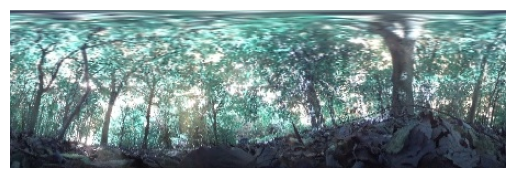

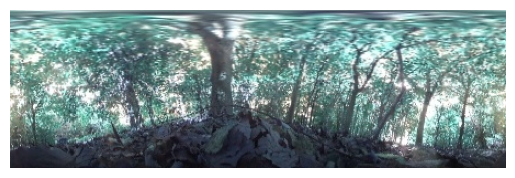

TRUE LABEL    :          179
PREDICTION    :          15
Validating...


 15%|████▍                        | 46/300 [04:56<27:46,  6.56s/it]

peak dist means  74.59722222222223
v loss  0.30830026790499687
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.72991071428571
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03425359388902074, 'MAE': 0.050553985472236364, 'peakDist': 74.72991071428571}
Validating...


 16%|████▌                        | 47/300 [05:02<27:39,  6.56s/it]

peak dist means  76.95138888888889
v loss  0.3083202876150608
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.51934523809524
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034282347453492026, 'MAE': 0.0506261299763407, 'peakDist': 78.51934523809524}
Validating...


 16%|████▋                        | 48/300 [05:09<27:18,  6.50s/it]

peak dist means  74.30902777777777
v loss  0.3082156740128994
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.08110119047619
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03425444343260357, 'MAE': 0.050542491887296946, 'peakDist': 75.08110119047619}
Validating...


 16%|████▋                        | 49/300 [05:15<26:41,  6.38s/it]

peak dist means  73.31944444444444
v loss  0.30815035477280617
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.6235119047619
tacc:  {'baseAcc': 21.875, 'MSE': 0.034267341097195946, 'MAE': 0.05057397502518836, 'peakDist': 75.6235119047619}
Validating...


 17%|████▊                        | 50/300 [05:21<25:58,  6.23s/it]

peak dist means  76.546875
v loss  0.3083640821278095
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.75446428571429
tacc:  {'baseAcc': 18.75, 'MSE': 0.03424614295363426, 'MAE': 0.05052298892821584, 'peakDist': 74.75446428571429}
Validating...


 17%|████▉                        | 51/300 [05:27<26:03,  6.28s/it]

peak dist means  76.09722222222223
v loss  0.3082975372672081
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.78794642857143
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03426626111779894, 'MAE': 0.05059269797943887, 'peakDist': 78.78794642857143}
Validating...


 17%|█████                        | 52/300 [05:33<25:55,  6.27s/it]

peak dist means  77.34548611111111
v loss  0.30829281732439995
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.22247023809524
tacc:  {'baseAcc': 21.875, 'MSE': 0.03424856208619617, 'MAE': 0.05054619553543273, 'peakDist': 75.22247023809524}
Validating...


 18%|█████                        | 53/300 [05:40<25:53,  6.29s/it]

peak dist means  77.00173611111111
v loss  0.3082100562751293
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.65029761904762
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03425612868297668, 'MAE': 0.050543129976306646, 'peakDist': 76.65029761904762}
Validating...


 18%|█████▏                       | 54/300 [05:46<26:04,  6.36s/it]

peak dist means  76.82638888888889
v loss  0.3083275370299816
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.65922619047619
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034243009452308924, 'MAE': 0.05052265719998451, 'peakDist': 76.65922619047619}
Validating...


 18%|█████▎                       | 55/300 [05:53<26:13,  6.42s/it]

peak dist means  75.46701388888889
v loss  0.30830131843686104
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  80.15401785714286
tacc:  {'baseAcc': 15.625, 'MSE': 0.0342884599452927, 'MAE': 0.05063958146742412, 'peakDist': 80.15401785714286}
Validating...


 19%|█████▍                       | 56/300 [05:59<26:33,  6.53s/it]

peak dist means  72.42708333333333
v loss  0.3080069310963154
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.43154761904762
tacc:  {'baseAcc': 18.75, 'MSE': 0.03426181702386765, 'MAE': 0.05056879190461976, 'peakDist': 77.43154761904762}
Validating...


 19%|█████▌                       | 57/300 [06:06<26:33,  6.56s/it]

peak dist means  76.79513888888889
v loss  0.3084011599421501
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.08258928571429
tacc:  {'baseAcc': 10.9375, 'MSE': 0.034254357928321474, 'MAE': 0.05054750878896032, 'peakDist': 77.08258928571429}
Validating...


 19%|█████▌                       | 58/300 [06:13<26:22,  6.54s/it]

peak dist means  75.765625
v loss  0.3082439564168453
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.34151785714286
tacc:  {'baseAcc': 25.0, 'MSE': 0.03425722249916622, 'MAE': 0.0505688213521526, 'peakDist': 77.34151785714286}
Validating...


 20%|█████▋                       | 59/300 [06:19<25:55,  6.45s/it]

peak dist means  75.40277777777777
v loss  0.30799155309796333
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.91145833333333
tacc:  {'baseAcc': 21.875, 'MSE': 0.03425998081054006, 'MAE': 0.050568756248269765, 'peakDist': 77.91145833333333}
Validating...


 20%|█████▊                       | 60/300 [06:25<25:54,  6.48s/it]

peak dist means  76.22395833333333
v loss  0.3082052990794182
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.19791666666667
tacc:  {'baseAcc': 12.5, 'MSE': 0.03426135632963408, 'MAE': 0.050570846845706306, 'peakDist': 77.19791666666667}
Validating...


 20%|█████▉                       | 61/300 [06:32<25:34,  6.42s/it]

peak dist means  74.46875
v loss  0.3084198981523514
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.00744047619048
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034242336239133565, 'MAE': 0.050519320936430065, 'peakDist': 76.00744047619048}
Validating...


 21%|█████▉                       | 62/300 [06:38<25:18,  6.38s/it]

peak dist means  77.44965277777777
v loss  0.30850788950920105
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.61979166666667
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03423525836496126, 'MAE': 0.05051278074582418, 'peakDist': 74.61979166666667}
Validating...


 21%|██████                       | 63/300 [06:44<25:13,  6.38s/it]

peak dist means  75.21701388888889
v loss  0.308146420866251
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.53348214285714
tacc:  {'baseAcc': 25.0, 'MSE': 0.03423511946485156, 'MAE': 0.05051400547935849, 'peakDist': 76.53348214285714}
Validating...


 21%|██████▏                      | 64/300 [06:51<25:06,  6.38s/it]

peak dist means  73.82118055555556
v loss  0.307891633361578
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.03348214285714
tacc:  {'baseAcc': 15.625, 'MSE': 0.03426377209169524, 'MAE': 0.05057257005856151, 'peakDist': 77.03348214285714}
Validating...


 22%|██████▎                      | 65/300 [06:57<24:23,  6.23s/it]

peak dist means  70.37152777777777
v loss  0.30788591504096985
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.03125
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03424656249227978, 'MAE': 0.05054052280528205, 'peakDist': 77.03125}
Validating...


 22%|██████▍                      | 66/300 [07:03<24:29,  6.28s/it]

peak dist means  74.57118055555556
v loss  0.30828842520713806
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.32589285714286
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03424541989252681, 'MAE': 0.0505392485786052, 'peakDist': 77.32589285714286}
Validating...


 22%|██████▍                      | 67/300 [07:09<24:32,  6.32s/it]

peak dist means  75.34201388888889
v loss  0.3080553263425827
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.00892857142857
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03424649614663351, 'MAE': 0.05053997465542385, 'peakDist': 78.00892857142857}
Validating...


 23%|██████▌                      | 68/300 [07:16<24:41,  6.39s/it]

peak dist means  82.47048611111111
v loss  0.30850692465901375
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.34002976190476
tacc:  {'baseAcc': 21.875, 'MSE': 0.03422650641628674, 'MAE': 0.050499568737688516, 'peakDist': 75.34002976190476}
Validating...


 23%|██████▋                      | 69/300 [07:23<24:54,  6.47s/it]

peak dist means  77.13888888888889
v loss  0.3082251809537411
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.77380952380952
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034204616255703424, 'MAE': 0.05043937425528254, 'peakDist': 73.77380952380952}
Validating...


 23%|██████▊                      | 70/300 [07:30<25:20,  6.61s/it]

peak dist means  76.82638888888889
v loss  0.30813074856996536
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.51041666666667
tacc:  {'baseAcc': 21.875, 'MSE': 0.03422966209195909, 'MAE': 0.0504876094914618, 'peakDist': 73.51041666666667}
Validating...


 24%|██████▊                      | 71/300 [07:36<25:13,  6.61s/it]

peak dist means  71.88368055555556
v loss  0.30777402594685555
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.26785714285714
tacc:  {'baseAcc': 12.5, 'MSE': 0.03422718087122554, 'MAE': 0.050488910327355065, 'peakDist': 76.26785714285714}
Validating...


 24%|██████▉                      | 72/300 [07:43<24:52,  6.55s/it]

peak dist means  75.265625
v loss  0.3081963360309601
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.16443452380952
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03421449856389137, 'MAE': 0.050464565555254616, 'peakDist': 74.16443452380952}
Validating...


 24%|███████                      | 73/300 [07:49<24:59,  6.61s/it]

peak dist means  72.63715277777777
v loss  0.3080756328999996
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.81845238095238
tacc:  {'baseAcc': 15.625, 'MSE': 0.03423894320925077, 'MAE': 0.05052576728519939, 'peakDist': 77.81845238095238}
Validating...


 25%|███████▏                     | 74/300 [07:55<24:22,  6.47s/it]

peak dist means  72.40625
v loss  0.307938851416111
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.88988095238095
tacc:  {'baseAcc': 18.75, 'MSE': 0.034238848657835094, 'MAE': 0.050533441560609, 'peakDist': 76.88988095238095}
Validating...


 25%|███████▎                     | 75/300 [08:02<23:54,  6.37s/it]

peak dist means  75.27951388888889
v loss  0.3079679161310196
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.66592261904762
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034233959835200084, 'MAE': 0.05052943013253666, 'peakDist': 78.66592261904762}
Validating...


 25%|███████▎                     | 76/300 [08:08<23:38,  6.33s/it]

peak dist means  72.69791666666667
v loss  0.3079454302787781
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.97247023809524
tacc:  {'baseAcc': 28.125, 'MSE': 0.034225180390335265, 'MAE': 0.05049859129247211, 'peakDist': 75.97247023809524}
Validating...


 26%|███████▍                     | 77/300 [08:14<23:09,  6.23s/it]

peak dist means  74.85763888888889
v loss  0.30786992982029915
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.23511904761905
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03422916609616507, 'MAE': 0.05050532874606904, 'peakDist': 77.23511904761905}
Validating...


 26%|███████▌                     | 78/300 [08:20<23:11,  6.27s/it]

peak dist means  75.33680555555556
v loss  0.30770178511738777
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.50892857142857
tacc:  {'baseAcc': 18.75, 'MSE': 0.03423372478712173, 'MAE': 0.0505183417172659, 'peakDist': 78.50892857142857}
Validating...


 26%|███████▋                     | 79/300 [08:27<23:14,  6.31s/it]

peak dist means  74.68576388888889
v loss  0.30778584629297256
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.69196428571429
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034215839491004034, 'MAE': 0.05048696430666106, 'peakDist': 75.69196428571429}
Validating...


 27%|███████▋                     | 80/300 [08:33<23:19,  6.36s/it]

peak dist means  79.39583333333333
v loss  0.3080468289554119
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.35342261904762
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034217199931542076, 'MAE': 0.05047692411712238, 'peakDist': 75.35342261904762}
Validating...


 27%|███████▊                     | 81/300 [08:40<23:22,  6.41s/it]

peak dist means  75.875
v loss  0.3078848198056221
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.3266369047619
tacc:  {'baseAcc': 18.75, 'MSE': 0.03423083094613893, 'MAE': 0.05051761954313233, 'peakDist': 77.3266369047619}
Validating...


 27%|███████▉                     | 82/300 [08:46<23:17,  6.41s/it]

peak dist means  76.91145833333333
v loss  0.30810820311307907
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.44642857142857
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03423446115283739, 'MAE': 0.05052208598880541, 'peakDist': 78.44642857142857}
Validating...


 28%|████████                     | 83/300 [08:53<23:47,  6.58s/it]

peak dist means  76.38020833333333
v loss  0.3080076575279236
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.5
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034215302694411504, 'MAE': 0.050471726627576916, 'peakDist': 75.5}
Validating...


 28%|████████                     | 84/300 [08:59<23:28,  6.52s/it]

peak dist means  73.80034722222223
v loss  0.30777620524168015
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.42485119047619
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034216990428311486, 'MAE': 0.050486573860758825, 'peakDist': 77.42485119047619}
Validating...


 28%|████████▏                    | 85/300 [09:06<23:22,  6.52s/it]

peak dist means  74.00694444444444
v loss  0.3078904077410698
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.2046130952381
tacc:  {'baseAcc': 21.875, 'MSE': 0.03422821171226956, 'MAE': 0.05050965096978914, 'peakDist': 75.2046130952381}
Validating...


 29%|████████▎                    | 86/300 [09:13<23:45,  6.66s/it]

peak dist means  78.74826388888889
v loss  0.3078059069812298
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.47991071428571
tacc:  {'baseAcc': 25.0, 'MSE': 0.03420270127909524, 'MAE': 0.050444823645410086, 'peakDist': 75.47991071428571}
Validating...


 29%|████████▍                    | 87/300 [09:20<23:44,  6.69s/it]

peak dist means  76.39236111111111
v loss  0.3078923933207989
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.87276785714286
tacc:  {'baseAcc': 18.75, 'MSE': 0.034206701176507134, 'MAE': 0.05045645772701218, 'peakDist': 76.87276785714286}
Validating...


 29%|████████▌                    | 88/300 [09:26<23:26,  6.63s/it]

peak dist means  79.52604166666667
v loss  0.308343268930912
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.53794642857143
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03418999608783495, 'MAE': 0.05042801584516253, 'peakDist': 75.53794642857143}
Validating...


 30%|████████▌                    | 89/300 [09:32<22:48,  6.49s/it]

peak dist means  72.66319444444444
v loss  0.3075850158929825
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.29613095238095
tacc:  {'baseAcc': 15.625, 'MSE': 0.03421289846301079, 'MAE': 0.050474829971790314, 'peakDist': 75.29613095238095}
Validating...


 30%|████████▋                    | 90/300 [09:39<22:41,  6.48s/it]

peak dist means  74.64756944444444
v loss  0.3076789900660515
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.3110119047619
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034200444107963926, 'MAE': 0.050449899796928675, 'peakDist': 76.3110119047619}
Validating...


 30%|████████▊                    | 91/300 [09:45<22:23,  6.43s/it]

peak dist means  75.82291666666667
v loss  0.30787959694862366
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.23214285714286
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03419470627393041, 'MAE': 0.05043809914163181, 'peakDist': 75.23214285714286}
Validating...


 31%|████████▉                    | 92/300 [09:51<21:53,  6.32s/it]

peak dist means  73.125
v loss  0.3077755458652973
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.61681547619048
tacc:  {'baseAcc': 28.125, 'MSE': 0.03420269240935644, 'MAE': 0.0504656701925255, 'peakDist': 76.61681547619048}
Validating...


 31%|████████▉                    | 93/300 [09:57<21:35,  6.26s/it]

peak dist means  76.38541666666667
v loss  0.30785565450787544
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.78125
tacc:  {'baseAcc': 12.5, 'MSE': 0.034207219701437724, 'MAE': 0.05045859568885395, 'peakDist': 76.78125}
Validating...


 31%|█████████                    | 94/300 [10:04<21:55,  6.39s/it]

peak dist means  71.08333333333333
v loss  0.3076377622783184
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.68080357142857
tacc:  {'baseAcc': 21.875, 'MSE': 0.034202047934134804, 'MAE': 0.0504463937665735, 'peakDist': 75.68080357142857}
Validating...


 32%|█████████▏                   | 95/300 [10:10<21:47,  6.38s/it]

peak dist means  75.09201388888889
v loss  0.3080221526324749
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.33482142857143
tacc:  {'baseAcc': 28.125, 'MSE': 0.0341826407682328, 'MAE': 0.05042839511519387, 'peakDist': 75.33482142857143}
Validating...


 32%|█████████▎                   | 96/300 [10:17<21:58,  6.46s/it]

peak dist means  78.47743055555556
v loss  0.30774160474538803
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.22767857142857
tacc:  {'baseAcc': 15.625, 'MSE': 0.0341983407381035, 'MAE': 0.05044584135924067, 'peakDist': 77.22767857142857}
Validating...


 32%|█████████▍                   | 97/300 [10:23<21:38,  6.40s/it]

peak dist means  77.30555555555556
v loss  0.30792469158768654
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.69642857142857
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034195532578797566, 'MAE': 0.05042908145558266, 'peakDist': 75.69642857142857}
Validating...


 33%|█████████▍                   | 98/300 [10:30<21:37,  6.42s/it]

peak dist means  76.71527777777777
v loss  0.30793190374970436
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.65104166666667
tacc:  {'baseAcc': 15.625, 'MSE': 0.03422172527228083, 'MAE': 0.05049371985452516, 'peakDist': 79.65104166666667}
Validating...


 33%|█████████▌                   | 99/300 [10:37<21:55,  6.54s/it]

peak dist means  73.90625
v loss  0.30776650086045265
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.80952380952381
tacc:  {'baseAcc': 14.0625, 'MSE': 0.034218467062427885, 'MAE': 0.05048898820366178, 'peakDist': 77.80952380952381}
Validating...


 33%|█████████▎                  | 100/300 [10:43<21:49,  6.55s/it]

peak dist means  72.00173611111111
v loss  0.3075532056391239
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.13541666666667
tacc:  {'baseAcc': 18.75, 'MSE': 0.03423128401239713, 'MAE': 0.0505259113297576, 'peakDist': 78.13541666666667}
Validating...


 34%|█████████▍                  | 101/300 [10:50<22:12,  6.70s/it]

peak dist means  74.36805555555556
v loss  0.3075406514108181
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.63541666666667
tacc:  {'baseAcc': 28.125, 'MSE': 0.034194025077990124, 'MAE': 0.05044025360118775, 'peakDist': 77.63541666666667}
Validating...


 34%|█████████▌                  | 102/300 [10:57<21:48,  6.61s/it]

peak dist means  76.32118055555556
v loss  0.30779460445046425
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.12053571428571
tacc:  {'baseAcc': 15.625, 'MSE': 0.03421147877261752, 'MAE': 0.05045129819994881, 'peakDist': 75.12053571428571}
Validating...


 34%|█████████▌                  | 103/300 [11:03<21:42,  6.61s/it]

peak dist means  71.74131944444444
v loss  0.3079853542149067
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.94940476190476
tacc:  {'baseAcc': 15.625, 'MSE': 0.034198579511472156, 'MAE': 0.05043188748615129, 'peakDist': 73.94940476190476}
Validating...


 35%|█████████▋                  | 104/300 [11:09<21:20,  6.53s/it]

peak dist means  78.54166666666667
v loss  0.3077917844057083
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.18526785714286
tacc:  {'baseAcc': 18.75, 'MSE': 0.03417937670435224, 'MAE': 0.05041370150588807, 'peakDist': 77.18526785714286}
Validating...


 35%|█████████▊                  | 105/300 [11:16<20:54,  6.43s/it]

peak dist means  73.92534722222223
v loss  0.3080097697675228
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.33854166666667
tacc:  {'baseAcc': 21.875, 'MSE': 0.03417218565231278, 'MAE': 0.05038169487601235, 'peakDist': 74.33854166666667}
Validating...


 35%|█████████▉                  | 106/300 [11:22<20:45,  6.42s/it]

peak dist means  71.46527777777777
v loss  0.30760490521788597
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.97693452380952
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034216978188071935, 'MAE': 0.05047606588119552, 'peakDist': 78.97693452380952}
Validating...


 36%|█████████▉                  | 107/300 [11:28<20:32,  6.39s/it]

peak dist means  75.21006944444444
v loss  0.3078352175652981
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.38244047619048
tacc:  {'baseAcc': 21.875, 'MSE': 0.034200760757639295, 'MAE': 0.05043765423553331, 'peakDist': 77.38244047619048}
Validating...


 36%|██████████                  | 108/300 [11:34<20:05,  6.28s/it]

peak dist means  77.28819444444444
v loss  0.3076687604188919
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.84002976190476
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03415512293577194, 'MAE': 0.05036295453707377, 'peakDist': 72.84002976190476}
Validating...


 36%|██████████▏                 | 109/300 [11:41<20:01,  6.29s/it]

peak dist means  75.92881944444444
v loss  0.3074873983860016
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.13616071428571
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03418477163428352, 'MAE': 0.05040265495578448, 'peakDist': 74.13616071428571}
Validating...


 37%|██████████▎                 | 110/300 [11:47<19:55,  6.29s/it]

peak dist means  76.57638888888889
v loss  0.3077333979308605
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.74776785714286
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03418060959804626, 'MAE': 0.05041599610731715, 'peakDist': 78.74776785714286}
Validating...


 37%|██████████▎                 | 111/300 [11:53<19:40,  6.25s/it]

peak dist means  75.95138888888889
v loss  0.3076513037085533
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.2016369047619
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03419108032470658, 'MAE': 0.050436391007332576, 'peakDist': 77.2016369047619}
Validating...


 37%|██████████▍                 | 112/300 [12:00<19:47,  6.32s/it]

peak dist means  74.04340277777777
v loss  0.3076203987002373
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.61160714285714
tacc:  {'baseAcc': 21.875, 'MSE': 0.034149859100580215, 'MAE': 0.05034350940868968, 'peakDist': 75.61160714285714}
Validating...


 38%|██████████▌                 | 113/300 [12:06<20:09,  6.47s/it]

peak dist means  75.59895833333333
v loss  0.30813517048954964
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  68.62723214285714
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034170456940219515, 'MAE': 0.050393098344405494, 'peakDist': 68.62723214285714}
Validating...


 38%|██████████▋                 | 114/300 [12:13<20:01,  6.46s/it]

peak dist means  68.64236111111111
v loss  0.30782290548086166
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.78050595238095
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034190903639509565, 'MAE': 0.05042806374175208, 'peakDist': 67.78050595238095}
Validating...


 38%|██████████▋                 | 115/300 [12:19<19:59,  6.49s/it]

peak dist means  65.10590277777777
v loss  0.30754199624061584
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.83407738095238
tacc:  {'baseAcc': 28.125, 'MSE': 0.03415245917581376, 'MAE': 0.05035971619543575, 'peakDist': 65.83407738095238}
Validating...


 39%|██████████▊                 | 116/300 [12:26<20:20,  6.63s/it]

peak dist means  65.95138888888889
v loss  0.30783282965421677
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.76339285714286
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03418843253027825, 'MAE': 0.05041743247281937, 'peakDist': 67.76339285714286}
Validating...


 39%|██████████▉                 | 117/300 [12:33<19:52,  6.52s/it]

peak dist means  67.83159722222223
v loss  0.30805058032274246
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.63095238095238
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03418783683862005, 'MAE': 0.05041931338963054, 'peakDist': 66.63095238095238}
Validating...


 39%|███████████                 | 118/300 [12:39<19:47,  6.52s/it]

peak dist means  64.82638888888889
v loss  0.3076980300247669
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.17857142857143
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03419608037386622, 'MAE': 0.050431208951132636, 'peakDist': 67.17857142857143}
Validating...


 40%|███████████                 | 119/300 [12:46<19:46,  6.56s/it]

peak dist means  68.02430555555556
v loss  0.3079936094582081
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.5014880952381
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03418101742863655, 'MAE': 0.050406444108202345, 'peakDist': 67.5014880952381}
Validating...


 40%|███████████▏                | 120/300 [12:52<19:35,  6.53s/it]

peak dist means  67.83854166666667
v loss  0.307538278400898
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.32589285714286
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034168200833456855, 'MAE': 0.0503905342803115, 'peakDist': 65.32589285714286}
Validating...


 40%|███████████▎                | 121/300 [12:59<19:15,  6.46s/it]

peak dist means  67.00347222222223
v loss  0.30779504776000977
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.25967261904762
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034156418449821924, 'MAE': 0.05037713849118778, 'peakDist': 67.25967261904762}
Validating...


 41%|███████████▍                | 122/300 [13:05<18:55,  6.38s/it]

peak dist means  66.12152777777777
v loss  0.30784285068511963
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.76488095238095
tacc:  {'baseAcc': 21.875, 'MSE': 0.03416567455445017, 'MAE': 0.050383697485639936, 'peakDist': 66.76488095238095}
Validating...


 41%|███████████▍                | 123/300 [13:11<18:16,  6.19s/it]

peak dist means  66.22395833333333
v loss  0.3075494132936001
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.97395833333333
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03418895300655138, 'MAE': 0.050416057131120136, 'peakDist': 65.97395833333333}
Validating...


 41%|███████████▌                | 124/300 [13:17<18:09,  6.19s/it]

peak dist means  66.30555555555556
v loss  0.30736206844449043
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.49181547619048
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034205510857559386, 'MAE': 0.050452206815992086, 'peakDist': 67.49181547619048}
Validating...


 42%|███████████▋                | 125/300 [13:23<18:02,  6.19s/it]

peak dist means  68.14583333333333
v loss  0.3078610710799694
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.9546130952381
tacc:  {'baseAcc': 18.75, 'MSE': 0.034166614569368814, 'MAE': 0.05037043829049383, 'peakDist': 64.9546130952381}
Validating...


 42%|███████████▊                | 126/300 [13:29<17:58,  6.20s/it]

peak dist means  68.37326388888889
v loss  0.30778342485427856
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.30133928571429
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034179748878592535, 'MAE': 0.050399113446474075, 'peakDist': 66.30133928571429}
Validating...


 42%|███████████▊                | 127/300 [13:36<18:10,  6.30s/it]

peak dist means  62.17534722222222
v loss  0.3078307695686817
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.1733630952381
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03416330207671438, 'MAE': 0.050372459703967684, 'peakDist': 64.1733630952381}
Validating...


 43%|███████████▉                | 128/300 [13:42<18:21,  6.40s/it]

peak dist means  63.095486111111114
v loss  0.3072505295276642
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.64955357142857
tacc:  {'baseAcc': 25.0, 'MSE': 0.03414111282853853, 'MAE': 0.05031926965429669, 'peakDist': 63.64955357142857}
Validating...


 43%|████████████                | 129/300 [13:49<18:25,  6.47s/it]

peak dist means  67.78645833333333
v loss  0.3076837733387947
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.99330357142857
tacc:  {'baseAcc': 15.625, 'MSE': 0.03417597090204557, 'MAE': 0.05040594687064489, 'peakDist': 65.99330357142857}
Validating...


 43%|████████████▏               | 130/300 [13:56<18:32,  6.55s/it]

peak dist means  64.34895833333333
v loss  0.30678650736808777
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.53199404761905
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03415917090716816, 'MAE': 0.05036534244815508, 'peakDist': 66.53199404761905}
Validating...


 44%|████████████▏               | 131/300 [14:02<18:27,  6.56s/it]

peak dist means  66.91840277777777
v loss  0.30757736414670944
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.88244047619048
tacc:  {'baseAcc': 15.625, 'MSE': 0.03413289767645654, 'MAE': 0.05034311701144491, 'peakDist': 65.88244047619048}
Validating...


 44%|████████████▎               | 132/300 [14:09<18:36,  6.65s/it]

peak dist means  69.20486111111111
v loss  0.30755650997161865
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  68.60416666666667
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03414076708611988, 'MAE': 0.05031989940575191, 'peakDist': 68.60416666666667}
Validating...


 44%|████████████▍               | 133/300 [14:16<18:21,  6.59s/it]

peak dist means  66.54166666666667
v loss  0.3075728081166744
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.0625
tacc:  {'baseAcc': 25.0, 'MSE': 0.03416311971488453, 'MAE': 0.05037715002184823, 'peakDist': 65.0625}
Validating...


 45%|████████████▌               | 134/300 [14:22<18:04,  6.53s/it]

peak dist means  65.40972222222223
v loss  0.3074166178703308
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.83556547619048
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03413123318127224, 'MAE': 0.05029492843009177, 'peakDist': 65.83556547619048}
Validating...


 45%|████████████▌               | 135/300 [14:29<18:01,  6.56s/it]

peak dist means  64.61805555555556
v loss  0.30723847821354866
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.72172619047619
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03416665962764195, 'MAE': 0.05037843577918552, 'peakDist': 66.72172619047619}
Validating...


 45%|████████████▋               | 136/300 [14:35<17:44,  6.49s/it]

peak dist means  69.00173611111111
v loss  0.3079675994813442
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.2671130952381
tacc:  {'baseAcc': 28.125, 'MSE': 0.034142463689758665, 'MAE': 0.05033923561374346, 'peakDist': 66.2671130952381}
Validating...


 46%|████████████▊               | 137/300 [14:41<17:18,  6.37s/it]

peak dist means  65.27604166666667
v loss  0.30726076662540436
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.95982142857143
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03417593453611646, 'MAE': 0.050389464235021955, 'peakDist': 64.95982142857143}
Validating...


 46%|████████████▉               | 138/300 [14:47<17:15,  6.39s/it]

peak dist means  69.28993055555556
v loss  0.30763403326272964
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.47991071428571
tacc:  {'baseAcc': 31.25, 'MSE': 0.03413604998162815, 'MAE': 0.05032810551070031, 'peakDist': 64.47991071428571}
Validating...


 46%|████████████▉               | 139/300 [14:54<16:52,  6.29s/it]

peak dist means  63.21875
v loss  0.30724313482642174
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.40550595238095
tacc:  {'baseAcc': 25.0, 'MSE': 0.034163828229620344, 'MAE': 0.050357025648866384, 'peakDist': 65.40550595238095}
Validating...


 47%|█████████████               | 140/300 [15:00<16:52,  6.33s/it]

peak dist means  65.96354166666667
v loss  0.3075781315565109
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.22395833333333
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03411190264991352, 'MAE': 0.05026355758309364, 'peakDist': 64.22395833333333}
Validating...


 47%|█████████████▏              | 141/300 [15:06<16:34,  6.25s/it]

peak dist means  62.92881944444444
v loss  0.30738604068756104
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.3266369047619
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03415065276480857, 'MAE': 0.05035021883391198, 'peakDist': 65.3266369047619}
Validating...


 47%|█████████████▎              | 142/300 [15:12<16:37,  6.31s/it]

peak dist means  66.31423611111111
v loss  0.30757132917642593
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.87053571428571
tacc:  {'baseAcc': 25.0, 'MSE': 0.03415881966551145, 'MAE': 0.05037209604467664, 'peakDist': 66.87053571428571}
Validating...


 48%|█████████████▎              | 143/300 [15:19<16:58,  6.49s/it]

peak dist means  62.91319444444444
v loss  0.3077593669295311
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.58779761904762
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034154956184682395, 'MAE': 0.05035156259934107, 'peakDist': 65.58779761904762}
Validating...


 48%|█████████████▍              | 144/300 [15:26<17:00,  6.54s/it]

peak dist means  62.270833333333336
v loss  0.30738477408885956
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.10193452380952
tacc:  {'baseAcc': 28.125, 'MSE': 0.034166342445782254, 'MAE': 0.050364755981025244, 'peakDist': 65.10193452380952}
Validating...


 48%|█████████████▌              | 145/300 [15:33<17:09,  6.64s/it]

peak dist means  64.34375
v loss  0.30728254467248917
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.82440476190476
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03414752777843248, 'MAE': 0.05033077228636969, 'peakDist': 64.82440476190476}
Validating...


 49%|█████████████▋              | 146/300 [15:40<17:12,  6.71s/it]

peak dist means  65.43923611111111
v loss  0.3072778470814228
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.28571428571429
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03412642950812975, 'MAE': 0.0502942619579179, 'peakDist': 64.28571428571429}
Validating...


 49%|█████████████▋              | 147/300 [15:46<16:58,  6.65s/it]

peak dist means  64.99652777777777
v loss  0.30744460225105286
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.13392857142857
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03413880297115871, 'MAE': 0.05032292895373844, 'peakDist': 64.13392857142857}
Validating...


 49%|█████████████▊              | 148/300 [15:53<17:04,  6.74s/it]

peak dist means  65.31076388888889
v loss  0.3075961358845234
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.68080357142857
tacc:  {'baseAcc': 31.25, 'MSE': 0.03417701061282839, 'MAE': 0.05041685185971714, 'peakDist': 65.68080357142857}
Validating...


 50%|█████████████▉              | 149/300 [16:00<16:38,  6.61s/it]

peak dist means  65.11284722222223
v loss  0.3075176477432251
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.7328869047619
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03414321974629447, 'MAE': 0.05030827348430952, 'peakDist': 64.7328869047619}
Validating...


 50%|██████████████              | 150/300 [16:06<16:22,  6.55s/it]

peak dist means  65.01041666666667
v loss  0.30720075964927673
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.04166666666667
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034167472805295675, 'MAE': 0.050397003158217386, 'peakDist': 67.04166666666667}
Validating...


 50%|██████████████              | 151/300 [16:12<16:02,  6.46s/it]

peak dist means  65.32291666666667
v loss  0.3075987212359905
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.96502976190476
tacc:  {'baseAcc': 25.0, 'MSE': 0.03418882776583944, 'MAE': 0.05041727494625818, 'peakDist': 66.96502976190476}
Validating...


 51%|██████████████▏             | 152/300 [16:18<15:48,  6.41s/it]

peak dist means  63.87847222222222
v loss  0.3074890188872814
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.38244047619048
tacc:  {'baseAcc': 18.75, 'MSE': 0.03412673941680363, 'MAE': 0.05031388696460497, 'peakDist': 65.38244047619048}
Validating...


 51%|██████████████▎             | 153/300 [16:25<15:33,  6.35s/it]

peak dist means  69.62152777777777
v loss  0.3075747899711132
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.91220238095238
tacc:  {'baseAcc': 21.875, 'MSE': 0.034152984441745846, 'MAE': 0.05035765948040145, 'peakDist': 66.91220238095238}
Validating...


 51%|██████████████▎             | 154/300 [16:31<15:18,  6.29s/it]

peak dist means  67.390625
v loss  0.30749889090657234
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.515625
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034168763884476254, 'MAE': 0.050383698904798144, 'peakDist': 65.515625}
Validating...


 52%|██████████████▍             | 155/300 [16:37<15:16,  6.32s/it]

peak dist means  66.07986111111111
v loss  0.3074249289929867
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.30580357142857
tacc:  {'baseAcc': 25.0, 'MSE': 0.03414434194564819, 'MAE': 0.0503409645032315, 'peakDist': 65.30580357142857}
Validating...


 52%|██████████████▌             | 156/300 [16:43<15:05,  6.29s/it]

peak dist means  62.59375
v loss  0.30694397911429405
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.99107142857143
tacc:  {'baseAcc': 31.25, 'MSE': 0.03415649082689058, 'MAE': 0.05035682962763877, 'peakDist': 66.99107142857143}
Validating...


 52%|██████████████▋             | 157/300 [16:50<15:05,  6.33s/it]

peak dist means  64.90451388888889
v loss  0.30688272044062614
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.83779761904762
tacc:  {'baseAcc': 31.25, 'MSE': 0.03412769202675138, 'MAE': 0.05029957368969917, 'peakDist': 63.83779761904762}
Validating...


 53%|██████████████▋             | 158/300 [16:56<14:58,  6.32s/it]

peak dist means  61.192708333333336
v loss  0.30718398466706276
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.789434523809526
tacc:  {'baseAcc': 21.875, 'MSE': 0.034123050137644724, 'MAE': 0.050300104454869314, 'peakDist': 62.789434523809526}
Validating...


 53%|██████████████▊             | 159/300 [17:03<15:01,  6.39s/it]

peak dist means  64.03298611111111
v loss  0.30711913481354713
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.43452380952381
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03416521935945466, 'MAE': 0.050383491352910086, 'peakDist': 65.43452380952381}
Validating...


 53%|██████████████▉             | 160/300 [17:09<15:09,  6.50s/it]

peak dist means  65.33506944444444
v loss  0.3074885793030262
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.55580357142857
tacc:  {'baseAcc': 31.25, 'MSE': 0.03413327712388266, 'MAE': 0.05031913554384595, 'peakDist': 63.55580357142857}
Validating...


 54%|███████████████             | 161/300 [17:16<15:05,  6.52s/it]

peak dist means  64.671875
v loss  0.30768122896552086
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.52678571428571
tacc:  {'baseAcc': 25.0, 'MSE': 0.034131256419987904, 'MAE': 0.05033057573295775, 'peakDist': 66.52678571428571}
Validating...


 54%|███████████████             | 162/300 [17:23<15:04,  6.55s/it]

peak dist means  68.60069444444444
v loss  0.30739520490169525
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.01264880952381
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03415088107188543, 'MAE': 0.050350980034896305, 'peakDist': 65.01264880952381}
Validating...


 54%|███████████████▏            | 163/300 [17:29<15:01,  6.58s/it]

peak dist means  65.67881944444444
v loss  0.307219784706831
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.02306547619048
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03414501888411386, 'MAE': 0.050334733156930836, 'peakDist': 64.02306547619048}
Validating...


 55%|███████████████▎            | 164/300 [17:36<14:48,  6.53s/it]

peak dist means  64.51388888888889
v loss  0.30758580192923546
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.2046130952381
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034142150942768366, 'MAE': 0.05032678799969809, 'peakDist': 64.2046130952381}
Validating...


 55%|███████████████▍            | 165/300 [17:42<14:13,  6.33s/it]

peak dist means  64.14930555555556
v loss  0.3072576932609081
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.57738095238095
tacc:  {'baseAcc': 37.5, 'MSE': 0.034127872792028245, 'MAE': 0.05029046375836645, 'peakDist': 62.57738095238095}
Validating...


 55%|███████████████▍            | 166/300 [17:48<14:09,  6.34s/it]

peak dist means  63.392361111111114
v loss  0.30721423774957657
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.34598214285714
tacc:  {'baseAcc': 21.875, 'MSE': 0.03413503333216622, 'MAE': 0.05031265690922737, 'peakDist': 64.34598214285714}
Validating...


 56%|███████████████▌            | 167/300 [17:54<13:51,  6.25s/it]

peak dist means  63.126736111111114
v loss  0.3072037175297737
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.92708333333333
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03414226483021464, 'MAE': 0.05032468480723245, 'peakDist': 65.92708333333333}
Validating...


 56%|███████████████▋            | 168/300 [18:01<13:54,  6.32s/it]

peak dist means  66.734375
v loss  0.30717556178569794
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.420386904761905
tacc:  {'baseAcc': 31.25, 'MSE': 0.034101580934865136, 'MAE': 0.05025130652246021, 'peakDist': 63.420386904761905}
Validating...


 56%|███████████████▊            | 169/300 [18:07<13:55,  6.37s/it]

peak dist means  66.05381944444444
v loss  0.30747752264142036
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.69568452380952
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03415520471476373, 'MAE': 0.050358615638244716, 'peakDist': 65.69568452380952}
Validating...


 57%|███████████████▊            | 170/300 [18:14<14:05,  6.51s/it]

peak dist means  67.00173611111111
v loss  0.3075716979801655
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.0014880952381
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034173998272135145, 'MAE': 0.05039015252675329, 'peakDist': 67.0014880952381}
Validating...


 57%|███████████████▉            | 171/300 [18:20<13:56,  6.48s/it]

peak dist means  61.20659722222222
v loss  0.3070852756500244
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.55133928571429
tacc:  {'baseAcc': 20.3125, 'MSE': 0.0341519880152884, 'MAE': 0.05036025121808052, 'peakDist': 65.55133928571429}
Validating...


 57%|████████████████            | 172/300 [18:27<14:03,  6.59s/it]

peak dist means  63.244791666666664
v loss  0.30699440091848373
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.45758928571429
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03417427376622245, 'MAE': 0.05039258762484505, 'peakDist': 64.45758928571429}
Validating...


 58%|████████████████▏           | 173/300 [18:34<13:54,  6.57s/it]

peak dist means  62.548611111111114
v loss  0.30716489627957344
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.15848214285714
tacc:  {'baseAcc': 28.125, 'MSE': 0.034160059122812184, 'MAE': 0.050356325649079825, 'peakDist': 65.15848214285714}
Validating...


 58%|████████████████▏           | 174/300 [18:40<13:57,  6.64s/it]

peak dist means  64.578125
v loss  0.30647876113653183
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.98809523809524
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03409679500120027, 'MAE': 0.050236855766602924, 'peakDist': 63.98809523809524}
Validating...


 58%|████████████████▎           | 175/300 [18:47<13:48,  6.63s/it]

peak dist means  64.98090277777777
v loss  0.30704814195632935
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.84672619047619
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03413058036849612, 'MAE': 0.05031686666465941, 'peakDist': 66.84672619047619}
Validating...


 59%|████████████████▍           | 176/300 [18:54<13:53,  6.72s/it]

peak dist means  64.00694444444444
v loss  0.30713896080851555
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.15625
tacc:  {'baseAcc': 15.625, 'MSE': 0.03415960250865845, 'MAE': 0.05035604181743804, 'peakDist': 65.15625}
Validating...


 59%|████████████████▌           | 177/300 [19:01<13:40,  6.67s/it]

peak dist means  65.14583333333333
v loss  0.30732955411076546
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.28050595238095
tacc:  {'baseAcc': 31.25, 'MSE': 0.034129628645522256, 'MAE': 0.05031379542890049, 'peakDist': 66.28050595238095}
Validating...


 59%|████████████████▌           | 178/300 [19:07<13:18,  6.54s/it]

peak dist means  65.58854166666667
v loss  0.30760573595762253
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.51785714285714
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03416165620798156, 'MAE': 0.050370452304681144, 'peakDist': 65.51785714285714}
Validating...


 60%|████████████████▋           | 179/300 [19:13<13:07,  6.51s/it]

peak dist means  60.00868055555556
v loss  0.30724238231778145
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.07440476190476
tacc:  {'baseAcc': 25.0, 'MSE': 0.03414768725633621, 'MAE': 0.05033856293275243, 'peakDist': 65.07440476190476}
Validating...


 60%|████████████████▊           | 180/300 [19:20<13:01,  6.51s/it]

peak dist means  61.802083333333336
v loss  0.3069969043135643
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.63392857142857
tacc:  {'baseAcc': 25.0, 'MSE': 0.034152372784557794, 'MAE': 0.050360414953458874, 'peakDist': 66.63392857142857}
Validating...


 60%|████████████████▉           | 181/300 [19:26<12:46,  6.44s/it]

peak dist means  65.26041666666667
v loss  0.3070247918367386
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.24107142857143
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03414594683618773, 'MAE': 0.050321820591177256, 'peakDist': 64.24107142857143}
Validating...


 61%|████████████████▉           | 182/300 [19:32<12:36,  6.41s/it]

peak dist means  61.848958333333336
v loss  0.3067716211080551
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.0639880952381
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034145551245836986, 'MAE': 0.050346948738609044, 'peakDist': 64.0639880952381}
Validating...


 61%|█████████████████           | 183/300 [19:39<12:28,  6.40s/it]

peak dist means  64.77256944444444
v loss  0.3071608282625675
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.09300595238095
tacc:  {'baseAcc': 28.125, 'MSE': 0.03412369851555143, 'MAE': 0.05030158073419616, 'peakDist': 64.09300595238095}
Validating...


 61%|█████████████████▏          | 184/300 [19:45<12:13,  6.33s/it]

peak dist means  62.58159722222222
v loss  0.30727512389421463
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.96056547619048
tacc:  {'baseAcc': 25.0, 'MSE': 0.03412462079099247, 'MAE': 0.05030354218823569, 'peakDist': 64.96056547619048}
Validating...


 62%|█████████████████▎          | 185/300 [19:51<11:58,  6.25s/it]

peak dist means  62.21180555555556
v loss  0.3073037303984165
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.97321428571429
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03416039031885919, 'MAE': 0.0503556119898955, 'peakDist': 66.97321428571429}
Validating...


 62%|█████████████████▎          | 186/300 [19:57<12:01,  6.33s/it]

peak dist means  64.26909722222223
v loss  0.3072679825127125
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.57589285714286
tacc:  {'baseAcc': 28.125, 'MSE': 0.03415106130497796, 'MAE': 0.050354390094677605, 'peakDist': 65.57589285714286}
Validating...


 62%|█████████████████▍          | 187/300 [20:04<12:09,  6.46s/it]

peak dist means  64.66840277777777
v loss  0.30729159712791443
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.658482142857146
tacc:  {'baseAcc': 20.3125, 'MSE': 0.0341407312523751, 'MAE': 0.05032618680880183, 'peakDist': 63.658482142857146}
Validating...


 63%|█████████████████▌          | 188/300 [20:11<12:15,  6.56s/it]

peak dist means  65.49305555555556
v loss  0.30764104053378105
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.578125
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03411520183795974, 'MAE': 0.05028296865168072, 'peakDist': 63.578125}
Validating...


 63%|█████████████████▋          | 189/300 [20:18<12:09,  6.57s/it]

peak dist means  66.57638888888889
v loss  0.3076860047876835
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.74032738095238
tacc:  {'baseAcc': 25.0, 'MSE': 0.03415045301829066, 'MAE': 0.050337361970118115, 'peakDist': 63.74032738095238}
Validating...


 63%|█████████████████▋          | 190/300 [20:25<12:14,  6.68s/it]

peak dist means  64.91840277777777
v loss  0.30756791681051254
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.28794642857143
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03410530799911136, 'MAE': 0.05025850786339669, 'peakDist': 62.28794642857143}
Validating...


 64%|█████████████████▊          | 191/300 [20:32<12:22,  6.81s/it]

peak dist means  64.10763888888889
v loss  0.30716051533818245
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.53497023809524
tacc:  {'baseAcc': 21.875, 'MSE': 0.03412142679804847, 'MAE': 0.05028972242559705, 'peakDist': 63.53497023809524}
Validating...


 64%|█████████████████▉          | 192/300 [20:39<12:19,  6.85s/it]

peak dist means  63.359375
v loss  0.3068291209638119
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.4233630952381
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03412444605713799, 'MAE': 0.0502901618324575, 'peakDist': 65.4233630952381}
Validating...


 64%|██████████████████          | 193/300 [20:45<12:07,  6.80s/it]

peak dist means  66.00694444444444
v loss  0.30692166462540627
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.41666666666667
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03410205404673304, 'MAE': 0.05026148507992426, 'peakDist': 64.41666666666667}
Validating...


 65%|██████████████████          | 194/300 [20:52<12:02,  6.82s/it]

peak dist means  62.208333333333336
v loss  0.3068913333117962
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.901785714285715
tacc:  {'baseAcc': 21.875, 'MSE': 0.034090496599674225, 'MAE': 0.05021549441984722, 'peakDist': 61.901785714285715}
Validating...


 65%|██████████████████▏         | 195/300 [20:58<11:41,  6.68s/it]

peak dist means  64.88368055555556
v loss  0.3072708249092102
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.591517857142854
tacc:  {'baseAcc': 21.875, 'MSE': 0.03410472898256211, 'MAE': 0.05025405525451615, 'peakDist': 62.591517857142854}
Validating...


 65%|██████████████████▎         | 196/300 [21:05<11:37,  6.71s/it]

peak dist means  62.06597222222222
v loss  0.3073124773800373
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.880208333333336
tacc:  {'baseAcc': 42.1875, 'MSE': 0.034105072951033, 'MAE': 0.050267214221613746, 'peakDist': 62.880208333333336}
Validating...


 66%|██████████████████▍         | 197/300 [21:12<11:24,  6.65s/it]

peak dist means  62.74305555555556
v loss  0.30710532516241074
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.27901785714286
tacc:  {'baseAcc': 20.3125, 'MSE': 0.0341358646040871, 'MAE': 0.050319314889964606, 'peakDist': 65.27901785714286}
Validating...


 66%|██████████████████▍         | 198/300 [21:18<11:16,  6.63s/it]

peak dist means  65.92534722222223
v loss  0.30755041167140007
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.104166666666664
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03410937619351205, 'MAE': 0.05026516903723989, 'peakDist': 63.104166666666664}
Validating...


 66%|██████████████████▌         | 199/300 [21:25<10:58,  6.52s/it]

peak dist means  63.048611111111114
v loss  0.30704672634601593
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.89583333333333
tacc:  {'baseAcc': 21.875, 'MSE': 0.03410805673116729, 'MAE': 0.05028576794124785, 'peakDist': 64.89583333333333}
Validating...


 67%|██████████████████▋         | 200/300 [21:31<10:46,  6.46s/it]

peak dist means  59.779513888888886
v loss  0.3066762089729309
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.91517857142857
tacc:  {'baseAcc': 31.25, 'MSE': 0.0341406086725848, 'MAE': 0.050331355028209235, 'peakDist': 64.91517857142857}
Validating...


 67%|██████████████████▊         | 201/300 [21:37<10:37,  6.44s/it]

peak dist means  61.70659722222222
v loss  0.30701514706015587
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.53125
tacc:  {'baseAcc': 15.625, 'MSE': 0.03412747187983422, 'MAE': 0.05030596912616775, 'peakDist': 62.53125}
Validating...


 67%|██████████████████▊         | 202/300 [21:44<10:24,  6.37s/it]

peak dist means  63.107638888888886
v loss  0.30686528235673904
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.87425595238095
tacc:  {'baseAcc': 15.625, 'MSE': 0.03415746277286893, 'MAE': 0.05034446556653295, 'peakDist': 65.87425595238095}
Validating...


 68%|██████████████████▉         | 203/300 [21:50<10:21,  6.40s/it]

peak dist means  62.33506944444444
v loss  0.30722056701779366
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.9546130952381
tacc:  {'baseAcc': 21.875, 'MSE': 0.034146463232381005, 'MAE': 0.050360807173308875, 'peakDist': 64.9546130952381}
Validating...


 68%|███████████████████         | 204/300 [21:56<10:10,  6.36s/it]

peak dist means  64.38368055555556
v loss  0.3071480914950371
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.22172619047619
tacc:  {'baseAcc': 25.0, 'MSE': 0.034092223892609276, 'MAE': 0.05020922688501222, 'peakDist': 60.22172619047619}
Validating...


 68%|███████████████████▏        | 205/300 [22:02<10:00,  6.32s/it]

peak dist means  65.99131944444444
v loss  0.3069162927567959
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.70684523809524
tacc:  {'baseAcc': 18.75, 'MSE': 0.03414697022665115, 'MAE': 0.050334286831674124, 'peakDist': 64.70684523809524}
Validating...


 69%|███████████████████▏        | 206/300 [22:09<09:58,  6.36s/it]

peak dist means  61.291666666666664
v loss  0.30710985139012337
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.15104166666667
tacc:  {'baseAcc': 21.875, 'MSE': 0.03410188853740692, 'MAE': 0.0502654393868787, 'peakDist': 64.15104166666667}
Validating...


 69%|███████████████████▎        | 207/300 [22:15<09:53,  6.38s/it]

peak dist means  62.83506944444444
v loss  0.306676983833313
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.35863095238095
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03412096432986714, 'MAE': 0.05030685556786401, 'peakDist': 64.35863095238095}
Validating...


 69%|███████████████████▍        | 208/300 [22:22<10:01,  6.54s/it]

peak dist means  65.95659722222223
v loss  0.3076213039457798
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.09449404761905
tacc:  {'baseAcc': 28.125, 'MSE': 0.03410525265194121, 'MAE': 0.05024135307896705, 'peakDist': 65.09449404761905}
Validating...


 70%|███████████████████▌        | 209/300 [22:29<09:54,  6.54s/it]

peak dist means  61.939236111111114
v loss  0.3065011017024517
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.957589285714285
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034108479285524004, 'MAE': 0.05027219688608533, 'peakDist': 63.957589285714285}
Validating...


 70%|███████████████████▌        | 210/300 [22:35<09:46,  6.52s/it]

peak dist means  62.407986111111114
v loss  0.30714601278305054
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.90029761904762
tacc:  {'baseAcc': 28.125, 'MSE': 0.034096132609106246, 'MAE': 0.05023193377114478, 'peakDist': 61.90029761904762}
Validating...


 70%|███████████████████▋        | 211/300 [22:42<09:47,  6.60s/it]

peak dist means  62.96875
v loss  0.30688755586743355
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.93973214285714
tacc:  {'baseAcc': 21.875, 'MSE': 0.034149968375762306, 'MAE': 0.05034962278746423, 'peakDist': 65.93973214285714}
Validating...


 71%|███████████████████▊        | 212/300 [22:49<09:37,  6.57s/it]

peak dist means  62.564236111111114
v loss  0.3072434216737747
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.33705357142857
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03408528420896757, 'MAE': 0.050225374776692616, 'peakDist': 61.33705357142857}
Validating...


 71%|███████████████████▉        | 213/300 [22:55<09:21,  6.46s/it]

peak dist means  63.63194444444444
v loss  0.30714574828743935
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.00967261904762
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03413323490392594, 'MAE': 0.050302805112940926, 'peakDist': 65.00967261904762}
Validating...


 71%|███████████████████▉        | 214/300 [23:01<09:11,  6.42s/it]

peak dist means  63.12152777777778
v loss  0.30697592720389366
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.69940476190476
tacc:  {'baseAcc': 31.25, 'MSE': 0.03407433841909681, 'MAE': 0.05020948144651595, 'peakDist': 61.69940476190476}
Validating...


 72%|████████████████████        | 215/300 [23:07<08:58,  6.33s/it]

peak dist means  65.55902777777777
v loss  0.30719106644392014
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.859375
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03408370504067058, 'MAE': 0.05021515914372036, 'peakDist': 62.859375}
Validating...


 72%|████████████████████▏       | 216/300 [23:14<08:52,  6.33s/it]

peak dist means  60.310763888888886
v loss  0.307062029838562
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.72321428571429
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03413432109214011, 'MAE': 0.050331088581255505, 'peakDist': 65.72321428571429}
Validating...


 72%|████████████████████▎       | 217/300 [23:20<08:46,  6.35s/it]

peak dist means  63.041666666666664
v loss  0.3071866109967232
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.00892857142857
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034157611607086094, 'MAE': 0.05034975902665229, 'peakDist': 66.00892857142857}
Validating...


 73%|████████████████████▎       | 218/300 [23:26<08:38,  6.32s/it]

peak dist means  65.02083333333333
v loss  0.3072827272117138
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.80431547619048
tacc:  {'baseAcc': 21.875, 'MSE': 0.03412085452250072, 'MAE': 0.050288137758062, 'peakDist': 64.80431547619048}
Validating...


 73%|████████████████████▍       | 219/300 [23:32<08:25,  6.25s/it]

peak dist means  62.11805555555556
v loss  0.30726268514990807
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.845982142857146
tacc:  {'baseAcc': 32.8125, 'MSE': 0.034070934035948346, 'MAE': 0.05020568981057122, 'peakDist': 63.845982142857146}
Validating...


 73%|████████████████████▌       | 220/300 [23:39<08:21,  6.27s/it]

peak dist means  62.901041666666664
v loss  0.307350791990757
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.80357142857143
tacc:  {'baseAcc': 25.0, 'MSE': 0.0340729785107431, 'MAE': 0.0502046552442369, 'peakDist': 61.80357142857143}
Validating...


 74%|████████████████████▋       | 221/300 [23:45<08:09,  6.20s/it]

peak dist means  59.001736111111114
v loss  0.30695515125989914
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.14360119047619
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03413211110801924, 'MAE': 0.05031785510835193, 'peakDist': 65.14360119047619}
Validating...


 74%|████████████████████▋       | 222/300 [23:51<08:15,  6.36s/it]

peak dist means  64.38368055555556
v loss  0.3072497062385082
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.03497023809524
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034117716763700755, 'MAE': 0.05027929249973524, 'peakDist': 67.03497023809524}
Validating...


 74%|████████████████████▊       | 223/300 [23:58<08:12,  6.39s/it]

peak dist means  61.689236111111114
v loss  0.30728624016046524
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.19122023809524
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03410442616967928, 'MAE': 0.05024372626628194, 'peakDist': 63.19122023809524}
Validating...


 75%|████████████████████▉       | 224/300 [24:05<08:18,  6.56s/it]

peak dist means  68.10243055555556
v loss  0.3071052171289921
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.033482142857146
tacc:  {'baseAcc': 43.75, 'MSE': 0.034108108353047145, 'MAE': 0.0502540556093057, 'peakDist': 63.033482142857146}
Validating...


 75%|█████████████████████       | 225/300 [24:11<08:12,  6.56s/it]

peak dist means  64.16493055555556
v loss  0.30735018849372864
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.83407738095238
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03408897419770559, 'MAE': 0.050208056079489846, 'peakDist': 60.83407738095238}
Validating...


 75%|█████████████████████       | 226/300 [24:18<08:05,  6.56s/it]

peak dist means  63.822916666666664
v loss  0.3068627640604973
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.88169642857143
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03409182918923242, 'MAE': 0.050242469424293154, 'peakDist': 61.88169642857143}
Validating...


 76%|█████████████████████▏      | 227/300 [24:24<07:57,  6.54s/it]

peak dist means  62.91840277777778
v loss  0.3073206692934036
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.038690476190474
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03411609555284182, 'MAE': 0.050277692931038995, 'peakDist': 63.038690476190474}
Validating...


 76%|█████████████████████▎      | 228/300 [24:31<07:51,  6.54s/it]

peak dist means  62.734375
v loss  0.3070703521370888
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.59077380952381
tacc:  {'baseAcc': 18.75, 'MSE': 0.03412556932086036, 'MAE': 0.0502962198640619, 'peakDist': 63.59077380952381}
Validating...


 76%|█████████████████████▎      | 229/300 [24:37<07:41,  6.50s/it]

peak dist means  62.94965277777778
v loss  0.3068045377731323
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.589285714285715
tacc:  {'baseAcc': 25.0, 'MSE': 0.03413885902790796, 'MAE': 0.05032438447787648, 'peakDist': 63.589285714285715}
Validating...


 77%|█████████████████████▍      | 230/300 [24:44<07:34,  6.49s/it]

peak dist means  64.56076388888889
v loss  0.30712006241083145
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.510416666666664
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03408106487421762, 'MAE': 0.050207464467911495, 'peakDist': 63.510416666666664}
Validating...


 77%|█████████████████████▌      | 231/300 [24:50<07:18,  6.36s/it]

peak dist means  64.78298611111111
v loss  0.3074771277606487
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.966517857142854
tacc:  {'baseAcc': 21.875, 'MSE': 0.03411034955864861, 'MAE': 0.05026270342724664, 'peakDist': 63.966517857142854}
Validating...


 77%|█████████████████████▋      | 232/300 [24:56<07:11,  6.35s/it]

peak dist means  63.998263888888886
v loss  0.3073900230228901
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.59077380952381
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03410713303656805, 'MAE': 0.05026736482977867, 'peakDist': 64.59077380952381}
Validating...


 78%|█████████████████████▋      | 233/300 [25:03<07:05,  6.34s/it]

peak dist means  62.032986111111114
v loss  0.30681729316711426
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.454613095238095
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03411672193379629, 'MAE': 0.05028101092293149, 'peakDist': 63.454613095238095}
Validating...


 78%|█████████████████████▊      | 234/300 [25:09<07:00,  6.37s/it]

peak dist means  62.857638888888886
v loss  0.3068220540881157
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.37872023809524
tacc:  {'baseAcc': 37.5, 'MSE': 0.03405787263597761, 'MAE': 0.05016852187968436, 'peakDist': 61.37872023809524}
Validating...


 78%|█████████████████████▉      | 235/300 [25:15<06:53,  6.36s/it]

peak dist means  63.348958333333336
v loss  0.3067445605993271
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.75372023809524
tacc:  {'baseAcc': 45.3125, 'MSE': 0.0340773415352617, 'MAE': 0.05022590589665231, 'peakDist': 63.75372023809524}
Validating...


 79%|██████████████████████      | 236/300 [25:22<06:49,  6.40s/it]

peak dist means  61.73784722222222
v loss  0.3068546690046787
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.59151785714286
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03411070860567547, 'MAE': 0.05028322285839489, 'peakDist': 64.59151785714286}
Validating...


 79%|██████████████████████      | 237/300 [25:29<06:50,  6.52s/it]

peak dist means  61.28125
v loss  0.30703866109251976
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.39136904761905
tacc:  {'baseAcc': 31.25, 'MSE': 0.03407858454045795, 'MAE': 0.050205549491303306, 'peakDist': 63.39136904761905}
Validating...


 79%|██████████████████████▏     | 238/300 [25:35<06:40,  6.45s/it]

peak dist means  63.645833333333336
v loss  0.30680206418037415
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.799107142857146
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034131434169553575, 'MAE': 0.05030653022584461, 'peakDist': 63.799107142857146}
Validating...


 80%|██████████████████████▎     | 239/300 [25:42<06:45,  6.65s/it]

peak dist means  64.46527777777777
v loss  0.3071851506829262
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.43675595238095
tacc:  {'baseAcc': 28.125, 'MSE': 0.034082809197051187, 'MAE': 0.05024308019450733, 'peakDist': 63.43675595238095}
Validating...


 80%|██████████████████████▍     | 240/300 [25:49<06:43,  6.73s/it]

peak dist means  61.140625
v loss  0.3069494739174843
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.451636904761905
tacc:  {'baseAcc': 28.125, 'MSE': 0.034096452984071914, 'MAE': 0.05022500260245232, 'peakDist': 63.451636904761905}
Validating...


 80%|██████████████████████▍     | 241/300 [25:55<06:32,  6.66s/it]

peak dist means  60.84722222222222
v loss  0.3075188882648945
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.704613095238095
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034080728533722106, 'MAE': 0.05020088170255933, 'peakDist': 61.704613095238095}
Validating...


 81%|██████████████████████▌     | 242/300 [26:02<06:31,  6.74s/it]

peak dist means  65.87152777777777
v loss  0.30736739560961723
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.942708333333336
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03406284572113128, 'MAE': 0.050181434268043154, 'peakDist': 63.942708333333336}
Validating...


 81%|██████████████████████▋     | 243/300 [26:09<06:20,  6.68s/it]

peak dist means  63.31944444444444
v loss  0.30723511800169945
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.09002976190476
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03409611824012938, 'MAE': 0.05024931047643934, 'peakDist': 64.09002976190476}
Validating...


 81%|██████████████████████▊     | 244/300 [26:15<06:07,  6.56s/it]

peak dist means  62.18055555555556
v loss  0.30681999027729034
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.6078869047619
tacc:  {'baseAcc': 25.0, 'MSE': 0.034080903977155685, 'MAE': 0.05022260369289489, 'peakDist': 64.6078869047619}
Validating...


 82%|██████████████████████▊     | 245/300 [26:22<06:01,  6.57s/it]

peak dist means  64.11284722222223
v loss  0.3071504794061184
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.43377976190476
tacc:  {'baseAcc': 21.875, 'MSE': 0.03411732312469255, 'MAE': 0.05026427816067423, 'peakDist': 63.43377976190476}
Validating...


 82%|██████████████████████▉     | 246/300 [26:28<05:44,  6.37s/it]

peak dist means  62.501736111111114
v loss  0.30652666836977005
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.56919642857143
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03409152318324361, 'MAE': 0.05023054086736271, 'peakDist': 62.56919642857143}
Validating...


 82%|███████████████████████     | 247/300 [26:34<05:36,  6.35s/it]

peak dist means  63.354166666666664
v loss  0.30724942684173584
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.32366071428571
tacc:  {'baseAcc': 37.5, 'MSE': 0.034118552470491045, 'MAE': 0.05029024396623884, 'peakDist': 64.32366071428571}
Validating...


 83%|███████████████████████▏    | 248/300 [26:40<05:32,  6.39s/it]

peak dist means  62.87847222222222
v loss  0.30703699588775635
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.34672619047619
tacc:  {'baseAcc': 25.0, 'MSE': 0.034081194372404186, 'MAE': 0.050207216470014485, 'peakDist': 61.34672619047619}
Validating...


 83%|███████████████████████▏    | 249/300 [26:47<05:21,  6.31s/it]

peak dist means  61.984375
v loss  0.30643875524401665
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.707589285714285
tacc:  {'baseAcc': 25.0, 'MSE': 0.03407778111951692, 'MAE': 0.05020956482206072, 'peakDist': 62.707589285714285}
Validating...


 83%|███████████████████████▎    | 250/300 [26:53<05:16,  6.33s/it]

peak dist means  64.25173611111111
v loss  0.30718015134334564
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.11011904761905
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03408272706326984, 'MAE': 0.05022034794092178, 'peakDist': 61.11011904761905}
Validating...


 84%|███████████████████████▍    | 251/300 [26:59<05:11,  6.36s/it]

peak dist means  62.423611111111114
v loss  0.30711421743035316
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.898809523809526
tacc:  {'baseAcc': 21.875, 'MSE': 0.03409231933099883, 'MAE': 0.05021807072418077, 'peakDist': 60.898809523809526}
Validating...


 84%|███████████████████████▌    | 252/300 [27:06<05:10,  6.47s/it]

peak dist means  63.21875
v loss  0.3066178672015667
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.12723214285714
tacc:  {'baseAcc': 31.25, 'MSE': 0.0340898416581608, 'MAE': 0.05024788049714906, 'peakDist': 64.12723214285714}
Validating...


 84%|███████████████████████▌    | 253/300 [27:13<05:03,  6.45s/it]

peak dist means  61.93055555555556
v loss  0.3070716895163059
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.70982142857143
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034118580676260446, 'MAE': 0.05028582506236576, 'peakDist': 62.70982142857143}
Validating...


 85%|███████████████████████▋    | 254/300 [27:19<04:57,  6.47s/it]

peak dist means  62.66493055555556
v loss  0.3071248084306717
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.4375
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03408521129971459, 'MAE': 0.05022330724057697, 'peakDist': 64.4375}
Validating...


 85%|███████████████████████▊    | 255/300 [27:26<04:58,  6.64s/it]

peak dist means  65.98090277777777
v loss  0.3070634454488754
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.65699404761905
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034055200538464954, 'MAE': 0.050174909155993236, 'peakDist': 62.65699404761905}
Validating...


 85%|███████████████████████▉    | 256/300 [27:33<04:55,  6.72s/it]

peak dist means  64.390625
v loss  0.3070560619235039
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.11235119047619
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03410527730981509, 'MAE': 0.05026867435801597, 'peakDist': 63.11235119047619}
Validating...


 86%|███████████████████████▉    | 257/300 [27:40<04:46,  6.66s/it]

peak dist means  64.09375
v loss  0.3074100576341152
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.12127976190476
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03404849004887399, 'MAE': 0.05014419892714137, 'peakDist': 61.12127976190476}
Validating...


 86%|████████████████████████    | 258/300 [27:46<04:37,  6.60s/it]

peak dist means  65.52083333333333
v loss  0.3073395900428295
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.34449404761905
tacc:  {'baseAcc': 21.875, 'MSE': 0.03409848220291592, 'MAE': 0.05025607134614672, 'peakDist': 63.34449404761905}
Validating...


 86%|████████████████████████▏   | 259/300 [27:52<04:25,  6.47s/it]

peak dist means  64.1875
v loss  0.30741384997963905
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.908482142857146
tacc:  {'baseAcc': 28.125, 'MSE': 0.03408425177137057, 'MAE': 0.050228502069200785, 'peakDist': 62.908482142857146}
Validating...


 87%|████████████████████████▎   | 260/300 [27:58<04:14,  6.37s/it]

peak dist means  62.717013888888886
v loss  0.3066945858299732
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.84300595238095
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034092442088183905, 'MAE': 0.05023824139719918, 'peakDist': 60.84300595238095}
Validating...


 87%|████████████████████████▎   | 261/300 [28:04<04:05,  6.29s/it]

peak dist means  61.557291666666664
v loss  0.30715281143784523
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.845982142857146
tacc:  {'baseAcc': 25.0, 'MSE': 0.03408880691443171, 'MAE': 0.050244812277101335, 'peakDist': 63.845982142857146}
Validating...


 87%|████████████████████████▍   | 262/300 [28:11<03:59,  6.29s/it]

peak dist means  59.41493055555556
v loss  0.30640290677547455
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.1875
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03407924870649973, 'MAE': 0.05019452298680941, 'peakDist': 62.1875}
Validating...


 88%|████████████████████████▌   | 263/300 [28:17<03:52,  6.27s/it]

peak dist means  64.72743055555556
v loss  0.30720270425081253
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.20089285714286
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03411400868069558, 'MAE': 0.05027991480060986, 'peakDist': 65.20089285714286}
Validating...


 88%|████████████████████████▋   | 264/300 [28:23<03:44,  6.23s/it]

peak dist means  63.85243055555556
v loss  0.30713340640068054
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.71875
tacc:  {'baseAcc': 21.875, 'MSE': 0.03405757603191194, 'MAE': 0.05019352052892957, 'peakDist': 61.71875}
Validating...


 88%|████████████████████████▋   | 265/300 [28:29<03:40,  6.30s/it]

peak dist means  60.8125
v loss  0.3066934421658516
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.85267857142857
tacc:  {'baseAcc': 25.0, 'MSE': 0.03409856912635621, 'MAE': 0.05025262261430422, 'peakDist': 62.85267857142857}
Validating...


 89%|████████████████████████▊   | 266/300 [28:36<03:36,  6.36s/it]

peak dist means  63.439236111111114
v loss  0.30732034146785736
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.91517857142857
tacc:  {'baseAcc': 34.375, 'MSE': 0.03404893442278817, 'MAE': 0.05017371191864922, 'peakDist': 60.91517857142857}
Validating...


 89%|████████████████████████▉   | 267/300 [28:43<03:34,  6.49s/it]

peak dist means  63.645833333333336
v loss  0.30691130086779594
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.267113095238095
tacc:  {'baseAcc': 25.0, 'MSE': 0.03409840131089801, 'MAE': 0.05024659314325878, 'peakDist': 60.267113095238095}
Validating...


 89%|█████████████████████████   | 268/300 [28:49<03:27,  6.49s/it]

peak dist means  63.48784722222222
v loss  0.30696485936641693
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.627232142857146
tacc:  {'baseAcc': 18.75, 'MSE': 0.03410313491310392, 'MAE': 0.0502597474980922, 'peakDist': 63.627232142857146}
Validating...


 90%|█████████████████████████   | 269/300 [28:56<03:21,  6.50s/it]

peak dist means  63.99131944444444
v loss  0.30701880902051926
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.01636904761905
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034081735249076574, 'MAE': 0.05021930326308523, 'peakDist': 64.01636904761905}
Validating...


 90%|█████████████████████████▏  | 270/300 [29:03<03:17,  6.57s/it]

peak dist means  60.963541666666664
v loss  0.3064279109239578
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.642857142857146
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034127221043620794, 'MAE': 0.05030777110230355, 'peakDist': 62.642857142857146}
Validating...


 90%|█████████████████████████▎  | 271/300 [29:09<03:09,  6.54s/it]

peak dist means  63.833333333333336
v loss  0.30691680684685707
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.8110119047619
tacc:  {'baseAcc': 25.0, 'MSE': 0.03407198598697072, 'MAE': 0.05020520570022719, 'peakDist': 64.8110119047619}
Validating...


 91%|█████████████████████████▍  | 272/300 [29:15<03:00,  6.46s/it]

peak dist means  65.99479166666667
v loss  0.3073260150849819
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.572916666666664
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03408479814728101, 'MAE': 0.05022998473473957, 'peakDist': 62.572916666666664}
Validating...


 91%|█████████████████████████▍  | 273/300 [29:22<02:52,  6.41s/it]

peak dist means  64.34027777777777
v loss  0.30692434310913086
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.56919642857143
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03406461754015514, 'MAE': 0.05018920043394679, 'peakDist': 63.56919642857143}
Validating...


 91%|█████████████████████████▌  | 274/300 [29:28<02:46,  6.40s/it]

peak dist means  63.010416666666664
v loss  0.3071942776441574
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.60267857142857
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034045026770659854, 'MAE': 0.05012845939823559, 'peakDist': 60.60267857142857}
Validating...


 92%|█████████████████████████▋  | 275/300 [29:34<02:40,  6.43s/it]

peak dist means  61.864583333333336
v loss  0.30717146024107933
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.78199404761905
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034068512242464793, 'MAE': 0.05017050657243956, 'peakDist': 61.78199404761905}
Validating...


 92%|█████████████████████████▊  | 276/300 [29:40<02:29,  6.22s/it]

peak dist means  63.192708333333336
v loss  0.30695680901408195
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.06845238095238
tacc:  {'baseAcc': 28.125, 'MSE': 0.03406731748864764, 'MAE': 0.05019634926602954, 'peakDist': 60.06845238095238}
Validating...


 92%|█████████████████████████▊  | 277/300 [29:46<02:22,  6.20s/it]

peak dist means  63.760416666666664
v loss  0.3069648705422878
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.86235119047619
tacc:  {'baseAcc': 28.125, 'MSE': 0.03411726582617987, 'MAE': 0.050269601068326404, 'peakDist': 62.86235119047619}
Validating...


 93%|█████████████████████████▉  | 278/300 [29:52<02:14,  6.13s/it]

peak dist means  63.00868055555556
v loss  0.307004876434803
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.802083333333336
tacc:  {'baseAcc': 28.125, 'MSE': 0.03406722240504764, 'MAE': 0.05021458562640917, 'peakDist': 61.802083333333336}
Validating...


 93%|██████████████████████████  | 279/300 [29:59<02:11,  6.28s/it]

peak dist means  65.45833333333333
v loss  0.3070489391684532
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.59002976190476
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03406719402188346, 'MAE': 0.050207776860112234, 'peakDist': 63.59002976190476}
Validating...


 93%|██████████████████████████▏ | 280/300 [30:05<02:06,  6.31s/it]

peak dist means  63.84375
v loss  0.3070049472153187
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.488839285714285
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034061172001418616, 'MAE': 0.05017896954502378, 'peakDist': 62.488839285714285}
Validating...


 94%|██████████████████████████▏ | 281/300 [30:12<01:59,  6.29s/it]

peak dist means  64.54166666666667
v loss  0.30697115138173103
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.32738095238095
tacc:  {'baseAcc': 28.125, 'MSE': 0.03408358813751312, 'MAE': 0.050214198018823354, 'peakDist': 62.32738095238095}
Validating...


 94%|██████████████████████████▎ | 282/300 [30:18<01:54,  6.39s/it]

peak dist means  62.029513888888886
v loss  0.30652688816189766
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.36309523809524
tacc:  {'baseAcc': 28.125, 'MSE': 0.03408880904316902, 'MAE': 0.05021371852074351, 'peakDist': 62.36309523809524}
Validating...


 94%|██████████████████████████▍ | 283/300 [30:25<01:48,  6.40s/it]

peak dist means  64.41319444444444
v loss  0.307127270847559
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.86309523809524
tacc:  {'baseAcc': 21.875, 'MSE': 0.03409925085448083, 'MAE': 0.05027405527375993, 'peakDist': 65.86309523809524}
Validating...


 95%|██████████████████████████▌ | 284/300 [30:32<01:45,  6.57s/it]

peak dist means  66.80729166666667
v loss  0.30725307390093803
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.348214285714285
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03404130041599274, 'MAE': 0.05012679206473487, 'peakDist': 63.348214285714285}
Validating...


 95%|██████████████████████████▌ | 285/300 [30:38<01:38,  6.60s/it]

peak dist means  62.72222222222222
v loss  0.3067578934133053
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.265625
tacc:  {'baseAcc': 31.25, 'MSE': 0.03406965963187672, 'MAE': 0.050216871358099435, 'peakDist': 63.265625}
Validating...


 95%|██████████████████████████▋ | 286/300 [30:45<01:32,  6.64s/it]

peak dist means  60.49131944444444
v loss  0.3070756159722805
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.29985119047619
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03405912699443953, 'MAE': 0.05018684693745205, 'peakDist': 61.29985119047619}
Validating...


 96%|██████████████████████████▊ | 287/300 [30:52<01:26,  6.63s/it]

peak dist means  61.88194444444444
v loss  0.3071414940059185
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.66220238095238
tacc:  {'baseAcc': 35.9375, 'MSE': 0.0340373015829495, 'MAE': 0.050143021203222726, 'peakDist': 61.66220238095238}
Validating...


 96%|██████████████████████████▉ | 288/300 [30:58<01:18,  6.54s/it]

peak dist means  64.23958333333333
v loss  0.30706705898046494
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.93080357142857
tacc:  {'baseAcc': 34.375, 'MSE': 0.034101465805655436, 'MAE': 0.050254600743452706, 'peakDist': 63.93080357142857}
Validating...


 96%|██████████████████████████▉ | 289/300 [31:04<01:10,  6.45s/it]

peak dist means  61.32465277777778
v loss  0.3067438453435898
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.98809523809524
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03403800992029054, 'MAE': 0.05014404175536973, 'peakDist': 61.98809523809524}
Validating...


 97%|███████████████████████████ | 290/300 [31:11<01:04,  6.47s/it]

peak dist means  62.645833333333336
v loss  0.30658915638923645
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.15699404761905
tacc:  {'baseAcc': 32.8125, 'MSE': 0.034073492068619954, 'MAE': 0.05022220561901728, 'peakDist': 62.15699404761905}
Validating...


 97%|███████████████████████████▏| 291/300 [31:17<00:56,  6.31s/it]

peak dist means  60.064236111111114
v loss  0.30658266320824623
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.361607142857146
tacc:  {'baseAcc': 32.8125, 'MSE': 0.0340584869540873, 'MAE': 0.05017434504060518, 'peakDist': 63.361607142857146}
Validating...


 97%|███████████████████████████▎| 292/300 [31:23<00:50,  6.29s/it]

peak dist means  61.526041666666664
v loss  0.30698317661881447
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.16294642857143
tacc:  {'baseAcc': 25.0, 'MSE': 0.03407377359412965, 'MAE': 0.05020828101606596, 'peakDist': 63.16294642857143}
Validating...


 98%|███████████████████████████▎| 293/300 [31:29<00:43,  6.19s/it]

peak dist means  63.986111111111114
v loss  0.3069480322301388
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.23363095238095
tacc:  {'baseAcc': 28.125, 'MSE': 0.03410738103446506, 'MAE': 0.0502668416925839, 'peakDist': 63.23363095238095}
Validating...


 98%|███████████████████████████▍| 294/300 [31:35<00:37,  6.31s/it]

peak dist means  64.14409722222223
v loss  0.30680080503225327
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.645089285714285
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03406749186771257, 'MAE': 0.050204710236617496, 'peakDist': 62.645089285714285}
Validating...


 98%|███████████████████████████▌| 295/300 [31:42<00:31,  6.31s/it]

peak dist means  62.57118055555556
v loss  0.306676484644413
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.041666666666664
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03408423012920788, 'MAE': 0.050224018948418755, 'peakDist': 62.041666666666664}
Validating...


 99%|███████████████████████████▋| 296/300 [31:48<00:25,  6.44s/it]

peak dist means  64.57638888888889
v loss  0.3069753274321556
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.242559523809526
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03402259786214147, 'MAE': 0.05011943621294839, 'peakDist': 61.242559523809526}
Validating...


 99%|███████████████████████████▋| 297/300 [31:55<00:19,  6.43s/it]

peak dist means  62.270833333333336
v loss  0.3071187809109688
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.752232142857146
tacc:  {'baseAcc': 28.125, 'MSE': 0.034066664143687204, 'MAE': 0.050199236011221296, 'peakDist': 62.752232142857146}
Validating...


 99%|███████████████████████████▊| 298/300 [32:02<00:13,  6.59s/it]

peak dist means  61.645833333333336
v loss  0.3066200576722622
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.27752976190476
tacc:  {'baseAcc': 28.125, 'MSE': 0.034084989733639215, 'MAE': 0.05022124538109416, 'peakDist': 63.27752976190476}
Validating...


100%|███████████████████████████▉| 299/300 [32:08<00:06,  6.52s/it]

peak dist means  62.52256944444444
v loss  0.307149451225996
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.582589285714285
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034061506213176815, 'MAE': 0.05020003943216233, 'peakDist': 62.582589285714285}
Validating...


100%|████████████████████████████| 300/300 [32:15<00:00,  6.45s/it]

peak dist means  60.217013888888886
v loss  0.30648359656333923


5
5
checkSaveName Start
checkSaveName match
checkSaveName while loop starting
checkSaveName while loop end


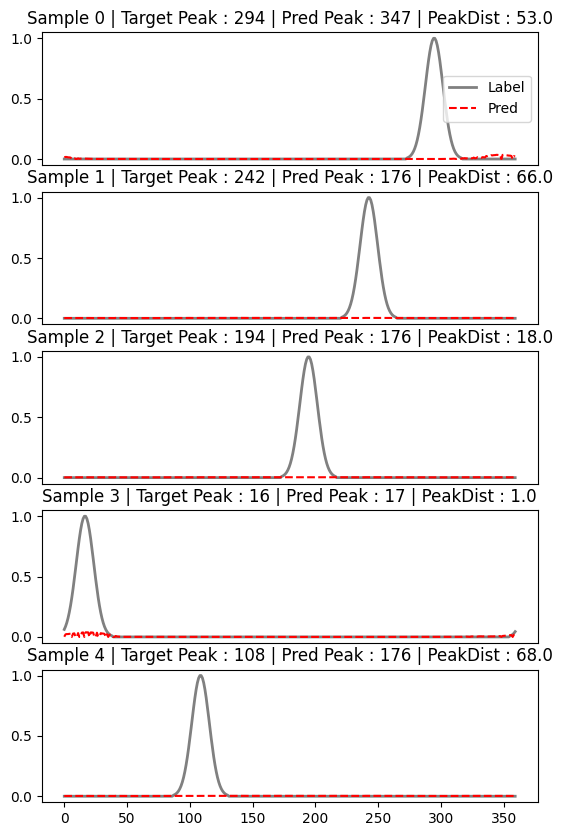

[  1   2   3   4  11  14  15  17  21  22  23  26  29  30  31  32  34  37
  41 176 336 340 345 346 347 349 350 352 354 355 356 358 359]
SAVING TO ... /its/home/nn268/antvis/antvis/optics/res_big_loop_saves/models/p3/testing/RealThing_300E_1e-4_ADAM_Eighths_[452, 144]/2c2l/


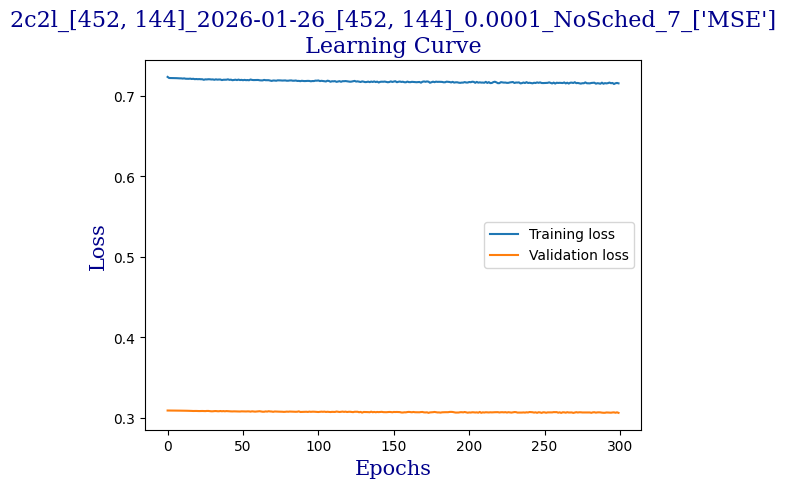

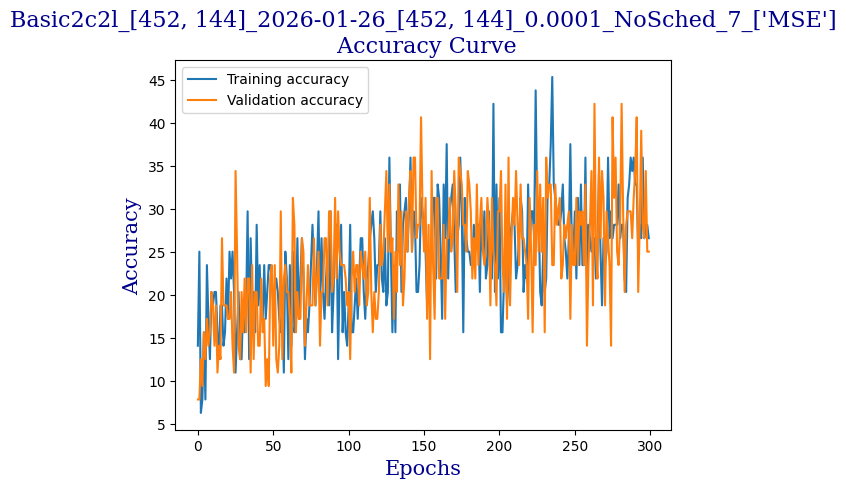

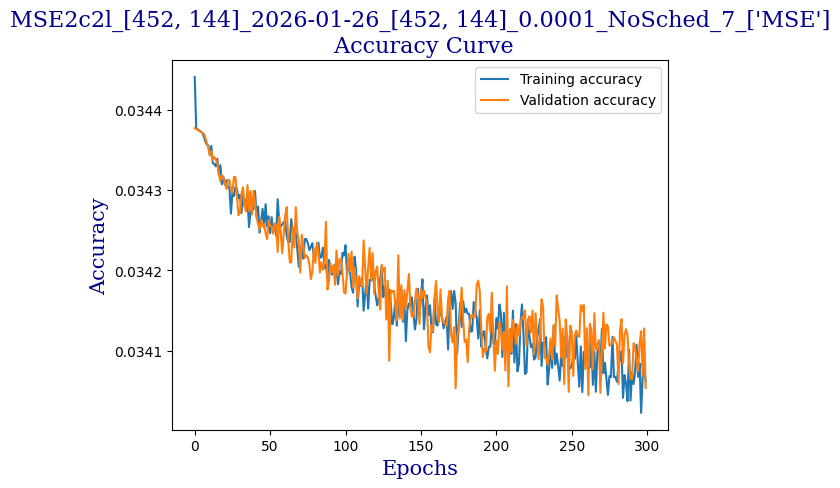

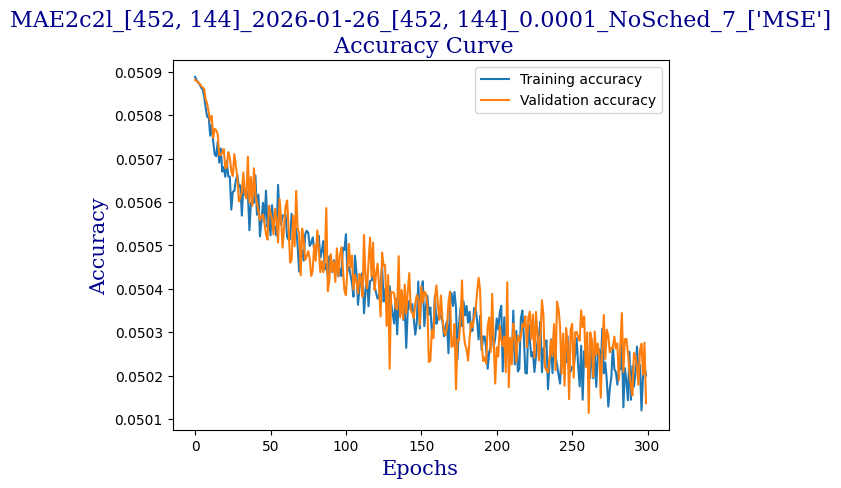

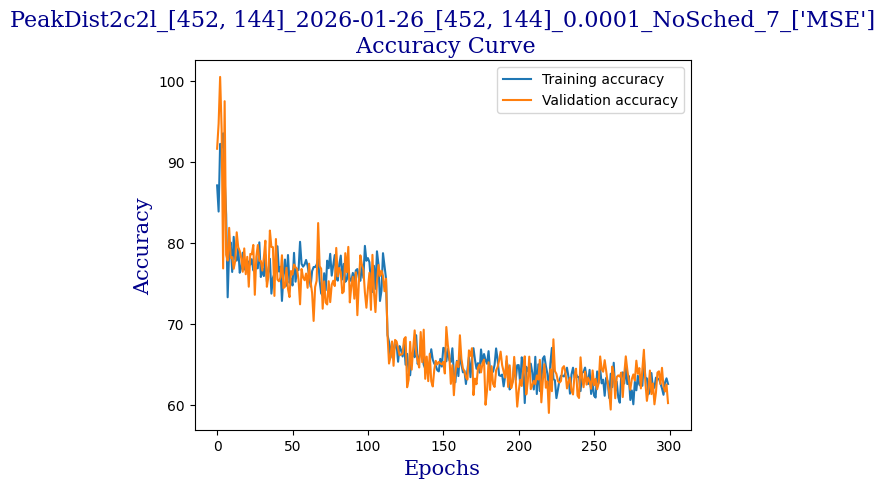

plot_confusion ACTUAL [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36]
plot_confusion PREDICTION [ 0  1  2  3  4 18 34 35 36]
actual  [35 14 35  3 34 27 19 25  0 20  0  2  5  5  4 31 24 33  4 35  2  4 19  2
 16 22 32 11 27 17 32 16 30 35 23  1 13 35 36 22 32 14 14 14 19 28  4 24
  3  3 18 15 10 34 18 22 23 14 15  1 31  2  4  1 30 35  1 29 32 18  4  0
 13 30 12 20 35 25 26 23 30 32 25 11  1 13  9  0  1 24 35 33 10 19 15 35
  2 18  3 34 15  2 10 20 14 16  3 32  4  7 34 33 35 32 11 17  7  8 36 32
 23 18  4  2 17 26 25 35 22 10 16 34  0 35 32 13 32  1  9 17 14 25 15  4
 11  2 28  1 20 34 22  1 18 15 13 13 23  2  0  7 16 18 33  6 32 10 18 16
 23 13 15 35 35 12 33 12 21 18 34 12 30 34 18  8  0  1 20  0  0 30 35 33
 31 20 26 29 29 36 11  2  8 28 16 12 28 13 11 34  3 29 27 24  0 24 34  0
 19 32  1  7  0  0 35 27  2 20 21 23 21 23 34 22 17 26 31  2  6 20  5 35
 25 10  3 18 19  4 26 18 35 29 35 25  7 19  6 33  5 15  1 35  2 33 25 1

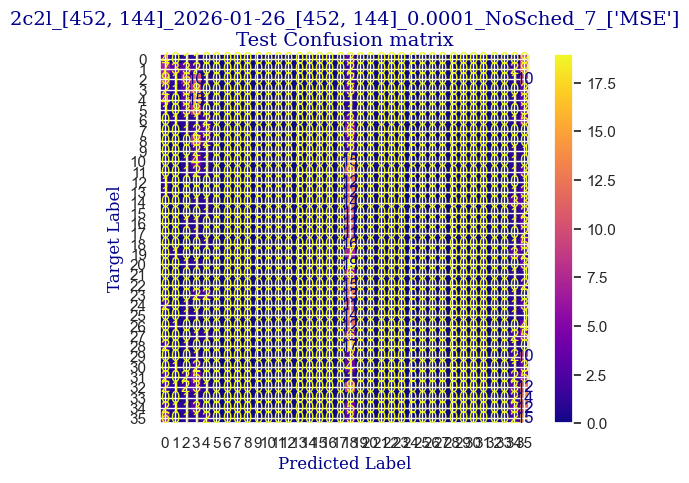

 
 END 2c2l [452, 144] Run Time:  19294.889204875


Epochs,▁
Test acc rough,▂▅▇▅▅▄█▅▃▁▃▂
TrainAcc rough,▂▃▄▃▅▅▁▂▂▅▃▃▅▂▄▅▅▄▇▅▇▃▆▄▅▅▆▅▅▂▅▆▇▆▅▅▅▆█▇
ValAcc rough,▂▁▅▂▂▂▁▄▃▂▃▄▃▄▅█▄▅▅▇▄█▅▅▇▅▅▄▇▂▆▅▅▂▆▅▄▆█▄
c_epoch,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇█
t_loss,█████▇▆▆▅▄▅▅▄▄▄▃▄▄▄▄▃▄▃▃▃▄▃▃▂▃▂▃▂▂▂▂▁▂▂▂
test_acc_MAE,▃▅▃▄▁▇▁▁▇▆▇█
test_acc_MSE,▃▅▃▄▁█▂▁▇▅▇█
test_peakDist,▇▆▄▅▅▄▁▄▅█▃▆
train_err_MAE,█▇▇▇█▇▇██▅▅▆▄▆▆▆▆▅▅▁▆▅▂▆▅▂▅▃▆▅▅▄▅▃▅▅▅▁▇▄
+6,...


wandb: Agent Starting Run: o5r3mfjs with config:
wandb: 	batch_size: 64
wandb: 	epochs: 300
wandb: 	half_ciprange: 22
wandb: 	learning_rate: 0.0001
wandb: 	loss_fn_cards: ['MSE']
wandb: 	model_cards: [{'Ks': [3, 5], 'channels': 3, 'dropout': 0.2, 'f_lin_lay': [1032192, 255744, 62208, 14976, 3072, 640, 128], 'idx': 6, 'model': '2c2l', 'name': '2c2l'}]
wandb: 	optimiser: ['adam']
wandb: 	resolution_cards: [{'index': 0, 'padding': 5, 'resolution': [452, 144]}]
wandb: 	seeds: 69
wandb: 	std_dev: 7
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from /its/home/nn268/.netrc.


{'name': '2c2l', 'model': '2c2l', 'channels': 3, 'Ks': (3, 5), 'f_lin_lay': [1032192, 255744, 62208, 14976, 3072, 640, 128], 'idx': 6, 'dropout': 0.2}
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 1
seed:  69
loss function:  ['MSE']
Batch size:  64
Training epochs:  300
start time:  19308.191911279
Model Name 2c2l
/its/home/nn268/antvis/antvis/optics/NC_IDSW/
set_lossfn    lf  ['MSE']


  0%|                                      | 0/300 [00:00<?, ?it/s]

Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


peak dist means  85.27380952380952
tacc:  {'baseAcc': 10.9375, 'MSE': 0.034377156801166986, 'MAE': 0.0508528444029036, 'peakDist': 85.27380952380952}
Validating...


  0%|                              | 1/300 [00:06<31:53,  6.40s/it]

peak dist means  78.31770833333333
v loss  0.3092868700623512
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  87.49107142857143
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034373094992978234, 'MAE': 0.050861122530131114, 'peakDist': 87.49107142857143}
Validating...


  1%|▏                             | 2/300 [00:12<32:08,  6.47s/it]

peak dist means  103.13194444444444
v loss  0.3093065842986107
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  92.2514880952381
tacc:  {'baseAcc': 9.375, 'MSE': 0.034365855334770115, 'MAE': 0.05083856252687318, 'peakDist': 92.2514880952381}
Validating...


  1%|▎                             | 3/300 [00:19<32:32,  6.58s/it]

peak dist means  79.02430555555556
v loss  0.30930211022496223
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  83.11458333333333
tacc:  {'baseAcc': 18.75, 'MSE': 0.034363547073943276, 'MAE': 0.05082896972695986, 'peakDist': 83.11458333333333}
Validating...


  1%|▍                             | 4/300 [00:26<32:51,  6.66s/it]

peak dist means  78.28993055555556
v loss  0.30926187336444855
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.578125
tacc:  {'baseAcc': 21.875, 'MSE': 0.03436360242111342, 'MAE': 0.05082649932730766, 'peakDist': 79.578125}
Validating...


  2%|▌                             | 5/300 [00:33<32:41,  6.65s/it]

peak dist means  77.58854166666667
v loss  0.30919764190912247
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.21205357142857
tacc:  {'baseAcc': 18.75, 'MSE': 0.034353695809841156, 'MAE': 0.05079432151147297, 'peakDist': 77.21205357142857}
Validating...


  2%|▌                             | 6/300 [00:39<32:48,  6.70s/it]

peak dist means  79.84895833333333
v loss  0.30918677523732185
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.92782738095238
tacc:  {'baseAcc': 31.25, 'MSE': 0.03434891697196733, 'MAE': 0.0507803215157418, 'peakDist': 77.92782738095238}
Validating...


  2%|▋                             | 7/300 [00:46<32:14,  6.60s/it]

peak dist means  74.69270833333333
v loss  0.3091302439570427
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.65699404761905
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034345563323724834, 'MAE': 0.05077224437679563, 'peakDist': 79.65699404761905}
Validating...


  3%|▊                             | 8/300 [00:52<32:21,  6.65s/it]

peak dist means  78.96180555555556
v loss  0.3091258406639099
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.88095238095238
tacc:  {'baseAcc': 15.625, 'MSE': 0.034336961983215245, 'MAE': 0.050751643344050364, 'peakDist': 75.88095238095238}
Validating...


  3%|▉                             | 9/300 [00:59<31:51,  6.57s/it]

peak dist means  76.96006944444444
v loss  0.30916299670934677
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  80.8735119047619
tacc:  {'baseAcc': 14.0625, 'MSE': 0.034346732710089, 'MAE': 0.05076694932012331, 'peakDist': 80.8735119047619}
Validating...


  3%|▉                            | 10/300 [01:05<31:16,  6.47s/it]

peak dist means  74.42534722222223
v loss  0.3090480975806713
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.68675595238095
tacc:  {'baseAcc': 25.0, 'MSE': 0.03433480947500184, 'MAE': 0.05074435614404224, 'peakDist': 77.68675595238095}
Validating...


  4%|█                            | 11/300 [01:11<30:42,  6.37s/it]

peak dist means  82.75
v loss  0.3089452013373375
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.79985119047619
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03433391150264513, 'MAE': 0.050736657210758755, 'peakDist': 77.79985119047619}
Validating...


  4%|█▏                           | 12/300 [01:18<30:32,  6.36s/it]

peak dist means  76.68923611111111
v loss  0.3088558577001095
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.06994047619048
tacc:  {'baseAcc': 21.875, 'MSE': 0.034311327373697645, 'MAE': 0.05068627106291907, 'peakDist': 77.06994047619048}
Validating...


  4%|█▎                           | 13/300 [01:24<29:54,  6.25s/it]

peak dist means  81.88541666666667
v loss  0.3088633082807064
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.27604166666667
tacc:  {'baseAcc': 21.875, 'MSE': 0.03431534820369312, 'MAE': 0.05069141639840035, 'peakDist': 77.27604166666667}
Validating...


  5%|█▎                           | 14/300 [01:30<29:29,  6.19s/it]

peak dist means  72.70659722222223
v loss  0.3087236136198044
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.9828869047619
tacc:  {'baseAcc': 18.75, 'MSE': 0.03432158682317961, 'MAE': 0.05069272592663765, 'peakDist': 77.9828869047619}
Validating...


  5%|█▍                           | 15/300 [01:36<29:11,  6.15s/it]

peak dist means  73.09722222222223
v loss  0.3087298199534416
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.0171130952381
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03429503206695829, 'MAE': 0.05064414477064496, 'peakDist': 77.0171130952381}
Validating...


  5%|█▌                           | 16/300 [01:42<29:46,  6.29s/it]

peak dist means  74.109375
v loss  0.3088102266192436
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.37574404761905
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03431120550348645, 'MAE': 0.05068175672065644, 'peakDist': 77.37574404761905}
Validating...


  6%|█▋                           | 17/300 [01:49<29:39,  6.29s/it]

peak dist means  74.80208333333333
v loss  0.3086082972586155
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.81324404761905
tacc:  {'baseAcc': 25.0, 'MSE': 0.034300457863580616, 'MAE': 0.0506648641257059, 'peakDist': 76.81324404761905}
Validating...


  6%|█▋                           | 18/300 [01:55<29:51,  6.35s/it]

peak dist means  76.14236111111111
v loss  0.30874666571617126
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.9375
tacc:  {'baseAcc': 21.875, 'MSE': 0.034292801859832946, 'MAE': 0.050638465476887565, 'peakDist': 78.9375}
Validating...


  6%|█▊                           | 19/300 [02:02<29:54,  6.39s/it]

peak dist means  77.84895833333333
v loss  0.30867932736873627
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.67857142857143
tacc:  {'baseAcc': 12.5, 'MSE': 0.03428162456977935, 'MAE': 0.05061686446978932, 'peakDist': 77.67857142857143}
Validating...


  7%|█▉                           | 20/300 [02:08<30:04,  6.45s/it]

peak dist means  75.41666666666667
v loss  0.3085053004324436
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.33482142857143
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03429138713649341, 'MAE': 0.05064261172498975, 'peakDist': 77.33482142857143}
Validating...


  7%|██                           | 21/300 [02:13<27:16,  5.87s/it]

peak dist means  71.78298611111111
v loss  0.3083093613386154
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.28720238095238
tacc:  {'baseAcc': 15.625, 'MSE': 0.034295857130062016, 'MAE': 0.050640679186298734, 'peakDist': 75.28720238095238}
Validating...


  7%|██▏                          | 22/300 [02:17<24:57,  5.39s/it]

peak dist means  76.5
v loss  0.308501772582531
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.04166666666667
tacc:  {'baseAcc': 21.875, 'MSE': 0.034277659619138354, 'MAE': 0.05061517372017815, 'peakDist': 77.04166666666667}
Validating...


  8%|██▏                          | 23/300 [02:21<23:13,  5.03s/it]

peak dist means  77.76041666666667
v loss  0.30838652327656746
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.5
tacc:  {'baseAcc': 21.875, 'MSE': 0.03426911486756234, 'MAE': 0.050585887616588956, 'peakDist': 74.5}
Validating...


  8%|██▎                          | 24/300 [02:27<24:37,  5.35s/it]

peak dist means  73.88368055555556
v loss  0.30851342901587486
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.22544642857143
tacc:  {'baseAcc': 12.5, 'MSE': 0.0342793461112749, 'MAE': 0.05060303761135964, 'peakDist': 77.22544642857143}
Validating...


  8%|██▍                          | 25/300 [02:34<25:56,  5.66s/it]

peak dist means  78.98263888888889
v loss  0.308653611689806
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.97098214285714
tacc:  {'baseAcc': 25.0, 'MSE': 0.03427540315758614, 'MAE': 0.05060403723092306, 'peakDist': 76.97098214285714}
Validating...


  9%|██▌                          | 26/300 [02:40<27:08,  5.94s/it]

peak dist means  75.60763888888889
v loss  0.3084663860499859
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.99776785714286
tacc:  {'baseAcc': 20.3125, 'MSE': 0.0342608606886296, 'MAE': 0.0505485889457521, 'peakDist': 72.99776785714286}
Validating...


  9%|██▌                          | 27/300 [02:46<27:21,  6.01s/it]

peak dist means  73.25694444444444
v loss  0.30841682106256485
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.95610119047619
tacc:  {'baseAcc': 18.75, 'MSE': 0.03425718187576249, 'MAE': 0.0505704056648981, 'peakDist': 76.95610119047619}
Validating...


  9%|██▋                          | 28/300 [02:53<27:39,  6.10s/it]

peak dist means  74.62673611111111
v loss  0.3084833063185215
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.45238095238095
tacc:  {'baseAcc': 21.875, 'MSE': 0.03427837026261148, 'MAE': 0.05060326769238427, 'peakDist': 75.45238095238095}
Validating...


 10%|██▊                          | 29/300 [02:59<27:38,  6.12s/it]

peak dist means  80.34201388888889
v loss  0.30865202099084854
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.7016369047619
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03427357723315557, 'MAE': 0.05060592151823498, 'peakDist': 78.7016369047619}
Validating...


 10%|██▉                          | 30/300 [03:05<27:20,  6.08s/it]

peak dist means  77.92361111111111
v loss  0.3084404654800892
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.36979166666667
tacc:  {'baseAcc': 25.0, 'MSE': 0.034252168876784186, 'MAE': 0.05054808780550957, 'peakDist': 76.36979166666667}
Validating...


 10%|██▉                          | 31/300 [03:11<27:32,  6.14s/it]

peak dist means  78.57638888888889
v loss  0.3085429444909096
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.32068452380952
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034261154099589304, 'MAE': 0.050575089773961475, 'peakDist': 76.32068452380952}
Validating...


 11%|███                          | 32/300 [03:17<27:29,  6.16s/it]

peak dist means  79.49305555555556
v loss  0.3082392103970051
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.2797619047619
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034240846832593284, 'MAE': 0.0505164409322398, 'peakDist': 75.2797619047619}
Validating...


 11%|███▏                         | 33/300 [03:24<27:49,  6.25s/it]

peak dist means  78.50173611111111
v loss  0.3082602918148041
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.35342261904762
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034276505666119714, 'MAE': 0.05060287866564024, 'peakDist': 78.35342261904762}
Validating...


 11%|███▎                         | 34/300 [03:31<28:20,  6.39s/it]

peak dist means  76.55381944444444
v loss  0.3082863315939903
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.22395833333333
tacc:  {'baseAcc': 14.0625, 'MSE': 0.034261164565881096, 'MAE': 0.050569187494970504, 'peakDist': 76.22395833333333}
Validating...


 12%|███▍                         | 35/300 [03:37<28:19,  6.41s/it]

peak dist means  74.46006944444444
v loss  0.308210339397192
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.49627976190476
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03424076558578582, 'MAE': 0.05052515225751059, 'peakDist': 75.49627976190476}
Validating...


 12%|███▍                         | 36/300 [03:44<28:41,  6.52s/it]

peak dist means  77.00173611111111
v loss  0.30822715535759926
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.2671130952381
tacc:  {'baseAcc': 28.125, 'MSE': 0.03423049496043296, 'MAE': 0.05049708929090273, 'peakDist': 73.2671130952381}
Validating...


 12%|███▌                         | 37/300 [03:50<28:32,  6.51s/it]

peak dist means  76.140625
v loss  0.30813152715563774
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.63392857142857
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03423979665551867, 'MAE': 0.050519180084977834, 'peakDist': 74.63392857142857}
Validating...


 13%|███▋                         | 38/300 [03:56<28:03,  6.43s/it]

peak dist means  78.89756944444444
v loss  0.30836060643196106
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.89285714285714
tacc:  {'baseAcc': 32.8125, 'MSE': 0.034202124391283305, 'MAE': 0.050425295318876, 'peakDist': 72.89285714285714}
Validating...


 13%|███▊                         | 39/300 [04:03<27:49,  6.40s/it]

peak dist means  75.89756944444444
v loss  0.308151476085186
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.41369047619048
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03421360502640406, 'MAE': 0.05046436846965835, 'peakDist': 75.41369047619048}
Validating...


 13%|███▊                         | 40/300 [04:09<27:36,  6.37s/it]

peak dist means  77.98611111111111
v loss  0.3081742189824581
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.80580357142857
tacc:  {'baseAcc': 18.75, 'MSE': 0.034224203654697964, 'MAE': 0.05049164114253862, 'peakDist': 76.80580357142857}
Validating...


 14%|███▉                         | 41/300 [04:16<27:30,  6.37s/it]

peak dist means  72.65104166666667
v loss  0.3078152649104595
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.078125
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03419940226844379, 'MAE': 0.05041903629899025, 'peakDist': 72.078125}
Validating...


 14%|████                         | 42/300 [04:22<27:22,  6.37s/it]

peak dist means  77.82118055555556
v loss  0.3080549016594887
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.56026785714286
tacc:  {'baseAcc': 15.625, 'MSE': 0.0342183547715346, 'MAE': 0.05047527328133583, 'peakDist': 72.56026785714286}
Validating...


 14%|████▏                        | 43/300 [04:28<26:59,  6.30s/it]

peak dist means  74.10590277777777
v loss  0.3077806904911995
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.9233630952381
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03419320835244088, 'MAE': 0.050413849630526135, 'peakDist': 73.9233630952381}
Validating...


 15%|████▎                        | 44/300 [04:34<26:53,  6.30s/it]

peak dist means  73.87673611111111
v loss  0.30790403112769127
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.49032738095238
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034199497352043785, 'MAE': 0.05042961984872818, 'peakDist': 75.49032738095238}
Validating...


 15%|████▎                        | 45/300 [04:40<26:33,  6.25s/it]

peak dist means  73.70833333333333
v loss  0.307673167437315
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.91517857142857
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03422661941675913, 'MAE': 0.05049194590676399, 'peakDist': 76.91517857142857}
Validating...


 15%|████▍                        | 46/300 [04:47<26:38,  6.29s/it]

peak dist means  73.12326388888889
v loss  0.30803078413009644
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.72916666666667
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03420400424372582, 'MAE': 0.05043823573560942, 'peakDist': 74.72916666666667}
Validating...


 16%|████▌                        | 47/300 [04:54<27:18,  6.47s/it]

peak dist means  76.14409722222223
v loss  0.30758966878056526
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.46130952380952
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03419616694251696, 'MAE': 0.05042692451249985, 'peakDist': 74.46130952380952}
Validating...


 16%|████▋                        | 48/300 [05:01<27:35,  6.57s/it]

peak dist means  72.95486111111111
v loss  0.3074915036559105
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.03943452380952
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03419245602119537, 'MAE': 0.05042632615992001, 'peakDist': 74.03943452380952}
Validating...


 16%|████▋                        | 49/300 [05:07<27:26,  6.56s/it]

peak dist means  75.92881944444444
v loss  0.30822504311800003
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.98809523809524
tacc:  {'baseAcc': 23.4375, 'MSE': 0.0342123487165996, 'MAE': 0.050456155623708455, 'peakDist': 73.98809523809524}
Validating...


 17%|████▊                        | 50/300 [05:14<27:38,  6.63s/it]

peak dist means  72.15104166666667
v loss  0.3076822906732559
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.27752976190476
tacc:  {'baseAcc': 25.0, 'MSE': 0.034226824839909874, 'MAE': 0.050498400593087786, 'peakDist': 75.27752976190476}
Validating...


 17%|████▉                        | 51/300 [05:20<27:17,  6.58s/it]

peak dist means  73.49479166666667
v loss  0.30793238431215286
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.72098214285714
tacc:  {'baseAcc': 21.875, 'MSE': 0.034173774222532906, 'MAE': 0.05038411258941605, 'peakDist': 73.72098214285714}
Validating...


 17%|█████                        | 52/300 [05:27<27:29,  6.65s/it]

peak dist means  72.13888888888889
v loss  0.3077007345855236
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.28497023809524
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03420546739583924, 'MAE': 0.050445704765263055, 'peakDist': 73.28497023809524}
Validating...


 18%|█████                        | 53/300 [05:34<27:05,  6.58s/it]

peak dist means  70.17361111111111
v loss  0.30764366313815117
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.30059523809524
tacc:  {'baseAcc': 21.875, 'MSE': 0.03418899309777078, 'MAE': 0.050417687211717875, 'peakDist': 74.30059523809524}
Validating...


 18%|█████▏                       | 54/300 [05:40<27:05,  6.61s/it]

peak dist means  76.85763888888889
v loss  0.3082260750234127
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.9375
tacc:  {'baseAcc': 21.875, 'MSE': 0.03418453552183651, 'MAE': 0.05039741400451887, 'peakDist': 73.9375}
Validating...


 18%|█████▎                       | 55/300 [05:47<26:55,  6.59s/it]

peak dist means  72.22743055555556
v loss  0.30783790349960327
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.25967261904762
tacc:  {'baseAcc': 21.875, 'MSE': 0.03420252707742509, 'MAE': 0.05045062126148315, 'peakDist': 74.25967261904762}
Validating...


 19%|█████▍                       | 56/300 [05:53<26:34,  6.54s/it]

peak dist means  68.50347222222223
v loss  0.3074432611465454
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.65922619047619
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03417257893653143, 'MAE': 0.050373152253173646, 'peakDist': 72.65922619047619}
Validating...


 19%|█████▌                       | 57/300 [06:00<26:17,  6.49s/it]

peak dist means  69.14756944444444
v loss  0.3068084120750427
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.05654761904762
tacc:  {'baseAcc': 21.875, 'MSE': 0.03420597953455789, 'MAE': 0.05045603056039129, 'peakDist': 75.05654761904762}
Validating...


 19%|█████▌                       | 58/300 [06:06<25:44,  6.38s/it]

peak dist means  75.55034722222223
v loss  0.30802154913544655
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.13318452380952
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03418659028552827, 'MAE': 0.05041808422122683, 'peakDist': 76.13318452380952}
Validating...


 20%|█████▋                       | 59/300 [06:12<25:22,  6.32s/it]

peak dist means  70.20659722222223
v loss  0.3076396957039833
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.50818452380952
tacc:  {'baseAcc': 28.125, 'MSE': 0.034149594604969025, 'MAE': 0.05033097096851894, 'peakDist': 73.50818452380952}
EPOCH    59 / 300:


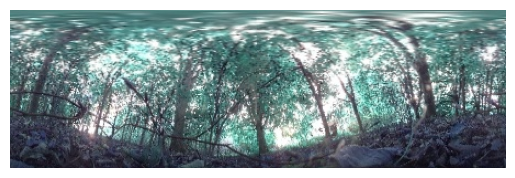

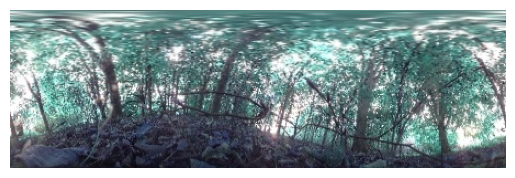

TRUE LABEL    :          352
PREDICTION    :          336
Validating...


 20%|█████▊                       | 60/300 [06:18<25:30,  6.38s/it]

peak dist means  69.34722222222223
v loss  0.3071787878870964
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.50074404761905
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03417166907872472, 'MAE': 0.05038249102376756, 'peakDist': 73.50074404761905}
Validating...


 20%|█████▉                       | 61/300 [06:24<24:58,  6.27s/it]

peak dist means  71.48958333333333
v loss  0.3074284791946411
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.94717261904762
tacc:  {'baseAcc': 17.1875, 'MSE': 0.0341672861859912, 'MAE': 0.050364431525979726, 'peakDist': 71.94717261904762}
Validating...


 21%|█████▉                       | 62/300 [06:31<25:05,  6.32s/it]

peak dist means  73.28993055555556
v loss  0.30738187953829765
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.21354166666667
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03419000815067973, 'MAE': 0.05041824387652533, 'peakDist': 74.21354166666667}
Validating...


 21%|██████                       | 63/300 [06:37<25:18,  6.41s/it]

peak dist means  74.91319444444444
v loss  0.307696133852005
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.94791666666667
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03417491522573289, 'MAE': 0.05038939913113912, 'peakDist': 74.94791666666667}
Validating...


 21%|██████▏                      | 64/300 [06:44<25:16,  6.43s/it]

peak dist means  71.81423611111111
v loss  0.30731460824608803
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.66592261904762
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034163931295985266, 'MAE': 0.05036818484465281, 'peakDist': 73.66592261904762}
Validating...


 22%|██████▎                      | 65/300 [06:50<25:07,  6.42s/it]

peak dist means  72.05555555555556
v loss  0.30730680376291275
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.625
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03415190570411228, 'MAE': 0.05035032331943512, 'peakDist': 75.625}
Validating...


 22%|██████▍                      | 66/300 [06:57<25:15,  6.48s/it]

peak dist means  74.17361111111111
v loss  0.3073277287185192
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.13020833333333
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034160636188018886, 'MAE': 0.050368206664210276, 'peakDist': 74.13020833333333}
Validating...


 22%|██████▍                      | 67/300 [07:04<25:18,  6.52s/it]

peak dist means  73.05034722222223
v loss  0.3076348677277565
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.76041666666667
tacc:  {'baseAcc': 21.875, 'MSE': 0.034169669662203105, 'MAE': 0.05037255531975201, 'peakDist': 74.76041666666667}
Validating...


 23%|██████▌                      | 68/300 [07:10<25:34,  6.61s/it]

peak dist means  70.26215277777777
v loss  0.30739549547433853
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.55580357142857
tacc:  {'baseAcc': 18.75, 'MSE': 0.03414383069390342, 'MAE': 0.05031713045069149, 'peakDist': 71.55580357142857}
Validating...


 23%|██████▋                      | 69/300 [07:17<25:28,  6.62s/it]

peak dist means  74.09722222222223
v loss  0.30745868757367134
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.58482142857143
tacc:  {'baseAcc': 28.125, 'MSE': 0.03412580915859768, 'MAE': 0.050300326907918566, 'peakDist': 73.58482142857143}
Validating...


 23%|██████▊                      | 70/300 [07:23<25:05,  6.55s/it]

peak dist means  71.09722222222223
v loss  0.3067871443927288
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.35416666666667
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034166816799413594, 'MAE': 0.05036542653327897, 'peakDist': 73.35416666666667}
Validating...


 24%|██████▊                      | 71/300 [07:30<25:15,  6.62s/it]

peak dist means  76.71180555555556
v loss  0.30784085020422935
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.68973214285714
tacc:  {'baseAcc': 25.0, 'MSE': 0.03413549509076845, 'MAE': 0.050288657702150796, 'peakDist': 70.68973214285714}
Validating...


 24%|██████▉                      | 72/300 [07:36<24:47,  6.52s/it]

peak dist means  71.77430555555556
v loss  0.30700694024562836
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.98511904761905
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034132986019055046, 'MAE': 0.05029597931674549, 'peakDist': 70.98511904761905}
Validating...


 24%|███████                      | 73/300 [07:43<24:30,  6.48s/it]

peak dist means  71.48784722222223
v loss  0.30710048228502274
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.14136904761905
tacc:  {'baseAcc': 28.125, 'MSE': 0.034143880364440736, 'MAE': 0.05032795011287644, 'peakDist': 72.14136904761905}
Validating...


 25%|███████▏                     | 74/300 [07:49<23:48,  6.32s/it]

peak dist means  70.65972222222223
v loss  0.30709779635071754
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.04315476190476
tacc:  {'baseAcc': 18.75, 'MSE': 0.03415674095352491, 'MAE': 0.05033568594427336, 'peakDist': 72.04315476190476}
Validating...


 25%|███████▎                     | 75/300 [07:55<23:45,  6.34s/it]

peak dist means  71.70659722222223
v loss  0.307294849306345
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.75074404761905
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03414716092603547, 'MAE': 0.05033671749489648, 'peakDist': 71.75074404761905}
Validating...


 25%|███████▎                     | 76/300 [08:01<23:27,  6.28s/it]

peak dist means  71.84548611111111
v loss  0.30706752836704254
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.05282738095238
tacc:  {'baseAcc': 12.5, 'MSE': 0.0341370590031147, 'MAE': 0.05031422809475944, 'peakDist': 71.05282738095238}
Validating...


 26%|███████▍                     | 77/300 [08:07<22:57,  6.18s/it]

peak dist means  70.9375
v loss  0.3073081150650978
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.14583333333333
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03411271973025231, 'MAE': 0.050259237842900414, 'peakDist': 70.14583333333333}
Validating...


 26%|███████▌                     | 78/300 [08:14<23:01,  6.22s/it]

peak dist means  76.75694444444444
v loss  0.3070971556007862
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.14583333333333
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03413360282069161, 'MAE': 0.050313267147257215, 'peakDist': 72.14583333333333}
Validating...


 26%|███████▋                     | 79/300 [08:20<23:11,  6.29s/it]

peak dist means  76.24652777777777
v loss  0.30751989781856537
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.54389880952381
tacc:  {'baseAcc': 18.75, 'MSE': 0.0341185297639597, 'MAE': 0.050283269868010565, 'peakDist': 72.54389880952381}
Validating...


 27%|███████▋                     | 80/300 [08:27<23:35,  6.43s/it]

peak dist means  73.75868055555556
v loss  0.30695193633437157
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.77380952380952
tacc:  {'baseAcc': 15.625, 'MSE': 0.034144312320720585, 'MAE': 0.050327216053292864, 'peakDist': 73.77380952380952}
Validating...


 27%|███████▊                     | 81/300 [08:33<23:34,  6.46s/it]

peak dist means  74.48090277777777
v loss  0.3073888011276722
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.35119047619048
tacc:  {'baseAcc': 15.625, 'MSE': 0.034115538001060486, 'MAE': 0.05026858122575851, 'peakDist': 72.35119047619048}
Validating...


 27%|███████▉                     | 82/300 [08:40<23:43,  6.53s/it]

peak dist means  71.00868055555556
v loss  0.3069475591182709
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.66443452380952
tacc:  {'baseAcc': 21.875, 'MSE': 0.0341100985450404, 'MAE': 0.050267163486707775, 'peakDist': 72.66443452380952}
Validating...


 28%|████████                     | 83/300 [08:47<23:37,  6.53s/it]

peak dist means  71.10763888888889
v loss  0.30722448602318764
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.58333333333333
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034106128804740454, 'MAE': 0.050249420815990084, 'peakDist': 72.58333333333333}
Validating...


 28%|████████                     | 84/300 [08:53<23:55,  6.65s/it]

peak dist means  70.32986111111111
v loss  0.30728743970394135
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.17782738095238
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03412223465385891, 'MAE': 0.0502765192872002, 'peakDist': 71.17782738095238}
Validating...


 28%|████████▏                    | 85/300 [09:00<23:40,  6.60s/it]

peak dist means  72.08333333333333
v loss  0.3072277419269085
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.72916666666667
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03410589411145165, 'MAE': 0.050248416584162486, 'peakDist': 71.72916666666667}
Validating...


 29%|████████▎                    | 86/300 [09:07<23:44,  6.66s/it]

peak dist means  71.92534722222223
v loss  0.3070806749165058
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.10267857142857
tacc:  {'baseAcc': 28.125, 'MSE': 0.03414127656391689, 'MAE': 0.05032241113838695, 'peakDist': 73.10267857142857}
Validating...


 29%|████████▍                    | 87/300 [09:13<23:16,  6.56s/it]

peak dist means  72.4375
v loss  0.30713510140776634
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.71875
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03411331879241126, 'MAE': 0.05026858016138985, 'peakDist': 72.71875}
Validating...


 29%|████████▌                    | 88/300 [09:19<22:38,  6.41s/it]

peak dist means  70.65798611111111
v loss  0.3067433498799801
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.08482142857143
tacc:  {'baseAcc': 25.0, 'MSE': 0.03412345406554994, 'MAE': 0.05029501145084699, 'peakDist': 73.08482142857143}
Validating...


 30%|████████▌                    | 89/300 [09:26<22:39,  6.44s/it]

peak dist means  69.02951388888889
v loss  0.30658384039998055
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.16294642857143
tacc:  {'baseAcc': 25.0, 'MSE': 0.034121318764629816, 'MAE': 0.050277699317250936, 'peakDist': 71.16294642857143}
Validating...


 30%|████████▋                    | 90/300 [09:32<22:23,  6.40s/it]

peak dist means  69.54861111111111
v loss  0.30684512853622437
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.90625
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03408395232898848, 'MAE': 0.050205061123484655, 'peakDist': 70.90625}
Validating...


 30%|████████▊                    | 91/300 [09:38<21:49,  6.27s/it]

peak dist means  73.63020833333333
v loss  0.30712295696139336
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.02083333333333
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03410681372597104, 'MAE': 0.05024977170285724, 'peakDist': 71.02083333333333}
Validating...


 31%|████████▉                    | 92/300 [09:44<21:54,  6.32s/it]

peak dist means  70.13715277777777
v loss  0.3071233928203583
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.01934523809524
tacc:  {'baseAcc': 18.75, 'MSE': 0.034120487315314155, 'MAE': 0.05027987648333822, 'peakDist': 73.01934523809524}
Validating...


 31%|████████▉                    | 93/300 [09:50<21:35,  6.26s/it]

peak dist means  70.89756944444444
v loss  0.3071236126124859
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.58258928571429
tacc:  {'baseAcc': 25.0, 'MSE': 0.03411247421588216, 'MAE': 0.0502644633608205, 'peakDist': 72.58258928571429}
Validating...


 31%|█████████                    | 94/300 [09:57<21:39,  6.31s/it]

peak dist means  67.72395833333333
v loss  0.3066679872572422
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.3578869047619
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03412196998085294, 'MAE': 0.050286502355620974, 'peakDist': 70.3578869047619}
Validating...


 32%|█████████▏                   | 95/300 [10:03<21:35,  6.32s/it]

peak dist means  71.671875
v loss  0.30681657791137695
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.21651785714286
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03410906717181206, 'MAE': 0.05025314042965571, 'peakDist': 72.21651785714286}
Validating...


 32%|█████████▎                   | 96/300 [10:10<21:46,  6.41s/it]

peak dist means  69.35416666666667
v loss  0.306948758661747
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.23139880952381
tacc:  {'baseAcc': 28.125, 'MSE': 0.034094241580792835, 'MAE': 0.05024159646459988, 'peakDist': 73.23139880952381}
Validating...


 32%|█████████▍                   | 97/300 [10:16<21:35,  6.38s/it]

peak dist means  73.00694444444444
v loss  0.3071255497634411
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.05803571428571
tacc:  {'baseAcc': 21.875, 'MSE': 0.03409124467344511, 'MAE': 0.050225203235944114, 'peakDist': 71.05803571428571}
Validating...


 33%|█████████▍                   | 98/300 [10:23<21:48,  6.48s/it]

peak dist means  74.83506944444444
v loss  0.3070281445980072
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.640625
tacc:  {'baseAcc': 34.375, 'MSE': 0.03409633980620475, 'MAE': 0.05024819679203488, 'peakDist': 72.640625}
Validating...


 33%|█████████▌                   | 99/300 [10:29<21:39,  6.47s/it]

peak dist means  73.72222222222223
v loss  0.3070340268313885
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.6108630952381
tacc:  {'baseAcc': 31.25, 'MSE': 0.034065759785118555, 'MAE': 0.050170184955710455, 'peakDist': 69.6108630952381}
Validating...


 33%|█████████▎                  | 100/300 [10:36<22:08,  6.64s/it]

peak dist means  70.88194444444444
v loss  0.306760810315609
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.14360119047619
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034115634681213466, 'MAE': 0.05029030942491123, 'peakDist': 73.14360119047619}
Validating...


 34%|█████████▍                  | 101/300 [10:43<22:16,  6.71s/it]

peak dist means  66.32638888888889
v loss  0.3061293549835682
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.91220238095238
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034100497052783056, 'MAE': 0.05026931138265701, 'peakDist': 72.91220238095238}
Validating...


 34%|█████████▌                  | 102/300 [10:50<22:28,  6.81s/it]

peak dist means  64.16666666666667
v loss  0.3067125156521797
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.8891369047619
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03408706684907278, 'MAE': 0.0502218630697046, 'peakDist': 65.8891369047619}
Validating...


 34%|█████████▌                  | 103/300 [10:57<22:34,  6.87s/it]

peak dist means  61.97569444444444
v loss  0.30640650913119316
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.63541666666667
tacc:  {'baseAcc': 25.0, 'MSE': 0.0340663098863193, 'MAE': 0.050198608388503395, 'peakDist': 64.63541666666667}
Validating...


 35%|█████████▋                  | 104/300 [11:04<22:26,  6.87s/it]

peak dist means  63.11284722222222
v loss  0.30654916539788246
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.29389880952381
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034092484130745844, 'MAE': 0.05020998400591668, 'peakDist': 64.29389880952381}
Validating...


 35%|█████████▊                  | 105/300 [11:11<21:57,  6.76s/it]

peak dist means  62.984375
v loss  0.3069647066295147
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.44196428571429
tacc:  {'baseAcc': 32.8125, 'MSE': 0.034072207375651316, 'MAE': 0.050193358390104206, 'peakDist': 64.44196428571429}
Validating...


 35%|█████████▉                  | 106/300 [11:17<21:22,  6.61s/it]

peak dist means  59.364583333333336
v loss  0.3066403418779373
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.75669642857143
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03409100767402422, 'MAE': 0.05023561471274921, 'peakDist': 65.75669642857143}
Validating...


 36%|█████████▉                  | 107/300 [11:23<21:05,  6.56s/it]

peak dist means  63.47569444444444
v loss  0.30686843022704124
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.69345238095238
tacc:  {'baseAcc': 21.875, 'MSE': 0.03404083439991588, 'MAE': 0.05013686791062355, 'peakDist': 65.69345238095238}
Validating...


 36%|██████████                  | 108/300 [11:29<20:26,  6.39s/it]

peak dist means  67.25173611111111
v loss  0.30704953148961067
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.76190476190476
tacc:  {'baseAcc': 42.1875, 'MSE': 0.034071139636493865, 'MAE': 0.050167273907434376, 'peakDist': 63.76190476190476}
Validating...


 36%|██████████▏                 | 109/300 [11:36<20:11,  6.34s/it]

peak dist means  61.859375
v loss  0.3063339814543724
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.61011904761905
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03408294330750193, 'MAE': 0.05021929847342627, 'peakDist': 64.61011904761905}
Validating...


 37%|██████████▎                 | 110/300 [11:42<19:50,  6.26s/it]

peak dist means  61.11805555555556
v loss  0.30628884956240654
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.973214285714285
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03411011238183294, 'MAE': 0.05024924608213561, 'peakDist': 63.973214285714285}
Validating...


 37%|██████████▎                 | 111/300 [11:48<19:47,  6.28s/it]

peak dist means  61.65277777777778
v loss  0.306953027844429
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.183035714285715
tacc:  {'baseAcc': 34.375, 'MSE': 0.03405641693444479, 'MAE': 0.05014445934267271, 'peakDist': 62.183035714285715}
Validating...


 37%|██████████▍                 | 112/300 [11:54<19:43,  6.30s/it]

peak dist means  65.38541666666667
v loss  0.30680976808071136
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.457589285714285
tacc:  {'baseAcc': 34.375, 'MSE': 0.03407666725771768, 'MAE': 0.050198787379832494, 'peakDist': 63.457589285714285}
Validating...


 38%|██████████▌                 | 113/300 [12:01<19:47,  6.35s/it]

peak dist means  63.98090277777778
v loss  0.3066817410290241
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.33110119047619
tacc:  {'baseAcc': 28.125, 'MSE': 0.03409495896526745, 'MAE': 0.05022560805082321, 'peakDist': 65.33110119047619}
Validating...


 38%|██████████▋                 | 114/300 [12:07<19:44,  6.37s/it]

peak dist means  64.30555555555556
v loss  0.3064894825220108
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.47767857142857
tacc:  {'baseAcc': 35.9375, 'MSE': 0.034050220534915014, 'MAE': 0.05014936271167937, 'peakDist': 61.47767857142857}
Validating...


 38%|██████████▋                 | 115/300 [12:14<19:50,  6.44s/it]

peak dist means  65.17534722222223
v loss  0.30646736547350883
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.796875
tacc:  {'baseAcc': 34.375, 'MSE': 0.034093787982350306, 'MAE': 0.050221040312732966, 'peakDist': 64.796875}
Validating...


 39%|██████████▊                 | 116/300 [12:20<19:47,  6.45s/it]

peak dist means  61.06944444444444
v loss  0.3064003996551037
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.889136904761905
tacc:  {'baseAcc': 31.25, 'MSE': 0.034076357526438575, 'MAE': 0.05020809829944656, 'peakDist': 63.889136904761905}
Validating...


 39%|██████████▉                 | 117/300 [12:27<19:51,  6.51s/it]

peak dist means  58.92881944444444
v loss  0.30619320273399353
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.65997023809524
tacc:  {'baseAcc': 31.25, 'MSE': 0.03410767125231879, 'MAE': 0.050245405662627446, 'peakDist': 62.65997023809524}
Validating...


 39%|███████████                 | 118/300 [12:34<19:48,  6.53s/it]

peak dist means  61.140625
v loss  0.30650219321250916
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.97470238095238
tacc:  {'baseAcc': 31.25, 'MSE': 0.03405078429551352, 'MAE': 0.05015536575090317, 'peakDist': 62.97470238095238}
Validating...


 40%|███████████                 | 119/300 [12:40<19:51,  6.58s/it]

peak dist means  63.748263888888886
v loss  0.30663926526904106
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.7016369047619
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03408018322218032, 'MAE': 0.05019016191363335, 'peakDist': 64.7016369047619}
Validating...


 40%|███████████▏                | 120/300 [12:47<19:35,  6.53s/it]

peak dist means  63.098958333333336
v loss  0.30680176988244057
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.1235119047619
tacc:  {'baseAcc': 28.125, 'MSE': 0.03408631948488099, 'MAE': 0.05023179824153582, 'peakDist': 64.1235119047619}
Validating...


 40%|███████████▎                | 121/300 [12:53<19:36,  6.57s/it]

peak dist means  62.779513888888886
v loss  0.3069066256284714
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.885416666666664
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03404668221871058, 'MAE': 0.05014028417922202, 'peakDist': 62.885416666666664}
Validating...


 41%|███████████▍                | 122/300 [13:00<19:09,  6.46s/it]

peak dist means  63.96006944444444
v loss  0.3067287430167198
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.51264880952381
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034059310952822365, 'MAE': 0.05015967200909342, 'peakDist': 62.51264880952381}
Validating...


 41%|███████████▍                | 123/300 [13:06<18:40,  6.33s/it]

peak dist means  60.29340277777778
v loss  0.30659275129437447
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.27827380952381
tacc:  {'baseAcc': 21.875, 'MSE': 0.034058039919251486, 'MAE': 0.05018820968412217, 'peakDist': 64.27827380952381}
Validating...


 41%|███████████▌                | 124/300 [13:12<18:25,  6.28s/it]

peak dist means  64.80381944444444
v loss  0.3062284104526043
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.81547619047619
tacc:  {'baseAcc': 25.0, 'MSE': 0.03407020228249686, 'MAE': 0.05020056931035859, 'peakDist': 65.81547619047619}
Validating...


 42%|███████████▋                | 125/300 [13:18<18:00,  6.18s/it]

peak dist means  56.69097222222222
v loss  0.3061020188033581
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.52604166666667
tacc:  {'baseAcc': 32.8125, 'MSE': 0.034087574907711575, 'MAE': 0.05020903955612864, 'peakDist': 64.52604166666667}
Validating...


 42%|███████████▊                | 126/300 [13:24<18:02,  6.22s/it]

peak dist means  62.74131944444444
v loss  0.30615997686982155
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.17931547619048
tacc:  {'baseAcc': 25.0, 'MSE': 0.03409490255372865, 'MAE': 0.05023624339983577, 'peakDist': 65.17931547619048}
Validating...


 42%|███████████▊                | 127/300 [13:30<18:10,  6.30s/it]

peak dist means  59.94965277777778
v loss  0.3064145967364311
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.20386904761905
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03404675920804342, 'MAE': 0.05014331532376153, 'peakDist': 63.20386904761905}
Validating...


 43%|███████████▉                | 128/300 [13:37<18:09,  6.33s/it]

peak dist means  61.00694444444444
v loss  0.30601463094353676
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.857886904761905
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03404456465726807, 'MAE': 0.05014618628081821, 'peakDist': 63.857886904761905}
Validating...


 43%|████████████                | 129/300 [13:43<18:16,  6.41s/it]

peak dist means  64.26041666666667
v loss  0.306593157351017
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.94122023809524
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03405167676863216, 'MAE': 0.05015282297418231, 'peakDist': 62.94122023809524}
Validating...


 43%|████████████▏               | 130/300 [13:50<18:07,  6.40s/it]

peak dist means  61.57118055555556
v loss  0.3063645213842392
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.68675595238095
tacc:  {'baseAcc': 32.8125, 'MSE': 0.034064737281629016, 'MAE': 0.0501956453635579, 'peakDist': 64.68675595238095}
Validating...


 44%|████████████▏               | 131/300 [13:56<18:02,  6.41s/it]

peak dist means  61.685763888888886
v loss  0.30677688866853714
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.001488095238095
tacc:  {'baseAcc': 25.0, 'MSE': 0.03404293635061809, 'MAE': 0.050131241125719886, 'peakDist': 62.001488095238095}
Validating...


 44%|████████████▎               | 132/300 [14:03<18:19,  6.54s/it]

peak dist means  64.62326388888889
v loss  0.30674535781145096
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.07738095238095
tacc:  {'baseAcc': 18.75, 'MSE': 0.034039646564495, 'MAE': 0.050144425815060026, 'peakDist': 62.07738095238095}
Validating...


 44%|████████████▍               | 133/300 [14:10<18:15,  6.56s/it]

peak dist means  62.671875
v loss  0.30652329698204994
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.46502976190476
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03403931111097336, 'MAE': 0.050133422904071356, 'peakDist': 62.46502976190476}
Validating...


 45%|████████████▌               | 134/300 [14:16<18:07,  6.55s/it]

peak dist means  61.229166666666664
v loss  0.30666930973529816
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.11607142857143
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03406901249573344, 'MAE': 0.050180282088972274, 'peakDist': 63.11607142857143}
Validating...


 45%|████████████▌               | 135/300 [14:23<18:00,  6.55s/it]

peak dist means  58.244791666666664
v loss  0.3061043210327625
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.761160714285715
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03402904527527945, 'MAE': 0.05010818051440375, 'peakDist': 62.761160714285715}
Validating...


 45%|████████████▋               | 136/300 [14:29<17:44,  6.49s/it]

peak dist means  65.31597222222223
v loss  0.30653485655784607
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.46502976190476
tacc:  {'baseAcc': 37.5, 'MSE': 0.03404693678021431, 'MAE': 0.050138123688243684, 'peakDist': 63.46502976190476}
Validating...


 46%|████████████▊               | 137/300 [14:35<17:19,  6.38s/it]

peak dist means  60.69444444444444
v loss  0.3060475029051304
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.75372023809524
tacc:  {'baseAcc': 21.875, 'MSE': 0.034051522080387385, 'MAE': 0.050162001025109065, 'peakDist': 63.75372023809524}
Validating...


 46%|████████████▉               | 138/300 [14:41<16:59,  6.29s/it]

peak dist means  62.30034722222222
v loss  0.30626458302140236
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.794642857142854
tacc:  {'baseAcc': 43.75, 'MSE': 0.03400866722776776, 'MAE': 0.05008209017770631, 'peakDist': 62.794642857142854}
Validating...


 46%|████████████▉               | 139/300 [14:48<16:52,  6.29s/it]

peak dist means  63.314236111111114
v loss  0.30635638535022736
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.20758928571429
tacc:  {'baseAcc': 28.125, 'MSE': 0.03402759791130111, 'MAE': 0.05013406773408254, 'peakDist': 64.20758928571429}
Validating...


 47%|█████████████               | 140/300 [14:54<16:49,  6.31s/it]

peak dist means  66.37152777777777
v loss  0.3067026808857918
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.704613095238095
tacc:  {'baseAcc': 25.0, 'MSE': 0.034010584510508035, 'MAE': 0.050094046763011386, 'peakDist': 63.704613095238095}
Validating...


 47%|█████████████▏              | 141/300 [15:00<16:48,  6.34s/it]

peak dist means  62.40625
v loss  0.3060637600719929
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.79389880952381
tacc:  {'baseAcc': 28.125, 'MSE': 0.033985672962097896, 'MAE': 0.050045877340294066, 'peakDist': 63.79389880952381}
Validating...


 47%|█████████████▎              | 142/300 [15:07<16:47,  6.37s/it]

peak dist means  59.638888888888886
v loss  0.3061784543097019
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.495535714285715
tacc:  {'baseAcc': 34.375, 'MSE': 0.034026753689561574, 'MAE': 0.05012712982438859, 'peakDist': 62.495535714285715}
Validating...


 48%|█████████████▎              | 143/300 [15:13<16:32,  6.32s/it]

peak dist means  61.595486111111114
v loss  0.3060156814754009
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.857142857142854
tacc:  {'baseAcc': 42.1875, 'MSE': 0.03404498401851881, 'MAE': 0.05012672891219457, 'peakDist': 62.857142857142854}
Validating...


 48%|█████████████▍              | 144/300 [15:20<16:33,  6.37s/it]

peak dist means  59.567708333333336
v loss  0.3062424473464489
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.19270833333333
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03408583076227279, 'MAE': 0.050226896291687376, 'peakDist': 64.19270833333333}
Validating...


 48%|█████████████▌              | 145/300 [15:26<16:33,  6.41s/it]

peak dist means  64.14756944444444
v loss  0.30644864961504936
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.45238095238095
tacc:  {'baseAcc': 25.0, 'MSE': 0.03402087819718179, 'MAE': 0.0500843393660727, 'peakDist': 60.45238095238095}
Validating...


 49%|█████████████▋              | 146/300 [15:33<16:48,  6.55s/it]

peak dist means  61.20659722222222
v loss  0.30623355507850647
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.25892857142857
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03402157252033552, 'MAE': 0.05011714782033648, 'peakDist': 60.25892857142857}
Validating...


 49%|█████████████▋              | 147/300 [15:40<16:44,  6.57s/it]

peak dist means  60.97743055555556
v loss  0.30676256492733955
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.32589285714286
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03409486405906223, 'MAE': 0.050229262915395555, 'peakDist': 64.32589285714286}
Validating...


 49%|█████████████▊              | 148/300 [15:46<16:47,  6.63s/it]

peak dist means  61.16319444444444
v loss  0.3069385066628456
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.866815476190474
tacc:  {'baseAcc': 28.125, 'MSE': 0.034041830294189, 'MAE': 0.050162044841618764, 'peakDist': 61.866815476190474}
Validating...


 50%|█████████████▉              | 149/300 [15:53<16:33,  6.58s/it]

peak dist means  58.435763888888886
v loss  0.3058214597404003
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.71949404761905
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03402524955925487, 'MAE': 0.050082650213014515, 'peakDist': 60.71949404761905}
Validating...


 50%|██████████████              | 150/300 [16:00<16:35,  6.63s/it]

peak dist means  62.15625
v loss  0.3061821088194847
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.88095238095238
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03402484740529742, 'MAE': 0.05008903873108682, 'peakDist': 61.88095238095238}
Validating...


 50%|██████████████              | 151/300 [16:06<16:15,  6.55s/it]

peak dist means  57.416666666666664
v loss  0.30614978447556496
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.62797619047619
tacc:  {'baseAcc': 37.5, 'MSE': 0.034016267352160956, 'MAE': 0.05009113021549724, 'peakDist': 61.62797619047619}
Validating...


 51%|██████████████▏             | 152/300 [16:12<15:43,  6.38s/it]

peak dist means  60.095486111111114
v loss  0.30578700825572014
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.30877976190476
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03407758722702662, 'MAE': 0.050211819332270397, 'peakDist': 64.30877976190476}
Validating...


 51%|██████████████▎             | 153/300 [16:18<15:22,  6.28s/it]

peak dist means  58.13368055555556
v loss  0.306536253541708
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.33110119047619
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03403318886246, 'MAE': 0.05012852184119679, 'peakDist': 62.33110119047619}
Validating...


 51%|██████████████▎             | 154/300 [16:24<14:59,  6.16s/it]

peak dist means  63.07118055555556
v loss  0.3064807802438736
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.161458333333336
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03401673390042214, 'MAE': 0.050107556262186596, 'peakDist': 61.161458333333336}
Validating...


 52%|██████████████▍             | 155/300 [16:30<14:53,  6.16s/it]

peak dist means  60.072916666666664
v loss  0.30637848004698753
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.18080357142857
tacc:  {'baseAcc': 31.25, 'MSE': 0.03400954001006626, 'MAE': 0.05009196237439201, 'peakDist': 60.18080357142857}
Validating...


 52%|██████████████▌             | 156/300 [16:36<14:59,  6.25s/it]

peak dist means  61.123263888888886
v loss  0.3059214651584625
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.36235119047619
tacc:  {'baseAcc': 40.625, 'MSE': 0.034022762129704155, 'MAE': 0.05009695248944419, 'peakDist': 60.36235119047619}
Validating...


 52%|██████████████▋             | 157/300 [16:43<15:02,  6.31s/it]

peak dist means  57.08506944444444
v loss  0.30552027374505997
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.36830357142857
tacc:  {'baseAcc': 43.75, 'MSE': 0.03400035876603354, 'MAE': 0.050078083716687705, 'peakDist': 62.36830357142857}
Validating...


 53%|██████████████▋             | 158/300 [16:49<15:08,  6.40s/it]

peak dist means  59.26909722222222
v loss  0.30552681908011436
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.91889880952381
tacc:  {'baseAcc': 21.875, 'MSE': 0.03399155696942693, 'MAE': 0.05004721755782763, 'peakDist': 61.91889880952381}
Validating...


 53%|██████████████▊             | 159/300 [16:56<14:58,  6.37s/it]

peak dist means  62.67534722222222
v loss  0.3063061162829399
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.41517857142857
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03400233831434023, 'MAE': 0.05009346189243453, 'peakDist': 60.41517857142857}
Validating...


 53%|██████████████▉             | 160/300 [17:03<15:10,  6.50s/it]

peak dist means  64.59895833333333
v loss  0.30697106197476387
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.65699404761905
tacc:  {'baseAcc': 34.375, 'MSE': 0.03400753030464763, 'MAE': 0.0500918020095144, 'peakDist': 60.65699404761905}
Validating...


 54%|███████████████             | 161/300 [17:09<15:05,  6.51s/it]

peak dist means  59.32118055555556
v loss  0.30586566030979156
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.24330357142857
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03403420888242267, 'MAE': 0.05011960668932824, 'peakDist': 61.24330357142857}
Validating...


 54%|███████████████             | 162/300 [17:16<15:13,  6.62s/it]

peak dist means  58.3125
v loss  0.3056790195405483
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.716517857142854
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03403759836440995, 'MAE': 0.05013189127757436, 'peakDist': 60.716517857142854}
Validating...


 54%|███████████████▏            | 163/300 [17:22<15:01,  6.58s/it]

peak dist means  66.10243055555556
v loss  0.30671989545226097
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.904017857142854
tacc:  {'baseAcc': 32.8125, 'MSE': 0.033952772262550536, 'MAE': 0.04998368326397169, 'peakDist': 60.904017857142854}
Validating...


 55%|███████████████▎            | 164/300 [17:29<14:49,  6.54s/it]

peak dist means  63.60243055555556
v loss  0.3065660633146763
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.351934523809526
tacc:  {'baseAcc': 21.875, 'MSE': 0.03397596680692264, 'MAE': 0.05002954531283606, 'peakDist': 62.351934523809526}
Validating...


 55%|███████████████▍            | 165/300 [17:35<14:32,  6.46s/it]

peak dist means  58.76215277777778
v loss  0.30564767494797707
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.89955357142857
tacc:  {'baseAcc': 28.125, 'MSE': 0.03400143129484994, 'MAE': 0.050053349030869346, 'peakDist': 60.89955357142857}
Validating...


 55%|███████████████▍            | 166/300 [17:41<14:14,  6.37s/it]

peak dist means  60.78125
v loss  0.3065691776573658
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.664434523809526
tacc:  {'baseAcc': 28.125, 'MSE': 0.034015800271715434, 'MAE': 0.050092708674215135, 'peakDist': 62.664434523809526}
Validating...


 56%|███████████████▌            | 167/300 [17:48<14:00,  6.32s/it]

peak dist means  64.00520833333333
v loss  0.3062964528799057
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.776041666666664
tacc:  {'baseAcc': 34.375, 'MSE': 0.033989780715533664, 'MAE': 0.05003755238084566, 'peakDist': 60.776041666666664}
Validating...


 56%|███████████████▋            | 168/300 [17:54<13:54,  6.32s/it]

peak dist means  61.34375
v loss  0.3065361864864826
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.64434523809524
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03401792013929004, 'MAE': 0.050074959972075055, 'peakDist': 60.64434523809524}
Validating...


 56%|███████████████▊            | 169/300 [18:00<13:38,  6.25s/it]

peak dist means  60.671875
v loss  0.30595802515745163
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.12127976190476
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03400327903883798, 'MAE': 0.050067322239989324, 'peakDist': 62.12127976190476}
Validating...


 57%|███████████████▊            | 170/300 [18:06<13:28,  6.22s/it]

peak dist means  60.44618055555556
v loss  0.3068557381629944
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.30282738095238
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03396060637065342, 'MAE': 0.050020427930922734, 'peakDist': 59.30282738095238}
Validating...


 57%|███████████████▉            | 171/300 [18:12<13:23,  6.23s/it]

peak dist means  61.44444444444444
v loss  0.30609389021992683
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.31547619047619
tacc:  {'baseAcc': 31.25, 'MSE': 0.03402951235572497, 'MAE': 0.050128209803785594, 'peakDist': 63.31547619047619}
Validating...


 57%|████████████████            | 172/300 [18:19<13:21,  6.26s/it]

peak dist means  60.470486111111114
v loss  0.30627477541565895
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.38764880952381
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03401721907513482, 'MAE': 0.05010916966767538, 'peakDist': 59.38764880952381}
Validating...


 58%|████████████████▏           | 173/300 [18:25<13:19,  6.29s/it]

peak dist means  61.24131944444444
v loss  0.30605124682188034
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.804315476190474
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03403495908493087, 'MAE': 0.05015315576678231, 'peakDist': 61.804315476190474}
Validating...


 58%|████████████████▏           | 174/300 [18:31<13:11,  6.28s/it]

peak dist means  61.541666666666664
v loss  0.3061094246804714
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.88764880952381
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03399689513302985, 'MAE': 0.050090138223909196, 'peakDist': 61.88764880952381}
Validating...


 58%|████████████████▎           | 175/300 [18:38<13:17,  6.38s/it]

peak dist means  60.02430555555556
v loss  0.3063739091157913
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.21577380952381
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03402063995599747, 'MAE': 0.05010829262790226, 'peakDist': 62.21577380952381}
Validating...


 59%|████████████████▍           | 176/300 [18:45<13:25,  6.50s/it]

peak dist means  59.85069444444444
v loss  0.30567798018455505
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.857142857142854
tacc:  {'baseAcc': 31.25, 'MSE': 0.033973640451828636, 'MAE': 0.050039022451355344, 'peakDist': 59.857142857142854}
Validating...


 59%|████████████████▌           | 177/300 [18:51<13:18,  6.49s/it]

peak dist means  63.24652777777778
v loss  0.3066137693822384
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.185267857142854
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03392045927189645, 'MAE': 0.04993501660369691, 'peakDist': 59.185267857142854}
Validating...


 59%|████████████████▌           | 178/300 [18:58<13:26,  6.61s/it]

peak dist means  59.265625
v loss  0.30541397258639336
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.49925595238095
tacc:  {'baseAcc': 21.875, 'MSE': 0.033940764055365606, 'MAE': 0.04998479783535004, 'peakDist': 59.49925595238095}
Validating...


 60%|████████████████▋           | 179/300 [19:05<13:15,  6.58s/it]

peak dist means  65.22916666666667
v loss  0.3061867542564869
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.794642857142854
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03403272195940926, 'MAE': 0.050144280173948834, 'peakDist': 62.794642857142854}
Validating...


 60%|████████████████▊           | 180/300 [19:11<13:00,  6.50s/it]

peak dist means  63.55555555555556
v loss  0.30657679215073586
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.901041666666664
tacc:  {'baseAcc': 46.875, 'MSE': 0.03399753623775074, 'MAE': 0.050072825203339257, 'peakDist': 60.901041666666664}
Validating...


 60%|████████████████▉           | 181/300 [19:17<12:49,  6.46s/it]

peak dist means  58.24131944444444
v loss  0.30650462582707405
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.738839285714285
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03397037035652569, 'MAE': 0.05004206796487173, 'peakDist': 59.738839285714285}
Validating...


 61%|████████████████▉           | 182/300 [19:23<12:20,  6.28s/it]

peak dist means  63.088541666666664
v loss  0.30627693980932236
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.76934523809524
tacc:  {'baseAcc': 37.5, 'MSE': 0.03398702630684489, 'MAE': 0.05008228211885407, 'peakDist': 62.76934523809524}
Validating...


 61%|█████████████████           | 183/300 [19:29<12:02,  6.17s/it]

peak dist means  63.267361111111114
v loss  0.306557297706604
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.06622023809524
tacc:  {'baseAcc': 25.0, 'MSE': 0.033950931614353544, 'MAE': 0.049993360681193214, 'peakDist': 59.06622023809524}
Validating...


 61%|█████████████████▏          | 184/300 [19:35<11:58,  6.19s/it]

peak dist means  62.736111111111114
v loss  0.3060244247317314
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.320684523809526
tacc:  {'baseAcc': 37.5, 'MSE': 0.033954047021411714, 'MAE': 0.04999955566156478, 'peakDist': 61.320684523809526}
Validating...


 62%|█████████████████▎          | 185/300 [19:41<11:47,  6.16s/it]

peak dist means  60.373263888888886
v loss  0.3060137666761875
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.40625
tacc:  {'baseAcc': 39.0625, 'MSE': 0.033944040359485714, 'MAE': 0.04998397561056273, 'peakDist': 60.40625}
Validating...


 62%|█████████████████▎          | 186/300 [19:48<11:56,  6.29s/it]

peak dist means  58.046875
v loss  0.305694367736578
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.591517857142854
tacc:  {'baseAcc': 43.75, 'MSE': 0.03397074696563539, 'MAE': 0.050015960953065326, 'peakDist': 59.591517857142854}
Validating...


 62%|█████████████████▍          | 187/300 [19:54<11:54,  6.32s/it]

peak dist means  58.07118055555556
v loss  0.305620938539505
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.90029761904762
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03399101254485902, 'MAE': 0.05006212120254835, 'peakDist': 59.90029761904762}
Validating...


 63%|█████████████████▌          | 188/300 [20:01<11:50,  6.35s/it]

peak dist means  61.78993055555556
v loss  0.305682897567749
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.58407738095238
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03401413577653113, 'MAE': 0.05007947041165261, 'peakDist': 61.58407738095238}
Validating...


 63%|█████████████████▋          | 189/300 [20:07<11:51,  6.41s/it]

peak dist means  59.0625
v loss  0.3063909597694874
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.65922619047619
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03400656829277674, 'MAE': 0.050068519122543786, 'peakDist': 61.65922619047619}
Validating...


 63%|█████████████████▋          | 190/300 [20:14<11:54,  6.49s/it]

peak dist means  56.232638888888886
v loss  0.3059050105512142
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.457589285714285
tacc:  {'baseAcc': 34.375, 'MSE': 0.03393431965793882, 'MAE': 0.049967408180236816, 'peakDist': 58.457589285714285}
Validating...


 64%|█████████████████▊          | 191/300 [20:21<12:00,  6.61s/it]

peak dist means  61.560763888888886
v loss  0.30622487515211105
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.520833333333336
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03396660337845484, 'MAE': 0.050016469543888456, 'peakDist': 59.520833333333336}
Validating...


 64%|█████████████████▉          | 192/300 [20:28<11:54,  6.62s/it]

peak dist means  63.197916666666664
v loss  0.3066335618495941
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.93452380952381
tacc:  {'baseAcc': 31.25, 'MSE': 0.033982996961900165, 'MAE': 0.05004765962560972, 'peakDist': 61.93452380952381}
Validating...


 64%|██████████████████          | 193/300 [20:34<11:38,  6.53s/it]

peak dist means  61.970486111111114
v loss  0.30571694672107697
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.752232142857146
tacc:  {'baseAcc': 35.9375, 'MSE': 0.033993520020019444, 'MAE': 0.050056107342243195, 'peakDist': 62.752232142857146}
Validating...


 65%|██████████████████          | 194/300 [20:40<11:25,  6.46s/it]

peak dist means  60.64756944444444
v loss  0.30631066486239433
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.25595238095238
tacc:  {'baseAcc': 37.5, 'MSE': 0.033990517613433656, 'MAE': 0.05005739806663422, 'peakDist': 61.25595238095238}
Validating...


 65%|██████████████████▏         | 195/300 [20:46<11:13,  6.42s/it]

peak dist means  61.873263888888886
v loss  0.3061329834163189
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.664434523809526
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03399145904751051, 'MAE': 0.0500715020157042, 'peakDist': 60.664434523809526}
Validating...


 65%|██████████████████▎         | 196/300 [20:53<10:56,  6.31s/it]

peak dist means  60.10069444444444
v loss  0.30591778457164764
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.957589285714285
tacc:  {'baseAcc': 37.5, 'MSE': 0.03397008865362122, 'MAE': 0.05001233518123627, 'peakDist': 59.957589285714285}
Validating...


 66%|██████████████████▍         | 197/300 [20:59<10:50,  6.32s/it]

peak dist means  60.520833333333336
v loss  0.3057534359395504
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.74925595238095
tacc:  {'baseAcc': 37.5, 'MSE': 0.03396919547092347, 'MAE': 0.050043941608497074, 'peakDist': 60.74925595238095}
Validating...


 66%|██████████████████▍         | 198/300 [21:05<10:40,  6.28s/it]

peak dist means  62.411458333333336
v loss  0.3057919666171074
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.19419642857143
tacc:  {'baseAcc': 26.5625, 'MSE': 0.033988646630729945, 'MAE': 0.05006283823223341, 'peakDist': 61.19419642857143}
Validating...


 66%|██████████████████▌         | 199/300 [21:11<10:24,  6.18s/it]

peak dist means  58.65277777777778
v loss  0.30637192353606224
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.25074404761905
tacc:  {'baseAcc': 34.375, 'MSE': 0.033963444154886974, 'MAE': 0.0500209028167384, 'peakDist': 59.25074404761905}
Validating...


 67%|██████████████████▋         | 200/300 [21:17<10:24,  6.25s/it]

peak dist means  62.44965277777778
v loss  0.3064284659922123
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.007440476190474
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03397745763262113, 'MAE': 0.05003948758045832, 'peakDist': 60.007440476190474}
Validating...


 67%|██████████████████▊         | 201/300 [21:24<10:23,  6.29s/it]

peak dist means  60.52777777777778
v loss  0.305698461830616
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.50297619047619
tacc:  {'baseAcc': 39.0625, 'MSE': 0.033971822155373435, 'MAE': 0.05003946895400683, 'peakDist': 60.50297619047619}
Validating...


 67%|██████████████████▊         | 202/300 [21:30<10:24,  6.38s/it]

peak dist means  57.54340277777778
v loss  0.30547329783439636
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.94940476190476
tacc:  {'baseAcc': 37.5, 'MSE': 0.03397881505744798, 'MAE': 0.05002444432604881, 'peakDist': 59.94940476190476}
Validating...


 68%|██████████████████▉         | 203/300 [21:37<10:24,  6.44s/it]

peak dist means  60.51215277777778
v loss  0.30568383261561394
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.366815476190474
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03392899036407471, 'MAE': 0.04995996558240482, 'peakDist': 58.366815476190474}
Validating...


 68%|███████████████████         | 204/300 [21:43<10:19,  6.46s/it]

peak dist means  58.81944444444444
v loss  0.3059520609676838
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.12797619047619
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03389528908190273, 'MAE': 0.049903103993052526, 'peakDist': 59.12797619047619}
Validating...


 68%|███████████████████▏        | 205/300 [21:50<10:29,  6.63s/it]

peak dist means  59.342013888888886
v loss  0.3054767772555351
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.52529761904762
tacc:  {'baseAcc': 25.0, 'MSE': 0.03394390713600885, 'MAE': 0.04999619491753124, 'peakDist': 59.52529761904762}
Validating...


 69%|███████████████████▏        | 206/300 [21:57<10:29,  6.70s/it]

peak dist means  63.614583333333336
v loss  0.30658935382962227
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.75595238095238
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03396491475758098, 'MAE': 0.050038203064884455, 'peakDist': 61.75595238095238}
Validating...


 69%|███████████████████▎        | 207/300 [22:04<10:15,  6.62s/it]

peak dist means  59.13194444444444
v loss  0.30598485469818115
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.117559523809526
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03396483209161531, 'MAE': 0.0500133161743482, 'peakDist': 58.117559523809526}
Validating...


 69%|███████████████████▍        | 208/300 [22:11<10:15,  6.70s/it]

peak dist means  61.401041666666664
v loss  0.30600130930542946
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.80952380952381
tacc:  {'baseAcc': 37.5, 'MSE': 0.03398097430666288, 'MAE': 0.050050695737202965, 'peakDist': 59.80952380952381}
Validating...


 70%|███████████████████▌        | 209/300 [22:17<10:03,  6.64s/it]

peak dist means  60.126736111111114
v loss  0.3062552958726883
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.26636904761905
tacc:  {'baseAcc': 31.25, 'MSE': 0.033900806591624304, 'MAE': 0.04991300865298226, 'peakDist': 58.26636904761905}
Validating...


 70%|███████████████████▌        | 210/300 [22:24<10:00,  6.67s/it]

peak dist means  63.171875
v loss  0.3060792088508606
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.90327380952381
tacc:  {'baseAcc': 32.8125, 'MSE': 0.033910399746327174, 'MAE': 0.04991668072484788, 'peakDist': 59.90327380952381}
Validating...


 70%|███████████████████▋        | 211/300 [22:30<09:51,  6.65s/it]

peak dist means  65.57465277777777
v loss  0.3060006834566593
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.96577380952381
tacc:  {'baseAcc': 46.875, 'MSE': 0.0339688149591287, 'MAE': 0.04999168997719174, 'peakDist': 61.96577380952381}
Validating...


 71%|███████████████████▊        | 212/300 [22:37<09:35,  6.54s/it]

peak dist means  57.072916666666664
v loss  0.30565500631928444
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.554315476190474
tacc:  {'baseAcc': 20.3125, 'MSE': 0.033940808581454415, 'MAE': 0.04999288579537755, 'peakDist': 58.554315476190474}
Validating...


 71%|███████████████████▉        | 213/300 [22:43<09:29,  6.55s/it]

peak dist means  59.545138888888886
v loss  0.30549002438783646
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.21577380952381
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03394316580323946, 'MAE': 0.04999526536890438, 'peakDist': 58.21577380952381}
Validating...


 71%|███████████████████▉        | 214/300 [22:49<09:12,  6.42s/it]

peak dist means  58.439236111111114
v loss  0.30572405084967613
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.966517857142854
tacc:  {'baseAcc': 25.0, 'MSE': 0.03397748300007412, 'MAE': 0.050067530501456486, 'peakDist': 60.966517857142854}
Validating...


 72%|████████████████████        | 215/300 [22:56<08:56,  6.31s/it]

peak dist means  57.486111111111114
v loss  0.3052891716361046
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.80580357142857
tacc:  {'baseAcc': 25.0, 'MSE': 0.0339489435510976, 'MAE': 0.04999886843420211, 'peakDist': 60.80580357142857}
Validating...


 72%|████████████████████▏       | 216/300 [23:02<08:44,  6.25s/it]

peak dist means  57.138888888888886
v loss  0.3059297613799572
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.273065476190474
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03394119068980217, 'MAE': 0.04999504344803946, 'peakDist': 60.273065476190474}
Validating...


 72%|████████████████████▎       | 217/300 [23:08<08:38,  6.25s/it]

peak dist means  61.204861111111114
v loss  0.3059527054429054
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.970238095238095
tacc:  {'baseAcc': 29.6875, 'MSE': 0.033916519866103216, 'MAE': 0.04995283182887804, 'peakDist': 59.970238095238095}
Validating...


 73%|████████████████████▎       | 218/300 [23:14<08:34,  6.27s/it]

peak dist means  56.66840277777778
v loss  0.3053283728659153
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.30357142857143
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03394292596550215, 'MAE': 0.04996388405561447, 'peakDist': 58.30357142857143}
Validating...


 73%|████████████████████▍       | 219/300 [23:20<08:25,  6.24s/it]

peak dist means  60.017361111111114
v loss  0.3064030110836029
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.65327380952381
tacc:  {'baseAcc': 31.25, 'MSE': 0.03396941526305108, 'MAE': 0.05002330598377046, 'peakDist': 60.65327380952381}
Validating...


 73%|████████████████████▌       | 220/300 [23:27<08:32,  6.41s/it]

peak dist means  59.58506944444444
v loss  0.30590129643678665
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.802083333333336
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03395194578028861, 'MAE': 0.04999853227110136, 'peakDist': 60.802083333333336}
Validating...


 74%|████████████████████▋       | 221/300 [23:34<08:31,  6.47s/it]

peak dist means  60.595486111111114
v loss  0.30609526112675667
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.43824404761905
tacc:  {'baseAcc': 40.625, 'MSE': 0.03390019138654073, 'MAE': 0.049931088905958904, 'peakDist': 59.43824404761905}
Validating...


 74%|████████████████████▋       | 222/300 [23:41<08:32,  6.57s/it]

peak dist means  59.29340277777778
v loss  0.305725060403347
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.71875
tacc:  {'baseAcc': 37.5, 'MSE': 0.03394200847972007, 'MAE': 0.049953558083091466, 'peakDist': 57.71875}
Validating...


 74%|████████████████████▊       | 223/300 [23:47<08:21,  6.51s/it]

peak dist means  60.545138888888886
v loss  0.30598602816462517
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.201636904761905
tacc:  {'baseAcc': 34.375, 'MSE': 0.03396145041499819, 'MAE': 0.050013218429826554, 'peakDist': 61.201636904761905}
Validating...


 75%|████████████████████▉       | 224/300 [23:54<08:19,  6.58s/it]

peak dist means  57.442708333333336
v loss  0.30577629432082176
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.538690476190474
tacc:  {'baseAcc': 35.9375, 'MSE': 0.0339983795725164, 'MAE': 0.050086372664996555, 'peakDist': 59.538690476190474}
Validating...


 75%|█████████████████████       | 225/300 [24:00<08:10,  6.53s/it]

peak dist means  56.109375
v loss  0.30567315965890884
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.28794642857143
tacc:  {'baseAcc': 28.125, 'MSE': 0.033959138251486276, 'MAE': 0.05002823649417786, 'peakDist': 60.28794642857143}
Validating...


 75%|█████████████████████       | 226/300 [24:06<07:56,  6.44s/it]

peak dist means  58.53472222222222
v loss  0.30564193427562714
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.69419642857143
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03394680452488717, 'MAE': 0.04999733148586182, 'peakDist': 59.69419642857143}
Validating...


 76%|█████████████████████▏      | 227/300 [24:13<07:45,  6.38s/it]

peak dist means  60.28993055555556
v loss  0.3059748522937298
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.710565476190474
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03394030903776487, 'MAE': 0.04998951777815819, 'peakDist': 58.710565476190474}
Validating...


 76%|█████████████████████▎      | 228/300 [24:19<07:34,  6.31s/it]

peak dist means  61.467013888888886
v loss  0.30607565492391586
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.316964285714285
tacc:  {'baseAcc': 37.5, 'MSE': 0.033963337363231746, 'MAE': 0.0500180921739056, 'peakDist': 58.316964285714285}
Validating...


 76%|█████████████████████▎      | 229/300 [24:25<07:23,  6.24s/it]

peak dist means  61.11284722222222
v loss  0.3061419501900673
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.88988095238095
tacc:  {'baseAcc': 34.375, 'MSE': 0.03397452157168161, 'MAE': 0.0500471331179142, 'peakDist': 61.88988095238095}
Validating...


 77%|█████████████████████▍      | 230/300 [24:31<07:17,  6.25s/it]

peak dist means  60.119791666666664
v loss  0.30565979704260826
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.55877976190476
tacc:  {'baseAcc': 31.25, 'MSE': 0.0339476696792103, 'MAE': 0.05001491432388624, 'peakDist': 60.55877976190476}
Validating...


 77%|█████████████████████▌      | 231/300 [24:37<07:07,  6.20s/it]

peak dist means  59.447916666666664
v loss  0.3057725951075554
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.65699404761905
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03392575734427997, 'MAE': 0.04998565199119704, 'peakDist': 60.65699404761905}
Validating...


 77%|█████████████████████▋      | 232/300 [24:44<07:06,  6.28s/it]

peak dist means  59.73090277777778
v loss  0.30556076020002365
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.46205357142857
tacc:  {'baseAcc': 25.0, 'MSE': 0.0339421791334947, 'MAE': 0.04999217142661413, 'peakDist': 59.46205357142857}
Validating...


 78%|█████████████████████▋      | 233/300 [24:50<07:00,  6.28s/it]

peak dist means  56.560763888888886
v loss  0.3057103343307972
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.811011904761905
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03396242839239892, 'MAE': 0.05002680598270325, 'peakDist': 57.811011904761905}
Validating...


 78%|█████████████████████▊      | 234/300 [24:56<06:58,  6.34s/it]

peak dist means  58.58680555555556
v loss  0.30522288382053375
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.78720238095238
tacc:  {'baseAcc': 35.9375, 'MSE': 0.033914865659815926, 'MAE': 0.049925991821856724, 'peakDist': 58.78720238095238}
Validating...


 78%|█████████████████████▉      | 235/300 [25:03<06:53,  6.36s/it]

peak dist means  60.54340277777778
v loss  0.30621832609176636
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.582589285714285
tacc:  {'baseAcc': 32.8125, 'MSE': 0.033913811580056234, 'MAE': 0.04993731439823196, 'peakDist': 57.582589285714285}
Validating...


 79%|██████████████████████      | 236/300 [25:10<06:57,  6.52s/it]

peak dist means  56.595486111111114
v loss  0.3053404614329338
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.808035714285715
tacc:  {'baseAcc': 28.125, 'MSE': 0.03391757447804723, 'MAE': 0.04995961575990632, 'peakDist': 59.808035714285715}
Validating...


 79%|██████████████████████      | 237/300 [25:16<06:49,  6.50s/it]

peak dist means  54.49131944444444
v loss  0.3055833503603935
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.398809523809526
tacc:  {'baseAcc': 29.6875, 'MSE': 0.033958739113240016, 'MAE': 0.05001779237673396, 'peakDist': 60.398809523809526}
Validating...


 79%|██████████████████████▏     | 238/300 [25:23<06:47,  6.58s/it]

peak dist means  56.49652777777778
v loss  0.3057936318218708
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.145089285714285
tacc:  {'baseAcc': 34.375, 'MSE': 0.033927129670268015, 'MAE': 0.04995211036432357, 'peakDist': 58.145089285714285}
Validating...


 80%|██████████████████████▎     | 239/300 [25:29<06:39,  6.55s/it]

peak dist means  57.96527777777778
v loss  0.3056526146829128
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.62797619047619
tacc:  {'baseAcc': 20.3125, 'MSE': 0.033934692719152997, 'MAE': 0.04997672761480013, 'peakDist': 59.62797619047619}
Validating...


 80%|██████████████████████▍     | 240/300 [25:36<06:37,  6.63s/it]

peak dist means  58.69097222222222
v loss  0.30599983781576157
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.95684523809524
tacc:  {'baseAcc': 31.25, 'MSE': 0.03391582022110621, 'MAE': 0.04994682151646841, 'peakDist': 57.95684523809524}
Validating...


 80%|██████████████████████▍     | 241/300 [25:43<06:28,  6.58s/it]

peak dist means  57.8125
v loss  0.3056465946137905
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.99032738095238
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03393166086503437, 'MAE': 0.049962084740400314, 'peakDist': 59.99032738095238}
Validating...


 81%|██████████████████████▌     | 242/300 [25:49<06:15,  6.47s/it]

peak dist means  60.875
v loss  0.3055109307169914
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.761160714285715
tacc:  {'baseAcc': 39.0625, 'MSE': 0.033919185577403935, 'MAE': 0.04994754173925945, 'peakDist': 57.761160714285715}
Validating...


 81%|██████████████████████▋     | 243/300 [25:55<06:05,  6.41s/it]

peak dist means  59.57465277777778
v loss  0.3054100200533867
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.742559523809526
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03390956386214211, 'MAE': 0.04992673741210075, 'peakDist': 56.742559523809526}
Validating...


 81%|██████████████████████▊     | 244/300 [26:01<05:53,  6.31s/it]

peak dist means  55.859375
v loss  0.30535417050123215
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.364583333333336
tacc:  {'baseAcc': 42.1875, 'MSE': 0.03389802734766688, 'MAE': 0.04992164263413066, 'peakDist': 58.364583333333336}
Validating...


 82%|██████████████████████▊     | 245/300 [26:07<05:43,  6.25s/it]

peak dist means  59.279513888888886
v loss  0.30523519590497017
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.639136904761905
tacc:  {'baseAcc': 37.5, 'MSE': 0.033917458461863656, 'MAE': 0.04997381532476062, 'peakDist': 59.639136904761905}
Validating...


 82%|██████████████████████▉     | 246/300 [26:13<05:32,  6.17s/it]

peak dist means  55.07465277777778
v loss  0.3053293637931347
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.217261904761905
tacc:  {'baseAcc': 26.5625, 'MSE': 0.033918384107805434, 'MAE': 0.04993298543351037, 'peakDist': 58.217261904761905}
Validating...


 82%|███████████████████████     | 247/300 [26:19<05:25,  6.14s/it]

peak dist means  57.442708333333336
v loss  0.30578798055648804
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.329613095238095
tacc:  {'baseAcc': 23.4375, 'MSE': 0.033870307462556024, 'MAE': 0.04987578732626779, 'peakDist': 58.329613095238095}
Validating...


 83%|███████████████████████▏    | 248/300 [26:26<05:25,  6.27s/it]

peak dist means  58.203125
v loss  0.305589497089386
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.260416666666664
tacc:  {'baseAcc': 34.375, 'MSE': 0.03393716471535819, 'MAE': 0.04997638612985611, 'peakDist': 60.260416666666664}
Validating...


 83%|███████████████████████▏    | 249/300 [26:32<05:18,  6.25s/it]

peak dist means  55.98784722222222
v loss  0.3057917430996895
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.088541666666664
tacc:  {'baseAcc': 46.875, 'MSE': 0.03397783246778306, 'MAE': 0.050067391246557236, 'peakDist': 60.088541666666664}
Validating...


 83%|███████████████████████▎    | 250/300 [26:39<05:17,  6.35s/it]

peak dist means  56.80902777777778
v loss  0.30596815049648285
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.944940476190474
tacc:  {'baseAcc': 26.5625, 'MSE': 0.033948171529031936, 'MAE': 0.0499988989461036, 'peakDist': 58.944940476190474}
Validating...


 84%|███████████████████████▍    | 251/300 [26:45<05:14,  6.42s/it]

peak dist means  58.435763888888886
v loss  0.304867971688509
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.48809523809524
tacc:  {'baseAcc': 48.4375, 'MSE': 0.03390393707723845, 'MAE': 0.04989671068532126, 'peakDist': 58.48809523809524}
Validating...


 84%|███████████████████████▌    | 252/300 [26:52<05:14,  6.55s/it]

peak dist means  57.02777777777778
v loss  0.3055778071284294
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.84747023809524
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03383482229851541, 'MAE': 0.049810539931058884, 'peakDist': 55.84747023809524}
Validating...


 84%|███████████████████████▌    | 253/300 [26:59<05:14,  6.69s/it]

peak dist means  58.32465277777778
v loss  0.30575405433773994
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.851190476190474
tacc:  {'baseAcc': 31.25, 'MSE': 0.03383656679874375, 'MAE': 0.04981554246374539, 'peakDist': 57.851190476190474}
Validating...


 85%|███████████████████████▋    | 254/300 [27:06<05:09,  6.73s/it]

peak dist means  57.05902777777778
v loss  0.3047747164964676
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.61904761904762
tacc:  {'baseAcc': 31.25, 'MSE': 0.03391431449424653, 'MAE': 0.04991735517978668, 'peakDist': 56.61904761904762}
Validating...


 85%|███████████████████████▊    | 255/300 [27:13<05:00,  6.69s/it]

peak dist means  61.173611111111114
v loss  0.30631761625409126
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.860863095238095
tacc:  {'baseAcc': 26.5625, 'MSE': 0.033937321177550724, 'MAE': 0.04996341023416746, 'peakDist': 58.860863095238095}
Validating...


 85%|███████████████████████▉    | 256/300 [27:19<04:55,  6.71s/it]

peak dist means  57.82465277777778
v loss  0.30527399852871895
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.41294642857143
tacc:  {'baseAcc': 28.125, 'MSE': 0.033893932011865434, 'MAE': 0.049904009593384605, 'peakDist': 59.41294642857143}
Validating...


 86%|███████████████████████▉    | 257/300 [27:26<04:45,  6.64s/it]

peak dist means  60.052083333333336
v loss  0.30568304285407066
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.87574404761905
tacc:  {'baseAcc': 39.0625, 'MSE': 0.033903345288265316, 'MAE': 0.04993460646697453, 'peakDist': 58.87574404761905}
Validating...


 86%|████████████████████████    | 258/300 [27:32<04:35,  6.55s/it]

peak dist means  54.076388888888886
v loss  0.3051585368812084
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.84375
tacc:  {'baseAcc': 35.9375, 'MSE': 0.033897229780753456, 'MAE': 0.04992184025191125, 'peakDist': 59.84375}
Validating...


 86%|████████████████████████▏   | 259/300 [27:38<04:22,  6.41s/it]

peak dist means  60.092013888888886
v loss  0.3055744171142578
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.64360119047619
tacc:  {'baseAcc': 40.625, 'MSE': 0.03387831293401264, 'MAE': 0.04989089266884895, 'peakDist': 56.64360119047619}
Validating...


 87%|████████████████████████▎   | 260/300 [27:45<04:15,  6.38s/it]

peak dist means  59.86631944444444
v loss  0.3062060810625553
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.548363095238095
tacc:  {'baseAcc': 45.3125, 'MSE': 0.03385997084634645, 'MAE': 0.049890979060104916, 'peakDist': 58.548363095238095}
Validating...


 87%|████████████████████████▎   | 261/300 [27:51<04:04,  6.27s/it]

peak dist means  57.88715277777778
v loss  0.30552808940410614
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.011160714285715
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03391583831537338, 'MAE': 0.04994946824652808, 'peakDist': 59.011160714285715}
Validating...


 87%|████████████████████████▍   | 262/300 [27:57<03:57,  6.24s/it]

peak dist means  58.619791666666664
v loss  0.30582720413804054
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.59747023809524
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03390648570798692, 'MAE': 0.04994800349786168, 'peakDist': 58.59747023809524}
Validating...


 88%|████████████████████████▌   | 263/300 [28:03<03:49,  6.19s/it]

peak dist means  61.30555555555556
v loss  0.3055127002298832
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.09970238095238
tacc:  {'baseAcc': 34.375, 'MSE': 0.033847560307809284, 'MAE': 0.04985335504724866, 'peakDist': 57.09970238095238}
Validating...


 88%|████████████████████████▋   | 264/300 [28:09<03:44,  6.24s/it]

peak dist means  55.28125
v loss  0.3049134351313114
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.80580357142857
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03389187671598934, 'MAE': 0.0499091057905129, 'peakDist': 58.80580357142857}
Validating...


 88%|████████████████████████▋   | 265/300 [28:16<03:43,  6.38s/it]

peak dist means  59.088541666666664
v loss  0.3055358789861202
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.61830357142857
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03388213472706931, 'MAE': 0.04989369355496906, 'peakDist': 59.61830357142857}
Validating...


 89%|████████████████████████▊   | 266/300 [28:22<03:37,  6.39s/it]

peak dist means  58.91840277777778
v loss  0.3048958219587803
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.666666666666664
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03388142656712305, 'MAE': 0.049904562532901764, 'peakDist': 57.666666666666664}
Validating...


 89%|████████████████████████▉   | 267/300 [28:29<03:35,  6.53s/it]

peak dist means  54.0625
v loss  0.30551908165216446
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.29092261904762
tacc:  {'baseAcc': 40.625, 'MSE': 0.03388504098568644, 'MAE': 0.04991036635779199, 'peakDist': 59.29092261904762}
Validating...


 89%|█████████████████████████   | 268/300 [28:35<03:26,  6.44s/it]

peak dist means  54.986111111111114
v loss  0.305245041847229
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.392113095238095
tacc:  {'baseAcc': 40.625, 'MSE': 0.03393346213159107, 'MAE': 0.049940522937547596, 'peakDist': 57.392113095238095}
Validating...


 90%|█████████████████████████   | 269/300 [28:42<03:18,  6.39s/it]

peak dist means  57.07118055555556
v loss  0.30536672472953796
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.086309523809526
tacc:  {'baseAcc': 31.25, 'MSE': 0.03387468521084104, 'MAE': 0.04985243135264942, 'peakDist': 56.086309523809526}
Validating...


 90%|█████████████████████████▏  | 270/300 [28:48<03:09,  6.31s/it]

peak dist means  58.342013888888886
v loss  0.3054003603756428
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.170386904761905
tacc:  {'baseAcc': 34.375, 'MSE': 0.03387492877386865, 'MAE': 0.04986575494209925, 'peakDist': 56.170386904761905}
Validating...


 90%|█████████████████████████▎  | 271/300 [28:54<03:01,  6.27s/it]

peak dist means  56.46527777777778
v loss  0.30455808714032173
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.664434523809526
tacc:  {'baseAcc': 34.375, 'MSE': 0.03385766347249349, 'MAE': 0.04983948827499435, 'peakDist': 57.664434523809526}
Validating...


 91%|█████████████████████████▍  | 272/300 [29:00<02:57,  6.35s/it]

peak dist means  60.40277777777778
v loss  0.3061894476413727
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.44345238095238
tacc:  {'baseAcc': 32.8125, 'MSE': 0.033868469475280674, 'MAE': 0.04984724734510694, 'peakDist': 56.44345238095238}
Validating...


 91%|█████████████████████████▍  | 273/300 [29:07<02:52,  6.39s/it]

peak dist means  55.27430555555556
v loss  0.3052850067615509
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.767857142857146
tacc:  {'baseAcc': 37.5, 'MSE': 0.033881796967415584, 'MAE': 0.04987807252577373, 'peakDist': 55.767857142857146}
Validating...


 91%|█████████████████████████▌  | 274/300 [29:13<02:43,  6.29s/it]

peak dist means  60.32465277777778
v loss  0.30530672520399094
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.838541666666664
tacc:  {'baseAcc': 28.125, 'MSE': 0.033870214685088114, 'MAE': 0.04990353328841073, 'peakDist': 58.838541666666664}
Validating...


 92%|█████████████████████████▋  | 275/300 [29:19<02:37,  6.30s/it]

peak dist means  56.15277777777778
v loss  0.3055901490151882
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.023809523809526
tacc:  {'baseAcc': 39.0625, 'MSE': 0.033908829802558535, 'MAE': 0.049932071673018594, 'peakDist': 58.023809523809526}
Validating...


 92%|█████████████████████████▊  | 276/300 [29:26<02:31,  6.31s/it]

peak dist means  59.328125
v loss  0.3053598813712597
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.79613095238095
tacc:  {'baseAcc': 37.5, 'MSE': 0.03389312007597515, 'MAE': 0.049955952912569046, 'peakDist': 58.79613095238095}
Validating...


 92%|█████████████████████████▊  | 277/300 [29:32<02:24,  6.27s/it]

peak dist means  57.35069444444444
v loss  0.30529921501874924
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.31845238095238
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03385889015737034, 'MAE': 0.04984641092873755, 'peakDist': 59.31845238095238}
Validating...


 93%|█████████████████████████▉  | 278/300 [29:38<02:17,  6.26s/it]

peak dist means  58.286458333333336
v loss  0.30563921481370926
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.87797619047619
tacc:  {'baseAcc': 48.4375, 'MSE': 0.03385472705676442, 'MAE': 0.04982856661081314, 'peakDist': 56.87797619047619}
Validating...


 93%|██████████████████████████  | 279/300 [29:44<02:11,  6.28s/it]

peak dist means  57.701388888888886
v loss  0.3053289204835892
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.930059523809526
tacc:  {'baseAcc': 31.25, 'MSE': 0.033881525021223796, 'MAE': 0.049897488206624985, 'peakDist': 58.930059523809526}
Validating...


 93%|██████████████████████████▏ | 280/300 [29:51<02:07,  6.38s/it]

peak dist means  55.38368055555556
v loss  0.3052208721637726
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.48065476190476
tacc:  {'baseAcc': 37.5, 'MSE': 0.033871049682299294, 'MAE': 0.0498891935816833, 'peakDist': 56.48065476190476}
Validating...


 94%|██████████████████████████▏ | 281/300 [29:58<02:03,  6.51s/it]

peak dist means  58.345486111111114
v loss  0.305198360234499
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.395089285714285
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03390990552448091, 'MAE': 0.0498904607125691, 'peakDist': 59.395089285714285}
Validating...


 94%|██████████████████████████▎ | 282/300 [30:04<01:56,  6.50s/it]

peak dist means  56.640625
v loss  0.3053279481828213
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.72247023809524
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03390907105945405, 'MAE': 0.0499295083185037, 'peakDist': 58.72247023809524}
Validating...


 94%|██████████████████████████▍ | 283/300 [30:11<01:50,  6.53s/it]

peak dist means  58.43055555555556
v loss  0.30526524782180786
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.11830357142857
tacc:  {'baseAcc': 40.625, 'MSE': 0.03390228677363623, 'MAE': 0.04991000021497408, 'peakDist': 59.11830357142857}
Validating...


 95%|██████████████████████████▌ | 284/300 [30:18<01:45,  6.57s/it]

peak dist means  56.848958333333336
v loss  0.3051043711602688
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.35565476190476
tacc:  {'baseAcc': 25.0, 'MSE': 0.033898757149775825, 'MAE': 0.04992837245975222, 'peakDist': 59.35565476190476}
Validating...


 95%|██████████████████████████▌ | 285/300 [30:24<01:39,  6.61s/it]

peak dist means  54.932291666666664
v loss  0.30551233142614365
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.47172619047619
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03385547690448307, 'MAE': 0.04984835482069424, 'peakDist': 58.47172619047619}
Validating...


 95%|██████████████████████████▋ | 286/300 [30:31<01:32,  6.63s/it]

peak dist means  54.71006944444444
v loss  0.3049277849495411
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.783482142857146
tacc:  {'baseAcc': 25.0, 'MSE': 0.03385005004349209, 'MAE': 0.049840067114148824, 'peakDist': 57.783482142857146}
Validating...


 96%|██████████████████████████▊ | 287/300 [30:37<01:24,  6.49s/it]

peak dist means  60.46875
v loss  0.3052060753107071
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.245535714285715
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03383468375319526, 'MAE': 0.04981523592557226, 'peakDist': 58.245535714285715}
Validating...


 96%|██████████████████████████▉ | 288/300 [30:43<01:16,  6.38s/it]

peak dist means  54.482638888888886
v loss  0.3045300208032131
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.64955357142857
tacc:  {'baseAcc': 34.375, 'MSE': 0.03386786704262098, 'MAE': 0.04987508768127078, 'peakDist': 57.64955357142857}
Validating...


 96%|██████████████████████████▉ | 289/300 [30:49<01:09,  6.33s/it]

peak dist means  53.513888888888886
v loss  0.3046185225248337
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.81919642857143
tacc:  {'baseAcc': 26.5625, 'MSE': 0.033900958264157885, 'MAE': 0.049926874183473136, 'peakDist': 57.81919642857143}
Validating...


 97%|███████████████████████████ | 290/300 [30:55<01:02,  6.23s/it]

peak dist means  56.92534722222222
v loss  0.3056500181555748
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.41815476190476
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03384839885291599, 'MAE': 0.0498420095869473, 'peakDist': 58.41815476190476}
Validating...


 97%|███████████████████████████▏| 291/300 [31:02<00:56,  6.30s/it]

peak dist means  55.307291666666664
v loss  0.30523546785116196
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.442708333333336
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03387775289870444, 'MAE': 0.049867242929481324, 'peakDist': 55.442708333333336}
Validating...


 97%|███████████████████████████▎| 292/300 [31:08<00:50,  6.31s/it]

peak dist means  60.94618055555556
v loss  0.30540966615080833
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.86904761904762
tacc:  {'baseAcc': 45.3125, 'MSE': 0.03391737810203007, 'MAE': 0.049968761524983814, 'peakDist': 59.86904761904762}
Validating...


 98%|███████████████████████████▎| 293/300 [31:15<00:44,  6.33s/it]

peak dist means  58.96180555555556
v loss  0.30584146082401276
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.476934523809526
tacc:  {'baseAcc': 37.5, 'MSE': 0.033843422397261576, 'MAE': 0.049804139527536574, 'peakDist': 56.476934523809526}
Validating...


 98%|███████████████████████████▍| 294/300 [31:21<00:38,  6.36s/it]

peak dist means  56.135416666666664
v loss  0.30575212836265564
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.27157738095238
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03385716588014648, 'MAE': 0.04987284079903648, 'peakDist': 57.27157738095238}
Validating...


 98%|███████████████████████████▌| 295/300 [31:28<00:32,  6.44s/it]

peak dist means  53.276041666666664
v loss  0.3051271252334118
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.164434523809526
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03379841947129795, 'MAE': 0.04977237823463622, 'peakDist': 55.164434523809526}
Validating...


 99%|███████████████████████████▋| 296/300 [31:34<00:25,  6.43s/it]

peak dist means  58.560763888888886
v loss  0.3050985299050808
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.95982142857143
tacc:  {'baseAcc': 28.125, 'MSE': 0.033893751069193796, 'MAE': 0.04990898924214499, 'peakDist': 55.95982142857143}
Validating...


 99%|███████████████████████████▋| 297/300 [31:41<00:19,  6.54s/it]

peak dist means  54.859375
v loss  0.3048380985856056
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.28794642857143
tacc:  {'baseAcc': 39.0625, 'MSE': 0.033892665235769184, 'MAE': 0.049918114252033685, 'peakDist': 58.28794642857143}
Validating...


 99%|███████████████████████████▊| 298/300 [31:47<00:13,  6.50s/it]

peak dist means  53.77777777777778
v loss  0.3050686717033386
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.40922619047619
tacc:  {'baseAcc': 32.8125, 'MSE': 0.0338619246724106, 'MAE': 0.04989461015377726, 'peakDist': 59.40922619047619}
Validating...


100%|███████████████████████████▉| 299/300 [31:54<00:06,  6.44s/it]

peak dist means  55.744791666666664
v loss  0.30525537207722664
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.051339285714285
tacc:  {'baseAcc': 37.5, 'MSE': 0.03390422764988173, 'MAE': 0.04991367867305165, 'peakDist': 58.051339285714285}
Validating...


100%|████████████████████████████| 300/300 [32:00<00:00,  6.40s/it]

peak dist means  56.25347222222222
v loss  0.30536364391446114


5
5
checkSaveName Start
checkSaveName match
checkSaveName while loop starting
checkSaveName while loop end


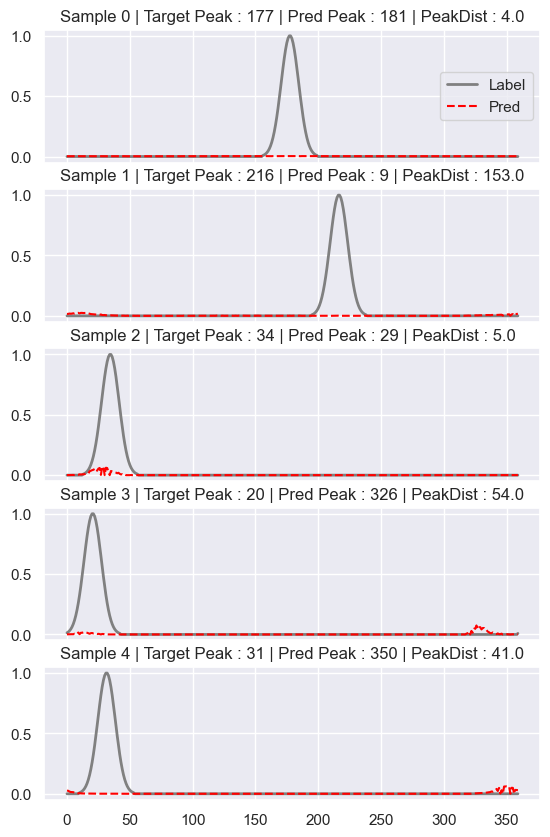

[  2   3   4   5   7   8   9  11  12  13  14  15  17  18  19  20  21  22
  23  24  25  26  28  29  31  32  33  35  36  37  38  39  41  42  44  55
 164 174 181 184 302 303 305 306 312 313 314 318 320 322 323 324 325 326
 328 329 331 332 333 335 336 337 338 341 342 344 346 348 349 350 352 354
 355 357 358 359]
SAVING TO ... /its/home/nn268/antvis/antvis/optics/res_big_loop_saves/models/p3/testing/RealThing_300E_1e-4_ADAM_Eighths_[452, 144]/2c2l/


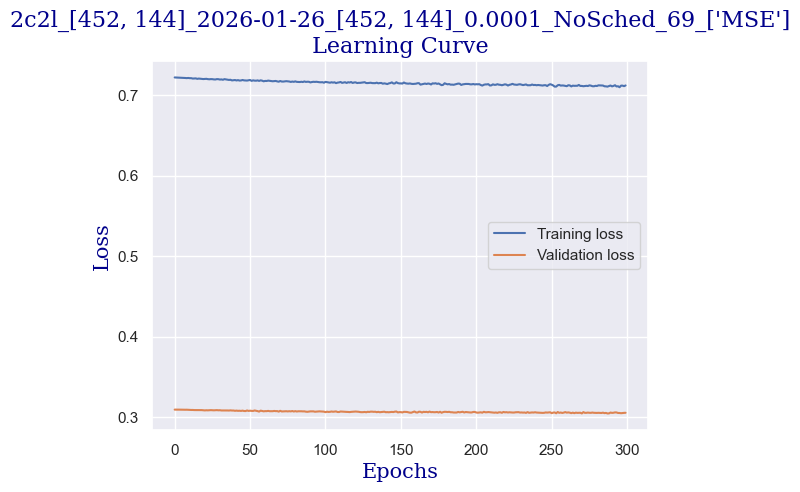

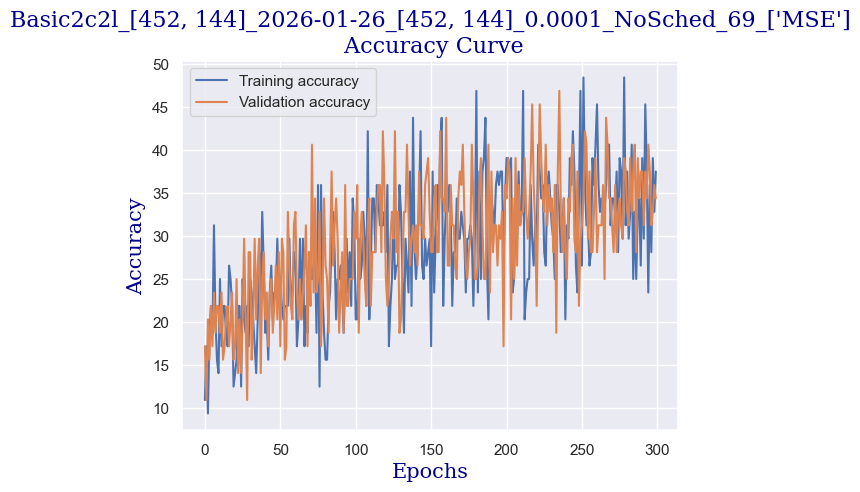

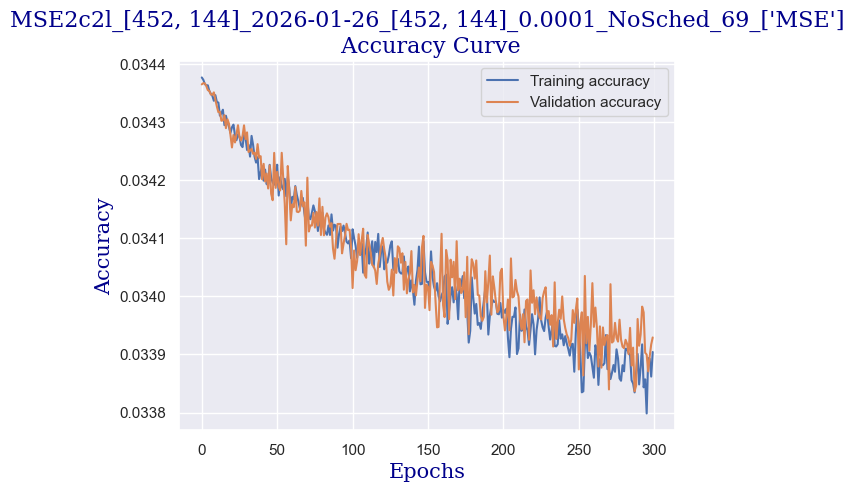

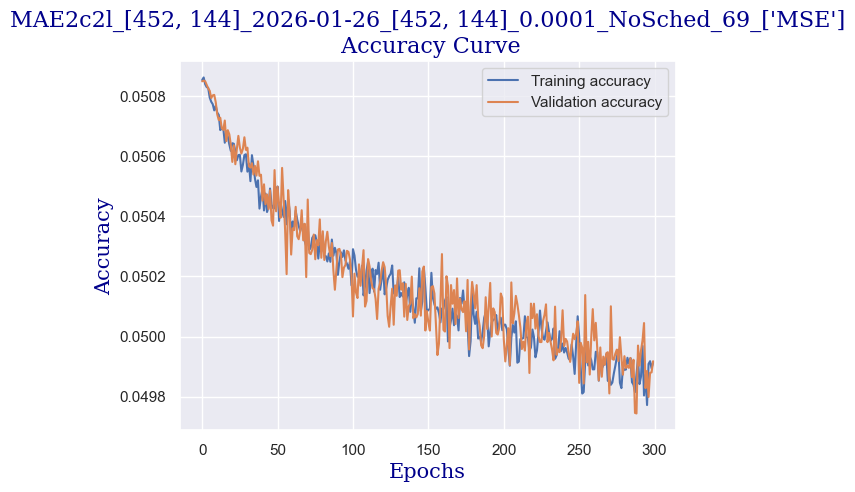

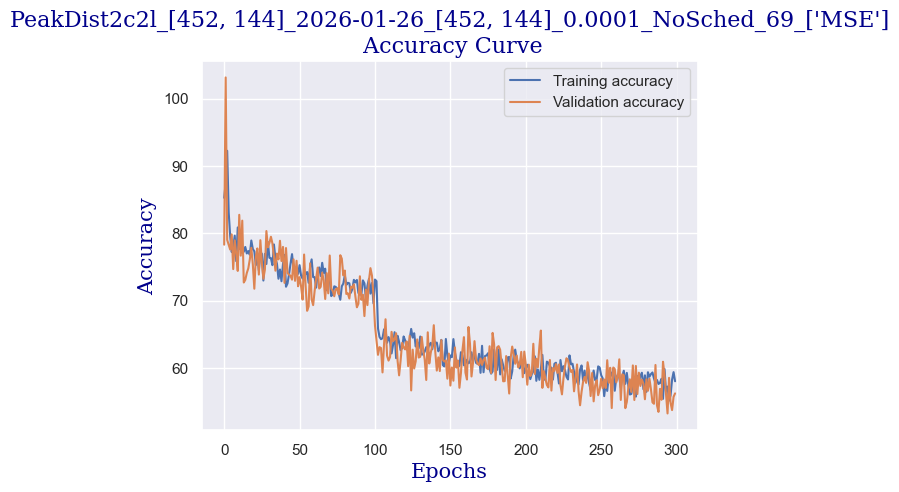

plot_confusion ACTUAL [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36]
plot_confusion PREDICTION [ 0  1  2  3  4  6 16 17 18 30 31 32 33 34 35 36]
actual  [ 9 32 16 33 20  3 31 12 21  3  3 20  8  9  7  8 35 34  1  3 27 34 31 25
 25 25 33 22 12 10 26  1 36 19 33  4 27 22 26 16  4 19 32 16 35 10 17  4
  2 36 16 33 23  1  9  2 10  7 34 16 28 24 20 25  8 22 32 18  2 16 14  2
 34  0 14  3 15 21 11 28  2 19 26 10 33 33  8 19  4 36 33  5 19 17 35 36
 16  4  8 35 33 20 32  2 28  5  7  2  2 33 21 30 29 31 32 35 12  3 33 25
 19 20 18 31 35 33 13  5 27  4  3  9 14 11 10  0 34  5 19 34 31 35  1 32
 21  6 33  3 23  3 26  2  4 20  8 17 15 35  6  9 32  2 32 29  4  5 14 34
  3 12 14  1  1 14 18 19 35 33 16 21 17 15 31 22 18 30 18  3  4  5 18 12
  5 33 30 19 18  2 28 16 33  8 36 15 33 13 12 16 26 22 29 32  3  8 29 28
 16  1  9  0 14 17 34  1 12 25 16 11 25 32  3 24 22  3 20 35  0 35 20 15
 10  4  7 35 11 18 34 26 27 19  1 31 34  4 32  2 1

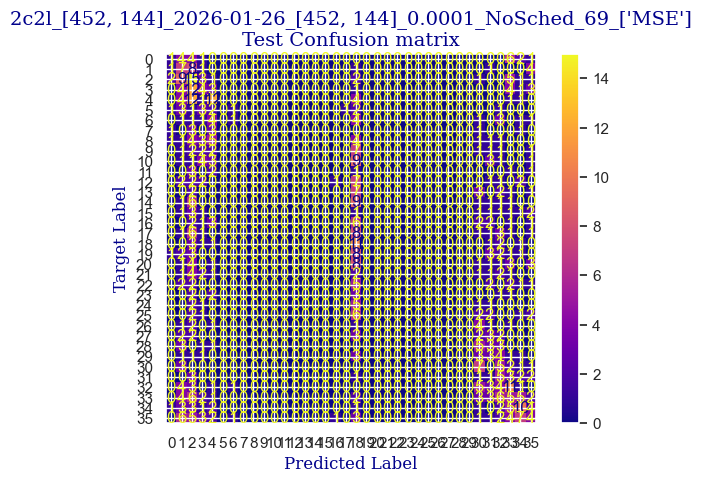

 
 END 2c2l [452, 144] Run Time:  19049.161157044


Epochs,▁
Test acc rough,▁▆█▅▄▅▄▇▅▅▃▃
TrainAcc rough,▁▁▂▂▄▂▂▂▄▁▂▃▅▁▄▃▄▂▄▂▅▅▅▄▅▃▄▃▇▅▄▄▅▄▆█▄▆▅▆
ValAcc rough,▂▂▁▁▁▂▃▄▃▃▅▃▄▃▂▅▄▄▅▆▃▅▆▆▇▄▅▃▅▄▄▄▅█▅▄▄▄▆▃
c_epoch,▁▁▁▁▁▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇█████
t_loss,█▇▇▆▆▆▅▅▄▅▄▄▄▄▄▄▃▃▃▃▃▂▃▃▃▃▂▂▂▂▃▂▁▁▂▂▂▁▁▁
test_acc_MAE,█▁▂▆▄▃█▄▅▇▆▇
test_acc_MSE,▇▁▂▆▃▃█▅▄▇▆█
test_peakDist,█▃▂▄▄▄▅▁▂▅▃▅
train_err_MAE,█▇█▇▇▆▇▆▇▇▆▆▄▆▆▄▅▄▇▅▇▅▃▆▅▆▂▅▅▅▂▄▃▃▃▂▂▃▅▁
+6,...


wandb: Agent Starting Run: ow98mxdm with config:
wandb: 	batch_size: 64
wandb: 	epochs: 300
wandb: 	half_ciprange: 22
wandb: 	learning_rate: 0.0001
wandb: 	loss_fn_cards: ['MSE']
wandb: 	model_cards: [{'Ks': [3, 5], 'channels': 3, 'dropout': 0.2, 'f_lin_lay': [1032192, 255744, 62208, 14976, 3072, 640, 128], 'idx': 6, 'model': '2c2l', 'name': '2c2l'}]
wandb: 	optimiser: ['adam']
wandb: 	resolution_cards: [{'index': 0, 'padding': 5, 'resolution': [452, 144]}]
wandb: 	seeds: 69
wandb: 	std_dev: 7
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from /its/home/nn268/.netrc.


{'name': '2c2l', 'model': '2c2l', 'channels': 3, 'Ks': (3, 5), 'f_lin_lay': [1032192, 255744, 62208, 14976, 3072, 640, 128], 'idx': 6, 'dropout': 0.2}
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 1
seed:  69
loss function:  ['MSE']
Batch size:  64
Training epochs:  300
start time:  38357.749526985
Model Name 2c2l
/its/home/nn268/antvis/antvis/optics/NC_IDSW/
set_lossfn    lf  ['MSE']


  0%|                                      | 0/300 [00:00<?, ?it/s]

Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


peak dist means  82.72172619047619
tacc:  {'baseAcc': 7.8125, 'MSE': 0.03446499737245696, 'MAE': 0.05086959650119146, 'peakDist': 82.72172619047619}
Validating...


  0%|                              | 1/300 [00:06<31:39,  6.35s/it]

peak dist means  74.98784722222223
v loss  0.30935411900281906
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  85.77380952380952
tacc:  {'baseAcc': 12.5, 'MSE': 0.034370506093615576, 'MAE': 0.05085645757970356, 'peakDist': 85.77380952380952}
Validating...


  1%|▏                             | 2/300 [00:13<33:06,  6.67s/it]

peak dist means  95.58506944444444
v loss  0.3093284144997597
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  91.01339285714286
tacc:  {'baseAcc': 10.9375, 'MSE': 0.034365542055595485, 'MAE': 0.050839101806992575, 'peakDist': 91.01339285714286}
Validating...


  1%|▎                             | 3/300 [00:19<32:25,  6.55s/it]

peak dist means  98.41840277777777
v loss  0.30928846821188927
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  89.3891369047619
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03436818878565516, 'MAE': 0.0508405775541351, 'peakDist': 89.3891369047619}
Validating...


  1%|▍                             | 4/300 [00:26<32:30,  6.59s/it]

peak dist means  95.14756944444444
v loss  0.309307087212801
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  86.55431547619048
tacc:  {'baseAcc': 15.625, 'MSE': 0.03435725434905007, 'MAE': 0.050816611342486884, 'peakDist': 86.55431547619048}
Validating...


  2%|▌                             | 5/300 [00:32<32:03,  6.52s/it]

peak dist means  80.21354166666667
v loss  0.3092917278409004
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  80.73958333333333
tacc:  {'baseAcc': 18.75, 'MSE': 0.034341243760926385, 'MAE': 0.05075591465546971, 'peakDist': 80.73958333333333}
Validating...


  2%|▌                             | 6/300 [00:38<31:26,  6.42s/it]

peak dist means  78.16319444444444
v loss  0.3091804124414921
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.53794642857143
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034348392947798685, 'MAE': 0.05078221662413506, 'peakDist': 78.53794642857143}
Validating...


  2%|▋                             | 7/300 [00:45<31:05,  6.37s/it]

peak dist means  81.65625
v loss  0.3092024549841881
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.74255952380952
tacc:  {'baseAcc': 17.1875, 'MSE': 0.0343438819760368, 'MAE': 0.05076487504300617, 'peakDist': 76.74255952380952}
Validating...


  3%|▊                             | 8/300 [00:51<30:48,  6.33s/it]

peak dist means  80.07118055555556
v loss  0.30918172374367714
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.48065476190476
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03433290177157947, 'MAE': 0.05073089844414166, 'peakDist': 77.48065476190476}
Validating...


  3%|▉                             | 9/300 [00:57<30:34,  6.30s/it]

peak dist means  75.84548611111111
v loss  0.30910301208496094
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  80.11904761904762
tacc:  {'baseAcc': 10.9375, 'MSE': 0.03434873691626957, 'MAE': 0.05077594376745678, 'peakDist': 80.11904761904762}
Validating...


  3%|▉                            | 10/300 [01:03<30:27,  6.30s/it]

peak dist means  78.44965277777777
v loss  0.30912067741155624
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.984375
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03432575364907583, 'MAE': 0.050715994976815726, 'peakDist': 76.984375}
Validating...


  4%|█                            | 11/300 [01:10<30:00,  6.23s/it]

peak dist means  77.81076388888889
v loss  0.30899814516305923
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  81.484375
tacc:  {'baseAcc': 25.0, 'MSE': 0.034350008836814334, 'MAE': 0.05078157126193955, 'peakDist': 81.484375}
Validating...


  4%|█▏                           | 12/300 [01:16<29:35,  6.16s/it]

peak dist means  77.77604166666667
v loss  0.30914808064699173
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.20535714285714
tacc:  {'baseAcc': 21.875, 'MSE': 0.03431785958153861, 'MAE': 0.05069651082158089, 'peakDist': 76.20535714285714}
Validating...


  4%|█▎                           | 13/300 [01:22<29:58,  6.27s/it]

peak dist means  79.33333333333333
v loss  0.3090159520506859
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.63318452380952
tacc:  {'baseAcc': 21.875, 'MSE': 0.03430588844986189, 'MAE': 0.05066202439012982, 'peakDist': 76.63318452380952}
Validating...


  5%|█▎                           | 14/300 [01:29<30:38,  6.43s/it]

peak dist means  77.77604166666667
v loss  0.30870940536260605
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.05357142857143
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03431444952175731, 'MAE': 0.05067555606365204, 'peakDist': 76.05357142857143}
Validating...


  5%|█▍                           | 15/300 [01:35<30:28,  6.42s/it]

peak dist means  76.25694444444444
v loss  0.3088633790612221
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.11532738095238
tacc:  {'baseAcc': 32.8125, 'MSE': 0.034317486165534886, 'MAE': 0.050698126710596536, 'peakDist': 78.11532738095238}
Validating...


  5%|█▌                           | 16/300 [01:42<31:00,  6.55s/it]

peak dist means  80.41145833333333
v loss  0.30894267186522484
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.84002976190476
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03430827724791709, 'MAE': 0.050671931888375966, 'peakDist': 75.84002976190476}
Validating...


  6%|█▋                           | 17/300 [01:49<30:47,  6.53s/it]

peak dist means  75.14756944444444
v loss  0.3086208589375019
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.6078869047619
tacc:  {'baseAcc': 18.75, 'MSE': 0.03430669772483054, 'MAE': 0.05066233217006638, 'peakDist': 76.6078869047619}
Validating...


  6%|█▋                           | 18/300 [01:55<30:43,  6.54s/it]

peak dist means  77.71354166666667
v loss  0.3087623901665211
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.66071428571429
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03432377161724227, 'MAE': 0.05070845250572477, 'peakDist': 78.66071428571429}
Validating...


  6%|█▊                           | 19/300 [02:02<30:29,  6.51s/it]

peak dist means  79.90451388888889
v loss  0.3090299889445305
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.8921130952381
tacc:  {'baseAcc': 18.75, 'MSE': 0.03430264531856492, 'MAE': 0.05064857414080983, 'peakDist': 76.8921130952381}
Validating...


  7%|█▉                           | 20/300 [02:08<30:18,  6.49s/it]

peak dist means  77.49131944444444
v loss  0.3087446466088295
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.22395833333333
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034296385589100066, 'MAE': 0.05063911030689875, 'peakDist': 76.22395833333333}
Validating...


  7%|██                           | 21/300 [02:14<29:32,  6.35s/it]

peak dist means  73.81944444444444
v loss  0.3087824583053589
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.19419642857143
tacc:  {'baseAcc': 18.75, 'MSE': 0.03428553825333005, 'MAE': 0.05060896880569912, 'peakDist': 75.19419642857143}
Validating...


  7%|██▏                          | 22/300 [02:20<29:06,  6.28s/it]

peak dist means  77.25694444444444
v loss  0.30868595838546753
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.625
tacc:  {'baseAcc': 10.9375, 'MSE': 0.034291750086205344, 'MAE': 0.05063065230136826, 'peakDist': 77.625}
Validating...


  8%|██▏                          | 23/300 [02:26<28:49,  6.24s/it]

peak dist means  80.14930555555556
v loss  0.30873582884669304
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.49107142857143
tacc:  {'baseAcc': 15.625, 'MSE': 0.03429504075930232, 'MAE': 0.050645199382588976, 'peakDist': 77.49107142857143}
Validating...


  8%|██▎                          | 24/300 [02:33<28:36,  6.22s/it]

peak dist means  78.38020833333333
v loss  0.30867961421608925
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.2641369047619
tacc:  {'baseAcc': 21.875, 'MSE': 0.03429056650825909, 'MAE': 0.050638473814442045, 'peakDist': 79.2641369047619}
Validating...


  8%|██▍                          | 25/300 [02:39<28:32,  6.23s/it]

peak dist means  76.86284722222223
v loss  0.3085339367389679
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.48139880952381
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034287028724238985, 'MAE': 0.05061561862627665, 'peakDist': 76.48139880952381}
Validating...


  9%|██▌                          | 26/300 [02:45<28:41,  6.28s/it]

peak dist means  75.921875
v loss  0.30850547924637794
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.80952380952381
tacc:  {'baseAcc': 21.875, 'MSE': 0.03429113381675312, 'MAE': 0.05062557118279593, 'peakDist': 76.80952380952381}
Validating...


  9%|██▌                          | 27/300 [02:52<28:45,  6.32s/it]

peak dist means  79.91319444444444
v loss  0.30865246057510376
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.93377976190476
tacc:  {'baseAcc': 15.625, 'MSE': 0.03429057431362924, 'MAE': 0.05063775057593981, 'peakDist': 76.93377976190476}
Validating...


  9%|██▋                          | 28/300 [02:58<28:49,  6.36s/it]

peak dist means  75.08854166666667
v loss  0.30860066041350365
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.63764880952381
tacc:  {'baseAcc': 9.375, 'MSE': 0.03428733277888525, 'MAE': 0.05062911162773768, 'peakDist': 76.63764880952381}
Validating...


 10%|██▊                          | 29/300 [03:04<28:51,  6.39s/it]

peak dist means  78.265625
v loss  0.3083762377500534
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.4233630952381
tacc:  {'baseAcc': 18.75, 'MSE': 0.03429689151900155, 'MAE': 0.050653857844216485, 'peakDist': 78.4233630952381}
Validating...


 10%|██▉                          | 30/300 [03:11<29:10,  6.48s/it]

peak dist means  76.34722222222223
v loss  0.30852795019745827
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.86681547619048
tacc:  {'baseAcc': 25.0, 'MSE': 0.03429442856992994, 'MAE': 0.050633114540860766, 'peakDist': 77.86681547619048}
Validating...


 10%|██▉                          | 31/300 [03:18<29:02,  6.48s/it]

peak dist means  70.93229166666667
v loss  0.30837345495820045
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.74330357142857
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03428548556708154, 'MAE': 0.05062642622561682, 'peakDist': 77.74330357142857}
Validating...


 11%|███                          | 32/300 [03:24<29:18,  6.56s/it]

peak dist means  74.89756944444444
v loss  0.3084408678114414
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.89434523809524
tacc:  {'baseAcc': 25.0, 'MSE': 0.03430183888191268, 'MAE': 0.05066521536736261, 'peakDist': 78.89434523809524}
Validating...


 11%|███▏                         | 33/300 [03:31<29:21,  6.60s/it]

peak dist means  77.35590277777777
v loss  0.30870402604341507
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.59151785714286
tacc:  {'baseAcc': 7.8125, 'MSE': 0.03428971306199119, 'MAE': 0.05063105321356228, 'peakDist': 77.59151785714286}
Validating...


 11%|███▎                         | 34/300 [03:37<28:57,  6.53s/it]

peak dist means  79.53645833333333
v loss  0.30879751220345497
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.75520833333333
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03428394560303007, 'MAE': 0.05062234082392284, 'peakDist': 77.75520833333333}
Validating...


 12%|███▍                         | 35/300 [03:44<28:54,  6.55s/it]

peak dist means  75.29861111111111
v loss  0.30828163772821426
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.94866071428571
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03427282507930483, 'MAE': 0.0505945992966493, 'peakDist': 76.94866071428571}
Validating...


 12%|███▍                         | 36/300 [03:51<28:44,  6.53s/it]

peak dist means  78.23958333333333
v loss  0.30854396522045135
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.29017857142857
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03429240236679713, 'MAE': 0.050633635726713, 'peakDist': 77.29017857142857}
Validating...


 12%|███▌                         | 37/300 [03:57<28:21,  6.47s/it]

peak dist means  74.23611111111111
v loss  0.3084694445133209
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.98139880952381
tacc:  {'baseAcc': 18.75, 'MSE': 0.0342590015913759, 'MAE': 0.05055540055036545, 'peakDist': 75.98139880952381}
Validating...


 13%|███▋                         | 38/300 [04:03<28:04,  6.43s/it]

peak dist means  79.18402777777777
v loss  0.30855730175971985
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.015625
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03426632852781387, 'MAE': 0.05057354040798687, 'peakDist': 76.015625}
Validating...


 13%|███▊                         | 39/300 [04:09<27:39,  6.36s/it]

peak dist means  79.61631944444444
v loss  0.3085285872220993
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.01116071428571
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03427891167146819, 'MAE': 0.05061937354150273, 'peakDist': 76.01116071428571}
Validating...


 13%|███▊                         | 40/300 [04:16<27:24,  6.33s/it]

peak dist means  78.203125
v loss  0.30830227583646774
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.84598214285714
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034272928323064535, 'MAE': 0.05057610021460624, 'peakDist': 74.84598214285714}
Validating...


 14%|███▉                         | 41/300 [04:22<27:02,  6.26s/it]

peak dist means  78.53298611111111
v loss  0.30855371430516243
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.92485119047619
tacc:  {'baseAcc': 18.75, 'MSE': 0.034273737420638405, 'MAE': 0.05059694551995823, 'peakDist': 76.92485119047619}
Validating...


 14%|████                         | 42/300 [04:28<26:36,  6.19s/it]

peak dist means  76.00347222222223
v loss  0.3085377551615238
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.4702380952381
tacc:  {'baseAcc': 23.4375, 'MSE': 0.0342562117037319, 'MAE': 0.05055445840670949, 'peakDist': 75.4702380952381}
Validating...


 14%|████▏                        | 43/300 [04:32<24:02,  5.61s/it]

peak dist means  76.26388888888889
v loss  0.3084651157259941
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.54985119047619
tacc:  {'baseAcc': 18.75, 'MSE': 0.03425671639186995, 'MAE': 0.050557032582305726, 'peakDist': 75.54985119047619}
Validating...


 15%|████▎                        | 44/300 [04:36<22:09,  5.19s/it]

peak dist means  73.22395833333333
v loss  0.3082806207239628
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.4047619047619
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034281015218723385, 'MAE': 0.05061375065928414, 'peakDist': 79.4047619047619}
Validating...


 15%|████▎                        | 45/300 [04:41<20:50,  4.90s/it]

peak dist means  76.32118055555556
v loss  0.3083227165043354
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.38095238095238
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03425071086911928, 'MAE': 0.050532329650152294, 'peakDist': 75.38095238095238}
Validating...


 15%|████▍                        | 46/300 [04:47<22:42,  5.36s/it]

peak dist means  74.60069444444444
v loss  0.3081221804022789
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.08258928571429
tacc:  {'baseAcc': 25.0, 'MSE': 0.03425931256441843, 'MAE': 0.05054938154561179, 'peakDist': 75.08258928571429}
Validating...


 16%|████▌                        | 47/300 [04:53<23:54,  5.67s/it]

peak dist means  73.21006944444444
v loss  0.30806872621178627
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.96949404761905
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03425929234141395, 'MAE': 0.050561161090930305, 'peakDist': 76.96949404761905}
Validating...


 16%|████▋                        | 48/300 [05:00<24:45,  5.89s/it]

peak dist means  72.48784722222223
v loss  0.3083210438489914
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.51264880952381
tacc:  {'baseAcc': 21.875, 'MSE': 0.034271820670082456, 'MAE': 0.05060290882275218, 'peakDist': 79.51264880952381}
Validating...


 16%|████▋                        | 49/300 [05:06<25:04,  6.00s/it]

peak dist means  78.36805555555556
v loss  0.3084371089935303
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.30877976190476
tacc:  {'baseAcc': 14.0625, 'MSE': 0.034235087711186635, 'MAE': 0.050500549198616115, 'peakDist': 73.30877976190476}
Validating...


 17%|████▊                        | 50/300 [05:12<25:00,  6.00s/it]

peak dist means  73.48263888888889
v loss  0.30817336589097977
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.36979166666667
tacc:  {'baseAcc': 21.875, 'MSE': 0.03425196913026628, 'MAE': 0.05054069629737309, 'peakDist': 75.36979166666667}
Validating...


 17%|████▉                        | 51/300 [05:18<25:18,  6.10s/it]

peak dist means  76.89583333333333
v loss  0.3084724508225918
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.38392857142857
tacc:  {'baseAcc': 25.0, 'MSE': 0.03425677475475129, 'MAE': 0.05055089702918416, 'peakDist': 76.38392857142857}
Validating...


 17%|█████                        | 52/300 [05:25<25:25,  6.15s/it]

peak dist means  77.23958333333333
v loss  0.3084772415459156
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.67708333333333
tacc:  {'baseAcc': 25.0, 'MSE': 0.03426488453433627, 'MAE': 0.050565595960333234, 'peakDist': 77.67708333333333}
Validating...


 18%|█████                        | 53/300 [05:31<25:13,  6.13s/it]

peak dist means  76.31597222222223
v loss  0.30835722014307976
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.75669642857143
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03424172564631417, 'MAE': 0.05051569232628459, 'peakDist': 76.75669642857143}
Validating...


 18%|█████▏                       | 54/300 [05:37<25:38,  6.25s/it]

peak dist means  74.74131944444444
v loss  0.308114618062973
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.54241071428571
tacc:  {'baseAcc': 25.0, 'MSE': 0.03423089338910012, 'MAE': 0.050494049986203514, 'peakDist': 75.54241071428571}
Validating...


 18%|█████▎                       | 55/300 [05:44<25:59,  6.36s/it]

peak dist means  72.59895833333333
v loss  0.30819713324308395
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.72098214285714
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034232991614512036, 'MAE': 0.05049599653908184, 'peakDist': 74.72098214285714}
Validating...


 19%|█████▍                       | 56/300 [05:51<26:23,  6.49s/it]

peak dist means  77.32986111111111
v loss  0.30831328779459
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.1421130952381
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034225969264904656, 'MAE': 0.05048548536641257, 'peakDist': 75.1421130952381}
Validating...


 19%|█████▌                       | 57/300 [05:57<26:28,  6.54s/it]

peak dist means  74.57118055555556
v loss  0.30796146020293236
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.13244047619048
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03424638616187232, 'MAE': 0.050536416648399266, 'peakDist': 77.13244047619048}
Validating...


 19%|█████▌                       | 58/300 [06:04<26:31,  6.58s/it]

peak dist means  76.81944444444444
v loss  0.3081667460501194
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.27752976190476
tacc:  {'baseAcc': 18.75, 'MSE': 0.03424945846199989, 'MAE': 0.050546731267656596, 'peakDist': 78.27752976190476}
Validating...


 20%|█████▋                       | 59/300 [06:10<26:23,  6.57s/it]

peak dist means  77.78645833333333
v loss  0.30835438147187233
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.02604166666667
tacc:  {'baseAcc': 26.5625, 'MSE': 0.0342185642747652, 'MAE': 0.050469985675244106, 'peakDist': 73.02604166666667}
Validating...


 20%|█████▊                       | 60/300 [06:17<26:24,  6.60s/it]

peak dist means  77.0
v loss  0.30818764865398407
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.953125
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03421743657617342, 'MAE': 0.05046082270287332, 'peakDist': 73.953125}
Validating...


 20%|█████▉                       | 61/300 [06:24<26:21,  6.62s/it]

peak dist means  77.36284722222223
v loss  0.3081684522330761
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.38467261904762
tacc:  {'baseAcc': 28.125, 'MSE': 0.034249220398210344, 'MAE': 0.050531607476018724, 'peakDist': 76.38467261904762}
Validating...


 21%|█████▉                       | 62/300 [06:30<26:10,  6.60s/it]

peak dist means  73.64583333333333
v loss  0.30804552137851715
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.44196428571429
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034230898533548625, 'MAE': 0.05050081529078029, 'peakDist': 75.44196428571429}
Validating...


 21%|██████                       | 63/300 [06:37<25:47,  6.53s/it]

peak dist means  75.09027777777777
v loss  0.30813005566596985
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.77901785714286
tacc:  {'baseAcc': 28.125, 'MSE': 0.03423733352905228, 'MAE': 0.05052238135110764, 'peakDist': 75.77901785714286}
Validating...


 21%|██████▏                      | 64/300 [06:43<25:26,  6.47s/it]

peak dist means  78.83680555555556
v loss  0.308014839887619
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.31175595238095
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03420522294583775, 'MAE': 0.05043725083981242, 'peakDist': 72.31175595238095}
Validating...


 22%|██████▎                      | 65/300 [06:49<25:08,  6.42s/it]

peak dist means  77.06597222222223
v loss  0.3081767372786999
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.37425595238095
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03421379200049809, 'MAE': 0.050456839125780834, 'peakDist': 75.37425595238095}
Validating...


 22%|██████▍                      | 66/300 [06:56<24:49,  6.36s/it]

peak dist means  71.11979166666667
v loss  0.3078361637890339
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.44345238095238
tacc:  {'baseAcc': 28.125, 'MSE': 0.03419671846287591, 'MAE': 0.050426083306471504, 'peakDist': 73.44345238095238}
Validating...


 22%|██████▍                      | 67/300 [07:02<24:17,  6.26s/it]

peak dist means  75.52430555555556
v loss  0.3076401986181736
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.59895833333333
tacc:  {'baseAcc': 31.25, 'MSE': 0.03423796274832317, 'MAE': 0.05052076102722259, 'peakDist': 76.59895833333333}
Validating...


 23%|██████▌                      | 68/300 [07:08<23:55,  6.19s/it]

peak dist means  71.66493055555556
v loss  0.30768557637929916
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.91889880952381
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03422108540932337, 'MAE': 0.05049068746822221, 'peakDist': 75.91889880952381}
Validating...


 23%|██████▋                      | 69/300 [07:14<23:54,  6.21s/it]

peak dist means  77.56423611111111
v loss  0.3078288845717907
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.50892857142857
tacc:  {'baseAcc': 25.0, 'MSE': 0.03420883718700636, 'MAE': 0.05044893299539884, 'peakDist': 74.50892857142857}
Validating...


 23%|██████▊                      | 70/300 [07:20<24:15,  6.33s/it]

peak dist means  73.92708333333333
v loss  0.3077397532761097
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.65922619047619
tacc:  {'baseAcc': 28.125, 'MSE': 0.03422409633085841, 'MAE': 0.050487752294256574, 'peakDist': 74.65922619047619}
Validating...


 24%|██████▊                      | 71/300 [07:27<24:24,  6.39s/it]

peak dist means  74.31423611111111
v loss  0.3077131249010563
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.45014880952381
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03422371847998528, 'MAE': 0.05048189347698575, 'peakDist': 76.45014880952381}
Validating...


 24%|██████▉                      | 72/300 [07:33<23:57,  6.31s/it]

peak dist means  75.19270833333333
v loss  0.3079405315220356
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.1889880952381
tacc:  {'baseAcc': 18.75, 'MSE': 0.034243756106921604, 'MAE': 0.05054063030651638, 'peakDist': 78.1889880952381}
Validating...


 24%|███████                      | 73/300 [07:39<23:45,  6.28s/it]

peak dist means  72.828125
v loss  0.30781427025794983
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.91145833333333
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03420512395955268, 'MAE': 0.05043967884211313, 'peakDist': 74.91145833333333}
Validating...


 25%|███████▏                     | 74/300 [07:46<23:37,  6.27s/it]

peak dist means  77.85590277777777
v loss  0.30796146765351295
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.72172619047619
tacc:  {'baseAcc': 18.75, 'MSE': 0.03421423052038465, 'MAE': 0.050471700727939606, 'peakDist': 78.72172619047619}
Validating...


 25%|███████▎                     | 75/300 [07:52<23:40,  6.31s/it]

peak dist means  77.11979166666667
v loss  0.30803440883755684
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.92113095238095
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03419934514732588, 'MAE': 0.050432829629807246, 'peakDist': 75.92113095238095}
Validating...


 25%|███████▎                     | 76/300 [07:58<23:36,  6.32s/it]

peak dist means  81.28125
v loss  0.3083752952516079
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.53571428571429
tacc:  {'baseAcc': 21.875, 'MSE': 0.03419711884288561, 'MAE': 0.05044262838505563, 'peakDist': 74.53571428571429}
Validating...


 26%|███████▍                     | 77/300 [08:05<23:24,  6.30s/it]

peak dist means  77.47222222222223
v loss  0.30773423984646797
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.13616071428571
tacc:  {'baseAcc': 21.875, 'MSE': 0.034180295964082084, 'MAE': 0.05038884175675256, 'peakDist': 75.13616071428571}
Validating...


 26%|███████▌                     | 78/300 [08:11<23:16,  6.29s/it]

peak dist means  79.34201388888889
v loss  0.3080291487276554
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.80357142857143
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03419548113431249, 'MAE': 0.05042790444124313, 'peakDist': 74.80357142857143}
Validating...


 26%|███████▋                     | 79/300 [08:17<23:13,  6.31s/it]

peak dist means  78.24652777777777
v loss  0.3079970180988312
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.36235119047619
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03418587449760664, 'MAE': 0.05040393929396357, 'peakDist': 73.36235119047619}
Validating...


 27%|███████▋                     | 80/300 [08:23<22:49,  6.22s/it]

peak dist means  74.95659722222223
v loss  0.30783209204673767
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.6421130952381
tacc:  {'baseAcc': 18.75, 'MSE': 0.03419983493430274, 'MAE': 0.050438010621638524, 'peakDist': 75.6421130952381}
Validating...


 27%|███████▊                     | 81/300 [08:29<22:25,  6.14s/it]

peak dist means  75.03125
v loss  0.30774619802832603
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.86235119047619
tacc:  {'baseAcc': 25.0, 'MSE': 0.03420729970648175, 'MAE': 0.050451988265627905, 'peakDist': 75.86235119047619}
Validating...


 27%|███████▉                     | 82/300 [08:36<22:47,  6.27s/it]

peak dist means  71.04340277777777
v loss  0.3076874613761902
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.46875
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034182105922982806, 'MAE': 0.05040727023567472, 'peakDist': 74.46875}
Validating...


 28%|████████                     | 83/300 [08:42<22:57,  6.35s/it]

peak dist means  70.78819444444444
v loss  0.30744683742523193
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.14880952380952
tacc:  {'baseAcc': 25.0, 'MSE': 0.03419905404249827, 'MAE': 0.05044630489179066, 'peakDist': 76.14880952380952}
Validating...


 28%|████████                     | 84/300 [08:49<22:58,  6.38s/it]

peak dist means  71.36284722222223
v loss  0.3076167218387127
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.76934523809524
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03420799332005637, 'MAE': 0.05045547070247786, 'peakDist': 74.76934523809524}
Validating...


 28%|████████▏                    | 85/300 [08:55<23:04,  6.44s/it]

peak dist means  73.50694444444444
v loss  0.3076045475900173
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.52529761904762
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03418615673269544, 'MAE': 0.050407205131791886, 'peakDist': 75.52529761904762}
Validating...


 29%|████████▎                    | 86/300 [09:02<23:25,  6.57s/it]

peak dist means  76.00694444444444
v loss  0.30747369676828384
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.66294642857143
tacc:  {'baseAcc': 34.375, 'MSE': 0.03414641161050115, 'MAE': 0.05032493564344588, 'peakDist': 72.66294642857143}
Validating...


 29%|████████▍                    | 87/300 [09:09<23:26,  6.60s/it]

peak dist means  75.69097222222223
v loss  0.30772263184189796
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.453125
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03416619644988151, 'MAE': 0.05036239219563348, 'peakDist': 73.453125}
Validating...


 29%|████████▌                    | 88/300 [09:15<22:52,  6.48s/it]

peak dist means  70.35243055555556
v loss  0.307171493768692
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.48363095238095
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03417433993447395, 'MAE': 0.05037925179515566, 'peakDist': 74.48363095238095}
Validating...


 30%|████████▌                    | 89/300 [09:22<22:49,  6.49s/it]

peak dist means  73.50173611111111
v loss  0.30756203457713127
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.7671130952381
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03414323979190418, 'MAE': 0.05031091684386844, 'peakDist': 72.7671130952381}
Validating...


 30%|████████▋                    | 90/300 [09:28<22:30,  6.43s/it]

peak dist means  73.09375
v loss  0.3073665648698807
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.30431547619048
tacc:  {'baseAcc': 15.625, 'MSE': 0.034168292014371784, 'MAE': 0.05037114343472889, 'peakDist': 72.30431547619048}
Validating...


 30%|████████▊                    | 91/300 [09:34<21:54,  6.29s/it]

peak dist means  75.421875
v loss  0.30767393857240677
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.67782738095238
tacc:  {'baseAcc': 25.0, 'MSE': 0.0341444146775064, 'MAE': 0.05033358736407189, 'peakDist': 76.67782738095238}
Validating...


 31%|████████▉                    | 92/300 [09:40<21:43,  6.27s/it]

peak dist means  72.22916666666667
v loss  0.3072037845849991
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.38616071428571
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03415581317884581, 'MAE': 0.050353121367238816, 'peakDist': 74.38616071428571}
Validating...


 31%|████████▉                    | 93/300 [09:46<21:37,  6.27s/it]

peak dist means  75.92361111111111
v loss  0.3076128326356411
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.98735119047619
tacc:  {'baseAcc': 15.625, 'MSE': 0.03414418193556014, 'MAE': 0.05033066549471447, 'peakDist': 73.98735119047619}
Validating...


 31%|█████████                    | 94/300 [09:53<21:36,  6.29s/it]

peak dist means  74.94618055555556
v loss  0.3075810633599758
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.14583333333333
tacc:  {'baseAcc': 31.25, 'MSE': 0.034166163099663596, 'MAE': 0.050367342751650584, 'peakDist': 72.14583333333333}
Validating...


 32%|█████████▏                   | 95/300 [09:59<21:35,  6.32s/it]

peak dist means  70.31423611111111
v loss  0.30729586631059647
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.23660714285714
tacc:  {'baseAcc': 31.25, 'MSE': 0.0341597797260398, 'MAE': 0.050359790523846946, 'peakDist': 75.23660714285714}
Validating...


 32%|█████████▎                   | 96/300 [10:05<21:15,  6.25s/it]

peak dist means  74.64930555555556
v loss  0.307540163397789
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.25372023809524
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03414652869105339, 'MAE': 0.05033337555470921, 'peakDist': 73.25372023809524}
Validating...


 32%|█████████▍                   | 97/300 [10:11<21:03,  6.22s/it]

peak dist means  74.27951388888889
v loss  0.30750999227166176
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.60863095238095
tacc:  {'baseAcc': 18.75, 'MSE': 0.03413184909593491, 'MAE': 0.05031099578454381, 'peakDist': 73.60863095238095}
Validating...


 33%|█████████▍                   | 98/300 [10:18<21:08,  6.28s/it]

peak dist means  76.51909722222223
v loss  0.3072797767817974
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.49107142857143
tacc:  {'baseAcc': 10.9375, 'MSE': 0.034176018621240346, 'MAE': 0.05038069365989594, 'peakDist': 76.49107142857143}
Validating...


 33%|█████████▌                   | 99/300 [10:25<21:45,  6.49s/it]

peak dist means  73.97916666666667
v loss  0.3072434850037098
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.39955357142857
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03417829299966494, 'MAE': 0.050396559139092766, 'peakDist': 73.39955357142857}
Validating...


 33%|█████████▎                  | 100/300 [10:31<21:51,  6.56s/it]

peak dist means  73.85069444444444
v loss  0.30752934888005257
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.91220238095238
tacc:  {'baseAcc': 28.125, 'MSE': 0.03411607763596943, 'MAE': 0.05026215598696754, 'peakDist': 71.91220238095238}
Validating...


 34%|█████████▍                  | 101/300 [10:38<21:40,  6.54s/it]

peak dist means  72.43402777777777
v loss  0.3071745038032532
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.24181547619048
tacc:  {'baseAcc': 23.4375, 'MSE': 0.0341329262370155, 'MAE': 0.05029148076261793, 'peakDist': 72.24181547619048}
Validating...


 34%|█████████▌                  | 102/300 [10:45<21:57,  6.65s/it]

peak dist means  72.01736111111111
v loss  0.3074820823967457
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.09300595238095
tacc:  {'baseAcc': 28.125, 'MSE': 0.034118992409535816, 'MAE': 0.050285011352527706, 'peakDist': 74.09300595238095}
Validating...


 34%|█████████▌                  | 103/300 [10:51<21:34,  6.57s/it]

peak dist means  74.06597222222223
v loss  0.3071872480213642
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.85119047619048
tacc:  {'baseAcc': 21.875, 'MSE': 0.034129173982711064, 'MAE': 0.05028711383541425, 'peakDist': 71.85119047619048}
Validating...


 35%|█████████▋                  | 104/300 [10:58<21:18,  6.52s/it]

peak dist means  73.59895833333333
v loss  0.3075745031237602
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.02008928571429
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03413005137727374, 'MAE': 0.05028957909061795, 'peakDist': 73.02008928571429}
Validating...


 35%|█████████▊                  | 105/300 [11:04<20:56,  6.44s/it]

peak dist means  73.86631944444444
v loss  0.30703944712877274
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.00818452380952
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034124488809279034, 'MAE': 0.05029871811469396, 'peakDist': 75.00818452380952}
Validating...


 35%|█████████▉                  | 106/300 [11:10<20:28,  6.33s/it]

peak dist means  75.42013888888889
v loss  0.30729032680392265
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.0952380952381
tacc:  {'baseAcc': 28.125, 'MSE': 0.034123598997082026, 'MAE': 0.05026913860014507, 'peakDist': 73.0952380952381}
Validating...


 36%|█████████▉                  | 107/300 [11:16<20:07,  6.26s/it]

peak dist means  74.015625
v loss  0.30697982385754585
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.36904761904762
tacc:  {'baseAcc': 21.875, 'MSE': 0.034138189894812446, 'MAE': 0.05031059682369232, 'peakDist': 73.36904761904762}
Validating...


 36%|██████████                  | 108/300 [11:22<20:05,  6.28s/it]

peak dist means  75.25520833333333
v loss  0.30732300877571106
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.66220238095238
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03414841315576008, 'MAE': 0.05033056668582417, 'peakDist': 74.66220238095238}
Validating...


 36%|██████████▏                 | 109/300 [11:29<19:56,  6.26s/it]

peak dist means  70.29166666666667
v loss  0.3068437837064266
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.6875
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03409523552372342, 'MAE': 0.05021829175807181, 'peakDist': 71.6875}
Validating...


 37%|██████████▎                 | 110/300 [11:35<19:50,  6.26s/it]

peak dist means  76.80555555555556
v loss  0.3074571453034878
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.40327380952381
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03413135061661402, 'MAE': 0.050313097203061694, 'peakDist': 74.40327380952381}
Validating...


 37%|██████████▎                 | 111/300 [11:41<19:33,  6.21s/it]

peak dist means  72.73784722222223
v loss  0.30704280361533165
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.09449404761905
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03416665448319344, 'MAE': 0.05038960224815777, 'peakDist': 78.09449404761905}
Validating...


 37%|██████████▍                 | 112/300 [11:47<19:34,  6.25s/it]

peak dist means  74.57291666666667
v loss  0.30726614966988564
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.65029761904762
tacc:  {'baseAcc': 34.375, 'MSE': 0.03411875753885224, 'MAE': 0.050264051804939903, 'peakDist': 72.65029761904762}
Validating...


 38%|██████████▌                 | 113/300 [11:54<19:39,  6.31s/it]

peak dist means  70.23958333333333
v loss  0.30712755769491196
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.15029761904762
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03409786699783234, 'MAE': 0.05024620411651475, 'peakDist': 72.15029761904762}
Validating...


 38%|██████████▋                 | 114/300 [12:00<19:43,  6.36s/it]

peak dist means  70.40972222222223
v loss  0.30640173330903053
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.96502976190476
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034137723878735586, 'MAE': 0.05029868352271262, 'peakDist': 75.96502976190476}
Validating...


 38%|██████████▋                 | 115/300 [12:07<19:50,  6.43s/it]

peak dist means  71.75347222222223
v loss  0.3067920468747616
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.79910714285714
tacc:  {'baseAcc': 25.0, 'MSE': 0.0341203993275052, 'MAE': 0.05026413447090557, 'peakDist': 72.79910714285714}
Validating...


 39%|██████████▊                 | 116/300 [12:14<20:00,  6.52s/it]

peak dist means  71.74826388888889
v loss  0.307200089097023
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.47991071428571
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03412645505297752, 'MAE': 0.05028923600912094, 'peakDist': 75.47991071428571}
Validating...


 39%|██████████▉                 | 117/300 [12:20<20:07,  6.60s/it]

peak dist means  66.90104166666667
v loss  0.30668265372514725
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.25669642857143
tacc:  {'baseAcc': 26.5625, 'MSE': 0.0340952394264085, 'MAE': 0.05023853427597454, 'peakDist': 74.25669642857143}
Validating...


 39%|███████████                 | 118/300 [12:27<19:38,  6.48s/it]

peak dist means  77.21354166666667
v loss  0.3071293644607067
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.00520833333333
tacc:  {'baseAcc': 14.0625, 'MSE': 0.034109139016696384, 'MAE': 0.05026479668560482, 'peakDist': 76.00520833333333}
Validating...


 40%|███████████                 | 119/300 [12:33<19:04,  6.33s/it]

peak dist means  75.02430555555556
v loss  0.30717960372567177
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.75074404761905
tacc:  {'baseAcc': 28.125, 'MSE': 0.03412436605209396, 'MAE': 0.05030039715624991, 'peakDist': 72.75074404761905}
Validating...


 40%|███████████▏                | 120/300 [12:39<18:53,  6.30s/it]

peak dist means  73.47743055555556
v loss  0.3070860877633095
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.640625
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03412902568067823, 'MAE': 0.050303000247194654, 'peakDist': 73.640625}
Validating...


 40%|███████████▎                | 121/300 [12:45<18:48,  6.30s/it]

peak dist means  72.76041666666667
v loss  0.3068559393286705
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.78125
tacc:  {'baseAcc': 25.0, 'MSE': 0.03406947638307299, 'MAE': 0.05017085337922687, 'peakDist': 69.78125}
Validating...


 41%|███████████▍                | 122/300 [12:51<18:40,  6.30s/it]

peak dist means  72.18402777777777
v loss  0.3067440018057823
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.61904761904762
tacc:  {'baseAcc': 18.75, 'MSE': 0.03410992274681727, 'MAE': 0.05026320155177798, 'peakDist': 73.61904761904762}
Validating...


 41%|███████████▍                | 123/300 [12:57<18:10,  6.16s/it]

peak dist means  71.35416666666667
v loss  0.306872196495533
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.06547619047619
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03408660349391755, 'MAE': 0.05022639923152469, 'peakDist': 74.06547619047619}
Validating...


 41%|███████████▌                | 124/300 [13:04<18:20,  6.25s/it]

peak dist means  69.42534722222223
v loss  0.3064788803458214
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.18377976190476
tacc:  {'baseAcc': 28.125, 'MSE': 0.0340959977890764, 'MAE': 0.050238839572384245, 'peakDist': 72.18377976190476}
Validating...


 42%|███████████▋                | 125/300 [13:10<18:29,  6.34s/it]

peak dist means  67.00694444444444
v loss  0.3065805919468403
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.67113095238095
tacc:  {'baseAcc': 21.875, 'MSE': 0.03410104325129872, 'MAE': 0.05024186113760585, 'peakDist': 66.67113095238095}
Validating...


 42%|███████████▊                | 126/300 [13:16<18:20,  6.32s/it]

peak dist means  68.65104166666667
v loss  0.30690065026283264
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.31547619047619
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034104060381650925, 'MAE': 0.05024399555155209, 'peakDist': 66.31547619047619}
Validating...


 42%|███████████▊                | 127/300 [13:23<18:20,  6.36s/it]

peak dist means  64.64583333333333
v loss  0.3065818212926388
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.661458333333336
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034065233454817816, 'MAE': 0.05018717813349906, 'peakDist': 63.661458333333336}
Validating...


 43%|███████████▉                | 128/300 [13:29<18:22,  6.41s/it]

peak dist means  64.19270833333333
v loss  0.30648350343108177
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.61681547619048
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03410850199205535, 'MAE': 0.05026643084628241, 'peakDist': 67.61681547619048}
Validating...


 43%|████████████                | 129/300 [13:36<18:22,  6.45s/it]

peak dist means  70.66666666666667
v loss  0.30735746026039124
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.6264880952381
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03408925022397723, 'MAE': 0.0502396458316417, 'peakDist': 64.6264880952381}
Validating...


 43%|████████████▏               | 130/300 [13:43<18:36,  6.57s/it]

peak dist means  65.35243055555556
v loss  0.30697158351540565
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.62053571428571
tacc:  {'baseAcc': 28.125, 'MSE': 0.03408059052058628, 'MAE': 0.05021430764879499, 'peakDist': 65.62053571428571}
Validating...


 44%|████████████▏               | 131/300 [13:49<18:26,  6.55s/it]

peak dist means  62.401041666666664
v loss  0.3066684268414974
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.8296130952381
tacc:  {'baseAcc': 31.25, 'MSE': 0.03407586667509306, 'MAE': 0.05021676563081287, 'peakDist': 64.8296130952381}
Validating...


 44%|████████████▎               | 132/300 [13:56<18:07,  6.47s/it]

peak dist means  64.64583333333333
v loss  0.30687346309423447
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.27678571428571
tacc:  {'baseAcc': 28.125, 'MSE': 0.03410891638625236, 'MAE': 0.0502641818353108, 'peakDist': 67.27678571428571}
Validating...


 44%|████████████▍               | 133/300 [14:02<17:46,  6.39s/it]

peak dist means  67.72222222222223
v loss  0.30735335871577263
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.19122023809524
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03410215675830841, 'MAE': 0.05026325814071156, 'peakDist': 67.19122023809524}
Validating...


 45%|████████████▌               | 134/300 [14:08<17:31,  6.34s/it]

peak dist means  64.82638888888889
v loss  0.30680081248283386
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.10044642857143
tacc:  {'baseAcc': 25.0, 'MSE': 0.03411581101162093, 'MAE': 0.050275275572424845, 'peakDist': 66.10044642857143}
Validating...


 45%|████████████▌               | 135/300 [14:14<17:20,  6.31s/it]

peak dist means  67.45659722222223
v loss  0.3070424683392048
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.80580357142857
tacc:  {'baseAcc': 28.125, 'MSE': 0.03410472809558823, 'MAE': 0.05025524113859449, 'peakDist': 64.80580357142857}
Validating...


 45%|████████████▋               | 136/300 [14:21<17:13,  6.30s/it]

peak dist means  71.10763888888889
v loss  0.30729765072464943
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.283482142857146
tacc:  {'baseAcc': 32.8125, 'MSE': 0.0340774016720908, 'MAE': 0.05021518947822707, 'peakDist': 63.283482142857146}
Validating...


 46%|████████████▊               | 137/300 [14:27<16:55,  6.23s/it]

peak dist means  67.61458333333333
v loss  0.30660153180360794
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.532738095238095
tacc:  {'baseAcc': 28.125, 'MSE': 0.034068190093551366, 'MAE': 0.05017895943352154, 'peakDist': 63.532738095238095}
Validating...


 46%|████████████▉               | 138/300 [14:33<16:51,  6.24s/it]

peak dist means  69.44791666666667
v loss  0.3069193437695503
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.00595238095238
tacc:  {'baseAcc': 25.0, 'MSE': 0.034113013673396336, 'MAE': 0.050245557157766255, 'peakDist': 66.00595238095238}
Validating...


 46%|████████████▉               | 139/300 [14:39<16:47,  6.26s/it]

peak dist means  66.09027777777777
v loss  0.30694881454110146
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.88169642857143
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03412652228559766, 'MAE': 0.05028721548262097, 'peakDist': 64.88169642857143}
Validating...


 47%|█████████████               | 140/300 [14:46<16:54,  6.34s/it]

peak dist means  67.75
v loss  0.30716025456786156
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.70386904761905
tacc:  {'baseAcc': 25.0, 'MSE': 0.03407238494782221, 'MAE': 0.050176520964929035, 'peakDist': 64.70386904761905}
Validating...


 47%|█████████████▏              | 141/300 [14:52<16:59,  6.41s/it]

peak dist means  63.71006944444444
v loss  0.3064670190215111
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.63244047619048
tacc:  {'baseAcc': 25.0, 'MSE': 0.03402464411088398, 'MAE': 0.05009751483088448, 'peakDist': 64.63244047619048}
Validating...


 47%|█████████████▎              | 142/300 [14:59<17:03,  6.47s/it]

peak dist means  64.86458333333333
v loss  0.3063030019402504
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.56547619047619
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034069513635975976, 'MAE': 0.050166732321182884, 'peakDist': 66.56547619047619}
Validating...


 48%|█████████████▎              | 143/300 [15:05<16:55,  6.47s/it]

peak dist means  65.26041666666667
v loss  0.3068602681159973
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.19940476190476
tacc:  {'baseAcc': 31.25, 'MSE': 0.03408654459885189, 'MAE': 0.05023155787161419, 'peakDist': 65.19940476190476}
Validating...


 48%|█████████████▍              | 144/300 [15:12<17:08,  6.59s/it]

peak dist means  68.453125
v loss  0.30667151138186455
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.26934523809524
tacc:  {'baseAcc': 21.875, 'MSE': 0.034078973212412426, 'MAE': 0.05020953768065998, 'peakDist': 65.26934523809524}
Validating...


 48%|█████████████▌              | 145/300 [15:19<17:01,  6.59s/it]

peak dist means  63.96527777777778
v loss  0.3068080171942711
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.73065476190476
tacc:  {'baseAcc': 31.25, 'MSE': 0.034084927822862356, 'MAE': 0.050204714494092126, 'peakDist': 64.73065476190476}
Validating...


 49%|█████████████▋              | 146/300 [15:26<16:59,  6.62s/it]

peak dist means  68.11631944444444
v loss  0.3068595975637436
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.25372023809524
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03402060394485792, 'MAE': 0.05009673961571285, 'peakDist': 63.25372023809524}
Validating...


 49%|█████████████▋              | 147/300 [15:32<16:40,  6.54s/it]

peak dist means  66.67534722222223
v loss  0.3069683201611042
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.91443452380952
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03407461072007815, 'MAE': 0.0501951321604706, 'peakDist': 64.91443452380952}
Validating...


 49%|█████████████▊              | 148/300 [15:38<16:19,  6.44s/it]

peak dist means  65.38194444444444
v loss  0.30657289549708366
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.80803571428571
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03409731583226295, 'MAE': 0.05024771339126995, 'peakDist': 64.80803571428571}
Validating...


 50%|█████████████▉              | 149/300 [15:44<15:56,  6.33s/it]

peak dist means  64.20659722222223
v loss  0.3061770163476467
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.3891369047619
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03408178137171836, 'MAE': 0.05023496828618504, 'peakDist': 64.3891369047619}
Validating...


 50%|██████████████              | 150/300 [15:50<15:39,  6.26s/it]

peak dist means  63.463541666666664
v loss  0.3066045753657818
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.542410714285715
tacc:  {'baseAcc': 28.125, 'MSE': 0.034065193186203636, 'MAE': 0.050183953096469246, 'peakDist': 62.542410714285715}
Validating...


 50%|██████████████              | 151/300 [15:56<15:29,  6.24s/it]

peak dist means  60.57465277777778
v loss  0.30642012134194374
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.616815476190474
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03403312251681373, 'MAE': 0.050127592824754263, 'peakDist': 63.616815476190474}
Validating...


 51%|██████████████▏             | 152/300 [16:03<15:20,  6.22s/it]

peak dist means  64.94618055555556
v loss  0.3063681684434414
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.6875
tacc:  {'baseAcc': 32.8125, 'MSE': 0.034060953451054435, 'MAE': 0.05016776937104407, 'peakDist': 63.6875}
Validating...


 51%|██████████████▎             | 153/300 [16:09<15:22,  6.28s/it]

peak dist means  69.85243055555556
v loss  0.3070037476718426
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.997767857142854
tacc:  {'baseAcc': 34.375, 'MSE': 0.03401591699747812, 'MAE': 0.050100467389538175, 'peakDist': 62.997767857142854}
Validating...


 51%|██████████████▎             | 154/300 [16:16<15:24,  6.33s/it]

peak dist means  65.95833333333333
v loss  0.3070828579366207
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.94345238095238
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03404335127699943, 'MAE': 0.050148682934897285, 'peakDist': 63.94345238095238}
Validating...


 52%|██████████████▍             | 155/300 [16:22<15:29,  6.41s/it]

peak dist means  63.40972222222222
v loss  0.3066817335784435
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.72693452380952
tacc:  {'baseAcc': 34.375, 'MSE': 0.0340637933640253, 'MAE': 0.05018565874724161, 'peakDist': 64.72693452380952}
Validating...


 52%|██████████████▌             | 156/300 [16:28<15:20,  6.39s/it]

peak dist means  65.328125
v loss  0.3065193481743336
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.958333333333336
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03407787992840722, 'MAE': 0.0502202913519882, 'peakDist': 63.958333333333336}
Validating...


 52%|██████████████▋             | 157/300 [16:35<15:30,  6.51s/it]

peak dist means  61.93402777777778
v loss  0.3064049892127514
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.15178571428571
tacc:  {'baseAcc': 37.5, 'MSE': 0.03401678410314378, 'MAE': 0.050100174510762804, 'peakDist': 64.15178571428571}
Validating...


 53%|██████████████▋             | 158/300 [16:42<15:21,  6.49s/it]

peak dist means  64.86979166666667
v loss  0.3065665289759636
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.39136904761905
tacc:  {'baseAcc': 28.125, 'MSE': 0.03406319270531336, 'MAE': 0.05016381985374859, 'peakDist': 64.39136904761905}
Validating...


 53%|██████████████▊             | 159/300 [16:48<15:16,  6.50s/it]

peak dist means  62.58506944444444
v loss  0.3066190034151077
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.73735119047619
tacc:  {'baseAcc': 32.8125, 'MSE': 0.034078048453444525, 'MAE': 0.05020420909637496, 'peakDist': 63.73735119047619}
Validating...


 53%|██████████████▉             | 160/300 [16:55<15:27,  6.62s/it]

peak dist means  65.23090277777777
v loss  0.3068094812333584
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.76934523809524
tacc:  {'baseAcc': 35.9375, 'MSE': 0.034063033582199184, 'MAE': 0.050189530210835595, 'peakDist': 61.76934523809524}
Validating...


 54%|███████████████             | 161/300 [17:01<15:05,  6.52s/it]

peak dist means  66.55208333333333
v loss  0.30651918426156044
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.907738095238095
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03407578578307515, 'MAE': 0.05019822007133847, 'peakDist': 62.907738095238095}
Validating...


 54%|███████████████             | 162/300 [17:08<14:46,  6.43s/it]

peak dist means  62.41319444444444
v loss  0.30650220811367035
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.26934523809524
tacc:  {'baseAcc': 37.5, 'MSE': 0.0340354387604055, 'MAE': 0.050137960662444435, 'peakDist': 62.26934523809524}
Validating...


 54%|███████████████▏            | 163/300 [17:14<14:39,  6.42s/it]

peak dist means  62.677083333333336
v loss  0.30602921918034554
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.322916666666664
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03404858424550011, 'MAE': 0.050130315302383335, 'peakDist': 62.322916666666664}
Validating...


 55%|███████████████▎            | 164/300 [17:20<14:28,  6.39s/it]

peak dist means  61.548611111111114
v loss  0.3062487728893757
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.85119047619048
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03405277218137469, 'MAE': 0.05017539397591636, 'peakDist': 64.85119047619048}
Validating...


 55%|███████████████▍            | 165/300 [17:26<14:07,  6.27s/it]

peak dist means  64.98090277777777
v loss  0.3067840151488781
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.16964285714286
tacc:  {'baseAcc': 40.625, 'MSE': 0.03401400184347516, 'MAE': 0.05008989874096144, 'peakDist': 64.16964285714286}
Validating...


 55%|███████████████▍            | 166/300 [17:33<14:02,  6.29s/it]

peak dist means  61.48784722222222
v loss  0.306541346013546
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.03422619047619
tacc:  {'baseAcc': 18.75, 'MSE': 0.0340668060595081, 'MAE': 0.05018591153479758, 'peakDist': 63.03422619047619}
Validating...


 56%|███████████████▌            | 167/300 [17:39<13:58,  6.31s/it]

peak dist means  63.123263888888886
v loss  0.30644528567790985
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.882440476190474
tacc:  {'baseAcc': 34.375, 'MSE': 0.03405713680244628, 'MAE': 0.050156336809907644, 'peakDist': 62.882440476190474}
Validating...


 56%|███████████████▋            | 168/300 [17:45<13:53,  6.32s/it]

peak dist means  66.11979166666667
v loss  0.30639171227812767
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.67485119047619
tacc:  {'baseAcc': 37.5, 'MSE': 0.034065915182942434, 'MAE': 0.050188676409778143, 'peakDist': 62.67485119047619}
Validating...


 56%|███████████████▊            | 169/300 [17:52<13:43,  6.29s/it]

peak dist means  63.41840277777778
v loss  0.30654267594218254
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.98511904761905
tacc:  {'baseAcc': 25.0, 'MSE': 0.03404936247638294, 'MAE': 0.05014046583147276, 'peakDist': 61.98511904761905}
Validating...


 57%|███████████████▊            | 170/300 [17:58<13:45,  6.35s/it]

peak dist means  64.02256944444444
v loss  0.30666782706975937
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.59449404761905
tacc:  {'baseAcc': 42.1875, 'MSE': 0.033997275467429845, 'MAE': 0.050072080500069116, 'peakDist': 61.59449404761905}
Validating...


 57%|███████████████▉            | 171/300 [18:05<13:51,  6.44s/it]

peak dist means  64.95833333333333
v loss  0.3064771816134453
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.40327380952381
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03405758117636045, 'MAE': 0.05014903275739579, 'peakDist': 64.40327380952381}
Validating...


 57%|████████████████            | 172/300 [18:11<13:55,  6.53s/it]

peak dist means  64.34375
v loss  0.3064755015075207
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.848214285714285
tacc:  {'baseAcc': 28.125, 'MSE': 0.03402867753590856, 'MAE': 0.050123014265582674, 'peakDist': 61.848214285714285}
Validating...


 58%|████████████████▏           | 173/300 [18:18<13:49,  6.53s/it]

peak dist means  64.25347222222223
v loss  0.3066508434712887
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.02678571428571
tacc:  {'baseAcc': 34.375, 'MSE': 0.034035776697454, 'MAE': 0.050130403290192284, 'peakDist': 64.02678571428571}
Validating...


 58%|████████████████▏           | 174/300 [18:25<13:50,  6.59s/it]

peak dist means  66.77256944444444
v loss  0.30655165389180183
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.338541666666664
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03400461624066035, 'MAE': 0.050071688989798226, 'peakDist': 61.338541666666664}
Validating...


 58%|████████████████▎           | 175/300 [18:31<13:44,  6.60s/it]

peak dist means  64.31944444444444
v loss  0.3062967322766781
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.482142857142854
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03404771536588669, 'MAE': 0.050152680703571866, 'peakDist': 63.482142857142854}
Validating...


 59%|████████████████▍           | 176/300 [18:38<13:46,  6.67s/it]

peak dist means  65.109375
v loss  0.30645885318517685
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.67113095238095
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03403586095997265, 'MAE': 0.05011582143959545, 'peakDist': 59.67113095238095}
Validating...


 59%|████████████████▌           | 177/300 [18:44<13:27,  6.57s/it]

peak dist means  63.486111111111114
v loss  0.30624620616436005
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.322916666666664
tacc:  {'baseAcc': 34.375, 'MSE': 0.03402003681375867, 'MAE': 0.05010194686197099, 'peakDist': 61.322916666666664}
Validating...


 59%|████████████████▌           | 178/300 [18:51<13:17,  6.54s/it]

peak dist means  66.11111111111111
v loss  0.3068349361419678
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.51488095238095
tacc:  {'baseAcc': 21.875, 'MSE': 0.034015471736590065, 'MAE': 0.05010676933895974, 'peakDist': 61.51488095238095}
Validating...


 60%|████████████████▋           | 179/300 [18:57<13:01,  6.46s/it]

peak dist means  61.78125
v loss  0.306486826390028
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.601934523809526
tacc:  {'baseAcc': 31.25, 'MSE': 0.03401973009819076, 'MAE': 0.050108728664261956, 'peakDist': 62.601934523809526}
Validating...


 60%|████████████████▊           | 180/300 [19:04<12:54,  6.45s/it]

peak dist means  67.47916666666667
v loss  0.3067362904548645
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.20014880952381
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03399883813801266, 'MAE': 0.05006130305784089, 'peakDist': 60.20014880952381}
Validating...


 60%|████████████████▉           | 181/300 [19:10<12:39,  6.38s/it]

peak dist means  62.8125
v loss  0.3067990466952324
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.97247023809524
tacc:  {'baseAcc': 34.375, 'MSE': 0.034004452327887215, 'MAE': 0.05006971103804452, 'peakDist': 61.97247023809524}
Validating...


 61%|████████████████▉           | 182/300 [19:16<12:23,  6.30s/it]

peak dist means  62.00694444444444
v loss  0.3065688982605934
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.14434523809524
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034008911855164026, 'MAE': 0.05008531574692045, 'peakDist': 61.14434523809524}
Validating...


 61%|█████████████████           | 183/300 [19:22<12:05,  6.20s/it]

peak dist means  61.08159722222222
v loss  0.30630603060126305
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.776785714285715
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03398329924259867, 'MAE': 0.05003599432252702, 'peakDist': 61.776785714285715}
Validating...


 61%|█████████████████▏          | 184/300 [19:28<12:07,  6.27s/it]

peak dist means  64.29340277777777
v loss  0.3064287528395653
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.40699404761905
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03399252394835154, 'MAE': 0.050036332791759855, 'peakDist': 61.40699404761905}
Validating...


 62%|█████████████████▎          | 185/300 [19:35<12:02,  6.28s/it]

peak dist means  62.83506944444444
v loss  0.30673766881227493
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.64657738095238
tacc:  {'baseAcc': 35.9375, 'MSE': 0.034030157717920485, 'MAE': 0.05011833689752079, 'peakDist': 61.64657738095238}
Validating...


 62%|█████████████████▎          | 186/300 [19:41<12:04,  6.36s/it]

peak dist means  60.06597222222222
v loss  0.306264940649271
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.70982142857143
tacc:  {'baseAcc': 34.375, 'MSE': 0.03406001077521415, 'MAE': 0.050182972103357315, 'peakDist': 63.70982142857143}
Validating...


 62%|█████████████████▍          | 187/300 [19:48<12:13,  6.49s/it]

peak dist means  62.65625
v loss  0.306787833571434
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.283482142857146
tacc:  {'baseAcc': 34.375, 'MSE': 0.03398176318123227, 'MAE': 0.05004849355845224, 'peakDist': 62.283482142857146}
Validating...


 63%|█████████████████▌          | 188/300 [19:55<12:06,  6.48s/it]

peak dist means  65.17534722222223
v loss  0.3066366985440254
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.06770833333333
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03405588616927465, 'MAE': 0.05018820560404232, 'peakDist': 65.06770833333333}
Validating...


 63%|█████████████████▋          | 189/300 [20:01<12:00,  6.49s/it]

peak dist means  62.067708333333336
v loss  0.306391391903162
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.11235119047619
tacc:  {'baseAcc': 34.375, 'MSE': 0.0340162989284311, 'MAE': 0.0500769168138504, 'peakDist': 61.11235119047619}
Validating...


 63%|█████████████████▋          | 190/300 [20:08<12:05,  6.60s/it]

peak dist means  64.93402777777777
v loss  0.3065005913376808
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.479166666666664
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03400679198758943, 'MAE': 0.05008295320329212, 'peakDist': 60.479166666666664}
Validating...


 64%|█████████████████▊          | 191/300 [20:14<11:50,  6.52s/it]

peak dist means  63.567708333333336
v loss  0.30633679404854774
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.32886904761905
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03399644951735224, 'MAE': 0.05005948440659614, 'peakDist': 61.32886904761905}
Validating...


 64%|█████████████████▉          | 192/300 [20:21<11:40,  6.49s/it]

peak dist means  59.31597222222222
v loss  0.30619312822818756
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.520833333333336
tacc:  {'baseAcc': 31.25, 'MSE': 0.03400984122639611, 'MAE': 0.05009772770461582, 'peakDist': 62.520833333333336}
Validating...


 64%|██████████████████          | 193/300 [20:27<11:19,  6.35s/it]

peak dist means  59.06944444444444
v loss  0.30613890662789345
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.008184523809526
tacc:  {'baseAcc': 32.8125, 'MSE': 0.033986041588442664, 'MAE': 0.05005797122915586, 'peakDist': 62.008184523809526}
Validating...


 65%|██████████████████          | 194/300 [20:33<11:15,  6.38s/it]

peak dist means  62.94965277777778
v loss  0.30626947060227394
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.776785714285715
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03401268096197219, 'MAE': 0.05008480786567643, 'peakDist': 60.776785714285715}
Validating...


 65%|██████████████████▏         | 195/300 [20:39<11:03,  6.32s/it]

peak dist means  60.99652777777778
v loss  0.3062490373849869
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.476934523809526
tacc:  {'baseAcc': 31.25, 'MSE': 0.033996082842350006, 'MAE': 0.05005545630341485, 'peakDist': 59.476934523809526}
Validating...


 65%|██████████████████▎         | 196/300 [20:45<10:49,  6.24s/it]

peak dist means  64.95833333333333
v loss  0.30676545202732086
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.67559523809524
tacc:  {'baseAcc': 39.0625, 'MSE': 0.0340148654012453, 'MAE': 0.05008116151605334, 'peakDist': 59.67559523809524}
Validating...


 66%|██████████████████▍         | 197/300 [20:51<10:40,  6.22s/it]

peak dist means  59.192708333333336
v loss  0.3061157204210758
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.955357142857146
tacc:  {'baseAcc': 31.25, 'MSE': 0.03399923053525743, 'MAE': 0.050075641877594446, 'peakDist': 61.955357142857146}
Validating...


 66%|██████████████████▍         | 198/300 [20:57<10:26,  6.14s/it]

peak dist means  62.99305555555556
v loss  0.3064943067729473
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.18377976190476
tacc:  {'baseAcc': 37.5, 'MSE': 0.03403180163531076, 'MAE': 0.050122438974323724, 'peakDist': 61.18377976190476}
Validating...


 66%|██████████████████▌         | 199/300 [21:03<10:15,  6.10s/it]

peak dist means  63.557291666666664
v loss  0.3061484806239605
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.08110119047619
tacc:  {'baseAcc': 28.125, 'MSE': 0.03397054917046002, 'MAE': 0.05003361829689571, 'peakDist': 62.08110119047619}
Validating...


 67%|██████████████████▋         | 200/300 [21:10<10:28,  6.29s/it]

peak dist means  62.895833333333336
v loss  0.3067375719547272
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.95238095238095
tacc:  {'baseAcc': 40.625, 'MSE': 0.03405571037105152, 'MAE': 0.05016568870771499, 'peakDist': 61.95238095238095}
Validating...


 67%|██████████████████▊         | 201/300 [21:17<10:30,  6.37s/it]

peak dist means  58.328125
v loss  0.3062952794134617
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.782738095238095
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03396624397663843, 'MAE': 0.050016271748713086, 'peakDist': 59.782738095238095}
Validating...


 67%|██████████████████▊         | 202/300 [21:23<10:33,  6.46s/it]

peak dist means  58.755208333333336
v loss  0.3060109242796898
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.095238095238095
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03403341752432641, 'MAE': 0.05014360731556302, 'peakDist': 63.095238095238095}
Validating...


 68%|██████████████████▉         | 203/300 [21:30<10:31,  6.51s/it]

peak dist means  60.732638888888886
v loss  0.3063257671892643
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.895833333333336
tacc:  {'baseAcc': 31.25, 'MSE': 0.03397573796766145, 'MAE': 0.05002928294596218, 'peakDist': 58.895833333333336}
Validating...


 68%|███████████████████         | 204/300 [21:37<10:32,  6.59s/it]

peak dist means  64.34895833333333
v loss  0.30640386417508125
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.17857142857143
tacc:  {'baseAcc': 34.375, 'MSE': 0.033994135402497794, 'MAE': 0.05006447026417369, 'peakDist': 61.17857142857143}
Validating...


 68%|███████████████████▏        | 205/300 [21:43<10:18,  6.51s/it]

peak dist means  64.84548611111111
v loss  0.30646197497844696
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.95610119047619
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03397183155729657, 'MAE': 0.05002411933881896, 'peakDist': 61.95610119047619}
Validating...


 69%|███████████████████▏        | 206/300 [21:50<10:09,  6.49s/it]

peak dist means  63.90625
v loss  0.30670205876231194
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.625
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03402273942317281, 'MAE': 0.05012298854334014, 'peakDist': 63.625}
Validating...


 69%|███████████████████▎        | 207/300 [21:56<10:07,  6.53s/it]

peak dist means  61.359375
v loss  0.30606697499752045
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.25595238095238
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03400195691557158, 'MAE': 0.050080303280126484, 'peakDist': 61.25595238095238}
Validating...


 69%|███████████████████▍        | 208/300 [22:03<09:56,  6.48s/it]

peak dist means  64.24826388888889
v loss  0.3064349293708801
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.56622023809524
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03397854027293977, 'MAE': 0.05004472782214483, 'peakDist': 61.56622023809524}
Validating...


 70%|███████████████████▌        | 209/300 [22:09<09:47,  6.46s/it]

peak dist means  59.87847222222222
v loss  0.30636292695999146
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.332589285714285
tacc:  {'baseAcc': 34.375, 'MSE': 0.03397944782461439, 'MAE': 0.050058163347698394, 'peakDist': 59.332589285714285}
Validating...


 70%|███████████████████▌        | 210/300 [22:15<09:39,  6.44s/it]

peak dist means  62.260416666666664
v loss  0.3059117756783962
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.357886904761905
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03398774865837324, 'MAE': 0.050048480076449256, 'peakDist': 60.357886904761905}
Validating...


 70%|███████████████████▋        | 211/300 [22:22<09:26,  6.36s/it]

peak dist means  60.798611111111114
v loss  0.30647261440753937
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.75892857142857
tacc:  {'baseAcc': 28.125, 'MSE': 0.03400039211625144, 'MAE': 0.05006790444964454, 'peakDist': 62.75892857142857}
Validating...


 71%|███████████████████▊        | 212/300 [22:28<09:18,  6.35s/it]

peak dist means  60.927083333333336
v loss  0.30670997127890587
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.69717261904762
tacc:  {'baseAcc': 28.125, 'MSE': 0.03398244455456734, 'MAE': 0.05003212037540618, 'peakDist': 59.69717261904762}
Validating...


 71%|███████████████████▉        | 213/300 [22:34<09:08,  6.30s/it]

peak dist means  60.609375
v loss  0.3063433915376663
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.55877976190476
tacc:  {'baseAcc': 35.9375, 'MSE': 0.033968764756407054, 'MAE': 0.0500041792790095, 'peakDist': 60.55877976190476}
Validating...


 71%|███████████████████▉        | 214/300 [22:40<08:58,  6.26s/it]

peak dist means  60.31597222222222
v loss  0.3062053732573986
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.783482142857146
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03402192269762357, 'MAE': 0.05010543887813886, 'peakDist': 62.783482142857146}
Validating...


 72%|████████████████████        | 215/300 [22:47<08:59,  6.35s/it]

peak dist means  56.317708333333336
v loss  0.3055598847568035
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.282738095238095
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03401561276543708, 'MAE': 0.05009433627128601, 'peakDist': 61.282738095238095}
Validating...


 72%|████████████████████▏       | 216/300 [22:53<09:00,  6.44s/it]

peak dist means  62.32465277777778
v loss  0.306267399340868
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.273065476190474
tacc:  {'baseAcc': 37.5, 'MSE': 0.03397615413580622, 'MAE': 0.050022623546066736, 'peakDist': 58.273065476190474}
Validating...


 72%|████████████████████▎       | 217/300 [23:00<09:01,  6.52s/it]

peak dist means  61.14756944444444
v loss  0.306632362306118
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.89955357142857
tacc:  {'baseAcc': 20.3125, 'MSE': 0.033941647836140225, 'MAE': 0.04995705169581231, 'peakDist': 58.89955357142857}
Validating...


 73%|████████████████████▎       | 218/300 [23:07<08:56,  6.54s/it]

peak dist means  63.14930555555556
v loss  0.3060455434024334
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.43154761904762
tacc:  {'baseAcc': 39.0625, 'MSE': 0.034001403621264865, 'MAE': 0.05007493034714744, 'peakDist': 61.43154761904762}
Validating...


 73%|████████████████████▍       | 219/300 [23:13<08:47,  6.51s/it]

peak dist means  63.90277777777778
v loss  0.3064565993845463
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.8125
tacc:  {'baseAcc': 29.6875, 'MSE': 0.033959025960593, 'MAE': 0.05004022430096354, 'peakDist': 61.8125}
Validating...


 73%|████████████████████▌       | 220/300 [23:20<08:49,  6.62s/it]

peak dist means  60.74652777777778
v loss  0.30586812272667885
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.82738095238095
tacc:  {'baseAcc': 31.25, 'MSE': 0.033990702990974696, 'MAE': 0.05004203355028516, 'peakDist': 60.82738095238095}
Validating...


 74%|████████████████████▋       | 221/300 [23:27<08:40,  6.58s/it]

peak dist means  65.828125
v loss  0.30627424269914627
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.979910714285715
tacc:  {'baseAcc': 31.25, 'MSE': 0.03400748542376927, 'MAE': 0.05008830449410847, 'peakDist': 60.979910714285715}
Validating...


 74%|████████████████████▋       | 222/300 [23:33<08:27,  6.50s/it]

peak dist means  57.13715277777778
v loss  0.3056703098118305
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.58110119047619
tacc:  {'baseAcc': 32.8125, 'MSE': 0.033960794941300436, 'MAE': 0.050027420123418175, 'peakDist': 59.58110119047619}
Validating...


 74%|████████████████████▊       | 223/300 [23:39<08:19,  6.49s/it]

peak dist means  62.78125
v loss  0.3061671815812588
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.579613095238095
tacc:  {'baseAcc': 26.5625, 'MSE': 0.033964953429642175, 'MAE': 0.05003284751659348, 'peakDist': 60.579613095238095}
Validating...


 75%|████████████████████▉       | 224/300 [23:46<08:09,  6.44s/it]

peak dist means  63.248263888888886
v loss  0.3066801354289055
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.68154761904762
tacc:  {'baseAcc': 31.25, 'MSE': 0.03395655999581019, 'MAE': 0.050005278771831876, 'peakDist': 58.68154761904762}
Validating...


 75%|█████████████████████       | 225/300 [23:52<07:52,  6.31s/it]

peak dist means  60.060763888888886
v loss  0.30623438209295273
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.52455357142857
tacc:  {'baseAcc': 28.125, 'MSE': 0.033974590400854744, 'MAE': 0.050054775462264105, 'peakDist': 59.52455357142857}
Validating...


 75%|█████████████████████       | 226/300 [23:58<07:47,  6.32s/it]

peak dist means  64.11805555555556
v loss  0.3068331964313984
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.479166666666664
tacc:  {'baseAcc': 31.25, 'MSE': 0.03392963891937619, 'MAE': 0.0499536639877728, 'peakDist': 60.479166666666664}
Validating...


 76%|█████████████████████▏      | 227/300 [24:04<07:35,  6.24s/it]

peak dist means  67.72048611111111
v loss  0.3064485266804695
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.80877976190476
tacc:  {'baseAcc': 37.5, 'MSE': 0.03397346802410625, 'MAE': 0.05001802565086456, 'peakDist': 59.80877976190476}
Validating...


 76%|█████████████████████▎      | 228/300 [24:10<07:26,  6.20s/it]

peak dist means  61.17881944444444
v loss  0.30589498579502106
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.46502976190476
tacc:  {'baseAcc': 25.0, 'MSE': 0.0339541399762744, 'MAE': 0.050011771775427316, 'peakDist': 60.46502976190476}
Validating...


 76%|█████████████████████▎      | 229/300 [24:16<07:21,  6.22s/it]

peak dist means  64.04340277777777
v loss  0.30603134632110596
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.17857142857143
tacc:  {'baseAcc': 37.5, 'MSE': 0.033967726464782445, 'MAE': 0.05002017833647274, 'peakDist': 59.17857142857143}
Validating...


 77%|█████████████████████▍      | 230/300 [24:23<07:17,  6.25s/it]

peak dist means  61.072916666666664
v loss  0.3057374991476536
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.86235119047619
tacc:  {'baseAcc': 43.75, 'MSE': 0.03397362093840327, 'MAE': 0.05001689156606084, 'peakDist': 58.86235119047619}
Validating...


 77%|█████████████████████▌      | 231/300 [24:29<07:13,  6.28s/it]

peak dist means  59.401041666666664
v loss  0.30606812611222267
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.03794642857143
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03400493555125736, 'MAE': 0.0501049647019023, 'peakDist': 61.03794642857143}
Validating...


 77%|█████████████████████▋      | 232/300 [24:36<07:16,  6.41s/it]

peak dist means  59.13368055555556
v loss  0.3061316907405853
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.305059523809526
tacc:  {'baseAcc': 28.125, 'MSE': 0.033955548668191546, 'MAE': 0.049987943044730594, 'peakDist': 57.305059523809526}
Validating...


 78%|█████████████████████▋      | 233/300 [24:42<07:12,  6.46s/it]

peak dist means  60.494791666666664
v loss  0.30607935041189194
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.43824404761905
tacc:  {'baseAcc': 31.25, 'MSE': 0.03398550408227103, 'MAE': 0.05004467318455378, 'peakDist': 57.43824404761905}
Validating...


 78%|█████████████████████▊      | 234/300 [24:49<07:15,  6.59s/it]

peak dist means  59.62152777777778
v loss  0.3060401529073715
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.66592261904762
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03391948750331288, 'MAE': 0.049942211026237124, 'peakDist': 59.66592261904762}
Validating...


 78%|█████████████████████▉      | 235/300 [24:56<07:03,  6.51s/it]

peak dist means  61.697916666666664
v loss  0.3061561994254589
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.84002976190476
tacc:  {'baseAcc': 28.125, 'MSE': 0.03398014267995244, 'MAE': 0.05003480701929047, 'peakDist': 58.84002976190476}
Validating...


 79%|██████████████████████      | 236/300 [25:02<06:54,  6.48s/it]

peak dist means  58.72743055555556
v loss  0.3063765838742256
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.20014880952381
tacc:  {'baseAcc': 34.375, 'MSE': 0.03395881681215195, 'MAE': 0.04999787307211331, 'peakDist': 58.20014880952381}
Validating...


 79%|██████████████████████      | 237/300 [25:08<06:39,  6.34s/it]

peak dist means  62.295138888888886
v loss  0.3060803972184658
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.322916666666664
tacc:  {'baseAcc': 34.375, 'MSE': 0.03397476265118236, 'MAE': 0.050030497567994256, 'peakDist': 60.322916666666664}
Validating...


 79%|██████████████████████▏     | 238/300 [25:14<06:34,  6.36s/it]

peak dist means  64.59895833333333
v loss  0.30646561458706856
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.133184523809526
tacc:  {'baseAcc': 25.0, 'MSE': 0.0339739400716055, 'MAE': 0.050015512853860855, 'peakDist': 59.133184523809526}
Validating...


 80%|██████████████████████▎     | 239/300 [25:20<06:20,  6.23s/it]

peak dist means  61.78993055555556
v loss  0.305774699896574
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.32738095238095
tacc:  {'baseAcc': 32.8125, 'MSE': 0.033960679457301184, 'MAE': 0.05002739014370101, 'peakDist': 59.32738095238095}
Validating...


 80%|██████████████████████▍     | 240/300 [25:27<06:14,  6.25s/it]

peak dist means  57.723958333333336
v loss  0.3059012219309807
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.84375
tacc:  {'baseAcc': 37.5, 'MSE': 0.033944857794614064, 'MAE': 0.049992348289205915, 'peakDist': 58.84375}
Validating...


 80%|██████████████████████▍     | 241/300 [25:33<06:08,  6.24s/it]

peak dist means  64.30034722222223
v loss  0.3062141314148903
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.70982142857143
tacc:  {'baseAcc': 28.125, 'MSE': 0.033926651413951604, 'MAE': 0.04992992164833205, 'peakDist': 58.70982142857143}
Validating...


 81%|██████████████████████▌     | 242/300 [25:39<06:02,  6.25s/it]

peak dist means  59.11284722222222
v loss  0.3057830110192299
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.252232142857146
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03394612829600062, 'MAE': 0.04995846961225782, 'peakDist': 59.252232142857146}
Validating...


 81%|██████████████████████▋     | 243/300 [25:45<05:52,  6.18s/it]

peak dist means  60.21180555555556
v loss  0.30630530789494514
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.02157738095238
tacc:  {'baseAcc': 32.8125, 'MSE': 0.033955389190287816, 'MAE': 0.05003093679745992, 'peakDist': 62.02157738095238}
Validating...


 81%|██████████████████████▊     | 244/300 [25:52<05:50,  6.26s/it]

peak dist means  62.36631944444444
v loss  0.3064398318529129
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.142113095238095
tacc:  {'baseAcc': 39.0625, 'MSE': 0.033964693546295166, 'MAE': 0.05000734524357887, 'peakDist': 60.142113095238095}
Validating...


 82%|██████████████████████▊     | 245/300 [25:58<05:50,  6.37s/it]

peak dist means  61.625
v loss  0.3065911941230297
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.29092261904762
tacc:  {'baseAcc': 37.5, 'MSE': 0.03391353395723161, 'MAE': 0.049933387410073055, 'peakDist': 59.29092261904762}
Validating...


 82%|██████████████████████▉     | 246/300 [26:05<05:45,  6.40s/it]

peak dist means  62.3125
v loss  0.30617064237594604
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.55357142857143
tacc:  {'baseAcc': 26.5625, 'MSE': 0.033951446059204284, 'MAE': 0.0499931245687462, 'peakDist': 58.55357142857143}
Validating...


 82%|███████████████████████     | 247/300 [26:12<05:47,  6.56s/it]

peak dist means  61.88715277777778
v loss  0.30672747641801834
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.392113095238095
tacc:  {'baseAcc': 40.625, 'MSE': 0.03390742270719437, 'MAE': 0.04991128118265243, 'peakDist': 57.392113095238095}
Validating...


 83%|███████████████████████▏    | 248/300 [26:18<05:43,  6.61s/it]

peak dist means  65.09375
v loss  0.3067183680832386
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.782738095238095
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03396179225473177, 'MAE': 0.05002451173606373, 'peakDist': 58.782738095238095}
Validating...


 83%|███████████████████████▏    | 249/300 [26:25<05:35,  6.58s/it]

peak dist means  59.833333333333336
v loss  0.30646031722426414
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.03125
tacc:  {'baseAcc': 34.375, 'MSE': 0.03394680683101926, 'MAE': 0.04999503032082603, 'peakDist': 60.03125}
Validating...


 83%|███████████████████████▎    | 250/300 [26:32<05:33,  6.66s/it]

peak dist means  63.875
v loss  0.30634886398911476
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.697916666666664
tacc:  {'baseAcc': 37.5, 'MSE': 0.03395485594159081, 'MAE': 0.050006694559540064, 'peakDist': 59.697916666666664}
Validating...


 84%|███████████████████████▍    | 251/300 [26:38<05:25,  6.65s/it]

peak dist means  62.63715277777778
v loss  0.3061881549656391
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.79389880952381
tacc:  {'baseAcc': 34.375, 'MSE': 0.03396898596769288, 'MAE': 0.05001686016718546, 'peakDist': 56.79389880952381}
Validating...


 84%|███████████████████████▌    | 252/300 [26:45<05:13,  6.53s/it]

peak dist means  59.526041666666664
v loss  0.305772315710783
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.814732142857146
tacc:  {'baseAcc': 45.3125, 'MSE': 0.033942707415137975, 'MAE': 0.04997603701693671, 'peakDist': 58.814732142857146}
Validating...


 84%|███████████████████████▌    | 253/300 [26:51<05:04,  6.49s/it]

peak dist means  61.826388888888886
v loss  0.30660153180360794
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.111607142857146
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03394767003399985, 'MAE': 0.049989860504865646, 'peakDist': 60.111607142857146}
Validating...


 85%|███████████████████████▋    | 254/300 [26:57<04:58,  6.49s/it]

peak dist means  58.19097222222222
v loss  0.30589238926768303
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.54017857142857
tacc:  {'baseAcc': 28.125, 'MSE': 0.03393034353142693, 'MAE': 0.04995698464058694, 'peakDist': 59.54017857142857}
Validating...


 85%|███████████████████████▊    | 255/300 [27:04<04:51,  6.48s/it]

peak dist means  62.203125
v loss  0.30643338337540627
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.25372023809524
tacc:  {'baseAcc': 37.5, 'MSE': 0.03391535402763458, 'MAE': 0.04993513989306632, 'peakDist': 57.25372023809524}
Validating...


 85%|███████████████████████▉    | 256/300 [27:10<04:39,  6.35s/it]

peak dist means  59.93055555555556
v loss  0.30564913898706436
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.65922619047619
tacc:  {'baseAcc': 43.75, 'MSE': 0.03393528610467911, 'MAE': 0.049980507720084416, 'peakDist': 58.65922619047619}
Validating...


 86%|███████████████████████▉    | 257/300 [27:16<04:32,  6.33s/it]

peak dist means  59.630208333333336
v loss  0.30617978423833847
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.042410714285715
tacc:  {'baseAcc': 31.25, 'MSE': 0.03393789380788803, 'MAE': 0.049983140790746325, 'peakDist': 60.042410714285715}
Validating...


 86%|████████████████████████    | 258/300 [27:22<04:24,  6.30s/it]

peak dist means  59.33159722222222
v loss  0.3057488091289997
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.854166666666664
tacc:  {'baseAcc': 40.625, 'MSE': 0.03391076908225105, 'MAE': 0.04992685484744254, 'peakDist': 58.854166666666664}
Validating...


 86%|████████████████████████▏   | 259/300 [27:28<04:14,  6.20s/it]

peak dist means  56.91493055555556
v loss  0.30585165694355965
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.19345238095238
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03394245214405514, 'MAE': 0.049979940411590394, 'peakDist': 58.19345238095238}
Validating...


 87%|████████████████████████▎   | 260/300 [27:35<04:09,  6.23s/it]

peak dist means  56.520833333333336
v loss  0.3056986667215824
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.60639880952381
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03393293828481719, 'MAE': 0.04996753821060771, 'peakDist': 59.60639880952381}
Validating...


 87%|████████████████████████▎   | 261/300 [27:41<04:06,  6.32s/it]

peak dist means  61.307291666666664
v loss  0.30644600838422775
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.736607142857146
tacc:  {'baseAcc': 37.5, 'MSE': 0.03396990079255331, 'MAE': 0.05003353350219272, 'peakDist': 59.736607142857146}
Validating...


 87%|████████████████████████▍   | 262/300 [27:48<04:05,  6.46s/it]

peak dist means  59.69097222222222
v loss  0.3058644011616707
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.44122023809524
tacc:  {'baseAcc': 28.125, 'MSE': 0.03398185808743749, 'MAE': 0.05004651631627764, 'peakDist': 58.44122023809524}
Validating...


 88%|████████████████████████▌   | 263/300 [27:55<03:58,  6.45s/it]

peak dist means  60.286458333333336
v loss  0.30581722408533096
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.544642857142854
tacc:  {'baseAcc': 40.625, 'MSE': 0.033909778155031656, 'MAE': 0.04993500418606259, 'peakDist': 57.544642857142854}
Validating...


 88%|████████████████████████▋   | 264/300 [28:01<03:57,  6.59s/it]

peak dist means  60.97222222222222
v loss  0.30593734979629517
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.679315476190474
tacc:  {'baseAcc': 46.875, 'MSE': 0.03394342799271856, 'MAE': 0.04997798605334191, 'peakDist': 58.679315476190474}
Validating...


 88%|████████████████████████▋   | 265/300 [28:08<03:50,  6.59s/it]

peak dist means  58.26909722222222
v loss  0.30597082898020744
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.00967261904762
tacc:  {'baseAcc': 42.1875, 'MSE': 0.03395988047122955, 'MAE': 0.05002050562983468, 'peakDist': 58.00967261904762}
Validating...


 89%|████████████████████████▊   | 266/300 [28:15<03:45,  6.62s/it]

peak dist means  62.4375
v loss  0.3064098432660103
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.09747023809524
tacc:  {'baseAcc': 26.5625, 'MSE': 0.033979996684051696, 'MAE': 0.05003645466197105, 'peakDist': 59.09747023809524}
Validating...


 89%|████████████████████████▉   | 267/300 [28:21<03:36,  6.56s/it]

peak dist means  61.90972222222222
v loss  0.3060775063931942
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.16220238095238
tacc:  {'baseAcc': 34.375, 'MSE': 0.033935350321588065, 'MAE': 0.04995574163539069, 'peakDist': 58.16220238095238}
Validating...


 89%|█████████████████████████   | 268/300 [28:27<03:27,  6.50s/it]

peak dist means  60.546875
v loss  0.30586959421634674
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.30059523809524
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03397383168339729, 'MAE': 0.050046032383328394, 'peakDist': 60.30059523809524}
Validating...


 90%|█████████████████████████   | 269/300 [28:34<03:23,  6.55s/it]

peak dist means  59.439236111111114
v loss  0.3060813881456852
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.336309523809526
tacc:  {'baseAcc': 45.3125, 'MSE': 0.03392092404620988, 'MAE': 0.049958218776044394, 'peakDist': 57.336309523809526}
Validating...


 90%|█████████████████████████▏  | 270/300 [28:40<03:13,  6.46s/it]

peak dist means  61.157986111111114
v loss  0.3060534670948982
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.65327380952381
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03388134035326186, 'MAE': 0.04986405727409181, 'peakDist': 56.65327380952381}
Validating...


 90%|█████████████████████████▎  | 271/300 [28:47<03:06,  6.42s/it]

peak dist means  57.97222222222222
v loss  0.30584604665637016
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.10044642857143
tacc:  {'baseAcc': 37.5, 'MSE': 0.03390814275259063, 'MAE': 0.04992596042298135, 'peakDist': 58.10044642857143}
Validating...


 91%|█████████████████████████▍  | 272/300 [28:53<02:59,  6.42s/it]

peak dist means  58.520833333333336
v loss  0.305783461779356
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.52455357142857
tacc:  {'baseAcc': 28.125, 'MSE': 0.033921830178726284, 'MAE': 0.04995785298801604, 'peakDist': 60.52455357142857}
Validating...


 91%|█████████████████████████▍  | 273/300 [28:59<02:49,  6.28s/it]

peak dist means  61.239583333333336
v loss  0.30554599314928055
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  54.61607142857143
tacc:  {'baseAcc': 43.75, 'MSE': 0.03390025276513327, 'MAE': 0.049926070939926875, 'peakDist': 54.61607142857143}
Validating...


 91%|█████████████████████████▌  | 274/300 [29:05<02:43,  6.27s/it]

peak dist means  61.251736111111114
v loss  0.3062525950372219
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.11235119047619
tacc:  {'baseAcc': 28.125, 'MSE': 0.033931972370261236, 'MAE': 0.04996933929976963, 'peakDist': 60.11235119047619}
Validating...


 92%|█████████████████████████▋  | 275/300 [29:11<02:35,  6.22s/it]

peak dist means  56.58680555555556
v loss  0.3055027909576893
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.31324404761905
tacc:  {'baseAcc': 39.0625, 'MSE': 0.033934228122234344, 'MAE': 0.04998374677130154, 'peakDist': 59.31324404761905}
Validating...


 92%|█████████████████████████▊  | 276/300 [29:18<02:29,  6.22s/it]

peak dist means  60.28819444444444
v loss  0.30633555725216866
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.84300595238095
tacc:  {'baseAcc': 37.5, 'MSE': 0.03390067159419968, 'MAE': 0.049921351351908276, 'peakDist': 58.84300595238095}
Validating...


 92%|█████████████████████████▊  | 277/300 [29:24<02:25,  6.32s/it]

peak dist means  63.548611111111114
v loss  0.3060544952750206
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.484375
tacc:  {'baseAcc': 25.0, 'MSE': 0.0339631542918228, 'MAE': 0.050015433913185484, 'peakDist': 58.484375}
Validating...


 93%|█████████████████████████▉  | 278/300 [29:30<02:18,  6.30s/it]

peak dist means  58.61284722222222
v loss  0.30613965168595314
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.50669642857143
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03388347654115586, 'MAE': 0.04986687288397834, 'peakDist': 56.50669642857143}
Validating...


 93%|██████████████████████████  | 279/300 [29:38<02:16,  6.52s/it]

peak dist means  58.00694444444444
v loss  0.3058685436844826
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.859375
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03391808590718678, 'MAE': 0.049955718041885463, 'peakDist': 57.859375}
Validating...


 93%|██████████████████████████▏ | 280/300 [29:44<02:11,  6.56s/it]

peak dist means  56.626736111111114
v loss  0.30579572170972824
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.401041666666664
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03395020819845654, 'MAE': 0.049997853203898386, 'peakDist': 60.401041666666664}
Validating...


 94%|██████████████████████████▏ | 281/300 [29:51<02:04,  6.54s/it]

peak dist means  61.921875
v loss  0.30605170130729675
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.857886904761905
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03391459814849354, 'MAE': 0.04993921021620432, 'peakDist': 57.857886904761905}
Validating...


 94%|██████████████████████████▎ | 282/300 [29:57<01:56,  6.45s/it]

peak dist means  55.00868055555556
v loss  0.30455977842211723
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.80580357142857
tacc:  {'baseAcc': 25.0, 'MSE': 0.033864296440567286, 'MAE': 0.04987464348475138, 'peakDist': 56.80580357142857}
Validating...


 94%|██████████████████████████▍ | 283/300 [30:03<01:49,  6.44s/it]

peak dist means  60.416666666666664
v loss  0.3057876266539097
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.70982142857143
tacc:  {'baseAcc': 25.0, 'MSE': 0.03390839873325257, 'MAE': 0.049923492329461236, 'peakDist': 55.70982142857143}
Validating...


 95%|██████████████████████████▌ | 284/300 [30:10<01:42,  6.44s/it]

peak dist means  59.65277777777778
v loss  0.3063650578260422
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.015625
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03389449222456841, 'MAE': 0.04992801199356715, 'peakDist': 57.015625}
Validating...


 95%|██████████████████████████▌ | 285/300 [30:16<01:33,  6.25s/it]

peak dist means  60.107638888888886
v loss  0.3059440217912197
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.633184523809526
tacc:  {'baseAcc': 37.5, 'MSE': 0.03389093865241323, 'MAE': 0.049903931184893564, 'peakDist': 56.633184523809526}
Validating...


 95%|██████████████████████████▋ | 286/300 [30:22<01:26,  6.19s/it]

peak dist means  57.623263888888886
v loss  0.30626174807548523
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.57142857142857
tacc:  {'baseAcc': 23.4375, 'MSE': 0.033856388713632314, 'MAE': 0.0498361580428623, 'peakDist': 56.57142857142857}
Validating...


 96%|██████████████████████████▊ | 287/300 [30:28<01:21,  6.24s/it]

peak dist means  59.44444444444444
v loss  0.30590755492448807
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.60044642857143
tacc:  {'baseAcc': 42.1875, 'MSE': 0.03387042489789781, 'MAE': 0.04985809006861278, 'peakDist': 57.60044642857143}
Validating...


 96%|██████████████████████████▉ | 288/300 [30:34<01:15,  6.27s/it]

peak dist means  58.998263888888886
v loss  0.3054157458245754
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.195684523809526
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03387680383665221, 'MAE': 0.04989136808684894, 'peakDist': 57.195684523809526}
Validating...


 96%|██████████████████████████▉ | 289/300 [30:40<01:07,  6.12s/it]

peak dist means  58.48090277777778
v loss  0.3053049109876156
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.717261904761905
tacc:  {'baseAcc': 28.125, 'MSE': 0.03389527648687363, 'MAE': 0.04992297185318811, 'peakDist': 57.717261904761905}
Validating...


 97%|███████████████████████████ | 290/300 [30:47<01:02,  6.29s/it]

peak dist means  57.958333333333336
v loss  0.3059212565422058
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.494791666666664
tacc:  {'baseAcc': 48.4375, 'MSE': 0.03392077042233376, 'MAE': 0.049936962801785695, 'peakDist': 58.494791666666664}
Validating...


 97%|███████████████████████████▏| 291/300 [30:53<00:56,  6.25s/it]

peak dist means  58.23090277777778
v loss  0.30587080493569374
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.92113095238095
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03389040966119085, 'MAE': 0.04991101828359422, 'peakDist': 57.92113095238095}
Validating...


 97%|███████████████████████████▎| 292/300 [31:00<00:51,  6.38s/it]

peak dist means  56.06944444444444
v loss  0.3057001009583473
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.523065476190474
tacc:  {'baseAcc': 28.125, 'MSE': 0.033916231067407696, 'MAE': 0.04998114456733068, 'peakDist': 59.523065476190474}
Validating...


 98%|███████████████████████████▎| 293/300 [31:07<00:45,  6.57s/it]

peak dist means  57.045138888888886
v loss  0.3053750693798065
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.245535714285715
tacc:  {'baseAcc': 40.625, 'MSE': 0.0338994919189385, 'MAE': 0.049896325738657085, 'peakDist': 57.245535714285715}
Validating...


 98%|███████████████████████████▍| 294/300 [31:14<00:40,  6.71s/it]

peak dist means  57.76215277777778
v loss  0.3056844659149647
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.92782738095238
tacc:  {'baseAcc': 34.375, 'MSE': 0.03388234298853647, 'MAE': 0.04989206578050341, 'peakDist': 55.92782738095238}
Validating...


 98%|███████████████████████████▌| 295/300 [31:21<00:34,  6.81s/it]

peak dist means  60.015625
v loss  0.3062608651816845
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.65997023809524
tacc:  {'baseAcc': 25.0, 'MSE': 0.03395732864737511, 'MAE': 0.05003285496717408, 'peakDist': 58.65997023809524}
Validating...


 99%|███████████████████████████▋| 296/300 [31:28<00:27,  6.82s/it]

peak dist means  57.31944444444444
v loss  0.30583786219358444
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.49702380952381
tacc:  {'baseAcc': 42.1875, 'MSE': 0.03387095867877915, 'MAE': 0.04987525336799167, 'peakDist': 57.49702380952381}
Validating...


 99%|███████████████████████████▋| 297/300 [31:35<00:20,  6.87s/it]

peak dist means  59.984375
v loss  0.3054138086736202
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.55357142857143
tacc:  {'baseAcc': 31.25, 'MSE': 0.03391400973002116, 'MAE': 0.04993504250333423, 'peakDist': 58.55357142857143}
Validating...


 99%|███████████████████████████▊| 298/300 [31:41<00:13,  6.84s/it]

peak dist means  55.30902777777778
v loss  0.3055054098367691
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.375
tacc:  {'baseAcc': 34.375, 'MSE': 0.03390188816757429, 'MAE': 0.04992594232871419, 'peakDist': 57.375}
Validating...


100%|███████████████████████████▉| 299/300 [31:48<00:06,  6.71s/it]

peak dist means  57.064236111111114
v loss  0.305669941008091
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.744791666666664
tacc:  {'baseAcc': 40.625, 'MSE': 0.03389413051661991, 'MAE': 0.0498968589873541, 'peakDist': 56.744791666666664}
Validating...


100%|████████████████████████████| 300/300 [31:54<00:00,  6.38s/it]

peak dist means  60.18402777777778
v loss  0.3059499263763428


5
5
checkSaveName Start
checkSaveName match
checkSaveName while loop starting
checkSaveName while loop end


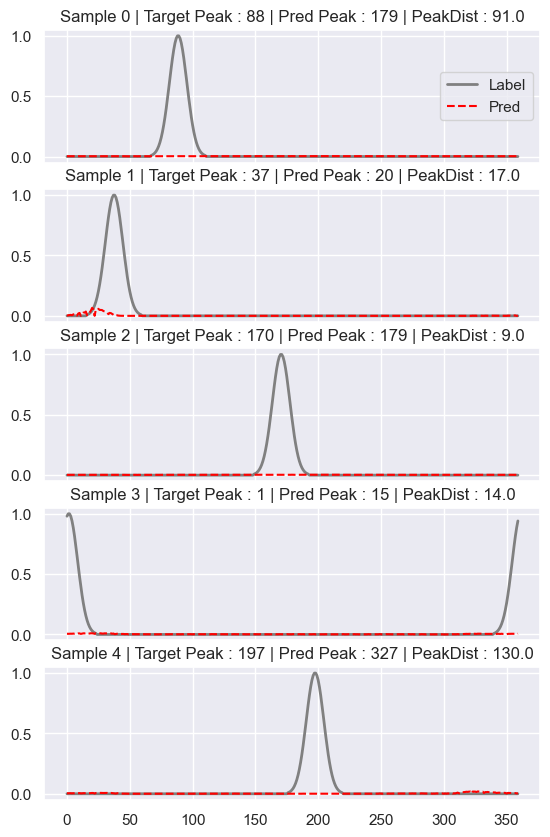

[  1   2   3   4   5   6   7   9  10  12  14  15  17  18  19  20  21  23
  24  25  26  27  28  31  32  36  40  41  42  45  47 179 256 314 316 317
 318 319 320 321 323 324 325 327 328 330 334 335 336 337 338 340 341 344
 345 347 348 349 351 352 353 355 356 357]
SAVING TO ... /its/home/nn268/antvis/antvis/optics/res_big_loop_saves/models/p3/testing/RealThing_300E_1e-4_ADAM_Eighths_[452, 144]/2c2l/


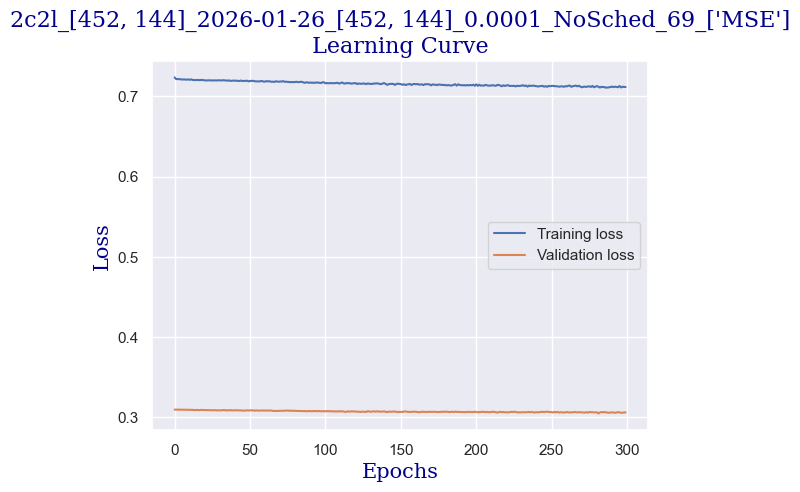

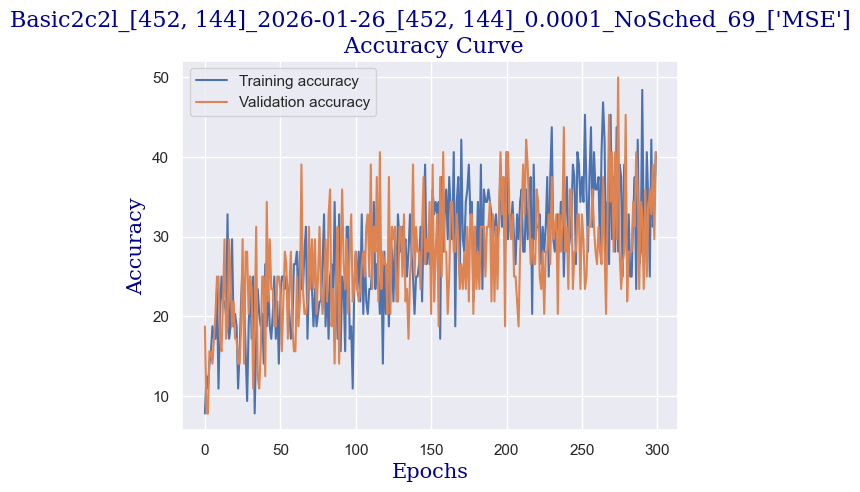

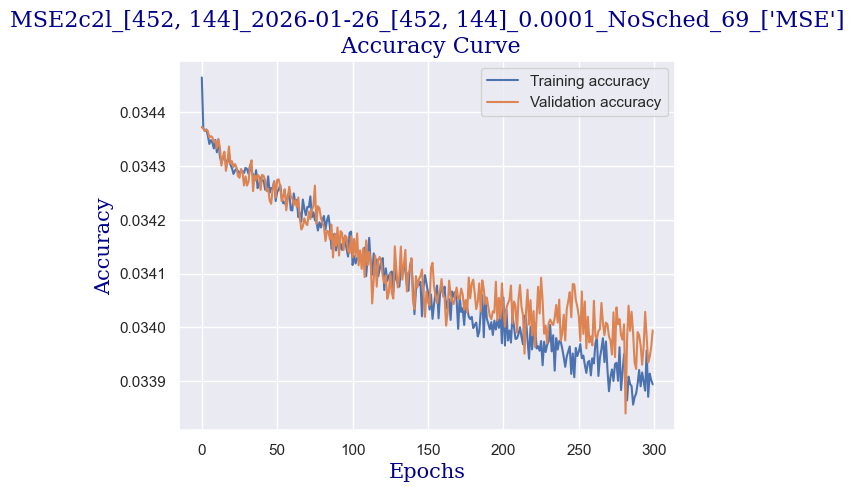

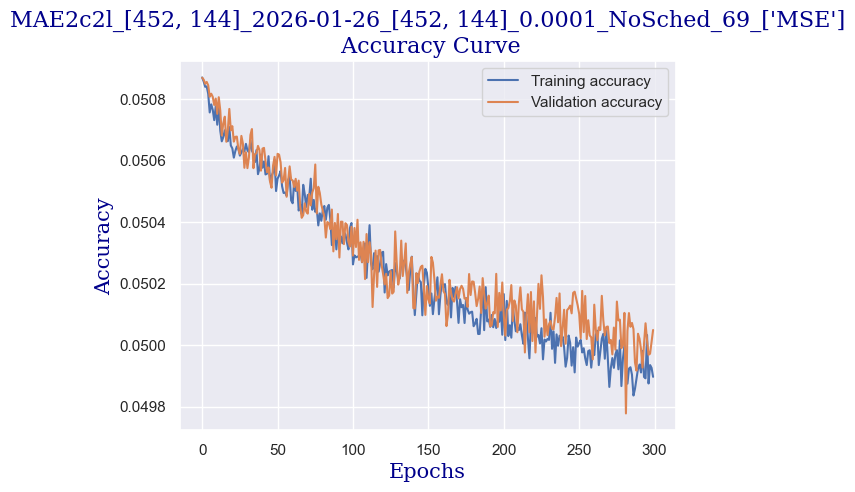

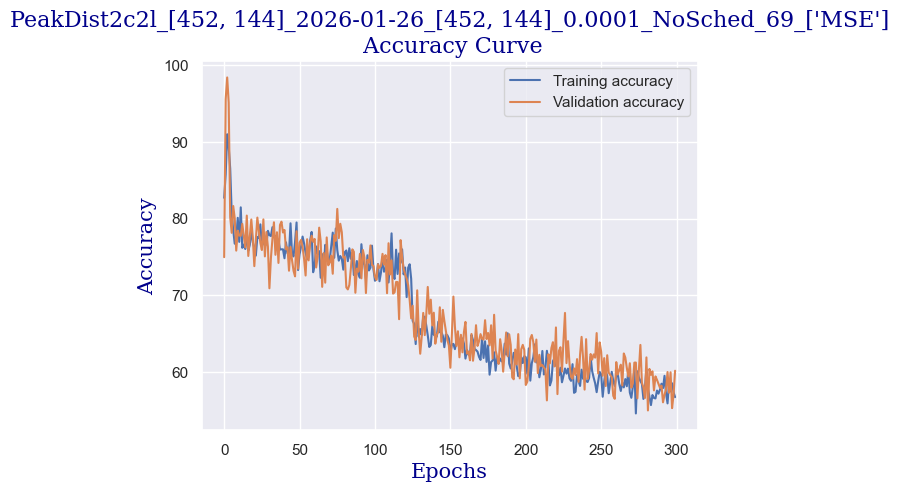

plot_confusion ACTUAL [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36]
plot_confusion PREDICTION [ 0  1  2  3  4  5 18 26 31 32 33 34 35 36]
actual  [ 1 16 32 28 18 13 24 21  4 25  8  4 22 34  1 31  6 21 32 20  9 24  4 22
 27 13  5  2  4 31  2 19 28  2 34  6 13 13  0 13 20 15 29  1  3  2 22 27
 28  6 35 19 35 11 12  4  9  8 34 32 18  1 34 12 13  4 34 24  7 14  8 27
 19  6  5  0 33  8 15  1 26  9  4 33 27  3  7  1 14  9  3 22 21 14 10 22
  3  3 23 10  8 11  0 13 32 32  5 32  8 25 21 16 22  0 15  0 20 35  1 18
 27 35 32 31 34 36 32 13 23  8  3  1  9  4 13  5 32  2 36  9 26 23 12  4
 20 24 33 31 20 33 33 25  8 32 24 21  2 34  5 35 29 24 10 17  4 33  6 36
 31 36  2  4 34 20 16  1 16  2  0  1  1 32 32 21 35 31  4  1  1 22 27 19
  0 26 34 27  4 13 14 22 31 18 26 17 16 11  4 36 25  3 34 24 25  2 20 33
  3 20 30 27 16  7 32 21 10  8  4  2 18 21 22 30 16  2 21 25  3 31 34 15
  1 27 30  4 33  0 33  1 22 20  1 34  1 36  5 33 30  4  

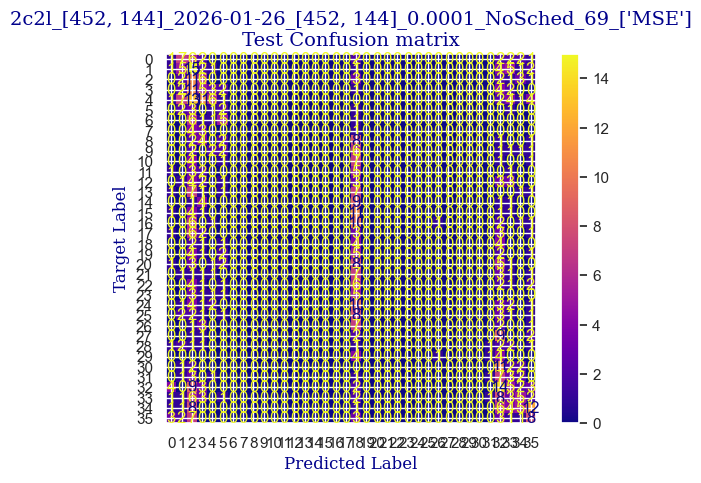

 
 END 2c2l [452, 144] Run Time:  19041.716422425


Epochs,▁
Test acc rough,▂▁▅▄▁▂▁▅▃▃▄█
TrainAcc rough,▂▃▂▃▁▁▂▂▁▁▃▃▁▂▂▃▃▂▆▂▂▆▄▃▄▅▅▄▄▃▅▃▃▅█▄▄█▅▅
ValAcc rough,▁▂▅▄▅▅▄▅▅▄▆█▆▃▅▇▆█▅▄▆▇▅▇▇█▆▇▅▅▆▅▄▆▆▅▃▄▇▇
c_epoch,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
t_loss,██▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▄▄▃▄▃▃▂▃▂▁▂▂▂▂▂▁▂▁
test_acc_MAE,▆█▁▃▇▅▅▂▄▄▂▁
test_acc_MSE,▆█▂▃█▄▅▂▂▄▃▁
test_peakDist,█▄▃▆▆█▅▄▆▄▁▁
train_err_MAE,████▇▇▇▆▇▇▇▆▅▅▇▇▃▃▅▄▅▃▄▅▄▃▄▃▃▃▃▁▃▅▃▃▄▂▃▄
+6,...


wandb: Agent Starting Run: 81jx7aqo with config:
wandb: 	batch_size: 64
wandb: 	epochs: 300
wandb: 	half_ciprange: 22
wandb: 	learning_rate: 0.0001
wandb: 	loss_fn_cards: ['MSE']
wandb: 	model_cards: [{'Ks': [3, 5], 'channels': 3, 'dropout': 0.2, 'f_lin_lay': [1032192, 255744, 62208, 14976, 3072, 640, 128], 'idx': 6, 'model': '2c2l', 'name': '2c2l'}]
wandb: 	optimiser: ['adam']
wandb: 	resolution_cards: [{'index': 0, 'padding': 5, 'resolution': [452, 144]}]
wandb: 	seeds: 69
wandb: 	std_dev: 7
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from /its/home/nn268/.netrc.


{'name': '2c2l', 'model': '2c2l', 'channels': 3, 'Ks': (3, 5), 'f_lin_lay': [1032192, 255744, 62208, 14976, 3072, 640, 128], 'idx': 6, 'dropout': 0.2}
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 1
seed:  69
loss function:  ['MSE']
Batch size:  64
Training epochs:  300
start time:  57399.871059349
Model Name 2c2l
/its/home/nn268/antvis/antvis/optics/NC_IDSW/
set_lossfn    lf  ['MSE']


  0%|                                      | 0/300 [00:00<?, ?it/s]

Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


peak dist means  89.765625
tacc:  {'baseAcc': 7.8125, 'MSE': 0.03445849283820107, 'MAE': 0.050899182756741844, 'peakDist': 89.765625}
Validating...


  0%|                              | 1/300 [00:05<29:46,  5.97s/it]

peak dist means  98.59895833333333
v loss  0.30940061807632446
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  84.24627976190476
tacc:  {'baseAcc': 6.25, 'MSE': 0.034377925984916236, 'MAE': 0.05087854589025179, 'peakDist': 84.24627976190476}
Validating...


  1%|▏                             | 2/300 [00:12<31:23,  6.32s/it]

peak dist means  77.21875
v loss  0.3093835413455963
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  88.71800595238095
tacc:  {'baseAcc': 4.6875, 'MSE': 0.03437639063312894, 'MAE': 0.05087582997622944, 'peakDist': 88.71800595238095}
Validating...


  1%|▎                             | 3/300 [00:18<31:31,  6.37s/it]

peak dist means  94.55208333333333
v loss  0.3093666210770607
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  87.5014880952381
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034373476391746885, 'MAE': 0.05086843013053849, 'peakDist': 87.5014880952381}
Validating...


  1%|▍                             | 4/300 [00:25<32:01,  6.49s/it]

peak dist means  77.17534722222223
v loss  0.30936260521411896
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  86.15848214285714
tacc:  {'baseAcc': 10.9375, 'MSE': 0.03437135528240885, 'MAE': 0.05086149860705648, 'peakDist': 86.15848214285714}
Validating...


  2%|▌                             | 5/300 [00:31<31:37,  6.43s/it]

peak dist means  76.09548611111111
v loss  0.3093448020517826
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  84.39880952380952
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03436969380293574, 'MAE': 0.050854690018154326, 'peakDist': 84.39880952380952}
Validating...


  2%|▌                             | 6/300 [00:38<32:06,  6.55s/it]

peak dist means  78.50173611111111
v loss  0.309336856007576
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  81.04389880952381
tacc:  {'baseAcc': 9.375, 'MSE': 0.03436542781335967, 'MAE': 0.05083853059581348, 'peakDist': 81.04389880952381}
Validating...


  2%|▋                             | 7/300 [00:45<32:04,  6.57s/it]

peak dist means  82.734375
v loss  0.30931005626916885
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.63541666666667
tacc:  {'baseAcc': 15.625, 'MSE': 0.034358163319882895, 'MAE': 0.050811623001382464, 'peakDist': 78.63541666666667}
Validating...


  3%|▊                             | 8/300 [00:52<32:18,  6.64s/it]

peak dist means  79.78645833333333
v loss  0.30925386399030685
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.16517857142857
tacc:  {'baseAcc': 18.75, 'MSE': 0.03436074672000749, 'MAE': 0.050804438158160166, 'peakDist': 78.16517857142857}
Validating...


  3%|▉                             | 9/300 [00:58<31:48,  6.56s/it]

peak dist means  79.25347222222223
v loss  0.30923106148838997
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.22098214285714
tacc:  {'baseAcc': 21.875, 'MSE': 0.034352914740641914, 'MAE': 0.0507866328670865, 'peakDist': 78.22098214285714}
Validating...


  3%|▉                            | 10/300 [01:05<31:36,  6.54s/it]

peak dist means  76.75868055555556
v loss  0.3091565892100334
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.38169642857143
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03435000262799717, 'MAE': 0.050782084642421635, 'peakDist': 78.38169642857143}
Validating...


  4%|█                            | 11/300 [01:11<30:57,  6.43s/it]

peak dist means  78.99479166666667
v loss  0.30911408364772797
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.73883928571429
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034335797209115254, 'MAE': 0.05074187456851914, 'peakDist': 77.73883928571429}
Validating...


  4%|█▏                           | 12/300 [01:17<30:46,  6.41s/it]

peak dist means  80.28125
v loss  0.30908919498324394
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.55282738095238
tacc:  {'baseAcc': 14.0625, 'MSE': 0.034336768622909276, 'MAE': 0.05073203057760284, 'peakDist': 77.55282738095238}
EPOCH    12 / 300:


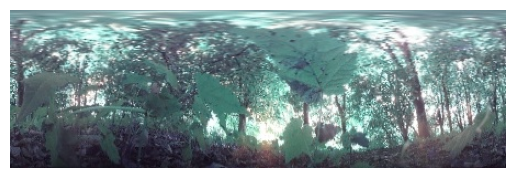

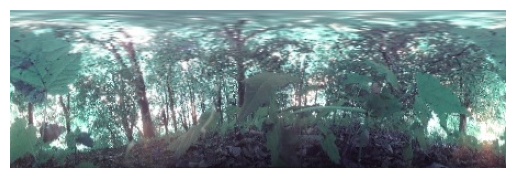

TRUE LABEL    :          168
PREDICTION    :          341
Validating...


  4%|█▎                           | 13/300 [01:23<30:29,  6.37s/it]

peak dist means  78.48611111111111
v loss  0.3091648146510124
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.12202380952381
tacc:  {'baseAcc': 15.625, 'MSE': 0.034318272379182634, 'MAE': 0.050698947871015185, 'peakDist': 77.12202380952381}
Validating...


  5%|█▎                           | 14/300 [01:30<30:39,  6.43s/it]

peak dist means  78.77604166666667
v loss  0.30902523174881935
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.77752976190476
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03432469673099972, 'MAE': 0.05070613608473823, 'peakDist': 77.77752976190476}
Validating...


  5%|█▍                           | 15/300 [01:36<29:53,  6.29s/it]

peak dist means  78.98263888888889
v loss  0.3089345470070839
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.32068452380952
tacc:  {'baseAcc': 15.625, 'MSE': 0.034308742909204396, 'MAE': 0.05067482927725429, 'peakDist': 76.32068452380952}
Validating...


  5%|█▌                           | 16/300 [01:42<29:47,  6.30s/it]

peak dist means  78.18055555555556
v loss  0.30874422937631607
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.01785714285714
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03431782019989831, 'MAE': 0.050690821948505584, 'peakDist': 79.01785714285714}
Validating...


  6%|█▋                           | 17/300 [01:48<29:28,  6.25s/it]

peak dist means  79.00694444444444
v loss  0.30901576206088066
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.69419642857143
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034312529755490165, 'MAE': 0.05067805626562664, 'peakDist': 78.69419642857143}
Validating...


  6%|█▋                           | 18/300 [01:54<29:03,  6.18s/it]

peak dist means  77.98090277777777
v loss  0.30885931476950645
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.99330357142857
tacc:  {'baseAcc': 12.5, 'MSE': 0.0343168814267431, 'MAE': 0.05069300887130555, 'peakDist': 76.99330357142857}
Validating...


  6%|█▊                           | 19/300 [02:01<29:33,  6.31s/it]

peak dist means  75.18576388888889
v loss  0.3087914437055588
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.83184523809524
tacc:  {'baseAcc': 25.0, 'MSE': 0.03432513986315046, 'MAE': 0.05071877617211569, 'peakDist': 76.83184523809524}
Validating...


  7%|█▉                           | 20/300 [02:07<29:42,  6.36s/it]

peak dist means  74.88541666666667
v loss  0.3087432384490967
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.25297619047619
tacc:  {'baseAcc': 15.625, 'MSE': 0.034318508669024424, 'MAE': 0.05070874502971059, 'peakDist': 78.25297619047619}
Validating...


  7%|██                           | 21/300 [02:14<29:57,  6.44s/it]

peak dist means  78.43229166666667
v loss  0.30878404527902603
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.49404761904762
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03431166513335137, 'MAE': 0.050687290728092194, 'peakDist': 76.49404761904762}
Validating...


  7%|██▏                          | 22/300 [02:21<29:55,  6.46s/it]

peak dist means  71.45659722222223
v loss  0.30854617804288864
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.69494047619048
tacc:  {'baseAcc': 12.5, 'MSE': 0.03430537985903876, 'MAE': 0.05066285583944548, 'peakDist': 77.69494047619048}
Validating...


  8%|██▏                          | 23/300 [02:27<29:50,  6.46s/it]

peak dist means  78.09027777777777
v loss  0.3084939196705818
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.22991071428571
tacc:  {'baseAcc': 15.625, 'MSE': 0.03428946719283149, 'MAE': 0.05063843159448533, 'peakDist': 77.22991071428571}
Validating...


  8%|██▎                          | 24/300 [02:33<29:36,  6.44s/it]

peak dist means  78.25173611111111
v loss  0.30855779349803925
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.46279761904762
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03430152187744776, 'MAE': 0.05066604983238947, 'peakDist': 79.46279761904762}
Validating...


  8%|██▍                          | 25/300 [02:40<29:48,  6.50s/it]

peak dist means  79.09027777777777
v loss  0.30867014825344086
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.9672619047619
tacc:  {'baseAcc': 21.875, 'MSE': 0.034294550794930684, 'MAE': 0.050635022953862234, 'peakDist': 76.9672619047619}
Validating...


  9%|██▌                          | 26/300 [02:47<29:41,  6.50s/it]

peak dist means  77.93923611111111
v loss  0.3086722381412983
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.39806547619048
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034292912731568016, 'MAE': 0.05063964036248979, 'peakDist': 76.39806547619048}
Validating...


  9%|██▌                          | 27/300 [02:53<29:06,  6.40s/it]

peak dist means  71.67534722222223
v loss  0.30825409293174744
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.53348214285714
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03428457783801215, 'MAE': 0.050618438848427365, 'peakDist': 76.53348214285714}
Validating...


  9%|██▋                          | 28/300 [02:59<28:25,  6.27s/it]

peak dist means  72.89409722222223
v loss  0.30835194513201714
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.2671130952381
tacc:  {'baseAcc': 28.125, 'MSE': 0.034288624567644935, 'MAE': 0.05061921299923034, 'peakDist': 76.2671130952381}
Validating...


 10%|██▊                          | 29/300 [03:05<28:10,  6.24s/it]

peak dist means  77.875
v loss  0.30863210558891296
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.46428571428571
tacc:  {'baseAcc': 25.0, 'MSE': 0.03429579646104858, 'MAE': 0.05065396215234484, 'peakDist': 78.46428571428571}
Validating...


 10%|██▉                          | 30/300 [03:11<27:39,  6.14s/it]

peak dist means  78.33506944444444
v loss  0.30867575109004974
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.69270833333333
tacc:  {'baseAcc': 15.625, 'MSE': 0.0342818745190189, 'MAE': 0.050613043208916984, 'peakDist': 78.69270833333333}
Validating...


 10%|██▉                          | 31/300 [03:17<27:33,  6.15s/it]

peak dist means  75.43055555555556
v loss  0.30830732360482216
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.11011904761905
tacc:  {'baseAcc': 12.5, 'MSE': 0.034299648233822415, 'MAE': 0.05065104347609338, 'peakDist': 79.11011904761905}
Validating...


 11%|███                          | 32/300 [03:23<27:34,  6.18s/it]

peak dist means  79.76215277777777
v loss  0.3086189292371273
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.32514880952381
tacc:  {'baseAcc': 18.75, 'MSE': 0.03426295714009376, 'MAE': 0.05056124464386985, 'peakDist': 74.32514880952381}
Validating...


 11%|███▏                         | 33/300 [03:30<27:44,  6.23s/it]

peak dist means  73.04340277777777
v loss  0.3081488125026226
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.84375
tacc:  {'baseAcc': 28.125, 'MSE': 0.034270851739815304, 'MAE': 0.05057951719278381, 'peakDist': 76.84375}
Validating...


 11%|███▎                         | 34/300 [03:36<27:38,  6.23s/it]

peak dist means  75.37326388888889
v loss  0.30826348438858986
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.34747023809524
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03429598237077395, 'MAE': 0.050641946317184536, 'peakDist': 76.34747023809524}
Validating...


 12%|███▍                         | 35/300 [03:43<28:35,  6.47s/it]

peak dist means  75.61805555555556
v loss  0.308364562690258
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.18080357142857
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03429864843686422, 'MAE': 0.05064811965539342, 'peakDist': 79.18080357142857}
Validating...


 12%|███▍                         | 36/300 [03:50<29:07,  6.62s/it]

peak dist means  73.81770833333333
v loss  0.30821801349520683
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.62202380952381
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03427446810972123, 'MAE': 0.050598137612853734, 'peakDist': 77.62202380952381}
Validating...


 12%|███▌                         | 37/300 [03:56<28:47,  6.57s/it]

peak dist means  76.06770833333333
v loss  0.308478694409132
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.93452380952381
tacc:  {'baseAcc': 25.0, 'MSE': 0.03424944373823348, 'MAE': 0.05054224300242606, 'peakDist': 74.93452380952381}
Validating...


 13%|███▋                         | 38/300 [04:03<28:17,  6.48s/it]

peak dist means  79.37847222222223
v loss  0.3085509389638901
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.55803571428571
tacc:  {'baseAcc': 14.0625, 'MSE': 0.034298324691397805, 'MAE': 0.050632410638389136, 'peakDist': 77.55803571428571}
Validating...


 13%|███▊                         | 39/300 [04:09<28:11,  6.48s/it]

peak dist means  73.41840277777777
v loss  0.3081682547926903
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.8764880952381
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03428472880096663, 'MAE': 0.05063189495177496, 'peakDist': 77.8764880952381}
Validating...


 13%|███▊                         | 40/300 [04:15<27:52,  6.43s/it]

peak dist means  78.55034722222223
v loss  0.3084187023341656
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.24627976190476
tacc:  {'baseAcc': 10.9375, 'MSE': 0.03427223896696454, 'MAE': 0.05059452904831795, 'peakDist': 77.24627976190476}
Validating...


 14%|███▉                         | 41/300 [04:21<27:21,  6.34s/it]

peak dist means  75.83680555555556
v loss  0.30833879858255386
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.34672619047619
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034267379237072806, 'MAE': 0.050578221678733826, 'peakDist': 75.34672619047619}
Validating...


 14%|████                         | 42/300 [04:28<27:07,  6.31s/it]

peak dist means  76.34722222222223
v loss  0.3081567622721195
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.19270833333333
tacc:  {'baseAcc': 18.75, 'MSE': 0.034249266875641685, 'MAE': 0.050536317307324635, 'peakDist': 74.19270833333333}
Validating...


 14%|████▏                        | 43/300 [04:34<27:07,  6.33s/it]

peak dist means  79.87673611111111
v loss  0.30835824087262154
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.05208333333333
tacc:  {'baseAcc': 28.125, 'MSE': 0.03429084395368894, 'MAE': 0.050619067890303474, 'peakDist': 79.05208333333333}
Validating...


 15%|████▎                        | 44/300 [04:40<26:35,  6.23s/it]

peak dist means  78.28298611111111
v loss  0.308473352342844
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.36309523809524
tacc:  {'baseAcc': 21.875, 'MSE': 0.03424827169094767, 'MAE': 0.050532422782409755, 'peakDist': 75.36309523809524}
Validating...


 15%|████▎                        | 45/300 [04:46<26:30,  6.24s/it]

peak dist means  72.42708333333333
v loss  0.30805061012506485
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.62946428571429
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03427085120763097, 'MAE': 0.05059142073705083, 'peakDist': 76.62946428571429}
Validating...


 15%|████▍                        | 46/300 [04:53<26:21,  6.23s/it]

peak dist means  76.59548611111111
v loss  0.3083725906908512
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.94791666666667
tacc:  {'baseAcc': 14.0625, 'MSE': 0.0342765748500824, 'MAE': 0.05058072933128902, 'peakDist': 75.94791666666667}
Validating...


 16%|████▌                        | 47/300 [04:59<26:19,  6.24s/it]

peak dist means  75.01041666666667
v loss  0.308321263641119
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.42559523809524
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03424656284706933, 'MAE': 0.050525197493178506, 'peakDist': 73.42559523809524}
Validating...


 16%|████▋                        | 48/300 [05:05<26:28,  6.30s/it]

peak dist means  74.33854166666667
v loss  0.3082205206155777
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.46875
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03427019626611755, 'MAE': 0.050586858143409096, 'peakDist': 76.46875}
Validating...


 16%|████▋                        | 49/300 [05:12<27:18,  6.53s/it]

peak dist means  78.22916666666667
v loss  0.3083663247525692
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.50967261904762
tacc:  {'baseAcc': 18.75, 'MSE': 0.03426729603892281, 'MAE': 0.0505784246183577, 'peakDist': 76.50967261904762}
Validating...


 17%|████▊                        | 50/300 [05:19<27:40,  6.64s/it]

peak dist means  79.04513888888889
v loss  0.3085631839931011
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.06324404761905
tacc:  {'baseAcc': 21.875, 'MSE': 0.03426442046960195, 'MAE': 0.05057419818781671, 'peakDist': 75.06324404761905}
Validating...


 17%|████▉                        | 51/300 [05:26<27:17,  6.58s/it]

peak dist means  76.13194444444444
v loss  0.30829593539237976
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  80.15922619047619
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03425876530153411, 'MAE': 0.050564352777742204, 'peakDist': 80.15922619047619}
Validating...


 17%|█████                        | 52/300 [05:33<27:40,  6.70s/it]

peak dist means  75.60069444444444
v loss  0.30832015722990036
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.92633928571429
tacc:  {'baseAcc': 25.0, 'MSE': 0.034267498091572805, 'MAE': 0.05059379623049781, 'peakDist': 76.92633928571429}
Validating...


 18%|█████                        | 53/300 [05:39<27:17,  6.63s/it]

peak dist means  71.80381944444444
v loss  0.30804506689310074
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.80431547619048
tacc:  {'baseAcc': 15.625, 'MSE': 0.034270345455124265, 'MAE': 0.05059462838939258, 'peakDist': 77.80431547619048}
Validating...


 18%|█████▏                       | 54/300 [05:45<26:47,  6.53s/it]

peak dist means  72.70138888888889
v loss  0.30821431800723076
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.5625
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03422964878735088, 'MAE': 0.050487042005573, 'peakDist': 72.5625}
Validating...


 18%|█████▎                       | 55/300 [05:52<26:45,  6.55s/it]

peak dist means  71.95833333333333
v loss  0.3078644759953022
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.95535714285714
tacc:  {'baseAcc': 21.875, 'MSE': 0.034258679974646794, 'MAE': 0.05055777604381243, 'peakDist': 75.95535714285714}
Validating...


 19%|█████▍                       | 56/300 [05:58<26:30,  6.52s/it]

peak dist means  69.65104166666667
v loss  0.30813366174697876
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.80059523809524
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03424353187992459, 'MAE': 0.05052380157368524, 'peakDist': 73.80059523809524}
Validating...


 19%|█████▌                       | 57/300 [06:05<26:12,  6.47s/it]

peak dist means  73.97222222222223
v loss  0.30820294842123985
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.94642857142857
tacc:  {'baseAcc': 31.25, 'MSE': 0.03424362572176116, 'MAE': 0.05052400575507255, 'peakDist': 73.94642857142857}
Validating...


 19%|█████▌                       | 58/300 [06:11<25:54,  6.43s/it]

peak dist means  75.82986111111111
v loss  0.30827176198363304
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.33779761904762
tacc:  {'baseAcc': 21.875, 'MSE': 0.03423970476502464, 'MAE': 0.05051500030926296, 'peakDist': 74.33779761904762}
Validating...


 20%|█████▋                       | 59/300 [06:17<25:00,  6.23s/it]

peak dist means  75.54340277777777
v loss  0.3083341456949711
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.84375
tacc:  {'baseAcc': 18.75, 'MSE': 0.0342433661932037, 'MAE': 0.05051927144328753, 'peakDist': 74.84375}
Validating...


 20%|█████▊                       | 60/300 [06:23<24:41,  6.17s/it]

peak dist means  78.21875
v loss  0.3081650137901306
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.51190476190476
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03426651408274969, 'MAE': 0.05058507550330389, 'peakDist': 75.51190476190476}
Validating...


 20%|█████▉                       | 61/300 [06:29<24:43,  6.21s/it]

peak dist means  72.08680555555556
v loss  0.3080081529915333
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.94494047619048
tacc:  {'baseAcc': 25.0, 'MSE': 0.03421932618532862, 'MAE': 0.05046562548904192, 'peakDist': 73.94494047619048}
Validating...


 21%|█████▉                       | 62/300 [06:36<24:53,  6.27s/it]

peak dist means  75.28819444444444
v loss  0.30794890224933624
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.10416666666667
tacc:  {'baseAcc': 21.875, 'MSE': 0.03423839399502391, 'MAE': 0.05051745225985845, 'peakDist': 77.10416666666667}
Validating...


 21%|██████                       | 63/300 [06:42<25:18,  6.41s/it]

peak dist means  75.10069444444444
v loss  0.3083100840449333
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.47172619047619
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034240196503344034, 'MAE': 0.050533752533651534, 'peakDist': 75.47172619047619}
Validating...


 21%|██████▏                      | 64/300 [06:49<25:18,  6.43s/it]

peak dist means  77.69270833333333
v loss  0.3079785667359829
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.16815476190476
tacc:  {'baseAcc': 28.125, 'MSE': 0.03420997144920485, 'MAE': 0.050447849822895866, 'peakDist': 72.16815476190476}
Validating...


 22%|██████▎                      | 65/300 [06:53<22:54,  5.85s/it]

peak dist means  73.55555555555556
v loss  0.3078279122710228
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.04464285714286
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03422874265483448, 'MAE': 0.050487792562870754, 'peakDist': 74.04464285714286}
Validating...


 22%|██████▍                      | 66/300 [06:58<20:57,  5.37s/it]

peak dist means  73.05555555555556
v loss  0.3075234442949295
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.57589285714286
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034229313333829246, 'MAE': 0.05050393052044369, 'peakDist': 75.57589285714286}
Validating...


 22%|██████▍                      | 67/300 [07:02<19:55,  5.13s/it]

peak dist means  74.42881944444444
v loss  0.30792198702692986
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.77604166666667
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034219962145601, 'MAE': 0.050481257161923816, 'peakDist': 74.77604166666667}
Validating...


 23%|██████▌                      | 68/300 [07:09<21:29,  5.56s/it]

peak dist means  73.03125
v loss  0.30778901278972626
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.0453869047619
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03422161138483456, 'MAE': 0.05047294603926795, 'peakDist': 76.0453869047619}
Validating...


 23%|██████▋                      | 69/300 [07:15<22:33,  5.86s/it]

peak dist means  73.93402777777777
v loss  0.30796539038419724
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.23214285714286
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03422723710536957, 'MAE': 0.05048211380129769, 'peakDist': 73.23214285714286}
Validating...


 23%|██████▊                      | 70/300 [07:22<23:04,  6.02s/it]

peak dist means  74.63888888888889
v loss  0.3080783933401108
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.66294642857143
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03422424339112781, 'MAE': 0.05049454278889157, 'peakDist': 76.66294642857143}
Validating...


 24%|██████▊                      | 71/300 [07:29<24:10,  6.33s/it]

peak dist means  70.27604166666667
v loss  0.30752021446824074
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.22693452380952
tacc:  {'baseAcc': 21.875, 'MSE': 0.034224512321608405, 'MAE': 0.050500981687080296, 'peakDist': 77.22693452380952}
Validating...


 24%|██████▉                      | 72/300 [07:36<24:45,  6.51s/it]

peak dist means  76.56423611111111
v loss  0.30814990773797035
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.99032738095238
tacc:  {'baseAcc': 9.375, 'MSE': 0.03423036741358893, 'MAE': 0.05050175459611984, 'peakDist': 75.99032738095238}
Validating...


 24%|███████                      | 73/300 [07:42<24:38,  6.51s/it]

peak dist means  76.66840277777777
v loss  0.30821842327713966
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.07068452380952
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03422167063468978, 'MAE': 0.05047177860424632, 'peakDist': 75.07068452380952}
Validating...


 25%|███████▏                     | 74/300 [07:49<24:53,  6.61s/it]

peak dist means  68.62152777777777
v loss  0.30763930827379227
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.2953869047619
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03424150975687163, 'MAE': 0.05053418023245675, 'peakDist': 77.2953869047619}
Validating...


 25%|███████▎                     | 75/300 [07:55<24:37,  6.57s/it]

peak dist means  72.859375
v loss  0.30782032012939453
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.30877976190476
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034220559965996517, 'MAE': 0.050488809389727454, 'peakDist': 77.30877976190476}
Validating...


 25%|███████▎                     | 76/300 [08:02<24:37,  6.60s/it]

peak dist means  75.26388888888889
v loss  0.30767256394028664
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.84970238095238
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03422178931179501, 'MAE': 0.05047659966207686, 'peakDist': 74.84970238095238}
Validating...


 26%|███████▍                     | 77/300 [08:09<24:19,  6.55s/it]

peak dist means  72.99479166666667
v loss  0.30785947665572166
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.30729166666667
tacc:  {'baseAcc': 18.75, 'MSE': 0.03423704756867318, 'MAE': 0.0505220971646763, 'peakDist': 76.30729166666667}
Validating...


 26%|███████▌                     | 78/300 [08:15<24:01,  6.49s/it]

peak dist means  72.38888888888889
v loss  0.30776507407426834
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.86681547619048
tacc:  {'baseAcc': 18.75, 'MSE': 0.034212516532057806, 'MAE': 0.05046524284850983, 'peakDist': 73.86681547619048}
Validating...


 26%|███████▋                     | 79/300 [08:21<23:30,  6.38s/it]

peak dist means  77.48958333333333
v loss  0.3081041947007179
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.79315476190476
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03421097585842723, 'MAE': 0.050479456782341, 'peakDist': 75.79315476190476}
Validating...


 27%|███████▋                     | 80/300 [08:27<23:08,  6.31s/it]

peak dist means  73.60243055555556
v loss  0.30758022516965866
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.37872023809524
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03421688594278835, 'MAE': 0.05046278717262404, 'peakDist': 77.37872023809524}
Validating...


 27%|███████▊                     | 81/300 [08:33<23:00,  6.30s/it]

peak dist means  72.56597222222223
v loss  0.3076310344040394
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.33705357142857
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03421138564036006, 'MAE': 0.05045608200487636, 'peakDist': 75.33705357142857}
Validating...


 27%|███████▉                     | 82/300 [08:40<23:02,  6.34s/it]

peak dist means  75.07986111111111
v loss  0.3078239895403385
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.18526785714286
tacc:  {'baseAcc': 28.125, 'MSE': 0.03418095817878133, 'MAE': 0.050404150038957596, 'peakDist': 74.18526785714286}
Validating...


 28%|████████                     | 83/300 [08:46<22:52,  6.32s/it]

peak dist means  75.47916666666667
v loss  0.3076377436518669
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.79092261904762
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034223364754801706, 'MAE': 0.05047807807014102, 'peakDist': 75.79092261904762}
Validating...


 28%|████████                     | 84/300 [08:53<23:03,  6.41s/it]

peak dist means  72.14236111111111
v loss  0.30757639184594154
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.50297619047619
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03417372756770679, 'MAE': 0.05038109049201012, 'peakDist': 74.50297619047619}
Validating...


 28%|████████▏                    | 85/300 [08:59<22:38,  6.32s/it]

peak dist means  71.63888888888889
v loss  0.3076426275074482
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.13541666666667
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034230275523094905, 'MAE': 0.0505151455955846, 'peakDist': 78.13541666666667}
Validating...


 29%|████████▎                    | 86/300 [09:05<22:29,  6.31s/it]

peak dist means  76.26909722222223
v loss  0.30773812532424927
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.24032738095238
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03418908055339541, 'MAE': 0.05040886093463216, 'peakDist': 77.24032738095238}
Validating...


 29%|████████▍                    | 87/300 [09:12<22:37,  6.37s/it]

peak dist means  74.90625
v loss  0.3076545149087906
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.66666666666667
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03419409621329535, 'MAE': 0.05042407963247526, 'peakDist': 75.66666666666667}
Validating...


 29%|████████▌                    | 88/300 [09:18<22:54,  6.48s/it]

peak dist means  80.40625
v loss  0.307961817830801
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.86904761904762
tacc:  {'baseAcc': 21.875, 'MSE': 0.03419023432901928, 'MAE': 0.050419368382011144, 'peakDist': 73.86904761904762}
Validating...


 30%|████████▌                    | 89/300 [09:25<22:25,  6.38s/it]

peak dist means  73.14236111111111
v loss  0.3076937608420849
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.94494047619048
tacc:  {'baseAcc': 26.5625, 'MSE': 0.0341662707782927, 'MAE': 0.050380896422125045, 'peakDist': 74.94494047619048}
Validating...


 30%|████████▋                    | 90/300 [09:31<22:30,  6.43s/it]

peak dist means  70.515625
v loss  0.3072894923388958
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.6889880952381
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03423971186081568, 'MAE': 0.05052579708752178, 'peakDist': 79.6889880952381}
Validating...


 30%|████████▊                    | 91/300 [09:38<22:42,  6.52s/it]

peak dist means  78.35590277777777
v loss  0.3077790103852749
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.6875
tacc:  {'baseAcc': 21.875, 'MSE': 0.03418969203318868, 'MAE': 0.050414541824942545, 'peakDist': 75.6875}
Validating...


 31%|████████▉                    | 92/300 [09:44<22:41,  6.55s/it]

peak dist means  72.41840277777777
v loss  0.3074375167489052
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.01264880952381
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03422340307207335, 'MAE': 0.05047202500559035, 'peakDist': 74.01264880952381}
Validating...


 31%|████████▉                    | 93/300 [09:51<22:11,  6.43s/it]

peak dist means  73.51909722222223
v loss  0.30781015008687973
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.57440476190476
tacc:  {'baseAcc': 20.3125, 'MSE': 0.0342080101725601, 'MAE': 0.05046976623790605, 'peakDist': 75.57440476190476}
Validating...


 31%|█████████                    | 94/300 [09:57<22:04,  6.43s/it]

peak dist means  69.08680555555556
v loss  0.30778996646404266
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.72321428571429
tacc:  {'baseAcc': 21.875, 'MSE': 0.03419129656893866, 'MAE': 0.050435698280731835, 'peakDist': 77.72321428571429}
Validating...


 32%|█████████▏                   | 95/300 [10:03<21:44,  6.36s/it]

peak dist means  74.86284722222223
v loss  0.30769025906920433
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.35267857142857
tacc:  {'baseAcc': 7.8125, 'MSE': 0.034209507916654856, 'MAE': 0.05046164049279122, 'peakDist': 75.35267857142857}
Validating...


 32%|█████████▎                   | 96/300 [10:10<21:39,  6.37s/it]

peak dist means  73.13020833333333
v loss  0.3074876256287098
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.96428571428571
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03421203029297647, 'MAE': 0.050476232632285074, 'peakDist': 73.96428571428571}
Validating...


 32%|█████████▍                   | 97/300 [10:16<21:14,  6.28s/it]

peak dist means  71.66145833333333
v loss  0.3076508268713951
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.74627976190476
tacc:  {'baseAcc': 18.75, 'MSE': 0.03419081299077897, 'MAE': 0.05041973612138203, 'peakDist': 73.74627976190476}
Validating...


 33%|█████████▍                   | 98/300 [10:22<21:12,  6.30s/it]

peak dist means  75.55729166666667
v loss  0.3076321892440319
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.60267857142857
tacc:  {'baseAcc': 15.625, 'MSE': 0.034192302219924475, 'MAE': 0.05043416647684006, 'peakDist': 75.60267857142857}
Validating...


 33%|█████████▌                   | 99/300 [10:28<20:50,  6.22s/it]

peak dist means  75.37673611111111
v loss  0.30770307406783104
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.80208333333333
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03419079649306479, 'MAE': 0.050418916380121595, 'peakDist': 76.80208333333333}
Validating...


 33%|█████████▎                  | 100/300 [10:34<20:50,  6.25s/it]

peak dist means  74.39756944444444
v loss  0.307400394231081
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.37797619047619
tacc:  {'baseAcc': 15.625, 'MSE': 0.0341832045288313, 'MAE': 0.05039350244970549, 'peakDist': 74.37797619047619}
Validating...


 34%|█████████▍                  | 101/300 [10:41<20:39,  6.23s/it]

peak dist means  72.60763888888889
v loss  0.3072497919201851
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.36979166666667
tacc:  {'baseAcc': 18.75, 'MSE': 0.034202928167013896, 'MAE': 0.050447099265598115, 'peakDist': 75.36979166666667}
Validating...


 34%|█████████▌                  | 102/300 [10:47<20:45,  6.29s/it]

peak dist means  75.44618055555556
v loss  0.30744577571749687
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.92559523809524
tacc:  {'baseAcc': 31.25, 'MSE': 0.03418687535893349, 'MAE': 0.0504176075614634, 'peakDist': 75.92559523809524}
Validating...


 34%|█████████▌                  | 103/300 [10:54<20:50,  6.35s/it]

peak dist means  76.54861111111111
v loss  0.3075004108250141
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.38020833333333
tacc:  {'baseAcc': 21.875, 'MSE': 0.03420376795388404, 'MAE': 0.05043920448848179, 'peakDist': 75.38020833333333}
Validating...


 35%|█████████▋                  | 104/300 [11:00<21:07,  6.47s/it]

peak dist means  75.08159722222223
v loss  0.30737291276454926
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.1860119047619
tacc:  {'baseAcc': 21.875, 'MSE': 0.03417548395338513, 'MAE': 0.05038942875606673, 'peakDist': 75.1860119047619}
Validating...


 35%|█████████▊                  | 105/300 [11:07<21:15,  6.54s/it]

peak dist means  72.74305555555556
v loss  0.30768386274576187
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.63318452380952
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034200614406949, 'MAE': 0.05044868588447571, 'peakDist': 77.63318452380952}
Validating...


 35%|█████████▉                  | 106/300 [11:14<21:16,  6.58s/it]

peak dist means  74.27604166666667
v loss  0.3075091168284416
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.4516369047619
tacc:  {'baseAcc': 21.875, 'MSE': 0.03414845927840188, 'MAE': 0.050344272915806086, 'peakDist': 74.4516369047619}
Validating...


 36%|█████████▉                  | 107/300 [11:20<21:08,  6.57s/it]

peak dist means  73.42534722222223
v loss  0.3071848899126053
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.75744047619048
tacc:  {'baseAcc': 21.875, 'MSE': 0.03416423872113228, 'MAE': 0.05036803973572595, 'peakDist': 74.75744047619048}
Validating...


 36%|██████████                  | 108/300 [11:26<20:22,  6.37s/it]

peak dist means  76.94270833333333
v loss  0.30760856717824936
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.86532738095238
tacc:  {'baseAcc': 28.125, 'MSE': 0.034171403518744876, 'MAE': 0.05036570983273642, 'peakDist': 73.86532738095238}
Validating...


 36%|██████████▏                 | 109/300 [11:32<19:56,  6.27s/it]

peak dist means  70.27256944444444
v loss  0.3069348558783531
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.02827380952381
tacc:  {'baseAcc': 18.75, 'MSE': 0.03420571273281461, 'MAE': 0.050444863914024266, 'peakDist': 76.02827380952381}
Validating...


 37%|██████████▎                 | 110/300 [11:38<19:53,  6.28s/it]

peak dist means  74.46006944444444
v loss  0.3074159175157547
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.79464285714286
tacc:  {'baseAcc': 15.625, 'MSE': 0.03417022632701056, 'MAE': 0.050383880557048885, 'peakDist': 75.79464285714286}
Validating...


 37%|██████████▎                 | 111/300 [11:45<19:44,  6.27s/it]

peak dist means  69.82118055555556
v loss  0.30711881816387177
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.3764880952381
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034166618649448664, 'MAE': 0.05037333337324006, 'peakDist': 72.3764880952381}
Validating...


 37%|██████████▍                 | 112/300 [11:51<19:30,  6.22s/it]

peak dist means  73.09722222222223
v loss  0.3072437681257725
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.7046130952381
tacc:  {'baseAcc': 18.75, 'MSE': 0.03417427358882768, 'MAE': 0.050394417806750254, 'peakDist': 76.7046130952381}
Validating...


 38%|██████████▌                 | 113/300 [11:57<19:18,  6.19s/it]

peak dist means  74.83680555555556
v loss  0.30736781284213066
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.21205357142857
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03417991562968209, 'MAE': 0.0503876211032981, 'peakDist': 74.21205357142857}
Validating...


 38%|██████████▋                 | 114/300 [12:04<19:41,  6.35s/it]

peak dist means  76.73958333333333
v loss  0.3076367489993572
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.625
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03416278816404797, 'MAE': 0.0503644123673439, 'peakDist': 73.625}
Validating...


 38%|██████████▋                 | 115/300 [12:10<19:37,  6.37s/it]

peak dist means  72.91319444444444
v loss  0.30715087056159973
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.03869047619048
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03416311705396289, 'MAE': 0.050367879548243115, 'peakDist': 74.03869047619048}
Validating...


 39%|██████████▊                 | 116/300 [12:17<19:47,  6.45s/it]

peak dist means  68.44965277777777
v loss  0.30684154108166695
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.68303571428571
tacc:  {'baseAcc': 21.875, 'MSE': 0.034181533115250726, 'MAE': 0.050400008935303914, 'peakDist': 74.68303571428571}
Validating...


 39%|██████████▉                 | 117/300 [12:24<20:01,  6.57s/it]

peak dist means  73.11979166666667
v loss  0.307238444685936
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.59821428571429
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034167290798255374, 'MAE': 0.05037322179192588, 'peakDist': 73.59821428571429}
Validating...


 39%|███████████                 | 118/300 [12:30<20:00,  6.59s/it]

peak dist means  68.48090277777777
v loss  0.3069932833313942
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.43229166666667
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034173310157798585, 'MAE': 0.05037570602837063, 'peakDist': 75.43229166666667}
Validating...


 40%|███████████                 | 119/300 [12:37<19:59,  6.63s/it]

peak dist means  73.36111111111111
v loss  0.30730268731713295
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.81622023809524
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03416738517227627, 'MAE': 0.0503712555482274, 'peakDist': 75.81622023809524}
Validating...


 40%|███████████▏                | 120/300 [12:43<19:39,  6.55s/it]

peak dist means  71.70138888888889
v loss  0.3069615699350834
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.14955357142857
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03418069652148655, 'MAE': 0.05039832652324722, 'peakDist': 74.14955357142857}
Validating...


 40%|███████████▎                | 121/300 [12:50<19:36,  6.57s/it]

peak dist means  74.39409722222223
v loss  0.30732809752225876
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.90327380952381
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03413959361967586, 'MAE': 0.050332547298499515, 'peakDist': 73.90327380952381}
Validating...


 41%|███████████▍                | 122/300 [12:56<19:14,  6.48s/it]

peak dist means  73.01388888888889
v loss  0.30777692049741745
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.92113095238095
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03413922428375199, 'MAE': 0.050301521306946165, 'peakDist': 72.92113095238095}
Validating...


 41%|███████████▍                | 123/300 [13:02<18:48,  6.38s/it]

peak dist means  71.93923611111111
v loss  0.3070581890642643
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.64285714285714
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03417711917843137, 'MAE': 0.050398796264614375, 'peakDist': 75.64285714285714}
Validating...


 41%|███████████▌                | 124/300 [13:08<18:23,  6.27s/it]

peak dist means  70.31944444444444
v loss  0.30703279748559
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.90699404761905
tacc:  {'baseAcc': 17.1875, 'MSE': 0.0341949819454125, 'MAE': 0.05044488945887202, 'peakDist': 76.90699404761905}
Validating...


 42%|███████████▋                | 125/300 [13:15<18:21,  6.29s/it]

peak dist means  73.625
v loss  0.30741631239652634
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.08779761904762
tacc:  {'baseAcc': 15.625, 'MSE': 0.034175076122794835, 'MAE': 0.0503808737155937, 'peakDist': 75.08779761904762}
Validating...


 42%|███████████▊                | 126/300 [13:21<18:16,  6.30s/it]

peak dist means  71.83680555555556
v loss  0.30728599429130554
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.70982142857143
tacc:  {'baseAcc': 18.75, 'MSE': 0.034141085332348234, 'MAE': 0.050320830373536976, 'peakDist': 75.70982142857143}
Validating...


 42%|███████████▊                | 127/300 [13:27<18:08,  6.29s/it]

peak dist means  67.71875
v loss  0.30694644153118134
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.13764880952381
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034167829723585216, 'MAE': 0.05039125237436522, 'peakDist': 77.13764880952381}
Validating...


 43%|███████████▉                | 128/300 [13:33<17:52,  6.23s/it]

peak dist means  77.51736111111111
v loss  0.30776015669107437
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.84002976190476
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034210472057263054, 'MAE': 0.0504720892224993, 'peakDist': 76.84002976190476}
Validating...


 43%|████████████                | 129/300 [13:40<18:16,  6.41s/it]

peak dist means  71.59027777777777
v loss  0.3074803538620472
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.97470238095238
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03417198803453218, 'MAE': 0.05038403968016306, 'peakDist': 75.97470238095238}
Validating...


 43%|████████████▏               | 130/300 [13:47<18:12,  6.43s/it]

peak dist means  74.38541666666667
v loss  0.30753131583333015
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.83779761904762
tacc:  {'baseAcc': 21.875, 'MSE': 0.03415832704021817, 'MAE': 0.050336905533359164, 'peakDist': 73.83779761904762}
Validating...


 44%|████████████▏               | 131/300 [13:53<17:55,  6.36s/it]

peak dist means  68.875
v loss  0.3070935606956482
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.99627976190476
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03419863272990499, 'MAE': 0.050422397397813346, 'peakDist': 74.99627976190476}
Validating...


 44%|████████████▎               | 132/300 [13:59<17:46,  6.35s/it]

peak dist means  69.49826388888889
v loss  0.3071165755391121
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.71800595238095
tacc:  {'baseAcc': 28.125, 'MSE': 0.034148196911528, 'MAE': 0.050337016937278566, 'peakDist': 69.71800595238095}
Validating...


 44%|████████████▍               | 133/300 [14:06<17:52,  6.42s/it]

peak dist means  65.41493055555556
v loss  0.3071509450674057
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.5297619047619
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034157568854945045, 'MAE': 0.050366654459919245, 'peakDist': 67.5297619047619}
Validating...


 45%|████████████▌               | 134/300 [14:12<17:47,  6.43s/it]

peak dist means  59.439236111111114
v loss  0.30725765973329544
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.11755952380952
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03415716013738087, 'MAE': 0.05036121748742603, 'peakDist': 67.11755952380952}
Validating...


 45%|████████████▌               | 135/300 [14:18<17:32,  6.38s/it]

peak dist means  60.904513888888886
v loss  0.3071829825639725
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.96577380952381
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03417047556667101, 'MAE': 0.050393652880475634, 'peakDist': 67.96577380952381}
Validating...


 45%|████████████▋               | 136/300 [14:25<17:11,  6.29s/it]

peak dist means  64.33506944444444
v loss  0.30770230293273926
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.34598214285714
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03414731916217577, 'MAE': 0.05034799128770828, 'peakDist': 69.34598214285714}
Validating...


 46%|████████████▊               | 137/300 [14:31<17:01,  6.26s/it]

peak dist means  65.15798611111111
v loss  0.3073010854423046
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.96502976190476
tacc:  {'baseAcc': 31.25, 'MSE': 0.034166473895311356, 'MAE': 0.05039089793960253, 'peakDist': 69.96502976190476}
Validating...


 46%|████████████▉               | 138/300 [14:37<16:48,  6.23s/it]

peak dist means  59.84375
v loss  0.30709386244416237
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.99925595238095
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03417542346176647, 'MAE': 0.050383422346342174, 'peakDist': 65.99925595238095}
Validating...


 46%|████████████▉               | 139/300 [14:43<16:20,  6.09s/it]

peak dist means  63.08680555555556
v loss  0.3072373829782009
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.97470238095238
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03414929356603395, 'MAE': 0.05035038611718586, 'peakDist': 66.97470238095238}
Validating...


 47%|█████████████               | 140/300 [14:49<16:30,  6.19s/it]

peak dist means  61.42534722222222
v loss  0.30691228061914444
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.21056547619048
tacc:  {'baseAcc': 35.9375, 'MSE': 0.034137852844737825, 'MAE': 0.05029350767532984, 'peakDist': 66.21056547619048}
Validating...


 47%|█████████████▏              | 141/300 [14:55<16:34,  6.25s/it]

peak dist means  62.765625
v loss  0.3070437014102936
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.63541666666667
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034147855781373526, 'MAE': 0.05032210389063472, 'peakDist': 66.63541666666667}
Validating...


 47%|█████████████▎              | 142/300 [15:02<16:59,  6.45s/it]

peak dist means  65.57986111111111
v loss  0.30707085132598877
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.42113095238095
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03413282565417744, 'MAE': 0.05031180736564454, 'peakDist': 67.42113095238095}
Validating...


 48%|█████████████▎              | 143/300 [15:09<16:57,  6.48s/it]

peak dist means  62.61284722222222
v loss  0.3069590628147125
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.5952380952381
tacc:  {'baseAcc': 21.875, 'MSE': 0.03413041592353866, 'MAE': 0.05029776834306263, 'peakDist': 65.5952380952381}
Validating...


 48%|█████████████▍              | 144/300 [15:16<17:09,  6.60s/it]

peak dist means  59.97222222222222
v loss  0.3073209822177887
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.02306547619048
tacc:  {'baseAcc': 26.5625, 'MSE': 0.0341528934382257, 'MAE': 0.05035492369816417, 'peakDist': 66.02306547619048}
Validating...


 48%|█████████████▌              | 145/300 [15:23<17:22,  6.72s/it]

peak dist means  61.510416666666664
v loss  0.3067284971475601
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.95684523809524
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034131129582722984, 'MAE': 0.05029130372263137, 'peakDist': 65.95684523809524}
Validating...


 49%|█████████████▋              | 146/300 [15:30<17:14,  6.72s/it]

peak dist means  63.46180555555556
v loss  0.30742650106549263
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.84821428571429
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03411579132080078, 'MAE': 0.0502758091759114, 'peakDist': 65.84821428571429}
Validating...


 49%|█████████████▋              | 147/300 [15:36<17:08,  6.72s/it]

peak dist means  61.885416666666664
v loss  0.30707308650016785
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.24181547619048
tacc:  {'baseAcc': 34.375, 'MSE': 0.034135552566675914, 'MAE': 0.050321033490555625, 'peakDist': 66.24181547619048}
Validating...


 49%|█████████████▊              | 148/300 [15:43<16:40,  6.58s/it]

peak dist means  58.760416666666664
v loss  0.3065997250378132
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.81547619047619
tacc:  {'baseAcc': 28.125, 'MSE': 0.03410565143539792, 'MAE': 0.05025694270928701, 'peakDist': 64.81547619047619}
Validating...


 50%|█████████████▉              | 149/300 [15:49<16:28,  6.55s/it]

peak dist means  66.4375
v loss  0.30723026022315025
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.99627976190476
tacc:  {'baseAcc': 18.75, 'MSE': 0.034136620128438586, 'MAE': 0.05032590546068691, 'peakDist': 66.99627976190476}
Validating...


 50%|██████████████              | 150/300 [15:55<16:04,  6.43s/it]

peak dist means  59.345486111111114
v loss  0.30644021183252335
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.42931547619048
tacc:  {'baseAcc': 23.4375, 'MSE': 0.0341516188567593, 'MAE': 0.05033969542100316, 'peakDist': 66.42931547619048}
Validating...


 50%|██████████████              | 151/300 [16:01<15:52,  6.39s/it]

peak dist means  65.578125
v loss  0.30719930306077003
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.10119047619048
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03412832851920809, 'MAE': 0.0502979386420477, 'peakDist': 67.10119047619048}
Validating...


 51%|██████████████▏             | 152/300 [16:08<15:37,  6.33s/it]

peak dist means  61.91840277777778
v loss  0.3066113665699959
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.09077380952381
tacc:  {'baseAcc': 25.0, 'MSE': 0.034148674635660084, 'MAE': 0.050335909106901715, 'peakDist': 67.09077380952381}
Validating...


 51%|██████████████▎             | 153/300 [16:14<15:24,  6.29s/it]

peak dist means  63.83506944444444
v loss  0.30729104205965996
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  68.77752976190476
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03416384437254497, 'MAE': 0.05036307871341705, 'peakDist': 68.77752976190476}
Validating...


 51%|██████████████▎             | 154/300 [16:20<15:07,  6.22s/it]

peak dist means  62.857638888888886
v loss  0.3069007284939289
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.78125
tacc:  {'baseAcc': 34.375, 'MSE': 0.03412802144885063, 'MAE': 0.05029874543348948, 'peakDist': 65.78125}
Validating...


 52%|██████████████▍             | 155/300 [16:26<15:12,  6.30s/it]

peak dist means  62.682291666666664
v loss  0.30656053870916367
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.05729166666667
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034137990503084095, 'MAE': 0.05031793901608104, 'peakDist': 67.05729166666667}
Validating...


 52%|██████████████▌             | 156/300 [16:33<15:17,  6.37s/it]

peak dist means  61.21527777777778
v loss  0.30695194378495216
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.91592261904762
tacc:  {'baseAcc': 31.25, 'MSE': 0.03410687829766955, 'MAE': 0.05024315665165583, 'peakDist': 66.91592261904762}
Validating...


 52%|██████████████▋             | 157/300 [16:39<15:09,  6.36s/it]

peak dist means  63.192708333333336
v loss  0.3075013756752014
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.64880952380952
tacc:  {'baseAcc': 25.0, 'MSE': 0.034137624892450515, 'MAE': 0.050311699154831115, 'peakDist': 66.64880952380952}
Validating...


 53%|██████████████▋             | 158/300 [16:46<15:03,  6.36s/it]

peak dist means  62.99305555555556
v loss  0.3070601336658001
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.38690476190476
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034130940302496866, 'MAE': 0.05029769738515218, 'peakDist': 66.38690476190476}
Validating...


 53%|██████████████▊             | 159/300 [16:53<15:25,  6.56s/it]

peak dist means  64.25347222222223
v loss  0.30752433463931084
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.94345238095238
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034159855118819644, 'MAE': 0.05037181345479829, 'peakDist': 66.94345238095238}
Validating...


 53%|██████████████▉             | 160/300 [17:00<15:34,  6.67s/it]

peak dist means  61.62847222222222
v loss  0.3068459890782833
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.42633928571429
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03413682040714082, 'MAE': 0.050316380248183294, 'peakDist': 67.42633928571429}
Validating...


 54%|███████████████             | 161/300 [17:06<15:17,  6.60s/it]

peak dist means  61.09375
v loss  0.3069418743252754
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.50595238095238
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03413496698651995, 'MAE': 0.050300118823846184, 'peakDist': 65.50595238095238}
Validating...


 54%|███████████████             | 162/300 [17:13<15:06,  6.57s/it]

peak dist means  64.6875
v loss  0.30675965175032616
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.74702380952381
tacc:  {'baseAcc': 28.125, 'MSE': 0.034131750819228944, 'MAE': 0.050303974676699864, 'peakDist': 64.74702380952381}
Validating...


 54%|███████████████▏            | 163/300 [17:19<14:55,  6.54s/it]

peak dist means  64.54861111111111
v loss  0.30726468190550804
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.37425595238095
tacc:  {'baseAcc': 17.1875, 'MSE': 0.0341673062316009, 'MAE': 0.05036932318693116, 'peakDist': 66.37425595238095}
Validating...


 55%|███████████████▎            | 164/300 [17:25<14:36,  6.44s/it]

peak dist means  60.63715277777778
v loss  0.3071366474032402
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.21949404761905
tacc:  {'baseAcc': 21.875, 'MSE': 0.03411034512377921, 'MAE': 0.05026286893657276, 'peakDist': 66.21949404761905}
Validating...


 55%|███████████████▍            | 165/300 [17:31<14:20,  6.37s/it]

peak dist means  62.739583333333336
v loss  0.3071155808866024
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.1889880952381
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03414529508778027, 'MAE': 0.05032981240323612, 'peakDist': 65.1889880952381}
Validating...


 55%|███████████████▍            | 166/300 [17:38<14:10,  6.34s/it]

peak dist means  65.19618055555556
v loss  0.3071553707122803
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.2514880952381
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03414960329731306, 'MAE': 0.05034281136024566, 'peakDist': 66.2514880952381}
Validating...


 56%|███████████████▌            | 167/300 [17:44<13:53,  6.26s/it]

peak dist means  64.79513888888889
v loss  0.3073418214917183
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.44642857142857
tacc:  {'baseAcc': 31.25, 'MSE': 0.0341611783064547, 'MAE': 0.05036771510328565, 'peakDist': 66.44642857142857}
Validating...


 56%|███████████████▋            | 168/300 [17:50<13:52,  6.31s/it]

peak dist means  61.170138888888886
v loss  0.3064323216676712
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.841517857142854
tacc:  {'baseAcc': 35.9375, 'MSE': 0.034112513242732914, 'MAE': 0.05025138280221394, 'peakDist': 62.841517857142854}
Validating...


 56%|███████████████▊            | 169/300 [17:56<13:46,  6.31s/it]

peak dist means  61.60243055555556
v loss  0.3068925030529499
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.12797619047619
tacc:  {'baseAcc': 28.125, 'MSE': 0.034156062241111486, 'MAE': 0.0503429811270464, 'peakDist': 65.12797619047619}
Validating...


 57%|███████████████▊            | 170/300 [18:03<13:48,  6.37s/it]

peak dist means  60.49131944444444
v loss  0.30723245069384575
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.39806547619048
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03415999189019203, 'MAE': 0.050353994681721644, 'peakDist': 67.39806547619048}
Validating...


 57%|███████████████▉            | 171/300 [18:09<13:33,  6.31s/it]

peak dist means  65.390625
v loss  0.307049959897995
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  68.94419642857143
tacc:  {'baseAcc': 18.75, 'MSE': 0.034153942728326434, 'MAE': 0.05036454488124166, 'peakDist': 68.94419642857143}
Validating...


 57%|████████████████            | 172/300 [18:15<13:25,  6.30s/it]

peak dist means  63.564236111111114
v loss  0.3072968199849129
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.92559523809524
tacc:  {'baseAcc': 21.875, 'MSE': 0.03412272994007383, 'MAE': 0.050274526966469626, 'peakDist': 65.92559523809524}
Validating...


 58%|████████████████▏           | 173/300 [18:22<13:30,  6.38s/it]

peak dist means  62.88715277777778
v loss  0.30736202374100685
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.19717261904762
tacc:  {'baseAcc': 34.375, 'MSE': 0.034161270196948736, 'MAE': 0.050358312825361885, 'peakDist': 66.19717261904762}
Validating...


 58%|████████████████▏           | 174/300 [18:29<13:36,  6.48s/it]

peak dist means  56.75694444444444
v loss  0.30717138200998306
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.5952380952381
tacc:  {'baseAcc': 28.125, 'MSE': 0.03416271117471513, 'MAE': 0.05035044838275228, 'peakDist': 65.5952380952381}
Validating...


 58%|████████████████▎           | 175/300 [18:35<13:19,  6.40s/it]

peak dist means  65.07638888888889
v loss  0.307139091193676
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.53571428571429
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03412871648158346, 'MAE': 0.05029827977220217, 'peakDist': 67.53571428571429}
Validating...


 59%|████████████████▍           | 176/300 [18:41<13:08,  6.36s/it]

peak dist means  65.63194444444444
v loss  0.3074997551739216
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.09970238095238
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03412911668419838, 'MAE': 0.05030317356189092, 'peakDist': 65.09970238095238}
Validating...


 59%|████████████████▌           | 177/300 [18:47<12:56,  6.31s/it]

peak dist means  63.017361111111114
v loss  0.3071332685649395
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.79241071428571
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03414234731878553, 'MAE': 0.05033251394828161, 'peakDist': 66.79241071428571}
Validating...


 59%|████████████████▌           | 178/300 [18:54<12:45,  6.28s/it]

peak dist means  63.17881944444444
v loss  0.30729296058416367
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.609375
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03411545657685825, 'MAE': 0.05030125787570363, 'peakDist': 66.609375}
Validating...


 60%|████████████████▋           | 179/300 [19:00<12:35,  6.24s/it]

peak dist means  61.876736111111114
v loss  0.3069028817117214
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.45982142857143
tacc:  {'baseAcc': 35.9375, 'MSE': 0.034103604299681525, 'MAE': 0.05024287796446255, 'peakDist': 65.45982142857143}
Validating...


 60%|████████████████▊           | 180/300 [19:06<12:20,  6.17s/it]

peak dist means  65.33159722222223
v loss  0.3073211535811424
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.53348214285714
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03413297484318415, 'MAE': 0.05031157533327738, 'peakDist': 65.53348214285714}
Validating...


 60%|████████████████▉           | 181/300 [19:12<12:04,  6.09s/it]

peak dist means  60.90277777777778
v loss  0.3068191856145859
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  68.52380952380952
tacc:  {'baseAcc': 28.125, 'MSE': 0.034143532670679544, 'MAE': 0.05034150786343075, 'peakDist': 68.52380952380952}
Validating...


 61%|████████████████▉           | 182/300 [19:18<12:11,  6.20s/it]

peak dist means  60.3125
v loss  0.30659331008791924
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.14880952380952
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034133300894782656, 'MAE': 0.05030892523271697, 'peakDist': 67.14880952380952}
Validating...


 61%|█████████████████           | 183/300 [19:24<12:10,  6.25s/it]

peak dist means  62.98090277777778
v loss  0.3071090504527092
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  68.59151785714286
tacc:  {'baseAcc': 23.4375, 'MSE': 0.0341403212930475, 'MAE': 0.05032655774127869, 'peakDist': 68.59151785714286}
Validating...


 61%|█████████████████▏          | 184/300 [19:31<12:13,  6.32s/it]

peak dist means  63.34027777777778
v loss  0.3069595471024513
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.30580357142857
tacc:  {'baseAcc': 20.3125, 'MSE': 0.0341437677187579, 'MAE': 0.05033265391275996, 'peakDist': 65.30580357142857}
Validating...


 62%|█████████████████▎          | 185/300 [19:38<12:26,  6.49s/it]

peak dist means  59.939236111111114
v loss  0.3066026382148266
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  68.40922619047619
tacc:  {'baseAcc': 21.875, 'MSE': 0.03411600845200675, 'MAE': 0.05027545970820245, 'peakDist': 68.40922619047619}
Validating...


 62%|█████████████████▎          | 186/300 [19:44<12:25,  6.54s/it]

peak dist means  59.57465277777778
v loss  0.30667492374777794
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.5766369047619
tacc:  {'baseAcc': 39.0625, 'MSE': 0.0341180128355821, 'MAE': 0.050283790699073246, 'peakDist': 65.5766369047619}
Validating...


 62%|█████████████████▍          | 187/300 [19:51<12:26,  6.61s/it]

peak dist means  63.114583333333336
v loss  0.30673620104789734
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.70238095238095
tacc:  {'baseAcc': 28.125, 'MSE': 0.034091828479653315, 'MAE': 0.050221752375364304, 'peakDist': 62.70238095238095}
Validating...


 63%|█████████████████▌          | 188/300 [19:58<12:15,  6.57s/it]

peak dist means  64.12326388888889
v loss  0.30742451548576355
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.61904761904762
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034130199324517024, 'MAE': 0.05030245706439018, 'peakDist': 66.61904761904762}
Validating...


 63%|█████████████████▋          | 189/300 [20:04<12:05,  6.54s/it]

peak dist means  60.375
v loss  0.3069734238088131
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.80059523809524
tacc:  {'baseAcc': 25.0, 'MSE': 0.03412588597053573, 'MAE': 0.05029639158220518, 'peakDist': 65.80059523809524}
Validating...


 63%|█████████████████▋          | 190/300 [20:11<12:11,  6.65s/it]

peak dist means  59.71180555555556
v loss  0.3068624250590801
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.640625
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034157161379144305, 'MAE': 0.05035019045074781, 'peakDist': 65.640625}
Validating...


 64%|█████████████████▊          | 191/300 [20:18<12:00,  6.61s/it]

peak dist means  58.295138888888886
v loss  0.3067212253808975
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.859375
tacc:  {'baseAcc': 21.875, 'MSE': 0.034098864488658454, 'MAE': 0.05022066973504566, 'peakDist': 64.859375}
Validating...


 64%|█████████████████▉          | 192/300 [20:24<11:59,  6.66s/it]

peak dist means  60.588541666666664
v loss  0.30671730637550354
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  68.30059523809524
tacc:  {'baseAcc': 31.25, 'MSE': 0.03417747893503734, 'MAE': 0.05040415536080088, 'peakDist': 68.30059523809524}
Validating...


 64%|██████████████████          | 193/300 [20:31<11:49,  6.63s/it]

peak dist means  62.71527777777778
v loss  0.3068610578775406
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.41145833333333
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03413400461985951, 'MAE': 0.05030782751384236, 'peakDist': 67.41145833333333}
Validating...


 65%|██████████████████          | 194/300 [20:37<11:33,  6.54s/it]

peak dist means  61.28993055555556
v loss  0.30698690190911293
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.90401785714286
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034156037405842825, 'MAE': 0.05034624572311129, 'peakDist': 65.90401785714286}
Validating...


 65%|██████████████████▏         | 195/300 [20:43<11:12,  6.40s/it]

peak dist means  62.84375
v loss  0.3067733906209469
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.56026785714286
tacc:  {'baseAcc': 25.0, 'MSE': 0.03415773773477191, 'MAE': 0.05033002563175701, 'peakDist': 67.56026785714286}
Validating...


 65%|██████████████████▎         | 196/300 [20:50<10:59,  6.34s/it]

peak dist means  56.697916666666664
v loss  0.30645373836159706
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.32738095238095
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034166933525176274, 'MAE': 0.05037768539928254, 'peakDist': 67.32738095238095}
Validating...


 66%|██████████████████▍         | 197/300 [20:56<10:52,  6.34s/it]

peak dist means  61.244791666666664
v loss  0.306960541754961
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.4203869047619
tacc:  {'baseAcc': 12.5, 'MSE': 0.034126710678849904, 'MAE': 0.050291829343353, 'peakDist': 64.4203869047619}
Validating...


 66%|██████████████████▍         | 198/300 [21:02<10:35,  6.23s/it]

peak dist means  60.75868055555556
v loss  0.306779433041811
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.41517857142857
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03410184738181886, 'MAE': 0.05023968006883349, 'peakDist': 64.41517857142857}
Validating...


 66%|██████████████████▌         | 199/300 [21:08<10:32,  6.26s/it]

peak dist means  60.942708333333336
v loss  0.30717235803604126
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.94047619047619
tacc:  {'baseAcc': 28.125, 'MSE': 0.03410714882470313, 'MAE': 0.05026136782197725, 'peakDist': 62.94047619047619}
Validating...


 67%|██████████████████▋         | 200/300 [21:15<10:32,  6.33s/it]

peak dist means  61.729166666666664
v loss  0.30708643421530724
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.979910714285715
tacc:  {'baseAcc': 31.25, 'MSE': 0.034121932195765634, 'MAE': 0.05027918091842106, 'peakDist': 63.979910714285715}
Validating...


 67%|██████████████████▊         | 201/300 [21:21<10:27,  6.34s/it]

peak dist means  59.70659722222222
v loss  0.30688347667455673
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.65550595238095
tacc:  {'baseAcc': 21.875, 'MSE': 0.034126044738860356, 'MAE': 0.05029542886075519, 'peakDist': 64.65550595238095}
Validating...


 67%|██████████████████▊         | 202/300 [21:28<10:33,  6.47s/it]

peak dist means  58.689236111111114
v loss  0.30650318786501884
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.74181547619048
tacc:  {'baseAcc': 25.0, 'MSE': 0.03410936608200982, 'MAE': 0.05027232514250846, 'peakDist': 66.74181547619048}
Validating...


 68%|██████████████████▉         | 203/300 [21:34<10:30,  6.50s/it]

peak dist means  59.86631944444444
v loss  0.3069772571325302
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.89285714285714
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03407476877882367, 'MAE': 0.05021221935749054, 'peakDist': 64.89285714285714}
Validating...


 68%|███████████████████         | 204/300 [21:41<10:30,  6.57s/it]

peak dist means  61.923611111111114
v loss  0.30698370933532715
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.65252976190476
tacc:  {'baseAcc': 21.875, 'MSE': 0.034129188706477485, 'MAE': 0.050319395072403406, 'peakDist': 66.65252976190476}
Validating...


 68%|███████████████████▏        | 205/300 [21:48<10:24,  6.57s/it]

peak dist means  60.157986111111114
v loss  0.3071138858795166
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.4389880952381
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034101794340780804, 'MAE': 0.05024073734169915, 'peakDist': 65.4389880952381}
Validating...


 69%|███████████████████▏        | 206/300 [21:54<10:21,  6.61s/it]

peak dist means  62.96875
v loss  0.3068390414118767
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.27008928571429
tacc:  {'baseAcc': 28.125, 'MSE': 0.034128786907309576, 'MAE': 0.05030071185458274, 'peakDist': 66.27008928571429}
Validating...


 69%|███████████████████▎        | 207/300 [22:01<10:09,  6.55s/it]

peak dist means  59.317708333333336
v loss  0.306603591889143
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.81026785714286
tacc:  {'baseAcc': 25.0, 'MSE': 0.034125641520534246, 'MAE': 0.05031926894471759, 'peakDist': 64.81026785714286}
Validating...


 69%|███████████████████▍        | 208/300 [22:07<09:53,  6.45s/it]

peak dist means  62.057291666666664
v loss  0.3069222457706928
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.40922619047619
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034106938257103876, 'MAE': 0.050263364400182454, 'peakDist': 65.40922619047619}
Validating...


 70%|███████████████████▌        | 209/300 [22:13<09:39,  6.37s/it]

peak dist means  61.90625
v loss  0.3065776638686657
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.86755952380952
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03415460724915777, 'MAE': 0.050353172989118664, 'peakDist': 67.86755952380952}
Validating...


 70%|███████████████████▌        | 210/300 [22:20<09:32,  6.36s/it]

peak dist means  62.19965277777778
v loss  0.30716298893094063
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.80505952380952
tacc:  {'baseAcc': 34.375, 'MSE': 0.03412219172432309, 'MAE': 0.05027816018887928, 'peakDist': 64.80505952380952}
Validating...


 70%|███████████████████▋        | 211/300 [22:26<09:19,  6.29s/it]

peak dist means  60.00347222222222
v loss  0.3064611256122589
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.85639880952381
tacc:  {'baseAcc': 34.375, 'MSE': 0.03412399387785366, 'MAE': 0.05027976951428822, 'peakDist': 64.85639880952381}
Validating...


 71%|███████████████████▊        | 212/300 [22:32<09:12,  6.27s/it]

peak dist means  61.24305555555556
v loss  0.3063720762729645
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.07291666666667
tacc:  {'baseAcc': 28.125, 'MSE': 0.034142959862947464, 'MAE': 0.050322573809396656, 'peakDist': 66.07291666666667}
Validating...


 71%|███████████████████▉        | 213/300 [22:38<09:10,  6.33s/it]

peak dist means  61.58680555555556
v loss  0.30699897557497025
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.0297619047619
tacc:  {'baseAcc': 25.0, 'MSE': 0.034099334762209936, 'MAE': 0.050245306676342374, 'peakDist': 65.0297619047619}
Validating...


 71%|███████████████████▉        | 214/300 [22:44<08:58,  6.26s/it]

peak dist means  62.661458333333336
v loss  0.3072925843298435
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.28125
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03409970693645023, 'MAE': 0.050214571080037525, 'peakDist': 64.28125}
Validating...


 72%|████████████████████        | 215/300 [22:51<08:55,  6.30s/it]

peak dist means  62.78125
v loss  0.3068383149802685
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.01934523809524
tacc:  {'baseAcc': 25.0, 'MSE': 0.03408951330043021, 'MAE': 0.050221216110956104, 'peakDist': 63.01934523809524}
Validating...


 72%|████████████████████▏       | 216/300 [22:57<08:55,  6.38s/it]

peak dist means  62.286458333333336
v loss  0.3071540556848049
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.20758928571429
tacc:  {'baseAcc': 28.125, 'MSE': 0.034133597144058773, 'MAE': 0.050318228879145215, 'peakDist': 66.20758928571429}
Validating...


 72%|████████████████████▎       | 217/300 [23:04<08:52,  6.42s/it]

peak dist means  58.10243055555556
v loss  0.3069550544023514
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.09300595238095
tacc:  {'baseAcc': 25.0, 'MSE': 0.03411104867146129, 'MAE': 0.05026372628552573, 'peakDist': 64.09300595238095}
Validating...


 73%|████████████████████▎       | 218/300 [23:10<08:44,  6.40s/it]

peak dist means  64.64236111111111
v loss  0.30693741515278816
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.12053571428571
tacc:  {'baseAcc': 25.0, 'MSE': 0.03409664208690325, 'MAE': 0.050232784024306705, 'peakDist': 66.12053571428571}
Validating...


 73%|████████████████████▍       | 219/300 [23:17<08:52,  6.57s/it]

peak dist means  61.951388888888886
v loss  0.3068432956933975
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.9375
tacc:  {'baseAcc': 18.75, 'MSE': 0.03411530224340303, 'MAE': 0.050252653658390045, 'peakDist': 62.9375}
Validating...


 73%|████████████████████▌       | 220/300 [23:24<08:54,  6.68s/it]

peak dist means  61.59375
v loss  0.306645181030035
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.49181547619048
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03414000535295123, 'MAE': 0.050342722840252374, 'peakDist': 65.49181547619048}
Validating...


 74%|████████████████████▋       | 221/300 [23:31<08:45,  6.65s/it]

peak dist means  62.63368055555556
v loss  0.306803822517395
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.85491071428571
tacc:  {'baseAcc': 25.0, 'MSE': 0.03407544429813113, 'MAE': 0.050204026024966014, 'peakDist': 66.85491071428571}
Validating...


 74%|████████████████████▋       | 222/300 [23:37<08:33,  6.58s/it]

peak dist means  60.57465277777778
v loss  0.3069818243384361
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.75595238095238
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03411474699775378, 'MAE': 0.05026227324491456, 'peakDist': 63.75595238095238}
Validating...


 74%|████████████████████▊       | 223/300 [23:44<08:21,  6.52s/it]

peak dist means  61.796875
v loss  0.3068923242390156
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.325892857142854
tacc:  {'baseAcc': 28.125, 'MSE': 0.03406783956147376, 'MAE': 0.050190863864762444, 'peakDist': 62.325892857142854}
Validating...


 75%|████████████████████▉       | 224/300 [23:50<08:08,  6.43s/it]

peak dist means  60.359375
v loss  0.3065672293305397
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.57886904761905
tacc:  {'baseAcc': 28.125, 'MSE': 0.034113800596623195, 'MAE': 0.05026322461309887, 'peakDist': 63.57886904761905}
Validating...


 75%|█████████████████████       | 225/300 [23:56<08:00,  6.41s/it]

peak dist means  60.145833333333336
v loss  0.30680982023477554
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.36458333333333
tacc:  {'baseAcc': 34.375, 'MSE': 0.034131165948652085, 'MAE': 0.05028374297987847, 'peakDist': 65.36458333333333}
Validating...


 75%|█████████████████████       | 226/300 [24:02<07:52,  6.38s/it]

peak dist means  59.54340277777778
v loss  0.3067835718393326
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.210565476190474
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03405131098060381, 'MAE': 0.05015922710299492, 'peakDist': 63.210565476190474}
Validating...


 76%|█████████████████████▏      | 227/300 [24:09<07:42,  6.33s/it]

peak dist means  60.857638888888886
v loss  0.30716942250728607
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.904761904761905
tacc:  {'baseAcc': 21.875, 'MSE': 0.03409892639943531, 'MAE': 0.050236630120447705, 'peakDist': 63.904761904761905}
Validating...


 76%|█████████████████████▎      | 228/300 [24:15<07:38,  6.37s/it]

peak dist means  60.642361111111114
v loss  0.3062863349914551
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.93005952380952
tacc:  {'baseAcc': 42.1875, 'MSE': 0.03412056732035819, 'MAE': 0.050277293083213624, 'peakDist': 65.93005952380952}
Validating...


 76%|█████████████████████▎      | 229/300 [24:21<07:31,  6.36s/it]

peak dist means  62.34375
v loss  0.3069751039147377
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.84895833333333
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03411202185920307, 'MAE': 0.05027190524907339, 'peakDist': 64.84895833333333}
Validating...


 77%|█████████████████████▍      | 230/300 [24:28<07:26,  6.37s/it]

peak dist means  58.407986111111114
v loss  0.3065343126654625
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.3125
tacc:  {'baseAcc': 18.75, 'MSE': 0.03414300988827433, 'MAE': 0.050326116205680935, 'peakDist': 67.3125}
Validating...


 77%|█████████████████████▌      | 231/300 [24:34<07:19,  6.37s/it]

peak dist means  61.82118055555556
v loss  0.30697882920503616
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.47916666666667
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03411543990174929, 'MAE': 0.05028533882328442, 'peakDist': 65.47916666666667}
Validating...


 77%|█████████████████████▋      | 232/300 [24:41<07:15,  6.40s/it]

peak dist means  59.588541666666664
v loss  0.3070843257009983
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.08258928571429
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034093025184813, 'MAE': 0.05022569479686873, 'peakDist': 65.08258928571429}
Validating...


 78%|█████████████████████▋      | 233/300 [24:47<07:15,  6.50s/it]

peak dist means  62.119791666666664
v loss  0.30667173862457275
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.25520833333333
tacc:  {'baseAcc': 35.9375, 'MSE': 0.034087262338116056, 'MAE': 0.05021306233746665, 'peakDist': 64.25520833333333}
Validating...


 78%|█████████████████████▊      | 234/300 [24:54<07:06,  6.47s/it]

peak dist means  57.27256944444444
v loss  0.306947011500597
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.96279761904762
tacc:  {'baseAcc': 21.875, 'MSE': 0.03408251436693328, 'MAE': 0.05021266727930024, 'peakDist': 63.96279761904762}
Validating...


 78%|█████████████████████▉      | 235/300 [25:01<07:06,  6.56s/it]

peak dist means  61.911458333333336
v loss  0.30679474025964737
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.59375
tacc:  {'baseAcc': 34.375, 'MSE': 0.03411366187390827, 'MAE': 0.05026453715704736, 'peakDist': 63.59375}
Validating...


 79%|██████████████████████      | 236/300 [25:07<06:55,  6.50s/it]

peak dist means  59.326388888888886
v loss  0.30675435438752174
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.023809523809526
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034093277085395085, 'MAE': 0.05021307670644352, 'peakDist': 63.023809523809526}
Validating...


 79%|██████████████████████      | 237/300 [25:14<06:59,  6.65s/it]

peak dist means  63.578125
v loss  0.3067980520427227
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.7016369047619
tacc:  {'baseAcc': 25.0, 'MSE': 0.034108144896371026, 'MAE': 0.05025182291865349, 'peakDist': 66.7016369047619}
Validating...


 79%|██████████████████████▏     | 238/300 [25:21<06:57,  6.74s/it]

peak dist means  62.717013888888886
v loss  0.30684422701597214
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.5327380952381
tacc:  {'baseAcc': 25.0, 'MSE': 0.034121500416880564, 'MAE': 0.05028828198001498, 'peakDist': 65.5327380952381}
Validating...


 80%|██████████████████████▎     | 239/300 [25:28<06:49,  6.71s/it]

peak dist means  59.673611111111114
v loss  0.306995153427124
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.26934523809524
tacc:  {'baseAcc': 31.25, 'MSE': 0.0340956174546764, 'MAE': 0.05024748384242966, 'peakDist': 63.26934523809524}
Validating...


 80%|██████████████████████▍     | 240/300 [25:34<06:43,  6.72s/it]

peak dist means  62.08159722222222
v loss  0.3069019354879856
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.3266369047619
tacc:  {'baseAcc': 31.25, 'MSE': 0.034090024729569755, 'MAE': 0.05023054104475748, 'peakDist': 65.3266369047619}
Validating...


 80%|██████████████████████▍     | 241/300 [25:41<06:29,  6.61s/it]

peak dist means  57.40625
v loss  0.30644677206873894
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.875
tacc:  {'baseAcc': 25.0, 'MSE': 0.03411238445412545, 'MAE': 0.05026815778442791, 'peakDist': 65.875}
Validating...


 81%|██████████████████████▌     | 242/300 [25:47<06:19,  6.54s/it]

peak dist means  57.732638888888886
v loss  0.30645425245165825
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.24330357142857
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03411170928960755, 'MAE': 0.050264766883282436, 'peakDist': 66.24330357142857}
Validating...


 81%|██████████████████████▋     | 243/300 [25:53<06:09,  6.48s/it]

peak dist means  62.864583333333336
v loss  0.30692731589078903
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.31026785714286
tacc:  {'baseAcc': 28.125, 'MSE': 0.03408503479191235, 'MAE': 0.05020279543740409, 'peakDist': 65.31026785714286}
Validating...


 81%|██████████████████████▊     | 244/300 [26:00<06:01,  6.46s/it]

peak dist means  60.354166666666664
v loss  0.3069457411766052
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.47544642857143
tacc:  {'baseAcc': 28.125, 'MSE': 0.03409106674648467, 'MAE': 0.05023829000336783, 'peakDist': 63.47544642857143}
Validating...


 82%|██████████████████████▊     | 245/300 [26:06<05:52,  6.41s/it]

peak dist means  57.04340277777778
v loss  0.30648646131157875
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.86532738095238
tacc:  {'baseAcc': 21.875, 'MSE': 0.034114486582222436, 'MAE': 0.05027214739294279, 'peakDist': 66.86532738095238}
Validating...


 82%|██████████████████████▉     | 246/300 [26:12<05:42,  6.34s/it]

peak dist means  60.595486111111114
v loss  0.30682461336255074
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.80208333333333
tacc:  {'baseAcc': 31.25, 'MSE': 0.03409901633858681, 'MAE': 0.05026450167809214, 'peakDist': 65.80208333333333}
Validating...


 82%|███████████████████████     | 247/300 [26:18<05:31,  6.25s/it]

peak dist means  59.69618055555556
v loss  0.306935153901577
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.83630952380952
tacc:  {'baseAcc': 31.25, 'MSE': 0.03410769910329864, 'MAE': 0.050271909683942795, 'peakDist': 66.83630952380952}
Validating...


 83%|███████████████████████▏    | 248/300 [26:25<05:24,  6.23s/it]

peak dist means  62.41493055555556
v loss  0.30673226714134216
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.94866071428571
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03410985657856578, 'MAE': 0.050288437732628415, 'peakDist': 65.94866071428571}
Validating...


 83%|███████████████████████▏    | 249/300 [26:31<05:17,  6.22s/it]

peak dist means  62.59027777777778
v loss  0.3072022460401058
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.75
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034028508833476474, 'MAE': 0.05012222663277671, 'peakDist': 62.75}
Validating...


 83%|███████████████████████▎    | 250/300 [26:37<05:16,  6.34s/it]

peak dist means  60.41493055555556
v loss  0.30689240619540215
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.17633928571429
tacc:  {'baseAcc': 37.5, 'MSE': 0.034068742855673746, 'MAE': 0.050181476842789424, 'peakDist': 64.17633928571429}
Validating...


 84%|███████████████████████▍    | 251/300 [26:44<05:12,  6.38s/it]

peak dist means  62.35069444444444
v loss  0.3071279339492321
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.17410714285714
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03408633474083174, 'MAE': 0.05022734297173364, 'peakDist': 64.17410714285714}
Validating...


 84%|███████████████████████▌    | 252/300 [26:51<05:13,  6.53s/it]

peak dist means  62.083333333333336
v loss  0.30686860904097557
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  68.41666666666667
tacc:  {'baseAcc': 21.875, 'MSE': 0.03414103335567883, 'MAE': 0.05033107474446297, 'peakDist': 68.41666666666667}
Validating...


 84%|███████████████████████▌    | 253/300 [26:57<05:04,  6.48s/it]

peak dist means  59.90277777777778
v loss  0.30664923787117004
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.30877976190476
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03404330710570017, 'MAE': 0.050151408073448, 'peakDist': 64.30877976190476}
Validating...


 85%|███████████████████████▋    | 254/300 [27:04<05:01,  6.56s/it]

peak dist means  62.140625
v loss  0.30675939470529556
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.50446428571429
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03408303573018029, 'MAE': 0.05021708831191063, 'peakDist': 64.50446428571429}
Validating...


 85%|███████████████████████▊    | 255/300 [27:10<04:54,  6.55s/it]

peak dist means  60.125
v loss  0.306638952344656
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.38988095238095
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03409365156576747, 'MAE': 0.05022757145620528, 'peakDist': 65.38988095238095}
Validating...


 85%|███████████████████████▉    | 256/300 [27:17<04:49,  6.59s/it]

peak dist means  59.52430555555556
v loss  0.30673274770379066
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.01190476190476
tacc:  {'baseAcc': 28.125, 'MSE': 0.034077768524487816, 'MAE': 0.05020079814961979, 'peakDist': 64.01190476190476}
Validating...


 86%|███████████████████████▉    | 257/300 [27:23<04:40,  6.53s/it]

peak dist means  60.701388888888886
v loss  0.306197676807642
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.986607142857146
tacc:  {'baseAcc': 21.875, 'MSE': 0.03408771859748023, 'MAE': 0.05019400996111688, 'peakDist': 62.986607142857146}
Validating...


 86%|████████████████████████    | 258/300 [27:30<04:33,  6.50s/it]

peak dist means  60.25347222222222
v loss  0.3065882585942745
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.764136904761905
tacc:  {'baseAcc': 34.375, 'MSE': 0.03412280905814398, 'MAE': 0.05028257483527774, 'peakDist': 63.764136904761905}
Validating...


 86%|████████████████████████▏   | 259/300 [27:36<04:23,  6.43s/it]

peak dist means  59.36631944444444
v loss  0.30651167780160904
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.44122023809524
tacc:  {'baseAcc': 25.0, 'MSE': 0.034096128174236844, 'MAE': 0.0502519082455408, 'peakDist': 64.44122023809524}
Validating...


 87%|████████████████████████▎   | 260/300 [27:42<04:14,  6.36s/it]

peak dist means  60.0
v loss  0.30664754658937454
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.42485119047619
tacc:  {'baseAcc': 25.0, 'MSE': 0.034093477186702546, 'MAE': 0.05023774291787829, 'peakDist': 63.42485119047619}
Validating...


 87%|████████████████████████▎   | 261/300 [27:48<04:04,  6.27s/it]

peak dist means  59.220486111111114
v loss  0.3064698912203312
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.867559523809526
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034046732421432226, 'MAE': 0.05015872401140985, 'peakDist': 62.867559523809526}
Validating...


 87%|████████████████████████▍   | 262/300 [27:55<03:59,  6.30s/it]

peak dist means  57.63368055555556
v loss  0.30640989914536476
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.28571428571429
tacc:  {'baseAcc': 25.0, 'MSE': 0.03406685466567675, 'MAE': 0.05020164822538694, 'peakDist': 65.28571428571429}
Validating...


 88%|████████████████████████▌   | 263/300 [28:01<03:52,  6.29s/it]

peak dist means  61.71006944444444
v loss  0.3067180998623371
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.24181547619048
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03410923676121803, 'MAE': 0.05026019967737652, 'peakDist': 65.24181547619048}
Validating...


 88%|████████████████████████▋   | 264/300 [28:07<03:47,  6.31s/it]

peak dist means  61.729166666666664
v loss  0.306927602738142
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.85119047619048
tacc:  {'baseAcc': 25.0, 'MSE': 0.034116633768592565, 'MAE': 0.05029427987479028, 'peakDist': 65.85119047619048}
Validating...


 88%|████████████████████████▋   | 265/300 [28:14<03:45,  6.43s/it]

peak dist means  59.942708333333336
v loss  0.30690863355994225
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.51116071428571
tacc:  {'baseAcc': 31.25, 'MSE': 0.034111425812755315, 'MAE': 0.05029304148185821, 'peakDist': 67.51116071428571}
Validating...


 89%|████████████████████████▊   | 266/300 [28:20<03:37,  6.41s/it]

peak dist means  58.020833333333336
v loss  0.3064408674836159
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.40550595238095
tacc:  {'baseAcc': 32.8125, 'MSE': 0.0340837924962952, 'MAE': 0.05020821591218313, 'peakDist': 65.40550595238095}
Validating...


 89%|████████████████████████▉   | 267/300 [28:27<03:32,  6.43s/it]

peak dist means  60.404513888888886
v loss  0.3061969056725502
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.85416666666667
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034092593228533155, 'MAE': 0.050229491045077644, 'peakDist': 64.85416666666667}
Validating...


 89%|█████████████████████████   | 268/300 [28:34<03:28,  6.51s/it]

peak dist means  58.411458333333336
v loss  0.30651527643203735
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.61755952380952
tacc:  {'baseAcc': 25.0, 'MSE': 0.03411785601860001, 'MAE': 0.050295913680678324, 'peakDist': 66.61755952380952}
Validating...


 90%|█████████████████████████   | 269/300 [28:40<03:22,  6.53s/it]

peak dist means  65.45659722222223
v loss  0.30732838809490204
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.3110119047619
tacc:  {'baseAcc': 21.875, 'MSE': 0.03409010704074587, 'MAE': 0.05021473197709946, 'peakDist': 67.3110119047619}
Validating...


 90%|█████████████████████████▏  | 270/300 [28:47<03:18,  6.60s/it]

peak dist means  55.592013888888886
v loss  0.30630679056048393
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.16220238095238
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03410074611504873, 'MAE': 0.050263027172713054, 'peakDist': 64.16220238095238}
Validating...


 90%|█████████████████████████▎  | 271/300 [28:53<03:10,  6.55s/it]

peak dist means  59.35590277777778
v loss  0.30647770687937737
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.5327380952381
tacc:  {'baseAcc': 7.8125, 'MSE': 0.03409529849886894, 'MAE': 0.0502371775607268, 'peakDist': 65.5327380952381}
Validating...


 91%|█████████████████████████▍  | 272/300 [29:00<03:04,  6.61s/it]

peak dist means  60.953125
v loss  0.306701622903347
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.989583333333336
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03408723289058322, 'MAE': 0.05021577612275169, 'peakDist': 61.989583333333336}
Validating...


 91%|█████████████████████████▍  | 273/300 [29:07<02:57,  6.57s/it]

peak dist means  59.447916666666664
v loss  0.3068106882274151
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.11755952380952
tacc:  {'baseAcc': 28.125, 'MSE': 0.03408508978429295, 'MAE': 0.05022920721343586, 'peakDist': 66.11755952380952}
Validating...


 91%|█████████████████████████▌  | 274/300 [29:13<02:48,  6.50s/it]

peak dist means  57.920138888888886
v loss  0.3062085025012493
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.30133928571429
tacc:  {'baseAcc': 31.25, 'MSE': 0.03407595696903411, 'MAE': 0.050221756987628485, 'peakDist': 65.30133928571429}
Validating...


 92%|█████████████████████████▋  | 275/300 [29:19<02:40,  6.43s/it]

peak dist means  63.94444444444444
v loss  0.30700235441327095
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.0922619047619
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03408695828346979, 'MAE': 0.050218921509527024, 'peakDist': 64.0922619047619}
Validating...


 92%|█████████████████████████▊  | 276/300 [29:26<02:34,  6.42s/it]

peak dist means  59.92534722222222
v loss  0.3067779913544655
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.73065476190476
tacc:  {'baseAcc': 37.5, 'MSE': 0.034096873232296536, 'MAE': 0.050225691603762765, 'peakDist': 62.73065476190476}
Validating...


 92%|█████████████████████████▊  | 277/300 [29:32<02:26,  6.35s/it]

peak dist means  61.302083333333336
v loss  0.30700086057186127
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.24627976190476
tacc:  {'baseAcc': 31.25, 'MSE': 0.03407600610738709, 'MAE': 0.050190432085877375, 'peakDist': 63.24627976190476}
Validating...


 93%|█████████████████████████▉  | 278/300 [29:38<02:18,  6.30s/it]

peak dist means  61.510416666666664
v loss  0.3072812259197235
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.50297619047619
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034091782002221974, 'MAE': 0.05021687401902108, 'peakDist': 63.50297619047619}
Validating...


 93%|██████████████████████████  | 279/300 [29:44<02:10,  6.21s/it]

peak dist means  60.18402777777778
v loss  0.30639294534921646
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.97619047619048
tacc:  {'baseAcc': 32.8125, 'MSE': 0.034101019835188276, 'MAE': 0.050256723449343725, 'peakDist': 64.97619047619048}
Validating...


 93%|██████████████████████████▏ | 280/300 [29:50<02:05,  6.27s/it]

peak dist means  60.572916666666664
v loss  0.3068179115653038
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.2641369047619
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03416349809794199, 'MAE': 0.05037221543136097, 'peakDist': 64.2641369047619}
Validating...


 94%|██████████████████████████▏ | 281/300 [29:57<02:00,  6.35s/it]

peak dist means  57.802083333333336
v loss  0.30680279806256294
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.359375
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03404576579729716, 'MAE': 0.05015337325277783, 'peakDist': 62.359375}
Validating...


 94%|██████████████████████████▎ | 282/300 [30:03<01:54,  6.34s/it]

peak dist means  65.19444444444444
v loss  0.3073561079800129
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.328125
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03405841209349178, 'MAE': 0.05017937737561408, 'peakDist': 65.328125}
Validating...


 94%|██████████████████████████▍ | 283/300 [30:10<01:50,  6.48s/it]

peak dist means  64.52083333333333
v loss  0.3072749525308609
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.38169642857143
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034083112896907894, 'MAE': 0.05023216598090671, 'peakDist': 65.38169642857143}
Validating...


 95%|██████████████████████████▌ | 284/300 [30:17<01:45,  6.57s/it]

peak dist means  58.541666666666664
v loss  0.30624089017510414
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.25372023809524
tacc:  {'baseAcc': 31.25, 'MSE': 0.03408542896310488, 'MAE': 0.05021584814503079, 'peakDist': 64.25372023809524}
Validating...


 95%|██████████████████████████▌ | 285/300 [30:23<01:37,  6.53s/it]

peak dist means  61.80034722222222
v loss  0.3066636882722378
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.58258928571429
tacc:  {'baseAcc': 21.875, 'MSE': 0.03407559987334978, 'MAE': 0.05021403783134052, 'peakDist': 64.58258928571429}
Validating...


 95%|██████████████████████████▋ | 286/300 [30:30<01:33,  6.65s/it]

peak dist means  62.73090277777778
v loss  0.306957121938467
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.40922619047619
tacc:  {'baseAcc': 31.25, 'MSE': 0.03408400838573774, 'MAE': 0.050198281272536234, 'peakDist': 65.40922619047619}
Validating...


 96%|██████████████████████████▊ | 287/300 [30:37<01:26,  6.62s/it]

peak dist means  59.473958333333336
v loss  0.3066163957118988
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.142857142857146
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03407949085036913, 'MAE': 0.050214541100320365, 'peakDist': 63.142857142857146}
Validating...


 96%|██████████████████████████▉ | 288/300 [30:43<01:18,  6.57s/it]

peak dist means  59.40972222222222
v loss  0.30686138942837715
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.88616071428571
tacc:  {'baseAcc': 37.5, 'MSE': 0.03409831261350995, 'MAE': 0.05021292538869949, 'peakDist': 64.88616071428571}
Validating...


 96%|██████████████████████████▉ | 289/300 [30:49<01:11,  6.46s/it]

peak dist means  61.55381944444444
v loss  0.30685071647167206
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.71205357142857
tacc:  {'baseAcc': 31.25, 'MSE': 0.0340559578367642, 'MAE': 0.050158851026069554, 'peakDist': 60.71205357142857}
Validating...


 97%|███████████████████████████ | 290/300 [30:56<01:04,  6.43s/it]

peak dist means  60.23784722222222
v loss  0.30671101063489914
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.75892857142857
tacc:  {'baseAcc': 31.25, 'MSE': 0.034063411610467095, 'MAE': 0.05017962980838049, 'peakDist': 63.75892857142857}
Validating...


 97%|███████████████████████████▏| 291/300 [31:02<00:57,  6.37s/it]

peak dist means  61.333333333333336
v loss  0.3067886158823967
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.9389880952381
tacc:  {'baseAcc': 25.0, 'MSE': 0.03413775031055723, 'MAE': 0.05032196162002427, 'peakDist': 66.9389880952381}
Validating...


 97%|███████████████████████████▎| 292/300 [31:08<00:50,  6.31s/it]

peak dist means  57.307291666666664
v loss  0.30603599920868874
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.252232142857146
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03404869476244563, 'MAE': 0.05015633503595988, 'peakDist': 62.252232142857146}
Validating...


 98%|███████████████████████████▎| 293/300 [31:14<00:43,  6.27s/it]

peak dist means  61.05902777777778
v loss  0.3070019260048866
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.710565476190474
tacc:  {'baseAcc': 40.625, 'MSE': 0.03405903084647088, 'MAE': 0.05017313485344251, 'peakDist': 63.710565476190474}
Validating...


 98%|███████████████████████████▍| 294/300 [31:21<00:38,  6.34s/it]

peak dist means  61.064236111111114
v loss  0.30661870911717415
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.470238095238095
tacc:  {'baseAcc': 32.8125, 'MSE': 0.0340390240862256, 'MAE': 0.05012439617088863, 'peakDist': 62.470238095238095}
Validating...


 98%|███████████████████████████▌| 295/300 [31:27<00:31,  6.24s/it]

peak dist means  60.41319444444444
v loss  0.30614371225237846
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.72098214285714
tacc:  {'baseAcc': 34.375, 'MSE': 0.03403514215633983, 'MAE': 0.05011674850469544, 'peakDist': 64.72098214285714}
Validating...


 99%|███████████████████████████▋| 296/300 [31:33<00:24,  6.17s/it]

peak dist means  62.48784722222222
v loss  0.30634645372629166
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.470238095238095
tacc:  {'baseAcc': 28.125, 'MSE': 0.034079963784842265, 'MAE': 0.050221869810706095, 'peakDist': 62.470238095238095}
Validating...


 99%|███████████████████████████▋| 297/300 [31:39<00:18,  6.19s/it]

peak dist means  57.02256944444444
v loss  0.3068475089967251
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.08035714285714
tacc:  {'baseAcc': 21.875, 'MSE': 0.034088944927567526, 'MAE': 0.05022057305489268, 'peakDist': 65.08035714285714}
Validating...


 99%|███████████████████████████▊| 298/300 [31:46<00:12,  6.27s/it]

peak dist means  56.770833333333336
v loss  0.30590465664863586
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.91369047619048
tacc:  {'baseAcc': 28.125, 'MSE': 0.03408173595865568, 'MAE': 0.05023733969955217, 'peakDist': 64.91369047619048}
Validating...


100%|███████████████████████████▉| 299/300 [31:53<00:06,  6.51s/it]

peak dist means  59.520833333333336
v loss  0.3065730556845665
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.625
tacc:  {'baseAcc': 25.0, 'MSE': 0.03405593069536345, 'MAE': 0.05017337593294326, 'peakDist': 64.625}
Validating...


100%|████████████████████████████| 300/300 [32:00<00:00,  6.40s/it]

peak dist means  61.717013888888886
v loss  0.3066880479454994


5
5
checkSaveName Start
checkSaveName match
checkSaveName while loop starting
checkSaveName while loop end


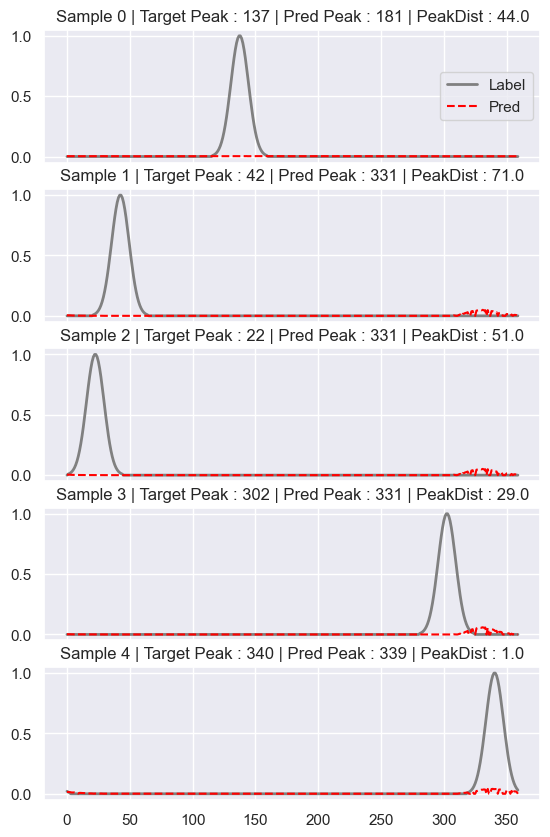

[  1   2   4   6   8  10  11  12  13  14  15  16  18  19  20  22  25  26
  29 181 329 331 332 333 335 338 339 341 344 351 352 358]
SAVING TO ... /its/home/nn268/antvis/antvis/optics/res_big_loop_saves/models/p3/testing/RealThing_300E_1e-4_ADAM_Eighths_[452, 144]/2c2l/


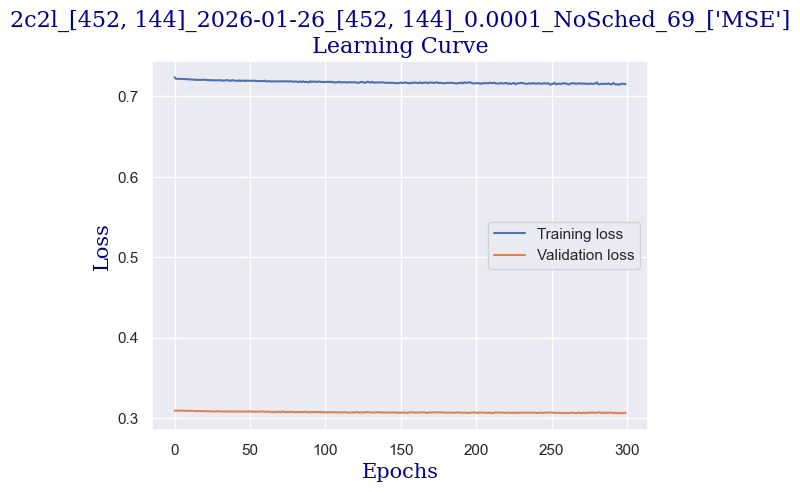

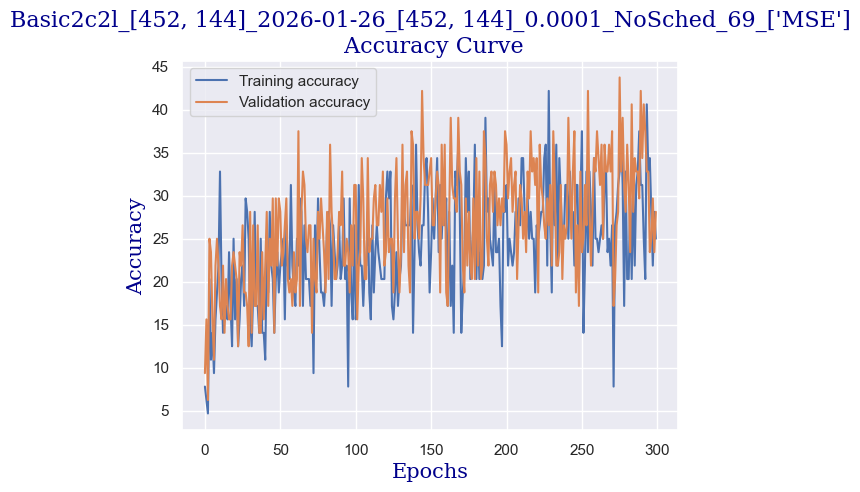

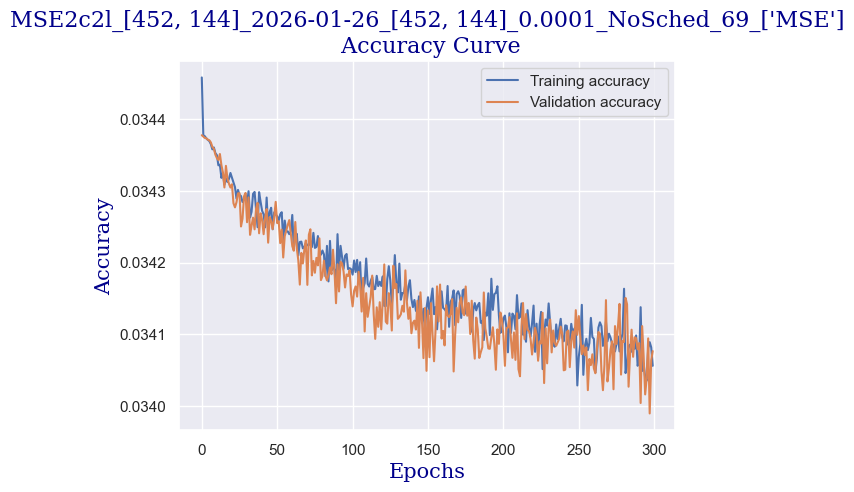

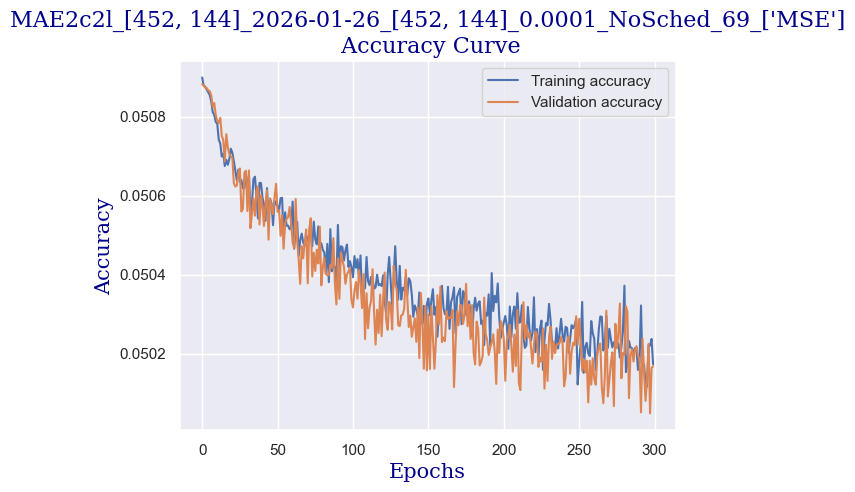

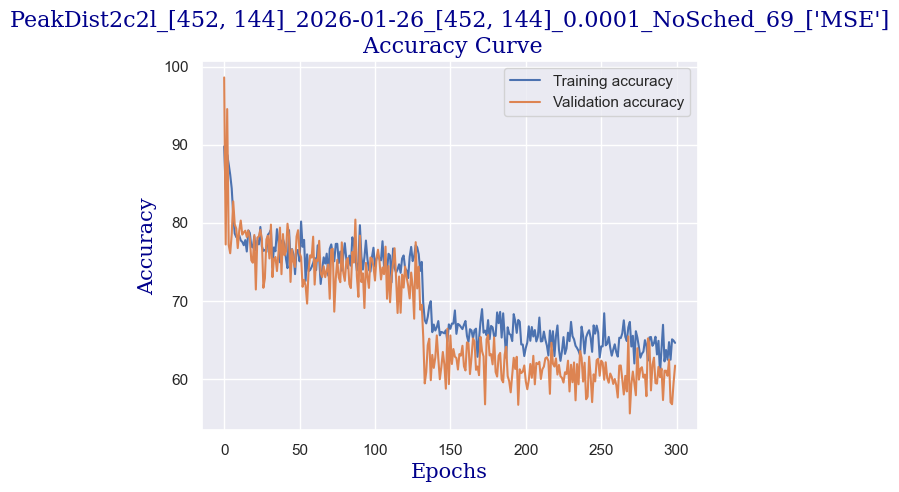

plot_confusion ACTUAL [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36]
plot_confusion PREDICTION [ 0  1  2  3 18 33 34 35 36]
actual  [ 1 32 16 14 20  2 26  0 12 14  4 30 22 24 34 17 22 21  7  4 17 23  3 28
 10 14 21 14 29 32 13 13  0 14 22 28 24 32 31  4 21 31 12 31  4  8 19 21
 30 34  2 12 13 31  6 29 28 11 34 33 19 25 27 17  0  2 27 30  5 18  8 15
  0 14  3 26 14 16  2 34 35 13  7 36  7  7 13 20 21 22 15  4  2  7 27 33
 34 35 32 23 34  6 14  8  2 22 24 19 33  2  0 21 18 25 28  0 30  2 33 32
 12 31 35 16 19 31 31  3 25 36  2 26 36 25 34 29  4 34  9 32 28  6 33 33
 22 21  0  2  3 30  7  3  4 34 28  0 35 14  0 21 32  4 21 23 35 28 22  2
 34 31  3  4  4 18 30 22 14  4 13 10  3 32 30 26 25  9 14  2 28 14  8  0
 11  2 11  0 17 27 20  0  5 36  4 17  3  2  1 10  2  1 16  6 10  2 11 30
 26  1  8  0 34 19 19  2 32  3 28  6 28 33  8 22  2 26 27 30 19 20 27  8
 25 21 32 28  7  4  3  5 33  8  2 16  9  1 34 21 24 21 33 24 12  1 10 2

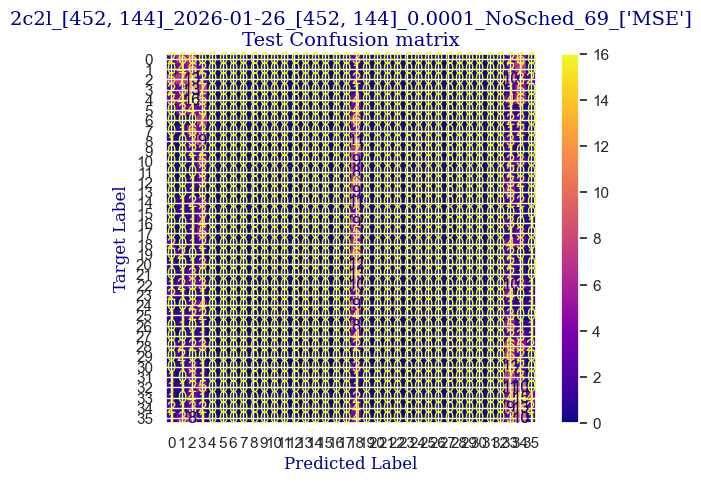

 
 END 2c2l [452, 144] Run Time:  19120.917474803


Epochs,▁
Test acc rough,▁▅▄▅▃▇▄█▅▂▅▆
TrainAcc rough,▂▄▃▂▃▄▂▁▅▃▂▃▄▆▃▃▃▄▃▅▂▄▅▆▃▄▃▅▆▄▄▅█▅▅▅▅▅▆▅
ValAcc rough,▁▂▅▄▄▃▅▃▄▃▅▃▄▅▄▄▃▃█▄▇▆▅▅▄▅▇▅▅▆▅▇▆▆▆▄▄▅▅▆
c_epoch,▁▁▁▁▁▂▂▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇██
t_loss,██▇▇▆▆▆▅▅▆▅▅▄▅▅▄▄▃▄▄▃▃▃▃▃▂▃▃▃▃▃▃▂▁▃▂▂▁▁▁
test_acc_MAE,█▄▄▄▆▃▄▁▅▄▃▂
test_acc_MSE,█▅▅▄▇▄▄▁▅▅▄▃
test_peakDist,▃▅▇▆▂▂▅██▆▁▄
train_err_MAE,███▇█▆▆▅▆▇█▅▅▅▂▄▅▆▆▅▆▅▄▄▅▆▅▆▅▆▅▅▄▄▂▁▆▃▅▃
+6,...


wandb: Agent Starting Run: vbwy5uur with config:
wandb: 	batch_size: 64
wandb: 	epochs: 300
wandb: 	half_ciprange: 22
wandb: 	learning_rate: 0.0001
wandb: 	loss_fn_cards: ['MSE']
wandb: 	model_cards: [{'Ks': [3, 5], 'channels': 3, 'dropout': 0.2, 'f_lin_lay': [1032192, 255744, 62208, 14976, 3072, 640, 128], 'idx': 6, 'model': '2c2l', 'name': '2c2l'}]
wandb: 	optimiser: ['adam']
wandb: 	resolution_cards: [{'index': 0, 'padding': 5, 'resolution': [452, 144]}]
wandb: 	seeds: 69
wandb: 	std_dev: 7
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from /its/home/nn268/.netrc.


{'name': '2c2l', 'model': '2c2l', 'channels': 3, 'Ks': (3, 5), 'f_lin_lay': [1032192, 255744, 62208, 14976, 3072, 640, 128], 'idx': 6, 'dropout': 0.2}
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 1
seed:  69
loss function:  ['MSE']
Batch size:  64
Training epochs:  300
start time:  76521.180184109
Model Name 2c2l
/its/home/nn268/antvis/antvis/optics/NC_IDSW/
set_lossfn    lf  ['MSE']


  0%|                                      | 0/300 [00:00<?, ?it/s]

Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


peak dist means  86.93154761904762
tacc:  {'baseAcc': 6.25, 'MSE': 0.03460956701920146, 'MAE': 0.050930277045284, 'peakDist': 86.93154761904762}
Validating...


  0%|                              | 1/300 [00:06<31:22,  6.29s/it]

peak dist means  75.96180555555556
v loss  0.30937472358345985
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  83.13169642857143
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03437229281380063, 'MAE': 0.05085554843147596, 'peakDist': 83.13169642857143}
Validating...


  1%|▏                             | 2/300 [00:12<30:36,  6.16s/it]

peak dist means  80.14756944444444
v loss  0.30939118191599846
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  80.86160714285714
tacc:  {'baseAcc': 25.0, 'MSE': 0.034374513441608065, 'MAE': 0.05086307121174676, 'peakDist': 80.86160714285714}
Validating...


  1%|▎                             | 3/300 [00:18<30:41,  6.20s/it]

peak dist means  79.23263888888889
v loss  0.3093775026500225
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  83.02752976190476
tacc:  {'baseAcc': 9.375, 'MSE': 0.03437306377149764, 'MAE': 0.050859611481428146, 'peakDist': 83.02752976190476}
Validating...


  1%|▍                             | 4/300 [00:25<31:32,  6.39s/it]

peak dist means  75.34375
v loss  0.30936818569898605
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  81.59151785714286
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03436861364614396, 'MAE': 0.05085299359191032, 'peakDist': 81.59151785714286}
Validating...


  2%|▌                             | 5/300 [00:31<30:53,  6.28s/it]

peak dist means  76.07638888888889
v loss  0.3093515709042549
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  81.28869047619048
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03437151777602378, 'MAE': 0.05085080489516258, 'peakDist': 81.28869047619048}
Validating...


  2%|▌                             | 6/300 [00:37<31:16,  6.38s/it]

peak dist means  74.08854166666667
v loss  0.3093101307749748
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.8296130952381
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03436237484926269, 'MAE': 0.050831959006332215, 'peakDist': 78.8296130952381}
Validating...


  2%|▋                             | 7/300 [00:44<31:17,  6.41s/it]

peak dist means  79.19791666666667
v loss  0.309322003275156
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.32440476190476
tacc:  {'baseAcc': 15.625, 'MSE': 0.034367323631332033, 'MAE': 0.05082922961030688, 'peakDist': 79.32440476190476}
Validating...


  3%|▊                             | 8/300 [00:51<31:39,  6.51s/it]

peak dist means  73.71527777777777
v loss  0.30929597094655037
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.3891369047619
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034364610200836546, 'MAE': 0.05083220026322773, 'peakDist': 78.3891369047619}
Validating...


  3%|▉                             | 9/300 [00:57<31:42,  6.54s/it]

peak dist means  79.11111111111111
v loss  0.30929236114025116
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  80.3735119047619
tacc:  {'baseAcc': 15.625, 'MSE': 0.03436394248689924, 'MAE': 0.05082788194219271, 'peakDist': 80.3735119047619}
Validating...


  3%|▉                            | 10/300 [01:04<32:07,  6.65s/it]

peak dist means  80.21875
v loss  0.30931854620575905
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.48139880952381
tacc:  {'baseAcc': 21.875, 'MSE': 0.034345355949231555, 'MAE': 0.05077604576945305, 'peakDist': 75.48139880952381}
Validating...


  4%|█                            | 11/300 [01:11<32:24,  6.73s/it]

peak dist means  77.42534722222223
v loss  0.3092109300196171
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.06547619047619
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034353866995800106, 'MAE': 0.05078601837158203, 'peakDist': 77.06547619047619}
Validating...


  4%|█▏                           | 12/300 [01:17<31:42,  6.61s/it]

peak dist means  77.80729166666667
v loss  0.3092620223760605
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  80.21354166666667
tacc:  {'baseAcc': 15.625, 'MSE': 0.03435626359922545, 'MAE': 0.05080303620724451, 'peakDist': 80.21354166666667}
Validating...


  4%|█▎                           | 13/300 [01:24<31:40,  6.62s/it]

peak dist means  78.21006944444444
v loss  0.30920833721756935
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.88244047619048
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034339703974269685, 'MAE': 0.05076181675706591, 'peakDist': 75.88244047619048}
Validating...


  5%|█▎                           | 14/300 [01:31<31:32,  6.62s/it]

peak dist means  78.94791666666667
v loss  0.3092023991048336
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.02008928571429
tacc:  {'baseAcc': 9.375, 'MSE': 0.03434169044097265, 'MAE': 0.050750382244586945, 'peakDist': 77.02008928571429}
Validating...


  5%|█▍                           | 15/300 [01:37<30:59,  6.52s/it]

peak dist means  77.32638888888889
v loss  0.30913248658180237
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.45014880952381
tacc:  {'baseAcc': 9.375, 'MSE': 0.03433718248492196, 'MAE': 0.05074456334114075, 'peakDist': 77.45014880952381}
Validating...


  5%|█▌                           | 16/300 [01:43<29:57,  6.33s/it]

peak dist means  75.38368055555556
v loss  0.30915211513638496
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  81.05357142857143
tacc:  {'baseAcc': 21.875, 'MSE': 0.03434830176688376, 'MAE': 0.05078099561589105, 'peakDist': 81.05357142857143}
Validating...


  6%|█▋                           | 17/300 [01:49<29:17,  6.21s/it]

peak dist means  78.52604166666667
v loss  0.30920684337615967
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.24627976190476
tacc:  {'baseAcc': 15.625, 'MSE': 0.034324136518296744, 'MAE': 0.05071425012179783, 'peakDist': 76.24627976190476}
Validating...


  6%|█▋                           | 18/300 [01:55<29:21,  6.25s/it]

peak dist means  76.80034722222223
v loss  0.30903373286128044
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  80.10416666666667
tacc:  {'baseAcc': 18.75, 'MSE': 0.03433810706649508, 'MAE': 0.0507448139999594, 'peakDist': 80.10416666666667}
Validating...


  6%|█▊                           | 19/300 [02:01<29:01,  6.20s/it]

peak dist means  77.11458333333333
v loss  0.30914851650595665
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.9203869047619
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03432478578317733, 'MAE': 0.05071615143900826, 'peakDist': 76.9203869047619}
Validating...


  7%|█▉                           | 20/300 [02:08<29:06,  6.24s/it]

peak dist means  78.80729166666667
v loss  0.3089599050581455
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.40997023809524
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03433697085295405, 'MAE': 0.05073523610120728, 'peakDist': 76.40997023809524}
Validating...


  7%|██                           | 21/300 [02:14<29:10,  6.28s/it]

peak dist means  76.65972222222223
v loss  0.309041153639555
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.95758928571429
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03432279842950049, 'MAE': 0.05071974847288359, 'peakDist': 78.95758928571429}
Validating...


  7%|██▏                          | 22/300 [02:21<29:39,  6.40s/it]

peak dist means  77.71180555555556
v loss  0.3090265057981014
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.5
tacc:  {'baseAcc': 15.625, 'MSE': 0.03431531520826476, 'MAE': 0.05068521928929147, 'peakDist': 75.5}
Validating...


  8%|██▏                          | 23/300 [02:27<30:05,  6.52s/it]

peak dist means  79.34548611111111
v loss  0.3090413436293602
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.46056547619048
tacc:  {'baseAcc': 25.0, 'MSE': 0.034301962703466415, 'MAE': 0.05065958716330074, 'peakDist': 75.46056547619048}
Validating...


  8%|██▎                          | 24/300 [02:34<30:27,  6.62s/it]

peak dist means  76.59375
v loss  0.3088841550052166
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.54464285714286
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03432519609729449, 'MAE': 0.050710046397788186, 'peakDist': 79.54464285714286}
Validating...


  8%|██▍                          | 25/300 [02:41<30:12,  6.59s/it]

peak dist means  74.28993055555556
v loss  0.3088456578552723
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.83184523809524
tacc:  {'baseAcc': 14.0625, 'MSE': 0.034308865666389465, 'MAE': 0.0506853186303661, 'peakDist': 76.83184523809524}
Validating...


  9%|██▌                          | 26/300 [02:48<30:30,  6.68s/it]

peak dist means  78.99305555555556
v loss  0.3090159744024277
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.9077380952381
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03432671069389298, 'MAE': 0.050724691578320096, 'peakDist': 77.9077380952381}
Validating...


  9%|██▌                          | 27/300 [02:54<30:05,  6.61s/it]

peak dist means  76.75173611111111
v loss  0.3089412786066532
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.1703869047619
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034318686773379646, 'MAE': 0.05070593438687779, 'peakDist': 79.1703869047619}
Validating...


  9%|██▋                          | 28/300 [03:01<29:49,  6.58s/it]

peak dist means  76.80034722222223
v loss  0.30882468074560165
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.23065476190476
tacc:  {'baseAcc': 15.625, 'MSE': 0.03430661222054845, 'MAE': 0.050670573221785684, 'peakDist': 77.23065476190476}
Validating...


 10%|██▊                          | 29/300 [03:07<29:43,  6.58s/it]

peak dist means  75.71875
v loss  0.3088226430118084
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.77232142857143
tacc:  {'baseAcc': 10.9375, 'MSE': 0.03430822261032604, 'MAE': 0.05068401956842059, 'peakDist': 77.77232142857143}
Validating...


 10%|██▉                          | 30/300 [03:13<29:12,  6.49s/it]

peak dist means  73.59895833333333
v loss  0.30865249037742615
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.92708333333333
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034312578184264045, 'MAE': 0.05069559723848388, 'peakDist': 77.92708333333333}
Validating...


 10%|██▉                          | 31/300 [03:20<29:01,  6.47s/it]

peak dist means  77.95138888888889
v loss  0.30888718739151955
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.109375
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034299061057113465, 'MAE': 0.05065376009969484, 'peakDist': 79.109375}
Validating...


 11%|███                          | 32/300 [03:26<28:33,  6.39s/it]

peak dist means  77.24826388888889
v loss  0.3088349811732769
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.73139880952381
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03428560974342482, 'MAE': 0.050623575846354164, 'peakDist': 75.73139880952381}
Validating...


 11%|███▏                         | 33/300 [03:33<28:36,  6.43s/it]

peak dist means  75.44965277777777
v loss  0.3085685670375824
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.62723214285714
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03427527632032122, 'MAE': 0.050585951478708355, 'peakDist': 75.62723214285714}
Validating...


 11%|███▎                         | 34/300 [03:39<28:26,  6.41s/it]

peak dist means  72.25868055555556
v loss  0.3084271363914013
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.28050595238095
tacc:  {'baseAcc': 21.875, 'MSE': 0.03428452497436887, 'MAE': 0.050601497292518616, 'peakDist': 74.28050595238095}
Validating...


 12%|███▍                         | 35/300 [03:45<28:14,  6.39s/it]

peak dist means  78.81076388888889
v loss  0.30858028680086136
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.34970238095238
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03429500102287247, 'MAE': 0.05063828684034802, 'peakDist': 75.34970238095238}
Validating...


 12%|███▍                         | 36/300 [03:52<28:13,  6.41s/it]

peak dist means  71.98090277777777
v loss  0.30842992290854454
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.18080357142857
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034308835509277526, 'MAE': 0.05067564493843487, 'peakDist': 78.18080357142857}
Validating...


 12%|███▌                         | 37/300 [03:58<27:59,  6.39s/it]

peak dist means  74.21006944444444
v loss  0.3085257522761822
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.05729166666667
tacc:  {'baseAcc': 28.125, 'MSE': 0.03428889846517926, 'MAE': 0.05062736641793024, 'peakDist': 74.05729166666667}
Validating...


 13%|███▋                         | 38/300 [04:04<27:50,  6.37s/it]

peak dist means  74.97048611111111
v loss  0.3085603900253773
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.04166666666667
tacc:  {'baseAcc': 21.875, 'MSE': 0.03428391846162932, 'MAE': 0.05061193076627595, 'peakDist': 75.04166666666667}
Validating...


 13%|███▊                         | 39/300 [04:11<28:22,  6.52s/it]

peak dist means  75.99479166666667
v loss  0.30860063061118126
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.46205357142857
tacc:  {'baseAcc': 14.0625, 'MSE': 0.0342871140511263, 'MAE': 0.05063316013131823, 'peakDist': 77.46205357142857}
Validating...


 13%|███▊                         | 40/300 [04:18<28:19,  6.53s/it]

peak dist means  78.11458333333333
v loss  0.3087216541171074
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.82068452380952
tacc:  {'baseAcc': 14.0625, 'MSE': 0.034280099329494294, 'MAE': 0.050612281830537884, 'peakDist': 76.82068452380952}
Validating...


 14%|███▉                         | 41/300 [04:25<28:37,  6.63s/it]

peak dist means  74.48263888888889
v loss  0.30837738886475563
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.64732142857143
tacc:  {'baseAcc': 10.9375, 'MSE': 0.03429646062709037, 'MAE': 0.05063063172357423, 'peakDist': 75.64732142857143}
Validating...


 14%|████                         | 42/300 [04:31<28:11,  6.56s/it]

peak dist means  75.83680555555556
v loss  0.30843502283096313
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.47619047619048
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03429545639526276, 'MAE': 0.05065846691528956, 'peakDist': 79.47619047619048}
Validating...


 14%|████▏                        | 43/300 [04:38<28:06,  6.56s/it]

peak dist means  80.64756944444444
v loss  0.3087969683110714
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.58556547619048
tacc:  {'baseAcc': 15.625, 'MSE': 0.034282654169059935, 'MAE': 0.05062428205495789, 'peakDist': 75.58556547619048}
Validating...


 15%|████▎                        | 44/300 [04:44<27:56,  6.55s/it]

peak dist means  77.90972222222223
v loss  0.3086644969880581
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.12053571428571
tacc:  {'baseAcc': 18.75, 'MSE': 0.03427735254878089, 'MAE': 0.05059367045760155, 'peakDist': 75.12053571428571}
Validating...


 15%|████▎                        | 45/300 [04:50<27:22,  6.44s/it]

peak dist means  78.62673611111111
v loss  0.3086540997028351
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.39508928571429
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03426995767014367, 'MAE': 0.050583786552860624, 'peakDist': 75.39508928571429}
EPOCH    45 / 300:


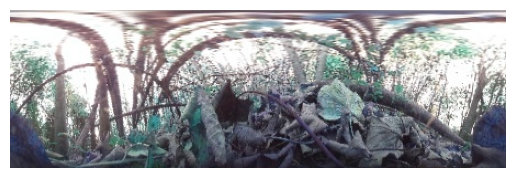

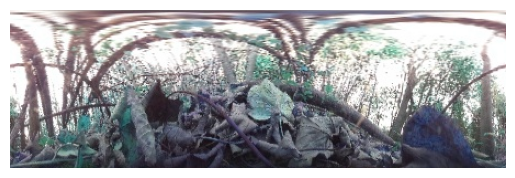

TRUE LABEL    :          314
PREDICTION    :          326
Validating...


 15%|████▍                        | 46/300 [04:57<27:00,  6.38s/it]

peak dist means  78.47916666666667
v loss  0.30858099833130836
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.71354166666667
tacc:  {'baseAcc': 15.625, 'MSE': 0.034282143449499494, 'MAE': 0.0506069686795984, 'peakDist': 78.71354166666667}
Validating...


 16%|████▌                        | 47/300 [05:03<26:25,  6.27s/it]

peak dist means  77.96180555555556
v loss  0.3084057569503784
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.69940476190476
tacc:  {'baseAcc': 31.25, 'MSE': 0.034267564969403405, 'MAE': 0.05059108475134486, 'peakDist': 75.69940476190476}
Validating...


 16%|████▋                        | 48/300 [05:09<26:14,  6.25s/it]

peak dist means  74.70486111111111
v loss  0.30825043469667435
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.35491071428571
tacc:  {'baseAcc': 17.1875, 'MSE': 0.0342738674510093, 'MAE': 0.0505910361451762, 'peakDist': 77.35491071428571}
Validating...


 16%|████▋                        | 49/300 [05:15<25:51,  6.18s/it]

peak dist means  74.46354166666667
v loss  0.30851956084370613
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.60119047619048
tacc:  {'baseAcc': 28.125, 'MSE': 0.034279601027568184, 'MAE': 0.05060809939390137, 'peakDist': 77.60119047619048}
Validating...


 17%|████▊                        | 50/300 [05:21<25:50,  6.20s/it]

peak dist means  73.84201388888889
v loss  0.3083097115159035
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.3452380952381
tacc:  {'baseAcc': 15.625, 'MSE': 0.034251035146770026, 'MAE': 0.05055292465147518, 'peakDist': 76.3452380952381}
Validating...


 17%|████▉                        | 51/300 [05:27<25:37,  6.17s/it]

peak dist means  73.4375
v loss  0.308288998901844
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.41517857142857
tacc:  {'baseAcc': 25.0, 'MSE': 0.034281282197861446, 'MAE': 0.050613547364870705, 'peakDist': 77.41517857142857}
Validating...


 17%|█████                        | 52/300 [05:34<25:40,  6.21s/it]

peak dist means  75.46527777777777
v loss  0.30829737335443497
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.4516369047619
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034269969732988445, 'MAE': 0.05058466075431733, 'peakDist': 75.4516369047619}
Validating...


 18%|█████                        | 53/300 [05:40<25:52,  6.28s/it]

peak dist means  72.46875
v loss  0.30808861926198006
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.12425595238095
tacc:  {'baseAcc': 18.75, 'MSE': 0.034281542613392786, 'MAE': 0.05061269870826176, 'peakDist': 78.12425595238095}
Validating...


 18%|█████▏                       | 54/300 [05:47<26:32,  6.47s/it]

peak dist means  76.44791666666667
v loss  0.30831945687532425
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.17559523809524
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034257114643142336, 'MAE': 0.0505608313140415, 'peakDist': 77.17559523809524}
Validating...


 18%|█████▎                       | 55/300 [05:53<26:24,  6.47s/it]

peak dist means  76.43923611111111
v loss  0.3081362508237362
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.33705357142857
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034255130482571464, 'MAE': 0.05056294763372058, 'peakDist': 76.33705357142857}
Validating...


 19%|█████▍                       | 56/300 [06:00<26:50,  6.60s/it]

peak dist means  75.63888888888889
v loss  0.30837008729577065
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.78050595238095
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03426280351621764, 'MAE': 0.050562276726677305, 'peakDist': 79.78050595238095}
Validating...


 19%|█████▌                       | 57/300 [06:07<26:37,  6.57s/it]

peak dist means  77.39930555555556
v loss  0.3082170896232128
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.65327380952381
tacc:  {'baseAcc': 18.75, 'MSE': 0.03425358555146626, 'MAE': 0.05055128676550729, 'peakDist': 75.65327380952381}
Validating...


 19%|█████▌                       | 58/300 [06:14<26:47,  6.64s/it]

peak dist means  78.87152777777777
v loss  0.3085375651717186
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.02901785714286
tacc:  {'baseAcc': 21.875, 'MSE': 0.03426147607110795, 'MAE': 0.050576435668127875, 'peakDist': 77.02901785714286}
Validating...


 20%|█████▋                       | 59/300 [06:20<26:20,  6.56s/it]

peak dist means  78.13541666666667
v loss  0.3084781691431999
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.76636904761905
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03426540589758328, 'MAE': 0.05058056967599051, 'peakDist': 77.76636904761905}
Validating...


 20%|█████▊                       | 60/300 [06:26<25:46,  6.45s/it]

peak dist means  82.85763888888889
v loss  0.30854132026433945
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.58184523809524
tacc:  {'baseAcc': 21.875, 'MSE': 0.03425036583627973, 'MAE': 0.0505481284289133, 'peakDist': 76.58184523809524}
Validating...


 20%|█████▉                       | 61/300 [06:32<25:11,  6.32s/it]

peak dist means  77.67013888888889
v loss  0.30833862721920013
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.38244047619048
tacc:  {'baseAcc': 25.0, 'MSE': 0.03423789799922988, 'MAE': 0.05051845294379052, 'peakDist': 75.38244047619048}
Validating...


 21%|█████▉                       | 62/300 [06:38<24:59,  6.30s/it]

peak dist means  74.87673611111111
v loss  0.3080862686038017
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.94940476190476
tacc:  {'baseAcc': 18.75, 'MSE': 0.03426795754404295, 'MAE': 0.050579623807044255, 'peakDist': 77.94940476190476}
Validating...


 21%|██████                       | 63/300 [06:45<24:44,  6.26s/it]

peak dist means  81.90798611111111
v loss  0.30829736962914467
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.59747023809524
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03427144583492052, 'MAE': 0.050593818937029154, 'peakDist': 79.59747023809524}
Validating...


 21%|██████▏                      | 64/300 [06:51<24:30,  6.23s/it]

peak dist means  80.28298611111111
v loss  0.30841876938939095
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.42931547619048
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03425910731866246, 'MAE': 0.05055779076757885, 'peakDist': 75.42931547619048}
Validating...


 22%|██████▎                      | 65/300 [06:57<24:28,  6.25s/it]

peak dist means  74.74652777777777
v loss  0.30800920352339745
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.84375
tacc:  {'baseAcc': 20.3125, 'MSE': 0.0342581369692371, 'MAE': 0.050565464865593684, 'peakDist': 78.84375}
Validating...


 22%|██████▍                      | 66/300 [07:04<24:50,  6.37s/it]

peak dist means  76.87673611111111
v loss  0.30832184106111526
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.08556547619048
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034272853107679455, 'MAE': 0.050591642480520976, 'peakDist': 79.08556547619048}
Validating...


 22%|██████▍                      | 67/300 [07:10<24:27,  6.30s/it]

peak dist means  76.47048611111111
v loss  0.3081130385398865
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.27380952380952
tacc:  {'baseAcc': 25.0, 'MSE': 0.03425497189164162, 'MAE': 0.05054132321051189, 'peakDist': 76.27380952380952}
Validating...


 23%|██████▌                      | 68/300 [07:16<24:27,  6.33s/it]

peak dist means  72.515625
v loss  0.3080652765929699
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.0922619047619
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034248197539931254, 'MAE': 0.05054947112997373, 'peakDist': 77.0922619047619}
Validating...


 23%|██████▋                      | 69/300 [07:23<24:40,  6.41s/it]

peak dist means  78.33680555555556
v loss  0.30826592072844505
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.6547619047619
tacc:  {'baseAcc': 12.5, 'MSE': 0.034256442494335626, 'MAE': 0.050538761275155206, 'peakDist': 77.6547619047619}
Validating...


 23%|██████▊                      | 70/300 [07:30<25:08,  6.56s/it]

peak dist means  74.81076388888889
v loss  0.3081805147230625
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.46428571428571
tacc:  {'baseAcc': 15.625, 'MSE': 0.03423965864238285, 'MAE': 0.050508526109513785, 'peakDist': 75.46428571428571}
Validating...


 24%|██████▊                      | 71/300 [07:36<24:50,  6.51s/it]

peak dist means  77.12673611111111
v loss  0.30812083184719086
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.54241071428571
tacc:  {'baseAcc': 21.875, 'MSE': 0.03425816269147964, 'MAE': 0.05055337062194234, 'peakDist': 77.54241071428571}
Validating...


 24%|██████▉                      | 72/300 [07:42<24:24,  6.42s/it]

peak dist means  74.80208333333333
v loss  0.308283768594265
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.18973214285714
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03424083352798507, 'MAE': 0.05052638834431058, 'peakDist': 77.18973214285714}
Validating...


 24%|███████                      | 73/300 [07:49<24:24,  6.45s/it]

peak dist means  76.86284722222223
v loss  0.3082673214375973
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.15550595238095
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03423722212513288, 'MAE': 0.05050628064643769, 'peakDist': 77.15550595238095}
Validating...


 25%|███████▏                     | 74/300 [07:55<24:08,  6.41s/it]

peak dist means  80.74479166666667
v loss  0.3082185424864292
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.99032738095238
tacc:  {'baseAcc': 18.75, 'MSE': 0.03421740606427193, 'MAE': 0.0504933726929483, 'peakDist': 76.99032738095238}
Validating...


 25%|███████▎                     | 75/300 [08:01<23:38,  6.30s/it]

peak dist means  72.38888888888889
v loss  0.30799535661935806
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.83407738095238
tacc:  {'baseAcc': 25.0, 'MSE': 0.03422533064371064, 'MAE': 0.05046883048046203, 'peakDist': 72.83407738095238}
Validating...


 25%|███████▎                     | 76/300 [08:07<23:24,  6.27s/it]

peak dist means  74.66319444444444
v loss  0.30810583755373955
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.06994047619048
tacc:  {'baseAcc': 21.875, 'MSE': 0.03422053672728084, 'MAE': 0.05047544925695374, 'peakDist': 76.06994047619048}
Validating...


 26%|███████▍                     | 77/300 [08:14<23:34,  6.34s/it]

peak dist means  79.52604166666667
v loss  0.308294165879488
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.22767857142857
tacc:  {'baseAcc': 21.875, 'MSE': 0.03425378370143119, 'MAE': 0.05055846362596467, 'peakDist': 76.22767857142857}
Validating...


 26%|███████▌                     | 78/300 [08:20<23:32,  6.36s/it]

peak dist means  72.87847222222223
v loss  0.30784545466303825
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.29389880952381
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03423262334295681, 'MAE': 0.05049606288472811, 'peakDist': 74.29389880952381}
Validating...


 26%|███████▋                     | 79/300 [08:26<23:08,  6.28s/it]

peak dist means  76.38541666666667
v loss  0.30802036076784134
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.15252976190476
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034224378920736764, 'MAE': 0.050475773002420156, 'peakDist': 75.15252976190476}
Validating...


 27%|███████▋                     | 80/300 [08:33<23:23,  6.38s/it]

peak dist means  80.35243055555556
v loss  0.30812230706214905
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.74702380952381
tacc:  {'baseAcc': 31.25, 'MSE': 0.03421144418063618, 'MAE': 0.05046401917934418, 'peakDist': 74.74702380952381}
Validating...


 27%|███████▊                     | 81/300 [08:39<23:21,  6.40s/it]

peak dist means  77.5
v loss  0.30767033994197845
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.45758928571429
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03424415666432608, 'MAE': 0.05052648963672774, 'peakDist': 76.45758928571429}
Validating...


 27%|███████▉                     | 82/300 [08:46<23:24,  6.44s/it]

peak dist means  74.79861111111111
v loss  0.3078664503991604
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.27083333333333
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03423349239996502, 'MAE': 0.05049075505563191, 'peakDist': 77.27083333333333}
Validating...


 28%|████████                     | 83/300 [08:53<23:40,  6.55s/it]

peak dist means  74.76736111111111
v loss  0.308078296482563
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.79315476190476
tacc:  {'baseAcc': 28.125, 'MSE': 0.03422017129404204, 'MAE': 0.05048303128707977, 'peakDist': 75.79315476190476}
Validating...


 28%|████████                     | 84/300 [08:59<23:18,  6.47s/it]

peak dist means  74.81076388888889
v loss  0.30807164311408997
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.29389880952381
tacc:  {'baseAcc': 20.3125, 'MSE': 0.0342391865948836, 'MAE': 0.05052199214696884, 'peakDist': 77.29389880952381}
Validating...


 28%|████████▏                    | 85/300 [09:06<23:41,  6.61s/it]

peak dist means  72.97569444444444
v loss  0.3076699562370777
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.50892857142857
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03419213600101925, 'MAE': 0.05040431679004714, 'peakDist': 73.50892857142857}
Validating...


 29%|████████▎                    | 86/300 [09:11<21:22,  5.99s/it]

peak dist means  75.859375
v loss  0.3079104572534561
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.75744047619048
tacc:  {'baseAcc': 25.0, 'MSE': 0.03422099972764651, 'MAE': 0.05047788949949401, 'peakDist': 76.75744047619048}
Validating...


 29%|████████▍                    | 87/300 [09:15<19:26,  5.48s/it]

peak dist means  73.75347222222223
v loss  0.3078181929886341
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.19791666666667
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03421778994656745, 'MAE': 0.05045827708783604, 'peakDist': 75.19791666666667}
Validating...


 29%|████████▌                    | 88/300 [09:20<18:52,  5.34s/it]

peak dist means  73.97916666666667
v loss  0.3078765496611595
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.00892857142857
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03422623447009495, 'MAE': 0.05048618554359391, 'peakDist': 73.00892857142857}
Validating...


 30%|████████▌                    | 89/300 [09:26<19:48,  5.63s/it]

peak dist means  74.31944444444444
v loss  0.30765683203935623
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.68005952380952
tacc:  {'baseAcc': 21.875, 'MSE': 0.034195460024334136, 'MAE': 0.050415084652957465, 'peakDist': 72.68005952380952}
Validating...


 30%|████████▋                    | 90/300 [09:32<20:18,  5.80s/it]

peak dist means  72.83854166666667
v loss  0.30772092565894127
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.80357142857143
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034196733364037106, 'MAE': 0.050428133990083425, 'peakDist': 72.80357142857143}
Validating...


 30%|████████▊                    | 91/300 [09:39<20:45,  5.96s/it]

peak dist means  77.06770833333333
v loss  0.30782416462898254
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.23214285714286
tacc:  {'baseAcc': 18.75, 'MSE': 0.034234276307480674, 'MAE': 0.050523681654816584, 'peakDist': 79.23214285714286}
Validating...


 31%|████████▉                    | 92/300 [09:45<20:54,  6.03s/it]

peak dist means  75.60763888888889
v loss  0.30772753432393074
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.37797619047619
tacc:  {'baseAcc': 21.875, 'MSE': 0.034242283552885056, 'MAE': 0.05052752438045684, 'peakDist': 77.37797619047619}
Validating...


 31%|████████▉                    | 93/300 [09:51<21:19,  6.18s/it]

peak dist means  73.40625
v loss  0.3078064024448395
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.46577380952381
tacc:  {'baseAcc': 32.8125, 'MSE': 0.034262203389690035, 'MAE': 0.05056624699916158, 'peakDist': 77.46577380952381}
Validating...


 31%|█████████                    | 94/300 [09:58<21:49,  6.36s/it]

peak dist means  77.60243055555556
v loss  0.30796460807323456
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.8764880952381
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03420874600609144, 'MAE': 0.05046087822743824, 'peakDist': 76.8764880952381}
Validating...


 32%|█████████▏                   | 95/300 [10:05<21:54,  6.41s/it]

peak dist means  76.63715277777777
v loss  0.30787644535303116
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.65327380952381
tacc:  {'baseAcc': 15.625, 'MSE': 0.03420858280289741, 'MAE': 0.05045392452960923, 'peakDist': 75.65327380952381}
Validating...


 32%|█████████▎                   | 96/300 [10:11<22:05,  6.50s/it]

peak dist means  76.34548611111111
v loss  0.30801327899098396
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.91071428571429
tacc:  {'baseAcc': 25.0, 'MSE': 0.034225368074008396, 'MAE': 0.0504910871386528, 'peakDist': 76.91071428571429}
Validating...


 32%|█████████▍                   | 97/300 [10:18<21:54,  6.48s/it]

peak dist means  76.34027777777777
v loss  0.30807049944996834
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.5766369047619
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03421022015668097, 'MAE': 0.0504581243509338, 'peakDist': 74.5766369047619}
Validating...


 33%|█████████▍                   | 98/300 [10:24<21:21,  6.34s/it]

peak dist means  77.27951388888889
v loss  0.3081388995051384
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.62797619047619
tacc:  {'baseAcc': 18.75, 'MSE': 0.03422443320353826, 'MAE': 0.050489223251740135, 'peakDist': 75.62797619047619}
Validating...


 33%|█████████▌                   | 99/300 [10:30<20:57,  6.26s/it]

peak dist means  77.96527777777777
v loss  0.3079911842942238
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.31994047619048
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034200066789275126, 'MAE': 0.05044125055982953, 'peakDist': 75.31994047619048}
Validating...


 33%|█████████▎                  | 100/300 [10:36<20:41,  6.21s/it]

peak dist means  74.05729166666667
v loss  0.3078582212328911
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.25223214285714
tacc:  {'baseAcc': 25.0, 'MSE': 0.0342170044424988, 'MAE': 0.050474196672439575, 'peakDist': 75.25223214285714}
Validating...


 34%|█████████▍                  | 101/300 [10:42<20:35,  6.21s/it]

peak dist means  73.30208333333333
v loss  0.3075355887413025
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.64360119047619
tacc:  {'baseAcc': 18.75, 'MSE': 0.03420155903413182, 'MAE': 0.05042823599207969, 'peakDist': 73.64360119047619}
Validating...


 34%|█████████▌                  | 102/300 [10:48<20:22,  6.18s/it]

peak dist means  75.56944444444444
v loss  0.30777058005332947
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.90178571428571
tacc:  {'baseAcc': 25.0, 'MSE': 0.03421538748911449, 'MAE': 0.05046717538720086, 'peakDist': 74.90178571428571}
Validating...


 34%|█████████▌                  | 103/300 [10:54<20:03,  6.11s/it]

peak dist means  79.10590277777777
v loss  0.30796001479029655
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.8891369047619
tacc:  {'baseAcc': 28.125, 'MSE': 0.034178132812182106, 'MAE': 0.05038615529026304, 'peakDist': 74.8891369047619}
Validating...


 35%|█████████▋                  | 104/300 [11:01<20:14,  6.20s/it]

peak dist means  72.03472222222223
v loss  0.3075214736163616
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.5610119047619
tacc:  {'baseAcc': 25.0, 'MSE': 0.03420094329686392, 'MAE': 0.050442464117492945, 'peakDist': 74.5610119047619}
Validating...


 35%|█████████▊                  | 105/300 [11:07<20:26,  6.29s/it]

peak dist means  76.35243055555556
v loss  0.3075558729469776
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.87425595238095
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03421377426102048, 'MAE': 0.05046169867827779, 'peakDist': 75.87425595238095}
Validating...


 35%|█████████▉                  | 106/300 [11:14<20:30,  6.34s/it]

peak dist means  75.60416666666667
v loss  0.30786053091287613
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.38095238095238
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03419657512789681, 'MAE': 0.05043458175801095, 'peakDist': 76.38095238095238}
Validating...


 36%|█████████▉                  | 107/300 [11:21<21:04,  6.55s/it]

peak dist means  71.04166666666667
v loss  0.30762507393956184
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.92708333333333
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03418128139206341, 'MAE': 0.05039731466344425, 'peakDist': 75.92708333333333}
Validating...


 36%|██████████                  | 108/300 [11:27<20:53,  6.53s/it]

peak dist means  69.74305555555556
v loss  0.3074682988226414
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.90922619047619
tacc:  {'baseAcc': 28.125, 'MSE': 0.03421951954563459, 'MAE': 0.05048529431223869, 'peakDist': 77.90922619047619}
Validating...


 36%|██████████▏                 | 109/300 [11:34<20:34,  6.47s/it]

peak dist means  74.125
v loss  0.307777788490057
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.65922619047619
tacc:  {'baseAcc': 12.5, 'MSE': 0.03417772356243361, 'MAE': 0.05039351522212937, 'peakDist': 72.65922619047619}
Validating...


 37%|██████████▎                 | 110/300 [11:40<20:28,  6.47s/it]

peak dist means  80.54513888888889
v loss  0.30835098773241043
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.98363095238095
tacc:  {'baseAcc': 14.0625, 'MSE': 0.0341880348111902, 'MAE': 0.0504260669861521, 'peakDist': 74.98363095238095}
Validating...


 37%|██████████▎                 | 111/300 [11:46<20:19,  6.45s/it]

peak dist means  77.56076388888889
v loss  0.30743835121393204
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.3422619047619
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034174381622246335, 'MAE': 0.05041641475898879, 'peakDist': 76.3422619047619}
Validating...


 37%|██████████▍                 | 112/300 [11:53<20:07,  6.42s/it]

peak dist means  75.58159722222223
v loss  0.3079925626516342
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.09002976190476
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03418734563248498, 'MAE': 0.05041200898232914, 'peakDist': 76.09002976190476}
Validating...


 38%|██████████▌                 | 113/300 [11:59<19:43,  6.33s/it]

peak dist means  71.18576388888889
v loss  0.30725107342004776
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.45982142857143
tacc:  {'baseAcc': 31.25, 'MSE': 0.03417155944875309, 'MAE': 0.050376598501489275, 'peakDist': 76.45982142857143}
Validating...


 38%|██████████▋                 | 114/300 [12:05<19:45,  6.37s/it]

peak dist means  76.60763888888889
v loss  0.3075637258589268
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.16071428571429
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03417348879433814, 'MAE': 0.050388120469592866, 'peakDist': 75.16071428571429}
Validating...


 38%|██████████▋                 | 115/300 [12:11<19:19,  6.27s/it]

peak dist means  72.51041666666667
v loss  0.30745553970336914
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.19494047619048
tacc:  {'baseAcc': 18.75, 'MSE': 0.034223761764310655, 'MAE': 0.05049611237787065, 'peakDist': 76.19494047619048}
Validating...


 39%|██████████▊                 | 116/300 [12:18<19:13,  6.27s/it]

peak dist means  80.83333333333333
v loss  0.3083232454955578
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.52008928571429
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03416758243526731, 'MAE': 0.050374110894543786, 'peakDist': 72.52008928571429}
Validating...


 39%|██████████▉                 | 117/300 [12:24<19:06,  6.27s/it]

peak dist means  73.88194444444444
v loss  0.3076028861105442
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.85639880952381
tacc:  {'baseAcc': 25.0, 'MSE': 0.03416727359096209, 'MAE': 0.05037013281668935, 'peakDist': 75.85639880952381}
Validating...


 39%|███████████                 | 118/300 [12:30<19:08,  6.31s/it]

peak dist means  75.45833333333333
v loss  0.30761485174298286
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.44568452380952
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03416624062118076, 'MAE': 0.05039515683338756, 'peakDist': 75.44568452380952}
Validating...


 40%|███████████                 | 119/300 [12:37<19:17,  6.39s/it]

peak dist means  77.06597222222223
v loss  0.30768709257245064
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.61458333333333
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03420276851171539, 'MAE': 0.05043325644163858, 'peakDist': 74.61458333333333}
Validating...


 40%|███████████▏                | 120/300 [12:43<19:12,  6.40s/it]

peak dist means  73.88715277777777
v loss  0.3078323230147362
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.56770833333333
tacc:  {'baseAcc': 21.875, 'MSE': 0.03416751857314791, 'MAE': 0.05036968808798563, 'peakDist': 74.56770833333333}
Validating...


 40%|███████████▎                | 121/300 [12:50<19:09,  6.42s/it]

peak dist means  76.30555555555556
v loss  0.30778367444872856
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.53794642857143
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034167319536209106, 'MAE': 0.05037455118837811, 'peakDist': 73.53794642857143}
Validating...


 41%|███████████▍                | 122/300 [12:56<19:09,  6.46s/it]

peak dist means  71.953125
v loss  0.30733468011021614
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.14806547619048
tacc:  {'baseAcc': 18.75, 'MSE': 0.03419771861462366, 'MAE': 0.050435417996985574, 'peakDist': 76.14806547619048}
Validating...


 41%|███████████▍                | 123/300 [13:03<19:18,  6.55s/it]

peak dist means  76.09548611111111
v loss  0.30790433660149574
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.84449404761905
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03418355346435592, 'MAE': 0.05039148068144208, 'peakDist': 74.84449404761905}
Validating...


 41%|███████████▌                | 124/300 [13:10<19:28,  6.64s/it]

peak dist means  72.19097222222223
v loss  0.30740340426564217
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.41443452380952
tacc:  {'baseAcc': 28.125, 'MSE': 0.03418744639271781, 'MAE': 0.05042540477145286, 'peakDist': 74.41443452380952}
Validating...


 42%|███████████▋                | 125/300 [13:17<19:21,  6.63s/it]

peak dist means  74.55381944444444
v loss  0.30772578343749046
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.68377976190476
tacc:  {'baseAcc': 10.9375, 'MSE': 0.03416807825366656, 'MAE': 0.050384952376286186, 'peakDist': 73.68377976190476}
Validating...


 42%|███████████▊                | 126/300 [13:23<18:54,  6.52s/it]

peak dist means  72.55902777777777
v loss  0.30729715526103973
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.59821428571429
tacc:  {'baseAcc': 25.0, 'MSE': 0.034183542820669356, 'MAE': 0.0504101968946911, 'peakDist': 76.59821428571429}
Validating...


 42%|███████████▊                | 127/300 [13:29<18:28,  6.41s/it]

peak dist means  76.42534722222223
v loss  0.3076489493250847
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.32142857142857
tacc:  {'baseAcc': 21.875, 'MSE': 0.03418506894792829, 'MAE': 0.050429689387480416, 'peakDist': 77.32142857142857}
Validating...


 43%|███████████▉                | 128/300 [13:35<18:12,  6.35s/it]

peak dist means  76.50694444444444
v loss  0.30744823440909386
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.95238095238095
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034187093731902894, 'MAE': 0.05041569258485522, 'peakDist': 74.95238095238095}
Validating...


 43%|████████████                | 129/300 [13:41<17:45,  6.23s/it]

peak dist means  75.91493055555556
v loss  0.3077966757118702
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.78125
tacc:  {'baseAcc': 26.5625, 'MSE': 0.0341711924189613, 'MAE': 0.05037490651011467, 'peakDist': 73.78125}
Validating...


 43%|████████████▏               | 130/300 [13:48<17:45,  6.27s/it]

peak dist means  74.13020833333333
v loss  0.30738767236471176
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.72693452380952
tacc:  {'baseAcc': 28.125, 'MSE': 0.03416321816898528, 'MAE': 0.050367346654335655, 'peakDist': 72.72693452380952}
Validating...


 44%|████████████▏               | 131/300 [13:54<17:48,  6.32s/it]

peak dist means  73.28125
v loss  0.3071413151919842
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.15327380952381
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034174551566441856, 'MAE': 0.05038877505631674, 'peakDist': 76.15327380952381}
Validating...


 44%|████████████▎               | 132/300 [14:00<17:42,  6.32s/it]

peak dist means  74.078125
v loss  0.30742834135890007
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.22098214285714
tacc:  {'baseAcc': 15.625, 'MSE': 0.0341482488881974, 'MAE': 0.05033505583802859, 'peakDist': 73.22098214285714}
Validating...


 44%|████████████▍               | 133/300 [14:07<17:39,  6.34s/it]

peak dist means  70.44791666666667
v loss  0.3072277717292309
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.88988095238095
tacc:  {'baseAcc': 28.125, 'MSE': 0.0341299217016924, 'MAE': 0.05030908187230428, 'peakDist': 70.88988095238095}
Validating...


 45%|████████████▌               | 134/300 [14:13<17:30,  6.33s/it]

peak dist means  74.59895833333333
v loss  0.3072936087846756
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.1577380952381
tacc:  {'baseAcc': 21.875, 'MSE': 0.03419453455578713, 'MAE': 0.05042323736207826, 'peakDist': 78.1577380952381}
Validating...


 45%|████████████▌               | 135/300 [14:19<17:32,  6.38s/it]

peak dist means  74.78819444444444
v loss  0.3072577379643917
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.4702380952381
tacc:  {'baseAcc': 31.25, 'MSE': 0.03415852696413085, 'MAE': 0.050373592369613196, 'peakDist': 74.4702380952381}
Validating...


 45%|████████████▋               | 136/300 [14:26<17:50,  6.53s/it]

peak dist means  70.55729166666667
v loss  0.3071472719311714
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.9389880952381
tacc:  {'baseAcc': 15.625, 'MSE': 0.034176456076758246, 'MAE': 0.05040505510710534, 'peakDist': 75.9389880952381}
Validating...


 46%|████████████▊               | 137/300 [14:33<17:35,  6.47s/it]

peak dist means  72.58506944444444
v loss  0.30717070773243904
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.74925595238095
tacc:  {'baseAcc': 25.0, 'MSE': 0.03415287090908913, 'MAE': 0.05034040393573897, 'peakDist': 73.74925595238095}
Validating...


 46%|████████████▉               | 138/300 [14:40<17:54,  6.63s/it]

peak dist means  78.36979166666667
v loss  0.30749282985925674
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.75669642857143
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03413496397080876, 'MAE': 0.05032933361473538, 'peakDist': 73.75669642857143}
Validating...


 46%|████████████▉               | 139/300 [14:46<17:40,  6.59s/it]

peak dist means  73.78298611111111
v loss  0.3073294833302498
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.66815476190476
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03413968799369676, 'MAE': 0.050306952957596095, 'peakDist': 73.66815476190476}
Validating...


 47%|█████████████               | 140/300 [14:53<17:39,  6.62s/it]

peak dist means  73.515625
v loss  0.30705636367201805
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.76934523809524
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034135219951470695, 'MAE': 0.050306227058172226, 'peakDist': 73.76934523809524}
Validating...


 47%|█████████████▏              | 141/300 [14:59<17:06,  6.45s/it]

peak dist means  74.08333333333333
v loss  0.30751968920230865
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.86458333333333
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034166687833411355, 'MAE': 0.05036126786754245, 'peakDist': 73.86458333333333}
Validating...


 47%|█████████████▎              | 142/300 [15:05<16:41,  6.34s/it]

peak dist means  73.80381944444444
v loss  0.30709297209978104
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.0796130952381
tacc:  {'baseAcc': 25.0, 'MSE': 0.03414799805198397, 'MAE': 0.05032809699575106, 'peakDist': 72.0796130952381}
Validating...


 48%|█████████████▎              | 143/300 [15:11<16:23,  6.27s/it]

peak dist means  74.20833333333333
v loss  0.30720069631934166
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.89583333333333
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03413698662604604, 'MAE': 0.05031591174857957, 'peakDist': 74.89583333333333}
Validating...


 48%|█████████████▍              | 144/300 [15:18<16:24,  6.31s/it]

peak dist means  73.21875
v loss  0.30738840252161026
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.66517857142857
tacc:  {'baseAcc': 25.0, 'MSE': 0.034129071625925246, 'MAE': 0.05029086289661271, 'peakDist': 73.66517857142857}
Validating...


 48%|█████████████▌              | 145/300 [15:24<16:10,  6.26s/it]

peak dist means  73.11111111111111
v loss  0.3072780966758728
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.34895833333333
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034179769101597014, 'MAE': 0.050397329387210664, 'peakDist': 75.34895833333333}
Validating...


 49%|█████████████▋              | 146/300 [15:30<16:11,  6.31s/it]

peak dist means  70.38888888888889
v loss  0.3068357892334461
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.58854166666667
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03410678339146432, 'MAE': 0.05025935332689967, 'peakDist': 70.58854166666667}
Validating...


 49%|█████████████▋              | 147/300 [15:36<16:04,  6.30s/it]

peak dist means  72.81944444444444
v loss  0.30694905295968056
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.83556547619048
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03412049263715744, 'MAE': 0.05028868058607692, 'peakDist': 74.83556547619048}
Validating...


 49%|█████████████▊              | 148/300 [15:43<16:10,  6.39s/it]

peak dist means  68.20486111111111
v loss  0.3066866919398308
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.13244047619048
tacc:  {'baseAcc': 21.875, 'MSE': 0.0341634081587905, 'MAE': 0.050368422198863255, 'peakDist': 76.13244047619048}
Validating...


 50%|█████████████▉              | 149/300 [15:49<15:58,  6.35s/it]

peak dist means  72.53125
v loss  0.3075026348233223
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.1235119047619
tacc:  {'baseAcc': 21.875, 'MSE': 0.034099794392074854, 'MAE': 0.050242494082167036, 'peakDist': 72.1235119047619}
Validating...


 50%|██████████████              | 150/300 [15:56<16:04,  6.43s/it]

peak dist means  76.73958333333333
v loss  0.307119470089674
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.31175595238095
tacc:  {'baseAcc': 21.875, 'MSE': 0.03414206703503927, 'MAE': 0.05031785085087731, 'peakDist': 75.31175595238095}
Validating...


 50%|██████████████              | 151/300 [16:02<15:58,  6.43s/it]

peak dist means  77.53645833333333
v loss  0.30757375061511993
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.26116071428571
tacc:  {'baseAcc': 18.75, 'MSE': 0.03418430863391785, 'MAE': 0.050410689342589604, 'peakDist': 76.26116071428571}
Validating...


 51%|██████████████▏             | 152/300 [16:09<16:09,  6.55s/it]

peak dist means  73.04340277777777
v loss  0.30716336891055107
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.02455357142857
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034116532830964955, 'MAE': 0.050280971718685966, 'peakDist': 72.02455357142857}
Validating...


 51%|██████████████▎             | 153/300 [16:15<15:55,  6.50s/it]

peak dist means  72.984375
v loss  0.3071543946862221
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.97916666666667
tacc:  {'baseAcc': 25.0, 'MSE': 0.034136361486855005, 'MAE': 0.05031292725886617, 'peakDist': 74.97916666666667}
Validating...


 51%|██████████████▎             | 154/300 [16:22<16:00,  6.58s/it]

peak dist means  74.828125
v loss  0.30722544714808464
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.99776785714286
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03415443198311897, 'MAE': 0.05034527289015906, 'peakDist': 74.99776785714286}
Validating...


 52%|██████████████▍             | 155/300 [16:29<15:54,  6.59s/it]

peak dist means  75.84027777777777
v loss  0.3071499429643154
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.50297619047619
tacc:  {'baseAcc': 15.625, 'MSE': 0.034134454670406524, 'MAE': 0.050307485851503554, 'peakDist': 73.50297619047619}
Validating...


 52%|██████████████▌             | 156/300 [16:36<15:59,  6.66s/it]

peak dist means  75.28645833333333
v loss  0.3071717508137226
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.97619047619048
tacc:  {'baseAcc': 15.625, 'MSE': 0.03414506961901983, 'MAE': 0.05034315958619118, 'peakDist': 75.97619047619048}
Validating...


 52%|██████████████▋             | 157/300 [16:42<15:45,  6.61s/it]

peak dist means  70.44097222222223
v loss  0.30685926228761673
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.09151785714286
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034105436610324044, 'MAE': 0.05026337557605335, 'peakDist': 74.09151785714286}
Validating...


 53%|██████████████▋             | 158/300 [16:49<15:44,  6.65s/it]

peak dist means  72.59722222222223
v loss  0.3071875534951687
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.25744047619048
tacc:  {'baseAcc': 28.125, 'MSE': 0.03414842291247277, 'MAE': 0.05035151558972541, 'peakDist': 77.25744047619048}
Validating...


 53%|██████████████▊             | 159/300 [16:55<15:14,  6.49s/it]

peak dist means  74.890625
v loss  0.3070116154849529
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.890625
tacc:  {'baseAcc': 31.25, 'MSE': 0.03413204937463715, 'MAE': 0.05029341046299253, 'peakDist': 71.890625}
Validating...


 53%|██████████████▉             | 160/300 [17:01<14:45,  6.32s/it]

peak dist means  69.96701388888889
v loss  0.30703962221741676
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.12723214285714
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03412854210251853, 'MAE': 0.050307050524722965, 'peakDist': 74.12723214285714}
Validating...


 54%|███████████████             | 161/300 [17:07<14:41,  6.34s/it]

peak dist means  76.41319444444444
v loss  0.3072097413241863
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.96875
tacc:  {'baseAcc': 15.625, 'MSE': 0.03411847086889403, 'MAE': 0.05029948676625887, 'peakDist': 75.96875}
Validating...


 54%|███████████████             | 162/300 [17:14<14:29,  6.30s/it]

peak dist means  77.41493055555556
v loss  0.3074289932847023
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.95386904761905
tacc:  {'baseAcc': 25.0, 'MSE': 0.03410344535396213, 'MAE': 0.050269465716112224, 'peakDist': 72.95386904761905}
Validating...


 54%|███████████████▏            | 163/300 [17:20<14:13,  6.23s/it]

peak dist means  71.92881944444444
v loss  0.30684687942266464
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.77604166666667
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03407381794282368, 'MAE': 0.05020485711949212, 'peakDist': 71.77604166666667}
Validating...


 55%|███████████████▎            | 164/300 [17:26<14:11,  6.26s/it]

peak dist means  73.15104166666667
v loss  0.30713481828570366
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.36904761904762
tacc:  {'baseAcc': 31.25, 'MSE': 0.03414447552391461, 'MAE': 0.050333537870929354, 'peakDist': 76.36904761904762}
Validating...


 55%|███████████████▍            | 165/300 [17:33<14:18,  6.36s/it]

peak dist means  73.82465277777777
v loss  0.3068147040903568
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.05505952380952
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03412943386605808, 'MAE': 0.050303815198796134, 'peakDist': 75.05505952380952}
Validating...


 55%|███████████████▍            | 166/300 [17:39<14:24,  6.45s/it]

peak dist means  71.46006944444444
v loss  0.30681683123111725
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.34895833333333
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034092742594934645, 'MAE': 0.05025188624858856, 'peakDist': 73.34895833333333}
Validating...


 56%|███████████████▌            | 167/300 [17:46<14:17,  6.45s/it]

peak dist means  72.44965277777777
v loss  0.30662792548537254
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.40922619047619
tacc:  {'baseAcc': 28.125, 'MSE': 0.03410697657437552, 'MAE': 0.050271352841740564, 'peakDist': 73.40922619047619}
Validating...


 56%|███████████████▋            | 168/300 [17:52<14:13,  6.47s/it]

peak dist means  73.37326388888889
v loss  0.30726727470755577
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.60044642857143
tacc:  {'baseAcc': 21.875, 'MSE': 0.03415581424321447, 'MAE': 0.05033766229947408, 'peakDist': 74.60044642857143}
Validating...


 56%|███████████████▊            | 169/300 [17:59<14:15,  6.53s/it]

peak dist means  72.9375
v loss  0.307283665984869
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.625
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034101778730040506, 'MAE': 0.05026878274622418, 'peakDist': 73.625}
Validating...


 57%|███████████████▊            | 170/300 [18:05<14:04,  6.50s/it]

peak dist means  70.95486111111111
v loss  0.3069988116621971
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.92485119047619
tacc:  {'baseAcc': 21.875, 'MSE': 0.03410665087756656, 'MAE': 0.050256368659791495, 'peakDist': 74.92485119047619}
Validating...


 57%|███████████████▉            | 171/300 [18:12<13:56,  6.49s/it]

peak dist means  67.953125
v loss  0.3062908425927162
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.85416666666667
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034071571770168486, 'MAE': 0.050194519616308664, 'peakDist': 70.85416666666667}
Validating...


 57%|████████████████            | 172/300 [18:18<13:48,  6.47s/it]

peak dist means  70.24826388888889
v loss  0.3066233620047569
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.42559523809524
tacc:  {'baseAcc': 31.25, 'MSE': 0.03409068126763616, 'MAE': 0.05021125450730324, 'peakDist': 70.42559523809524}
Validating...


 58%|████████████████▏           | 173/300 [18:24<13:33,  6.41s/it]

peak dist means  73.44270833333333
v loss  0.306710883975029
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.03422619047619
tacc:  {'baseAcc': 28.125, 'MSE': 0.034101235547236035, 'MAE': 0.05025036083090873, 'peakDist': 74.03422619047619}
Validating...


 58%|████████████████▏           | 174/300 [18:30<13:14,  6.30s/it]

peak dist means  70.15798611111111
v loss  0.3064621090888977
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.59598214285714
tacc:  {'baseAcc': 28.125, 'MSE': 0.03412536354292007, 'MAE': 0.05029366112181118, 'peakDist': 74.59598214285714}
Validating...


 58%|████████████████▎           | 175/300 [18:37<13:07,  6.30s/it]

peak dist means  73.36111111111111
v loss  0.3071652613580227
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.03571428571429
tacc:  {'baseAcc': 28.125, 'MSE': 0.034103660711220334, 'MAE': 0.0502616809237571, 'peakDist': 74.03571428571429}
Validating...


 59%|████████████████▍           | 176/300 [18:43<12:52,  6.23s/it]

peak dist means  70.83159722222223
v loss  0.30687278881669044
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.92857142857143
tacc:  {'baseAcc': 31.25, 'MSE': 0.03406018728301639, 'MAE': 0.050170982167834326, 'peakDist': 71.92857142857143}
Validating...


 59%|████████████████▌           | 177/300 [18:49<12:43,  6.21s/it]

peak dist means  75.85243055555556
v loss  0.3072262592613697
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.52380952380952
tacc:  {'baseAcc': 14.0625, 'MSE': 0.0340920922656854, 'MAE': 0.05023340029375894, 'peakDist': 74.52380952380952}
Validating...


 59%|████████████████▌           | 178/300 [18:55<12:34,  6.19s/it]

peak dist means  73.77083333333333
v loss  0.3068123310804367
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.01339285714286
tacc:  {'baseAcc': 21.875, 'MSE': 0.034096582659653256, 'MAE': 0.05024663536321549, 'peakDist': 72.01339285714286}
Validating...


 60%|████████████████▋           | 179/300 [19:02<12:46,  6.34s/it]

peak dist means  71.734375
v loss  0.306319959461689
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.95758928571429
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03410626131863821, 'MAE': 0.05023807198518798, 'peakDist': 71.95758928571429}
Validating...


 60%|████████████████▊           | 180/300 [19:08<12:48,  6.40s/it]

peak dist means  71.27430555555556
v loss  0.306258250027895
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.82291666666667
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03411048597523144, 'MAE': 0.05027163454464504, 'peakDist': 73.82291666666667}
Validating...


 60%|████████████████▉           | 181/300 [19:15<12:48,  6.46s/it]

peak dist means  71.41493055555556
v loss  0.3062792830169201
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.078125
tacc:  {'baseAcc': 15.625, 'MSE': 0.034122599909702934, 'MAE': 0.05029231540503956, 'peakDist': 73.078125}
Validating...


 61%|████████████████▉           | 182/300 [19:22<12:52,  6.55s/it]

peak dist means  74.05381944444444
v loss  0.30716198310256004
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.01116071428571
tacc:  {'baseAcc': 31.25, 'MSE': 0.03409648597950027, 'MAE': 0.05021630600094795, 'peakDist': 71.01116071428571}
Validating...


 61%|█████████████████           | 183/300 [19:28<12:44,  6.54s/it]

peak dist means  73.50694444444444
v loss  0.30709733441472054
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.95238095238095
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034098824574833826, 'MAE': 0.05025621397154672, 'peakDist': 72.95238095238095}
Validating...


 61%|█████████████████▏          | 184/300 [19:35<12:46,  6.61s/it]

peak dist means  73.99826388888889
v loss  0.3070322535932064
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.22247023809524
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034102411851996466, 'MAE': 0.050232077815702984, 'peakDist': 72.22247023809524}
Validating...


 62%|█████████████████▎          | 185/300 [19:41<12:33,  6.55s/it]

peak dist means  73.66145833333333
v loss  0.30689335986971855
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.69047619047619
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03407471183510054, 'MAE': 0.050206074047656285, 'peakDist': 72.69047619047619}
Validating...


 62%|█████████████████▎          | 186/300 [19:48<12:16,  6.46s/it]

peak dist means  72.671875
v loss  0.30671191588044167
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.18452380952381
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03410113762531962, 'MAE': 0.05024340624610583, 'peakDist': 74.18452380952381}
Validating...


 62%|█████████████████▍          | 187/300 [19:54<12:03,  6.40s/it]

peak dist means  74.34548611111111
v loss  0.3070758171379566
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.02232142857143
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03407536642182441, 'MAE': 0.050206823008401055, 'peakDist': 72.02232142857143}
Validating...


 63%|█████████████████▌          | 188/300 [20:00<11:48,  6.32s/it]

peak dist means  69.03125
v loss  0.306284885853529
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.90029761904762
tacc:  {'baseAcc': 34.375, 'MSE': 0.03410274836988676, 'MAE': 0.05023795295329321, 'peakDist': 73.90029761904762}
Validating...


 63%|█████████████████▋          | 189/300 [20:06<11:31,  6.23s/it]

peak dist means  70.05902777777777
v loss  0.30681851506233215
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.98363095238095
tacc:  {'baseAcc': 28.125, 'MSE': 0.034092457876318975, 'MAE': 0.05023219737978209, 'peakDist': 72.98363095238095}
Validating...


 63%|█████████████████▋          | 190/300 [20:12<11:25,  6.24s/it]

peak dist means  75.00173611111111
v loss  0.30703165009617805
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.05282738095238
tacc:  {'baseAcc': 21.875, 'MSE': 0.03405656363992464, 'MAE': 0.050182142427989414, 'peakDist': 73.05282738095238}
Validating...


 64%|█████████████████▊          | 191/300 [20:19<11:25,  6.29s/it]

peak dist means  74.53993055555556
v loss  0.3072451166808605
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.23065476190476
tacc:  {'baseAcc': 25.0, 'MSE': 0.03409363932552792, 'MAE': 0.05024592134924162, 'peakDist': 73.23065476190476}
Validating...


 64%|█████████████████▉          | 192/300 [20:25<11:16,  6.26s/it]

peak dist means  73.78298611111111
v loss  0.3070174977183342
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.54017857142857
tacc:  {'baseAcc': 25.0, 'MSE': 0.034107083011241185, 'MAE': 0.05025631668312209, 'peakDist': 72.54017857142857}
Validating...


 64%|██████████████████          | 193/300 [20:31<11:06,  6.23s/it]

peak dist means  71.36631944444444
v loss  0.3067896105349064
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.96056547619048
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034093067049980164, 'MAE': 0.0502433299663521, 'peakDist': 75.96056547619048}
Validating...


 65%|██████████████████          | 194/300 [20:37<11:04,  6.27s/it]

peak dist means  68.30902777777777
v loss  0.3061711862683296
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.52157738095238
tacc:  {'baseAcc': 28.125, 'MSE': 0.03406682202503795, 'MAE': 0.05018627182358787, 'peakDist': 71.52157738095238}
Validating...


 65%|██████████████████▏         | 195/300 [20:44<11:03,  6.32s/it]

peak dist means  72.78819444444444
v loss  0.3070886693894863
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.47619047619048
tacc:  {'baseAcc': 15.625, 'MSE': 0.03410482388876733, 'MAE': 0.0502825572731949, 'peakDist': 75.47619047619048}
Validating...


 65%|██████████████████▎         | 196/300 [20:51<11:16,  6.50s/it]

peak dist means  71.27083333333333
v loss  0.30673766881227493
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.21428571428571
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03407558834268933, 'MAE': 0.05024406331635657, 'peakDist': 74.21428571428571}
Validating...


 66%|██████████████████▍         | 197/300 [20:57<11:08,  6.49s/it]

peak dist means  74.51909722222223
v loss  0.306670468300581
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.6264880952381
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03409728372380847, 'MAE': 0.05025991478136608, 'peakDist': 74.6264880952381}
Validating...


 66%|██████████████████▍         | 198/300 [21:04<11:15,  6.62s/it]

peak dist means  70.29340277777777
v loss  0.3067861795425415
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.83110119047619
tacc:  {'baseAcc': 21.875, 'MSE': 0.03408835899262201, 'MAE': 0.05021419234219052, 'peakDist': 71.83110119047619}
Validating...


 66%|██████████████████▌         | 199/300 [21:11<11:02,  6.56s/it]

peak dist means  74.64409722222223
v loss  0.3068971484899521
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.5483630952381
tacc:  {'baseAcc': 25.0, 'MSE': 0.03411137596482322, 'MAE': 0.05025433748960495, 'peakDist': 71.5483630952381}
Validating...


 67%|██████████████████▋         | 200/300 [21:17<10:55,  6.55s/it]

peak dist means  70.62847222222223
v loss  0.30604466050863266
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.51190476190476
tacc:  {'baseAcc': 26.5625, 'MSE': 0.0340752929803871, 'MAE': 0.05019516444631985, 'peakDist': 72.51190476190476}
Validating...


 67%|██████████████████▊         | 201/300 [21:23<10:28,  6.34s/it]

peak dist means  71.859375
v loss  0.30654824525117874
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.68824404761905
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03402630417119889, 'MAE': 0.05012528899879683, 'peakDist': 71.68824404761905}
Validating...


 67%|██████████████████▊         | 202/300 [21:29<10:22,  6.35s/it]

peak dist means  71.44791666666667
v loss  0.30631615966558456
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.61830357142857
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03403599365126519, 'MAE': 0.05014534436521076, 'peakDist': 70.61830357142857}
Validating...


 68%|██████████████████▉         | 203/300 [21:36<10:19,  6.39s/it]

peak dist means  73.80381944444444
v loss  0.30634893104434013
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.89285714285714
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03409951712403979, 'MAE': 0.05022844831858363, 'peakDist': 72.89285714285714}
Validating...


 68%|███████████████████         | 204/300 [21:42<10:11,  6.37s/it]

peak dist means  72.828125
v loss  0.30638548731803894
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.59002976190476
tacc:  {'baseAcc': 21.875, 'MSE': 0.034085821537744435, 'MAE': 0.05024023105700811, 'peakDist': 74.59002976190476}
Validating...


 68%|███████████████████▏        | 205/300 [21:48<09:59,  6.32s/it]

peak dist means  75.40972222222223
v loss  0.30718423053622246
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.85565476190476
tacc:  {'baseAcc': 34.375, 'MSE': 0.0340797466536363, 'MAE': 0.05022014198558671, 'peakDist': 74.85565476190476}
Validating...


 69%|███████████████████▏        | 206/300 [21:55<09:50,  6.28s/it]

peak dist means  70.18402777777777
v loss  0.3063480667769909
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.00520833333333
tacc:  {'baseAcc': 25.0, 'MSE': 0.03404344636059943, 'MAE': 0.05015449137205169, 'peakDist': 70.00520833333333}
Validating...


 69%|███████████████████▎        | 207/300 [22:01<09:42,  6.27s/it]

peak dist means  66.72395833333333
v loss  0.3060486800968647
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.875
tacc:  {'baseAcc': 28.125, 'MSE': 0.0340607205317134, 'MAE': 0.05019092542074975, 'peakDist': 71.875}
Validating...


 69%|███████████████████▍        | 208/300 [22:07<09:36,  6.27s/it]

peak dist means  74.44965277777777
v loss  0.3067737743258476
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.06547619047619
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034071495135625206, 'MAE': 0.05019523398507209, 'peakDist': 73.06547619047619}
Validating...


 70%|███████████████████▌        | 209/300 [22:13<09:33,  6.30s/it]

peak dist means  75.72916666666667
v loss  0.30714206770062447
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.73660714285714
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03409920295789128, 'MAE': 0.05027826112650689, 'peakDist': 74.73660714285714}
Validating...


 70%|███████████████████▌        | 210/300 [22:20<09:40,  6.45s/it]

peak dist means  74.22048611111111
v loss  0.30660077929496765
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.60193452380952
tacc:  {'baseAcc': 28.125, 'MSE': 0.0340562913389433, 'MAE': 0.050155660935810635, 'peakDist': 71.60193452380952}
Validating...


 70%|███████████████████▋        | 211/300 [22:27<09:37,  6.49s/it]

peak dist means  72.74479166666667
v loss  0.30660267919301987
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.24032738095238
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034092385499250324, 'MAE': 0.05024992177883784, 'peakDist': 70.24032738095238}
Validating...


 71%|███████████████████▊        | 212/300 [22:34<09:42,  6.62s/it]

peak dist means  66.59722222222223
v loss  0.3069614879786968
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.18229166666667
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03405002362671353, 'MAE': 0.050165337998242604, 'peakDist': 65.18229166666667}
Validating...


 71%|███████████████████▉        | 213/300 [22:41<09:46,  6.74s/it]

peak dist means  64.63368055555556
v loss  0.30644044280052185
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.66815476190476
tacc:  {'baseAcc': 34.375, 'MSE': 0.03406192663879622, 'MAE': 0.0501879428823789, 'peakDist': 65.66815476190476}
Validating...


 71%|███████████████████▉        | 214/300 [22:48<09:47,  6.84s/it]

peak dist means  66.50347222222223
v loss  0.3072147071361542
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.05803571428571
tacc:  {'baseAcc': 21.875, 'MSE': 0.03407591847436769, 'MAE': 0.05022734882576125, 'peakDist': 66.05803571428571}
Validating...


 72%|████████████████████        | 215/300 [22:55<09:45,  6.89s/it]

peak dist means  64.12673611111111
v loss  0.3064122274518013
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.50446428571429
tacc:  {'baseAcc': 18.75, 'MSE': 0.034065792248362585, 'MAE': 0.05018710433727219, 'peakDist': 66.50446428571429}
Validating...


 72%|████████████████████▏       | 216/300 [23:02<09:38,  6.89s/it]

peak dist means  66.53472222222223
v loss  0.30674896761775017
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.770833333333336
tacc:  {'baseAcc': 28.125, 'MSE': 0.03405781657922836, 'MAE': 0.05021212090338979, 'peakDist': 63.770833333333336}
Validating...


 72%|████████████████████▎       | 217/300 [23:08<09:23,  6.79s/it]

peak dist means  63.279513888888886
v loss  0.30644088238477707
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.40848214285714
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03403558990075475, 'MAE': 0.050165676999659764, 'peakDist': 66.40848214285714}
Validating...


 73%|████████████████████▎       | 218/300 [23:15<09:11,  6.72s/it]

peak dist means  64.72048611111111
v loss  0.30664102733135223
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.62127976190476
tacc:  {'baseAcc': 42.1875, 'MSE': 0.03403093736796152, 'MAE': 0.0501410553143138, 'peakDist': 63.62127976190476}
Validating...


 73%|████████████████████▍       | 219/300 [23:22<09:07,  6.76s/it]

peak dist means  63.5625
v loss  0.30632229521870613
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.48139880952381
tacc:  {'baseAcc': 25.0, 'MSE': 0.03404349869205838, 'MAE': 0.050156649556897935, 'peakDist': 65.48139880952381}
Validating...


 73%|████████████████████▌       | 220/300 [23:28<08:49,  6.62s/it]

peak dist means  67.61284722222223
v loss  0.307221207767725
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.56175595238095
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03405140251630828, 'MAE': 0.050182671596606575, 'peakDist': 64.56175595238095}
Validating...


 74%|████████████████████▋       | 221/300 [23:34<08:38,  6.56s/it]

peak dist means  65.34201388888889
v loss  0.30669109523296356
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.3921130952381
tacc:  {'baseAcc': 31.25, 'MSE': 0.0340573267922515, 'MAE': 0.05020118628938993, 'peakDist': 64.3921130952381}
Validating...


 74%|████████████████████▋       | 222/300 [23:41<08:24,  6.46s/it]

peak dist means  63.302083333333336
v loss  0.3063437156379223
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.38169642857143
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034018432100613914, 'MAE': 0.05013591122059595, 'peakDist': 65.38169642857143}
Validating...


 74%|████████████████████▊       | 223/300 [23:47<08:15,  6.43s/it]

peak dist means  63.18055555555556
v loss  0.30657413229346275
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.35342261904762
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03404610302476656, 'MAE': 0.050154492791209905, 'peakDist': 65.35342261904762}
Validating...


 75%|████████████████████▉       | 224/300 [23:53<08:04,  6.37s/it]

peak dist means  62.854166666666664
v loss  0.30687906220555305
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.7172619047619
tacc:  {'baseAcc': 18.75, 'MSE': 0.03401194512844086, 'MAE': 0.050109135785273144, 'peakDist': 66.7172619047619}
Validating...


 75%|█████████████████████       | 225/300 [24:00<07:59,  6.39s/it]

peak dist means  65.96180555555556
v loss  0.306729257106781
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.52752976190476
tacc:  {'baseAcc': 25.0, 'MSE': 0.0340273855697541, 'MAE': 0.050135517226798196, 'peakDist': 65.52752976190476}
Validating...


 75%|█████████████████████       | 226/300 [24:06<07:49,  6.34s/it]

peak dist means  63.765625
v loss  0.3067730590701103
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.47321428571429
tacc:  {'baseAcc': 18.75, 'MSE': 0.034038566585098, 'MAE': 0.05016279078665234, 'peakDist': 65.47321428571429}
Validating...


 76%|█████████████████████▏      | 227/300 [24:12<07:37,  6.27s/it]

peak dist means  64.72916666666667
v loss  0.3063593693077564
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.36904761904762
tacc:  {'baseAcc': 25.0, 'MSE': 0.034045686679227014, 'MAE': 0.05015388184360096, 'peakDist': 65.36904761904762}
Validating...


 76%|█████████████████████▎      | 228/300 [24:19<07:36,  6.34s/it]

peak dist means  63.776041666666664
v loss  0.3063674420118332
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.4672619047619
tacc:  {'baseAcc': 31.25, 'MSE': 0.03408263712411835, 'MAE': 0.05024416815666925, 'peakDist': 66.4672619047619}
Validating...


 76%|█████████████████████▎      | 229/300 [24:25<07:36,  6.42s/it]

peak dist means  62.708333333333336
v loss  0.3067677430808544
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  68.54985119047619
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034105934912250155, 'MAE': 0.05027140038354056, 'peakDist': 68.54985119047619}
Validating...


 77%|█████████████████████▍      | 230/300 [24:32<07:33,  6.47s/it]

peak dist means  64.89583333333333
v loss  0.3071611747145653
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.46354166666667
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03408880407611529, 'MAE': 0.050239673327831996, 'peakDist': 65.46354166666667}
Validating...


 77%|█████████████████████▌      | 231/300 [24:38<07:28,  6.50s/it]

peak dist means  64.64583333333333
v loss  0.30636919289827347
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.43824404761905
tacc:  {'baseAcc': 40.625, 'MSE': 0.03401738618101392, 'MAE': 0.050101709152971, 'peakDist': 62.43824404761905}
Validating...


 77%|█████████████████████▋      | 232/300 [24:45<07:29,  6.61s/it]

peak dist means  64.41493055555556
v loss  0.30679553002119064
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.07514880952381
tacc:  {'baseAcc': 28.125, 'MSE': 0.03401602627266021, 'MAE': 0.05009011338864054, 'peakDist': 63.07514880952381}
Validating...


 78%|█████████████████████▋      | 233/300 [24:52<07:21,  6.59s/it]

peak dist means  69.07118055555556
v loss  0.3070584274828434
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.792410714285715
tacc:  {'baseAcc': 21.875, 'MSE': 0.03400600329041481, 'MAE': 0.05007193822945867, 'peakDist': 63.792410714285715}
Validating...


 78%|█████████████████████▊      | 234/300 [24:59<07:19,  6.66s/it]

peak dist means  60.39930555555556
v loss  0.3055863231420517
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.729910714285715
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03404073807455245, 'MAE': 0.050159392257531486, 'peakDist': 63.729910714285715}
Validating...


 78%|█████████████████████▉      | 235/300 [25:05<07:09,  6.60s/it]

peak dist means  62.28993055555556
v loss  0.30594075098633766
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.145089285714285
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03403432968826521, 'MAE': 0.050119650860627495, 'peakDist': 62.145089285714285}
Validating...


 79%|██████████████████████      | 236/300 [25:11<06:59,  6.55s/it]

peak dist means  64.88194444444444
v loss  0.3071875125169754
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.9985119047619
tacc:  {'baseAcc': 37.5, 'MSE': 0.03403352626732418, 'MAE': 0.05015186451020695, 'peakDist': 64.9985119047619}
Validating...


 79%|██████████████████████      | 237/300 [25:18<06:53,  6.56s/it]

peak dist means  61.33680555555556
v loss  0.306024432182312
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.9375
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03406166303015891, 'MAE': 0.0501822791993618, 'peakDist': 64.9375}
Validating...


 79%|██████████████████████▏     | 238/300 [25:24<06:41,  6.48s/it]

peak dist means  61.86805555555556
v loss  0.30621780827641487
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.388392857142854
tacc:  {'baseAcc': 42.1875, 'MSE': 0.034000820524635766, 'MAE': 0.05010153796701204, 'peakDist': 63.388392857142854}
Validating...


 80%|██████████████████████▎     | 239/300 [25:30<06:29,  6.38s/it]

peak dist means  63.60590277777778
v loss  0.3063385859131813
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.78720238095238
tacc:  {'baseAcc': 28.125, 'MSE': 0.03407146107582819, 'MAE': 0.050215059980040506, 'peakDist': 63.78720238095238}
Validating...


 80%|██████████████████████▍     | 240/300 [25:37<06:19,  6.32s/it]

peak dist means  65.88888888888889
v loss  0.3067425340414047
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.140625
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034082130839427315, 'MAE': 0.05024635348291624, 'peakDist': 64.140625}
Validating...


 80%|██████████████████████▍     | 241/300 [25:43<06:11,  6.30s/it]

peak dist means  63.276041666666664
v loss  0.3065601661801338
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.11755952380952
tacc:  {'baseAcc': 31.25, 'MSE': 0.034060325828336534, 'MAE': 0.05019155517220497, 'peakDist': 65.11755952380952}
Validating...


 81%|██████████████████████▌     | 242/300 [25:49<06:05,  6.30s/it]

peak dist means  62.57465277777778
v loss  0.3065020591020584
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.441964285714285
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03404190054252034, 'MAE': 0.05014916509389877, 'peakDist': 62.441964285714285}
Validating...


 81%|██████████████████████▋     | 243/300 [25:55<05:54,  6.22s/it]

peak dist means  60.99652777777778
v loss  0.30612219497561455
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.73214285714286
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03404144499273527, 'MAE': 0.05015538969919795, 'peakDist': 65.73214285714286}
Validating...


 81%|██████████████████████▊     | 244/300 [26:02<05:56,  6.36s/it]

peak dist means  65.14930555555556
v loss  0.3064362406730652
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.98511904761905
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03407183644317445, 'MAE': 0.050220993835301625, 'peakDist': 65.98511904761905}
Validating...


 82%|██████████████████████▊     | 245/300 [26:08<05:46,  6.31s/it]

peak dist means  61.60069444444444
v loss  0.3066728971898556
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.99181547619048
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03405061648005531, 'MAE': 0.05015330264965693, 'peakDist': 64.99181547619048}
Validating...


 82%|██████████████████████▉     | 246/300 [26:15<05:46,  6.41s/it]

peak dist means  60.689236111111114
v loss  0.3058956414461136
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.984375
tacc:  {'baseAcc': 31.25, 'MSE': 0.03405546379231271, 'MAE': 0.050187276232810246, 'peakDist': 64.984375}
Validating...


 82%|███████████████████████     | 247/300 [26:21<05:41,  6.45s/it]

peak dist means  66.05902777777777
v loss  0.3065307140350342
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.67485119047619
tacc:  {'baseAcc': 48.4375, 'MSE': 0.03400256910494396, 'MAE': 0.050078638252757844, 'peakDist': 61.67485119047619}
Validating...


 83%|███████████████████████▏    | 248/300 [26:28<05:34,  6.44s/it]

peak dist means  62.579861111111114
v loss  0.3067243732511997
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.35416666666667
tacc:  {'baseAcc': 28.125, 'MSE': 0.034067039156243914, 'MAE': 0.05019805881948698, 'peakDist': 65.35416666666667}
Validating...


 83%|███████████████████████▏    | 249/300 [26:35<05:35,  6.59s/it]

peak dist means  62.244791666666664
v loss  0.30637790635228157
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.296875
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034035981056236085, 'MAE': 0.050182800385214034, 'peakDist': 66.296875}
Validating...


 83%|███████████████████████▎    | 250/300 [26:41<05:32,  6.65s/it]

peak dist means  64.31076388888889
v loss  0.30612895265221596
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.669642857142854
tacc:  {'baseAcc': 25.0, 'MSE': 0.03397967080984797, 'MAE': 0.05006482292498861, 'peakDist': 63.669642857142854}
Validating...


 84%|███████████████████████▍    | 251/300 [26:48<05:22,  6.58s/it]

peak dist means  61.677083333333336
v loss  0.3059588707983494
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.16592261904762
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03399908808725221, 'MAE': 0.05008212636624064, 'peakDist': 64.16592261904762}
Validating...


 84%|███████████████████████▌    | 252/300 [26:55<05:16,  6.60s/it]

peak dist means  63.71875
v loss  0.3060508668422699
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.97470238095238
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034064111610253654, 'MAE': 0.05020089695851008, 'peakDist': 62.97470238095238}
Validating...


 84%|███████████████████████▌    | 253/300 [27:01<05:09,  6.58s/it]

peak dist means  61.98090277777778
v loss  0.3065517656505108
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.02083333333333
tacc:  {'baseAcc': 43.75, 'MSE': 0.03403797355436143, 'MAE': 0.050133347511291504, 'peakDist': 64.02083333333333}
Validating...


 85%|███████████████████████▋    | 254/300 [27:07<04:55,  6.41s/it]

peak dist means  63.817708333333336
v loss  0.30670129507780075
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.433035714285715
tacc:  {'baseAcc': 18.75, 'MSE': 0.03404284446012406, 'MAE': 0.05016454593056724, 'peakDist': 62.433035714285715}
Validating...


 85%|███████████████████████▊    | 255/300 [27:13<04:47,  6.38s/it]

peak dist means  63.958333333333336
v loss  0.30620959401130676
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.997767857142854
tacc:  {'baseAcc': 28.125, 'MSE': 0.03404348254913375, 'MAE': 0.05014335647934959, 'peakDist': 62.997767857142854}
Validating...


 85%|███████████████████████▉    | 256/300 [27:20<04:41,  6.41s/it]

peak dist means  64.11631944444444
v loss  0.30601372942328453
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.247767857142854
tacc:  {'baseAcc': 34.375, 'MSE': 0.034062529603640236, 'MAE': 0.050200234566416056, 'peakDist': 62.247767857142854}
Validating...


 86%|███████████████████████▉    | 257/300 [27:26<04:30,  6.30s/it]

peak dist means  61.57465277777778
v loss  0.3059993162751198
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.44419642857143
tacc:  {'baseAcc': 28.125, 'MSE': 0.033988091917265026, 'MAE': 0.05006865749046916, 'peakDist': 61.44419642857143}
Validating...


 86%|████████████████████████    | 258/300 [27:32<04:24,  6.30s/it]

peak dist means  64.36979166666667
v loss  0.30664321780204773
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.945684523809526
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03400421568325588, 'MAE': 0.05010033735916728, 'peakDist': 61.945684523809526}
Validating...


 86%|████████████████████████▏   | 259/300 [27:38<04:15,  6.22s/it]

peak dist means  59.52430555555556
v loss  0.3057398349046707
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.4203869047619
tacc:  {'baseAcc': 37.5, 'MSE': 0.03406731074764615, 'MAE': 0.050199047795363834, 'peakDist': 65.4203869047619}
Validating...


 87%|████████████████████████▎   | 260/300 [27:45<04:11,  6.29s/it]

peak dist means  65.859375
v loss  0.30644556134939194
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.245535714285715
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03402320348790714, 'MAE': 0.05013450926968029, 'peakDist': 63.245535714285715}
Validating...


 87%|████████████████████████▎   | 261/300 [27:52<04:11,  6.45s/it]

peak dist means  62.611111111111114
v loss  0.3061983324587345
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.53050595238095
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03405419311353138, 'MAE': 0.05017741024494171, 'peakDist': 64.53050595238095}
Validating...


 87%|████████████████████████▍   | 262/300 [27:58<04:05,  6.46s/it]

peak dist means  60.548611111111114
v loss  0.30597826838493347
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.63392857142857
tacc:  {'baseAcc': 34.375, 'MSE': 0.034047807433775494, 'MAE': 0.050158134705963586, 'peakDist': 63.63392857142857}
Validating...


 88%|████████████████████████▌   | 263/300 [28:05<04:05,  6.63s/it]

peak dist means  65.35416666666667
v loss  0.3063036613166332
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.5171130952381
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03407896842275347, 'MAE': 0.050224004579441886, 'peakDist': 65.5171130952381}
Validating...


 88%|████████████████████████▋   | 264/300 [28:12<04:00,  6.69s/it]

peak dist means  60.291666666666664
v loss  0.305793859064579
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.1889880952381
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034015078629766195, 'MAE': 0.05011016644892238, 'peakDist': 64.1889880952381}
Validating...


 88%|████████████████████████▋   | 265/300 [28:18<03:52,  6.63s/it]

peak dist means  61.833333333333336
v loss  0.3063655458390713
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.08779761904762
tacc:  {'baseAcc': 28.125, 'MSE': 0.03400566446639243, 'MAE': 0.050116174100410374, 'peakDist': 63.08779761904762}
Validating...


 89%|████████████████████████▊   | 266/300 [28:25<03:47,  6.70s/it]

peak dist means  60.713541666666664
v loss  0.3061608672142029
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.01264880952381
tacc:  {'baseAcc': 31.25, 'MSE': 0.03400849710617747, 'MAE': 0.050103634950660524, 'peakDist': 61.01264880952381}
Validating...


 89%|████████████████████████▉   | 267/300 [28:32<03:38,  6.62s/it]

peak dist means  66.29861111111111
v loss  0.30658261105418205
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.447916666666664
tacc:  {'baseAcc': 35.9375, 'MSE': 0.034001791051455905, 'MAE': 0.05008565918320701, 'peakDist': 61.447916666666664}
Validating...


 89%|█████████████████████████   | 268/300 [28:38<03:27,  6.50s/it]

peak dist means  61.68402777777778
v loss  0.30600451678037643
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.81919642857143
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03401422819920948, 'MAE': 0.05010864386955897, 'peakDist': 64.81919642857143}
Validating...


 90%|█████████████████████████   | 269/300 [28:44<03:22,  6.54s/it]

peak dist means  63.671875
v loss  0.3068497031927109
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.94717261904762
tacc:  {'baseAcc': 29.6875, 'MSE': 0.0340102252860864, 'MAE': 0.05009985715150833, 'peakDist': 61.94717261904762}
Validating...


 90%|█████████████████████████▏  | 270/300 [28:51<03:13,  6.44s/it]

peak dist means  60.9375
v loss  0.3065580576658249
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.363839285714285
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03399535729771569, 'MAE': 0.05006167150679089, 'peakDist': 61.363839285714285}
Validating...


 90%|█████████████████████████▎  | 271/300 [28:57<03:06,  6.44s/it]

peak dist means  63.208333333333336
v loss  0.30670299008488655
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.59821428571429
tacc:  {'baseAcc': 34.375, 'MSE': 0.0340363248473122, 'MAE': 0.05015305731268156, 'peakDist': 64.59821428571429}
Validating...


 91%|█████████████████████████▍  | 272/300 [29:04<02:59,  6.42s/it]

peak dist means  59.630208333333336
v loss  0.30622947216033936
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.51860119047619
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03402307221577281, 'MAE': 0.05010800649012838, 'peakDist': 64.51860119047619}
Validating...


 91%|█████████████████████████▍  | 273/300 [29:10<02:52,  6.40s/it]

peak dist means  64.79166666666667
v loss  0.3067336976528168
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.07886904761905
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03399533707471121, 'MAE': 0.05009427400571959, 'peakDist': 63.07886904761905}
Validating...


 91%|█████████████████████████▌  | 274/300 [29:16<02:45,  6.35s/it]

peak dist means  63.157986111111114
v loss  0.3063596561551094
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.5171130952381
tacc:  {'baseAcc': 26.5625, 'MSE': 0.0340498641488098, 'MAE': 0.05017582912530218, 'peakDist': 65.5171130952381}
Validating...


 92%|█████████████████████████▋  | 275/300 [29:22<02:38,  6.33s/it]

peak dist means  60.015625
v loss  0.3056987039744854
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.90029761904762
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03401537878172738, 'MAE': 0.05011933846842675, 'peakDist': 61.90029761904762}
Validating...


 92%|█████████████████████████▊  | 276/300 [29:29<02:32,  6.34s/it]

peak dist means  62.161458333333336
v loss  0.30657465755939484
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.98363095238095
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03398531320549193, 'MAE': 0.050078658298367544, 'peakDist': 62.98363095238095}
Validating...


 92%|█████████████████████████▊  | 277/300 [29:35<02:28,  6.46s/it]

peak dist means  64.98611111111111
v loss  0.3064575083553791
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.370535714285715
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03400020815786861, 'MAE': 0.05011189285488356, 'peakDist': 62.370535714285715}
Validating...


 93%|█████████████████████████▉  | 278/300 [29:42<02:21,  6.41s/it]

peak dist means  61.69097222222222
v loss  0.3056403882801533
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.941964285714285
tacc:  {'baseAcc': 21.875, 'MSE': 0.03401966481691315, 'MAE': 0.05012177463088717, 'peakDist': 63.941964285714285}
Validating...


 93%|██████████████████████████  | 279/300 [29:49<02:16,  6.51s/it]

peak dist means  60.907986111111114
v loss  0.30633295327425003
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.921875
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034041659285624824, 'MAE': 0.050154962709971836, 'peakDist': 64.921875}
Validating...


 93%|██████████████████████████▏ | 280/300 [29:55<02:11,  6.56s/it]

peak dist means  60.76909722222222
v loss  0.30603329092264175
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.99925595238095
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03399717062711716, 'MAE': 0.0500838112618242, 'peakDist': 61.99925595238095}
Validating...


 94%|██████████████████████████▏ | 281/300 [30:02<02:04,  6.54s/it]

peak dist means  60.11805555555556
v loss  0.30647413432598114
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.039434523809526
tacc:  {'baseAcc': 32.8125, 'MSE': 0.034001026302576065, 'MAE': 0.050099234673238936, 'peakDist': 61.039434523809526}
Validating...


 94%|██████████████████████████▎ | 282/300 [30:09<01:59,  6.63s/it]

peak dist means  60.829861111111114
v loss  0.3060106188058853
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.747767857142854
tacc:  {'baseAcc': 42.1875, 'MSE': 0.033993176938522426, 'MAE': 0.05007088858456839, 'peakDist': 61.747767857142854}
Validating...


 94%|██████████████████████████▍ | 283/300 [30:15<01:53,  6.68s/it]

peak dist means  61.63194444444444
v loss  0.3061686232686043
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.939732142857146
tacc:  {'baseAcc': 21.875, 'MSE': 0.03395476830857141, 'MAE': 0.05000831275468781, 'peakDist': 63.939732142857146}
Validating...


 95%|██████████████████████████▌ | 284/300 [30:22<01:46,  6.64s/it]

peak dist means  63.611111111111114
v loss  0.30586571991443634
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.167410714285715
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03404268409524645, 'MAE': 0.05012378344933192, 'peakDist': 63.167410714285715}
Validating...


 95%|██████████████████████████▌ | 285/300 [30:28<01:37,  6.52s/it]

peak dist means  59.545138888888886
v loss  0.30589888617396355
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.883184523809526
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03402157677781014, 'MAE': 0.05010666644998959, 'peakDist': 60.883184523809526}
Validating...


 95%|██████████████████████████▋ | 286/300 [30:35<01:31,  6.50s/it]

peak dist means  59.217013888888886
v loss  0.3055252507328987
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.65699404761905
tacc:  {'baseAcc': 39.0625, 'MSE': 0.033944466639132725, 'MAE': 0.04998059765923591, 'peakDist': 60.65699404761905}
Validating...


 96%|██████████████████████████▊ | 287/300 [30:41<01:22,  6.34s/it]

peak dist means  58.798611111111114
v loss  0.30620134621858597
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.94196428571429
tacc:  {'baseAcc': 28.125, 'MSE': 0.03403452748344058, 'MAE': 0.05015260602037112, 'peakDist': 64.94196428571429}
Validating...


 96%|██████████████████████████▉ | 288/300 [30:47<01:16,  6.39s/it]

peak dist means  60.345486111111114
v loss  0.3058543875813484
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.345982142857146
tacc:  {'baseAcc': 34.375, 'MSE': 0.03397541918924877, 'MAE': 0.050046095358473916, 'peakDist': 62.345982142857146}
Validating...


 96%|██████████████████████████▉ | 289/300 [30:53<01:10,  6.38s/it]

peak dist means  59.46006944444444
v loss  0.3058195374906063
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.05877976190476
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03405326267793065, 'MAE': 0.05016281650889488, 'peakDist': 64.05877976190476}
Validating...


 97%|███████████████████████████ | 290/300 [31:00<01:03,  6.37s/it]

peak dist means  62.138888888888886
v loss  0.30622176080942154
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.12127976190476
tacc:  {'baseAcc': 42.1875, 'MSE': 0.034026000471342174, 'MAE': 0.05016197317412922, 'peakDist': 63.12127976190476}
Validating...


 97%|███████████████████████████▏| 291/300 [31:06<00:56,  6.29s/it]

peak dist means  62.041666666666664
v loss  0.306700624525547
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.285714285714285
tacc:  {'baseAcc': 21.875, 'MSE': 0.03399188036010379, 'MAE': 0.05006669763298262, 'peakDist': 63.285714285714285}
Validating...


 97%|███████████████████████████▎| 292/300 [31:12<00:50,  6.26s/it]

peak dist means  63.64930555555556
v loss  0.3061430752277374
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.06175595238095
tacc:  {'baseAcc': 31.25, 'MSE': 0.03400953841351327, 'MAE': 0.05011528091771262, 'peakDist': 62.06175595238095}
Validating...


 98%|███████████████████████████▎| 293/300 [31:19<00:44,  6.36s/it]

peak dist means  59.85590277777778
v loss  0.30579232797026634
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.154017857142854
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03402859540212722, 'MAE': 0.05013983767657053, 'peakDist': 63.154017857142854}
Validating...


 98%|███████████████████████████▍| 294/300 [31:25<00:38,  6.37s/it]

peak dist means  61.029513888888886
v loss  0.30602922663092613
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.258184523809526
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03402795145908991, 'MAE': 0.05013537708492506, 'peakDist': 62.258184523809526}
Validating...


 98%|███████████████████████████▌| 295/300 [31:32<00:32,  6.52s/it]

peak dist means  60.796875
v loss  0.3058377094566822
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.427083333333336
tacc:  {'baseAcc': 28.125, 'MSE': 0.03400562402038347, 'MAE': 0.050102626638753076, 'peakDist': 62.427083333333336}
Validating...


 99%|███████████████████████████▋| 296/300 [31:39<00:26,  6.57s/it]

peak dist means  60.30555555555556
v loss  0.3056431822478771
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.11904761904762
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03402283592593102, 'MAE': 0.05012493651537668, 'peakDist': 62.11904761904762}
Validating...


 99%|███████████████████████████▋| 297/300 [31:45<00:19,  6.54s/it]

peak dist means  61.223958333333336
v loss  0.30627069249749184
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.801339285714285
tacc:  {'baseAcc': 25.0, 'MSE': 0.03397732405435471, 'MAE': 0.05005083197639102, 'peakDist': 60.801339285714285}
Validating...


 99%|███████████████████████████▊| 298/300 [31:52<00:13,  6.52s/it]

peak dist means  58.654513888888886
v loss  0.3055809810757637
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.43080357142857
tacc:  {'baseAcc': 37.5, 'MSE': 0.03399288370495751, 'MAE': 0.05007689446210861, 'peakDist': 62.43080357142857}
Validating...


100%|███████████████████████████▉| 299/300 [31:58<00:06,  6.58s/it]

peak dist means  59.751736111111114
v loss  0.30647020787000656
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.19345238095238
tacc:  {'baseAcc': 26.5625, 'MSE': 0.033997388113112675, 'MAE': 0.05010906039249329, 'peakDist': 62.19345238095238}
Validating...


100%|████████████████████████████| 300/300 [32:05<00:00,  6.42s/it]

peak dist means  62.248263888888886
v loss  0.30694254115223885


5
5
checkSaveName Start
checkSaveName match
checkSaveName while loop starting
checkSaveName while loop end


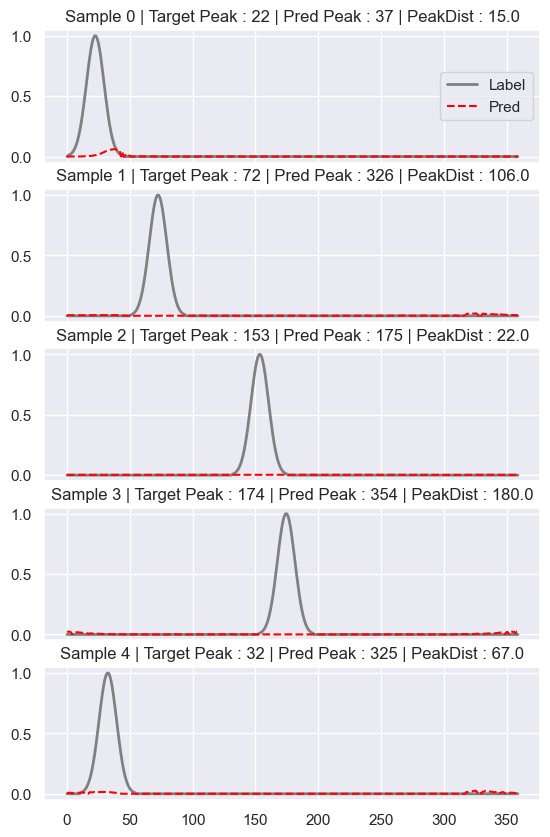

[  2   3   6   9  10  12  13  15  19  20  22  23  24  26  27  28  30  31
  32  33  34  35  36  37  39  40  41 175 318 324 325 326 329 331 333 335
 336 339 340 345 347 350 353 354 355 356 358]
SAVING TO ... /its/home/nn268/antvis/antvis/optics/res_big_loop_saves/models/p3/testing/RealThing_300E_1e-4_ADAM_Eighths_[452, 144]/2c2l/


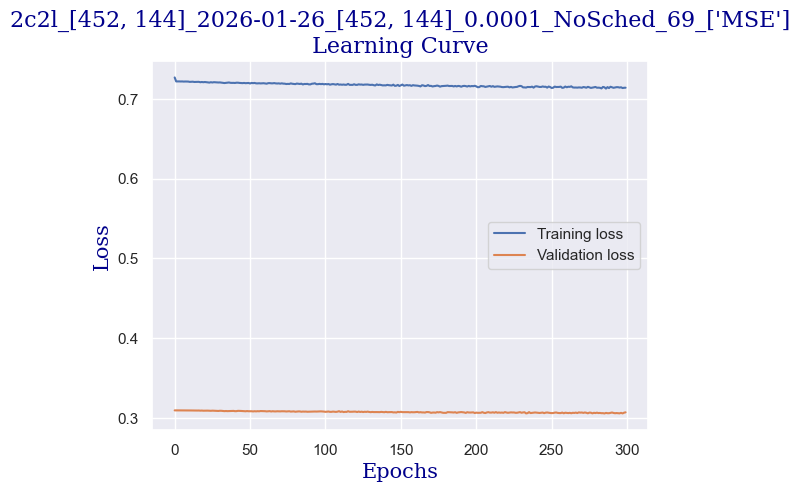

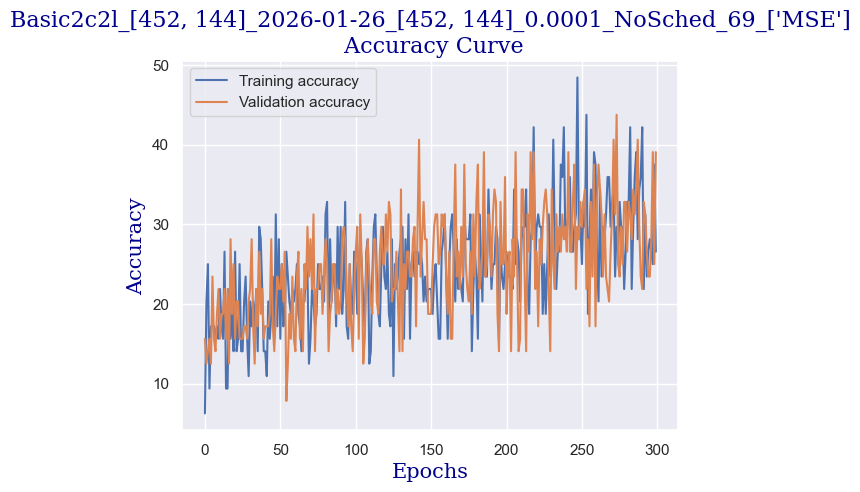

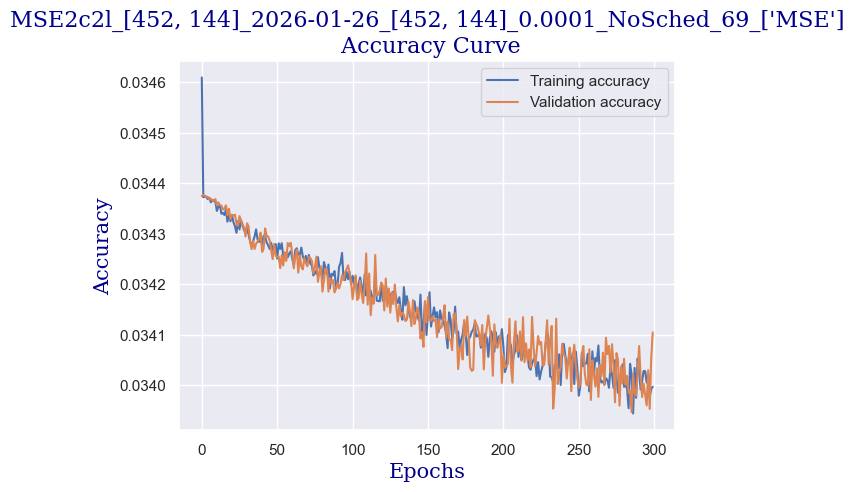

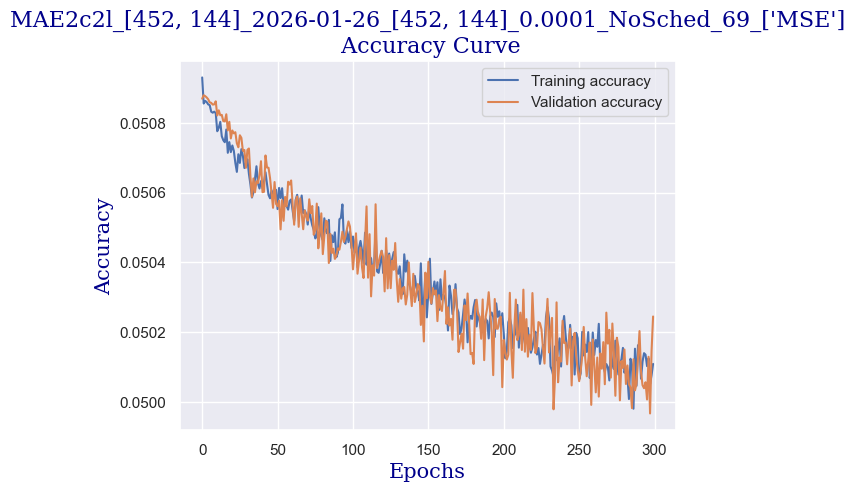

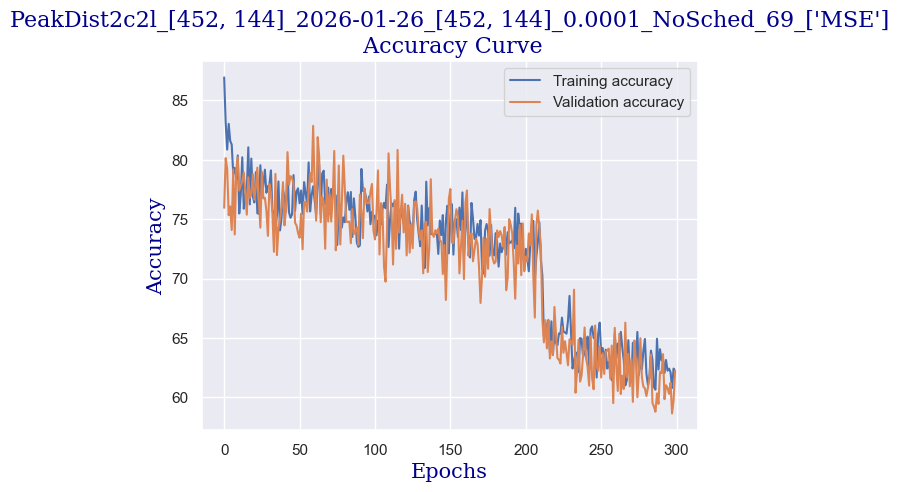

plot_confusion ACTUAL [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36]
plot_confusion PREDICTION [ 0  1  2  3  4 18 32 33 34 35 36]
actual  [33 25 16  8 21 22 12 25  4  3 29 14  6  5 23 32 13 28  0 16 18 32 24  7
  2 36  4  5 36 35 21 17  4 30 32  2 16 32 35 13 20 32 35 31 17 30 16 34
 32  4 20 25 35 17 33  7  0  3  0 30  0 16 30 22 31 29  1 14 31 20  1  2
 19 33  7 35 24  0 26 14  2 24 11  1 35 15 26 24  3 32 32 27  3 24 15  4
  0 14  4 33  9 27  2 35 15  1 28 33 29 12 30 35  4  6 30 21  1 24 25 18
 15  4 25  0 28  1 34 30  4  4 30 17 20 34 12  3 21 21  4 11  4 12 19 32
 13 17 13 33 32 31 31 32  4  3 12  9  6  4  9 17 36 35 26 16 15 14  0  3
  1  8  4  7 13 35 27  7  7  4  4 16 34 33  5 20 13  6 11 35 31 26  9 24
  2  1  9  5 32  0 34 10 18  3 32 34 29 18 14 34 32  6 14 20 28 22 35 26
 26 32 28 27  0 30 32 30  6 14 28 32 11  2 21 28 34 32  4 32  4 11  0  8
  3 30  2  1  6 24  7 32  0 35 29  8 32 33 33 20 29  2 30 20 35 2

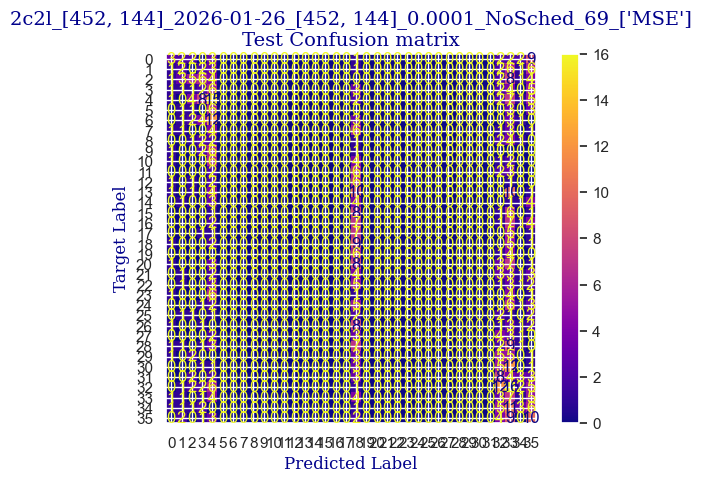

 
 END 2c2l [452, 144] Run Time:  19228.668006481996


Epochs,▁
Test acc rough,▅▃▁▅▄▃▆▆█▃▄▆
TrainAcc rough,▃▁▂▄▃▄▅▄▅▄▆▂▄▄▃▅▇▆▅▃▄▆▅▄▄▇▄▅▅▆▄▄█▇▇█▅▆▆▄
ValAcc rough,▁▃▃▃▂▃▁▅▄▅▅▅▅▅▇▂▄▆▅▅▄▅▅▆▅▅▆▄▆▄▄▅▆▅▇█▆▅██
c_epoch,▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇███
t_loss,██▇▇▇▇▆▆▆▆▆▆▆▆▅▄▅▅▅▃▅▃▄▄▃▂▃▂▂▂▁▃▁▁▂▂▁▁▁▁
test_acc_MAE,▂▂▇▂▅█▂▁▁▄▃▂
test_acc_MSE,▃▂▆▂▅█▁▂▂▄▃▃
test_peakDist,▄▄█▄▂▆▄▄▁▆▄▁
train_err_MAE,██▇▇█▆▆▇▆▆▆▅▇▇▅▄▅▅▃▄▆▆▆▅▄▃▅▄▅▄▅▄▅▂▄▃▆▁▅▄
+6,...


wandb: Agent Starting Run: 2y799p1d with config:
wandb: 	batch_size: 64
wandb: 	epochs: 300
wandb: 	half_ciprange: 22
wandb: 	learning_rate: 0.0001
wandb: 	loss_fn_cards: ['MSE']
wandb: 	model_cards: [{'Ks': [3, 5], 'channels': 3, 'dropout': 0.2, 'f_lin_lay': [1032192, 255744, 62208, 14976, 3072, 640, 128], 'idx': 6, 'model': '2c2l', 'name': '2c2l'}]
wandb: 	optimiser: ['adam']
wandb: 	resolution_cards: [{'index': 0, 'padding': 5, 'resolution': [452, 144]}]
wandb: 	seeds: 56
wandb: 	std_dev: 7
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from /its/home/nn268/.netrc.


{'name': '2c2l', 'model': '2c2l', 'channels': 3, 'Ks': (3, 5), 'f_lin_lay': [1032192, 255744, 62208, 14976, 3072, 640, 128], 'idx': 6, 'dropout': 0.2}
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 1
seed:  56
loss function:  ['MSE']
Batch size:  64
Training epochs:  300
start time:  95750.242186484
Model Name 2c2l
/its/home/nn268/antvis/antvis/optics/NC_IDSW/
set_lossfn    lf  ['MSE']


  0%|                                      | 0/300 [00:00<?, ?it/s]

Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


peak dist means  81.05282738095238
tacc:  {'baseAcc': 14.0625, 'MSE': 0.034374846056813284, 'MAE': 0.05084129458382016, 'peakDist': 81.05282738095238}
Validating...


  0%|                              | 1/300 [00:05<29:00,  5.82s/it]

peak dist means  79.171875
v loss  0.3092768043279648
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  82.8608630952381
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03436837966243426, 'MAE': 0.050835873576856795, 'peakDist': 82.8608630952381}
Validating...


  1%|▏                             | 2/300 [00:12<30:25,  6.13s/it]

peak dist means  80.65277777777777
v loss  0.30932941660284996
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.04761904761905
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034355198875779196, 'MAE': 0.05079128202937898, 'peakDist': 78.04761904761905}
Validating...


  1%|▎                             | 3/300 [00:18<31:26,  6.35s/it]

peak dist means  74.50520833333333
v loss  0.3092411682009697
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.43824404761905
tacc:  {'baseAcc': 28.125, 'MSE': 0.03435741169821648, 'MAE': 0.05081400559062049, 'peakDist': 79.43824404761905}
Validating...


  1%|▍                             | 4/300 [00:25<32:01,  6.49s/it]

peak dist means  79.27604166666667
v loss  0.3092353492975235
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.45014880952381
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034359078676927654, 'MAE': 0.05080487862938926, 'peakDist': 78.45014880952381}
Validating...


  2%|▌                             | 5/300 [00:31<31:49,  6.47s/it]

peak dist means  81.70659722222223
v loss  0.3092074356973171
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.11458333333333
tacc:  {'baseAcc': 18.75, 'MSE': 0.03435087541029567, 'MAE': 0.05078384120549474, 'peakDist': 78.11458333333333}
Validating...


  2%|▌                             | 6/300 [00:38<32:22,  6.61s/it]

peak dist means  78.45486111111111
v loss  0.3091726414859295
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.42410714285714
tacc:  {'baseAcc': 18.75, 'MSE': 0.0343424372729801, 'MAE': 0.05075785304818835, 'peakDist': 76.42410714285714}
Validating...


  2%|▋                             | 7/300 [00:45<32:10,  6.59s/it]

peak dist means  79.30208333333333
v loss  0.3092108331620693
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.02901785714286
tacc:  {'baseAcc': 18.75, 'MSE': 0.03432796487496013, 'MAE': 0.0507243469002701, 'peakDist': 75.02901785714286}
Validating...


  3%|▊                             | 8/300 [00:52<32:30,  6.68s/it]

peak dist means  73.33333333333333
v loss  0.309133667498827
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.05059523809524
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03433242120913097, 'MAE': 0.0507348222391946, 'peakDist': 77.05059523809524}
Validating...


  3%|▉                             | 9/300 [00:58<32:10,  6.63s/it]

peak dist means  78.83506944444444
v loss  0.30911843478679657
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.92931547619048
tacc:  {'baseAcc': 15.625, 'MSE': 0.034319880817617686, 'MAE': 0.050699236669710705, 'peakDist': 75.92931547619048}
Validating...


  3%|▉                            | 10/300 [01:05<31:39,  6.55s/it]

peak dist means  76.19965277777777
v loss  0.30888234823942184
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.99553571428571
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03432062303736096, 'MAE': 0.050706404128244946, 'peakDist': 75.99553571428571}
Validating...


  4%|█                            | 11/300 [01:11<31:12,  6.48s/it]

peak dist means  77.15972222222223
v loss  0.30889761820435524
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.00446428571429
tacc:  {'baseAcc': 18.75, 'MSE': 0.03431620963272594, 'MAE': 0.050689465765442164, 'peakDist': 77.00446428571429}
Validating...


  4%|█▏                           | 12/300 [01:17<30:32,  6.36s/it]

peak dist means  77.43923611111111
v loss  0.3089921623468399
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.22098214285714
tacc:  {'baseAcc': 25.0, 'MSE': 0.03431132453538123, 'MAE': 0.050688517945153375, 'peakDist': 78.22098214285714}
Validating...


  4%|█▎                           | 13/300 [01:23<30:17,  6.33s/it]

peak dist means  76.23611111111111
v loss  0.3088544122874737
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.61160714285714
tacc:  {'baseAcc': 15.625, 'MSE': 0.03432067501403037, 'MAE': 0.05070145357222784, 'peakDist': 79.61160714285714}
Validating...


  5%|█▎                           | 14/300 [01:30<30:06,  6.32s/it]

peak dist means  77.08506944444444
v loss  0.30889491364359856
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.80282738095238
tacc:  {'baseAcc': 17.1875, 'MSE': 0.0342877015826248, 'MAE': 0.05062186469634374, 'peakDist': 74.80282738095238}
Validating...


  5%|█▍                           | 15/300 [01:36<30:07,  6.34s/it]

peak dist means  76.65972222222223
v loss  0.30888058617711067
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.46130952380952
tacc:  {'baseAcc': 10.9375, 'MSE': 0.03430284417810894, 'MAE': 0.050670577301865534, 'peakDist': 76.46130952380952}
Validating...


  5%|█▌                           | 16/300 [01:42<30:12,  6.38s/it]

peak dist means  75.79340277777777
v loss  0.30868514254689217
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.59300595238095
tacc:  {'baseAcc': 12.5, 'MSE': 0.034302207153467906, 'MAE': 0.05066115551051639, 'peakDist': 76.59300595238095}
Validating...


  6%|█▋                           | 17/300 [01:49<29:59,  6.36s/it]

peak dist means  78.859375
v loss  0.308741495013237
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.71056547619048
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03427900710985774, 'MAE': 0.05061124690941402, 'peakDist': 76.71056547619048}
Validating...


  6%|█▋                           | 18/300 [01:55<30:15,  6.44s/it]

peak dist means  76.06597222222223
v loss  0.3087320514023304
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.66071428571429
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034299744913975395, 'MAE': 0.05065677616567839, 'peakDist': 78.66071428571429}
Validating...


  6%|█▊                           | 19/300 [02:02<30:01,  6.41s/it]

peak dist means  77.13715277777777
v loss  0.30882952734827995
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.22098214285714
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03429837436193511, 'MAE': 0.050646246189162844, 'peakDist': 76.22098214285714}
Validating...


  7%|█▉                           | 20/300 [02:08<29:01,  6.22s/it]

peak dist means  74.65972222222223
v loss  0.3086632490158081
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.78497023809524
tacc:  {'baseAcc': 18.75, 'MSE': 0.03429301295961652, 'MAE': 0.050637759268283844, 'peakDist': 78.78497023809524}
Validating...


  7%|██                           | 21/300 [02:14<29:33,  6.36s/it]

peak dist means  76.88888888888889
v loss  0.30866623669862747
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.08928571428571
tacc:  {'baseAcc': 18.75, 'MSE': 0.034289409894318806, 'MAE': 0.05063195721734138, 'peakDist': 77.08928571428571}
Validating...


  7%|██▏                          | 22/300 [02:21<29:49,  6.44s/it]

peak dist means  76.08506944444444
v loss  0.30871928483247757
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.7671130952381
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034273517096326464, 'MAE': 0.05060185793609846, 'peakDist': 75.7671130952381}
Validating...


  8%|██▏                          | 23/300 [02:27<29:58,  6.49s/it]

peak dist means  72.52604166666667
v loss  0.30838894471526146
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.03497023809524
tacc:  {'baseAcc': 21.875, 'MSE': 0.034264320064158665, 'MAE': 0.050578136884030844, 'peakDist': 76.03497023809524}
Validating...


  8%|██▎                          | 24/300 [02:34<30:25,  6.61s/it]

peak dist means  76.88888888888889
v loss  0.30847110599279404
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.3891369047619
tacc:  {'baseAcc': 15.625, 'MSE': 0.034258478986365457, 'MAE': 0.0505517412509237, 'peakDist': 75.3891369047619}
Validating...


  8%|██▍                          | 25/300 [02:41<30:17,  6.61s/it]

peak dist means  70.35590277777777
v loss  0.30824510753154755
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.34077380952381
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03425604442045802, 'MAE': 0.050562129489013126, 'peakDist': 76.34077380952381}
Validating...


  9%|██▌                          | 26/300 [02:48<30:32,  6.69s/it]

peak dist means  73.17708333333333
v loss  0.30839458107948303
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.66294642857143
tacc:  {'baseAcc': 21.875, 'MSE': 0.034260342518488564, 'MAE': 0.05055818351961318, 'peakDist': 76.66294642857143}
Validating...


  9%|██▌                          | 27/300 [02:54<30:00,  6.60s/it]

peak dist means  70.64236111111111
v loss  0.3084743842482567
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.2046130952381
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03426610731652805, 'MAE': 0.050570594058150335, 'peakDist': 76.2046130952381}
Validating...


  9%|██▋                          | 28/300 [03:01<29:32,  6.52s/it]

peak dist means  75.078125
v loss  0.30838189646601677
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.2046130952381
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03426270683606466, 'MAE': 0.05056928382033393, 'peakDist': 77.2046130952381}
Validating...


 10%|██▊                          | 29/300 [03:07<29:13,  6.47s/it]

peak dist means  72.33854166666667
v loss  0.3082411289215088
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.17857142857143
tacc:  {'baseAcc': 21.875, 'MSE': 0.03425038375315212, 'MAE': 0.05054492663059916, 'peakDist': 75.17857142857143}
Validating...


 10%|██▉                          | 30/300 [03:13<28:36,  6.36s/it]

peak dist means  77.14930555555556
v loss  0.30839938670396805
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.45535714285714
tacc:  {'baseAcc': 25.0, 'MSE': 0.03424572962380591, 'MAE': 0.050530600938059035, 'peakDist': 76.45535714285714}
Validating...


 10%|██▉                          | 31/300 [03:19<28:01,  6.25s/it]

peak dist means  76.29166666666667
v loss  0.30839788913726807
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.04017857142857
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03425357579475358, 'MAE': 0.050552466085978916, 'peakDist': 75.04017857142857}
Validating...


 11%|███                          | 32/300 [03:25<28:11,  6.31s/it]

peak dist means  75.30034722222223
v loss  0.3082912154495716
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.34598214285714
tacc:  {'baseAcc': 21.875, 'MSE': 0.03423948124760673, 'MAE': 0.05052518170504343, 'peakDist': 76.34598214285714}
Validating...


 11%|███▏                         | 33/300 [03:32<28:08,  6.32s/it]

peak dist means  73.86805555555556
v loss  0.30812298133969307
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.70535714285714
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034228403121232986, 'MAE': 0.050486681007203604, 'peakDist': 73.70535714285714}
Validating...


 11%|███▎                         | 34/300 [03:38<28:21,  6.40s/it]

peak dist means  72.90104166666667
v loss  0.3083520866930485
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.78794642857143
tacc:  {'baseAcc': 21.875, 'MSE': 0.034239936619997025, 'MAE': 0.050526363331647145, 'peakDist': 77.78794642857143}
Validating...


 12%|███▍                         | 35/300 [03:45<27:58,  6.33s/it]

peak dist means  73.04340277777777
v loss  0.30807363241910934
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.24255952380952
tacc:  {'baseAcc': 21.875, 'MSE': 0.03425292227239836, 'MAE': 0.05054189122858502, 'peakDist': 77.24255952380952}
Validating...


 12%|███▍                         | 36/300 [03:51<27:48,  6.32s/it]

peak dist means  78.76909722222223
v loss  0.30863063409924507
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.17782738095238
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03423067022647176, 'MAE': 0.0505063941790944, 'peakDist': 75.17782738095238}
Validating...


 12%|███▌                         | 37/300 [03:57<27:34,  6.29s/it]

peak dist means  73.16493055555556
v loss  0.3077920563519001
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.95610119047619
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03421991495859055, 'MAE': 0.05048649243655659, 'peakDist': 74.95610119047619}
Validating...


 13%|███▋                         | 38/300 [04:03<27:30,  6.30s/it]

peak dist means  70.51388888888889
v loss  0.30796974524855614
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.65997023809524
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034214433460008534, 'MAE': 0.05045752972364426, 'peakDist': 72.65997023809524}
Validating...


 13%|███▊                         | 39/300 [04:10<28:08,  6.47s/it]

peak dist means  76.296875
v loss  0.3081127740442753
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.46354166666667
tacc:  {'baseAcc': 31.25, 'MSE': 0.034207237795704885, 'MAE': 0.05044641505394663, 'peakDist': 73.46354166666667}
Validating...


 13%|███▊                         | 40/300 [04:17<28:09,  6.50s/it]

peak dist means  73.984375
v loss  0.3079437427222729
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.96354166666667
tacc:  {'baseAcc': 21.875, 'MSE': 0.03422750993853524, 'MAE': 0.050477282099780585, 'peakDist': 73.96354166666667}
Validating...


 14%|███▉                         | 41/300 [04:24<28:21,  6.57s/it]

peak dist means  73.28645833333333
v loss  0.3080606907606125
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.54910714285714
tacc:  {'baseAcc': 12.5, 'MSE': 0.03422148241883233, 'MAE': 0.05048888691124462, 'peakDist': 74.54910714285714}
Validating...


 14%|████                         | 42/300 [04:30<28:33,  6.64s/it]

peak dist means  70.10763888888889
v loss  0.3075553774833679
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.07366071428571
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03419187700464612, 'MAE': 0.05041587849458059, 'peakDist': 71.07366071428571}
Validating...


 14%|████▏                        | 43/300 [04:37<28:15,  6.60s/it]

peak dist means  74.40972222222223
v loss  0.3077092580497265
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.44196428571429
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03421322983645257, 'MAE': 0.05044362977856681, 'peakDist': 74.44196428571429}
Validating...


 15%|████▎                        | 44/300 [04:43<28:11,  6.61s/it]

peak dist means  76.04513888888889
v loss  0.3081134147942066
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.0625
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03421359739842869, 'MAE': 0.05045996109644572, 'peakDist': 75.0625}
Validating...


 15%|████▎                        | 45/300 [04:50<28:00,  6.59s/it]

peak dist means  72.59201388888889
v loss  0.3076438680291176
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.93303571428571
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03420986643149739, 'MAE': 0.05045364158494132, 'peakDist': 73.93303571428571}
Validating...


 15%|████▍                        | 46/300 [04:56<27:34,  6.51s/it]

peak dist means  75.11631944444444
v loss  0.30779648572206497
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.85193452380952
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034191274749381204, 'MAE': 0.05040919727512768, 'peakDist': 74.85193452380952}
Validating...


 16%|████▌                        | 47/300 [05:02<26:52,  6.37s/it]

peak dist means  72.22916666666667
v loss  0.3076968528330326
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.81175595238095
tacc:  {'baseAcc': 25.0, 'MSE': 0.03417700245266869, 'MAE': 0.05039832421711513, 'peakDist': 73.81175595238095}
Validating...


 16%|████▋                        | 48/300 [05:09<26:38,  6.34s/it]

peak dist means  70.53645833333333
v loss  0.30775197222828865
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.2328869047619
tacc:  {'baseAcc': 23.4375, 'MSE': 0.0341822641591231, 'MAE': 0.05038706638983318, 'peakDist': 72.2328869047619}
Validating...


 16%|████▋                        | 49/300 [05:15<26:45,  6.40s/it]

peak dist means  72.00173611111111
v loss  0.30772707611322403
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.37202380952381
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03416938246006057, 'MAE': 0.05038116535260564, 'peakDist': 73.37202380952381}
Validating...


 17%|████▊                        | 50/300 [05:21<26:28,  6.35s/it]

peak dist means  68.79861111111111
v loss  0.3074636571109295
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.71279761904762
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03421201308568319, 'MAE': 0.05045684781812486, 'peakDist': 73.71279761904762}
Validating...


 17%|████▉                        | 51/300 [05:28<26:36,  6.41s/it]

peak dist means  71.74131944444444
v loss  0.30753982439637184
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.24925595238095
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03416426674950691, 'MAE': 0.05035346569049926, 'peakDist': 70.24925595238095}
Validating...


 17%|█████                        | 52/300 [05:34<26:27,  6.40s/it]

peak dist means  73.54861111111111
v loss  0.30761584639549255
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.36309523809524
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034168566089300884, 'MAE': 0.05037104302928561, 'peakDist': 71.36309523809524}
Validating...


 18%|█████                        | 53/300 [05:41<26:41,  6.48s/it]

peak dist means  70.29340277777777
v loss  0.3075880818068981
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.10193452380952
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03418659472039768, 'MAE': 0.05041549478967985, 'peakDist': 75.10193452380952}
Validating...


 18%|█████▏                       | 54/300 [05:47<26:28,  6.46s/it]

peak dist means  71.296875
v loss  0.3074311278760433
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.05282738095238
tacc:  {'baseAcc': 21.875, 'MSE': 0.03415274318485033, 'MAE': 0.0503273881262257, 'peakDist': 72.05282738095238}
Validating...


 18%|█████▎                       | 55/300 [05:54<26:52,  6.58s/it]

peak dist means  76.08333333333333
v loss  0.3075851611793041
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.81026785714286
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03415313753343764, 'MAE': 0.05032846420293763, 'peakDist': 71.81026785714286}
Validating...


 19%|█████▍                       | 56/300 [06:01<26:42,  6.57s/it]

peak dist means  72.08506944444444
v loss  0.30746712535619736
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.8608630952381
tacc:  {'baseAcc': 25.0, 'MSE': 0.03417412617376873, 'MAE': 0.05039450543976966, 'peakDist': 73.8608630952381}
Validating...


 19%|█████▌                       | 57/300 [06:07<26:22,  6.51s/it]

peak dist means  71.59548611111111
v loss  0.30708540230989456
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.70535714285714
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03418746448698498, 'MAE': 0.050402249431326276, 'peakDist': 73.70535714285714}
Validating...


 19%|█████▌                       | 58/300 [06:14<26:10,  6.49s/it]

peak dist means  71.72395833333333
v loss  0.3075866475701332
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.24479166666667
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03414414148955118, 'MAE': 0.050333314353511446, 'peakDist': 69.24479166666667}
Validating...


 20%|█████▋                       | 59/300 [06:20<26:07,  6.50s/it]

peak dist means  70.99652777777777
v loss  0.30739082023501396
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.27157738095238
tacc:  {'baseAcc': 18.75, 'MSE': 0.03414569103292057, 'MAE': 0.05033300178391593, 'peakDist': 73.27157738095238}
Validating...


 20%|█████▊                       | 60/300 [06:27<25:53,  6.47s/it]

peak dist means  69.77083333333333
v loss  0.30682187527418137
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.13467261904762
tacc:  {'baseAcc': 18.75, 'MSE': 0.03417636400886944, 'MAE': 0.05039311572909355, 'peakDist': 76.13467261904762}
Validating...


 20%|█████▉                       | 61/300 [06:33<25:52,  6.50s/it]

peak dist means  71.08854166666667
v loss  0.3077875040471554
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.47991071428571
tacc:  {'baseAcc': 28.125, 'MSE': 0.03416306525468826, 'MAE': 0.050364219361827486, 'peakDist': 71.47991071428571}
Validating...


 21%|█████▉                       | 62/300 [06:39<25:26,  6.41s/it]

peak dist means  71.88541666666667
v loss  0.3074704520404339
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.66145833333333
tacc:  {'baseAcc': 39.0625, 'MSE': 0.034154230107863746, 'MAE': 0.05034309643365088, 'peakDist': 73.66145833333333}
Validating...


 21%|██████                       | 63/300 [06:46<25:09,  6.37s/it]

peak dist means  70.67708333333333
v loss  0.3072223849594593
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.96428571428571
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034140358900740034, 'MAE': 0.05031308496282214, 'peakDist': 72.96428571428571}
Validating...


 21%|██████▏                      | 64/300 [06:52<24:58,  6.35s/it]

peak dist means  69.14930555555556
v loss  0.3068941906094551
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.8139880952381
tacc:  {'baseAcc': 28.125, 'MSE': 0.034119998947495504, 'MAE': 0.05028038117147628, 'peakDist': 71.8139880952381}
Validating...


 22%|██████▎                      | 65/300 [06:58<24:41,  6.31s/it]

peak dist means  70.31076388888889
v loss  0.30707190185785294
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.49702380952381
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034133625704617726, 'MAE': 0.05028623448950904, 'peakDist': 72.49702380952381}
Validating...


 22%|██████▍                      | 66/300 [07:04<24:24,  6.26s/it]

peak dist means  73.77604166666667
v loss  0.3077569492161274
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.17633928571429
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03411704408270972, 'MAE': 0.05028070704568, 'peakDist': 72.17633928571429}
Validating...


 22%|██████▍                      | 67/300 [07:11<24:29,  6.31s/it]

peak dist means  73.41493055555556
v loss  0.30703410878777504
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.28422619047619
tacc:  {'baseAcc': 21.875, 'MSE': 0.034137800513278874, 'MAE': 0.05031981248231161, 'peakDist': 73.28422619047619}
Validating...


 23%|██████▌                      | 68/300 [07:17<24:14,  6.27s/it]

peak dist means  72.25
v loss  0.30720246210694313
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.71577380952381
tacc:  {'baseAcc': 31.25, 'MSE': 0.03413346569452967, 'MAE': 0.05029329355983507, 'peakDist': 70.71577380952381}
Validating...


 23%|██████▋                      | 69/300 [07:23<24:28,  6.36s/it]

peak dist means  71.265625
v loss  0.30753951519727707
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.35119047619048
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03414632220353399, 'MAE': 0.05032353067681903, 'peakDist': 74.35119047619048}
Validating...


 23%|██████▊                      | 70/300 [07:30<24:50,  6.48s/it]

peak dist means  74.69444444444444
v loss  0.3074515089392662
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.34821428571429
tacc:  {'baseAcc': 28.125, 'MSE': 0.03413675157796769, 'MAE': 0.05032678391961824, 'peakDist': 72.34821428571429}
Validating...


 24%|██████▊                      | 71/300 [07:37<24:48,  6.50s/it]

peak dist means  72.296875
v loss  0.3069715164601803
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.43675595238095
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03409559315159207, 'MAE': 0.05022388891804786, 'peakDist': 70.43675595238095}
Validating...


 24%|██████▉                      | 72/300 [07:44<25:13,  6.64s/it]

peak dist means  68.015625
v loss  0.3068389855325222
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.40699404761905
tacc:  {'baseAcc': 21.875, 'MSE': 0.03410648217513448, 'MAE': 0.05023258143947238, 'peakDist': 69.40699404761905}
Validating...


 24%|███████                      | 73/300 [07:50<24:53,  6.58s/it]

peak dist means  72.57986111111111
v loss  0.3069281727075577
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.02901785714286
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03411873731584776, 'MAE': 0.05025586751954896, 'peakDist': 69.02901785714286}
Validating...


 25%|███████▏                     | 74/300 [07:57<24:54,  6.61s/it]

peak dist means  74.65972222222223
v loss  0.30722592398524284
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.04017857142857
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03412572808918499, 'MAE': 0.0502920484259015, 'peakDist': 75.04017857142857}
Validating...


 25%|███████▎                     | 75/300 [08:03<24:45,  6.60s/it]

peak dist means  69.93576388888889
v loss  0.30700455233454704
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.54315476190476
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03411534943041347, 'MAE': 0.05028773010486648, 'peakDist': 72.54315476190476}
Validating...


 25%|███████▎                     | 76/300 [08:10<24:25,  6.54s/it]

peak dist means  69.88888888888889
v loss  0.30652090162038803
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.16592261904762
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03408368747858774, 'MAE': 0.05020778466548238, 'peakDist': 72.16592261904762}
Validating...


 26%|███████▍                     | 77/300 [08:16<24:09,  6.50s/it]

peak dist means  73.19270833333333
v loss  0.30663807317614555
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.84747023809524
tacc:  {'baseAcc': 35.9375, 'MSE': 0.034116454067684356, 'MAE': 0.05026538741020929, 'peakDist': 71.84747023809524}
Validating...


 26%|███████▌                     | 78/300 [08:22<23:43,  6.41s/it]

peak dist means  68.31944444444444
v loss  0.3065697215497494
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.19940476190476
tacc:  {'baseAcc': 28.125, 'MSE': 0.03405930634055819, 'MAE': 0.050174147955008915, 'peakDist': 70.19940476190476}
Validating...


 26%|███████▋                     | 79/300 [08:29<23:17,  6.32s/it]

peak dist means  68.86111111111111
v loss  0.30646350607275963
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.36011904761905
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034079430890934806, 'MAE': 0.050192264573914666, 'peakDist': 69.36011904761905}
Validating...


 27%|███████▋                     | 80/300 [08:35<23:00,  6.28s/it]

peak dist means  72.07638888888889
v loss  0.30700527504086494
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.83110119047619
tacc:  {'baseAcc': 34.375, 'MSE': 0.03410535305738449, 'MAE': 0.050243425582136424, 'peakDist': 71.83110119047619}
Validating...


 27%|███████▊                     | 81/300 [08:41<22:51,  6.26s/it]

peak dist means  72.35069444444444
v loss  0.3067437708377838
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.60342261904762
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03410821975696655, 'MAE': 0.0502556636929512, 'peakDist': 72.60342261904762}
Validating...


 27%|███████▉                     | 82/300 [08:47<22:52,  6.29s/it]

peak dist means  71.515625
v loss  0.30724821612238884
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.18154761904762
tacc:  {'baseAcc': 21.875, 'MSE': 0.03411367145322618, 'MAE': 0.05028173717714492, 'peakDist': 74.18154761904762}
Validating...


 28%|████████                     | 83/300 [08:54<23:02,  6.37s/it]

peak dist means  68.76909722222223
v loss  0.3066992163658142
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.35714285714286
tacc:  {'baseAcc': 21.875, 'MSE': 0.034044746841703145, 'MAE': 0.05014559254050255, 'peakDist': 70.35714285714286}
Validating...


 28%|████████                     | 84/300 [09:00<23:09,  6.43s/it]

peak dist means  73.59027777777777
v loss  0.30669280141592026
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.59449404761905
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03405546822718212, 'MAE': 0.0501646740095956, 'peakDist': 70.59449404761905}
Validating...


 28%|████████▏                    | 85/300 [09:07<23:10,  6.47s/it]

peak dist means  69.953125
v loss  0.30675163120031357
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.56026785714286
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034102726727724075, 'MAE': 0.05026090961127054, 'peakDist': 74.56026785714286}
Validating...


 29%|████████▎                    | 86/300 [09:14<23:13,  6.51s/it]

peak dist means  70.59895833333333
v loss  0.3068479672074318
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.18377976190476
tacc:  {'baseAcc': 28.125, 'MSE': 0.0340768535222326, 'MAE': 0.050206699719031654, 'peakDist': 71.18377976190476}
Validating...


 29%|████████▍                    | 87/300 [09:20<23:11,  6.53s/it]

peak dist means  71.64236111111111
v loss  0.3069799430668354
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.07738095238095
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03407555162197068, 'MAE': 0.05020416971473467, 'peakDist': 72.07738095238095}
Validating...


 29%|████████▌                    | 88/300 [09:27<23:38,  6.69s/it]

peak dist means  68.6875
v loss  0.30631934478878975
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.6421130952381
tacc:  {'baseAcc': 21.875, 'MSE': 0.03409412556460926, 'MAE': 0.0502202037189688, 'peakDist': 71.6421130952381}
Validating...


 30%|████████▌                    | 89/300 [09:34<23:55,  6.80s/it]

peak dist means  76.11458333333333
v loss  0.3068956099450588
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.79910714285714
tacc:  {'baseAcc': 31.25, 'MSE': 0.03405990150003206, 'MAE': 0.050180005885305856, 'peakDist': 70.79910714285714}
Validating...


 30%|████████▋                    | 90/300 [09:41<24:04,  6.88s/it]

peak dist means  69.17013888888889
v loss  0.3068613223731518
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.41369047619048
tacc:  {'baseAcc': 28.125, 'MSE': 0.03410633121218, 'MAE': 0.050256382141794474, 'peakDist': 73.41369047619048}
Validating...


 30%|████████▊                    | 91/300 [09:48<24:08,  6.93s/it]

peak dist means  69.35416666666667
v loss  0.306791253387928
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.09077380952381
tacc:  {'baseAcc': 40.625, 'MSE': 0.034094231646685375, 'MAE': 0.05023746263413202, 'peakDist': 70.09077380952381}
Validating...


 31%|████████▉                    | 92/300 [09:55<23:58,  6.92s/it]

peak dist means  69.13194444444444
v loss  0.30673493072390556
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.02008928571429
tacc:  {'baseAcc': 28.125, 'MSE': 0.034072229017814, 'MAE': 0.050190946885517666, 'peakDist': 71.02008928571429}
Validating...


 31%|████████▉                    | 93/300 [10:02<23:27,  6.80s/it]

peak dist means  72.828125
v loss  0.3066243566572666
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.32291666666667
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03407040752825283, 'MAE': 0.0502081641129085, 'peakDist': 71.32291666666667}
Validating...


 31%|█████████                    | 94/300 [10:09<23:13,  6.77s/it]

peak dist means  72.171875
v loss  0.3066943362355232
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.8921130952381
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034041113974083034, 'MAE': 0.050148852524303254, 'peakDist': 71.8921130952381}
Validating...


 32%|█████████▏                   | 95/300 [10:15<22:43,  6.65s/it]

peak dist means  71.43923611111111
v loss  0.3071216754615307
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.82738095238095
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03407590818547067, 'MAE': 0.05019870364949817, 'peakDist': 70.82738095238095}
Validating...


 32%|█████████▎                   | 96/300 [10:21<22:24,  6.59s/it]

peak dist means  68.80381944444444
v loss  0.30646827816963196
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.4702380952381
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03406345737831933, 'MAE': 0.050182570658978964, 'peakDist': 73.4702380952381}
Validating...


 32%|█████████▍                   | 97/300 [10:28<22:04,  6.52s/it]

peak dist means  72.01388888888889
v loss  0.3066413626074791
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.38467261904762
tacc:  {'baseAcc': 21.875, 'MSE': 0.03404717040913446, 'MAE': 0.05015484633899871, 'peakDist': 71.38467261904762}
Validating...


 33%|█████████▍                   | 98/300 [10:34<21:46,  6.47s/it]

peak dist means  70.66493055555556
v loss  0.30629509314894676
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.77232142857143
tacc:  {'baseAcc': 25.0, 'MSE': 0.03403793931716964, 'MAE': 0.05014796519563312, 'peakDist': 71.77232142857143}
Validating...


 33%|█████████▌                   | 99/300 [10:40<21:22,  6.38s/it]

peak dist means  70.14409722222223
v loss  0.30625399947166443
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.64657738095238
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034068123215720766, 'MAE': 0.05016068174015908, 'peakDist': 70.64657738095238}
Validating...


 33%|█████████▎                  | 100/300 [10:47<21:10,  6.35s/it]

peak dist means  66.26215277777777
v loss  0.30643365532159805
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.35267857142857
tacc:  {'baseAcc': 39.0625, 'MSE': 0.034031703181210016, 'MAE': 0.05011731226529394, 'peakDist': 69.35267857142857}
Validating...


 34%|█████████▍                  | 101/300 [10:53<21:12,  6.39s/it]

peak dist means  68.70486111111111
v loss  0.30635496973991394
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.96056547619048
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034030563242378686, 'MAE': 0.05012042057656106, 'peakDist': 69.96056547619048}
Validating...


 34%|█████████▌                  | 102/300 [10:59<21:07,  6.40s/it]

peak dist means  69.03645833333333
v loss  0.3064684122800827
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.1264880952381
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034019247052215394, 'MAE': 0.05010069250350907, 'peakDist': 69.1264880952381}
Validating...


 34%|█████████▌                  | 103/300 [11:05<20:41,  6.30s/it]

peak dist means  68.33159722222223
v loss  0.3062441945075989
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.21875
tacc:  {'baseAcc': 39.0625, 'MSE': 0.034059553096691765, 'MAE': 0.050167271601302285, 'peakDist': 71.21875}
Validating...


 35%|█████████▋                  | 104/300 [11:12<20:27,  6.26s/it]

peak dist means  67.88194444444444
v loss  0.3061387501657009
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  68.98735119047619
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03404029813550767, 'MAE': 0.05013286109481539, 'peakDist': 68.98735119047619}
Validating...


 35%|█████████▊                  | 105/300 [11:18<20:49,  6.41s/it]

peak dist means  70.67708333333333
v loss  0.3067629039287567
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.56547619047619
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034057692935069404, 'MAE': 0.05016811617783138, 'peakDist': 72.56547619047619}
Validating...


 35%|█████████▉                  | 106/300 [11:23<18:52,  5.84s/it]

peak dist means  70.36979166666667
v loss  0.30666733905673027
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.21577380952381
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03405902800815446, 'MAE': 0.05016112256617773, 'peakDist': 70.21577380952381}
Validating...


 36%|█████████▉                  | 107/300 [11:27<17:16,  5.37s/it]

peak dist means  67.64236111111111
v loss  0.30580269545316696
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.28794642857143
tacc:  {'baseAcc': 31.25, 'MSE': 0.03401430465635799, 'MAE': 0.05010068576250758, 'peakDist': 71.28794642857143}
Validating...


 36%|██████████                  | 108/300 [11:33<17:28,  5.46s/it]

peak dist means  69.65798611111111
v loss  0.306339044123888
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.47544642857143
tacc:  {'baseAcc': 34.375, 'MSE': 0.034027140942357835, 'MAE': 0.05009747225613821, 'peakDist': 69.47544642857143}
Validating...


 36%|██████████▏                 | 109/300 [11:39<18:13,  5.72s/it]

peak dist means  67.91145833333333
v loss  0.3062044382095337
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.88541666666667
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03406122663900966, 'MAE': 0.050158409490471796, 'peakDist': 72.88541666666667}
Validating...


 37%|██████████▎                 | 110/300 [11:45<18:21,  5.80s/it]

peak dist means  72.40451388888889
v loss  0.30645938962697983
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.72247023809524
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034056843036697024, 'MAE': 0.050177441289027534, 'peakDist': 71.72247023809524}
Validating...


 37%|██████████▎                 | 111/300 [11:52<18:51,  5.99s/it]

peak dist means  71.76388888888889
v loss  0.30668799579143524
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.99776785714286
tacc:  {'baseAcc': 31.25, 'MSE': 0.034024197253442946, 'MAE': 0.05010087841323444, 'peakDist': 70.99776785714286}
Validating...


 37%|██████████▍                 | 112/300 [11:58<18:45,  5.99s/it]

peak dist means  68.32118055555556
v loss  0.30636725202202797
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.65178571428571
tacc:  {'baseAcc': 31.25, 'MSE': 0.03407342288465727, 'MAE': 0.05019542894193104, 'peakDist': 71.65178571428571}
Validating...


 38%|██████████▌                 | 113/300 [12:04<18:49,  6.04s/it]

peak dist means  70.59201388888889
v loss  0.30659376457333565
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  68.58928571428571
tacc:  {'baseAcc': 28.125, 'MSE': 0.03403473361617043, 'MAE': 0.0501092675895918, 'peakDist': 68.58928571428571}
Validating...


 38%|██████████▋                 | 114/300 [12:11<19:29,  6.29s/it]

peak dist means  64.78298611111111
v loss  0.3055921383202076
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  68.86904761904762
tacc:  {'baseAcc': 28.125, 'MSE': 0.033981148685727804, 'MAE': 0.05003040798363231, 'peakDist': 68.86904761904762}
Validating...


 38%|██████████▋                 | 115/300 [12:17<19:25,  6.30s/it]

peak dist means  68.53993055555556
v loss  0.30595965310931206
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.00223214285714
tacc:  {'baseAcc': 28.125, 'MSE': 0.034013050830080396, 'MAE': 0.05008251539298466, 'peakDist': 69.00223214285714}
Validating...


 39%|██████████▊                 | 116/300 [12:24<19:46,  6.45s/it]

peak dist means  69.0
v loss  0.30601659789681435
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.4858630952381
tacc:  {'baseAcc': 37.5, 'MSE': 0.03403504139610699, 'MAE': 0.050131820319663914, 'peakDist': 70.4858630952381}
Validating...


 39%|██████████▉                 | 117/300 [12:30<19:42,  6.46s/it]

peak dist means  62.59722222222222
v loss  0.30572280287742615
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.69717261904762
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03398285646523748, 'MAE': 0.05002464903962044, 'peakDist': 67.69717261904762}
Validating...


 39%|███████████                 | 118/300 [12:37<19:40,  6.49s/it]

peak dist means  70.33680555555556
v loss  0.3058716580271721
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.59002976190476
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03403856942341441, 'MAE': 0.05015455257324945, 'peakDist': 71.59002976190476}
Validating...


 40%|███████████                 | 119/300 [12:44<19:53,  6.59s/it]

peak dist means  70.88194444444444
v loss  0.30613432452082634
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.21056547619048
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03399973575557981, 'MAE': 0.050083424541212264, 'peakDist': 71.21056547619048}
Validating...


 40%|███████████▏                | 120/300 [12:50<19:37,  6.54s/it]

peak dist means  65.32638888888889
v loss  0.30615272000432014
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.21949404761905
tacc:  {'baseAcc': 23.4375, 'MSE': 0.0340491866781598, 'MAE': 0.05014100209588096, 'peakDist': 71.21949404761905}
Validating...


 40%|███████████▎                | 121/300 [12:56<19:21,  6.49s/it]

peak dist means  66.59548611111111
v loss  0.3059011474251747
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.44345238095238
tacc:  {'baseAcc': 25.0, 'MSE': 0.03402387723326683, 'MAE': 0.05011064665658133, 'peakDist': 70.44345238095238}
Validating...


 41%|███████████▍                | 122/300 [13:03<18:58,  6.40s/it]

peak dist means  70.54861111111111
v loss  0.30612123012542725
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  68.45535714285714
tacc:  {'baseAcc': 25.0, 'MSE': 0.03395388452779679, 'MAE': 0.04999513782206036, 'peakDist': 68.45535714285714}
Validating...


 41%|███████████▍                | 123/300 [13:09<18:40,  6.33s/it]

peak dist means  68.51388888888889
v loss  0.30631792545318604
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  68.22842261904762
tacc:  {'baseAcc': 34.375, 'MSE': 0.03398132093605541, 'MAE': 0.0500492960924194, 'peakDist': 68.22842261904762}
Validating...


 41%|███████████▌                | 124/300 [13:15<18:21,  6.26s/it]

peak dist means  69.00520833333333
v loss  0.30589209869503975
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.09895833333333
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03399985833537011, 'MAE': 0.050080206245183945, 'peakDist': 69.09895833333333}
Validating...


 42%|███████████▋                | 125/300 [13:21<18:07,  6.22s/it]

peak dist means  70.87326388888889
v loss  0.30601705238223076
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.7172619047619
tacc:  {'baseAcc': 31.25, 'MSE': 0.033993086289791835, 'MAE': 0.05006658143940426, 'peakDist': 71.7172619047619}
Validating...


 42%|███████████▊                | 126/300 [13:28<18:17,  6.31s/it]

peak dist means  70.078125
v loss  0.30630359798669815
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.82589285714286
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03402692185980933, 'MAE': 0.05011929731283869, 'peakDist': 69.82589285714286}
Validating...


 42%|███████████▊                | 127/300 [13:34<18:12,  6.31s/it]

peak dist means  67.29166666666667
v loss  0.3062272109091282
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.31324404761905
tacc:  {'baseAcc': 34.375, 'MSE': 0.034029332477421986, 'MAE': 0.05010873717921121, 'peakDist': 71.31324404761905}
Validating...


 43%|███████████▉                | 128/300 [13:40<17:59,  6.28s/it]

peak dist means  66.29513888888889
v loss  0.3064848966896534
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.595982142857146
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03401110463199161, 'MAE': 0.05007764235848472, 'peakDist': 62.595982142857146}
Validating...


 43%|████████████                | 129/300 [13:47<18:10,  6.38s/it]

peak dist means  63.873263888888886
v loss  0.3063846714794636
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.30133928571429
tacc:  {'baseAcc': 34.375, 'MSE': 0.0340204622064318, 'MAE': 0.05011262318917683, 'peakDist': 64.30133928571429}
Validating...


 43%|████████████▏               | 130/300 [13:53<18:05,  6.38s/it]

peak dist means  63.357638888888886
v loss  0.3058216944336891
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.69345238095238
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03403068475780033, 'MAE': 0.05010557139203662, 'peakDist': 62.69345238095238}
Validating...


 44%|████████████▏               | 131/300 [14:00<18:16,  6.49s/it]

peak dist means  68.73784722222223
v loss  0.30618469417095184
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.30505952380952
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03396004243266015, 'MAE': 0.04999899367491404, 'peakDist': 64.30505952380952}
Validating...


 44%|████████████▎               | 132/300 [14:06<18:05,  6.46s/it]

peak dist means  60.708333333333336
v loss  0.3056568093597889
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.47172619047619
tacc:  {'baseAcc': 31.25, 'MSE': 0.033965861868290675, 'MAE': 0.050017052108333224, 'peakDist': 64.47172619047619}
Validating...


 44%|████████████▍               | 133/300 [14:13<18:01,  6.48s/it]

peak dist means  61.75347222222222
v loss  0.30600161105394363
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.960565476190474
tacc:  {'baseAcc': 28.125, 'MSE': 0.03401515969917888, 'MAE': 0.05010594196972393, 'peakDist': 63.960565476190474}
Validating...


 45%|████████████▌               | 134/300 [14:19<18:02,  6.52s/it]

peak dist means  67.125
v loss  0.30615850538015366
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.476934523809526
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03398398026114419, 'MAE': 0.05001369633135341, 'peakDist': 61.476934523809526}
Validating...


 45%|████████████▌               | 135/300 [14:26<18:01,  6.56s/it]

peak dist means  60.982638888888886
v loss  0.30586791038513184
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.742559523809526
tacc:  {'baseAcc': 28.125, 'MSE': 0.03397882463676589, 'MAE': 0.05003490547339121, 'peakDist': 62.742559523809526}
Validating...


 45%|████████████▋               | 136/300 [14:32<17:43,  6.49s/it]

peak dist means  63.39930555555556
v loss  0.3063759505748749
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.560267857142854
tacc:  {'baseAcc': 28.125, 'MSE': 0.03398512286089715, 'MAE': 0.05000943601841018, 'peakDist': 62.560267857142854}
Validating...


 46%|████████████▊               | 137/300 [14:39<17:27,  6.42s/it]

peak dist means  69.796875
v loss  0.3064473830163479
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.473958333333336
tacc:  {'baseAcc': 34.375, 'MSE': 0.03400282934308052, 'MAE': 0.05006636714651471, 'peakDist': 61.473958333333336}
Validating...


 46%|████████████▉               | 138/300 [14:45<17:13,  6.38s/it]

peak dist means  58.263888888888886
v loss  0.3058857135474682
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.010416666666664
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03400093742779323, 'MAE': 0.05003920711931728, 'peakDist': 61.010416666666664}
Validating...


 46%|████████████▉               | 139/300 [14:51<17:16,  6.44s/it]

peak dist means  61.89756944444444
v loss  0.3056822717189789
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.167410714285715
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03396328999882653, 'MAE': 0.050022270707857044, 'peakDist': 62.167410714285715}
Validating...


 47%|█████████████               | 140/300 [14:58<17:03,  6.40s/it]

peak dist means  65.82638888888889
v loss  0.30591337755322456
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.19270833333333
tacc:  {'baseAcc': 26.5625, 'MSE': 0.033980683024440496, 'MAE': 0.05005121851960818, 'peakDist': 65.19270833333333}
Validating...


 47%|█████████████▏              | 141/300 [15:04<16:57,  6.40s/it]

peak dist means  63.71006944444444
v loss  0.30582084506750107
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.745535714285715
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03392386808991432, 'MAE': 0.049960424325295856, 'peakDist': 63.745535714285715}
Validating...


 47%|█████████████▎              | 142/300 [15:10<16:45,  6.37s/it]

peak dist means  64.64236111111111
v loss  0.3060734048485756
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.705357142857146
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03396066189521835, 'MAE': 0.05002171439783914, 'peakDist': 63.705357142857146}
Validating...


 48%|█████████████▎              | 143/300 [15:17<16:38,  6.36s/it]

peak dist means  62.72743055555556
v loss  0.3062781095504761
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.764136904761905
tacc:  {'baseAcc': 34.375, 'MSE': 0.033918713175115134, 'MAE': 0.04993295634076709, 'peakDist': 59.764136904761905}
Validating...


 48%|█████████████▍              | 144/300 [15:23<16:10,  6.22s/it]

peak dist means  61.458333333333336
v loss  0.3052268624305725
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.28497023809524
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03400957850473268, 'MAE': 0.05008171658430781, 'peakDist': 64.28497023809524}
Validating...


 48%|█████████████▌              | 145/300 [15:29<16:16,  6.30s/it]

peak dist means  58.16840277777778
v loss  0.3058047853410244
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.85044642857143
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03394116496755963, 'MAE': 0.04998491704463959, 'peakDist': 61.85044642857143}
Validating...


 49%|█████████████▋              | 146/300 [15:36<16:33,  6.45s/it]

peak dist means  64.65972222222223
v loss  0.30627476796507835
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.03050595238095
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03395441316422962, 'MAE': 0.04999491714295887, 'peakDist': 62.03050595238095}
Validating...


 49%|█████████████▋              | 147/300 [15:42<16:17,  6.39s/it]

peak dist means  65.45833333333333
v loss  0.3062562607228756
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.239583333333336
tacc:  {'baseAcc': 37.5, 'MSE': 0.03394075341167904, 'MAE': 0.049965955494415196, 'peakDist': 61.239583333333336}
Validating...


 49%|█████████████▊              | 148/300 [15:49<16:15,  6.41s/it]

peak dist means  66.51909722222223
v loss  0.3063236325979233
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.08184523809524
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03397581389262563, 'MAE': 0.050043195663463505, 'peakDist': 61.08184523809524}
Validating...


 50%|█████████████▉              | 149/300 [15:55<16:19,  6.49s/it]

peak dist means  63.545138888888886
v loss  0.3060437701642513
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.09821428571429
tacc:  {'baseAcc': 35.9375, 'MSE': 0.033952877280258, 'MAE': 0.04998167533250082, 'peakDist': 64.09821428571429}
Validating...


 50%|██████████████              | 150/300 [16:02<16:05,  6.44s/it]

peak dist means  61.626736111111114
v loss  0.30546388402581215
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.83110119047619
tacc:  {'baseAcc': 37.5, 'MSE': 0.03395790819610868, 'MAE': 0.050019575016839166, 'peakDist': 63.83110119047619}
Validating...


 50%|██████████████              | 151/300 [16:08<16:01,  6.45s/it]

peak dist means  62.479166666666664
v loss  0.3056086003780365
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.43154761904762
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03395616937251318, 'MAE': 0.05004322706233887, 'peakDist': 64.43154761904762}
Validating...


 51%|██████████████▏             | 152/300 [16:14<15:45,  6.39s/it]

peak dist means  62.32118055555556
v loss  0.30616018176078796
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.764136904761905
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034003128785462605, 'MAE': 0.05010473408869335, 'peakDist': 62.764136904761905}
Validating...


 51%|██████████████▎             | 153/300 [16:21<15:40,  6.40s/it]

peak dist means  60.817708333333336
v loss  0.3057965822517872
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.560267857142854
tacc:  {'baseAcc': 32.8125, 'MSE': 0.033960304799534026, 'MAE': 0.049993387113014855, 'peakDist': 61.560267857142854}
Validating...


 51%|██████████████▎             | 154/300 [16:27<15:19,  6.30s/it]

peak dist means  61.703125
v loss  0.3060920499265194
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.076636904761905
tacc:  {'baseAcc': 42.1875, 'MSE': 0.03389839420006389, 'MAE': 0.04989725759341603, 'peakDist': 60.076636904761905}
Validating...


 52%|██████████████▍             | 155/300 [16:33<15:10,  6.28s/it]

peak dist means  65.63020833333333
v loss  0.30629006028175354
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.94642857142857
tacc:  {'baseAcc': 25.0, 'MSE': 0.03394553668442227, 'MAE': 0.05000050011135283, 'peakDist': 62.94642857142857}
Validating...


 52%|██████████████▌             | 156/300 [16:39<15:06,  6.30s/it]

peak dist means  61.10243055555556
v loss  0.3056834377348423
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.78050595238095
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034044429659843445, 'MAE': 0.05014949345162937, 'peakDist': 62.78050595238095}
Validating...


 52%|██████████████▋             | 157/300 [16:45<14:50,  6.23s/it]

peak dist means  59.74652777777778
v loss  0.30575400218367577
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.0
tacc:  {'baseAcc': 28.125, 'MSE': 0.033975900816065926, 'MAE': 0.050020684266374224, 'peakDist': 64.0}
Validating...


 53%|██████████████▋             | 158/300 [16:52<14:45,  6.23s/it]

peak dist means  68.72743055555556
v loss  0.3061288669705391
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.15327380952381
tacc:  {'baseAcc': 31.25, 'MSE': 0.033930561372212, 'MAE': 0.04996329652411597, 'peakDist': 61.15327380952381}
Validating...


 53%|██████████████▊             | 159/300 [16:58<14:55,  6.35s/it]

peak dist means  61.927083333333336
v loss  0.3061327189207077
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.763392857142854
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03393868605295817, 'MAE': 0.04999342472070739, 'peakDist': 61.763392857142854}
Validating...


 53%|██████████████▉             | 160/300 [17:05<14:52,  6.38s/it]

peak dist means  60.48090277777778
v loss  0.3061344511806965
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.75297619047619
tacc:  {'baseAcc': 37.5, 'MSE': 0.03390504721374739, 'MAE': 0.04990813987595694, 'peakDist': 59.75297619047619}
Validating...


 54%|███████████████             | 161/300 [17:11<15:00,  6.48s/it]

peak dist means  61.467013888888886
v loss  0.3056599125266075
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.763392857142854
tacc:  {'baseAcc': 34.375, 'MSE': 0.033990682945364996, 'MAE': 0.050062513954582666, 'peakDist': 60.763392857142854}
Validating...


 54%|███████████████             | 162/300 [17:18<14:52,  6.46s/it]

peak dist means  57.751736111111114
v loss  0.3057732805609703
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.863839285714285
tacc:  {'baseAcc': 40.625, 'MSE': 0.03391569604476293, 'MAE': 0.04991740910779862, 'peakDist': 59.863839285714285}
Validating...


 54%|███████████████▏            | 163/300 [17:25<15:06,  6.62s/it]

peak dist means  65.54861111111111
v loss  0.3065987788140774
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.008184523809526
tacc:  {'baseAcc': 45.3125, 'MSE': 0.033991768601394835, 'MAE': 0.05006848790106319, 'peakDist': 63.008184523809526}
Validating...


 55%|███████████████▎            | 164/300 [17:32<15:14,  6.73s/it]

peak dist means  59.80381944444444
v loss  0.30566583946347237
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.276785714285715
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03392183195267405, 'MAE': 0.049980923533439636, 'peakDist': 60.276785714285715}
Validating...


 55%|███████████████▍            | 165/300 [17:38<14:59,  6.66s/it]

peak dist means  59.625
v loss  0.3051556348800659
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.273809523809526
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03395483873429753, 'MAE': 0.04999359058482306, 'peakDist': 62.273809523809526}
Validating...


 55%|███████████████▍            | 166/300 [17:45<15:05,  6.76s/it]

peak dist means  58.786458333333336
v loss  0.3058580011129379
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.36607142857143
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03393814606325967, 'MAE': 0.04998372938661348, 'peakDist': 61.36607142857143}
Validating...


 56%|███████████████▌            | 167/300 [17:52<14:49,  6.69s/it]

peak dist means  59.907986111111114
v loss  0.30635377392172813
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.17113095238095
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03392030848633675, 'MAE': 0.04996533816059431, 'peakDist': 61.17113095238095}
Validating...


 56%|███████████████▋            | 168/300 [17:59<14:49,  6.74s/it]

peak dist means  60.845486111111114
v loss  0.3058914393186569
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.288690476190474
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03391655676421665, 'MAE': 0.04994199070192519, 'peakDist': 59.288690476190474}
Validating...


 56%|███████████████▊            | 169/300 [18:05<14:24,  6.60s/it]

peak dist means  63.88194444444444
v loss  0.30575163662433624
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.026041666666664
tacc:  {'baseAcc': 37.5, 'MSE': 0.03397315545451073, 'MAE': 0.05001757790644964, 'peakDist': 60.026041666666664}
Validating...


 57%|███████████████▊            | 170/300 [18:11<13:51,  6.39s/it]

peak dist means  62.421875
v loss  0.30615925416350365
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.15997023809524
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03393476243530001, 'MAE': 0.04995292691247804, 'peakDist': 60.15997023809524}
Validating...


 57%|███████████████▉            | 171/300 [18:18<13:52,  6.46s/it]

peak dist means  58.46180555555556
v loss  0.3051403798162937
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.25669642857143
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03391663818841889, 'MAE': 0.049933025879519324, 'peakDist': 60.25669642857143}
Validating...


 57%|████████████████            | 172/300 [18:24<13:38,  6.40s/it]

peak dist means  60.08159722222222
v loss  0.30563799291849136
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.02232142857143
tacc:  {'baseAcc': 34.375, 'MSE': 0.03388981698524384, 'MAE': 0.04988242597097442, 'peakDist': 60.02232142857143}
Validating...


 58%|████████████████▏           | 173/300 [18:30<13:29,  6.37s/it]

peak dist means  64.50868055555556
v loss  0.3059290312230587
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.69047619047619
tacc:  {'baseAcc': 34.375, 'MSE': 0.03394045095358576, 'MAE': 0.049958268978766034, 'peakDist': 58.69047619047619}
Validating...


 58%|████████████████▏           | 174/300 [18:36<13:09,  6.27s/it]

peak dist means  63.60590277777778
v loss  0.3061852566897869
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.72544642857143
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03393230817857243, 'MAE': 0.049955310566084724, 'peakDist': 60.72544642857143}
Validating...


 58%|████████████████▎           | 175/300 [18:42<12:47,  6.14s/it]

peak dist means  63.17881944444444
v loss  0.3054238334298134
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.48511904761905
tacc:  {'baseAcc': 40.625, 'MSE': 0.03388929899249758, 'MAE': 0.04990736661212785, 'peakDist': 60.48511904761905}
Validating...


 59%|████████████████▍           | 176/300 [18:49<12:58,  6.28s/it]

peak dist means  57.498263888888886
v loss  0.30545956268906593
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.57142857142857
tacc:  {'baseAcc': 29.6875, 'MSE': 0.033904608693860826, 'MAE': 0.04991342003146807, 'peakDist': 58.57142857142857}
Validating...


 59%|████████████████▌           | 177/300 [18:55<12:59,  6.33s/it]

peak dist means  59.864583333333336
v loss  0.30512992665171623
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.423363095238095
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03392863113965307, 'MAE': 0.049943911887350534, 'peakDist': 59.423363095238095}
Validating...


 59%|████████████████▌           | 178/300 [19:02<13:05,  6.44s/it]

peak dist means  57.59027777777778
v loss  0.30514834448695183
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.08705357142857
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03397720697380248, 'MAE': 0.05000865565879004, 'peakDist': 60.08705357142857}
Validating...


 60%|████████████████▋           | 179/300 [19:08<12:58,  6.44s/it]

peak dist means  58.670138888888886
v loss  0.3056829944252968
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.37872023809524
tacc:  {'baseAcc': 46.875, 'MSE': 0.03393534570932388, 'MAE': 0.050005264048065455, 'peakDist': 59.37872023809524}
Validating...


 60%|████████████████▊           | 180/300 [19:15<12:53,  6.44s/it]

peak dist means  59.65972222222222
v loss  0.3055824562907219
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.84375
tacc:  {'baseAcc': 45.3125, 'MSE': 0.03391982366641363, 'MAE': 0.04997761565304938, 'peakDist': 58.84375}
Validating...


 60%|████████████████▉           | 181/300 [19:21<12:48,  6.46s/it]

peak dist means  59.010416666666664
v loss  0.3054870367050171
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.813988095238095
tacc:  {'baseAcc': 31.25, 'MSE': 0.03393955386820294, 'MAE': 0.04997961755309786, 'peakDist': 62.813988095238095}
Validating...


 61%|████████████████▉           | 182/300 [19:28<12:54,  6.57s/it]

peak dist means  58.72569444444444
v loss  0.30544890463352203
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.886160714285715
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03392266340198971, 'MAE': 0.0499611170518966, 'peakDist': 57.886160714285715}
Validating...


 61%|█████████████████           | 183/300 [19:34<12:45,  6.55s/it]

peak dist means  58.229166666666664
v loss  0.30585210025310516
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.807291666666664
tacc:  {'baseAcc': 28.125, 'MSE': 0.033898814980472834, 'MAE': 0.049917979254609064, 'peakDist': 59.807291666666664}
Validating...


 61%|█████████████████▏          | 184/300 [19:41<12:42,  6.57s/it]

peak dist means  60.91840277777778
v loss  0.3057475723326206
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.64434523809524
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03387807149972234, 'MAE': 0.04986176657534781, 'peakDist': 55.64434523809524}
Validating...


 62%|█████████████████▎          | 185/300 [19:47<12:30,  6.52s/it]

peak dist means  57.89756944444444
v loss  0.3053322434425354
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.782738095238095
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03394795067253567, 'MAE': 0.04997030698827335, 'peakDist': 60.782738095238095}
Validating...


 62%|█████████████████▎          | 186/300 [19:53<12:06,  6.37s/it]

peak dist means  57.23090277777778
v loss  0.30577218905091286
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.32142857142857
tacc:  {'baseAcc': 43.75, 'MSE': 0.03395040652581623, 'MAE': 0.049981111394507546, 'peakDist': 58.32142857142857}
Validating...


 62%|█████████████████▍          | 187/300 [20:00<11:48,  6.27s/it]

peak dist means  62.44097222222222
v loss  0.30567482113838196
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.520833333333336
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03383136008466993, 'MAE': 0.04980758293753579, 'peakDist': 57.520833333333336}
Validating...


 63%|█████████████████▌          | 188/300 [20:06<11:47,  6.32s/it]

peak dist means  56.123263888888886
v loss  0.3054603934288025
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.85565476190476
tacc:  {'baseAcc': 42.1875, 'MSE': 0.033945017272517794, 'MAE': 0.049951888620853424, 'peakDist': 58.85565476190476}
Validating...


 63%|█████████████████▋          | 189/300 [20:12<11:37,  6.29s/it]

peak dist means  58.979166666666664
v loss  0.3053128719329834
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.194940476190474
tacc:  {'baseAcc': 25.0, 'MSE': 0.03387192743165152, 'MAE': 0.04987599363639241, 'peakDist': 59.194940476190474}
Validating...


 63%|█████████████████▋          | 190/300 [20:18<11:20,  6.18s/it]

peak dist means  60.626736111111114
v loss  0.3056289590895176
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.408482142857146
tacc:  {'baseAcc': 34.375, 'MSE': 0.033901731350592205, 'MAE': 0.04990580057104429, 'peakDist': 60.408482142857146}
Validating...


 64%|█████████████████▊          | 191/300 [20:24<11:20,  6.24s/it]

peak dist means  58.59722222222222
v loss  0.30612946674227715
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.94940476190476
tacc:  {'baseAcc': 26.5625, 'MSE': 0.033891406442437856, 'MAE': 0.04987277001852081, 'peakDist': 57.94940476190476}
Validating...


 64%|█████████████████▉          | 192/300 [20:31<11:29,  6.39s/it]

peak dist means  59.166666666666664
v loss  0.30527982115745544
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.96577380952381
tacc:  {'baseAcc': 37.5, 'MSE': 0.03387402831798508, 'MAE': 0.049830847730239235, 'peakDist': 57.96577380952381}
Validating...


 64%|██████████████████          | 193/300 [20:38<11:26,  6.42s/it]

peak dist means  59.130208333333336
v loss  0.3055376037955284
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.89955357142857
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03388492337294987, 'MAE': 0.0498945132962295, 'peakDist': 57.89955357142857}
Validating...


 65%|██████████████████          | 194/300 [20:44<11:24,  6.46s/it]

peak dist means  60.90277777777778
v loss  0.3054271712899208
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.261160714285715
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03389930618660791, 'MAE': 0.04991101047822407, 'peakDist': 58.261160714285715}
Validating...


 65%|██████████████████▏         | 195/300 [20:51<11:21,  6.49s/it]

peak dist means  53.717013888888886
v loss  0.3050360605120659
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.752232142857146
tacc:  {'baseAcc': 21.875, 'MSE': 0.03382818666951997, 'MAE': 0.049803037019003, 'peakDist': 57.752232142857146}
Validating...


 65%|██████████████████▎         | 196/300 [20:58<11:29,  6.63s/it]

peak dist means  58.048611111111114
v loss  0.3052195757627487
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.020089285714285
tacc:  {'baseAcc': 34.375, 'MSE': 0.033890308013984134, 'MAE': 0.0499044605309055, 'peakDist': 58.020089285714285}
Validating...


 66%|██████████████████▍         | 197/300 [21:04<11:22,  6.63s/it]

peak dist means  56.704861111111114
v loss  0.30528995022177696
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.598958333333336
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03389080117146174, 'MAE': 0.04987875993053118, 'peakDist': 57.598958333333336}
Validating...


 66%|██████████████████▍         | 198/300 [21:11<11:09,  6.57s/it]

peak dist means  59.65277777777778
v loss  0.30602097511291504
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.555059523809526
tacc:  {'baseAcc': 37.5, 'MSE': 0.03387166240385601, 'MAE': 0.049865053523154484, 'peakDist': 58.555059523809526}
Validating...


 66%|██████████████████▌         | 199/300 [21:17<11:04,  6.58s/it]

peak dist means  60.407986111111114
v loss  0.30561327189207077
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.21577380952381
tacc:  {'baseAcc': 34.375, 'MSE': 0.033913255092643556, 'MAE': 0.04993892088532448, 'peakDist': 59.21577380952381}
Validating...


 67%|██████████████████▋         | 200/300 [21:24<10:54,  6.54s/it]

peak dist means  62.88194444444444
v loss  0.3055178374052048
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.997767857142854
tacc:  {'baseAcc': 48.4375, 'MSE': 0.03387934377505666, 'MAE': 0.049892939981960115, 'peakDist': 58.997767857142854}
Validating...


 67%|██████████████████▊         | 201/300 [21:30<10:41,  6.48s/it]

peak dist means  62.317708333333336
v loss  0.3058183193206787
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.929315476190474
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03387136970247541, 'MAE': 0.04986960866621563, 'peakDist': 56.929315476190474}
Validating...


 67%|██████████████████▊         | 202/300 [21:37<10:31,  6.45s/it]

peak dist means  57.95659722222222
v loss  0.3056417517364025
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.66889880952381
tacc:  {'baseAcc': 35.9375, 'MSE': 0.033879363465876805, 'MAE': 0.04987462964795884, 'peakDist': 58.66889880952381}
Validating...


 68%|██████████████████▉         | 203/300 [21:43<10:14,  6.33s/it]

peak dist means  57.520833333333336
v loss  0.3049805648624897
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.75595238095238
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03391881251618976, 'MAE': 0.0499274322674388, 'peakDist': 58.75595238095238}
Validating...


 68%|███████████████████         | 204/300 [21:49<10:04,  6.30s/it]

peak dist means  54.61284722222222
v loss  0.3053271062672138
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.53497023809524
tacc:  {'baseAcc': 37.5, 'MSE': 0.033852760635671164, 'MAE': 0.04983198465335937, 'peakDist': 56.53497023809524}
Validating...


 68%|███████████████████▏        | 205/300 [21:55<09:48,  6.20s/it]

peak dist means  58.92534722222222
v loss  0.3047720864415169
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.20907738095238
tacc:  {'baseAcc': 37.5, 'MSE': 0.033877128114302955, 'MAE': 0.04987062389651934, 'peakDist': 56.20907738095238}
Validating...


 69%|███████████████████▏        | 206/300 [22:01<09:43,  6.21s/it]

peak dist means  61.01215277777778
v loss  0.3060280382633209
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.130208333333336
tacc:  {'baseAcc': 42.1875, 'MSE': 0.033841436817532496, 'MAE': 0.04983362750638099, 'peakDist': 57.130208333333336}
Validating...


 69%|███████████████████▎        | 207/300 [22:08<09:51,  6.37s/it]

peak dist means  59.767361111111114
v loss  0.3055105395615101
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.11904761904762
tacc:  {'baseAcc': 34.375, 'MSE': 0.03388725717862447, 'MAE': 0.0498844041001229, 'peakDist': 58.11904761904762}
Validating...


 69%|███████████████████▍        | 208/300 [22:14<09:51,  6.43s/it]

peak dist means  57.552083333333336
v loss  0.3063376396894455
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.42485119047619
tacc:  {'baseAcc': 37.5, 'MSE': 0.03386509791016579, 'MAE': 0.04986614858110746, 'peakDist': 57.42485119047619}
Validating...


 70%|███████████████████▌        | 209/300 [22:21<09:50,  6.49s/it]

peak dist means  60.142361111111114
v loss  0.30462513491511345
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.82886904761905
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03385882256996064, 'MAE': 0.04984234752399581, 'peakDist': 56.82886904761905}
Validating...


 70%|███████████████████▌        | 210/300 [22:28<09:54,  6.60s/it]

peak dist means  57.61284722222222
v loss  0.30610164254903793
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.002232142857146
tacc:  {'baseAcc': 40.625, 'MSE': 0.03385911101386661, 'MAE': 0.04983506972591082, 'peakDist': 56.002232142857146}
Validating...


 70%|███████████████████▋        | 211/300 [22:35<09:59,  6.74s/it]

peak dist means  56.029513888888886
v loss  0.30486293509602547
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.645089285714285
tacc:  {'baseAcc': 42.1875, 'MSE': 0.03383348953156244, 'MAE': 0.04980831575535592, 'peakDist': 59.645089285714285}
Validating...


 71%|███████████████████▊        | 212/300 [22:42<09:57,  6.79s/it]

peak dist means  57.69618055555556
v loss  0.3046889193356037
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.958333333333336
tacc:  {'baseAcc': 37.5, 'MSE': 0.03387043146150453, 'MAE': 0.04988209920979682, 'peakDist': 57.958333333333336}
Validating...


 71%|███████████████████▉        | 213/300 [22:48<09:45,  6.73s/it]

peak dist means  52.578125
v loss  0.3053516447544098
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.838541666666664
tacc:  {'baseAcc': 34.375, 'MSE': 0.033822989889553616, 'MAE': 0.04979422227257774, 'peakDist': 55.838541666666664}
Validating...


 71%|███████████████████▉        | 214/300 [22:55<09:38,  6.72s/it]

peak dist means  60.357638888888886
v loss  0.3051898144185543
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.588541666666664
tacc:  {'baseAcc': 48.4375, 'MSE': 0.03385408985472861, 'MAE': 0.04985419217319716, 'peakDist': 60.588541666666664}
Validating...


 72%|████████████████████        | 215/300 [23:02<09:24,  6.64s/it]

peak dist means  58.619791666666664
v loss  0.3051670752465725
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.203125
tacc:  {'baseAcc': 34.375, 'MSE': 0.033844703542334695, 'MAE': 0.04981849768332073, 'peakDist': 56.203125}
Validating...


 72%|████████████████████▏       | 216/300 [23:08<09:17,  6.63s/it]

peak dist means  55.505208333333336
v loss  0.30520280823111534
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.255208333333336
tacc:  {'baseAcc': 42.1875, 'MSE': 0.03385149190823237, 'MAE': 0.04983771964907646, 'peakDist': 57.255208333333336}
Validating...


 72%|████████████████████▎       | 217/300 [23:15<09:04,  6.56s/it]

peak dist means  57.47569444444444
v loss  0.3052561767399311
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.529761904761905
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03385913567174049, 'MAE': 0.04984746695983978, 'peakDist': 57.529761904761905}
Validating...


 73%|████████████████████▎       | 218/300 [23:21<08:55,  6.53s/it]

peak dist means  54.838541666666664
v loss  0.30474990606307983
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.21279761904762
tacc:  {'baseAcc': 26.5625, 'MSE': 0.033808804338886625, 'MAE': 0.04978241718241146, 'peakDist': 56.21279761904762}
Validating...


 73%|████████████████████▍       | 219/300 [23:27<08:43,  6.46s/it]

peak dist means  59.40972222222222
v loss  0.30503489449620247
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.657738095238095
tacc:  {'baseAcc': 40.625, 'MSE': 0.03376173015151705, 'MAE': 0.04969991033985501, 'peakDist': 55.657738095238095}
Validating...


 73%|████████████████████▌       | 220/300 [23:34<08:31,  6.40s/it]

peak dist means  58.329861111111114
v loss  0.3053349293768406
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.697916666666664
tacc:  {'baseAcc': 39.0625, 'MSE': 0.033802276565915064, 'MAE': 0.049734415929941905, 'peakDist': 55.697916666666664}
Validating...


 74%|████████████████████▋       | 221/300 [23:40<08:22,  6.36s/it]

peak dist means  60.90972222222222
v loss  0.30531826987862587
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.032738095238095
tacc:  {'baseAcc': 46.875, 'MSE': 0.03389018011235055, 'MAE': 0.04988984320135344, 'peakDist': 59.032738095238095}
Validating...


 74%|████████████████████▋       | 222/300 [23:46<08:12,  6.32s/it]

peak dist means  57.630208333333336
v loss  0.305896271020174
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.157738095238095
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03380532775606428, 'MAE': 0.04976313472503707, 'peakDist': 55.157738095238095}
Validating...


 74%|████████████████████▊       | 223/300 [23:52<08:03,  6.28s/it]

peak dist means  56.55555555555556
v loss  0.3052743822336197
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.5
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03386713120908964, 'MAE': 0.049842250489053275, 'peakDist': 56.5}
Validating...


 75%|████████████████████▉       | 224/300 [23:59<07:58,  6.30s/it]

peak dist means  60.276041666666664
v loss  0.30510343983769417
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.15997023809524
tacc:  {'baseAcc': 34.375, 'MSE': 0.033856283873319626, 'MAE': 0.049853951980670295, 'peakDist': 55.15997023809524}
Validating...


 75%|█████████████████████       | 225/300 [24:05<07:54,  6.33s/it]

peak dist means  52.69444444444444
v loss  0.30480172485113144
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  53.84747023809524
tacc:  {'baseAcc': 39.0625, 'MSE': 0.033840861703668325, 'MAE': 0.049788937859591986, 'peakDist': 53.84747023809524}
Validating...


 75%|█████████████████████       | 226/300 [24:12<07:58,  6.47s/it]

peak dist means  54.46527777777778
v loss  0.3047978840768337
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.67857142857143
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03381203824565524, 'MAE': 0.04979004054552033, 'peakDist': 57.67857142857143}
Validating...


 76%|█████████████████████▏      | 227/300 [24:18<07:51,  6.46s/it]

peak dist means  56.47222222222222
v loss  0.30458294227719307
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.567708333333336
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03383552566880271, 'MAE': 0.04979389249568894, 'peakDist': 56.567708333333336}
Validating...


 76%|█████████████████████▎      | 228/300 [24:25<07:57,  6.63s/it]

peak dist means  55.177083333333336
v loss  0.30434273928403854
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.711309523809526
tacc:  {'baseAcc': 37.5, 'MSE': 0.033797351022561394, 'MAE': 0.04977685408223243, 'peakDist': 56.711309523809526}
Validating...


 76%|█████████████████████▎      | 229/300 [24:32<07:51,  6.64s/it]

peak dist means  54.49305555555556
v loss  0.30502544716000557
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.461309523809526
tacc:  {'baseAcc': 35.9375, 'MSE': 0.033873895626692546, 'MAE': 0.049842210220439095, 'peakDist': 57.461309523809526}
Validating...


 77%|█████████████████████▍      | 230/300 [24:38<07:39,  6.57s/it]

peak dist means  55.314236111111114
v loss  0.30514977127313614
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  54.19642857142857
tacc:  {'baseAcc': 40.625, 'MSE': 0.033813846785397755, 'MAE': 0.04975372588350659, 'peakDist': 54.19642857142857}
Validating...


 77%|█████████████████████▌      | 231/300 [24:45<07:38,  6.64s/it]

peak dist means  59.642361111111114
v loss  0.30535653233528137
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.12425595238095
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03383862848083178, 'MAE': 0.04984291128459431, 'peakDist': 57.12425595238095}
Validating...


 77%|█████████████████████▋      | 232/300 [24:52<07:28,  6.59s/it]

peak dist means  59.732638888888886
v loss  0.3050540201365948
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.132440476190474
tacc:  {'baseAcc': 40.625, 'MSE': 0.03384132488142876, 'MAE': 0.04983480540769441, 'peakDist': 56.132440476190474}
Validating...


 78%|█████████████████████▋      | 233/300 [24:58<07:12,  6.46s/it]

peak dist means  55.630208333333336
v loss  0.30477892979979515
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.32738095238095
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03385137713381222, 'MAE': 0.049833231206451147, 'peakDist': 55.32738095238095}
Validating...


 78%|█████████████████████▊      | 234/300 [25:04<07:04,  6.43s/it]

peak dist means  60.470486111111114
v loss  0.3058398365974426
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.65252976190476
tacc:  {'baseAcc': 43.75, 'MSE': 0.033855864157279335, 'MAE': 0.04979922090257917, 'peakDist': 58.65252976190476}
Validating...


 78%|█████████████████████▉      | 235/300 [25:10<06:55,  6.39s/it]

peak dist means  57.63715277777778
v loss  0.30522772297263145
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  53.739583333333336
tacc:  {'baseAcc': 31.25, 'MSE': 0.03380322633754639, 'MAE': 0.04974105351027988, 'peakDist': 53.739583333333336}
Validating...


 79%|██████████████████████      | 236/300 [25:17<06:48,  6.38s/it]

peak dist means  60.338541666666664
v loss  0.3055431880056858
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  54.79315476190476
tacc:  {'baseAcc': 34.375, 'MSE': 0.03378828827823911, 'MAE': 0.04971101720418249, 'peakDist': 54.79315476190476}
Validating...


 79%|██████████████████████      | 237/300 [25:23<06:39,  6.34s/it]

peak dist means  57.47743055555556
v loss  0.30491717904806137
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.56845238095238
tacc:  {'baseAcc': 31.25, 'MSE': 0.03377172386362439, 'MAE': 0.04970567265436763, 'peakDist': 56.56845238095238}
Validating...


 79%|██████████████████████▏     | 238/300 [25:29<06:28,  6.26s/it]

peak dist means  57.182291666666664
v loss  0.30499185994267464
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.195684523809526
tacc:  {'baseAcc': 39.0625, 'MSE': 0.033806029707193375, 'MAE': 0.04980694201020967, 'peakDist': 57.195684523809526}
Validating...


 80%|██████████████████████▎     | 239/300 [25:35<06:23,  6.28s/it]

peak dist means  53.3125
v loss  0.30442849546670914
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.203125
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03380273122872625, 'MAE': 0.049783866497732344, 'peakDist': 57.203125}
Validating...


 80%|██████████████████████▍     | 240/300 [25:42<06:13,  6.22s/it]

peak dist means  55.921875
v loss  0.3050568737089634
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.726934523809526
tacc:  {'baseAcc': 40.625, 'MSE': 0.03382906424147742, 'MAE': 0.04977275129585039, 'peakDist': 57.726934523809526}
Validating...


 80%|██████████████████████▍     | 241/300 [25:48<06:06,  6.22s/it]

peak dist means  55.689236111111114
v loss  0.3046014569699764
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.082589285714285
tacc:  {'baseAcc': 28.125, 'MSE': 0.033858204526560645, 'MAE': 0.04984554630659875, 'peakDist': 56.082589285714285}
Validating...


 81%|██████████████████████▌     | 242/300 [25:54<06:02,  6.25s/it]

peak dist means  58.11284722222222
v loss  0.3055271543562412
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.226934523809526
tacc:  {'baseAcc': 37.5, 'MSE': 0.03382331221586182, 'MAE': 0.04978405932585398, 'peakDist': 56.226934523809526}
Validating...


 81%|██████████████████████▋     | 243/300 [26:01<06:02,  6.36s/it]

peak dist means  53.744791666666664
v loss  0.3049066588282585
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.31845238095238
tacc:  {'baseAcc': 40.625, 'MSE': 0.03380790689871425, 'MAE': 0.04976360553077289, 'peakDist': 55.31845238095238}
Validating...


 81%|██████████████████████▊     | 244/300 [26:08<06:07,  6.56s/it]

peak dist means  53.83159722222222
v loss  0.3046443723142147
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.1875
tacc:  {'baseAcc': 40.625, 'MSE': 0.033849802222989854, 'MAE': 0.0498220698819274, 'peakDist': 58.1875}
Validating...


 82%|██████████████████████▊     | 245/300 [26:14<06:02,  6.60s/it]

peak dist means  53.755208333333336
v loss  0.3047213852405548
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  54.648809523809526
tacc:  {'baseAcc': 37.5, 'MSE': 0.03377972259407952, 'MAE': 0.04971329158260709, 'peakDist': 54.648809523809526}
Validating...


 82%|██████████████████████▉     | 246/300 [26:21<05:54,  6.56s/it]

peak dist means  56.651041666666664
v loss  0.30464893206954
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  54.760416666666664
tacc:  {'baseAcc': 54.6875, 'MSE': 0.033796991620744975, 'MAE': 0.04972945526242256, 'peakDist': 54.760416666666664}
Validating...


 82%|███████████████████████     | 247/300 [26:28<05:49,  6.60s/it]

peak dist means  54.677083333333336
v loss  0.30507707223296165
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  53.03794642857143
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03378601975384213, 'MAE': 0.049720380100465957, 'peakDist': 53.03794642857143}
Validating...


 83%|███████████████████████▏    | 248/300 [26:34<05:43,  6.60s/it]

peak dist means  54.232638888888886
v loss  0.3054521195590496
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  52.819940476190474
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03383801079222134, 'MAE': 0.04980728704304922, 'peakDist': 52.819940476190474}
Validating...


 83%|███████████████████████▏    | 249/300 [26:41<05:32,  6.52s/it]

peak dist means  58.229166666666664
v loss  0.3054055981338024
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  54.023065476190474
tacc:  {'baseAcc': 43.75, 'MSE': 0.033770083848919184, 'MAE': 0.049729265982196444, 'peakDist': 54.023065476190474}
Validating...


 83%|███████████████████████▎    | 250/300 [26:47<05:20,  6.41s/it]

peak dist means  52.6875
v loss  0.3052293732762337
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  53.56919642857143
tacc:  {'baseAcc': 37.5, 'MSE': 0.03378132251756532, 'MAE': 0.04970193991348857, 'peakDist': 53.56919642857143}
Validating...


 84%|███████████████████████▍    | 251/300 [26:53<05:11,  6.35s/it]

peak dist means  57.50868055555556
v loss  0.3055800646543503
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  52.341517857142854
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03376860295732816, 'MAE': 0.04969499987505731, 'peakDist': 52.341517857142854}
Validating...


 84%|███████████████████████▌    | 252/300 [26:59<05:02,  6.30s/it]

peak dist means  54.20659722222222
v loss  0.30462730303406715
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.35044642857143
tacc:  {'baseAcc': 34.375, 'MSE': 0.033796886603037514, 'MAE': 0.04974217978971345, 'peakDist': 55.35044642857143}
Validating...


 84%|███████████████████████▌    | 253/300 [27:05<04:57,  6.32s/it]

peak dist means  60.076388888888886
v loss  0.3051339201629162
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.32142857142857
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03381068685225078, 'MAE': 0.049768288930257164, 'peakDist': 55.32142857142857}
Validating...


 85%|███████████████████████▋    | 254/300 [27:11<04:46,  6.23s/it]

peak dist means  56.11631944444444
v loss  0.305182259529829
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  54.79985119047619
tacc:  {'baseAcc': 28.125, 'MSE': 0.03380765961039634, 'MAE': 0.04977637263281005, 'peakDist': 54.79985119047619}
Validating...


 85%|███████████████████████▊    | 255/300 [27:18<04:40,  6.23s/it]

peak dist means  60.701388888888886
v loss  0.30540720000863075
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  50.05654761904762
tacc:  {'baseAcc': 43.75, 'MSE': 0.0337204427591392, 'MAE': 0.04961615995991798, 'peakDist': 50.05654761904762}
Validating...


 85%|███████████████████████▉    | 256/300 [27:24<04:33,  6.21s/it]

peak dist means  58.107638888888886
v loss  0.30537794157862663
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  54.19642857142857
tacc:  {'baseAcc': 43.75, 'MSE': 0.03377606027892658, 'MAE': 0.04970104069936843, 'peakDist': 54.19642857142857}
Validating...


 86%|███████████████████████▉    | 257/300 [27:30<04:30,  6.29s/it]

peak dist means  49.625
v loss  0.30458902940154076
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  53.18452380952381
tacc:  {'baseAcc': 34.375, 'MSE': 0.03375606327539399, 'MAE': 0.04968446138359252, 'peakDist': 53.18452380952381}
Validating...


 86%|████████████████████████    | 258/300 [27:37<04:30,  6.43s/it]

peak dist means  54.16840277777778
v loss  0.3050624579191208
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  54.45386904761905
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03378118485921905, 'MAE': 0.04972038826062566, 'peakDist': 54.45386904761905}
Validating...


 86%|████████████████████████▏   | 259/300 [27:44<04:23,  6.43s/it]

peak dist means  53.38715277777778
v loss  0.30471187829971313
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  52.904761904761905
tacc:  {'baseAcc': 46.875, 'MSE': 0.033712711717401235, 'MAE': 0.049636511220818476, 'peakDist': 52.904761904761905}
Validating...


 87%|████████████████████████▎   | 260/300 [27:50<04:22,  6.57s/it]

peak dist means  52.92881944444444
v loss  0.30498478934168816
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  53.64434523809524
tacc:  {'baseAcc': 39.0625, 'MSE': 0.0337804587824004, 'MAE': 0.049700600937718435, 'peakDist': 53.64434523809524}
Validating...


 87%|████████████████████████▎   | 261/300 [27:57<04:16,  6.57s/it]

peak dist means  58.060763888888886
v loss  0.3052428066730499
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  53.77752976190476
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03381023644691422, 'MAE': 0.0497382300950232, 'peakDist': 53.77752976190476}
Validating...


 87%|████████████████████████▍   | 262/300 [28:03<04:05,  6.47s/it]

peak dist means  52.458333333333336
v loss  0.30470383167266846
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  54.75297619047619
tacc:  {'baseAcc': 31.25, 'MSE': 0.033766540920450575, 'MAE': 0.049703651595683324, 'peakDist': 54.75297619047619}
Validating...


 88%|████████████████████████▌   | 263/300 [28:10<03:59,  6.48s/it]

peak dist means  52.24131944444444
v loss  0.3041066750884056
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  54.70014880952381
tacc:  {'baseAcc': 34.375, 'MSE': 0.03380192017980984, 'MAE': 0.04974232241511345, 'peakDist': 54.70014880952381}
Validating...


 88%|████████████████████████▋   | 264/300 [28:16<03:47,  6.32s/it]

peak dist means  58.89930555555556
v loss  0.3046884387731552
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  51.33407738095238
tacc:  {'baseAcc': 28.125, 'MSE': 0.03378123009488696, 'MAE': 0.049698564800478164, 'peakDist': 51.33407738095238}
Validating...


 88%|████████████████████████▋   | 265/300 [28:22<03:38,  6.26s/it]

peak dist means  52.963541666666664
v loss  0.3046238012611866
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  51.31919642857143
tacc:  {'baseAcc': 43.75, 'MSE': 0.03373710332172258, 'MAE': 0.049626637604974565, 'peakDist': 51.31919642857143}
Validating...


 89%|████████████████████████▊   | 266/300 [28:28<03:29,  6.16s/it]

peak dist means  53.467013888888886
v loss  0.305001899600029
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  54.73735119047619
tacc:  {'baseAcc': 42.1875, 'MSE': 0.033798272765818094, 'MAE': 0.04977790922636077, 'peakDist': 54.73735119047619}
Validating...


 89%|████████████████████████▉   | 267/300 [28:34<03:23,  6.17s/it]

peak dist means  54.60243055555556
v loss  0.3040537014603615
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  54.00297619047619
tacc:  {'baseAcc': 31.25, 'MSE': 0.03379665155495916, 'MAE': 0.04973445442460832, 'peakDist': 54.00297619047619}
Validating...


 89%|█████████████████████████   | 268/300 [28:40<03:17,  6.17s/it]

peak dist means  54.18402777777778
v loss  0.3043382950127125
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  54.008184523809526
tacc:  {'baseAcc': 31.25, 'MSE': 0.0338190934132962, 'MAE': 0.04973985485377766, 'peakDist': 54.008184523809526}
Validating...


 90%|█████████████████████████   | 269/300 [28:46<03:11,  6.16s/it]

peak dist means  55.614583333333336
v loss  0.3052286468446255
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  52.53497023809524
tacc:  {'baseAcc': 31.25, 'MSE': 0.033813213131257465, 'MAE': 0.04975514858961105, 'peakDist': 52.53497023809524}
Validating...


 90%|█████████████████████████▏  | 270/300 [28:53<03:09,  6.32s/it]

peak dist means  53.260416666666664
v loss  0.3041190542280674
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  51.92857142857143
tacc:  {'baseAcc': 37.5, 'MSE': 0.033731940956342785, 'MAE': 0.04962712348926635, 'peakDist': 51.92857142857143}
Validating...


 90%|█████████████████████████▎  | 271/300 [28:59<03:03,  6.34s/it]

peak dist means  55.12847222222222
v loss  0.30468491837382317
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  53.48363095238095
tacc:  {'baseAcc': 50.0, 'MSE': 0.03379700758627483, 'MAE': 0.049765948028791515, 'peakDist': 53.48363095238095}
Validating...


 91%|█████████████████████████▍  | 272/300 [29:06<03:02,  6.51s/it]

peak dist means  53.22743055555556
v loss  0.30450766161084175
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  53.31324404761905
tacc:  {'baseAcc': 43.75, 'MSE': 0.03375615197278205, 'MAE': 0.049658759364059994, 'peakDist': 53.31324404761905}
Validating...


 91%|█████████████████████████▍  | 273/300 [29:13<02:56,  6.52s/it]

peak dist means  54.65277777777778
v loss  0.3045845776796341
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  53.692708333333336
tacc:  {'baseAcc': 39.0625, 'MSE': 0.033744760744628455, 'MAE': 0.04965336549849737, 'peakDist': 53.692708333333336}
Validating...


 91%|█████████████████████████▌  | 274/300 [29:19<02:51,  6.58s/it]

peak dist means  57.078125
v loss  0.30487488955259323
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  54.484375
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03376423940062523, 'MAE': 0.04969381470055807, 'peakDist': 54.484375}
Validating...


 92%|█████████████████████████▋  | 275/300 [29:26<02:43,  6.53s/it]

peak dist means  53.77777777777778
v loss  0.3042180463671684
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  53.783482142857146
tacc:  {'baseAcc': 46.875, 'MSE': 0.033787685668184644, 'MAE': 0.049723140185787565, 'peakDist': 53.783482142857146}
Validating...


 92%|█████████████████████████▊  | 276/300 [29:32<02:36,  6.51s/it]

peak dist means  55.244791666666664
v loss  0.3049779236316681
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  51.464285714285715
tacc:  {'baseAcc': 42.1875, 'MSE': 0.03376764378377369, 'MAE': 0.04968293969120298, 'peakDist': 51.464285714285715}
Validating...


 92%|█████████████████████████▊  | 277/300 [29:38<02:27,  6.40s/it]

peak dist means  54.32118055555556
v loss  0.3039427399635315
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.595238095238095
tacc:  {'baseAcc': 46.875, 'MSE': 0.033780316689184735, 'MAE': 0.04973267586458297, 'peakDist': 55.595238095238095}
Validating...


 93%|█████████████████████████▉  | 278/300 [29:45<02:20,  6.41s/it]

peak dist means  54.39409722222222
v loss  0.3048702999949455
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  52.57217261904762
tacc:  {'baseAcc': 34.375, 'MSE': 0.033807244684015005, 'MAE': 0.049749579812799184, 'peakDist': 52.57217261904762}
Validating...


 93%|██████████████████████████  | 279/300 [29:51<02:13,  6.35s/it]

peak dist means  53.03993055555556
v loss  0.30412422865629196
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  52.301339285714285
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03377642571216538, 'MAE': 0.04974609595679101, 'peakDist': 52.301339285714285}
Validating...


 93%|██████████████████████████▏ | 280/300 [29:57<02:06,  6.32s/it]

peak dist means  53.02777777777778
v loss  0.3047655373811722
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  52.342261904761905
tacc:  {'baseAcc': 45.3125, 'MSE': 0.03370210723507972, 'MAE': 0.049555533876021705, 'peakDist': 52.342261904761905}
Validating...


 94%|██████████████████████████▏ | 281/300 [30:03<01:58,  6.23s/it]

peak dist means  53.901041666666664
v loss  0.30407343804836273
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  52.65029761904762
tacc:  {'baseAcc': 45.3125, 'MSE': 0.03375744518069994, 'MAE': 0.049684516553367884, 'peakDist': 52.65029761904762}
Validating...


 94%|██████████████████████████▎ | 282/300 [30:09<01:51,  6.17s/it]

peak dist means  53.435763888888886
v loss  0.3051941879093647
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  51.107142857142854
tacc:  {'baseAcc': 31.25, 'MSE': 0.03368176661786579, 'MAE': 0.04956890908735139, 'peakDist': 51.107142857142854}
Validating...


 94%|██████████████████████████▍ | 283/300 [30:16<01:46,  6.24s/it]

peak dist means  50.234375
v loss  0.30428440496325493
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  53.339285714285715
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03375395688982237, 'MAE': 0.049682337258543284, 'peakDist': 53.339285714285715}
Validating...


 95%|██████████████████████████▌ | 284/300 [30:22<01:41,  6.37s/it]

peak dist means  51.18055555555556
v loss  0.30381686985492706
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  50.930059523809526
tacc:  {'baseAcc': 43.75, 'MSE': 0.03372254737076305, 'MAE': 0.04962275407853581, 'peakDist': 50.930059523809526}
Validating...


 95%|██████████████████████████▌ | 285/300 [30:29<01:34,  6.33s/it]

peak dist means  52.89756944444444
v loss  0.3040626421570778
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  53.51934523809524
tacc:  {'baseAcc': 39.0625, 'MSE': 0.0337874327032339, 'MAE': 0.049722724372432345, 'peakDist': 53.51934523809524}
Validating...


 95%|██████████████████████████▋ | 286/300 [30:35<01:30,  6.43s/it]

peak dist means  52.94618055555556
v loss  0.30456531420350075
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  54.22842261904762
tacc:  {'baseAcc': 40.625, 'MSE': 0.03371686914137432, 'MAE': 0.04965597249212719, 'peakDist': 54.22842261904762}
Validating...


 96%|██████████████████████████▊ | 287/300 [30:42<01:23,  6.45s/it]

peak dist means  54.06944444444444
v loss  0.30482686311006546
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  52.35639880952381
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03376112257440885, 'MAE': 0.04967476125983965, 'peakDist': 52.35639880952381}
Validating...


 96%|██████████████████████████▉ | 288/300 [30:49<01:18,  6.57s/it]

peak dist means  55.88194444444444
v loss  0.3046680986881256
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  53.10044642857143
tacc:  {'baseAcc': 56.25, 'MSE': 0.03368720376775378, 'MAE': 0.049565410684971584, 'peakDist': 53.10044642857143}
Validating...


 96%|██████████████████████████▉ | 289/300 [30:55<01:11,  6.49s/it]

peak dist means  54.842013888888886
v loss  0.3049257807433605
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  51.79092261904762
tacc:  {'baseAcc': 37.5, 'MSE': 0.03372192187678246, 'MAE': 0.04963089312825884, 'peakDist': 51.79092261904762}
Validating...


 97%|███████████████████████████ | 290/300 [31:02<01:05,  6.52s/it]

peak dist means  53.37152777777778
v loss  0.3041098788380623
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  49.92485119047619
tacc:  {'baseAcc': 37.5, 'MSE': 0.03369814015570141, 'MAE': 0.04955290009578069, 'peakDist': 49.92485119047619}
Validating...


 97%|███████████████████████████▏| 291/300 [31:08<00:58,  6.55s/it]

peak dist means  52.26215277777778
v loss  0.3043089210987091
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  53.461309523809526
tacc:  {'baseAcc': 34.375, 'MSE': 0.03376998042776471, 'MAE': 0.049680448536361964, 'peakDist': 53.461309523809526}
Validating...


 97%|███████████████████████████▎| 292/300 [31:15<00:51,  6.48s/it]

peak dist means  56.119791666666664
v loss  0.30461936071515083
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  52.279017857142854
tacc:  {'baseAcc': 45.3125, 'MSE': 0.03371017231118111, 'MAE': 0.04959744800414358, 'peakDist': 52.279017857142854}
Validating...


 98%|███████████████████████████▎| 293/300 [31:21<00:45,  6.45s/it]

peak dist means  51.8125
v loss  0.304813701659441
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  51.20982142857143
tacc:  {'baseAcc': 51.5625, 'MSE': 0.03370241536980584, 'MAE': 0.049567856781539466, 'peakDist': 51.20982142857143}
Validating...


 98%|███████████████████████████▍| 294/300 [31:27<00:37,  6.33s/it]

peak dist means  52.61805555555556
v loss  0.3046068958938122
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  51.51190476190476
tacc:  {'baseAcc': 39.0625, 'MSE': 0.033757082230988, 'MAE': 0.04965912816779954, 'peakDist': 51.51190476190476}
Validating...


 98%|███████████████████████████▌| 295/300 [31:33<00:31,  6.28s/it]

peak dist means  54.49652777777778
v loss  0.30465296655893326
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  51.78199404761905
tacc:  {'baseAcc': 46.875, 'MSE': 0.033724437334707806, 'MAE': 0.04961574787185306, 'peakDist': 51.78199404761905}
Validating...


 99%|███████████████████████████▋| 296/300 [31:39<00:24,  6.17s/it]

peak dist means  53.657986111111114
v loss  0.30489422753453255
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  53.732886904761905
tacc:  {'baseAcc': 40.625, 'MSE': 0.03370166676385062, 'MAE': 0.049622686491126104, 'peakDist': 53.732886904761905}
Validating...


 99%|███████████████████████████▋| 297/300 [31:45<00:18,  6.24s/it]

peak dist means  54.395833333333336
v loss  0.30404968559741974
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  53.65922619047619
tacc:  {'baseAcc': 39.0625, 'MSE': 0.033749252735149296, 'MAE': 0.04968399519012088, 'peakDist': 53.65922619047619}
Validating...


 99%|███████████████████████████▊| 298/300 [31:52<00:12,  6.43s/it]

peak dist means  52.729166666666664
v loss  0.3040800802409649
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  54.098214285714285
tacc:  {'baseAcc': 42.1875, 'MSE': 0.03370487991543043, 'MAE': 0.049608251523403896, 'peakDist': 54.098214285714285}
Validating...


100%|███████████████████████████▉| 299/300 [31:59<00:06,  6.45s/it]

peak dist means  50.359375
v loss  0.30425550416111946
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  51.38988095238095
tacc:  {'baseAcc': 43.75, 'MSE': 0.03371615495000567, 'MAE': 0.04958470839829672, 'peakDist': 51.38988095238095}
Validating...


100%|████████████████████████████| 300/300 [32:06<00:00,  6.42s/it]

peak dist means  55.713541666666664
v loss  0.30496329814195633


5
5
checkSaveName Start
checkSaveName match
checkSaveName while loop starting
checkSaveName while loop end


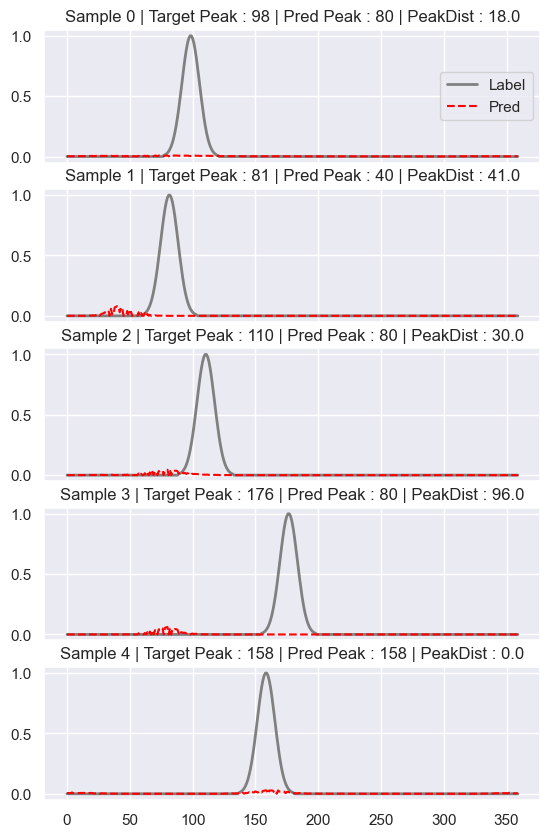

[  0   1   2   3   4   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  23  24  25  27  28  29  30  31  33  35  36  38  39  40  41
  42  43  44  57  59  62  64  66  68  70  76  78  79  80  82  84  85  86
  87 137 157 158 159 161 162 163 168 176 201 208 242 249 270 312 313 314
 315 318 319 320 322 323 325 327 328 329 330 331 332 333 334 335 336 337
 338 339 340 341 342 343 344 346 348 349 350 351 354 356 357 358 359]
SAVING TO ... /its/home/nn268/antvis/antvis/optics/res_big_loop_saves/models/p3/testing/RealThing_300E_1e-4_ADAM_Eighths_[452, 144]/2c2l/


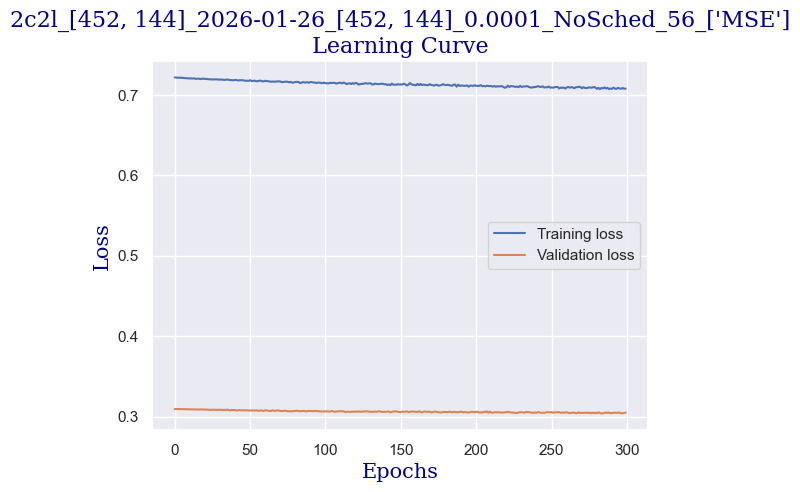

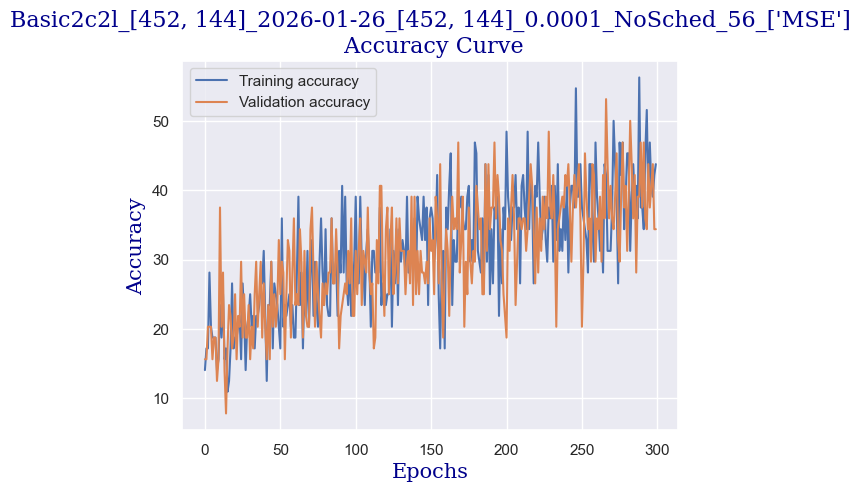

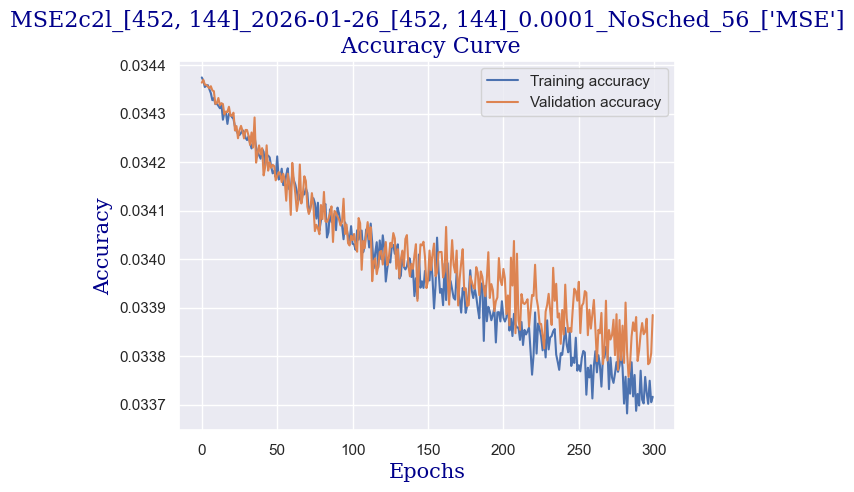

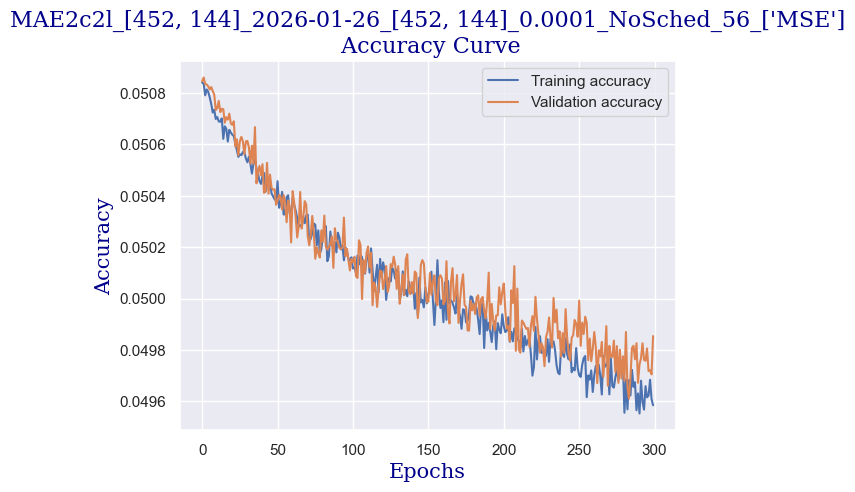

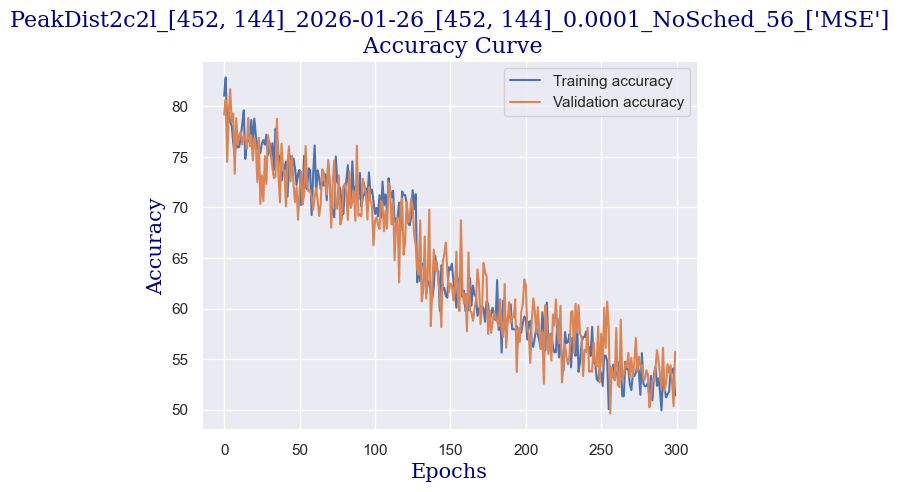

plot_confusion ACTUAL [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36]
plot_confusion PREDICTION [ 0  1  2  3  4  6  7  8  9 14 16 17 18 20 21 24 25 27 31 32 33 34 35 36]
actual  [15 35  5 13  0 26 10  1  1 20  7 36 11 10 10 31 32  0 26 23 14 30 22 32
  2  4  8  5 15  0 32 17  7 30 10  3  3  1 20 10  1  4 35 32 22 22  0 18
 24 24 31 30 32  9 23 34 12  4 21 14  4 31 13 35 31 10  2 35 34 10 24 16
 23 30 32 13 20 14 19 35  7  3 19 32 13 33 28 30 25  1 29  1 30  6 21  1
 21  4 33 17  8 24 15 35  0 19 13 29 35 28  4 21  4 28 13  5 13 11 32 35
 26 21  4  3  3 22 33 34  2  6 12 27 34 36  4  2  3 18  6 16  8  0  9 25
  6 35 31  4 28 29 17 13 18 19 32  1 20  0 10  5 18 11  3 24 15  3 26 30
 26  3  3 15 16 20 31 32  1  2  5 20  4 32 30 16  2 35 21 15 32 35 32  2
 33 13 33 33 24  0 28  1 34 13 26 10 31  0 19 20  6  3 32 22  1 18  2 25
 11 32 36  4 21 25 33  8  2 32 23 17 32  7 10  0 18  3 22 32 10  7 20  2
  4 15 14 11 31  5 32 22  

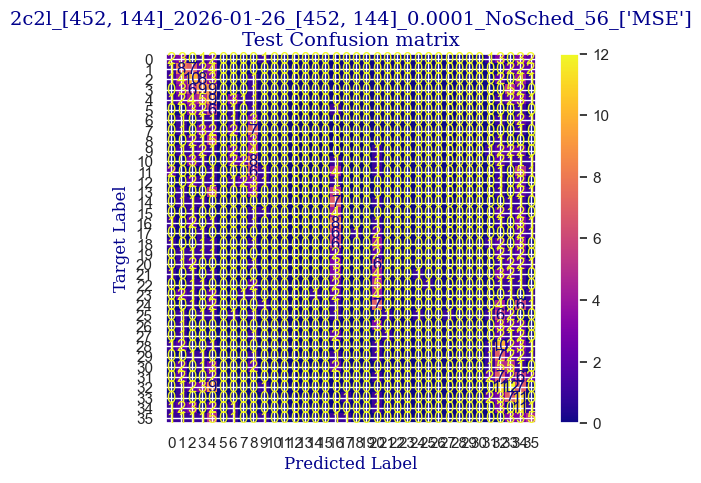

 
 END 2c2l [452, 144] Run Time:  19325.035859177995


Epochs,▁
Test acc rough,▃▂▅▅▇▃▄█▅▃▆▁
TrainAcc rough,▁▂▂▁▄▄▂▄▂▄▄▂▂▂▃▂▃▄▄▄▇▇▃▄▅▅▆▅▂▅▅▅▇▅▇▆▅▄▅█
ValAcc rough,▁▃▂▁▂▂▄▁▃▃▃▄▆▅▆▅▄▅▃▆▄▆▄▆▃▇▅▅▅▅▄▅█▇▅▇▆█▇▇
c_epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇██
t_loss,███▇▇▇▇▆▆▆▅▅▅▄▃▄▄▄▄▃▄▃▄▂▄▃▃▃▃▂▃▃▂▂▁▂▁▂▁▁
test_acc_MAE,█▆▅▃▂▆▄▁▃▅▂█
test_acc_MSE,█▆▄▂▁▅▂▁▂▅▂█
test_peakDist,█▇▂▄▆▇▅▁▃█▃▆
train_err_MAE,██▇▇▆▅▆▅▆▆▅▅▄▄▄▃▃▄▆▅▂▅▅▃▄▂▂▃▄▃▃▃▃▃▂▂▁▁▃▃
+6,...


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: lrjk3xvt with config:
wandb: 	batch_size: 64
wandb: 	epochs: 300
wandb: 	half_ciprange: 22
wandb: 	learning_rate: 0.0001
wandb: 	loss_fn_cards: ['MSE']
wandb: 	model_cards: [{'Ks': [3, 5], 'channels': 3, 'dropout': 0.2, 'f_lin_lay': [1032192, 255744, 62208, 14976, 3072, 640, 128], 'idx': 6, 'model': '2c2l', 'name': '2c2l'}]
wandb: 	optimiser: ['adam']
wandb: 	resolution_cards: [{'index': 0, 'padding': 5, 'resolution': [452, 144]}]
wandb: 	seeds: 23
wandb: 	std_dev: 7
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from /its/home/nn268/.netrc.


{'name': '2c2l', 'model': '2c2l', 'channels': 3, 'Ks': (3, 5), 'f_lin_lay': [1032192, 255744, 62208, 14976, 3072, 640, 128], 'idx': 6, 'dropout': 0.2}
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 1
seed:  23
loss function:  ['MSE']
Batch size:  64
Training epochs:  300
start time:  115075.7132657
Model Name 2c2l
/its/home/nn268/antvis/antvis/optics/NC_IDSW/
set_lossfn    lf  ['MSE']


  0%|                                      | 0/300 [00:00<?, ?it/s]

Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


peak dist means  83.01339285714286
tacc:  {'baseAcc': 14.0625, 'MSE': 0.0343981496989727, 'MAE': 0.050871603368293675, 'peakDist': 83.01339285714286}
Validating...


  0%|                              | 1/300 [00:06<31:36,  6.34s/it]

peak dist means  77.56423611111111
v loss  0.3093768283724785
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  81.70238095238095
tacc:  {'baseAcc': 21.875, 'MSE': 0.03437290039090883, 'MAE': 0.05086009328564008, 'peakDist': 81.70238095238095}
Validating...


  1%|▏                             | 2/300 [00:12<31:44,  6.39s/it]

peak dist means  72.69270833333333
v loss  0.30934078246355057
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.22991071428571
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03436866526802381, 'MAE': 0.05084624478504771, 'peakDist': 78.22991071428571}
Validating...


  1%|▎                             | 3/300 [00:18<30:56,  6.25s/it]

peak dist means  78.99131944444444
v loss  0.3093332387506962
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.11979166666667
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03437217963593347, 'MAE': 0.05084033044321196, 'peakDist': 79.11979166666667}
Validating...


  1%|▍                             | 4/300 [00:25<30:43,  6.23s/it]

peak dist means  77.68229166666667
v loss  0.30932416021823883
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.29017857142857
tacc:  {'baseAcc': 26.5625, 'MSE': 0.0343652463385037, 'MAE': 0.05083007347725686, 'peakDist': 77.29017857142857}
Validating...


  2%|▌                             | 5/300 [00:31<30:56,  6.29s/it]

peak dist means  80.55555555555556
v loss  0.30930423736572266
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.91815476190476
tacc:  {'baseAcc': 10.9375, 'MSE': 0.03436144281710897, 'MAE': 0.05081821463647343, 'peakDist': 77.91815476190476}
Validating...


  2%|▌                             | 6/300 [00:37<30:57,  6.32s/it]

peak dist means  80.51215277777777
v loss  0.309294618666172
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.42113095238095
tacc:  {'baseAcc': 15.625, 'MSE': 0.03435775868239857, 'MAE': 0.050811859291224254, 'peakDist': 79.42113095238095}
Validating...


  2%|▋                             | 7/300 [00:44<30:56,  6.33s/it]

peak dist means  79.40972222222223
v loss  0.3092806898057461
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.31026785714286
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034351123230797906, 'MAE': 0.05077887787705376, 'peakDist': 77.31026785714286}
Validating...


  3%|▊                             | 8/300 [00:50<31:26,  6.46s/it]

peak dist means  77.82986111111111
v loss  0.3091888949275017
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.41517857142857
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034347664564847946, 'MAE': 0.050784836212793984, 'peakDist': 78.41517857142857}
Validating...


  3%|▉                             | 9/300 [00:57<31:13,  6.44s/it]

peak dist means  75.50868055555556
v loss  0.3091569356620312
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.39508928571429
tacc:  {'baseAcc': 15.625, 'MSE': 0.034343269964059196, 'MAE': 0.05075773135537193, 'peakDist': 77.39508928571429}
Validating...


  3%|▉                            | 10/300 [01:04<31:45,  6.57s/it]

peak dist means  76.99479166666667
v loss  0.3091440573334694
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.87202380952381
tacc:  {'baseAcc': 21.875, 'MSE': 0.034336754076537634, 'MAE': 0.05073186985793568, 'peakDist': 75.87202380952381}
Validating...


  4%|█                            | 11/300 [01:10<31:29,  6.54s/it]

peak dist means  73.734375
v loss  0.3090679496526718
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.02008928571429
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03433010851343473, 'MAE': 0.050725803133987245, 'peakDist': 77.02008928571429}
Validating...


  4%|█▏                           | 12/300 [01:17<31:48,  6.63s/it]

peak dist means  78.27604166666667
v loss  0.3090665452182293
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.99032738095238
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03432402600135122, 'MAE': 0.05071820088085674, 'peakDist': 75.99032738095238}
Validating...


  4%|█▎                           | 13/300 [01:23<31:29,  6.58s/it]

peak dist means  77.40625
v loss  0.3089531548321247
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.62723214285714
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03432071368609156, 'MAE': 0.05072131096607163, 'peakDist': 78.62723214285714}
Validating...


  5%|█▎                           | 14/300 [01:30<31:12,  6.55s/it]

peak dist means  78.27951388888889
v loss  0.3089428059756756
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.24255952380952
tacc:  {'baseAcc': 21.875, 'MSE': 0.03431570317064013, 'MAE': 0.0506811739788169, 'peakDist': 76.24255952380952}
EPOCH    14 / 300:


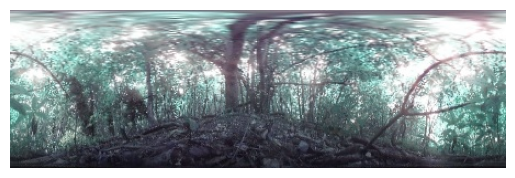

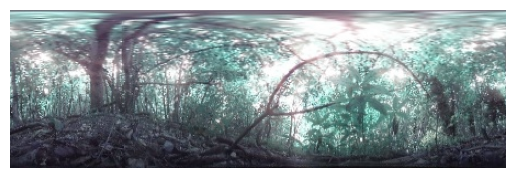

TRUE LABEL    :          30
PREDICTION    :          27
Validating...


  5%|█▍                           | 15/300 [01:37<31:11,  6.57s/it]

peak dist means  75.57638888888889
v loss  0.30882007628679276
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)


wandb: ERROR Error while calling W&B API: context deadline exceeded (<Response [500]>)


peak dist means  77.94940476190476
tacc:  {'baseAcc': 25.0, 'MSE': 0.034307939488263356, 'MAE': 0.05067124412882896, 'peakDist': 77.94940476190476}
Validating...


  5%|█▌                           | 16/300 [01:43<30:54,  6.53s/it]

peak dist means  80.01388888888889
v loss  0.3087962120771408
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.80431547619048
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03430625725360144, 'MAE': 0.050668958929323014, 'peakDist': 76.80431547619048}
Validating...


  6%|█▋                           | 17/300 [01:49<30:09,  6.40s/it]

peak dist means  76.80034722222223
v loss  0.30873437598347664
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.23735119047619
tacc:  {'baseAcc': 15.625, 'MSE': 0.03428958445077851, 'MAE': 0.0506331752098742, 'peakDist': 76.23735119047619}
Validating...


  6%|█▋                           | 18/300 [01:55<29:49,  6.35s/it]

peak dist means  75.69097222222223
v loss  0.30863940343260765
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.41220238095238
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034286691496769585, 'MAE': 0.0506381532620816, 'peakDist': 76.41220238095238}
Validating...


  6%|█▊                           | 19/300 [02:02<29:52,  6.38s/it]

peak dist means  79.47048611111111
v loss  0.3088432140648365
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.0625
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03431193335425286, 'MAE': 0.05068520775863102, 'peakDist': 79.0625}
Validating...


  7%|█▉                           | 20/300 [02:08<29:44,  6.37s/it]

peak dist means  76.22048611111111
v loss  0.3085726127028465
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.35714285714286
tacc:  {'baseAcc': 23.4375, 'MSE': 0.0343015431648209, 'MAE': 0.050639262866406215, 'peakDist': 76.35714285714286}
Validating...


  7%|██                           | 21/300 [02:15<29:42,  6.39s/it]

peak dist means  77.64930555555556
v loss  0.30863671004772186
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.72991071428571
tacc:  {'baseAcc': 28.125, 'MSE': 0.03429788333319482, 'MAE': 0.05066000634715671, 'peakDist': 77.72991071428571}
Validating...


  7%|██▏                          | 22/300 [02:21<29:28,  6.36s/it]

peak dist means  78.16319444444444
v loss  0.30866946652531624
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.85342261904762
tacc:  {'baseAcc': 18.75, 'MSE': 0.03429446706459636, 'MAE': 0.05062767934231531, 'peakDist': 76.85342261904762}
Validating...


  8%|██▏                          | 23/300 [02:27<29:18,  6.35s/it]

peak dist means  77.31423611111111
v loss  0.30872660502791405
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.5766369047619
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03428987520081656, 'MAE': 0.05063674900503386, 'peakDist': 77.5766369047619}
Validating...


  8%|██▎                          | 24/300 [02:33<29:12,  6.35s/it]

peak dist means  78.03298611111111
v loss  0.3087719678878784
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.86011904761905
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03429722289244334, 'MAE': 0.050661511364437285, 'peakDist': 77.86011904761905}
Validating...


  8%|██▍                          | 25/300 [02:40<29:20,  6.40s/it]

peak dist means  78.74479166666667
v loss  0.30860747396945953
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.1577380952381
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03429450378531501, 'MAE': 0.05063343810893241, 'peakDist': 77.1577380952381}
Validating...


  9%|██▌                          | 26/300 [02:46<29:17,  6.41s/it]

peak dist means  76.01041666666667
v loss  0.30848872661590576
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.890625
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03427076747729665, 'MAE': 0.0505809129348823, 'peakDist': 76.890625}
Validating...


  9%|██▌                          | 27/300 [02:54<30:07,  6.62s/it]

peak dist means  78.72222222222223
v loss  0.3085114322602749
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  80.01934523809524
tacc:  {'baseAcc': 25.0, 'MSE': 0.03429864400199482, 'MAE': 0.050664479533831276, 'peakDist': 80.01934523809524}
Validating...


  9%|██▋                          | 28/300 [03:01<30:39,  6.76s/it]

peak dist means  75.33680555555556
v loss  0.30849864706397057
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.07514880952381
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034282353662309195, 'MAE': 0.050610244451534184, 'peakDist': 76.07514880952381}
Validating...


 10%|██▊                          | 29/300 [03:08<30:58,  6.86s/it]

peak dist means  77.23090277777777
v loss  0.30844538658857346
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.28199404761905
tacc:  {'baseAcc': 18.75, 'MSE': 0.03427851608111745, 'MAE': 0.050597842605341045, 'peakDist': 77.28199404761905}
Validating...


 10%|██▉                          | 30/300 [03:15<31:08,  6.92s/it]

peak dist means  74.40451388888889
v loss  0.3082002028822899
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.6577380952381
tacc:  {'baseAcc': 18.75, 'MSE': 0.03426978754855338, 'MAE': 0.0505760574624652, 'peakDist': 76.6577380952381}
Validating...


 10%|██▉                          | 31/300 [03:22<31:12,  6.96s/it]

peak dist means  76.95659722222223
v loss  0.3084965832531452
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.42113095238095
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03427393663497198, 'MAE': 0.050602772406169345, 'peakDist': 77.42113095238095}
Validating...


 11%|███                          | 32/300 [03:29<31:02,  6.95s/it]

peak dist means  75.63888888888889
v loss  0.3084273189306259
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.7202380952381
tacc:  {'baseAcc': 25.0, 'MSE': 0.034268398370061605, 'MAE': 0.05057829334622338, 'peakDist': 75.7202380952381}
Validating...


 11%|███▏                         | 33/300 [03:35<30:21,  6.82s/it]

peak dist means  77.56076388888889
v loss  0.30837973952293396
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.68675595238095
tacc:  {'baseAcc': 18.75, 'MSE': 0.03425960207269305, 'MAE': 0.050571096617551076, 'peakDist': 78.68675595238095}
Validating...


 11%|███▎                         | 34/300 [03:42<30:02,  6.77s/it]

peak dist means  77.953125
v loss  0.30860335007309914
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.171875
tacc:  {'baseAcc': 18.75, 'MSE': 0.0342773332127503, 'MAE': 0.05059845532689776, 'peakDist': 76.171875}
Validating...


 12%|███▍                         | 35/300 [03:48<29:27,  6.67s/it]

peak dist means  76.95486111111111
v loss  0.308259978890419
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.23809523809524
tacc:  {'baseAcc': 25.0, 'MSE': 0.034256906381675174, 'MAE': 0.050544160994745436, 'peakDist': 75.23809523809524}
Validating...


 12%|███▍                         | 36/300 [03:55<28:50,  6.56s/it]

peak dist means  74.39756944444444
v loss  0.3081471472978592
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.36607142857143
tacc:  {'baseAcc': 21.875, 'MSE': 0.03424084576822463, 'MAE': 0.050520441361836026, 'peakDist': 73.36607142857143}
Validating...


 12%|███▌                         | 37/300 [04:01<28:47,  6.57s/it]

peak dist means  75.47569444444444
v loss  0.30783746764063835
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.40252976190476
tacc:  {'baseAcc': 21.875, 'MSE': 0.0342664374482064, 'MAE': 0.050568366511946634, 'peakDist': 76.40252976190476}
Validating...


 13%|███▋                         | 38/300 [04:08<28:21,  6.49s/it]

peak dist means  74.94965277777777
v loss  0.3080369271337986
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.85639880952381
tacc:  {'baseAcc': 31.25, 'MSE': 0.03424757665821484, 'MAE': 0.050535617130143304, 'peakDist': 75.85639880952381}
Validating...


 13%|███▊                         | 39/300 [04:14<28:04,  6.45s/it]

peak dist means  71.76041666666667
v loss  0.3080891743302345
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.08035714285714
tacc:  {'baseAcc': 14.0625, 'MSE': 0.0342326256490889, 'MAE': 0.05049610953955423, 'peakDist': 74.08035714285714}
Validating...


 13%|███▊                         | 40/300 [04:20<27:49,  6.42s/it]

peak dist means  78.50868055555556
v loss  0.30823320150375366
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.57514880952381
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03424390210282235, 'MAE': 0.05054062658122608, 'peakDist': 77.57514880952381}
Validating...


 14%|███▉                         | 41/300 [04:27<27:40,  6.41s/it]

peak dist means  73.11111111111111
v loss  0.30780018121004105
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.56324404761905
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03424651672442754, 'MAE': 0.050546804176909585, 'peakDist': 76.56324404761905}
Validating...


 14%|████                         | 42/300 [04:33<27:25,  6.38s/it]

peak dist means  70.83159722222223
v loss  0.3079812489449978
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.47395833333333
tacc:  {'baseAcc': 26.5625, 'MSE': 0.0342507775695551, 'MAE': 0.05053972133568355, 'peakDist': 76.47395833333333}
Validating...


 14%|████▏                        | 43/300 [04:40<27:31,  6.43s/it]

peak dist means  75.63541666666667
v loss  0.3083764798939228
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.94940476190476
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034230701093162806, 'MAE': 0.050507541391111556, 'peakDist': 74.94940476190476}
Validating...


 15%|████▎                        | 44/300 [04:46<27:02,  6.34s/it]

peak dist means  74.31076388888889
v loss  0.30811676755547523
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.21949404761905
tacc:  {'baseAcc': 28.125, 'MSE': 0.03422947192475909, 'MAE': 0.05050409194968995, 'peakDist': 75.21949404761905}
Validating...


 15%|████▎                        | 45/300 [04:52<26:55,  6.34s/it]

peak dist means  75.47048611111111
v loss  0.30817849561572075
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.33482142857143
tacc:  {'baseAcc': 25.0, 'MSE': 0.03423451401648067, 'MAE': 0.050510586195048834, 'peakDist': 75.33482142857143}
Validating...


 15%|████▍                        | 46/300 [04:58<26:58,  6.37s/it]

peak dist means  70.453125
v loss  0.30808091536164284
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.08407738095238
tacc:  {'baseAcc': 31.25, 'MSE': 0.03420809851515861, 'MAE': 0.05044768200743766, 'peakDist': 73.08407738095238}
Validating...


 16%|████▌                        | 47/300 [05:05<27:01,  6.41s/it]

peak dist means  74.41840277777777
v loss  0.307925283908844
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.04092261904762
tacc:  {'baseAcc': 21.875, 'MSE': 0.034216439440136866, 'MAE': 0.05046106591111138, 'peakDist': 74.04092261904762}
Validating...


 16%|████▋                        | 48/300 [05:12<27:08,  6.46s/it]

peak dist means  67.46527777777777
v loss  0.3075689934194088
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.79166666666667
tacc:  {'baseAcc': 18.75, 'MSE': 0.034208874262514566, 'MAE': 0.050465941251743404, 'peakDist': 75.79166666666667}
Validating...


 16%|████▋                        | 49/300 [05:18<27:37,  6.60s/it]

peak dist means  71.36805555555556
v loss  0.3075830824673176
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.37127976190476
tacc:  {'baseAcc': 21.875, 'MSE': 0.03422666855511211, 'MAE': 0.050492811061087106, 'peakDist': 76.37127976190476}
Validating...


 17%|████▊                        | 50/300 [05:25<27:21,  6.56s/it]

peak dist means  76.08680555555556
v loss  0.30807003378868103
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.5453869047619
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03420251341802733, 'MAE': 0.05044882815508615, 'peakDist': 73.5453869047619}
Validating...


 17%|████▉                        | 51/300 [05:32<27:25,  6.61s/it]

peak dist means  76.30034722222223
v loss  0.3077370971441269
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.18303571428571
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034211213035242896, 'MAE': 0.05046806466721353, 'peakDist': 75.18303571428571}
Validating...


 17%|█████                        | 52/300 [05:39<27:57,  6.76s/it]

peak dist means  72.78298611111111
v loss  0.30781903862953186
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.58184523809524
tacc:  {'baseAcc': 25.0, 'MSE': 0.034216507382336114, 'MAE': 0.05047918288480668, 'peakDist': 75.58184523809524}
Validating...


 18%|█████                        | 53/300 [05:46<28:04,  6.82s/it]

peak dist means  71.94097222222223
v loss  0.3077547065913677
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.49776785714286
tacc:  {'baseAcc': 18.75, 'MSE': 0.034219629175606225, 'MAE': 0.05048392996901557, 'peakDist': 73.49776785714286}
Validating...


 18%|█████▏                       | 54/300 [05:53<28:05,  6.85s/it]

peak dist means  76.43576388888889
v loss  0.30778372287750244
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.05877976190476
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03419002074570883, 'MAE': 0.05040822940922919, 'peakDist': 75.05877976190476}
Validating...


 18%|█████▎                       | 55/300 [05:59<27:29,  6.73s/it]

peak dist means  73.41145833333333
v loss  0.30774323269724846
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.49627976190476
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034194926775637124, 'MAE': 0.05042452311941555, 'peakDist': 76.49627976190476}
Validating...


 19%|█████▍                       | 56/300 [06:06<26:59,  6.64s/it]

peak dist means  76.36805555555556
v loss  0.3076997734606266
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.41592261904762
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03418510123377755, 'MAE': 0.05041576460713432, 'peakDist': 74.41592261904762}
Validating...


 19%|█████▌                       | 57/300 [06:12<26:19,  6.50s/it]

peak dist means  73.36805555555556
v loss  0.3073318563401699
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.859375
tacc:  {'baseAcc': 31.25, 'MSE': 0.034200017828316914, 'MAE': 0.050439214067799706, 'peakDist': 73.859375}
Validating...


 19%|█████▌                       | 58/300 [06:18<25:43,  6.38s/it]

peak dist means  76.36805555555556
v loss  0.307978805154562
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.85267857142857
tacc:  {'baseAcc': 32.8125, 'MSE': 0.034192879107736406, 'MAE': 0.050398951839833034, 'peakDist': 72.85267857142857}
Validating...


 20%|█████▋                       | 59/300 [06:24<25:26,  6.33s/it]

peak dist means  78.26041666666667
v loss  0.3079161085188389
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.21130952380952
tacc:  {'baseAcc': 28.125, 'MSE': 0.034200752597479595, 'MAE': 0.05043717509224301, 'peakDist': 75.21130952380952}
Validating...


 20%|█████▊                       | 60/300 [06:31<25:34,  6.39s/it]

peak dist means  70.98958333333333
v loss  0.3075268529355526
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.54241071428571
tacc:  {'baseAcc': 23.4375, 'MSE': 0.0341908855452424, 'MAE': 0.050422247854017076, 'peakDist': 76.54241071428571}
Validating...


 20%|█████▉                       | 61/300 [06:37<25:00,  6.28s/it]

peak dist means  74.18402777777777
v loss  0.30764735862612724
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.41220238095238
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034174843558243344, 'MAE': 0.050380270750749676, 'peakDist': 72.41220238095238}
Validating...


 21%|█████▉                       | 62/300 [06:43<24:49,  6.26s/it]

peak dist means  75.21875
v loss  0.3077170215547085
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.61755952380952
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034171405292692636, 'MAE': 0.05038788063185556, 'peakDist': 75.61755952380952}
Validating...


 21%|██████                       | 63/300 [06:49<24:40,  6.25s/it]

peak dist means  72.25173611111111
v loss  0.30719326063990593
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.515625
tacc:  {'baseAcc': 21.875, 'MSE': 0.034181393505561916, 'MAE': 0.050406091092597874, 'peakDist': 75.515625}
Validating...


 21%|██████▏                      | 64/300 [06:55<24:36,  6.26s/it]

peak dist means  75.33159722222223
v loss  0.307697419077158
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.40848214285714
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034183084077778314, 'MAE': 0.050409916256155284, 'peakDist': 75.40848214285714}
Validating...


 22%|██████▎                      | 65/300 [07:02<24:45,  6.32s/it]

peak dist means  71.37847222222223
v loss  0.3073159195482731
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.9672619047619
tacc:  {'baseAcc': 28.125, 'MSE': 0.03419703138726098, 'MAE': 0.05043710218299003, 'peakDist': 77.9672619047619}
Validating...


 22%|██████▍                      | 66/300 [07:08<24:45,  6.35s/it]

peak dist means  71.34548611111111
v loss  0.3073625713586807
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.21205357142857
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03418131580664998, 'MAE': 0.050404365573610575, 'peakDist': 76.21205357142857}
Validating...


 22%|██████▍                      | 67/300 [07:15<24:56,  6.42s/it]

peak dist means  74.89409722222223
v loss  0.30777934566140175
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.51488095238095
tacc:  {'baseAcc': 25.0, 'MSE': 0.03416626474687031, 'MAE': 0.050368272832461765, 'peakDist': 73.51488095238095}
Validating...


 23%|██████▌                      | 68/300 [07:22<25:13,  6.53s/it]

peak dist means  74.93402777777777
v loss  0.3076329305768013
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.34598214285714
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03415794173876444, 'MAE': 0.05035728145213354, 'peakDist': 75.34598214285714}
Validating...


 23%|██████▋                      | 69/300 [07:28<25:13,  6.55s/it]

peak dist means  72.62326388888889
v loss  0.3075444772839546
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.15625
tacc:  {'baseAcc': 21.875, 'MSE': 0.034151460620619, 'MAE': 0.0503394470683166, 'peakDist': 71.15625}
Validating...


 23%|██████▊                      | 70/300 [07:35<25:15,  6.59s/it]

peak dist means  75.61805555555556
v loss  0.30757875740528107
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.01636904761905
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03418700042225066, 'MAE': 0.050429897471552805, 'peakDist': 77.01636904761905}
Validating...


 24%|██████▊                      | 71/300 [07:41<24:49,  6.51s/it]

peak dist means  70.89930555555556
v loss  0.30702632293105125
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.65327380952381
tacc:  {'baseAcc': 34.375, 'MSE': 0.034173889529137386, 'MAE': 0.05039118868964059, 'peakDist': 75.65327380952381}
Validating...


 24%|██████▉                      | 72/300 [07:48<24:46,  6.52s/it]

peak dist means  71.40277777777777
v loss  0.30711401253938675
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.14732142857143
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03418659472039768, 'MAE': 0.05041799924912907, 'peakDist': 76.14732142857143}
Validating...


 24%|███████                      | 73/300 [07:54<24:24,  6.45s/it]

peak dist means  73.63020833333333
v loss  0.30737393349409103
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.08407738095238
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03415458560699508, 'MAE': 0.05035248930965151, 'peakDist': 74.08407738095238}
Validating...


 25%|███████▏                     | 74/300 [08:01<24:33,  6.52s/it]

peak dist means  71.26736111111111
v loss  0.3072045184671879
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.06919642857143
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03415802511430922, 'MAE': 0.05034854121151425, 'peakDist': 73.06919642857143}
Validating...


 25%|███████▎                     | 75/300 [08:07<24:17,  6.48s/it]

peak dist means  79.89409722222223
v loss  0.30765530094504356
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.546875
tacc:  {'baseAcc': 25.0, 'MSE': 0.034149907351959316, 'MAE': 0.050334323374998005, 'peakDist': 72.546875}
Validating...


 25%|███████▎                     | 76/300 [08:13<23:41,  6.35s/it]

peak dist means  74.87326388888889
v loss  0.3076230250298977
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.63616071428571
tacc:  {'baseAcc': 25.0, 'MSE': 0.03413900076633408, 'MAE': 0.050320170110180265, 'peakDist': 73.63616071428571}
Validating...


 26%|███████▍                     | 77/300 [08:19<23:05,  6.21s/it]

peak dist means  76.828125
v loss  0.30740588530898094
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.22098214285714
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03414146229624748, 'MAE': 0.05032781582503092, 'peakDist': 74.22098214285714}
Validating...


 26%|███████▌                     | 78/300 [08:26<23:24,  6.33s/it]

peak dist means  75.21180555555556
v loss  0.3072023130953312
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.77306547619048
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03412133614931788, 'MAE': 0.050294023007154465, 'peakDist': 73.77306547619048}
Validating...


 26%|███████▋                     | 79/300 [08:32<23:13,  6.31s/it]

peak dist means  68.41493055555556
v loss  0.30665798857808113
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.27232142857143
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03413570902886845, 'MAE': 0.05030761960716475, 'peakDist': 73.27232142857143}
Validating...


 27%|███████▋                     | 80/300 [08:38<23:12,  6.33s/it]

peak dist means  71.49652777777777
v loss  0.30731766670942307
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.4233630952381
tacc:  {'baseAcc': 28.125, 'MSE': 0.03417054847592399, 'MAE': 0.050387992922748835, 'peakDist': 74.4233630952381}
Validating...


 27%|███████▊                     | 81/300 [08:45<23:33,  6.46s/it]

peak dist means  72.31944444444444
v loss  0.3071531765162945
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.44047619047619
tacc:  {'baseAcc': 21.875, 'MSE': 0.0341328229932558, 'MAE': 0.05031036585569382, 'peakDist': 73.44047619047619}
Validating...


 27%|███████▉                     | 82/300 [08:52<23:47,  6.55s/it]

peak dist means  71.21527777777777
v loss  0.30709855258464813
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.52752976190476
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03412145943868728, 'MAE': 0.050294035247394016, 'peakDist': 73.52752976190476}
Validating...


 28%|████████                     | 83/300 [08:58<23:47,  6.58s/it]

peak dist means  74.96006944444444
v loss  0.30727487057447433
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.8891369047619
tacc:  {'baseAcc': 28.125, 'MSE': 0.034179742847170146, 'MAE': 0.050413139341842564, 'peakDist': 76.8891369047619}
Validating...


 28%|████████                     | 84/300 [09:05<23:45,  6.60s/it]

peak dist means  74.27256944444444
v loss  0.3070741482079029
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.24702380952381
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03412413082662083, 'MAE': 0.050294622956287297, 'peakDist': 73.24702380952381}
Validating...


 28%|████████▏                    | 85/300 [09:12<23:44,  6.63s/it]

peak dist means  70.82638888888889
v loss  0.30678263679146767
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.69419642857143
tacc:  {'baseAcc': 18.75, 'MSE': 0.034126896411180496, 'MAE': 0.05030004804333051, 'peakDist': 72.69419642857143}
Validating...


 29%|████████▎                    | 86/300 [09:18<23:28,  6.58s/it]

peak dist means  72.97048611111111
v loss  0.30699310079216957
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.04613095238095
tacc:  {'baseAcc': 32.8125, 'MSE': 0.034096086131674905, 'MAE': 0.05022883362003735, 'peakDist': 72.04613095238095}
Validating...


 29%|████████▍                    | 87/300 [09:25<23:30,  6.62s/it]

peak dist means  75.05381944444444
v loss  0.3072417341172695
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.69568452380952
tacc:  {'baseAcc': 21.875, 'MSE': 0.03410400521187555, 'MAE': 0.05025862494394893, 'peakDist': 73.69568452380952}
Validating...


 29%|████████▌                    | 88/300 [09:31<23:12,  6.57s/it]

peak dist means  72.625
v loss  0.3072408102452755
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.96056547619048
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034128450389419286, 'MAE': 0.05027927742117927, 'peakDist': 71.96056547619048}
Validating...


 30%|████████▌                    | 89/300 [09:38<23:04,  6.56s/it]

peak dist means  75.36458333333333
v loss  0.30746903270483017
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.40327380952381
tacc:  {'baseAcc': 25.0, 'MSE': 0.03413899650885945, 'MAE': 0.05032660741181601, 'peakDist': 75.40327380952381}
Validating...


 30%|████████▋                    | 90/300 [09:44<22:36,  6.46s/it]

peak dist means  71.45486111111111
v loss  0.3071064203977585
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.83705357142857
tacc:  {'baseAcc': 34.375, 'MSE': 0.034059978844154445, 'MAE': 0.050168703886724654, 'peakDist': 69.83705357142857}
Validating...


 30%|████████▊                    | 91/300 [09:50<22:11,  6.37s/it]

peak dist means  75.88020833333333
v loss  0.30691689252853394
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.72544642857143
tacc:  {'baseAcc': 21.875, 'MSE': 0.034138276640857966, 'MAE': 0.05032259953163919, 'peakDist': 75.72544642857143}
Validating...


 31%|████████▉                    | 92/300 [09:56<21:45,  6.28s/it]

peak dist means  72.18402777777777
v loss  0.3069942146539688
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.96800595238095
tacc:  {'baseAcc': 18.75, 'MSE': 0.03411046965491204, 'MAE': 0.05026682962973913, 'peakDist': 72.96800595238095}
Validating...


 31%|████████▉                    | 93/300 [10:02<21:30,  6.23s/it]

peak dist means  78.11284722222223
v loss  0.3076775446534157
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.73363095238095
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034108275458926245, 'MAE': 0.050264508419093634, 'peakDist': 72.73363095238095}
Validating...


 31%|█████████                    | 94/300 [10:09<21:36,  6.29s/it]

peak dist means  71.04340277777777
v loss  0.3073345720767975
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.28422619047619
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03412296090807233, 'MAE': 0.05028407807861056, 'peakDist': 75.28422619047619}
Validating...


 32%|█████████▏                   | 95/300 [10:16<22:00,  6.44s/it]

peak dist means  73.75
v loss  0.3070615790784359
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.58630952380952
tacc:  {'baseAcc': 28.125, 'MSE': 0.03408808012803396, 'MAE': 0.050229642540216446, 'peakDist': 74.58630952380952}
Validating...


 32%|█████████▎                   | 96/300 [10:22<21:57,  6.46s/it]

peak dist means  73.80381944444444
v loss  0.30732493475079536
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.78645833333333
tacc:  {'baseAcc': 28.125, 'MSE': 0.034106720238924026, 'MAE': 0.05024741838375727, 'peakDist': 72.78645833333333}
Validating...


 32%|█████████▍                   | 97/300 [10:29<22:17,  6.59s/it]

peak dist means  75.64756944444444
v loss  0.3072652779519558
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.55877976190476
tacc:  {'baseAcc': 25.0, 'MSE': 0.034100612359387536, 'MAE': 0.050251747703268415, 'peakDist': 73.55877976190476}
Validating...


 33%|█████████▍                   | 98/300 [10:36<22:14,  6.61s/it]

peak dist means  72.39583333333333
v loss  0.30693988129496574
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.00669642857143
tacc:  {'baseAcc': 28.125, 'MSE': 0.03409626175250326, 'MAE': 0.05021783851441883, 'peakDist': 71.00669642857143}
Validating...


 33%|█████████▌                   | 99/300 [10:43<22:23,  6.68s/it]

peak dist means  76.03472222222223
v loss  0.3071509972214699
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.43005952380952
tacc:  {'baseAcc': 21.875, 'MSE': 0.03411243057676724, 'MAE': 0.05026288507949738, 'peakDist': 71.43005952380952}
Validating...


 33%|█████████▎                  | 100/300 [10:50<22:30,  6.75s/it]

peak dist means  73.04513888888889
v loss  0.3067954257130623
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.734375
tacc:  {'baseAcc': 15.625, 'MSE': 0.034118776874882836, 'MAE': 0.05028907759558587, 'peakDist': 75.734375}
Validating...


 34%|█████████▍                  | 101/300 [10:56<22:06,  6.67s/it]

peak dist means  74.21875
v loss  0.3068506494164467
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.94568452380952
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03408476337790489, 'MAE': 0.050210646043221153, 'peakDist': 69.94568452380952}
Validating...


 34%|█████████▌                  | 102/300 [11:03<22:11,  6.73s/it]

peak dist means  71.66666666666667
v loss  0.3069164678454399
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.2358630952381
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03407408030969756, 'MAE': 0.05020408917750631, 'peakDist': 71.2358630952381}
Validating...


 34%|█████████▌                  | 103/300 [11:09<21:43,  6.62s/it]

peak dist means  67.59027777777777
v loss  0.306939784437418
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.75297619047619
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03407816038954826, 'MAE': 0.050204923819927944, 'peakDist': 66.75297619047619}
Validating...


 35%|█████████▋                  | 104/300 [11:16<21:33,  6.60s/it]

peak dist means  67.75694444444444
v loss  0.306982584297657
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.2358630952381
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03408684120291755, 'MAE': 0.05023473518944922, 'peakDist': 65.2358630952381}
Validating...


 35%|█████████▊                  | 105/300 [11:22<21:24,  6.59s/it]

peak dist means  67.33159722222223
v loss  0.3069959618151188
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.10491071428571
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034060009710845496, 'MAE': 0.05018081196716854, 'peakDist': 69.10491071428571}
Validating...


 35%|█████████▉                  | 106/300 [11:29<21:11,  6.55s/it]

peak dist means  68.40625
v loss  0.3068225421011448
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.4516369047619
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03410647082186881, 'MAE': 0.05026483677682422, 'peakDist': 69.4516369047619}
Validating...


 36%|█████████▉                  | 107/300 [11:35<20:45,  6.45s/it]

peak dist means  66.23090277777777
v loss  0.30709828436374664
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.88541666666667
tacc:  {'baseAcc': 28.125, 'MSE': 0.034113847074054536, 'MAE': 0.05027252790473756, 'peakDist': 66.88541666666667}
Validating...


 36%|██████████                  | 108/300 [11:41<20:28,  6.40s/it]

peak dist means  66.35763888888889
v loss  0.3071304187178612
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.56324404761905
tacc:  {'baseAcc': 25.0, 'MSE': 0.034072164800905046, 'MAE': 0.050207095309382395, 'peakDist': 67.56324404761905}
Validating...


 36%|██████████▏                 | 109/300 [11:48<20:20,  6.39s/it]

peak dist means  68.23611111111111
v loss  0.30658940970897675
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.96354166666667
tacc:  {'baseAcc': 25.0, 'MSE': 0.034077625012113935, 'MAE': 0.05021144130400249, 'peakDist': 66.96354166666667}
Validating...


 37%|██████████▎                 | 110/300 [11:54<20:04,  6.34s/it]

peak dist means  69.96527777777777
v loss  0.3069988153874874
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.44419642857143
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03408123570538703, 'MAE': 0.050221280860049386, 'peakDist': 67.44419642857143}
Validating...


 37%|██████████▎                 | 111/300 [12:00<19:40,  6.25s/it]

peak dist means  65.81076388888889
v loss  0.3065194971859455
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.34821428571429
tacc:  {'baseAcc': 34.375, 'MSE': 0.03410060561838604, 'MAE': 0.050260748536813823, 'peakDist': 70.34821428571429}
Validating...


 37%|██████████▍                 | 112/300 [12:06<19:41,  6.28s/it]

peak dist means  68.80034722222223
v loss  0.30658984184265137
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.52827380952381
tacc:  {'baseAcc': 18.75, 'MSE': 0.03407822176814079, 'MAE': 0.05021641580831437, 'peakDist': 66.52827380952381}
Validating...


 38%|██████████▌                 | 113/300 [12:13<19:45,  6.34s/it]

peak dist means  65.87326388888889
v loss  0.30652502551674843
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.9077380952381
tacc:  {'baseAcc': 28.125, 'MSE': 0.03409502797183536, 'MAE': 0.050239045527719316, 'peakDist': 66.9077380952381}
Validating...


 38%|██████████▋                 | 114/300 [12:20<20:15,  6.53s/it]

peak dist means  63.94965277777778
v loss  0.3065265379846096
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.01116071428571
tacc:  {'baseAcc': 28.125, 'MSE': 0.03408228073801313, 'MAE': 0.0502195760962509, 'peakDist': 67.01116071428571}
Validating...


 38%|██████████▋                 | 115/300 [12:26<20:02,  6.50s/it]

peak dist means  64.97569444444444
v loss  0.3066180907189846
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.70089285714286
tacc:  {'baseAcc': 18.75, 'MSE': 0.03404190834789049, 'MAE': 0.05014159991627648, 'peakDist': 66.70089285714286}
Validating...


 39%|██████████▊                 | 116/300 [12:31<18:14,  5.95s/it]

peak dist means  62.35243055555556
v loss  0.3065617009997368
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.11830357142857
tacc:  {'baseAcc': 25.0, 'MSE': 0.034056448333320166, 'MAE': 0.05014398445685705, 'peakDist': 66.11830357142857}
Validating...


 39%|██████████▉                 | 117/300 [12:35<16:38,  5.46s/it]

peak dist means  64.03472222222223
v loss  0.306207787245512
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.95014880952381
tacc:  {'baseAcc': 37.5, 'MSE': 0.03407758119560424, 'MAE': 0.05021570764836811, 'peakDist': 66.95014880952381}
Validating...


 39%|███████████                 | 118/300 [12:40<16:24,  5.41s/it]

peak dist means  66.42534722222223
v loss  0.30654801055788994
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.77157738095238
tacc:  {'baseAcc': 21.875, 'MSE': 0.03404858903515907, 'MAE': 0.05013625873696236, 'peakDist': 64.77157738095238}
Validating...


 40%|███████████                 | 119/300 [12:47<16:59,  5.63s/it]

peak dist means  69.36631944444444
v loss  0.30686773732304573
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.30357142857143
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03409097556556974, 'MAE': 0.05022953361982391, 'peakDist': 67.30357142857143}
Validating...


 40%|███████████▏                | 120/300 [12:53<17:15,  5.75s/it]

peak dist means  64.74131944444444
v loss  0.306942954659462
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  68.34077380952381
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03410168808130991, 'MAE': 0.05025498888322285, 'peakDist': 68.34077380952381}
Validating...


 40%|███████████▎                | 121/300 [12:59<17:32,  5.88s/it]

peak dist means  66.00520833333333
v loss  0.30676648393273354
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.97098214285714
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03404592598477999, 'MAE': 0.05016840249300003, 'peakDist': 64.97098214285714}
Validating...


 41%|███████████▍                | 122/300 [13:05<17:57,  6.05s/it]

peak dist means  64.90451388888889
v loss  0.3063392713665962
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.63839285714286
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03409222850487346, 'MAE': 0.050232717856055216, 'peakDist': 67.63839285714286}
Validating...


 41%|███████████▍                | 123/300 [13:12<18:29,  6.27s/it]

peak dist means  66.36979166666667
v loss  0.3064842037856579
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.42559523809524
tacc:  {'baseAcc': 28.125, 'MSE': 0.03403813303226516, 'MAE': 0.05014080270415261, 'peakDist': 66.42559523809524}
Validating...


 41%|███████████▌                | 124/300 [13:19<18:40,  6.37s/it]

peak dist means  61.939236111111114
v loss  0.3066416233778
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.8139880952381
tacc:  {'baseAcc': 28.125, 'MSE': 0.03407919140798705, 'MAE': 0.05020809297760328, 'peakDist': 66.8139880952381}
Validating...


 42%|███████████▋                | 125/300 [13:25<18:58,  6.51s/it]

peak dist means  64.18229166666667
v loss  0.3064584545791149
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.10863095238095
tacc:  {'baseAcc': 25.0, 'MSE': 0.034064965233916326, 'MAE': 0.05019121528381393, 'peakDist': 69.10863095238095}
Validating...


 42%|███████████▊                | 126/300 [13:32<19:16,  6.65s/it]

peak dist means  71.36284722222223
v loss  0.30675141140818596
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  68.52380952380952
tacc:  {'baseAcc': 21.875, 'MSE': 0.03409047389314288, 'MAE': 0.0502270461902732, 'peakDist': 68.52380952380952}
Validating...


 42%|███████████▊                | 127/300 [13:39<18:56,  6.57s/it]

peak dist means  61.685763888888886
v loss  0.3060629852116108
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.90625
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03409368917346001, 'MAE': 0.050262571622927986, 'peakDist': 67.90625}
Validating...


 43%|███████████▉                | 128/300 [13:46<19:05,  6.66s/it]

peak dist means  63.333333333333336
v loss  0.3065798617899418
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.25892857142857
tacc:  {'baseAcc': 26.5625, 'MSE': 0.0340557238530545, 'MAE': 0.050194281907308666, 'peakDist': 67.25892857142857}
Validating...


 43%|████████████                | 129/300 [13:52<18:39,  6.54s/it]

peak dist means  65.66840277777777
v loss  0.3062688559293747
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.79464285714286
tacc:  {'baseAcc': 28.125, 'MSE': 0.03406629924263273, 'MAE': 0.05017402448824474, 'peakDist': 66.79464285714286}
Validating...


 43%|████████████▏               | 130/300 [13:58<18:23,  6.49s/it]

peak dist means  69.89583333333333
v loss  0.3069329336285591
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.36532738095238
tacc:  {'baseAcc': 28.125, 'MSE': 0.0340487447877725, 'MAE': 0.05014920695906594, 'peakDist': 64.36532738095238}
Validating...


 44%|████████████▏               | 131/300 [14:04<17:59,  6.39s/it]

peak dist means  66.27256944444444
v loss  0.3064548671245575
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.5639880952381
tacc:  {'baseAcc': 21.875, 'MSE': 0.03405249775165603, 'MAE': 0.05015627347997257, 'peakDist': 66.5639880952381}
Validating...


 44%|████████████▎               | 132/300 [14:11<17:45,  6.34s/it]

peak dist means  63.354166666666664
v loss  0.30647775158286095
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.80059523809524
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03404176873820169, 'MAE': 0.05014338663646153, 'peakDist': 65.80059523809524}
Validating...


 44%|████████████▍               | 133/300 [14:17<17:36,  6.33s/it]

peak dist means  64.88888888888889
v loss  0.306904349476099
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.04315476190476
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03404306496183077, 'MAE': 0.05014587548517045, 'peakDist': 65.04315476190476}
Validating...


 45%|████████████▌               | 134/300 [14:23<17:19,  6.26s/it]

peak dist means  68.72743055555556
v loss  0.3066842220723629
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.89806547619048
tacc:  {'baseAcc': 21.875, 'MSE': 0.03403250358643986, 'MAE': 0.05014661770491373, 'peakDist': 65.89806547619048}
Validating...


 45%|████████████▌               | 135/300 [14:30<17:20,  6.31s/it]

peak dist means  68.57465277777777
v loss  0.3067089729011059
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.61755952380952
tacc:  {'baseAcc': 37.5, 'MSE': 0.0339829105706442, 'MAE': 0.05003646299952552, 'peakDist': 64.61755952380952}
Validating...


 45%|████████████▋               | 136/300 [14:36<17:18,  6.34s/it]

peak dist means  67.21006944444444
v loss  0.306929562240839
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.46875
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034056473878167924, 'MAE': 0.050163241724173226, 'peakDist': 67.46875}
Validating...


 46%|████████████▊               | 137/300 [14:42<17:20,  6.39s/it]

peak dist means  66.86631944444444
v loss  0.30700336024165154
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.37797619047619
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03408156991714523, 'MAE': 0.05022330582141876, 'peakDist': 67.37797619047619}
Validating...


 46%|████████████▉               | 138/300 [14:49<17:31,  6.49s/it]

peak dist means  62.927083333333336
v loss  0.3064241297543049
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.70982142857143
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034053256114323936, 'MAE': 0.05014612241869881, 'peakDist': 62.70982142857143}
Validating...


 46%|████████████▉               | 139/300 [14:56<17:20,  6.46s/it]

peak dist means  66.52604166666667
v loss  0.30697157233953476
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  68.40401785714286
tacc:  {'baseAcc': 25.0, 'MSE': 0.03408431048904147, 'MAE': 0.05023316293954849, 'peakDist': 68.40401785714286}
Validating...


 47%|█████████████               | 140/300 [15:02<17:12,  6.46s/it]

peak dist means  66.87673611111111
v loss  0.30647973343729973
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.68452380952381
tacc:  {'baseAcc': 31.25, 'MSE': 0.03404001128815469, 'MAE': 0.05015536362216586, 'peakDist': 67.68452380952381}
Validating...


 47%|█████████████▏              | 141/300 [15:09<17:09,  6.48s/it]

peak dist means  67.98611111111111
v loss  0.3063329607248306
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.40327380952381
tacc:  {'baseAcc': 25.0, 'MSE': 0.03402231101478849, 'MAE': 0.050128904836518426, 'peakDist': 64.40327380952381}
Validating...


 47%|█████████████▎              | 142/300 [15:15<17:22,  6.60s/it]

peak dist means  69.34201388888889
v loss  0.30677447840571404
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.97470238095238
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034045204520225525, 'MAE': 0.05017380629267011, 'peakDist': 64.97470238095238}
Validating...


 48%|█████████████▎              | 143/300 [15:22<17:10,  6.56s/it]

peak dist means  63.685763888888886
v loss  0.30657824873924255
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.39806547619048
tacc:  {'baseAcc': 31.25, 'MSE': 0.03402277525691759, 'MAE': 0.05012219363734836, 'peakDist': 65.39806547619048}
Validating...


 48%|█████████████▍              | 144/300 [15:29<17:17,  6.65s/it]

peak dist means  65.85590277777777
v loss  0.3061068020761013
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.26785714285714
tacc:  {'baseAcc': 21.875, 'MSE': 0.03402968602521079, 'MAE': 0.050131785905077345, 'peakDist': 65.26785714285714}
Validating...


 48%|█████████████▌              | 145/300 [15:35<16:52,  6.53s/it]

peak dist means  67.08333333333333
v loss  0.3066096790134907
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.84821428571429
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03404862983595757, 'MAE': 0.05016776866146496, 'peakDist': 65.84821428571429}
Validating...


 49%|█████████████▋              | 146/300 [15:41<16:38,  6.49s/it]

peak dist means  68.97916666666667
v loss  0.30677469819784164
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.76488095238095
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03409410374505179, 'MAE': 0.05021690701444944, 'peakDist': 66.76488095238095}
Validating...


 49%|█████████████▋              | 147/300 [15:48<16:17,  6.39s/it]

peak dist means  65.14236111111111
v loss  0.30633122101426125
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.90029761904762
tacc:  {'baseAcc': 25.0, 'MSE': 0.034013324905009495, 'MAE': 0.05010055519995235, 'peakDist': 63.90029761904762}
Validating...


 49%|█████████████▊              | 148/300 [15:54<16:03,  6.34s/it]

peak dist means  67.46354166666667
v loss  0.30631643533706665
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.8452380952381
tacc:  {'baseAcc': 34.375, 'MSE': 0.034030575127828686, 'MAE': 0.05013998526902426, 'peakDist': 65.8452380952381}
Validating...


 50%|█████████████▉              | 149/300 [16:00<15:51,  6.30s/it]

peak dist means  65.19444444444444
v loss  0.30650072172284126
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.35714285714286
tacc:  {'baseAcc': 34.375, 'MSE': 0.03399219097835677, 'MAE': 0.05004310075725828, 'peakDist': 65.35714285714286}
Validating...


 50%|██████████████              | 150/300 [16:06<15:51,  6.34s/it]

peak dist means  68.18576388888889
v loss  0.3071232959628105
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.03794642857143
tacc:  {'baseAcc': 31.25, 'MSE': 0.03404431719155539, 'MAE': 0.05015061174829801, 'peakDist': 65.03794642857143}
Validating...


 50%|██████████████              | 151/300 [16:13<15:38,  6.30s/it]

peak dist means  69.07465277777777
v loss  0.30697285383939743
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.3266369047619
tacc:  {'baseAcc': 40.625, 'MSE': 0.03404936070243517, 'MAE': 0.050170855153174626, 'peakDist': 66.3266369047619}
Validating...


 51%|██████████████▏             | 152/300 [16:19<15:16,  6.19s/it]

peak dist means  65.27604166666667
v loss  0.306491918861866
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.98214285714286
tacc:  {'baseAcc': 43.75, 'MSE': 0.03400188134539695, 'MAE': 0.0500907019845077, 'peakDist': 66.98214285714286}
Validating...


 51%|██████████████▎             | 153/300 [16:25<15:14,  6.22s/it]

peak dist means  70.71006944444444
v loss  0.3068125508725643
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.60863095238095
tacc:  {'baseAcc': 39.0625, 'MSE': 0.033981818883191975, 'MAE': 0.05002615600824356, 'peakDist': 63.60863095238095}
Validating...


 51%|██████████████▎             | 154/300 [16:31<15:10,  6.24s/it]

peak dist means  66.86111111111111
v loss  0.30643288791179657
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.3422619047619
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03401687971892811, 'MAE': 0.05010104321298145, 'peakDist': 64.3422619047619}
Validating...


 52%|██████████████▍             | 155/300 [16:38<15:13,  6.30s/it]

peak dist means  63.69618055555556
v loss  0.30633594840765
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.97544642857143
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034003592850196926, 'MAE': 0.05008505408962568, 'peakDist': 62.97544642857143}
Validating...


 52%|██████████████▌             | 156/300 [16:44<15:26,  6.44s/it]

peak dist means  66.015625
v loss  0.30591176450252533
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.05952380952381
tacc:  {'baseAcc': 28.125, 'MSE': 0.034040799807934535, 'MAE': 0.05014800883474804, 'peakDist': 65.05952380952381}
Validating...


 52%|██████████████▋             | 157/300 [16:51<15:23,  6.46s/it]

peak dist means  65.42361111111111
v loss  0.30612262710928917
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.74702380952381
tacc:  {'baseAcc': 35.9375, 'MSE': 0.034025403892710096, 'MAE': 0.050122483677807306, 'peakDist': 64.74702380952381}
Validating...


 53%|██████████████▋             | 158/300 [16:57<15:11,  6.42s/it]

peak dist means  58.748263888888886
v loss  0.30654842779040337
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.94717261904762
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03398881125308219, 'MAE': 0.05005638053019842, 'peakDist': 65.94717261904762}
Validating...


 53%|██████████████▊             | 159/300 [17:04<15:08,  6.44s/it]

peak dist means  66.56770833333333
v loss  0.3065335899591446
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.833333333333336
tacc:  {'baseAcc': 32.8125, 'MSE': 0.033931992061081384, 'MAE': 0.04996408309255328, 'peakDist': 60.833333333333336}
Validating...


 53%|██████████████▉             | 160/300 [17:10<15:02,  6.44s/it]

peak dist means  64.45833333333333
v loss  0.3061833456158638
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.94866071428571
tacc:  {'baseAcc': 31.25, 'MSE': 0.0340008730334895, 'MAE': 0.05007480386467207, 'peakDist': 64.94866071428571}
Validating...


 54%|███████████████             | 161/300 [17:17<14:56,  6.45s/it]

peak dist means  62.61284722222222
v loss  0.3069907948374748
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.72321428571429
tacc:  {'baseAcc': 21.875, 'MSE': 0.03402021083803404, 'MAE': 0.05010455758089111, 'peakDist': 66.72321428571429}
Validating...


 54%|███████████████             | 162/300 [17:23<14:40,  6.38s/it]

peak dist means  63.498263888888886
v loss  0.3061193525791168
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.52157738095238
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03403146547221002, 'MAE': 0.050150835797900244, 'peakDist': 67.52157738095238}
Validating...


 54%|███████████████▏            | 163/300 [17:29<14:30,  6.35s/it]

peak dist means  67.19444444444444
v loss  0.3064384236931801
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.07366071428571
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03403497097038087, 'MAE': 0.05013792908617428, 'peakDist': 66.07366071428571}
Validating...


 55%|███████████████▎            | 164/300 [17:35<14:26,  6.37s/it]

peak dist means  64.77951388888889
v loss  0.30630551278591156
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.832589285714285
tacc:  {'baseAcc': 28.125, 'MSE': 0.03402367624498549, 'MAE': 0.050127620853128885, 'peakDist': 63.832589285714285}
Validating...


 55%|███████████████▍            | 165/300 [17:42<14:12,  6.31s/it]

peak dist means  64.87326388888889
v loss  0.30609414353966713
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.38690476190476
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03400197394547008, 'MAE': 0.05006612234172367, 'peakDist': 65.38690476190476}
Validating...


 55%|███████████████▍            | 166/300 [17:48<14:07,  6.33s/it]

peak dist means  67.96006944444444
v loss  0.30617833510041237
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.03869047619048
tacc:  {'baseAcc': 28.125, 'MSE': 0.034042458271696455, 'MAE': 0.05014407794390406, 'peakDist': 65.03869047619048}
Validating...


 56%|███████████████▌            | 167/300 [17:54<13:53,  6.26s/it]

peak dist means  59.501736111111114
v loss  0.30643180757761
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.89955357142857
tacc:  {'baseAcc': 35.9375, 'MSE': 0.033987403980323246, 'MAE': 0.050074219881069096, 'peakDist': 64.89955357142857}
Validating...


 56%|███████████████▋            | 168/300 [18:01<13:53,  6.32s/it]

peak dist means  65.59027777777777
v loss  0.30625369772315025
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.80877976190476
tacc:  {'baseAcc': 37.5, 'MSE': 0.033981663485368095, 'MAE': 0.05004167947031203, 'peakDist': 62.80877976190476}
Validating...


 56%|███████████████▊            | 169/300 [18:07<13:53,  6.37s/it]

peak dist means  66.671875
v loss  0.3069780357182026
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.992559523809526
tacc:  {'baseAcc': 20.3125, 'MSE': 0.033995497084799264, 'MAE': 0.05005787419421332, 'peakDist': 62.992559523809526}
Validating...


 57%|███████████████▊            | 170/300 [18:14<14:05,  6.50s/it]

peak dist means  62.03472222222222
v loss  0.30642445757985115
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.66145833333333
tacc:  {'baseAcc': 31.25, 'MSE': 0.03400533256076631, 'MAE': 0.05010536011485826, 'peakDist': 64.66145833333333}
Validating...


 57%|███████████████▉            | 171/300 [18:20<14:03,  6.54s/it]

peak dist means  63.845486111111114
v loss  0.3061264418065548
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.924107142857146
tacc:  {'baseAcc': 29.6875, 'MSE': 0.033963904494330996, 'MAE': 0.05003132316328231, 'peakDist': 63.924107142857146}
Validating...


 57%|████████████████            | 172/300 [18:27<14:11,  6.65s/it]

peak dist means  65.89583333333333
v loss  0.3062463663518429
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  68.0796130952381
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03402933904102871, 'MAE': 0.050145220366262254, 'peakDist': 68.0796130952381}
Validating...


 58%|████████████████▏           | 173/300 [18:34<13:59,  6.61s/it]

peak dist means  63.41319444444444
v loss  0.3059123083949089
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.85267857142857
tacc:  {'baseAcc': 28.125, 'MSE': 0.03397502803376743, 'MAE': 0.050018176436424255, 'peakDist': 60.85267857142857}
Validating...


 58%|████████████████▏           | 174/300 [18:41<14:04,  6.70s/it]

peak dist means  65.46527777777777
v loss  0.30648601055145264
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.30952380952381
tacc:  {'baseAcc': 32.8125, 'MSE': 0.033956859970376604, 'MAE': 0.05000473647600129, 'peakDist': 61.30952380952381}
Validating...


 58%|████████████████▎           | 175/300 [18:47<13:52,  6.66s/it]

peak dist means  64.76736111111111
v loss  0.30641844123601913
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.65997023809524
tacc:  {'baseAcc': 34.375, 'MSE': 0.03401111704962594, 'MAE': 0.05010568882737841, 'peakDist': 65.65997023809524}
Validating...


 59%|████████████████▍           | 176/300 [18:54<13:36,  6.59s/it]

peak dist means  66.390625
v loss  0.3060504272580147
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.4233630952381
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03400197696118128, 'MAE': 0.050097761409623284, 'peakDist': 64.4233630952381}
Validating...


 59%|████████████████▌           | 177/300 [19:00<13:16,  6.48s/it]

peak dist means  67.39930555555556
v loss  0.3064580447971821
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.08333333333333
tacc:  {'baseAcc': 37.5, 'MSE': 0.03399466723203659, 'MAE': 0.05007877874942053, 'peakDist': 64.08333333333333}
Validating...


 59%|████████████████▌           | 178/300 [19:06<13:08,  6.46s/it]

peak dist means  62.70659722222222
v loss  0.30619990453124046
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.56845238095238
tacc:  {'baseAcc': 29.6875, 'MSE': 0.033968708699657804, 'MAE': 0.05003190040588379, 'peakDist': 63.56845238095238}
Validating...


 60%|████████████████▋           | 179/300 [19:12<12:44,  6.32s/it]

peak dist means  63.213541666666664
v loss  0.3055233396589756
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.22767857142857
tacc:  {'baseAcc': 40.625, 'MSE': 0.03398104686112631, 'MAE': 0.0500530715854395, 'peakDist': 65.22767857142857}
Validating...


 60%|████████████████▊           | 180/300 [19:18<12:25,  6.21s/it]

peak dist means  64.09548611111111
v loss  0.30634935945272446
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.51264880952381
tacc:  {'baseAcc': 25.0, 'MSE': 0.033986009657382965, 'MAE': 0.05005525762126559, 'peakDist': 64.51264880952381}
Validating...


 60%|████████████████▉           | 181/300 [19:25<12:25,  6.26s/it]

peak dist means  64.07465277777777
v loss  0.3063332140445709
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.17485119047619
tacc:  {'baseAcc': 28.125, 'MSE': 0.03395076912073862, 'MAE': 0.04999054365214847, 'peakDist': 64.17485119047619}
Validating...


 61%|████████████████▉           | 182/300 [19:31<12:17,  6.25s/it]

peak dist means  64.78125
v loss  0.30640382692217827
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.30952380952381
tacc:  {'baseAcc': 18.75, 'MSE': 0.034008504379363286, 'MAE': 0.05008813188899131, 'peakDist': 64.30952380952381}
Validating...


 61%|█████████████████           | 183/300 [19:37<12:14,  6.28s/it]

peak dist means  66.82986111111111
v loss  0.3068585507571697
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.08110119047619
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03395248825351397, 'MAE': 0.04998791537114552, 'peakDist': 65.08110119047619}
Validating...


 61%|█████████████████▏          | 184/300 [19:44<12:15,  6.34s/it]

peak dist means  65.43402777777777
v loss  0.3057301566004753
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.37425595238095
tacc:  {'baseAcc': 25.0, 'MSE': 0.03400989905709312, 'MAE': 0.050123563479809535, 'peakDist': 66.37425595238095}
Validating...


 62%|█████████████████▎          | 185/300 [19:50<12:06,  6.32s/it]

peak dist means  63.494791666666664
v loss  0.30594753101468086
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.078125
tacc:  {'baseAcc': 37.5, 'MSE': 0.03400797006629762, 'MAE': 0.05012117113385882, 'peakDist': 64.078125}
Validating...


 62%|█████████████████▎          | 186/300 [19:57<12:14,  6.44s/it]

peak dist means  63.904513888888886
v loss  0.3058655634522438
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.791666666666664
tacc:  {'baseAcc': 18.75, 'MSE': 0.03393222764134407, 'MAE': 0.049938466045118514, 'peakDist': 61.791666666666664}
Validating...


 62%|█████████████████▍          | 187/300 [20:03<12:06,  6.43s/it]

peak dist means  63.53819444444444
v loss  0.3065704107284546
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.76264880952381
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03399596647137687, 'MAE': 0.0500981289715994, 'peakDist': 64.76264880952381}
Validating...


 63%|█████████████████▌          | 188/300 [20:10<12:11,  6.53s/it]

peak dist means  65.28125
v loss  0.3061572350561619
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.19122023809524
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03400224358552978, 'MAE': 0.050094361106554665, 'peakDist': 66.19122023809524}
Validating...


 63%|█████████████████▋          | 189/300 [20:17<12:08,  6.56s/it]

peak dist means  61.510416666666664
v loss  0.30583708360791206
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.93080357142857
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03397482580372265, 'MAE': 0.05001002000201316, 'peakDist': 62.93080357142857}
Validating...


 63%|█████████████████▋          | 190/300 [20:24<12:13,  6.67s/it]

peak dist means  60.416666666666664
v loss  0.30577563494443893
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.56845238095238
tacc:  {'baseAcc': 31.25, 'MSE': 0.0340010550405298, 'MAE': 0.050093778364715125, 'peakDist': 62.56845238095238}
Validating...


 64%|█████████████████▊          | 191/300 [20:30<11:57,  6.58s/it]

peak dist means  66.57291666666667
v loss  0.30655353143811226
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.12127976190476
tacc:  {'baseAcc': 35.9375, 'MSE': 0.033945648620525994, 'MAE': 0.0499974742886566, 'peakDist': 63.12127976190476}
Validating...


 64%|█████████████████▉          | 192/300 [20:36<11:40,  6.49s/it]

peak dist means  63.43402777777778
v loss  0.30573713034391403
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.25520833333333
tacc:  {'baseAcc': 21.875, 'MSE': 0.033998245816855205, 'MAE': 0.050115060593400686, 'peakDist': 66.25520833333333}
Validating...


 64%|██████████████████          | 193/300 [20:43<11:30,  6.45s/it]

peak dist means  62.31597222222222
v loss  0.30602550506591797
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.57217261904762
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03398394442739941, 'MAE': 0.050043001948367985, 'peakDist': 61.57217261904762}
Validating...


 65%|██████████████████          | 194/300 [20:48<11:01,  6.24s/it]

peak dist means  60.51909722222222
v loss  0.3059929981827736
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.27678571428571
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03398645474087624, 'MAE': 0.050083794054530915, 'peakDist': 64.27678571428571}
Validating...


 65%|██████████████████▏         | 195/300 [20:55<10:54,  6.23s/it]

peak dist means  65.64583333333333
v loss  0.306584395468235
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.813988095238095
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03393511970837911, 'MAE': 0.049972525132553916, 'peakDist': 61.813988095238095}
Validating...


 65%|██████████████████▎         | 196/300 [21:01<10:42,  6.18s/it]

peak dist means  63.704861111111114
v loss  0.3060176782310009
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.16592261904762
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03399010410621053, 'MAE': 0.05007566564849445, 'peakDist': 64.16592261904762}
Validating...


 66%|██████████████████▍         | 197/300 [21:07<10:45,  6.27s/it]

peak dist means  62.44097222222222
v loss  0.30572036281228065
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.58556547619048
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03398169204592705, 'MAE': 0.05005570501089096, 'peakDist': 65.58556547619048}
Validating...


 66%|██████████████████▍         | 198/300 [21:13<10:37,  6.25s/it]

peak dist means  62.46875
v loss  0.30625781044363976
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.58184523809524
tacc:  {'baseAcc': 25.0, 'MSE': 0.034002396322432016, 'MAE': 0.05009247593226887, 'peakDist': 63.58184523809524}
Validating...


 66%|██████████████████▌         | 199/300 [21:19<10:27,  6.22s/it]

peak dist means  64.83680555555556
v loss  0.3061257489025593
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.54389880952381
tacc:  {'baseAcc': 25.0, 'MSE': 0.03394319276724543, 'MAE': 0.050007875653959456, 'peakDist': 61.54389880952381}
Validating...


 67%|██████████████████▋         | 200/300 [21:26<10:30,  6.30s/it]

peak dist means  60.494791666666664
v loss  0.30551961064338684
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.85119047619048
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03398053170669647, 'MAE': 0.050057945329518544, 'peakDist': 64.85119047619048}
Validating...


 67%|██████████████████▊         | 201/300 [21:33<10:38,  6.45s/it]

peak dist means  62.953125
v loss  0.30602989345788956
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.703125
tacc:  {'baseAcc': 28.125, 'MSE': 0.033920521005278544, 'MAE': 0.04995374221886907, 'peakDist': 60.703125}
Validating...


 67%|██████████████████▊         | 202/300 [21:39<10:31,  6.44s/it]

peak dist means  62.619791666666664
v loss  0.30615202337503433
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.24553571428571
tacc:  {'baseAcc': 31.25, 'MSE': 0.03398582871471133, 'MAE': 0.05004502424881572, 'peakDist': 65.24553571428571}
Validating...


 68%|██████████████████▉         | 203/300 [21:46<10:27,  6.47s/it]

peak dist means  64.234375
v loss  0.3063482604920864
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.64806547619048
tacc:  {'baseAcc': 31.25, 'MSE': 0.03399078210904485, 'MAE': 0.050085378012486866, 'peakDist': 64.64806547619048}
Validating...


 68%|███████████████████         | 204/300 [21:53<10:33,  6.60s/it]

peak dist means  61.720486111111114
v loss  0.30542556568980217
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.279761904761905
tacc:  {'baseAcc': 31.25, 'MSE': 0.0339345463684627, 'MAE': 0.04999669020374616, 'peakDist': 63.279761904761905}
Validating...


 68%|███████████████████▏        | 205/300 [21:59<10:25,  6.58s/it]

peak dist means  62.82465277777778
v loss  0.3056891895830631
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.86904761904762
tacc:  {'baseAcc': 35.9375, 'MSE': 0.034026574520837696, 'MAE': 0.05012090965395882, 'peakDist': 65.86904761904762}
Validating...


 69%|███████████████████▏        | 206/300 [22:05<10:10,  6.50s/it]

peak dist means  67.02604166666667
v loss  0.30680473521351814
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.651785714285715
tacc:  {'baseAcc': 32.8125, 'MSE': 0.033953098491543814, 'MAE': 0.049983636963935124, 'peakDist': 63.651785714285715}
Validating...


 69%|███████████████████▎        | 207/300 [22:12<10:08,  6.54s/it]

peak dist means  63.782986111111114
v loss  0.3056795410811901
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.83854166666667
tacc:  {'baseAcc': 25.0, 'MSE': 0.03397204922068687, 'MAE': 0.0500345334765457, 'peakDist': 64.83854166666667}
Validating...


 69%|███████████████████▍        | 208/300 [22:18<09:48,  6.40s/it]

peak dist means  63.45659722222222
v loss  0.30626748129725456
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.2358630952381
tacc:  {'baseAcc': 31.25, 'MSE': 0.03400956005567596, 'MAE': 0.05010317567558516, 'peakDist': 64.2358630952381}
Validating...


 70%|███████████████████▌        | 209/300 [22:24<09:39,  6.36s/it]

peak dist means  65.60416666666667
v loss  0.3063330128788948
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.991815476190474
tacc:  {'baseAcc': 26.5625, 'MSE': 0.033908331855421976, 'MAE': 0.04994043636889685, 'peakDist': 63.991815476190474}
Validating...


 70%|███████████████████▌        | 210/300 [22:31<09:28,  6.31s/it]

peak dist means  65.27951388888889
v loss  0.3056958168745041
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.26860119047619
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03393486319553284, 'MAE': 0.049979125282594135, 'peakDist': 62.26860119047619}
Validating...


 70%|███████████████████▋        | 211/300 [22:37<09:25,  6.35s/it]

peak dist means  62.59027777777778
v loss  0.30591273307800293
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.64285714285714
tacc:  {'baseAcc': 39.0625, 'MSE': 0.033990983274720964, 'MAE': 0.05009405332661811, 'peakDist': 64.64285714285714}
Validating...


 71%|███████████████████▊        | 212/300 [22:43<09:17,  6.34s/it]

peak dist means  63.232638888888886
v loss  0.3058130741119385
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.90252976190476
tacc:  {'baseAcc': 34.375, 'MSE': 0.03395455862794604, 'MAE': 0.04999809996003196, 'peakDist': 63.90252976190476}
Validating...


 71%|███████████████████▉        | 213/300 [22:50<09:11,  6.34s/it]

peak dist means  64.15972222222223
v loss  0.3058478534221649
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.76041666666667
tacc:  {'baseAcc': 28.125, 'MSE': 0.03396147329892431, 'MAE': 0.05005816618601481, 'peakDist': 65.76041666666667}
Validating...


 71%|███████████████████▉        | 214/300 [22:56<09:10,  6.40s/it]

peak dist means  62.470486111111114
v loss  0.3062234856188297
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.232886904761905
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03390454589611008, 'MAE': 0.04991021397567931, 'peakDist': 61.232886904761905}
Validating...


 72%|████████████████████        | 215/300 [23:03<09:14,  6.52s/it]

peak dist means  65.84027777777777
v loss  0.3060354106128216
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.56845238095238
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03394041547463054, 'MAE': 0.05002228081935928, 'peakDist': 62.56845238095238}
Validating...


 72%|████████████████████▏       | 216/300 [23:10<09:10,  6.56s/it]

peak dist means  64.72048611111111
v loss  0.30621301755309105
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.7358630952381
tacc:  {'baseAcc': 28.125, 'MSE': 0.03396474091070039, 'MAE': 0.050040360717546375, 'peakDist': 64.7358630952381}
Validating...


 72%|████████████████████▎       | 217/300 [23:16<09:09,  6.62s/it]

peak dist means  69.10243055555556
v loss  0.3067852109670639
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.75892857142857
tacc:  {'baseAcc': 29.6875, 'MSE': 0.033903779195887704, 'MAE': 0.04996599115076519, 'peakDist': 61.75892857142857}
Validating...


 73%|████████████████████▎       | 218/300 [23:23<09:06,  6.66s/it]

peak dist means  66.328125
v loss  0.3067207410931587
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.955357142857146
tacc:  {'baseAcc': 28.125, 'MSE': 0.03396333878238996, 'MAE': 0.050053482609135766, 'peakDist': 62.955357142857146}
Validating...


 73%|████████████████████▍       | 219/300 [23:30<08:59,  6.66s/it]

peak dist means  62.55902777777778
v loss  0.30583712086081505
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.67485119047619
tacc:  {'baseAcc': 34.375, 'MSE': 0.033935473256167914, 'MAE': 0.049979503133467267, 'peakDist': 64.67485119047619}
Validating...


 73%|████████████████████▌       | 220/300 [23:37<08:55,  6.69s/it]

peak dist means  65.83680555555556
v loss  0.3058323673903942
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.74404761904762
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03391653121936889, 'MAE': 0.04996833045567785, 'peakDist': 63.74404761904762}
Validating...


 74%|████████████████████▋       | 221/300 [23:43<08:42,  6.62s/it]

peak dist means  65.33159722222223
v loss  0.3058538995683193
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.870535714285715
tacc:  {'baseAcc': 40.625, 'MSE': 0.03393075420033364, 'MAE': 0.04997251324710392, 'peakDist': 62.870535714285715}
Validating...


 74%|████████████████████▋       | 222/300 [23:49<08:31,  6.55s/it]

peak dist means  64.77256944444444
v loss  0.3062635734677315
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.55803571428571
tacc:  {'baseAcc': 31.25, 'MSE': 0.0339590348303318, 'MAE': 0.05004251269357545, 'peakDist': 65.55803571428571}
Validating...


 74%|████████████████████▊       | 223/300 [23:56<08:16,  6.44s/it]

peak dist means  63.342013888888886
v loss  0.30558808520436287
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.625
tacc:  {'baseAcc': 29.6875, 'MSE': 0.0340249329095795, 'MAE': 0.05014641476528985, 'peakDist': 66.625}
Validating...


 75%|████████████████████▉       | 224/300 [24:02<08:06,  6.40s/it]

peak dist means  61.96180555555556
v loss  0.30567918345332146
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.26785714285714
tacc:  {'baseAcc': 40.625, 'MSE': 0.0339667983353138, 'MAE': 0.05003929670367922, 'peakDist': 65.26785714285714}
Validating...


 75%|█████████████████████       | 225/300 [24:08<07:51,  6.29s/it]

peak dist means  67.60069444444444
v loss  0.3065164089202881
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.52678571428571
tacc:  {'baseAcc': 23.4375, 'MSE': 0.033976126639615925, 'MAE': 0.050038812593335195, 'peakDist': 64.52678571428571}
Validating...


 75%|█████████████████████       | 226/300 [24:14<07:47,  6.32s/it]

peak dist means  64.16319444444444
v loss  0.30645718798041344
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.94122023809524
tacc:  {'baseAcc': 28.125, 'MSE': 0.033940330147743225, 'MAE': 0.0499953856425626, 'peakDist': 63.94122023809524}
Validating...


 76%|█████████████████████▏      | 227/300 [24:21<07:37,  6.27s/it]

peak dist means  62.23090277777778
v loss  0.305852260440588
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.19940476190476
tacc:  {'baseAcc': 28.125, 'MSE': 0.03396350429171607, 'MAE': 0.050032373340356914, 'peakDist': 64.19940476190476}
Validating...


 76%|█████████████████████▎      | 228/300 [24:27<07:34,  6.31s/it]

peak dist means  66.58506944444444
v loss  0.3066171258687973
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.24627976190476
tacc:  {'baseAcc': 37.5, 'MSE': 0.03394378012134915, 'MAE': 0.05001439597635042, 'peakDist': 62.24627976190476}
Validating...


 76%|█████████████████████▎      | 229/300 [24:33<07:24,  6.26s/it]

peak dist means  62.16493055555556
v loss  0.30558155849575996
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.63392857142857
tacc:  {'baseAcc': 37.5, 'MSE': 0.033953490533999035, 'MAE': 0.05003016566236814, 'peakDist': 60.63392857142857}
Validating...


 77%|█████████████████████▍      | 230/300 [24:40<07:26,  6.38s/it]

peak dist means  65.86631944444444
v loss  0.3061073087155819
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.00297619047619
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03388376321111407, 'MAE': 0.04994463175535202, 'peakDist': 64.00297619047619}
Validating...


 77%|█████████████████████▌      | 231/300 [24:46<07:23,  6.43s/it]

peak dist means  64.1875
v loss  0.3056372329592705
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.794642857142854
tacc:  {'baseAcc': 25.0, 'MSE': 0.033947937722717016, 'MAE': 0.05002042367344811, 'peakDist': 63.794642857142854}
Validating...


 77%|█████████████████████▋      | 232/300 [24:53<07:19,  6.47s/it]

peak dist means  62.170138888888886
v loss  0.3053274564445019
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.51636904761905
tacc:  {'baseAcc': 31.25, 'MSE': 0.033923652732656115, 'MAE': 0.049961477340686886, 'peakDist': 63.51636904761905}
Validating...


 78%|█████████████████████▋      | 233/300 [24:59<07:12,  6.45s/it]

peak dist means  61.876736111111114
v loss  0.30549217388033867
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.329613095238095
tacc:  {'baseAcc': 21.875, 'MSE': 0.033897009633836295, 'MAE': 0.049933746811889466, 'peakDist': 62.329613095238095}
Validating...


 78%|█████████████████████▊      | 234/300 [25:06<07:04,  6.43s/it]

peak dist means  61.41319444444444
v loss  0.3058885522186756
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.97767857142857
tacc:  {'baseAcc': 21.875, 'MSE': 0.034022917704922814, 'MAE': 0.0501194019757566, 'peakDist': 64.97767857142857}
Validating...


 78%|█████████████████████▉      | 235/300 [25:12<06:59,  6.45s/it]

peak dist means  62.151041666666664
v loss  0.305709570646286
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.33333333333333
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03395078278013638, 'MAE': 0.04999945933620135, 'peakDist': 65.33333333333333}
Validating...


 79%|██████████████████████      | 236/300 [25:19<07:00,  6.56s/it]

peak dist means  60.927083333333336
v loss  0.30593302845954895
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.58333333333333
tacc:  {'baseAcc': 28.125, 'MSE': 0.03397961138259797, 'MAE': 0.05006947439341318, 'peakDist': 66.58333333333333}
Validating...


 79%|██████████████████████      | 237/300 [25:25<06:51,  6.54s/it]

peak dist means  62.75347222222222
v loss  0.3060116395354271
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.5453869047619
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03388960375672295, 'MAE': 0.04995275980659893, 'peakDist': 65.5453869047619}
Validating...


 79%|██████████████████████▏     | 238/300 [25:32<06:43,  6.52s/it]

peak dist means  66.44791666666667
v loss  0.3058738335967064
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.673363095238095
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03390867529170854, 'MAE': 0.04997087500634648, 'peakDist': 62.673363095238095}
Validating...


 80%|██████████████████████▎     | 239/300 [25:38<06:35,  6.49s/it]

peak dist means  65.63020833333333
v loss  0.30594654381275177
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.50892857142857
tacc:  {'baseAcc': 34.375, 'MSE': 0.03391282437812714, 'MAE': 0.049965012286390574, 'peakDist': 63.50892857142857}
Validating...


 80%|██████████████████████▍     | 240/300 [25:45<06:25,  6.43s/it]

peak dist means  63.53819444444444
v loss  0.3058277405798435
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.464285714285715
tacc:  {'baseAcc': 26.5625, 'MSE': 0.033901512977622804, 'MAE': 0.049922890428985865, 'peakDist': 60.464285714285715}
Validating...


 80%|██████████████████████▍     | 241/300 [25:51<06:17,  6.40s/it]

peak dist means  61.93402777777778
v loss  0.30593425408005714
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.86830357142857
tacc:  {'baseAcc': 37.5, 'MSE': 0.03393688123850595, 'MAE': 0.04998931874121938, 'peakDist': 62.86830357142857}
Validating...


 81%|██████████████████████▌     | 242/300 [25:57<06:01,  6.23s/it]

peak dist means  64.61979166666667
v loss  0.3063649535179138
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.11607142857143
tacc:  {'baseAcc': 25.0, 'MSE': 0.033930154605990366, 'MAE': 0.04997871816158295, 'peakDist': 64.11607142857143}
Validating...


 81%|██████████████████████▋     | 243/300 [26:03<05:57,  6.27s/it]

peak dist means  65.265625
v loss  0.3061293549835682
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.59077380952381
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03390952093260629, 'MAE': 0.04994838862192063, 'peakDist': 62.59077380952381}
Validating...


 81%|██████████████████████▊     | 244/300 [26:10<05:55,  6.34s/it]

peak dist means  62.526041666666664
v loss  0.30598224326968193
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.295386904761905
tacc:  {'baseAcc': 42.1875, 'MSE': 0.033916081878400985, 'MAE': 0.04995215418083327, 'peakDist': 61.295386904761905}
Validating...


 82%|██████████████████████▊     | 245/300 [26:16<05:52,  6.41s/it]

peak dist means  63.56597222222222
v loss  0.3059564344584942
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.29092261904762
tacc:  {'baseAcc': 40.625, 'MSE': 0.03386042479957853, 'MAE': 0.049868115179595496, 'peakDist': 61.29092261904762}
Validating...


 82%|██████████████████████▉     | 246/300 [26:23<05:47,  6.43s/it]

peak dist means  65.41666666666667
v loss  0.3060874678194523
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.214285714285715
tacc:  {'baseAcc': 25.0, 'MSE': 0.03392881101795605, 'MAE': 0.049977560128484456, 'peakDist': 63.214285714285715}
Validating...


 82%|███████████████████████     | 247/300 [26:29<05:43,  6.48s/it]

peak dist means  61.94965277777778
v loss  0.3059382550418377
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.03794642857143
tacc:  {'baseAcc': 31.25, 'MSE': 0.03388717220652671, 'MAE': 0.049922329684098564, 'peakDist': 62.03794642857143}
Validating...


 83%|███████████████████████▏    | 248/300 [26:36<05:41,  6.58s/it]

peak dist means  66.82291666666667
v loss  0.30605315044522285
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.99627976190476
tacc:  {'baseAcc': 31.25, 'MSE': 0.033979040171418874, 'MAE': 0.05007058240118481, 'peakDist': 64.99627976190476}
Validating...


 83%|███████████████████████▏    | 249/300 [26:43<05:34,  6.55s/it]

peak dist means  63.56597222222222
v loss  0.30581996217370033
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.81324404761905
tacc:  {'baseAcc': 28.125, 'MSE': 0.033965395497424264, 'MAE': 0.05004413106611797, 'peakDist': 63.81324404761905}
Validating...


 83%|███████████████████████▎    | 250/300 [26:49<05:30,  6.62s/it]

peak dist means  64.35243055555556
v loss  0.30582041293382645
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.869791666666664
tacc:  {'baseAcc': 37.5, 'MSE': 0.03388559694091479, 'MAE': 0.04990554228425026, 'peakDist': 59.869791666666664}
Validating...


 84%|███████████████████████▍    | 251/300 [26:56<05:24,  6.61s/it]

peak dist means  61.395833333333336
v loss  0.30578501150012016
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.726934523809526
tacc:  {'baseAcc': 21.875, 'MSE': 0.033873925429014934, 'MAE': 0.04992223424570901, 'peakDist': 62.726934523809526}
Validating...


 84%|███████████████████████▌    | 252/300 [27:03<05:18,  6.64s/it]

peak dist means  67.140625
v loss  0.3066090904176235
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.19419642857143
tacc:  {'baseAcc': 34.375, 'MSE': 0.03393161633894557, 'MAE': 0.04998170655398142, 'peakDist': 62.19419642857143}
Validating...


 84%|███████████████████████▌    | 253/300 [27:09<05:10,  6.61s/it]

peak dist means  58.854166666666664
v loss  0.30523692071437836
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.476934523809526
tacc:  {'baseAcc': 26.5625, 'MSE': 0.033904551927532466, 'MAE': 0.0499348911855902, 'peakDist': 63.476934523809526}
Validating...


 85%|███████████████████████▋    | 254/300 [27:16<05:03,  6.59s/it]

peak dist means  64.06423611111111
v loss  0.3062874898314476
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.02306547619048
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03397393581413087, 'MAE': 0.05004017587218966, 'peakDist': 65.02306547619048}
Validating...


 85%|███████████████████████▊    | 255/300 [27:22<04:55,  6.57s/it]

peak dist means  61.61805555555556
v loss  0.3052629828453064
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.94419642857143
tacc:  {'baseAcc': 25.0, 'MSE': 0.033961446512313115, 'MAE': 0.05002105076398168, 'peakDist': 63.94419642857143}
Validating...


 85%|███████████████████████▉    | 256/300 [27:29<04:45,  6.48s/it]

peak dist means  66.50694444444444
v loss  0.30633221194148064
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.526041666666664
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03390147643429892, 'MAE': 0.04994863449108033, 'peakDist': 62.526041666666664}
Validating...


 86%|███████████████████████▉    | 257/300 [27:35<04:36,  6.42s/it]

peak dist means  66.03125
v loss  0.3059704788029194
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.35416666666667
tacc:  {'baseAcc': 28.125, 'MSE': 0.03392210797894569, 'MAE': 0.04999868695934614, 'peakDist': 66.35416666666667}
Validating...


 86%|████████████████████████    | 258/300 [27:41<04:30,  6.44s/it]

peak dist means  61.97222222222222
v loss  0.3052899166941643
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.50520833333333
tacc:  {'baseAcc': 25.0, 'MSE': 0.03391186733330999, 'MAE': 0.04999929311729613, 'peakDist': 64.50520833333333}
Validating...


 86%|████████████████████████▏   | 259/300 [27:48<04:22,  6.40s/it]

peak dist means  63.35243055555556
v loss  0.30606335774064064
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.029017857142854
tacc:  {'baseAcc': 46.875, 'MSE': 0.033908357400269734, 'MAE': 0.04994381715854009, 'peakDist': 62.029017857142854}
Validating...


 87%|████████████████████████▎   | 260/300 [27:54<04:17,  6.43s/it]

peak dist means  61.578125
v loss  0.3058077320456505
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.789434523809526
tacc:  {'baseAcc': 32.8125, 'MSE': 0.033891571419579644, 'MAE': 0.049902182249795826, 'peakDist': 59.789434523809526}
Validating...


 87%|████████████████████████▎   | 261/300 [28:00<04:08,  6.37s/it]

peak dist means  58.61284722222222
v loss  0.3057558760046959
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.001488095238095
tacc:  {'baseAcc': 40.625, 'MSE': 0.03392616659402847, 'MAE': 0.049968626704953965, 'peakDist': 63.001488095238095}
Validating...


 87%|████████████████████████▍   | 262/300 [28:07<04:01,  6.36s/it]

peak dist means  62.27256944444444
v loss  0.30640558153390884
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.18452380952381
tacc:  {'baseAcc': 37.5, 'MSE': 0.033909909604560765, 'MAE': 0.04993975889824685, 'peakDist': 62.18452380952381}
Validating...


 88%|████████████████████████▌   | 263/300 [28:13<03:51,  6.27s/it]

peak dist means  63.61631944444444
v loss  0.30598627775907516
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.65327380952381
tacc:  {'baseAcc': 28.125, 'MSE': 0.033934490843897776, 'MAE': 0.049989914965061916, 'peakDist': 64.65327380952381}
Validating...


 88%|████████████████████████▋   | 264/300 [28:19<03:50,  6.39s/it]

peak dist means  58.392361111111114
v loss  0.30557112768292427
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.56175595238095
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03390028398661386, 'MAE': 0.04994555580474082, 'peakDist': 60.56175595238095}
Validating...


 88%|████████████████████████▋   | 265/300 [28:26<03:43,  6.39s/it]

peak dist means  65.32118055555556
v loss  0.3058796301484108
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.447916666666664
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03391858474129722, 'MAE': 0.04997727629684266, 'peakDist': 61.447916666666664}
Validating...


 89%|████████████████████████▊   | 266/300 [28:32<03:36,  6.36s/it]

peak dist means  57.748263888888886
v loss  0.30554838478565216
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.83705357142857
tacc:  {'baseAcc': 37.5, 'MSE': 0.03391128707499731, 'MAE': 0.049943371897652036, 'peakDist': 61.83705357142857}
Validating...


 89%|████████████████████████▉   | 267/300 [28:39<03:36,  6.55s/it]

peak dist means  66.84722222222223
v loss  0.3063489943742752
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.135416666666664
tacc:  {'baseAcc': 37.5, 'MSE': 0.03393825214533579, 'MAE': 0.04999072477221489, 'peakDist': 62.135416666666664}
Validating...


 89%|█████████████████████████   | 268/300 [28:46<03:33,  6.67s/it]

peak dist means  63.171875
v loss  0.3055791109800339
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.546875
tacc:  {'baseAcc': 29.6875, 'MSE': 0.033920666646389735, 'MAE': 0.04993874810281254, 'peakDist': 60.546875}
Validating...


 90%|█████████████████████████   | 269/300 [28:53<03:25,  6.64s/it]

peak dist means  64.30034722222223
v loss  0.3057258874177933
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.84375
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03386859950565156, 'MAE': 0.049856472050859815, 'peakDist': 60.84375}
Validating...


 90%|█████████████████████████▏  | 270/300 [28:59<03:18,  6.62s/it]

peak dist means  61.94618055555556
v loss  0.3057052791118622
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.098958333333336
tacc:  {'baseAcc': 28.125, 'MSE': 0.03388420102142152, 'MAE': 0.04989012721039, 'peakDist': 62.098958333333336}
Validating...


 90%|█████████████████████████▎  | 271/300 [29:06<03:13,  6.68s/it]

peak dist means  62.44444444444444
v loss  0.30531468987464905
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.53794642857143
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03392657726293519, 'MAE': 0.049993776494548434, 'peakDist': 64.53794642857143}
Validating...


 91%|█████████████████████████▍  | 272/300 [29:12<03:04,  6.60s/it]

peak dist means  59.50347222222222
v loss  0.30527106299996376
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.31622023809524
tacc:  {'baseAcc': 28.125, 'MSE': 0.03390033826941535, 'MAE': 0.04994744612347512, 'peakDist': 62.31622023809524}
Validating...


 91%|█████████████████████████▍  | 273/300 [29:19<02:58,  6.61s/it]

peak dist means  64.12326388888889
v loss  0.30594880878925323
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.176339285714285
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03390242851206234, 'MAE': 0.04995136690281686, 'peakDist': 62.176339285714285}
Validating...


 91%|█████████████████████████▌  | 274/300 [29:25<02:48,  6.49s/it]

peak dist means  60.095486111111114
v loss  0.3056444711983204
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.513392857142854
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03390160167501086, 'MAE': 0.04992784701642536, 'peakDist': 60.513392857142854}
Validating...


 92%|█████████████████████████▋  | 275/300 [29:31<02:40,  6.41s/it]

peak dist means  67.60590277777777
v loss  0.3064032755792141
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.296875
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03388433459968794, 'MAE': 0.04993609427696183, 'peakDist': 62.296875}
Validating...


 92%|█████████████████████████▊  | 276/300 [29:38<02:31,  6.33s/it]

peak dist means  60.703125
v loss  0.3056125044822693
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.504464285714285
tacc:  {'baseAcc': 28.125, 'MSE': 0.033899126130910145, 'MAE': 0.04991004793416886, 'peakDist': 62.504464285714285}
Validating...


 92%|█████████████████████████▊  | 277/300 [29:44<02:24,  6.30s/it]

peak dist means  60.001736111111114
v loss  0.30530552193522453
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.84002976190476
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03395807938206764, 'MAE': 0.050033909401723316, 'peakDist': 63.84002976190476}
Validating...


 93%|█████████████████████████▉  | 278/300 [29:50<02:17,  6.27s/it]

peak dist means  63.86284722222222
v loss  0.3053107336163521
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.52157738095238
tacc:  {'baseAcc': 31.25, 'MSE': 0.033875913314876105, 'MAE': 0.04991737717673892, 'peakDist': 63.52157738095238}
Validating...


 93%|██████████████████████████  | 279/300 [29:56<02:11,  6.28s/it]

peak dist means  66.0
v loss  0.30635660514235497
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.09449404761905
tacc:  {'baseAcc': 28.125, 'MSE': 0.03393504165467762, 'MAE': 0.04997835982413519, 'peakDist': 63.09449404761905}
Validating...


 93%|██████████████████████████▏ | 280/300 [30:03<02:06,  6.34s/it]

peak dist means  63.23090277777778
v loss  0.3059091158211231
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.200892857142854
tacc:  {'baseAcc': 34.375, 'MSE': 0.0338917158189274, 'MAE': 0.049930164501780554, 'peakDist': 61.200892857142854}
Validating...


 94%|██████████████████████████▏ | 281/300 [30:09<02:00,  6.33s/it]

peak dist means  61.223958333333336
v loss  0.3058065325021744
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.314732142857146
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03393228600422541, 'MAE': 0.04997444951108524, 'peakDist': 62.314732142857146}
Validating...


 94%|██████████████████████████▎ | 282/300 [30:15<01:53,  6.32s/it]

peak dist means  61.40277777777778
v loss  0.30603476241230965
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.95535714285714
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03394305883418946, 'MAE': 0.049971213120789754, 'peakDist': 64.95535714285714}
Validating...


 94%|██████████████████████████▍ | 283/300 [30:22<01:47,  6.32s/it]

peak dist means  62.05902777777778
v loss  0.30566592887043953
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.860863095238095
tacc:  {'baseAcc': 34.375, 'MSE': 0.033876821043945494, 'MAE': 0.04990902684983753, 'peakDist': 60.860863095238095}
Validating...


 95%|██████████████████████████▌ | 284/300 [30:28<01:42,  6.40s/it]

peak dist means  62.44097222222222
v loss  0.3056822903454304
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.529761904761905
tacc:  {'baseAcc': 28.125, 'MSE': 0.03388355832014765, 'MAE': 0.0499236181023575, 'peakDist': 59.529761904761905}
Validating...


 95%|██████████████████████████▌ | 285/300 [30:35<01:37,  6.51s/it]

peak dist means  60.723958333333336
v loss  0.3056109733879566
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.1703869047619
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03392145995582853, 'MAE': 0.05000713432119006, 'peakDist': 64.1703869047619}
Validating...


 95%|██████████████████████████▋ | 286/300 [30:42<01:33,  6.65s/it]

peak dist means  57.42881944444444
v loss  0.30538908764719963
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.61607142857143
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03389812615655717, 'MAE': 0.04993848289762225, 'peakDist': 62.61607142857143}
Validating...


 96%|██████████████████████████▊ | 287/300 [30:49<01:26,  6.65s/it]

peak dist means  61.369791666666664
v loss  0.3052673786878586
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.73809523809524
tacc:  {'baseAcc': 37.5, 'MSE': 0.03385399512591816, 'MAE': 0.04987979644820804, 'peakDist': 62.73809523809524}
Validating...


 96%|██████████████████████████▉ | 288/300 [30:55<01:19,  6.67s/it]

peak dist means  61.046875
v loss  0.30564429238438606
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.252232142857146
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03391635754988307, 'MAE': 0.04996769697893234, 'peakDist': 62.252232142857146}
Validating...


 96%|██████████████████████████▉ | 289/300 [31:02<01:13,  6.64s/it]

peak dist means  64.921875
v loss  0.30547530204057693
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.23511904761905
tacc:  {'baseAcc': 34.375, 'MSE': 0.033780649659179506, 'MAE': 0.04977829488260405, 'peakDist': 61.23511904761905}
Validating...


 97%|███████████████████████████ | 290/300 [31:09<01:06,  6.65s/it]

peak dist means  63.423611111111114
v loss  0.30609893053770065
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.65550595238095
tacc:  {'baseAcc': 26.5625, 'MSE': 0.033915244929847266, 'MAE': 0.04992847942880222, 'peakDist': 61.65550595238095}
Validating...


 97%|███████████████████████████▏| 291/300 [31:15<00:59,  6.63s/it]

peak dist means  61.951388888888886
v loss  0.3053153567016125
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.63467261904762
tacc:  {'baseAcc': 28.125, 'MSE': 0.03391415554852713, 'MAE': 0.049969212107715155, 'peakDist': 63.63467261904762}
Validating...


 97%|███████████████████████████▎| 292/300 [31:22<00:52,  6.55s/it]

peak dist means  63.473958333333336
v loss  0.3053997978568077
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.25892857142857
tacc:  {'baseAcc': 34.375, 'MSE': 0.03385665551537559, 'MAE': 0.04986635081115223, 'peakDist': 63.25892857142857}
Validating...


 98%|███████████████████████████▎| 293/300 [31:28<00:44,  6.41s/it]

peak dist means  61.857638888888886
v loss  0.3060608431696892
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.458333333333336
tacc:  {'baseAcc': 37.5, 'MSE': 0.03385007292741821, 'MAE': 0.049850908950680776, 'peakDist': 60.458333333333336}
Validating...


 98%|███████████████████████████▍| 294/300 [31:34<00:37,  6.32s/it]

peak dist means  64.03645833333333
v loss  0.3052685260772705
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.436011904761905
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03385217966777938, 'MAE': 0.049858553423768, 'peakDist': 62.436011904761905}
Validating...


 98%|███████████████████████████▌| 295/300 [31:40<00:31,  6.27s/it]

peak dist means  60.88194444444444
v loss  0.3058479018509388
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.5796130952381
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03390689105505035, 'MAE': 0.04995153063819522, 'peakDist': 64.5796130952381}
Validating...


 99%|███████████████████████████▋| 296/300 [31:46<00:25,  6.26s/it]

peak dist means  66.44444444444444
v loss  0.3063400238752365
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.40922619047619
tacc:  {'baseAcc': 45.3125, 'MSE': 0.03387894729773203, 'MAE': 0.04989201770651908, 'peakDist': 62.40922619047619}
Validating...


 99%|███████████████████████████▋| 297/300 [31:52<00:18,  6.21s/it]

peak dist means  63.83680555555556
v loss  0.3063223324716091
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.494791666666664
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03387501339117686, 'MAE': 0.049869400404748465, 'peakDist': 61.494791666666664}
Validating...


 99%|███████████████████████████▊| 298/300 [31:59<00:12,  6.22s/it]

peak dist means  65.21180555555556
v loss  0.306134395301342
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.629464285714285
tacc:  {'baseAcc': 26.5625, 'MSE': 0.0338993129276094, 'MAE': 0.049939804133914766, 'peakDist': 62.629464285714285}
Validating...


100%|███████████████████████████▉| 299/300 [32:05<00:06,  6.30s/it]

peak dist means  62.43055555555556
v loss  0.3056355006992817
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.98139880952381
tacc:  {'baseAcc': 40.625, 'MSE': 0.033896085761842276, 'MAE': 0.04994129052474385, 'peakDist': 62.98139880952381}
Validating...


100%|████████████████████████████| 300/300 [32:12<00:00,  6.44s/it]

peak dist means  58.885416666666664
v loss  0.3054907061159611


5
5
checkSaveName Start
checkSaveName match
checkSaveName while loop starting
checkSaveName while loop end


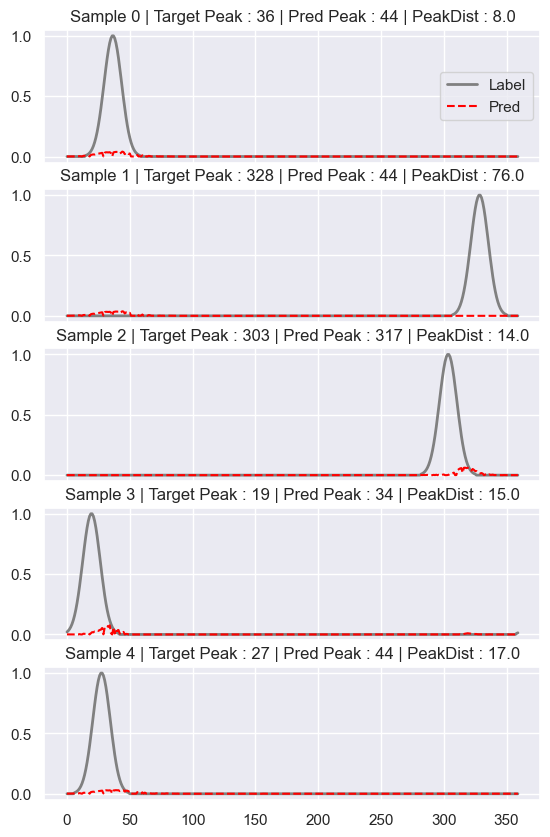

[  1   2   3   4   5   7   9  10  13  16  17  19  20  21  22  23  24  25
  26  27  28  30  31  33  34  35  38  39  40  44  45 143 181 219 233 314
 316 317 318 319 320 321 322 323 324 325 327 328 329 330 331 333 334 336
 337 338 339 340 343 344 345 346 348 351 352 355 357 358]
SAVING TO ... /its/home/nn268/antvis/antvis/optics/res_big_loop_saves/models/p3/testing/RealThing_300E_1e-4_ADAM_Eighths_[452, 144]/2c2l/


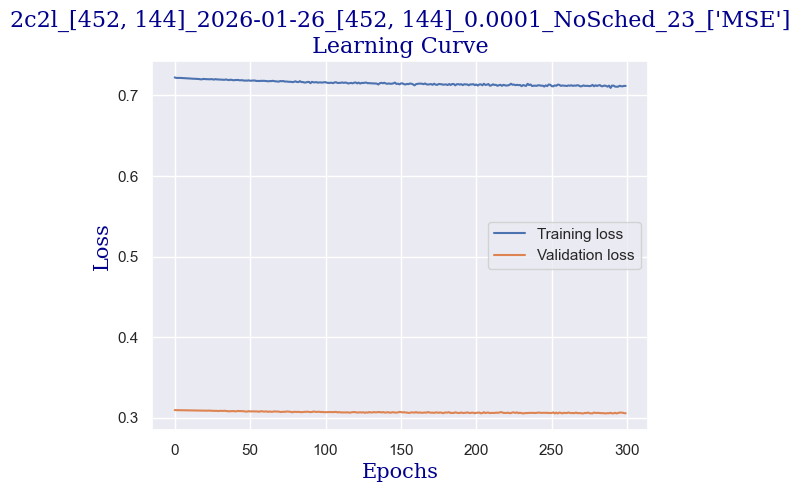

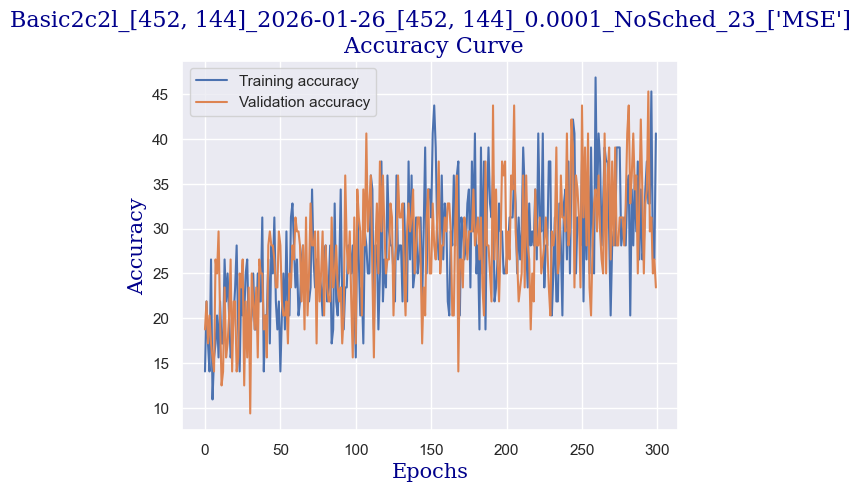

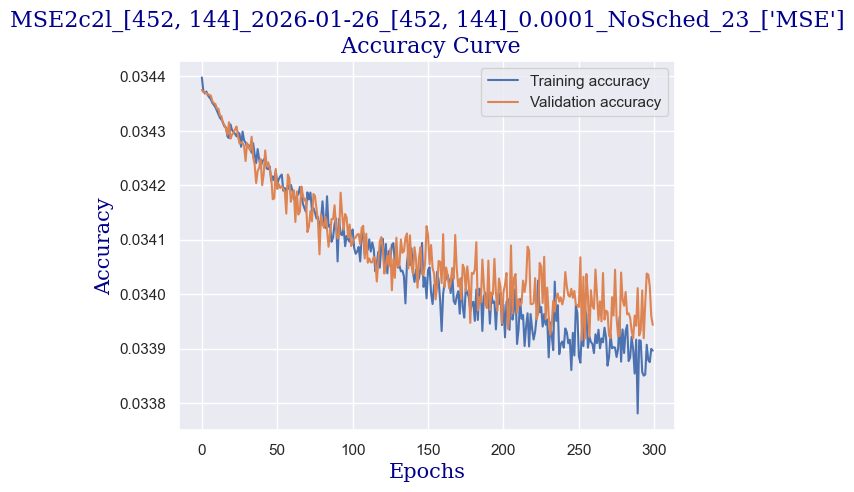

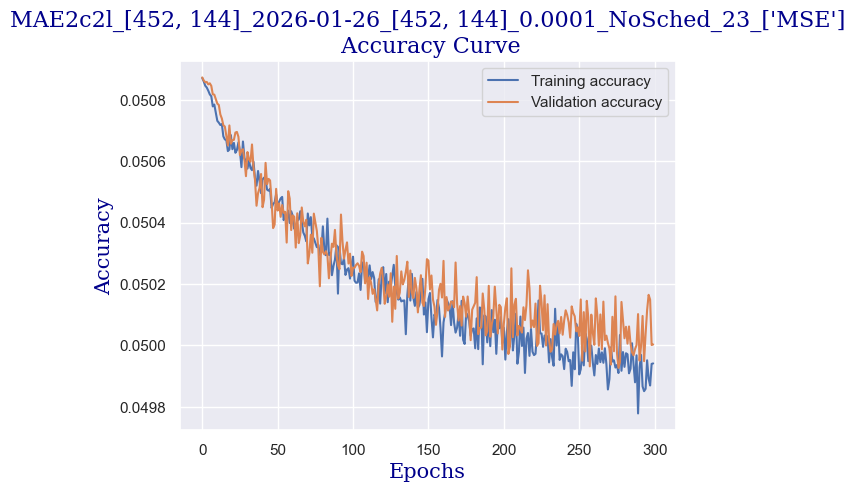

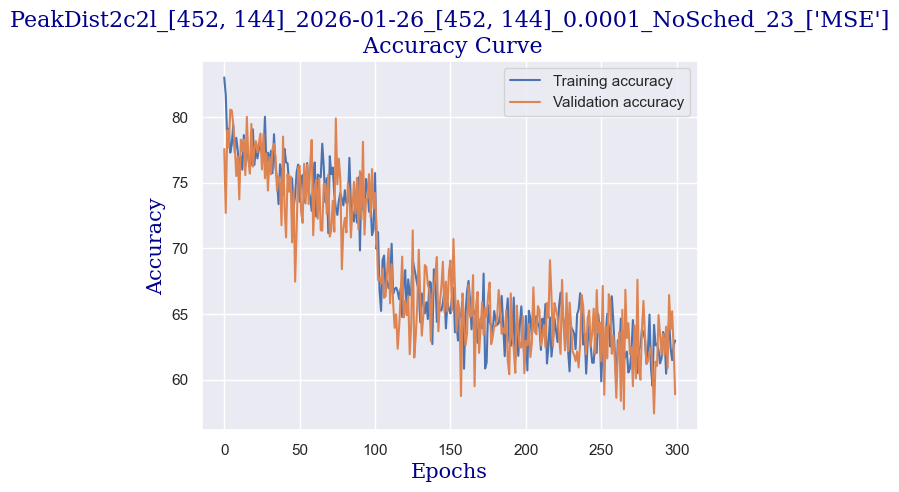

plot_confusion ACTUAL [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36]
plot_confusion PREDICTION [ 0  1  2  3  4 14 18 22 23 31 32 33 34 35 36]
actual  [ 7 33 20 34 11  9  0 17 23 25 17  2 21 15  0  4  1 34 24  5  4  3  3 32
 13  0 14 17 29  1 15  4 23  1 23 35  2 33 32  0 13 22 32  0  0 27  4  6
 33 32 25  2  1 32 24 36 33 24 29 32 32 30  2  7  5  2 31 29 21 35 33 13
 32 23 36 26  0 18 36 16  1 35 32 13 28 28  4 30 15 18 25 31 21 32  4 20
 32 30  0 35  6 22 20 10  3  2 30  2 33 15  2 21  1 14  3 12 20 23 30 21
  3 32 21  3 10 33 36 21 18  3 31  3  3 24 32  8 16 34 34 28  0  5 12 21
 16 29  3 35  9  0 30 22  3  9  0 34 25 35 12  2 32 25 23 27 22 14  6 27
 34  8 26  7 27  0 33  2  2 34  3 32 28 34 22 22  1 18 27 10 34 20 35  4
  5  5  1  1 28 27  3 28 32 26 21 34 18  1 26 18 12  0  6  0 36 24 34 31
  4  4 13  6  2 19 34 13  4 22 32 32 23 18 33 35 14 18 18 25  2  5  7 10
 16 36 23 33 18 14  3 29  3 16  3 31  5  1 18  3  2 3

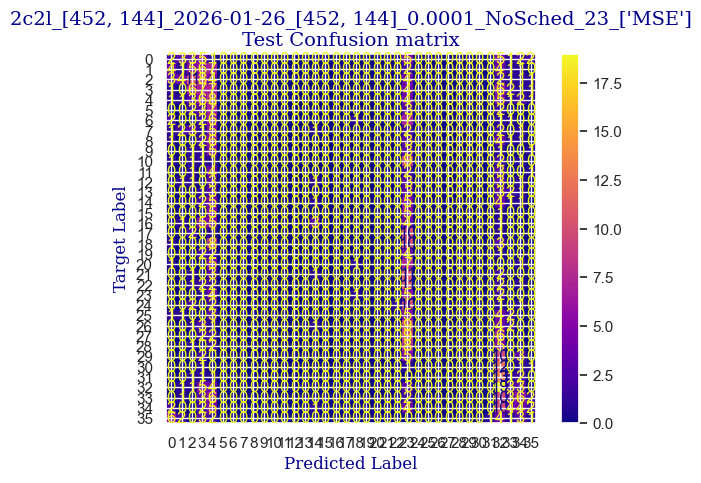

 
 END 2c2l [452, 144] Run Time:  19356.118847909995


Epochs,▁
Test acc rough,█▃▁▃▂▃▆▂▁▇▄▃
TrainAcc rough,▁▄▂▂▂▂▁▃▅▂▅▂▆▄▅▂▆▄▂▄█▂▄▅▅▅▄█▃▆▆▅▇▄▆▅▇▆▅▇
ValAcc rough,▂▃▂▁▂▆▄▅▂▆▁▄▄▂▃▆▄▃▅▃▄▆▃▄▃▃█▄▄▅▅█▆▇▆▆▁█▇▆
c_epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▆▆▆▆▆▆▆▇▇▇▇███
t_loss,███▇▇▇▇▇▇▆▆▅▅▆▅▄▄▄▄▄▃▃▂▃▂▃▃▂▃▂▁▁▂▂▃▁▁▁▁▁
test_acc_MAE,▁▅▇▆█▆▃██▁▆▆
test_acc_MSE,▁▄▆▆▇▆▂▇█▂▄█
test_peakDist,▁▅▇▅▆▆▅█▄▃▇▆
train_err_MAE,████▇▇▆▇▆▆▆▅▅▅▆▅▅▅▅▄▄▄▆▄▅▄▃▁▃▆▃▃▄▄▄▅▂▃▅▃
+6,...


wandb: Agent Starting Run: keth5ige with config:
wandb: 	batch_size: 64
wandb: 	epochs: 300
wandb: 	half_ciprange: 22
wandb: 	learning_rate: 0.0001
wandb: 	loss_fn_cards: ['MSE']
wandb: 	model_cards: [{'Ks': [3, 5], 'channels': 3, 'dropout': 0.2, 'f_lin_lay': [1032192, 255744, 62208, 14976, 3072, 640, 128], 'idx': 6, 'model': '2c2l', 'name': '2c2l'}]
wandb: 	optimiser: ['adam']
wandb: 	resolution_cards: [{'index': 0, 'padding': 5, 'resolution': [452, 144]}]
wandb: 	seeds: 22
wandb: 	std_dev: 7
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from /its/home/nn268/.netrc.


{'name': '2c2l', 'model': '2c2l', 'channels': 3, 'Ks': (3, 5), 'f_lin_lay': [1032192, 255744, 62208, 14976, 3072, 640, 128], 'idx': 6, 'dropout': 0.2}
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 1
seed:  22
loss function:  ['MSE']
Batch size:  64
Training epochs:  300
start time:  134432.244345143
Model Name 2c2l
/its/home/nn268/antvis/antvis/optics/NC_IDSW/
set_lossfn    lf  ['MSE']


  0%|                                      | 0/300 [00:00<?, ?it/s]

Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


peak dist means  86.98660714285714
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03441406378433818, 'MAE': 0.05087606555649212, 'peakDist': 86.98660714285714}
Validating...


  0%|                              | 1/300 [00:06<30:52,  6.19s/it]

peak dist means  77.36458333333333
v loss  0.3093656115233898
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  81.30431547619048
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034373688378504345, 'MAE': 0.05085865354963711, 'peakDist': 81.30431547619048}
Validating...


  1%|▏                             | 2/300 [00:12<30:14,  6.09s/it]

peak dist means  81.05208333333333
v loss  0.3093446381390095
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  81.69642857142857
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03436869897303127, 'MAE': 0.05084591128286861, 'peakDist': 81.69642857142857}
Validating...


  1%|▎                             | 3/300 [00:18<30:38,  6.19s/it]

peak dist means  78.00694444444444
v loss  0.30929750576615334
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.3110119047619
tacc:  {'baseAcc': 10.9375, 'MSE': 0.03435855553973289, 'MAE': 0.050814579285326456, 'peakDist': 77.3110119047619}
Validating...


  1%|▍                             | 4/300 [00:24<30:24,  6.16s/it]

peak dist means  78.30902777777777
v loss  0.3092415854334831
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.26041666666667
tacc:  {'baseAcc': 10.9375, 'MSE': 0.03436182013579777, 'MAE': 0.05081724818973314, 'peakDist': 79.26041666666667}
Validating...


  2%|▌                             | 5/300 [00:30<30:24,  6.18s/it]

peak dist means  80.69444444444444
v loss  0.30925821885466576
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.41666666666667
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03434451882328306, 'MAE': 0.05076946353628522, 'peakDist': 77.41666666666667}
EPOCH    5 / 300:


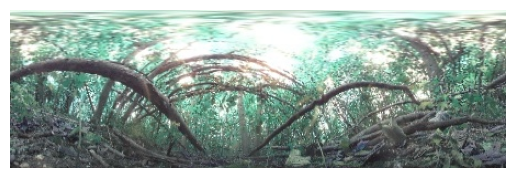

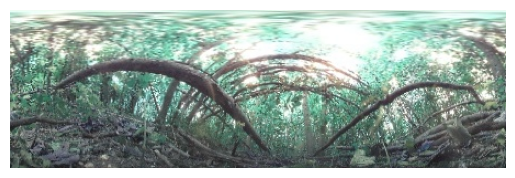

TRUE LABEL    :          336
PREDICTION    :          331
Validating...


  2%|▌                             | 6/300 [00:37<30:45,  6.28s/it]

peak dist means  79.91319444444444
v loss  0.30919158086180687
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.54092261904762
tacc:  {'baseAcc': 21.875, 'MSE': 0.03434585141284125, 'MAE': 0.05076811533598673, 'peakDist': 77.54092261904762}
Validating...


  2%|▋                             | 7/300 [00:43<30:44,  6.30s/it]

peak dist means  79.67534722222223
v loss  0.3091958090662956
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.05952380952381
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034349209673347925, 'MAE': 0.05077913137418883, 'peakDist': 79.05952380952381}
Validating...


  3%|▊                             | 8/300 [00:50<30:45,  6.32s/it]

peak dist means  80.74652777777777
v loss  0.30919621884822845
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.2016369047619
tacc:  {'baseAcc': 18.75, 'MSE': 0.03432837341512952, 'MAE': 0.050722649232262655, 'peakDist': 76.2016369047619}
Validating...


  3%|▉                             | 9/300 [00:56<30:51,  6.36s/it]

peak dist means  77.23090277777777
v loss  0.30908165127038956
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.79315476190476
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03433495706745556, 'MAE': 0.050729746087676005, 'peakDist': 77.79315476190476}
Validating...


  3%|▉                            | 10/300 [01:02<30:58,  6.41s/it]

peak dist means  77.9375
v loss  0.3091163896024227
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.66071428571429
tacc:  {'baseAcc': 15.625, 'MSE': 0.03432424809961092, 'MAE': 0.05070369672917184, 'peakDist': 75.66071428571429}
Validating...


  4%|█                            | 11/300 [01:09<31:08,  6.46s/it]

peak dist means  74.82291666666667
v loss  0.309069499373436
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.89360119047619
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03432659042023477, 'MAE': 0.05072374358063653, 'peakDist': 78.89360119047619}
Validating...


  4%|█▏                           | 12/300 [01:16<31:14,  6.51s/it]

peak dist means  73.77951388888889
v loss  0.30888883769512177
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.9702380952381
tacc:  {'baseAcc': 12.5, 'MSE': 0.03433072229936009, 'MAE': 0.05072273260780743, 'peakDist': 77.9702380952381}
Validating...


  4%|█▎                           | 13/300 [01:22<30:56,  6.47s/it]

peak dist means  81.31076388888889
v loss  0.308938205242157
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.43526785714286
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034322449671370645, 'MAE': 0.050708932535988946, 'peakDist': 77.43526785714286}
Validating...


  5%|█▎                           | 14/300 [01:29<31:02,  6.51s/it]

peak dist means  76.31423611111111
v loss  0.3089412972331047
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.8422619047619
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03431672443236623, 'MAE': 0.05070409409347035, 'peakDist': 77.8422619047619}
Validating...


  5%|█▍                           | 15/300 [01:35<30:43,  6.47s/it]

peak dist means  74.81076388888889
v loss  0.30886320397257805
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.52455357142857
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03432039082759902, 'MAE': 0.05069625111562865, 'peakDist': 78.52455357142857}
Validating...


  5%|█▌                           | 16/300 [01:41<30:33,  6.45s/it]

peak dist means  72.61805555555556
v loss  0.3087967298924923
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.41741071428571
tacc:  {'baseAcc': 15.625, 'MSE': 0.03431529303391775, 'MAE': 0.05069658160209656, 'peakDist': 77.41741071428571}
Validating...


  6%|█▋                           | 17/300 [01:48<30:16,  6.42s/it]

peak dist means  74.38194444444444
v loss  0.3087999224662781
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.33854166666667
tacc:  {'baseAcc': 26.5625, 'MSE': 0.034302386322191784, 'MAE': 0.05065263027236575, 'peakDist': 76.33854166666667}
Validating...


  6%|█▋                           | 18/300 [01:54<29:18,  6.24s/it]

peak dist means  76.09895833333333
v loss  0.3089292086660862
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.46800595238095
tacc:  {'baseAcc': 15.625, 'MSE': 0.03428874679264568, 'MAE': 0.05061910106312661, 'peakDist': 76.46800595238095}
Validating...


  6%|█▊                           | 19/300 [02:00<28:50,  6.16s/it]

peak dist means  77.51041666666667
v loss  0.3087637275457382
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.19494047619048
tacc:  {'baseAcc': 10.9375, 'MSE': 0.03430865492139544, 'MAE': 0.05066090875438282, 'peakDist': 77.19494047619048}
Validating...


  7%|█▉                           | 20/300 [02:06<29:00,  6.22s/it]

peak dist means  73.74131944444444
v loss  0.30865388363599777
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.65997023809524
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03429643561442693, 'MAE': 0.05064381605812481, 'peakDist': 76.65997023809524}
Validating...


  7%|██                           | 21/300 [02:12<29:16,  6.30s/it]

peak dist means  75.94965277777777
v loss  0.3086819276213646
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.52008928571429
tacc:  {'baseAcc': 25.0, 'MSE': 0.03427180683328992, 'MAE': 0.05057779859219279, 'peakDist': 72.52008928571429}
Validating...


  7%|██▏                          | 22/300 [02:19<29:47,  6.43s/it]

peak dist means  77.16319444444444
v loss  0.3088779039680958
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.20833333333333
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03430762549950963, 'MAE': 0.05067377661665281, 'peakDist': 77.20833333333333}
Validating...


  8%|██▏                          | 23/300 [02:26<29:51,  6.47s/it]

peak dist means  77.35416666666667
v loss  0.30880214273929596
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.38764880952381
tacc:  {'baseAcc': 15.625, 'MSE': 0.03428577933283079, 'MAE': 0.050619221691574366, 'peakDist': 76.38764880952381}
Validating...


  8%|██▎                          | 24/300 [02:32<30:09,  6.56s/it]

peak dist means  76.86979166666667
v loss  0.3086962662637234
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.71056547619048
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03427291324450856, 'MAE': 0.050583524540776297, 'peakDist': 73.71056547619048}
Validating...


  8%|██▍                          | 25/300 [02:39<30:05,  6.57s/it]

peak dist means  75.5
v loss  0.3084905818104744
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.70833333333333
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034295572234051566, 'MAE': 0.05064710052240463, 'peakDist': 77.70833333333333}
Validating...


  9%|██▌                          | 26/300 [02:46<30:15,  6.63s/it]

peak dist means  75.64583333333333
v loss  0.30858439952135086
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.63616071428571
tacc:  {'baseAcc': 21.875, 'MSE': 0.034281027813752495, 'MAE': 0.050595037993930635, 'peakDist': 74.63616071428571}
Validating...


  9%|██▌                          | 27/300 [02:52<29:43,  6.53s/it]

peak dist means  76.74131944444444
v loss  0.30847083777189255
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.28422619047619
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03424358616272608, 'MAE': 0.05052182060622033, 'peakDist': 73.28422619047619}
Validating...


  9%|██▋                          | 28/300 [02:58<29:09,  6.43s/it]

peak dist means  76.34548611111111
v loss  0.3084396868944168
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.20535714285714
tacc:  {'baseAcc': 15.625, 'MSE': 0.034273779640595116, 'MAE': 0.050594750082209, 'peakDist': 76.20535714285714}
Validating...


 10%|██▊                          | 29/300 [03:05<28:59,  6.42s/it]

peak dist means  73.15972222222223
v loss  0.3083525560796261
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.17485119047619
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03425062199433645, 'MAE': 0.050539405040797736, 'peakDist': 74.17485119047619}
Validating...


 10%|██▉                          | 30/300 [03:11<28:31,  6.34s/it]

peak dist means  74.14756944444444
v loss  0.3083382919430733
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.80208333333333
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03427184568274589, 'MAE': 0.050598038626568656, 'peakDist': 76.80208333333333}
Validating...


 10%|██▉                          | 31/300 [03:17<27:53,  6.22s/it]

peak dist means  73.81076388888889
v loss  0.30826300010085106
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.52752976190476
tacc:  {'baseAcc': 15.625, 'MSE': 0.03427440158668019, 'MAE': 0.05058805076848893, 'peakDist': 76.52752976190476}
Validating...


 11%|███                          | 32/300 [03:23<27:45,  6.21s/it]

peak dist means  71.19965277777777
v loss  0.30822737514972687
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.53497023809524
tacc:  {'baseAcc': 21.875, 'MSE': 0.034265070798851195, 'MAE': 0.05057152679988316, 'peakDist': 74.53497023809524}
Validating...


 11%|███▏                         | 33/300 [03:29<27:39,  6.22s/it]

peak dist means  71.02604166666667
v loss  0.30817169323563576
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.10863095238095
tacc:  {'baseAcc': 31.25, 'MSE': 0.0342588997667744, 'MAE': 0.05055092150966326, 'peakDist': 76.10863095238095}
Validating...


 11%|███▎                         | 34/300 [03:35<27:29,  6.20s/it]

peak dist means  76.96875
v loss  0.3083098791539669
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.01264880952381
tacc:  {'baseAcc': 21.875, 'MSE': 0.03425026915612675, 'MAE': 0.050545512920334226, 'peakDist': 74.01264880952381}
Validating...


 12%|███▍                         | 35/300 [03:42<27:39,  6.26s/it]

peak dist means  74.75347222222223
v loss  0.30831750109791756
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.3110119047619
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03425433912447521, 'MAE': 0.05055031730305581, 'peakDist': 74.3110119047619}
Validating...


 12%|███▍                         | 36/300 [03:48<27:33,  6.27s/it]

peak dist means  74.63888888888889
v loss  0.30812351778149605
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.81919642857143
tacc:  {'baseAcc': 14.0625, 'MSE': 0.034263567732913155, 'MAE': 0.05058467707463673, 'peakDist': 78.81919642857143}
Validating...


 12%|███▌                         | 37/300 [03:55<27:48,  6.34s/it]

peak dist means  72.62152777777777
v loss  0.30820875242352486
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.35193452380952
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03424509863058726, 'MAE': 0.050530498049088886, 'peakDist': 74.35193452380952}
Validating...


 13%|███▋                         | 38/300 [04:01<28:05,  6.43s/it]

peak dist means  75.35590277777777
v loss  0.3083778955042362
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.20982142857143
tacc:  {'baseAcc': 25.0, 'MSE': 0.03422537516979944, 'MAE': 0.05049805875335421, 'peakDist': 72.20982142857143}
Validating...


 13%|███▊                         | 39/300 [04:08<27:56,  6.42s/it]

peak dist means  73.50520833333333
v loss  0.30801916867494583
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.85044642857143
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034248615482023785, 'MAE': 0.05054977713596253, 'peakDist': 76.85044642857143}
Validating...


 13%|███▊                         | 40/300 [04:14<27:57,  6.45s/it]

peak dist means  74.14583333333333
v loss  0.3083694763481617
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.25967261904762
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03423751766482989, 'MAE': 0.05050643054502351, 'peakDist': 73.25967261904762}
Validating...


 14%|███▉                         | 41/300 [04:21<28:18,  6.56s/it]

peak dist means  74.828125
v loss  0.3082606941461563
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.82440476190476
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034244780029569356, 'MAE': 0.05052298325158301, 'peakDist': 75.82440476190476}
Validating...


 14%|████                         | 42/300 [04:27<28:04,  6.53s/it]

peak dist means  74.23611111111111
v loss  0.3081338070333004
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.60267857142857
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03420433295624597, 'MAE': 0.05044782427804811, 'peakDist': 73.60267857142857}
Validating...


 14%|████▏                        | 43/300 [04:34<28:12,  6.59s/it]

peak dist means  76.02083333333333
v loss  0.3079056181013584
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.22470238095238
tacc:  {'baseAcc': 21.875, 'MSE': 0.03424185904718581, 'MAE': 0.05052334513692629, 'peakDist': 75.22470238095238}
Validating...


 15%|████▎                        | 44/300 [04:40<27:44,  6.50s/it]

peak dist means  76.32465277777777
v loss  0.30794771760702133
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.94494047619048
tacc:  {'baseAcc': 21.875, 'MSE': 0.03423648256631125, 'MAE': 0.05053827574565297, 'peakDist': 76.94494047619048}
Validating...


 15%|████▎                        | 45/300 [04:47<27:35,  6.49s/it]

peak dist means  75.11979166666667
v loss  0.3080367110669613
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.64732142857143
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03424381553417161, 'MAE': 0.05051953434234574, 'peakDist': 76.64732142857143}
Validating...


 15%|████▍                        | 46/300 [04:53<27:07,  6.41s/it]

peak dist means  77.41319444444444
v loss  0.3082043267786503
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.03199404761905
tacc:  {'baseAcc': 21.875, 'MSE': 0.0342245859404405, 'MAE': 0.05049806868746167, 'peakDist': 76.03199404761905}
Validating...


 16%|████▌                        | 47/300 [04:59<26:32,  6.29s/it]

peak dist means  77.375
v loss  0.30806220322847366
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.58854166666667
tacc:  {'baseAcc': 15.625, 'MSE': 0.03421001402395112, 'MAE': 0.05046336477001508, 'peakDist': 75.58854166666667}
Validating...


 16%|████▋                        | 48/300 [05:05<26:02,  6.20s/it]

peak dist means  75.13541666666667
v loss  0.3078681342303753
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.44345238095238
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03424834743851707, 'MAE': 0.050554281721512474, 'peakDist': 77.44345238095238}
Validating...


 16%|████▋                        | 49/300 [05:11<25:56,  6.20s/it]

peak dist means  76.06944444444444
v loss  0.3080386072397232
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.12797619047619
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03421999638279279, 'MAE': 0.050478982783499216, 'peakDist': 75.12797619047619}
Validating...


 17%|████▊                        | 50/300 [05:18<26:05,  6.26s/it]

peak dist means  74.84895833333333
v loss  0.3076942041516304
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.95238095238095
tacc:  {'baseAcc': 18.75, 'MSE': 0.03421523599397568, 'MAE': 0.05046470995460238, 'peakDist': 73.95238095238095}
Validating...


 17%|████▉                        | 51/300 [05:24<25:47,  6.21s/it]

peak dist means  73.67881944444444
v loss  0.30787159875035286
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.98511904761905
tacc:  {'baseAcc': 18.75, 'MSE': 0.034214143242154806, 'MAE': 0.050453239430983864, 'peakDist': 73.98511904761905}
Validating...


 17%|█████                        | 52/300 [05:30<25:57,  6.28s/it]

peak dist means  75.58159722222223
v loss  0.30793754011392593
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.45535714285714
tacc:  {'baseAcc': 21.875, 'MSE': 0.034205385439452674, 'MAE': 0.05044350613440786, 'peakDist': 75.45535714285714}
EPOCH    52 / 300:


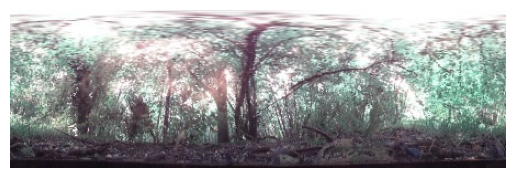

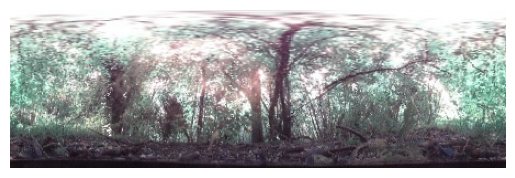

TRUE LABEL    :          31
PREDICTION    :          26
Validating...


 18%|█████                        | 53/300 [05:37<26:08,  6.35s/it]

peak dist means  68.40104166666667
v loss  0.3077651411294937
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.88616071428571
tacc:  {'baseAcc': 28.125, 'MSE': 0.034230584367400126, 'MAE': 0.050504488604409356, 'peakDist': 75.88616071428571}
Validating...


 18%|█████▏                       | 54/300 [05:44<26:42,  6.52s/it]

peak dist means  72.27083333333333
v loss  0.30766989290714264
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.44791666666667
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034194301991235646, 'MAE': 0.05043790897443181, 'peakDist': 76.44791666666667}
Validating...


 18%|█████▎                       | 55/300 [05:51<27:16,  6.68s/it]

peak dist means  75.94791666666667
v loss  0.3079391270875931
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.68377976190476
tacc:  {'baseAcc': 28.125, 'MSE': 0.03418637528305962, 'MAE': 0.05042394161933944, 'peakDist': 74.68377976190476}
Validating...


 19%|█████▍                       | 56/300 [05:58<27:37,  6.79s/it]

peak dist means  70.55381944444444
v loss  0.3075111620128155
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.19866071428571
tacc:  {'baseAcc': 21.875, 'MSE': 0.0341475944788683, 'MAE': 0.05034998289885975, 'peakDist': 73.19866071428571}
Validating...


 19%|█████▌                       | 57/300 [06:05<27:47,  6.86s/it]

peak dist means  68.92013888888889
v loss  0.30716028809547424
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.20907738095238
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03417766803786868, 'MAE': 0.05040507497532027, 'peakDist': 75.20907738095238}
Validating...


 19%|█████▌                       | 58/300 [06:12<27:48,  6.90s/it]

peak dist means  76.82465277777777
v loss  0.30776042863726616
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.91294642857143
tacc:  {'baseAcc': 21.875, 'MSE': 0.03420859078566233, 'MAE': 0.050440965309029535, 'peakDist': 73.91294642857143}
Validating...


 20%|█████▋                       | 59/300 [06:18<27:06,  6.75s/it]

peak dist means  70.63368055555556
v loss  0.30752332136034966
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.81622023809524
tacc:  {'baseAcc': 15.625, 'MSE': 0.03417735653264182, 'MAE': 0.05038713167111079, 'peakDist': 72.81622023809524}
Validating...


 20%|█████▊                       | 60/300 [06:25<26:29,  6.62s/it]

peak dist means  74.39756944444444
v loss  0.3076723888516426
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.66592261904762
tacc:  {'baseAcc': 28.125, 'MSE': 0.03416703605935687, 'MAE': 0.0503760189527557, 'peakDist': 74.66592261904762}
Validating...


 20%|█████▉                       | 61/300 [06:31<25:58,  6.52s/it]

peak dist means  68.21180555555556
v loss  0.30726535990834236
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.24330357142857
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03418695323524021, 'MAE': 0.05041177641777765, 'peakDist': 72.24330357142857}
Validating...


 21%|█████▉                       | 62/300 [06:37<25:14,  6.37s/it]

peak dist means  71.91666666666667
v loss  0.3078181743621826
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.44419642857143
tacc:  {'baseAcc': 28.125, 'MSE': 0.03421482922775405, 'MAE': 0.05046012376745542, 'peakDist': 76.44419642857143}
EPOCH    62 / 300:


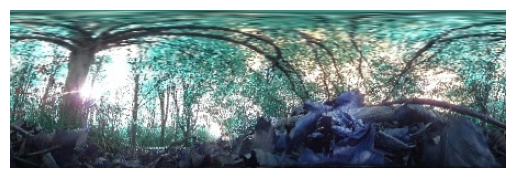

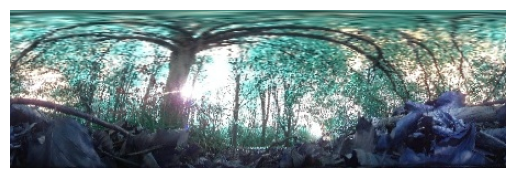

TRUE LABEL    :          148
PREDICTION    :          358
Validating...


 21%|██████                       | 63/300 [06:43<25:15,  6.40s/it]

peak dist means  71.71006944444444
v loss  0.3077053911983967
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.27455357142857
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03419079808961777, 'MAE': 0.050419872892754417, 'peakDist': 75.27455357142857}
Validating...


 21%|██████▏                      | 64/300 [06:50<25:00,  6.36s/it]

peak dist means  70.95659722222223
v loss  0.3076106086373329
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.80729166666667
tacc:  {'baseAcc': 12.5, 'MSE': 0.03418620870936485, 'MAE': 0.050413375276894795, 'peakDist': 75.80729166666667}
Validating...


 22%|██████▎                      | 65/300 [06:56<24:46,  6.32s/it]

peak dist means  72.80381944444444
v loss  0.30761275812983513
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.16741071428571
tacc:  {'baseAcc': 21.875, 'MSE': 0.034195955665338604, 'MAE': 0.0504279008933476, 'peakDist': 77.16741071428571}
Validating...


 22%|██████▍                      | 66/300 [07:02<24:38,  6.32s/it]

peak dist means  70.75694444444444
v loss  0.30737217515707016
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.69122023809524
tacc:  {'baseAcc': 31.25, 'MSE': 0.03416794024053074, 'MAE': 0.05038125830746833, 'peakDist': 74.69122023809524}
Validating...


 22%|██████▍                      | 67/300 [07:08<24:30,  6.31s/it]

peak dist means  75.75
v loss  0.3076799623668194
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.43675595238095
tacc:  {'baseAcc': 25.0, 'MSE': 0.03417601737947691, 'MAE': 0.05038257510889144, 'peakDist': 74.43675595238095}
Validating...


 23%|██████▌                      | 68/300 [07:15<24:17,  6.28s/it]

peak dist means  75.67361111111111
v loss  0.30759740993380547
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.21577380952381
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034142153071505685, 'MAE': 0.050334125225033076, 'peakDist': 73.21577380952381}
Validating...


 23%|██████▋                      | 69/300 [07:21<24:14,  6.29s/it]

peak dist means  72.60416666666667
v loss  0.3071883097290993
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.91369047619048
tacc:  {'baseAcc': 18.75, 'MSE': 0.034181153490429834, 'MAE': 0.0503972674764338, 'peakDist': 73.91369047619048}
Validating...


 23%|██████▊                      | 70/300 [07:28<24:43,  6.45s/it]

peak dist means  70.10763888888889
v loss  0.3072699271142483
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.35193452380952
tacc:  {'baseAcc': 25.0, 'MSE': 0.03416573628783226, 'MAE': 0.050397442210288274, 'peakDist': 73.35193452380952}
Validating...


 24%|██████▊                      | 71/300 [07:34<24:42,  6.47s/it]

peak dist means  72.79166666666667
v loss  0.3075145557522774
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.1235119047619
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03415344850648017, 'MAE': 0.05035405464115597, 'peakDist': 73.1235119047619}
Validating...


 24%|██████▉                      | 72/300 [07:41<25:04,  6.60s/it]

peak dist means  70.57465277777777
v loss  0.3077772483229637
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.94642857142857
tacc:  {'baseAcc': 18.75, 'MSE': 0.03414950803631828, 'MAE': 0.050335166532368886, 'peakDist': 73.94642857142857}
Validating...


 24%|███████                      | 73/300 [07:48<24:51,  6.57s/it]

peak dist means  72.02777777777777
v loss  0.307397972792387
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.04613095238095
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03417290711686725, 'MAE': 0.05038651664342199, 'peakDist': 75.04613095238095}
Validating...


 25%|███████▏                     | 74/300 [07:54<24:32,  6.52s/it]

peak dist means  74.42708333333333
v loss  0.3072797358036041
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.64880952380952
tacc:  {'baseAcc': 31.25, 'MSE': 0.03412108389394624, 'MAE': 0.05027677580004647, 'peakDist': 71.64880952380952}
Validating...


 25%|███████▎                     | 75/300 [08:01<24:29,  6.53s/it]

peak dist means  71.140625
v loss  0.3074297606945038
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.9233630952381
tacc:  {'baseAcc': 18.75, 'MSE': 0.034144517743871325, 'MAE': 0.05031264466898782, 'peakDist': 73.9233630952381}
Validating...


 25%|███████▎                     | 76/300 [08:07<24:11,  6.48s/it]

peak dist means  75.94097222222223
v loss  0.307512778788805
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.17485119047619
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03414165991402808, 'MAE': 0.050316991550581794, 'peakDist': 71.17485119047619}
Validating...


 26%|███████▍                     | 77/300 [08:13<23:42,  6.38s/it]

peak dist means  69.00520833333333
v loss  0.30719342082738876
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.01860119047619
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03411115014127323, 'MAE': 0.050256630849270595, 'peakDist': 72.01860119047619}
Validating...


 26%|███████▌                     | 78/300 [08:19<23:28,  6.35s/it]

peak dist means  74.83333333333333
v loss  0.30726566910743713
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.13318452380952
tacc:  {'baseAcc': 25.0, 'MSE': 0.0341093446172419, 'MAE': 0.050257859485489983, 'peakDist': 71.13318452380952}
Validating...


 26%|███████▋                     | 79/300 [08:26<23:04,  6.27s/it]

peak dist means  75.69791666666667
v loss  0.3076331689953804
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.0014880952381
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03415763839369729, 'MAE': 0.050360755019244696, 'peakDist': 73.0014880952381}
Validating...


 27%|███████▋                     | 80/300 [08:32<23:05,  6.30s/it]

peak dist means  67.28472222222223
v loss  0.3070230633020401
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.68824404761905
tacc:  {'baseAcc': 31.25, 'MSE': 0.03411907436592238, 'MAE': 0.05027326959229651, 'peakDist': 69.68824404761905}
Validating...


 27%|███████▊                     | 81/300 [08:38<22:38,  6.20s/it]

peak dist means  69.21354166666667
v loss  0.3070015497505665
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.10044642857143
tacc:  {'baseAcc': 29.6875, 'MSE': 0.034177805696214945, 'MAE': 0.05039871111512184, 'peakDist': 76.10044642857143}
Validating...


 27%|███████▉                     | 82/300 [08:44<22:48,  6.28s/it]

peak dist means  68.93229166666667
v loss  0.30705467984080315
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.47470238095238
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03410283280980019, 'MAE': 0.05023188073010672, 'peakDist': 69.47470238095238}
Validating...


 28%|████████                     | 83/300 [08:51<23:15,  6.43s/it]

peak dist means  69.05902777777777
v loss  0.3069940321147442
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.00744047619048
tacc:  {'baseAcc': 28.125, 'MSE': 0.0341045292360442, 'MAE': 0.050254207636628835, 'peakDist': 73.00744047619048}
Validating...


 28%|████████                     | 84/300 [08:58<23:27,  6.52s/it]

peak dist means  71.21527777777777
v loss  0.307235524058342
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.39285714285714
tacc:  {'baseAcc': 21.875, 'MSE': 0.0341306688884894, 'MAE': 0.05028320760244415, 'peakDist': 70.39285714285714}
Validating...


 28%|████████▏                    | 85/300 [09:05<23:54,  6.67s/it]

peak dist means  72.74479166666667
v loss  0.30722079426050186
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  73.51041666666667
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03411444932931945, 'MAE': 0.05027123256808236, 'peakDist': 73.51041666666667}
Validating...


 29%|████████▎                    | 86/300 [09:12<24:09,  6.77s/it]

peak dist means  71.27083333333333
v loss  0.30740124732255936
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.03497023809524
tacc:  {'baseAcc': 18.75, 'MSE': 0.03417154703111876, 'MAE': 0.050381049868606385, 'peakDist': 76.03497023809524}
Validating...


 29%|████████▍                    | 87/300 [09:19<24:18,  6.85s/it]

peak dist means  72.61631944444444
v loss  0.30706577003002167
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.4702380952381
tacc:  {'baseAcc': 21.875, 'MSE': 0.03411494479292915, 'MAE': 0.050279771288235985, 'peakDist': 72.4702380952381}
Validating...


 29%|████████▌                    | 88/300 [09:26<24:17,  6.88s/it]

peak dist means  71.55729166666667
v loss  0.3072569891810417
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.61607142857143
tacc:  {'baseAcc': 28.125, 'MSE': 0.034117233008146286, 'MAE': 0.05028309069928669, 'peakDist': 72.61607142857143}
Validating...


 30%|████████▌                    | 89/300 [09:32<23:43,  6.75s/it]

peak dist means  68.60763888888889
v loss  0.30650945380330086
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.27008928571429
tacc:  {'baseAcc': 18.75, 'MSE': 0.03408782822745187, 'MAE': 0.05022227994742848, 'peakDist': 70.27008928571429}
Validating...


 30%|████████▋                    | 90/300 [09:39<23:28,  6.71s/it]

peak dist means  72.1875
v loss  0.3070187158882618
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.9858630952381
tacc:  {'baseAcc': 25.0, 'MSE': 0.03409835660741443, 'MAE': 0.05023845338395664, 'peakDist': 71.9858630952381}
Validating...


 30%|████████▊                    | 91/300 [09:45<23:05,  6.63s/it]

peak dist means  71.27777777777777
v loss  0.30648740008473396
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.85342261904762
tacc:  {'baseAcc': 34.375, 'MSE': 0.03409646415994281, 'MAE': 0.05025062089165052, 'peakDist': 70.85342261904762}
Validating...


 31%|████████▉                    | 92/300 [09:52<22:33,  6.51s/it]

peak dist means  70.11805555555556
v loss  0.3069055713713169
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.22470238095238
tacc:  {'baseAcc': 21.875, 'MSE': 0.03413329184764907, 'MAE': 0.05031738377043179, 'peakDist': 74.22470238095238}
Validating...


 31%|████████▉                    | 93/300 [09:58<22:12,  6.44s/it]

peak dist means  70.33159722222223
v loss  0.3072173483669758
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.02901785714286
tacc:  {'baseAcc': 15.625, 'MSE': 0.03409760888843309, 'MAE': 0.050265924738986154, 'peakDist': 74.02901785714286}
Validating...


 31%|█████████                    | 94/300 [10:04<21:54,  6.38s/it]

peak dist means  70.34548611111111
v loss  0.30698374658823013
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.09151785714286
tacc:  {'baseAcc': 28.125, 'MSE': 0.03408244003852209, 'MAE': 0.050187897646710986, 'peakDist': 69.09151785714286}
Validating...


 32%|█████████▏                   | 95/300 [10:10<21:37,  6.33s/it]

peak dist means  67.38541666666667
v loss  0.30708596855401993
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.52157738095238
tacc:  {'baseAcc': 25.0, 'MSE': 0.0340951725485779, 'MAE': 0.05022291165022623, 'peakDist': 71.52157738095238}
Validating...


 32%|█████████▎                   | 96/300 [10:17<21:27,  6.31s/it]

peak dist means  71.96354166666667
v loss  0.30685869231820107
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.13764880952381
tacc:  {'baseAcc': 18.75, 'MSE': 0.034092399513437635, 'MAE': 0.050229632428714206, 'peakDist': 70.13764880952381}
Validating...


 32%|█████████▍                   | 97/300 [10:23<21:04,  6.23s/it]

peak dist means  69.47395833333333
v loss  0.3068103641271591
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.03422619047619
tacc:  {'baseAcc': 28.125, 'MSE': 0.03411056438372249, 'MAE': 0.05027621008810543, 'peakDist': 75.03422619047619}
Validating...


 33%|█████████▍                   | 98/300 [10:29<20:47,  6.18s/it]

peak dist means  70.12152777777777
v loss  0.3068395182490349
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.43080357142857
tacc:  {'baseAcc': 21.875, 'MSE': 0.0340926040496145, 'MAE': 0.050227176575433644, 'peakDist': 71.43080357142857}
Validating...


 33%|█████████▌                   | 99/300 [10:35<20:56,  6.25s/it]

peak dist means  73.4375
v loss  0.30703113228082657
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.1391369047619
tacc:  {'baseAcc': 25.0, 'MSE': 0.0340545918969881, 'MAE': 0.050161444182906835, 'peakDist': 71.1391369047619}
Validating...


 33%|█████████▎                  | 100/300 [10:42<21:22,  6.41s/it]

peak dist means  70.29513888888889
v loss  0.30674437060952187
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.99479166666667
tacc:  {'baseAcc': 18.75, 'MSE': 0.03407376188607443, 'MAE': 0.05020945075721968, 'peakDist': 69.99479166666667}
Validating...


 34%|█████████▍                  | 101/300 [10:48<21:12,  6.39s/it]

peak dist means  72.54166666666667
v loss  0.30716847628355026
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.70535714285714
tacc:  {'baseAcc': 25.0, 'MSE': 0.03406539044919468, 'MAE': 0.050187474205380396, 'peakDist': 72.70535714285714}
Validating...


 34%|█████████▌                  | 102/300 [10:55<21:40,  6.57s/it]

peak dist means  69.203125
v loss  0.306723702698946
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.12276785714286
tacc:  {'baseAcc': 28.125, 'MSE': 0.03406295588328725, 'MAE': 0.050164131891159786, 'peakDist': 70.12276785714286}
Validating...


 34%|█████████▌                  | 103/300 [11:02<21:30,  6.55s/it]

peak dist means  70.27777777777777
v loss  0.30635426193475723
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  69.85863095238095
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03402628785087949, 'MAE': 0.050107198989107496, 'peakDist': 69.85863095238095}
Validating...


 35%|█████████▋                  | 104/300 [11:09<21:39,  6.63s/it]

peak dist means  69.8125
v loss  0.30718544498085976
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  72.88764880952381
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03408741223670188, 'MAE': 0.05023084953427315, 'peakDist': 72.88764880952381}
Validating...


 35%|█████████▊                  | 105/300 [11:15<21:17,  6.55s/it]

peak dist means  71.86111111111111
v loss  0.30672864615917206
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  71.17261904761905
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03406432324222156, 'MAE': 0.0501986172582422, 'peakDist': 71.17261904761905}
Validating...


 35%|█████████▉                  | 106/300 [11:21<20:49,  6.44s/it]

peak dist means  71.43923611111111
v loss  0.3066639229655266
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  70.86904761904762
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03406649011941183, 'MAE': 0.0501784167829014, 'peakDist': 70.86904761904762}
Validating...


 36%|█████████▉                  | 107/300 [11:27<20:28,  6.36s/it]

peak dist means  69.51388888888889
v loss  0.3065057210624218
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  67.69196428571429
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03406994559225582, 'MAE': 0.05017172172665596, 'peakDist': 67.69196428571429}
Validating...


 36%|██████████                  | 108/300 [11:34<20:17,  6.34s/it]

peak dist means  68.47395833333333
v loss  0.30668797343969345
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.41517857142857
tacc:  {'baseAcc': 31.25, 'MSE': 0.03405696987396195, 'MAE': 0.05017968426857676, 'peakDist': 66.41517857142857}
Validating...


 36%|██████████▏                 | 109/300 [11:40<20:09,  6.33s/it]

peak dist means  65.92013888888889
v loss  0.30686090886592865
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.04017857142857
tacc:  {'baseAcc': 28.125, 'MSE': 0.034055029175111225, 'MAE': 0.050202171717371256, 'peakDist': 66.04017857142857}
Validating...


 37%|██████████▎                 | 110/300 [11:46<19:45,  6.24s/it]

peak dist means  64.73090277777777
v loss  0.30653782188892365
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.73214285714286
tacc:  {'baseAcc': 28.125, 'MSE': 0.0340817944989318, 'MAE': 0.05020470083469436, 'peakDist': 64.73214285714286}
Validating...


 37%|██████████▎                 | 111/300 [11:52<19:46,  6.28s/it]

peak dist means  60.748263888888886
v loss  0.3064347170293331
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.60863095238095
tacc:  {'baseAcc': 31.25, 'MSE': 0.034056510244097025, 'MAE': 0.050144639753160025, 'peakDist': 64.60863095238095}
Validating...


 37%|██████████▍                 | 112/300 [11:59<19:52,  6.34s/it]

peak dist means  67.06597222222223
v loss  0.30661090835928917
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.87127976190476
tacc:  {'baseAcc': 31.25, 'MSE': 0.03411153473314785, 'MAE': 0.05026475996488616, 'peakDist': 66.87127976190476}
Validating...


 38%|██████████▌                 | 113/300 [12:05<19:43,  6.33s/it]

peak dist means  65.55208333333333
v loss  0.3069602847099304
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.90699404761905
tacc:  {'baseAcc': 28.125, 'MSE': 0.034064672000351404, 'MAE': 0.050188152208214716, 'peakDist': 64.90699404761905}
Validating...


 38%|██████████▋                 | 114/300 [12:11<19:37,  6.33s/it]

peak dist means  64.52083333333333
v loss  0.3061245195567608
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.99702380952381
tacc:  {'baseAcc': 31.25, 'MSE': 0.03405361374219259, 'MAE': 0.050140400018010824, 'peakDist': 63.99702380952381}
Validating...


 38%|██████████▋                 | 115/300 [12:18<19:43,  6.39s/it]

peak dist means  66.38368055555556
v loss  0.30680208653211594
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.52083333333333
tacc:  {'baseAcc': 37.5, 'MSE': 0.03405526599713734, 'MAE': 0.050137048321110864, 'peakDist': 64.52083333333333}
Validating...


 39%|██████████▊                 | 116/300 [12:25<19:58,  6.52s/it]

peak dist means  65.74826388888889
v loss  0.3068145401775837
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.554315476190474
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03403748536393756, 'MAE': 0.05011856449501855, 'peakDist': 60.554315476190474}
Validating...


 39%|██████████▉                 | 117/300 [12:31<20:00,  6.56s/it]

peak dist means  68.68576388888889
v loss  0.30697207897901535
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.90922619047619
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03406418097161111, 'MAE': 0.050184148053328194, 'peakDist': 63.90922619047619}
Validating...


 39%|███████████                 | 118/300 [12:38<20:00,  6.60s/it]

peak dist means  62.99131944444444
v loss  0.30644693598151207
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.088541666666664
tacc:  {'baseAcc': 31.25, 'MSE': 0.034024502017668316, 'MAE': 0.05010944587134179, 'peakDist': 62.088541666666664}
Validating...


 40%|███████████                 | 119/300 [12:45<20:07,  6.67s/it]

peak dist means  63.220486111111114
v loss  0.3063911162316799
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.55431547619048
tacc:  {'baseAcc': 25.0, 'MSE': 0.034045938757203874, 'MAE': 0.050157257134006136, 'peakDist': 65.55431547619048}
Validating...


 40%|███████████▏                | 120/300 [12:51<19:31,  6.51s/it]

peak dist means  65.42881944444444
v loss  0.30694081634283066
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  66.83482142857143
tacc:  {'baseAcc': 18.75, 'MSE': 0.034098763728425616, 'MAE': 0.05024646399986176, 'peakDist': 66.83482142857143}
Validating...


 40%|███████████▎                | 121/300 [12:58<19:26,  6.51s/it]

peak dist means  60.973958333333336
v loss  0.3066615015268326
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.36309523809524
tacc:  {'baseAcc': 18.75, 'MSE': 0.03405191110713141, 'MAE': 0.050168074844848545, 'peakDist': 63.36309523809524}
Validating...


 41%|███████████▍                | 122/300 [13:04<19:02,  6.42s/it]

peak dist means  61.361111111111114
v loss  0.3068019039928913
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.84747023809524
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03402620820062501, 'MAE': 0.05011593940712157, 'peakDist': 62.84747023809524}
Validating...


 41%|███████████▍                | 123/300 [13:10<18:48,  6.38s/it]

peak dist means  63.276041666666664
v loss  0.30673686414957047
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  65.75818452380952
tacc:  {'baseAcc': 31.25, 'MSE': 0.03405402707202094, 'MAE': 0.050157896287384485, 'peakDist': 65.75818452380952}
Validating...


 41%|███████████▌                | 124/300 [13:16<18:37,  6.35s/it]

peak dist means  63.17534722222222
v loss  0.30672065168619156
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.24627976190476
tacc:  {'baseAcc': 25.0, 'MSE': 0.034035269348394306, 'MAE': 0.050142184077274235, 'peakDist': 63.24627976190476}
Validating...


 42%|███████████▋                | 125/300 [13:23<18:25,  6.32s/it]

peak dist means  64.58506944444444
v loss  0.30642813444137573
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.661458333333336
tacc:  {'baseAcc': 34.375, 'MSE': 0.03400973567650432, 'MAE': 0.05006498098373413, 'peakDist': 62.661458333333336}
Validating...


 42%|███████████▊                | 126/300 [13:29<18:17,  6.31s/it]

peak dist means  63.517361111111114
v loss  0.30625053495168686
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.06770833333333
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03406018178377833, 'MAE': 0.05017196440270969, 'peakDist': 64.06770833333333}
Validating...


 42%|███████████▊                | 127/300 [13:35<18:22,  6.37s/it]

peak dist means  67.33506944444444
v loss  0.30666032060980797
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.51934523809524
tacc:  {'baseAcc': 25.0, 'MSE': 0.03405772078604925, 'MAE': 0.05015844035716284, 'peakDist': 64.51934523809524}
Validating...


 43%|███████████▉                | 128/300 [13:42<18:10,  6.34s/it]

peak dist means  62.91319444444444
v loss  0.3061538450419903
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.745535714285715
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03402512148022652, 'MAE': 0.05009898969105312, 'peakDist': 61.745535714285715}
Validating...


 43%|████████████                | 129/300 [13:48<18:05,  6.35s/it]

peak dist means  64.10069444444444
v loss  0.3064725808799267
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.427083333333336
tacc:  {'baseAcc': 46.875, 'MSE': 0.03395147373278936, 'MAE': 0.04997811129405385, 'peakDist': 62.427083333333336}
Validating...


 43%|████████████▏               | 130/300 [13:55<18:21,  6.48s/it]

peak dist means  65.46875
v loss  0.30598659440875053
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.08184523809524
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03403567185714131, 'MAE': 0.050146368465253284, 'peakDist': 64.08184523809524}
Validating...


 44%|████████████▏               | 131/300 [14:01<18:16,  6.49s/it]

peak dist means  64.45659722222223
v loss  0.3067925199866295
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.07514880952381
tacc:  {'baseAcc': 31.25, 'MSE': 0.034005173437652136, 'MAE': 0.050054605872858135, 'peakDist': 62.07514880952381}
Validating...


 44%|████████████▎               | 132/300 [14:08<18:29,  6.61s/it]

peak dist means  63.015625
v loss  0.30613692477345467
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.12872023809524
tacc:  {'baseAcc': 32.8125, 'MSE': 0.034020036458969116, 'MAE': 0.05009849671097029, 'peakDist': 62.12872023809524}
Validating...


 44%|████████████▍               | 133/300 [14:15<18:18,  6.58s/it]

peak dist means  65.91319444444444
v loss  0.30684537813067436
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.035714285714285
tacc:  {'baseAcc': 31.25, 'MSE': 0.03406155552892458, 'MAE': 0.050167587186609, 'peakDist': 63.035714285714285}
Validating...


 45%|████████████▌               | 134/300 [14:21<18:01,  6.52s/it]

peak dist means  60.79340277777778
v loss  0.3063977472484112
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.988839285714285
tacc:  {'baseAcc': 43.75, 'MSE': 0.03402509540319443, 'MAE': 0.050112659022921606, 'peakDist': 61.988839285714285}
Validating...


 45%|████████████▌               | 135/300 [14:28<17:54,  6.51s/it]

peak dist means  64.87847222222223
v loss  0.3066187649965286
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.296875
tacc:  {'baseAcc': 28.125, 'MSE': 0.03401297561469532, 'MAE': 0.0500923769459838, 'peakDist': 62.296875}
Validating...


 45%|████████████▋               | 136/300 [14:32<16:26,  6.01s/it]

peak dist means  65.66145833333333
v loss  0.3062644563615322
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.8921130952381
tacc:  {'baseAcc': 26.5625, 'MSE': 0.0340383734021868, 'MAE': 0.05012884132918857, 'peakDist': 64.8921130952381}
Validating...


 46%|████████████▊               | 137/300 [14:37<14:54,  5.49s/it]

peak dist means  63.92534722222222
v loss  0.3064087815582752
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.65029761904762
tacc:  {'baseAcc': 35.9375, 'MSE': 0.033996728027150744, 'MAE': 0.05006832842315946, 'peakDist': 61.65029761904762}
Validating...


 46%|████████████▉               | 138/300 [14:41<13:53,  5.14s/it]

peak dist means  60.532986111111114
v loss  0.3065331131219864
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.19940476190476
tacc:  {'baseAcc': 21.875, 'MSE': 0.03398566373756954, 'MAE': 0.05003673938058671, 'peakDist': 62.19940476190476}
Validating...


 46%|████████████▉               | 139/300 [14:48<14:55,  5.56s/it]

peak dist means  64.19791666666667
v loss  0.30639247596263885
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.238839285714285
tacc:  {'baseAcc': 34.375, 'MSE': 0.034024187319335486, 'MAE': 0.0501264754150595, 'peakDist': 62.238839285714285}
Validating...


 47%|█████████████               | 140/300 [14:54<15:46,  5.92s/it]

peak dist means  63.807291666666664
v loss  0.3063533455133438
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.03869047619048
tacc:  {'baseAcc': 31.25, 'MSE': 0.03402717216383843, 'MAE': 0.050103007682732174, 'peakDist': 64.03869047619048}
Validating...


 47%|█████████████▏              | 141/300 [15:01<16:01,  6.05s/it]

peak dist means  57.44965277777778
v loss  0.30582914873957634
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.982142857142854
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034041743548143474, 'MAE': 0.050140255086478736, 'peakDist': 60.982142857142854}
Validating...


 47%|█████████████▎              | 142/300 [15:07<16:18,  6.19s/it]

peak dist means  63.94965277777778
v loss  0.3061441518366337
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.026041666666664
tacc:  {'baseAcc': 25.0, 'MSE': 0.033986273798204604, 'MAE': 0.050056288994493936, 'peakDist': 61.026041666666664}
Validating...


 48%|█████████████▎              | 143/300 [15:14<16:32,  6.32s/it]

peak dist means  60.49131944444444
v loss  0.30652977898716927
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.854166666666664
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03400177561811039, 'MAE': 0.05006213095926103, 'peakDist': 61.854166666666664}
Validating...


 48%|█████████████▍              | 144/300 [15:20<16:23,  6.31s/it]

peak dist means  58.998263888888886
v loss  0.30576882883906364
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.635416666666664
tacc:  {'baseAcc': 34.375, 'MSE': 0.03400861773462523, 'MAE': 0.05007252398700941, 'peakDist': 59.635416666666664}
Validating...


 48%|█████████████▌              | 145/300 [15:26<16:06,  6.24s/it]

peak dist means  60.8125
v loss  0.30572083219885826
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.21949404761905
tacc:  {'baseAcc': 40.625, 'MSE': 0.03396285946170489, 'MAE': 0.05003058892630395, 'peakDist': 59.21949404761905}
Validating...


 49%|█████████████▋              | 146/300 [15:32<15:58,  6.22s/it]

peak dist means  63.25347222222222
v loss  0.3065005801618099
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.776785714285715
tacc:  {'baseAcc': 31.25, 'MSE': 0.033980855984347205, 'MAE': 0.05003531720666658, 'peakDist': 61.776785714285715}
Validating...


 49%|█████████████▋              | 147/300 [15:39<15:49,  6.21s/it]

peak dist means  61.85590277777778
v loss  0.30629339814186096
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.46205357142857
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03402272363503774, 'MAE': 0.050118272325822284, 'peakDist': 62.46205357142857}
Validating...


 49%|█████████████▊              | 148/300 [15:45<15:35,  6.15s/it]

peak dist means  65.22048611111111
v loss  0.30671317875385284
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.085565476190474
tacc:  {'baseAcc': 31.25, 'MSE': 0.03395018602410952, 'MAE': 0.04998824479324477, 'peakDist': 58.085565476190474}
Validating...


 50%|█████████████▉              | 149/300 [15:51<15:42,  6.24s/it]

peak dist means  64.21180555555556
v loss  0.3063649907708168
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.176339285714285
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03397813669982411, 'MAE': 0.05003199158679871, 'peakDist': 60.176339285714285}
Validating...


 50%|██████████████              | 150/300 [15:57<15:44,  6.30s/it]

peak dist means  61.185763888888886
v loss  0.30624792352318764
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.001488095238095
tacc:  {'baseAcc': 37.5, 'MSE': 0.03399690684108507, 'MAE': 0.05005754725564094, 'peakDist': 62.001488095238095}
Validating...


 50%|██████████████              | 151/300 [16:04<16:00,  6.44s/it]

peak dist means  60.442708333333336
v loss  0.3058677241206169
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.473958333333336
tacc:  {'baseAcc': 32.8125, 'MSE': 0.033994175493717194, 'MAE': 0.05007062249240421, 'peakDist': 62.473958333333336}
Validating...


 51%|██████████████▏             | 152/300 [16:11<15:50,  6.43s/it]

peak dist means  64.8125
v loss  0.30671724677085876
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.89136904761905
tacc:  {'baseAcc': 31.25, 'MSE': 0.03398390681970687, 'MAE': 0.050044764897653034, 'peakDist': 59.89136904761905}
Validating...


 51%|██████████████▎             | 153/300 [16:18<16:11,  6.61s/it]

peak dist means  62.276041666666664
v loss  0.3060535192489624
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  64.04985119047619
tacc:  {'baseAcc': 34.375, 'MSE': 0.03402169226180939, 'MAE': 0.050106626181375416, 'peakDist': 64.04985119047619}
Validating...


 51%|██████████████▎             | 154/300 [16:24<16:13,  6.67s/it]

peak dist means  60.28125
v loss  0.30640289559960365
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.21279761904762
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03398819409665607, 'MAE': 0.050044073058026176, 'peakDist': 59.21279761904762}
Validating...


 52%|██████████████▍             | 155/300 [16:31<15:51,  6.56s/it]

peak dist means  62.81597222222222
v loss  0.3056275472044945
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.694940476190474
tacc:  {'baseAcc': 28.125, 'MSE': 0.0339894573248568, 'MAE': 0.05004738927597091, 'peakDist': 61.694940476190474}
Validating...


 52%|██████████████▌             | 156/300 [16:37<15:44,  6.56s/it]

peak dist means  62.895833333333336
v loss  0.3063257299363613
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  63.454613095238095
tacc:  {'baseAcc': 28.125, 'MSE': 0.034008143558388666, 'MAE': 0.050096927831570305, 'peakDist': 63.454613095238095}
Validating...


 52%|██████████████▋             | 157/300 [16:44<15:41,  6.58s/it]

peak dist means  62.72222222222222
v loss  0.3065381199121475
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.16889880952381
tacc:  {'baseAcc': 35.9375, 'MSE': 0.0340009688266686, 'MAE': 0.050068139675117675, 'peakDist': 61.16889880952381}
Validating...


 53%|██████████████▋             | 158/300 [16:50<15:16,  6.46s/it]

peak dist means  60.626736111111114
v loss  0.3056582398712635
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.586309523809526
tacc:  {'baseAcc': 34.375, 'MSE': 0.03393398384962763, 'MAE': 0.049965206356275646, 'peakDist': 61.586309523809526}
Validating...


 53%|██████████████▊             | 159/300 [16:56<15:04,  6.41s/it]

peak dist means  63.69444444444444
v loss  0.3064333647489548
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.549107142857146
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03396991995118913, 'MAE': 0.050015555428607125, 'peakDist': 61.549107142857146}
Validating...


 53%|██████████████▉             | 160/300 [17:03<14:56,  6.40s/it]

peak dist means  61.91493055555556
v loss  0.30641451478004456
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.607886904761905
tacc:  {'baseAcc': 23.4375, 'MSE': 0.033975587714286076, 'MAE': 0.050024074635335376, 'peakDist': 60.607886904761905}
Validating...


 54%|███████████████             | 161/300 [17:09<14:40,  6.33s/it]

peak dist means  61.07118055555556
v loss  0.30598513036966324
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  62.726934523809526
tacc:  {'baseAcc': 40.625, 'MSE': 0.0340050244260402, 'MAE': 0.05009287560269946, 'peakDist': 62.726934523809526}
Validating...


 54%|███████████████             | 162/300 [17:15<14:17,  6.21s/it]

peak dist means  61.302083333333336
v loss  0.3063165508210659
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.258184523809526
tacc:  {'baseAcc': 28.125, 'MSE': 0.03403300969373612, 'MAE': 0.050120010262443906, 'peakDist': 59.258184523809526}
Validating...


 54%|███████████████▏            | 163/300 [17:21<14:15,  6.25s/it]

peak dist means  58.052083333333336
v loss  0.3062501326203346
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.854166666666664
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03396972889701525, 'MAE': 0.050019341033129466, 'peakDist': 60.854166666666664}
Validating...


 55%|███████████████▎            | 164/300 [17:28<14:13,  6.27s/it]

peak dist means  60.517361111111114
v loss  0.3061022572219372
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.91889880952381
tacc:  {'baseAcc': 28.125, 'MSE': 0.03399723785973731, 'MAE': 0.05005601775788125, 'peakDist': 61.91889880952381}
Validating...


 55%|███████████████▍            | 165/300 [17:34<14:01,  6.23s/it]

peak dist means  61.532986111111114
v loss  0.3055983707308769
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.901785714285715
tacc:  {'baseAcc': 31.25, 'MSE': 0.03394773034822373, 'MAE': 0.04997250437736511, 'peakDist': 59.901785714285715}
Validating...


 55%|███████████████▍            | 166/300 [17:40<14:09,  6.34s/it]

peak dist means  64.10763888888889
v loss  0.30601314455270767
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.74404761904762
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03396170373473849, 'MAE': 0.05001092577974001, 'peakDist': 58.74404761904762}
Validating...


 56%|███████████████▌            | 167/300 [17:47<14:02,  6.34s/it]

peak dist means  63.201388888888886
v loss  0.3056509457528591
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.24925595238095
tacc:  {'baseAcc': 34.375, 'MSE': 0.03393658410225596, 'MAE': 0.04999289998695964, 'peakDist': 59.24925595238095}
Validating...


 56%|███████████████▋            | 168/300 [17:53<14:04,  6.40s/it]

peak dist means  60.833333333333336
v loss  0.30608611181378365
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.92485119047619
tacc:  {'baseAcc': 26.5625, 'MSE': 0.033963593521288464, 'MAE': 0.05001281592107955, 'peakDist': 61.92485119047619}
Validating...


 56%|███████████████▊            | 169/300 [18:00<14:07,  6.47s/it]

peak dist means  62.26909722222222
v loss  0.30599239096045494
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.823660714285715
tacc:  {'baseAcc': 39.0625, 'MSE': 0.0339092771921839, 'MAE': 0.04993853771260807, 'peakDist': 60.823660714285715}
Validating...


 57%|███████████████▊            | 170/300 [18:07<14:16,  6.59s/it]

peak dist means  62.302083333333336
v loss  0.30621059983968735
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.714285714285715
tacc:  {'baseAcc': 37.5, 'MSE': 0.033945001839172276, 'MAE': 0.04998198328983216, 'peakDist': 60.714285714285715}
Validating...


 57%|███████████████▉            | 171/300 [18:13<14:15,  6.63s/it]

peak dist means  61.947916666666664
v loss  0.30653975158929825
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.332589285714285
tacc:  {'baseAcc': 37.5, 'MSE': 0.03391364482896669, 'MAE': 0.04993890385542597, 'peakDist': 61.332589285714285}
Validating...


 57%|████████████████            | 172/300 [18:20<13:55,  6.53s/it]

peak dist means  65.03993055555556
v loss  0.30658331885933876
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.779761904761905
tacc:  {'baseAcc': 35.9375, 'MSE': 0.0339851730636188, 'MAE': 0.05005941912531853, 'peakDist': 60.779761904761905}
Validating...


 58%|████████████████▏           | 173/300 [18:26<13:28,  6.36s/it]

peak dist means  58.80555555555556
v loss  0.30558788031339645
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.34970238095238
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03396793916111901, 'MAE': 0.050010115440402715, 'peakDist': 60.34970238095238}
Validating...


 58%|████████████████▏           | 174/300 [18:32<13:18,  6.34s/it]

peak dist means  60.888888888888886
v loss  0.3059875965118408
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.61830357142857
tacc:  {'baseAcc': 21.875, 'MSE': 0.03400036142695518, 'MAE': 0.05005153960415295, 'peakDist': 59.61830357142857}
Validating...


 58%|████████████████▎           | 175/300 [18:38<12:54,  6.20s/it]

peak dist means  61.28472222222222
v loss  0.3054269663989544
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.035714285714285
tacc:  {'baseAcc': 37.5, 'MSE': 0.033946343298469274, 'MAE': 0.049976201461894174, 'peakDist': 60.035714285714285}
Validating...


 59%|████████████████▍           | 176/300 [18:44<12:42,  6.15s/it]

peak dist means  63.89409722222222
v loss  0.3055746704339981
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.492559523809526
tacc:  {'baseAcc': 34.375, 'MSE': 0.03395109801065354, 'MAE': 0.04999518571864991, 'peakDist': 61.492559523809526}
Validating...


 59%|████████████████▌           | 177/300 [18:50<12:34,  6.13s/it]

peak dist means  62.22569444444444
v loss  0.3066699206829071
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.563988095238095
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03396207094192505, 'MAE': 0.05002088152936527, 'peakDist': 60.563988095238095}
Validating...


 59%|████████████████▌           | 178/300 [18:56<12:31,  6.16s/it]

peak dist means  63.234375
v loss  0.3065510429441929
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.34672619047619
tacc:  {'baseAcc': 34.375, 'MSE': 0.03393690039714178, 'MAE': 0.04998906364753133, 'peakDist': 59.34672619047619}
Validating...


 60%|████████████████▋           | 179/300 [19:03<12:35,  6.24s/it]

peak dist means  61.970486111111114
v loss  0.30566347017884254
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.507440476190474
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03398899485667547, 'MAE': 0.05006002900855882, 'peakDist': 60.507440476190474}
Validating...


 60%|████████████████▊           | 180/300 [19:09<12:38,  6.32s/it]

peak dist means  59.94444444444444
v loss  0.30530935898423195
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.9375
tacc:  {'baseAcc': 28.125, 'MSE': 0.03397077233308837, 'MAE': 0.050027515029623396, 'peakDist': 59.9375}
Validating...


 60%|████████████████▉           | 181/300 [19:16<12:43,  6.42s/it]

peak dist means  63.26909722222222
v loss  0.30559398978948593
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.407738095238095
tacc:  {'baseAcc': 29.6875, 'MSE': 0.033965306800036205, 'MAE': 0.05002880096435547, 'peakDist': 60.407738095238095}
Validating...


 61%|████████████████▉           | 182/300 [19:22<12:43,  6.47s/it]

peak dist means  59.10590277777778
v loss  0.30559545010328293
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.52157738095238
tacc:  {'baseAcc': 34.375, 'MSE': 0.03393319763597988, 'MAE': 0.049980327841781434, 'peakDist': 59.52157738095238}
Validating...


 61%|█████████████████           | 183/300 [19:29<12:38,  6.48s/it]

peak dist means  60.55034722222222
v loss  0.3059061989188194
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.85267857142857
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03398379772191956, 'MAE': 0.050044337198847814, 'peakDist': 61.85267857142857}
Validating...


 61%|█████████████████▏          | 184/300 [19:35<12:29,  6.46s/it]

peak dist means  57.05381944444444
v loss  0.30608027428388596
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.788690476190474
tacc:  {'baseAcc': 28.125, 'MSE': 0.033983622988065086, 'MAE': 0.050052073562429064, 'peakDist': 61.788690476190474}
Validating...


 62%|█████████████████▎          | 185/300 [19:42<12:21,  6.44s/it]

peak dist means  63.088541666666664
v loss  0.3058696575462818
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.388392857142854
tacc:  {'baseAcc': 34.375, 'MSE': 0.033933237727199285, 'MAE': 0.04997232077377183, 'peakDist': 59.388392857142854}
Validating...


 62%|█████████████████▎          | 186/300 [19:48<12:01,  6.33s/it]

peak dist means  65.28993055555556
v loss  0.30605001002550125
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.264136904761905
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03390508233791306, 'MAE': 0.049936042832476754, 'peakDist': 58.264136904761905}
Validating...


 62%|█████████████████▍          | 187/300 [19:54<11:46,  6.25s/it]

peak dist means  65.44791666666667
v loss  0.30571748688817024
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.47172619047619
tacc:  {'baseAcc': 31.25, 'MSE': 0.03395083670814832, 'MAE': 0.04999902365463121, 'peakDist': 59.47172619047619}
Validating...


 63%|█████████████████▌          | 188/300 [20:00<11:26,  6.13s/it]

peak dist means  60.74652777777778
v loss  0.30617664009332657
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.270833333333336
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03394251440962156, 'MAE': 0.04995635985618546, 'peakDist': 59.270833333333336}
Validating...


 63%|█████████████████▋          | 189/300 [20:06<11:20,  6.13s/it]

peak dist means  60.645833333333336
v loss  0.3057704456150532
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.255208333333336
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03394259778516633, 'MAE': 0.049979998951866514, 'peakDist': 60.255208333333336}
Validating...


 63%|█████████████████▋          | 190/300 [20:12<11:16,  6.15s/it]

peak dist means  56.623263888888886
v loss  0.30557095631957054
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  61.335565476190474
tacc:  {'baseAcc': 20.3125, 'MSE': 0.033973656417358486, 'MAE': 0.0500482294176306, 'peakDist': 61.335565476190474}
Validating...


 64%|█████████████████▊          | 191/300 [20:18<11:09,  6.14s/it]

peak dist means  61.171875
v loss  0.30571211501955986
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.53125
tacc:  {'baseAcc': 31.25, 'MSE': 0.03396271931983176, 'MAE': 0.05003493988797778, 'peakDist': 60.53125}
Validating...


 64%|█████████████████▉          | 192/300 [20:25<11:19,  6.29s/it]

peak dist means  61.942708333333336
v loss  0.3060121312737465
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.539434523809526
tacc:  {'baseAcc': 31.25, 'MSE': 0.033946773126011805, 'MAE': 0.049965093355803264, 'peakDist': 59.539434523809526}
Validating...


 64%|██████████████████          | 193/300 [20:31<11:27,  6.42s/it]

peak dist means  59.93402777777778
v loss  0.30593038350343704
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.286458333333336
tacc:  {'baseAcc': 37.5, 'MSE': 0.0339214505539054, 'MAE': 0.04993223044134322, 'peakDist': 59.286458333333336}
Validating...


 65%|██████████████████          | 194/300 [20:38<11:22,  6.44s/it]

peak dist means  58.494791666666664
v loss  0.30599111318588257
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.316964285714285
tacc:  {'baseAcc': 37.5, 'MSE': 0.03391529779349055, 'MAE': 0.049929771040167124, 'peakDist': 58.316964285714285}
Validating...


 65%|██████████████████▏         | 195/300 [20:45<11:19,  6.47s/it]

peak dist means  59.392361111111114
v loss  0.3058900684118271
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.27529761904762
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03390069057544073, 'MAE': 0.049946222454309464, 'peakDist': 59.27529761904762}
Validating...


 65%|██████████████████▎         | 196/300 [20:51<11:18,  6.52s/it]

peak dist means  63.33159722222222
v loss  0.3057779371738434
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.54985119047619
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03393713668698356, 'MAE': 0.049969734535330816, 'peakDist': 57.54985119047619}
Validating...


 66%|██████████████████▍         | 197/300 [20:58<11:08,  6.49s/it]

peak dist means  57.701388888888886
v loss  0.3057429604232311
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.323660714285715
tacc:  {'baseAcc': 26.5625, 'MSE': 0.033982086749303905, 'MAE': 0.05005182645150593, 'peakDist': 60.323660714285715}
Validating...


 66%|██████████████████▍         | 198/300 [21:04<10:58,  6.46s/it]

peak dist means  58.998263888888886
v loss  0.30548547208309174
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.90625
tacc:  {'baseAcc': 25.0, 'MSE': 0.03393620855751492, 'MAE': 0.04998729360245523, 'peakDist': 59.90625}
Validating...


 66%|██████████████████▌         | 199/300 [21:10<10:49,  6.43s/it]

peak dist means  61.838541666666664
v loss  0.30560677126049995
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.953125
tacc:  {'baseAcc': 28.125, 'MSE': 0.033904965966939926, 'MAE': 0.049925618583247774, 'peakDist': 58.953125}
Validating...


 67%|██████████████████▋         | 200/300 [21:17<10:45,  6.45s/it]

peak dist means  58.00347222222222
v loss  0.3057386353611946
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.89732142857143
tacc:  {'baseAcc': 34.375, 'MSE': 0.03390237298749742, 'MAE': 0.04991093987510318, 'peakDist': 58.89732142857143}
Validating...


 67%|██████████████████▊         | 201/300 [21:22<10:15,  6.22s/it]

peak dist means  62.857638888888886
v loss  0.3061980865895748
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.59077380952381
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03391570243097487, 'MAE': 0.049905563926412946, 'peakDist': 56.59077380952381}
Validating...


 67%|██████████████████▊         | 202/300 [21:28<10:03,  6.16s/it]

peak dist means  59.90277777777778
v loss  0.3057118318974972
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.74404761904762
tacc:  {'baseAcc': 28.125, 'MSE': 0.03390075355058625, 'MAE': 0.04992228444843065, 'peakDist': 60.74404761904762}
Validating...


 68%|██████████████████▉         | 203/300 [21:35<09:58,  6.17s/it]

peak dist means  60.57465277777778
v loss  0.30539248511195183
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.62202380952381
tacc:  {'baseAcc': 31.25, 'MSE': 0.03394489806322824, 'MAE': 0.049988883769228346, 'peakDist': 60.62202380952381}
Validating...


 68%|███████████████████         | 204/300 [21:41<09:58,  6.23s/it]

peak dist means  56.626736111111114
v loss  0.30567431077361107
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.93377976190476
tacc:  {'baseAcc': 32.8125, 'MSE': 0.033923364288750146, 'MAE': 0.04992976962100892, 'peakDist': 60.93377976190476}
Validating...


 68%|███████████████████▏        | 205/300 [21:48<10:04,  6.36s/it]

peak dist means  61.65277777777778
v loss  0.3058517575263977
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.85267857142857
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03391798975921813, 'MAE': 0.049925844229402994, 'peakDist': 58.85267857142857}
Validating...


 69%|███████████████████▏        | 206/300 [21:54<10:02,  6.41s/it]

peak dist means  60.076388888888886
v loss  0.3057672940194607
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.276785714285715
tacc:  {'baseAcc': 39.0625, 'MSE': 0.033872957030932106, 'MAE': 0.04986048418851126, 'peakDist': 58.276785714285715}
Validating...


 69%|███████████████████▎        | 207/300 [22:01<10:09,  6.55s/it]

peak dist means  63.35590277777778
v loss  0.3056098110973835
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.529017857142854
tacc:  {'baseAcc': 37.5, 'MSE': 0.033908967283510026, 'MAE': 0.049926278491814934, 'peakDist': 59.529017857142854}
Validating...


 69%|███████████████████▍        | 208/300 [22:08<09:58,  6.51s/it]

peak dist means  64.36805555555556
v loss  0.305767472833395
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.901785714285715
tacc:  {'baseAcc': 34.375, 'MSE': 0.03387019428468886, 'MAE': 0.049844338248173393, 'peakDist': 55.901785714285715}
Validating...


 70%|███████████████████▌        | 209/300 [22:14<09:51,  6.50s/it]

peak dist means  62.732638888888886
v loss  0.30619412288069725
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.97842261904762
tacc:  {'baseAcc': 34.375, 'MSE': 0.033918278912703194, 'MAE': 0.04994220783313116, 'peakDist': 58.97842261904762}
Validating...


 70%|███████████████████▌        | 210/300 [22:21<09:53,  6.60s/it]

peak dist means  59.817708333333336
v loss  0.30542076751589775
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.65550595238095
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03390274037207876, 'MAE': 0.049905279207797276, 'peakDist': 57.65550595238095}
Validating...


 70%|███████████████████▋        | 211/300 [22:27<09:39,  6.51s/it]

peak dist means  61.642361111111114
v loss  0.30638717114925385
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.38467261904762
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03388572501994315, 'MAE': 0.04990677304920696, 'peakDist': 58.38467261904762}
Validating...


 71%|███████████████████▊        | 212/300 [22:34<09:29,  6.48s/it]

peak dist means  59.94965277777778
v loss  0.30637550354003906
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.848958333333336
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03393468934865225, 'MAE': 0.049964639047781624, 'peakDist': 59.848958333333336}
Validating...


 71%|███████████████████▉        | 213/300 [22:40<09:25,  6.50s/it]

peak dist means  57.232638888888886
v loss  0.3053550273180008
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.674107142857146
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03386710584163666, 'MAE': 0.049835990582193644, 'peakDist': 59.674107142857146}
Validating...


 71%|███████████████████▉        | 214/300 [22:46<09:11,  6.41s/it]

peak dist means  58.111111111111114
v loss  0.3058481961488724
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.154017857142854
tacc:  {'baseAcc': 46.875, 'MSE': 0.033915890469437555, 'MAE': 0.04994314288099607, 'peakDist': 58.154017857142854}
Validating...


 72%|████████████████████        | 215/300 [22:52<08:59,  6.34s/it]

peak dist means  59.701388888888886
v loss  0.305907279253006
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.616815476190474
tacc:  {'baseAcc': 40.625, 'MSE': 0.03393974456758726, 'MAE': 0.0499796351151807, 'peakDist': 59.616815476190474}
Validating...


 72%|████████████████████▏       | 216/300 [22:59<08:44,  6.25s/it]

peak dist means  61.01909722222222
v loss  0.30555032193660736
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.776785714285715
tacc:  {'baseAcc': 37.5, 'MSE': 0.03387466268170448, 'MAE': 0.049865828383536565, 'peakDist': 57.776785714285715}
Validating...


 72%|████████████████████▎       | 217/300 [23:05<08:37,  6.24s/it]

peak dist means  58.90972222222222
v loss  0.3055432476103306
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.91815476190476
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03392886423638889, 'MAE': 0.04996652333509354, 'peakDist': 59.91815476190476}
Validating...


 73%|████████████████████▎       | 218/300 [23:11<08:34,  6.27s/it]

peak dist means  59.736111111111114
v loss  0.3055249899625778
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.208333333333336
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03389049090799831, 'MAE': 0.049915015342689696, 'peakDist': 59.208333333333336}
Validating...


 73%|████████████████████▍       | 219/300 [23:18<08:35,  6.36s/it]

peak dist means  62.03472222222222
v loss  0.30583924427628517
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.35044642857143
tacc:  {'baseAcc': 42.1875, 'MSE': 0.03387193257610003, 'MAE': 0.049883187881537845, 'peakDist': 60.35044642857143}
Validating...


 73%|████████████████████▌       | 220/300 [23:24<08:31,  6.40s/it]

peak dist means  59.66493055555556
v loss  0.30596377700567245
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.62872023809524
tacc:  {'baseAcc': 42.1875, 'MSE': 0.03387741389728728, 'MAE': 0.049907777103639785, 'peakDist': 59.62872023809524}
Validating...


 74%|████████████████████▋       | 221/300 [23:31<08:28,  6.43s/it]

peak dist means  62.486111111111114
v loss  0.30581480264663696
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.94642857142857
tacc:  {'baseAcc': 28.125, 'MSE': 0.03388310525388945, 'MAE': 0.04987307726627305, 'peakDist': 55.94642857142857}
Validating...


 74%|████████████████████▋       | 222/300 [23:37<08:28,  6.52s/it]

peak dist means  59.651041666666664
v loss  0.30595122277736664
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.976190476190474
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03389754270513853, 'MAE': 0.04992558824874106, 'peakDist': 59.976190476190474}
Validating...


 74%|████████████████████▊       | 223/300 [23:44<08:23,  6.54s/it]

peak dist means  61.34722222222222
v loss  0.3055383861064911
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.81547619047619
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03387406947357314, 'MAE': 0.049872939607926776, 'peakDist': 58.81547619047619}
Validating...


 75%|████████████████████▉       | 224/300 [23:51<08:21,  6.60s/it]

peak dist means  62.407986111111114
v loss  0.30597738176584244
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.26264880952381
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03391958258691288, 'MAE': 0.04993183644754546, 'peakDist': 58.26264880952381}
Validating...


 75%|█████████████████████       | 225/300 [23:57<08:16,  6.62s/it]

peak dist means  60.307291666666664
v loss  0.3053133152425289
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.36235119047619
tacc:  {'baseAcc': 40.625, 'MSE': 0.033822424709796906, 'MAE': 0.049785374175934566, 'peakDist': 56.36235119047619}
Validating...


 75%|█████████████████████       | 226/300 [24:04<08:02,  6.52s/it]

peak dist means  61.838541666666664
v loss  0.3057788349688053
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.639136904761905
tacc:  {'baseAcc': 28.125, 'MSE': 0.03385663954984574, 'MAE': 0.049852751372825535, 'peakDist': 59.639136904761905}
Validating...


 76%|█████████████████████▏      | 227/300 [24:10<07:45,  6.38s/it]

peak dist means  59.49652777777778
v loss  0.3054467439651489
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.973958333333336
tacc:  {'baseAcc': 25.0, 'MSE': 0.033872420234339576, 'MAE': 0.049868017789863404, 'peakDist': 59.973958333333336}
Validating...


 76%|█████████████████████▎      | 228/300 [24:16<07:35,  6.33s/it]

peak dist means  60.967013888888886
v loss  0.30561189353466034
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.33779761904762
tacc:  {'baseAcc': 48.4375, 'MSE': 0.03394873972449984, 'MAE': 0.04997726139568147, 'peakDist': 59.33779761904762}
Validating...


 76%|█████████████████████▎      | 229/300 [24:22<07:27,  6.30s/it]

peak dist means  57.310763888888886
v loss  0.3059319518506527
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.06845238095238
tacc:  {'baseAcc': 42.1875, 'MSE': 0.03391895070672035, 'MAE': 0.04991703374045236, 'peakDist': 56.06845238095238}
Validating...


 77%|█████████████████████▍      | 230/300 [24:28<07:10,  6.15s/it]

peak dist means  60.859375
v loss  0.30590421706438065
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.497767857142854
tacc:  {'baseAcc': 40.625, 'MSE': 0.03387468858134179, 'MAE': 0.049905396110954736, 'peakDist': 59.497767857142854}
Validating...


 77%|█████████████████████▌      | 231/300 [24:34<07:04,  6.15s/it]

peak dist means  62.859375
v loss  0.30608123913407326
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.27157738095238
tacc:  {'baseAcc': 37.5, 'MSE': 0.033865040966442654, 'MAE': 0.049875497640598385, 'peakDist': 58.27157738095238}
Validating...


 77%|█████████████████████▋      | 232/300 [24:40<06:59,  6.17s/it]

peak dist means  63.30555555555556
v loss  0.3055141717195511
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.24404761904762
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03384613760170482, 'MAE': 0.04984055370801971, 'peakDist': 56.24404761904762}
Validating...


 78%|█████████████████████▋      | 233/300 [24:47<06:55,  6.20s/it]

peak dist means  62.07118055555556
v loss  0.3060215152800083
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.83779761904762
tacc:  {'baseAcc': 37.5, 'MSE': 0.03388597053431329, 'MAE': 0.04989350569390115, 'peakDist': 58.83779761904762}
Validating...


 78%|█████████████████████▊      | 234/300 [24:53<07:01,  6.38s/it]

peak dist means  62.19965277777778
v loss  0.3060200549662113
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.10044642857143
tacc:  {'baseAcc': 34.375, 'MSE': 0.033853682378927864, 'MAE': 0.04984432724969728, 'peakDist': 59.10044642857143}
Validating...


 78%|█████████████████████▉      | 235/300 [25:00<06:53,  6.36s/it]

peak dist means  61.80381944444444
v loss  0.3054429441690445
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.87202380952381
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03387490305162612, 'MAE': 0.04987589961716107, 'peakDist': 58.87202380952381}
Validating...


 79%|██████████████████████      | 236/300 [25:06<06:45,  6.34s/it]

peak dist means  60.98090277777778
v loss  0.3055480793118477
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.732886904761905
tacc:  {'baseAcc': 32.8125, 'MSE': 0.033876607638029826, 'MAE': 0.049897867299261545, 'peakDist': 56.732886904761905}
Validating...


 79%|██████████████████████      | 237/300 [25:13<06:45,  6.43s/it]

peak dist means  61.04340277777778
v loss  0.30596913769841194
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.320684523809526
tacc:  {'baseAcc': 37.5, 'MSE': 0.033874932853948506, 'MAE': 0.049878113326572236, 'peakDist': 57.320684523809526}
Validating...


 79%|██████████████████████▏     | 238/300 [25:19<06:38,  6.43s/it]

peak dist means  55.98090277777778
v loss  0.30556607246398926
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.67113095238095
tacc:  {'baseAcc': 45.3125, 'MSE': 0.033937725105455945, 'MAE': 0.04998640503202166, 'peakDist': 58.67113095238095}
Validating...


 80%|██████████████████████▎     | 239/300 [25:25<06:21,  6.25s/it]

peak dist means  58.03993055555556
v loss  0.3054208718240261
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.285714285714285
tacc:  {'baseAcc': 40.625, 'MSE': 0.0338176293742089, 'MAE': 0.049747200594061895, 'peakDist': 59.285714285714285}
Validating...


 80%|██████████████████████▍     | 240/300 [25:31<06:15,  6.25s/it]

peak dist means  61.77777777777778
v loss  0.30609263479709625
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.22544642857143
tacc:  {'baseAcc': 43.75, 'MSE': 0.033871740280162724, 'MAE': 0.049843957736378626, 'peakDist': 56.22544642857143}
Validating...


 80%|██████████████████████▍     | 241/300 [25:37<06:03,  6.16s/it]

peak dist means  64.64930555555556
v loss  0.3056042790412903
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.16815476190476
tacc:  {'baseAcc': 43.75, 'MSE': 0.033867472516638894, 'MAE': 0.04986646877867835, 'peakDist': 57.16815476190476}
Validating...


 81%|██████████████████████▌     | 242/300 [25:44<06:01,  6.24s/it]

peak dist means  59.411458333333336
v loss  0.3054259419441223
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.22172619047619
tacc:  {'baseAcc': 21.875, 'MSE': 0.033873289646137325, 'MAE': 0.04985483647102401, 'peakDist': 56.22172619047619}
Validating...


 81%|██████████████████████▋     | 243/300 [25:50<05:56,  6.25s/it]

peak dist means  61.635416666666664
v loss  0.3058170825242996
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.726934523809526
tacc:  {'baseAcc': 35.9375, 'MSE': 0.033838710437218346, 'MAE': 0.04979610283459936, 'peakDist': 56.726934523809526}
Validating...


 81%|██████████████████████▊     | 244/300 [25:56<05:50,  6.25s/it]

peak dist means  61.973958333333336
v loss  0.3059603236615658
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.080357142857146
tacc:  {'baseAcc': 43.75, 'MSE': 0.03387169060962541, 'MAE': 0.04989473042743547, 'peakDist': 58.080357142857146}
Validating...


 82%|██████████████████████▊     | 245/300 [26:03<05:53,  6.42s/it]

peak dist means  60.54340277777778
v loss  0.3057165741920471
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.30357142857143
tacc:  {'baseAcc': 43.75, 'MSE': 0.033825037734849114, 'MAE': 0.04977950489237195, 'peakDist': 55.30357142857143}
Validating...


 82%|██████████████████████▉     | 246/300 [26:10<05:51,  6.52s/it]

peak dist means  69.39756944444444
v loss  0.3064448647201061
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.65625
tacc:  {'baseAcc': 45.3125, 'MSE': 0.033806471952370236, 'MAE': 0.04977500899916604, 'peakDist': 55.65625}
Validating...


 82%|███████████████████████     | 247/300 [26:16<05:43,  6.47s/it]

peak dist means  61.578125
v loss  0.3054417818784714
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.921875
tacc:  {'baseAcc': 34.375, 'MSE': 0.033851999612081615, 'MAE': 0.04982510209083557, 'peakDist': 55.921875}
Validating...


 83%|███████████████████████▏    | 248/300 [26:22<05:35,  6.45s/it]

peak dist means  56.380208333333336
v loss  0.30558548495173454
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.77232142857143
tacc:  {'baseAcc': 40.625, 'MSE': 0.03385466000153905, 'MAE': 0.04985091019244421, 'peakDist': 56.77232142857143}
Validating...


 83%|███████████████████████▏    | 249/300 [26:29<05:26,  6.40s/it]

peak dist means  58.666666666666664
v loss  0.30576594173908234
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.979910714285715
tacc:  {'baseAcc': 32.8125, 'MSE': 0.03385162601868311, 'MAE': 0.04983403267604964, 'peakDist': 57.979910714285715}
Validating...


 83%|███████████████████████▎    | 250/300 [26:35<05:19,  6.39s/it]

peak dist means  58.744791666666664
v loss  0.30553754791617393
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.28050595238095
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03385356689492861, 'MAE': 0.04985767602920532, 'peakDist': 56.28050595238095}
Validating...


 84%|███████████████████████▍    | 251/300 [26:41<05:05,  6.24s/it]

peak dist means  58.623263888888886
v loss  0.30545666441321373
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.098958333333336
tacc:  {'baseAcc': 42.1875, 'MSE': 0.033874336984895524, 'MAE': 0.04986521424282165, 'peakDist': 56.098958333333336}
Validating...


 84%|███████████████████████▌    | 252/300 [26:47<05:03,  6.32s/it]

peak dist means  60.74305555555556
v loss  0.3057740777730942
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.380208333333336
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03382592257999238, 'MAE': 0.04979758816105979, 'peakDist': 57.380208333333336}
Validating...


 84%|███████████████████████▌    | 253/300 [26:54<04:53,  6.25s/it]

peak dist means  58.53125
v loss  0.3053850196301937
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.53199404761905
tacc:  {'baseAcc': 34.375, 'MSE': 0.033795857890730814, 'MAE': 0.04973833085525604, 'peakDist': 55.53199404761905}
Validating...


 85%|███████████████████████▋    | 254/300 [27:00<04:47,  6.25s/it]

peak dist means  62.77430555555556
v loss  0.30527715012431145
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.511160714285715
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03386785675372396, 'MAE': 0.04984686381760098, 'peakDist': 57.511160714285715}
Validating...


 85%|███████████████████████▊    | 255/300 [27:06<04:40,  6.24s/it]

peak dist means  57.703125
v loss  0.30526601895689964
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.50372023809524
tacc:  {'baseAcc': 35.9375, 'MSE': 0.0339104552708921, 'MAE': 0.049952333172162376, 'peakDist': 60.50372023809524}
Validating...


 85%|███████████████████████▉    | 256/300 [27:12<04:36,  6.29s/it]

peak dist means  61.557291666666664
v loss  0.3060701787471771
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.688988095238095
tacc:  {'baseAcc': 32.8125, 'MSE': 0.033870846387885865, 'MAE': 0.04986276459835824, 'peakDist': 56.688988095238095}
Validating...


 86%|███████████████████████▉    | 257/300 [27:19<04:33,  6.35s/it]

peak dist means  59.185763888888886
v loss  0.3059850372374058
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.62425595238095
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03382357174441928, 'MAE': 0.04979533471521877, 'peakDist': 56.62425595238095}
Validating...


 86%|████████████████████████    | 258/300 [27:25<04:29,  6.42s/it]

peak dist means  58.251736111111114
v loss  0.30496733263134956
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.951636904761905
tacc:  {'baseAcc': 28.125, 'MSE': 0.033888268506243116, 'MAE': 0.049882078099818455, 'peakDist': 57.951636904761905}
Validating...


 86%|████████████████████████▏   | 259/300 [27:32<04:25,  6.48s/it]

peak dist means  62.776041666666664
v loss  0.30568335950374603
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.55282738095238
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03387264463873137, 'MAE': 0.049868807196617126, 'peakDist': 56.55282738095238}
Validating...


 87%|████████████████████████▎   | 260/300 [27:39<04:19,  6.50s/it]

peak dist means  60.91319444444444
v loss  0.3058888576924801
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.49627976190476
tacc:  {'baseAcc': 37.5, 'MSE': 0.03384256540309815, 'MAE': 0.04981849502239909, 'peakDist': 56.49627976190476}
Validating...


 87%|████████████████████████▎   | 261/300 [27:45<04:12,  6.48s/it]

peak dist means  57.46180555555556
v loss  0.3053240105509758
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.36235119047619
tacc:  {'baseAcc': 34.375, 'MSE': 0.033897143034707936, 'MAE': 0.04989134378376461, 'peakDist': 58.36235119047619}
Validating...


 87%|████████████████████████▍   | 262/300 [27:52<04:05,  6.47s/it]

peak dist means  58.56944444444444
v loss  0.30511482432484627
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.270833333333336
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03381583768697012, 'MAE': 0.04979074249664942, 'peakDist': 56.270833333333336}
Validating...


 88%|████████████████████████▌   | 263/300 [27:58<03:57,  6.43s/it]

peak dist means  58.826388888888886
v loss  0.30570967122912407
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.31175595238095
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03382376741085734, 'MAE': 0.04975727661734536, 'peakDist': 56.31175595238095}
Validating...


 88%|████████████████████████▋   | 264/300 [28:04<03:53,  6.48s/it]

peak dist means  61.861111111111114
v loss  0.3061778247356415
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.623511904761905
tacc:  {'baseAcc': 40.625, 'MSE': 0.03388492550168719, 'MAE': 0.049876904558567775, 'peakDist': 57.623511904761905}
Validating...


 88%|████████████████████████▋   | 265/300 [28:11<03:46,  6.47s/it]

peak dist means  56.90277777777778
v loss  0.30527518689632416
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.351934523809526
tacc:  {'baseAcc': 31.25, 'MSE': 0.03381587600424176, 'MAE': 0.04976340276854379, 'peakDist': 58.351934523809526}
Validating...


 89%|████████████████████████▊   | 266/300 [28:17<03:34,  6.32s/it]

peak dist means  60.109375
v loss  0.30507051572203636
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.101190476190474
tacc:  {'baseAcc': 37.5, 'MSE': 0.03386293688700313, 'MAE': 0.04990011595544361, 'peakDist': 58.101190476190474}
Validating...


 89%|████████████████████████▉   | 267/300 [28:23<03:27,  6.30s/it]

peak dist means  58.46875
v loss  0.30572719126939774
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.101934523809526
tacc:  {'baseAcc': 42.1875, 'MSE': 0.03380522202877771, 'MAE': 0.04977580780784289, 'peakDist': 57.101934523809526}
Validating...


 89%|█████████████████████████   | 268/300 [28:29<03:21,  6.28s/it]

peak dist means  58.338541666666664
v loss  0.3053366206586361
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.460565476190474
tacc:  {'baseAcc': 37.5, 'MSE': 0.033806871800195606, 'MAE': 0.04977292514273098, 'peakDist': 56.460565476190474}
Validating...


 90%|█████████████████████████   | 269/300 [28:35<03:12,  6.22s/it]

peak dist means  58.28472222222222
v loss  0.30544308573007584
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.98363095238095
tacc:  {'baseAcc': 37.5, 'MSE': 0.033843284738915305, 'MAE': 0.049816173634358814, 'peakDist': 55.98363095238095}
Validating...


 90%|█████████████████████████▏  | 270/300 [28:42<03:08,  6.28s/it]

peak dist means  58.53819444444444
v loss  0.3052924983203411
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.51934523809524
tacc:  {'baseAcc': 37.5, 'MSE': 0.03380970124687467, 'MAE': 0.04979892465330306, 'peakDist': 57.51934523809524}
Validating...


 90%|█████████████████████████▎  | 271/300 [28:48<03:00,  6.24s/it]

peak dist means  64.14409722222223
v loss  0.3061542734503746
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.151041666666664
tacc:  {'baseAcc': 53.125, 'MSE': 0.033787693650949566, 'MAE': 0.049741606981981365, 'peakDist': 55.151041666666664}
Validating...


 91%|█████████████████████████▍  | 272/300 [28:55<02:57,  6.34s/it]

peak dist means  56.954861111111114
v loss  0.3052702024579048
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.242559523809526
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03381399082995597, 'MAE': 0.04983908363751003, 'peakDist': 59.242559523809526}
Validating...


 91%|█████████████████████████▍  | 273/300 [29:01<02:54,  6.45s/it]

peak dist means  59.85590277777778
v loss  0.3056672774255276
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.33779761904762
tacc:  {'baseAcc': 39.0625, 'MSE': 0.03384236015734218, 'MAE': 0.04983856653173765, 'peakDist': 57.33779761904762}
Validating...


 91%|█████████████████████████▌  | 274/300 [29:08<02:49,  6.52s/it]

peak dist means  61.68402777777778
v loss  0.3060224950313568
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.58705357142857
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03378001139277503, 'MAE': 0.049735178904873986, 'peakDist': 58.58705357142857}
Validating...


 92%|█████████████████████████▋  | 275/300 [29:15<02:43,  6.56s/it]

peak dist means  60.10243055555556
v loss  0.30554718524217606
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.49032738095238
tacc:  {'baseAcc': 25.0, 'MSE': 0.033812343719459716, 'MAE': 0.04977693461946079, 'peakDist': 56.49032738095238}
Validating...


 92%|█████████████████████████▊  | 276/300 [29:21<02:39,  6.65s/it]

peak dist means  59.87152777777778
v loss  0.30551334097981453
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.607142857142854
tacc:  {'baseAcc': 28.125, 'MSE': 0.03382022235365141, 'MAE': 0.04980877982009025, 'peakDist': 57.607142857142854}
Validating...


 92%|█████████████████████████▊  | 277/300 [29:28<02:32,  6.63s/it]

peak dist means  57.5
v loss  0.30553434416651726
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  54.038690476190474
tacc:  {'baseAcc': 31.25, 'MSE': 0.03379758145837557, 'MAE': 0.0497537934709163, 'peakDist': 54.038690476190474}
Validating...


 93%|█████████████████████████▉  | 278/300 [29:35<02:25,  6.61s/it]

peak dist means  59.703125
v loss  0.3057631403207779
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.254464285714285
tacc:  {'baseAcc': 42.1875, 'MSE': 0.033822127928336464, 'MAE': 0.04979835202296575, 'peakDist': 56.254464285714285}
Validating...


 93%|██████████████████████████  | 279/300 [29:41<02:17,  6.52s/it]

peak dist means  60.19097222222222
v loss  0.3059019520878792
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.154017857142854
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03380937696922393, 'MAE': 0.049782195793730874, 'peakDist': 55.154017857142854}
Validating...


 93%|██████████████████████████▏ | 280/300 [29:48<02:11,  6.57s/it]

peak dist means  61.04340277777778
v loss  0.30582618713378906
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.657738095238095
tacc:  {'baseAcc': 34.375, 'MSE': 0.03378030977078846, 'MAE': 0.0497103360082422, 'peakDist': 56.657738095238095}
Validating...


 94%|██████████████████████████▏ | 281/300 [29:53<02:00,  6.32s/it]

peak dist means  59.017361111111114
v loss  0.30528873205184937
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.04092261904762
tacc:  {'baseAcc': 48.4375, 'MSE': 0.033807265084414256, 'MAE': 0.04976931267551014, 'peakDist': 55.04092261904762}
Validating...


 94%|██████████████████████████▎ | 282/300 [29:59<01:52,  6.25s/it]

peak dist means  60.13368055555556
v loss  0.30547650158405304
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  54.957589285714285
tacc:  {'baseAcc': 34.375, 'MSE': 0.03382916961397443, 'MAE': 0.049788569942826315, 'peakDist': 54.957589285714285}
Validating...


 94%|██████████████████████████▍ | 283/300 [30:06<01:46,  6.27s/it]

peak dist means  59.61284722222222
v loss  0.3058930039405823
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.114583333333336
tacc:  {'baseAcc': 46.875, 'MSE': 0.03378880467443239, 'MAE': 0.049732379615306854, 'peakDist': 56.114583333333336}
Validating...


 95%|██████████████████████████▌ | 284/300 [30:12<01:39,  6.19s/it]

peak dist means  59.173611111111114
v loss  0.30541570112109184
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.04985119047619
tacc:  {'baseAcc': 43.75, 'MSE': 0.033825572225309554, 'MAE': 0.049823258426927385, 'peakDist': 57.04985119047619}
Validating...


 95%|██████████████████████████▌ | 285/300 [30:18<01:33,  6.25s/it]

peak dist means  59.66840277777778
v loss  0.30515775084495544
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  58.17261904761905
tacc:  {'baseAcc': 32.8125, 'MSE': 0.033821417284863334, 'MAE': 0.0498197204655125, 'peakDist': 58.17261904761905}
Validating...


 95%|██████████████████████████▋ | 286/300 [30:24<01:27,  6.26s/it]

peak dist means  59.57465277777778
v loss  0.30576108768582344
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.95684523809524
tacc:  {'baseAcc': 40.625, 'MSE': 0.03384299966551009, 'MAE': 0.0498287072848706, 'peakDist': 57.95684523809524}
Validating...


 96%|██████████████████████████▊ | 287/300 [30:31<01:22,  6.38s/it]

peak dist means  58.84722222222222
v loss  0.30516207218170166
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.536458333333336
tacc:  {'baseAcc': 25.0, 'MSE': 0.03384054700533549, 'MAE': 0.049826701127347495, 'peakDist': 55.536458333333336}
Validating...


 96%|██████████████████████████▉ | 288/300 [30:37<01:16,  6.38s/it]

peak dist means  60.05555555555556
v loss  0.3052500933408737
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.560267857142854
tacc:  {'baseAcc': 37.5, 'MSE': 0.03381889987559546, 'MAE': 0.049788303495872585, 'peakDist': 55.560267857142854}
Validating...


 96%|██████████████████████████▉ | 289/300 [30:44<01:11,  6.53s/it]

peak dist means  60.598958333333336
v loss  0.3050074428319931
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.66294642857143
tacc:  {'baseAcc': 40.625, 'MSE': 0.033862944160188944, 'MAE': 0.04985228127666882, 'peakDist': 55.66294642857143}
Validating...


 97%|███████████████████████████ | 290/300 [30:51<01:04,  6.49s/it]

peak dist means  60.14756944444444
v loss  0.30560382455587387
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  57.02455357142857
tacc:  {'baseAcc': 43.75, 'MSE': 0.033836544979186284, 'MAE': 0.04981463526686033, 'peakDist': 57.02455357142857}
Validating...


 97%|███████████████████████████▏| 291/300 [30:57<00:58,  6.50s/it]

peak dist means  60.13368055555556
v loss  0.3050881437957287
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.91220238095238
tacc:  {'baseAcc': 37.5, 'MSE': 0.03385274537972042, 'MAE': 0.0498279363271736, 'peakDist': 56.91220238095238}
Validating...


 97%|███████████████████████████▎| 292/300 [31:04<00:52,  6.55s/it]

peak dist means  60.94444444444444
v loss  0.3049008138477802
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  60.845982142857146
tacc:  {'baseAcc': 35.9375, 'MSE': 0.033865136050042655, 'MAE': 0.04989241861871311, 'peakDist': 60.845982142857146}
Validating...


 98%|███████████████████████████▎| 293/300 [31:10<00:45,  6.54s/it]

peak dist means  59.22743055555556
v loss  0.3046994172036648
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.22247023809524
tacc:  {'baseAcc': 29.6875, 'MSE': 0.03377376780623481, 'MAE': 0.049752668965430485, 'peakDist': 55.22247023809524}
Validating...


 98%|███████████████████████████▍| 294/300 [31:17<00:38,  6.50s/it]

peak dist means  56.744791666666664
v loss  0.30525800958275795
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  54.035714285714285
tacc:  {'baseAcc': 34.375, 'MSE': 0.033758603213798435, 'MAE': 0.04971492751723244, 'peakDist': 54.035714285714285}
Validating...


 98%|███████████████████████████▌| 295/300 [31:23<00:32,  6.41s/it]

peak dist means  60.864583333333336
v loss  0.3053218089044094
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  59.32738095238095
tacc:  {'baseAcc': 35.9375, 'MSE': 0.03381408467179253, 'MAE': 0.04980739507646788, 'peakDist': 59.32738095238095}
Validating...


 99%|███████████████████████████▋| 296/300 [31:30<00:25,  6.42s/it]

peak dist means  59.56944444444444
v loss  0.3054375685751438
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  56.296875
tacc:  {'baseAcc': 34.375, 'MSE': 0.03378594382887795, 'MAE': 0.04973616486503964, 'peakDist': 56.296875}
Validating...


 99%|███████████████████████████▋| 297/300 [31:36<00:19,  6.38s/it]

peak dist means  60.036458333333336
v loss  0.30472321435809135
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  54.71577380952381
tacc:  {'baseAcc': 29.6875, 'MSE': 0.033754699996539524, 'MAE': 0.04969257080838794, 'peakDist': 54.71577380952381}
Validating...


 99%|███████████████████████████▊| 298/300 [31:42<00:12,  6.36s/it]

peak dist means  56.703125
v loss  0.3047381341457367
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.598214285714285
tacc:  {'baseAcc': 40.625, 'MSE': 0.03380826133347693, 'MAE': 0.049774084417592915, 'peakDist': 55.598214285714285}
Validating...


100%|███████████████████████████▉| 299/300 [31:48<00:06,  6.31s/it]

peak dist means  61.107638888888886
v loss  0.3058072328567505
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  55.886160714285715
tacc:  {'baseAcc': 31.25, 'MSE': 0.03377610498241016, 'MAE': 0.049727591552904675, 'peakDist': 55.886160714285715}
Validating...


100%|████████████████████████████| 300/300 [31:55<00:00,  6.38s/it]

peak dist means  58.03819444444444
v loss  0.3052263930439949


5
5
checkSaveName Start
checkSaveName match
checkSaveName while loop starting
checkSaveName while loop end


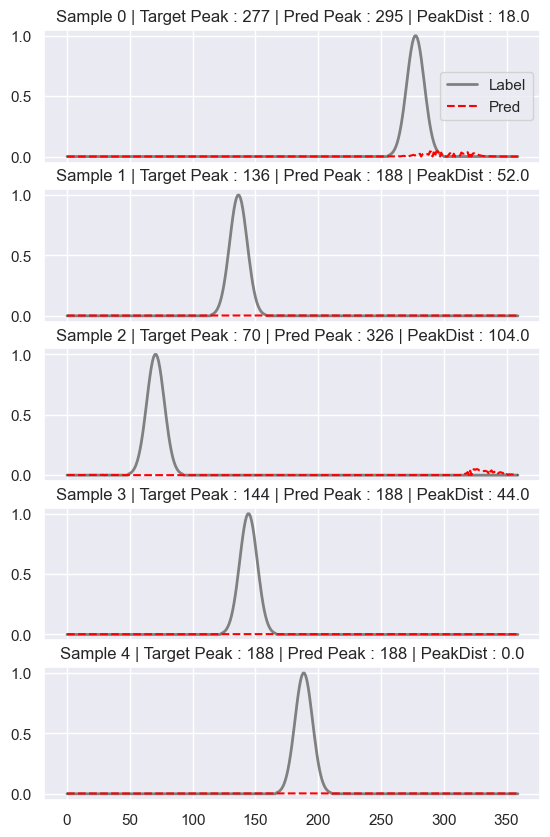

[  0   1   3   4   9  11  12  13  14  15  16  17  18  19  20  21  22  24
  25  26  27  28  29  31  32  33  34  35  36  37  40  44  46 173 174 188
 209 277 285 288 289 290 295 296 298 314 315 318 319 321 323 324 325 326
 327 328 330 331 333 334 335 337 338 339 340 341 342 343 344 345 346 347
 350 352 353 354 355 356 358 359]
SAVING TO ... /its/home/nn268/antvis/antvis/optics/res_big_loop_saves/models/p3/testing/RealThing_300E_1e-4_ADAM_Eighths_[452, 144]/2c2l/


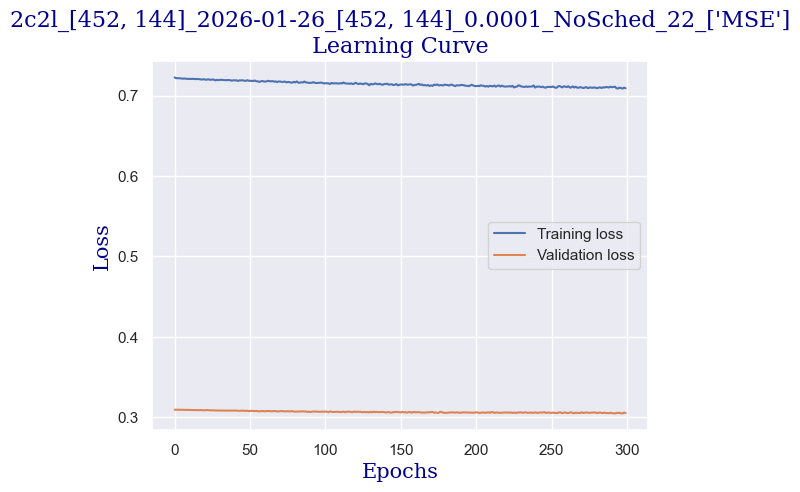

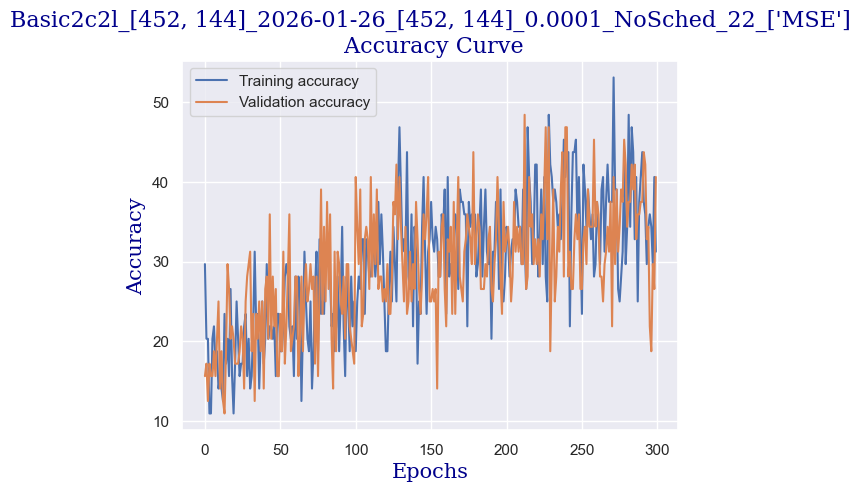

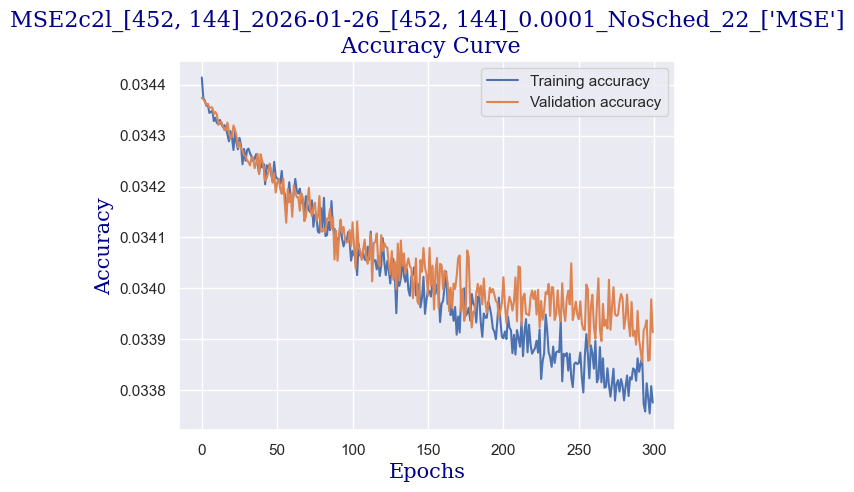

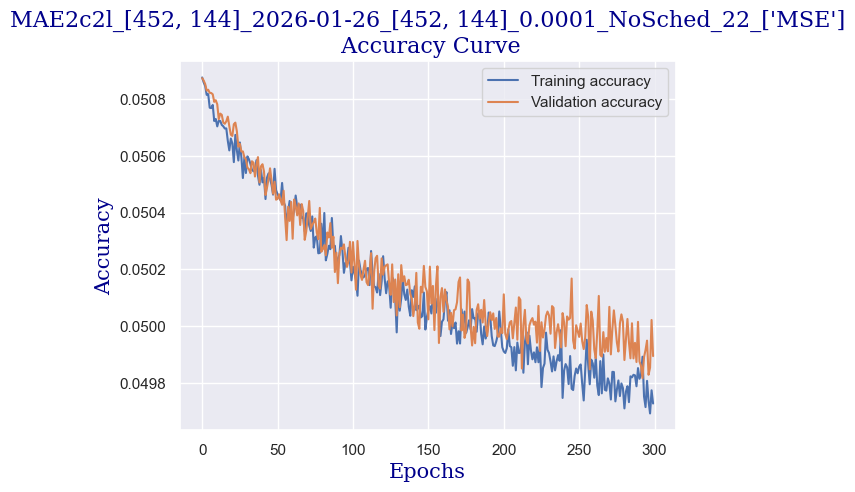

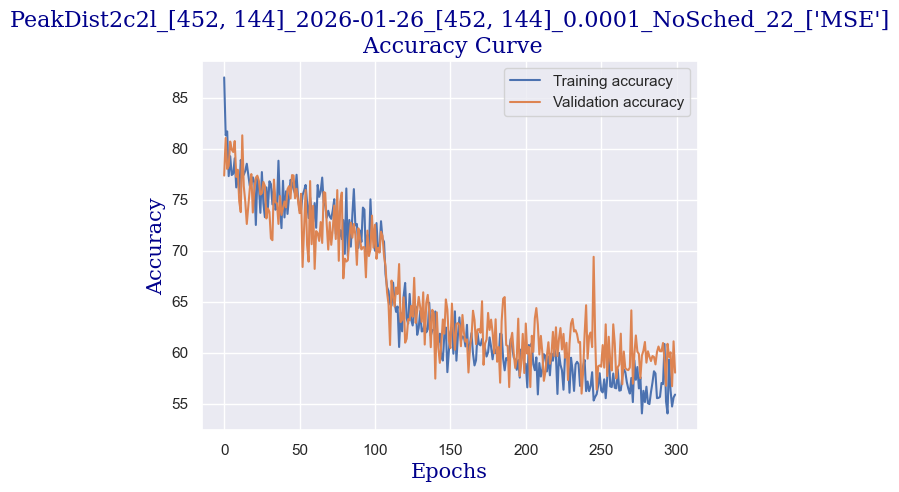

plot_confusion ACTUAL [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36]
plot_confusion PREDICTION [ 0  1  2  3  4  5 17 19 21 28 29 30 31 32 33 34 35 36]
actual  [22 26 20 14 33  4  7  4 28  3 19  4  1  0  3 33 14  1 18 22 29 33  4 16
 25 10 16  6 35  1 36 35 15 24  5  5 30 18 17 32  6 34 16 35 34 34 34  1
 32 14 20 18 12  1  7  7 34 31 31 29 35 20 18 30  8  4  5 22 22 13 27  8
  3 30 19 13 10 24  3  2 23 36 20 31  8  1 22 19 17 24 28 28 14  2 17 27
  3  4 32 12 22 30 19 15  3 33 24 32 15 24  8 11 23 21 15  0 24  3 24 35
  4 13 28 32 23  9 34 32 32  6  3 32 31 13 28 35 35  2 12 34 32 10 31 33
  2 25  6 32  2 31 18  3 21 24  1 10  5 23 24  2 11 12  3 36 12  2 19 31
 33 23  6  9 10  4  8 31  0  2 22 22 31 34 10 31 20 34  4 35 31  9 23 25
 12 19 14 13 29 10 17  3 34 15 14  2 34  3 23  4 35 20 30 35  8 33  7 10
 34  2 14  2  4 35 32 27 35 16  3  4 21 35 22 13 11 27  9 21 12  3 26  3
 19 33  4  2  2 22 29 17  4 29  1 22  5 29 3

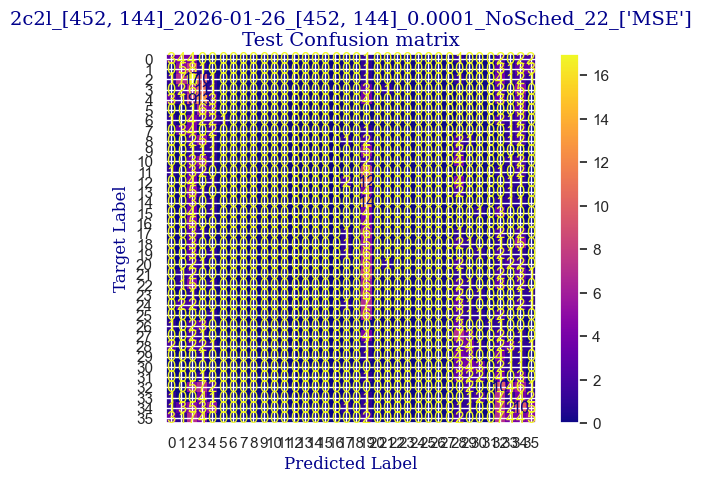

 
 END 2c2l [452, 144] Run Time:  19120.999935472006


Epochs,▁
Test acc rough,▅▄▄▁█▅▅▅▆▇▆▃
TrainAcc rough,▄▂▂▄▂▂▂▂▅▄▃▄▃▃▇▁▇▁▅▄▄▅▄▆▅▅▅▃▄▅▃▇▆▅█▅▄▅█▅
ValAcc rough,▂▁▂▂▄▄▃▄▅▃▄▅▄▆▅▄▆▅▇▇▄▅▇▅▄▅▆▆▇█▇▅▅▆▅▆▅▄▇▆
c_epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
t_loss,██▇▇▇▇▆▆▅▆▅▅▅▅▄▄▃▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁
test_acc_MAE,▅▆▆█▁▅▂▅▄▄▃█
test_acc_MSE,▆▇▇▆▁▄▃▆▃▅▄█
test_peakDist,▁▃▃█▁▅▃▅▂▁▃▃
train_err_MAE,██▇▇▆▆▇▇▅▆▅▄▅▃▆▅▃▆▄▄▅▃▅▄▃▆▄▅▄▃▄▅▃▃▂▃▄▅▁▄
+6,...


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: kckfb4di with config:
wandb: 	batch_size: 64
wandb: 	epochs: 300
wandb: 	half_ciprange: 22
wandb: 	learning_rate: 0.0001
wandb: 	loss_fn_cards: ['MSE']
wandb: 	model_cards: [{'Ks': [3, 5], 'channels': 3, 'dropout': 0.2, 'f_lin_lay': [1032192, 255744, 62208, 14976, 3072, 640, 128], 'idx': 6, 'model': '2c2l', 'name': '2c2l'}]
wandb: 	optimiser: ['adam']
wandb: 	resolution_cards: [{'index': 0, 'padding': 5, 'resolution': [452, 144]}]
wandb: 	seeds: 42
wandb: 	std_dev: 7
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from /its/home/nn268/.netrc.


{'name': '2c2l', 'model': '2c2l', 'channels': 3, 'Ks': (3, 5), 'f_lin_lay': [1032192, 255744, 62208, 14976, 3072, 640, 128], 'idx': 6, 'dropout': 0.2}
Model:  2c2l  idx: 0 / 1
resolution:  [452, 144]  idx: 0 / 1
seed:  42
loss function:  ['MSE']
Batch size:  64
Training epochs:  300
start time:  153553.659597814
Model Name 2c2l
/its/home/nn268/antvis/antvis/optics/NC_IDSW/
set_lossfn    lf  ['MSE']


  0%|                                      | 0/300 [00:00<?, ?it/s]

Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)


/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


peak dist means  89.390625
tacc:  {'baseAcc': 10.9375, 'MSE': 0.034427231266385035, 'MAE': 0.050875249540521986, 'peakDist': 89.390625}
Validating...


  0%|                              | 1/300 [00:06<33:27,  6.72s/it]

peak dist means  103.91319444444444
v loss  0.30938559770584106
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  94.79092261904762
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03437698667957669, 'MAE': 0.0508789595748697, 'peakDist': 94.79092261904762}
Validating...


  1%|▏                             | 2/300 [00:12<31:07,  6.27s/it]

peak dist means  92.27951388888889
v loss  0.3093828670680523
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  93.94791666666667
tacc:  {'baseAcc': 9.375, 'MSE': 0.03437544228065582, 'MAE': 0.050877327365534644, 'peakDist': 93.94791666666667}
Validating...


  1%|▎                             | 3/300 [00:18<30:59,  6.26s/it]

peak dist means  95.92534722222223
v loss  0.30938200652599335
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  90.96800595238095
tacc:  {'baseAcc': 12.5, 'MSE': 0.03437535961469015, 'MAE': 0.05087565204926899, 'peakDist': 90.96800595238095}
Validating...


  1%|▍                             | 4/300 [00:24<30:27,  6.17s/it]

peak dist means  95.67708333333333
v loss  0.3093807101249695
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  89.36235119047619
tacc:  {'baseAcc': 12.5, 'MSE': 0.03437391881431852, 'MAE': 0.0508711790399892, 'peakDist': 89.36235119047619}
Validating...


  2%|▌                             | 5/300 [00:31<30:40,  6.24s/it]

peak dist means  97.73958333333333
v loss  0.30936218798160553
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  92.42261904761905
tacc:  {'baseAcc': 12.5, 'MSE': 0.034371172033605124, 'MAE': 0.050864801165603456, 'peakDist': 92.42261904761905}
Validating...


  2%|▌                             | 6/300 [00:37<30:50,  6.30s/it]

peak dist means  94.4375
v loss  0.30935847386717796
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  89.25744047619048
tacc:  {'baseAcc': 10.9375, 'MSE': 0.034372540279513315, 'MAE': 0.05086485527101017, 'peakDist': 89.25744047619048}
Validating...


  2%|▋                             | 7/300 [00:43<30:40,  6.28s/it]

peak dist means  98.17361111111111
v loss  0.3093388043344021
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  89.4360119047619
tacc:  {'baseAcc': 10.9375, 'MSE': 0.03436880328115963, 'MAE': 0.05085256429655211, 'peakDist': 89.4360119047619}
Validating...


  3%|▊                             | 8/300 [00:49<30:04,  6.18s/it]

peak dist means  99.13194444444444
v loss  0.309292059391737
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  89.69047619047619
tacc:  {'baseAcc': 12.5, 'MSE': 0.03436441950145222, 'MAE': 0.05084082768076942, 'peakDist': 89.69047619047619}
Validating...


  3%|▉                             | 9/300 [00:56<30:15,  6.24s/it]

peak dist means  97.69791666666667
v loss  0.30928217619657516
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  85.9858630952381
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03435964935592243, 'MAE': 0.05081937036343983, 'peakDist': 85.9858630952381}
Validating...


  3%|▉                            | 10/300 [01:02<30:49,  6.38s/it]

peak dist means  95.07465277777777
v loss  0.3092656768858433
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  88.70386904761905
tacc:  {'baseAcc': 15.625, 'MSE': 0.034357503233920964, 'MAE': 0.05081122900758471, 'peakDist': 88.70386904761905}
Validating...


  4%|█                            | 11/300 [01:09<30:51,  6.41s/it]

peak dist means  76.02083333333333
v loss  0.3091973811388016
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.98735119047619
tacc:  {'baseAcc': 25.0, 'MSE': 0.034346094266289755, 'MAE': 0.05078036781577837, 'peakDist': 76.98735119047619}
Validating...


  4%|█▏                           | 12/300 [01:16<30:56,  6.45s/it]

peak dist means  75.75347222222223
v loss  0.30906810984015465
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.7983630952381
tacc:  {'baseAcc': 9.375, 'MSE': 0.03434735039869944, 'MAE': 0.05077654016869409, 'peakDist': 76.7983630952381}
Validating...


  4%|█▎                           | 13/300 [01:22<31:03,  6.49s/it]

peak dist means  73.57986111111111
v loss  0.30893391743302345
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.14508928571429
tacc:  {'baseAcc': 14.0625, 'MSE': 0.0343456089141823, 'MAE': 0.0507687372820718, 'peakDist': 77.14508928571429}
Validating...


  5%|█▎                           | 14/300 [01:28<30:44,  6.45s/it]

peak dist means  76.92013888888889
v loss  0.30911410972476006
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.72842261904762
tacc:  {'baseAcc': 18.75, 'MSE': 0.034320491765226634, 'MAE': 0.05069849107946668, 'peakDist': 75.72842261904762}
Validating...


  5%|█▍                           | 15/300 [01:35<30:25,  6.40s/it]

peak dist means  76.54861111111111
v loss  0.30891628935933113
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.54613095238095
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03432752600028401, 'MAE': 0.05071125818150384, 'peakDist': 75.54613095238095}
Validating...


  5%|█▌                           | 16/300 [01:41<30:26,  6.43s/it]

peak dist means  78.48611111111111
v loss  0.30899299308657646
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.34747023809524
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03433771963630404, 'MAE': 0.050743612150351204, 'peakDist': 79.34747023809524}
Validating...


  6%|█▋                           | 17/300 [01:47<29:52,  6.33s/it]

peak dist means  74.49826388888889
v loss  0.30889856815338135
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.46875
tacc:  {'baseAcc': 21.875, 'MSE': 0.034310393035411835, 'MAE': 0.05066163571817534, 'peakDist': 75.46875}
Validating...


  6%|█▋                           | 18/300 [01:54<29:38,  6.31s/it]

peak dist means  72.24479166666667
v loss  0.3087402246892452
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.26116071428571
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03430301341272536, 'MAE': 0.05065432456987245, 'peakDist': 76.26116071428571}
Validating...


  6%|█▊                           | 19/300 [02:00<29:25,  6.28s/it]

peak dist means  76.19270833333333
v loss  0.3088008500635624
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.015625
tacc:  {'baseAcc': 7.8125, 'MSE': 0.03430639544413203, 'MAE': 0.050664370436043965, 'peakDist': 77.015625}
Validating...


  7%|█▉                           | 20/300 [02:06<29:28,  6.32s/it]

peak dist means  78.45659722222223
v loss  0.30884673818945885
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.40252976190476
tacc:  {'baseAcc': 18.75, 'MSE': 0.034302812069654465, 'MAE': 0.05065394618681499, 'peakDist': 77.40252976190476}
Validating...


  7%|██                           | 21/300 [02:12<29:06,  6.26s/it]

peak dist means  75.49652777777777
v loss  0.3087616488337517
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.82142857142857
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034333140544948126, 'MAE': 0.05072380832972981, 'peakDist': 78.82142857142857}
Validating...


  7%|██▏                          | 22/300 [02:19<29:25,  6.35s/it]

peak dist means  74.94097222222223
v loss  0.30891988426446915
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.58407738095238
tacc:  {'baseAcc': 21.875, 'MSE': 0.03430258252081417, 'MAE': 0.050661904648655935, 'peakDist': 77.58407738095238}
Validating...


  8%|██▏                          | 23/300 [02:25<29:15,  6.34s/it]

peak dist means  82.65104166666667
v loss  0.3087092787027359
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.43377976190476
tacc:  {'baseAcc': 15.625, 'MSE': 0.034294136932918, 'MAE': 0.050629889858620505, 'peakDist': 76.43377976190476}
Validating...


  8%|██▎                          | 24/300 [02:32<29:21,  6.38s/it]

peak dist means  72.42361111111111
v loss  0.30859341099858284
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.82886904761905
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034315165309678944, 'MAE': 0.050697529777174906, 'peakDist': 79.82886904761905}
EPOCH    24 / 300:


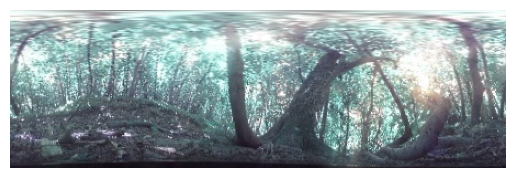

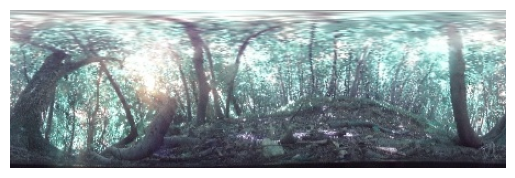

TRUE LABEL    :          272
PREDICTION    :          343
Validating...


  8%|██▍                          | 25/300 [02:39<29:49,  6.51s/it]

peak dist means  76.26736111111111
v loss  0.3087703697383404
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.34598214285714
tacc:  {'baseAcc': 23.4375, 'MSE': 0.03427968830579803, 'MAE': 0.05061238542908714, 'peakDist': 78.34598214285714}
Validating...


  9%|██▌                          | 26/300 [02:45<29:55,  6.55s/it]

peak dist means  77.30381944444444
v loss  0.3087232895195484
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.27529761904762
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034293770435310546, 'MAE': 0.05064026248596963, 'peakDist': 75.27529761904762}
Validating...


  9%|██▌                          | 27/300 [02:52<30:08,  6.63s/it]

peak dist means  79.421875
v loss  0.3088589496910572
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.78422619047619
tacc:  {'baseAcc': 17.1875, 'MSE': 0.034283568461736046, 'MAE': 0.05061863185394378, 'peakDist': 76.78422619047619}
Validating...


  9%|██▋                          | 28/300 [02:58<29:45,  6.56s/it]

peak dist means  77.89583333333333
v loss  0.30852651596069336
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.25744047619048
tacc:  {'baseAcc': 18.75, 'MSE': 0.03428808280399868, 'MAE': 0.05060862395025435, 'peakDist': 77.25744047619048}
Validating...


 10%|██▊                          | 29/300 [03:05<29:15,  6.48s/it]

peak dist means  75.60763888888889
v loss  0.3084619753062725
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.80431547619048
tacc:  {'baseAcc': 18.75, 'MSE': 0.03428863609830538, 'MAE': 0.0506274959161168, 'peakDist': 76.80431547619048}
Validating...


 10%|██▉                          | 30/300 [03:11<28:46,  6.39s/it]

peak dist means  75.07986111111111
v loss  0.3084956184029579
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.50669642857143
tacc:  {'baseAcc': 18.75, 'MSE': 0.03427703926960627, 'MAE': 0.050594246635834374, 'peakDist': 75.50669642857143}
Validating...


 10%|██▉                          | 31/300 [03:17<28:43,  6.41s/it]

peak dist means  77.32291666666667
v loss  0.30857835337519646
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.70386904761905
tacc:  {'baseAcc': 21.875, 'MSE': 0.034268325106019064, 'MAE': 0.0505931033265023, 'peakDist': 76.70386904761905}
Validating...


 11%|███                          | 32/300 [03:23<28:09,  6.30s/it]

peak dist means  78.484375
v loss  0.3085736222565174
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.99925595238095
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034260718240624384, 'MAE': 0.050569571022476466, 'peakDist': 76.99925595238095}
Validating...


 11%|███▏                         | 33/300 [03:29<27:34,  6.20s/it]

peak dist means  77.11805555555556
v loss  0.3085351400077343
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.55877976190476
tacc:  {'baseAcc': 21.875, 'MSE': 0.03426848635787055, 'MAE': 0.05058627345022701, 'peakDist': 77.55877976190476}
Validating...


 11%|███▎                         | 34/300 [03:36<27:42,  6.25s/it]

peak dist means  79.140625
v loss  0.3083355464041233
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.85119047619048
tacc:  {'baseAcc': 21.875, 'MSE': 0.03426270293337958, 'MAE': 0.050554865350325905, 'peakDist': 76.85119047619048}
Validating...


 12%|███▍                         | 35/300 [03:42<27:30,  6.23s/it]

peak dist means  78.15451388888889
v loss  0.30851560458540916
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.26636904761905
tacc:  {'baseAcc': 21.875, 'MSE': 0.03427154517599514, 'MAE': 0.05058488090123449, 'peakDist': 76.26636904761905}
Validating...


 12%|███▍                         | 36/300 [03:48<27:12,  6.19s/it]

peak dist means  78.08854166666667
v loss  0.3086366094648838
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.37574404761905
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034274944059905554, 'MAE': 0.05059212109162694, 'peakDist': 77.37574404761905}
Validating...


 12%|███▌                         | 37/300 [03:54<27:07,  6.19s/it]

peak dist means  72.28472222222223
v loss  0.30810799449682236
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.19494047619048
tacc:  {'baseAcc': 18.75, 'MSE': 0.03426477046949523, 'MAE': 0.050556908760751994, 'peakDist': 77.19494047619048}
Validating...


 13%|███▋                         | 38/300 [04:00<27:11,  6.23s/it]

peak dist means  78.26736111111111
v loss  0.30842989683151245
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  78.02083333333333
tacc:  {'baseAcc': 12.5, 'MSE': 0.034277474064202534, 'MAE': 0.05061206150622595, 'peakDist': 78.02083333333333}
Validating...


 13%|███▊                         | 39/300 [04:07<27:17,  6.27s/it]

peak dist means  80.63194444444444
v loss  0.3086418993771076
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.18229166666667
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03427411615848541, 'MAE': 0.050588060702596395, 'peakDist': 76.18229166666667}
Validating...


 13%|███▊                         | 40/300 [04:14<27:50,  6.42s/it]

peak dist means  82.34895833333333
v loss  0.3086463697254658
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.02529761904762
tacc:  {'baseAcc': 23.4375, 'MSE': 0.034286435870897206, 'MAE': 0.050629542874438424, 'peakDist': 79.02529761904762}
Validating...


 14%|███▉                         | 41/300 [04:20<27:49,  6.45s/it]

peak dist means  74.00347222222223
v loss  0.30829135701060295
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.37872023809524
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03422939209710984, 'MAE': 0.050499398970887774, 'peakDist': 74.37872023809524}
Validating...


 14%|████                         | 42/300 [04:27<28:13,  6.56s/it]

peak dist means  76.125
v loss  0.30823517590761185
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.41145833333333
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03428755629630316, 'MAE': 0.050617002482925146, 'peakDist': 77.41145833333333}
Validating...


 14%|████▏                        | 43/300 [04:33<27:58,  6.53s/it]

peak dist means  82.20833333333333
v loss  0.308752853423357
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.21354166666667
tacc:  {'baseAcc': 18.75, 'MSE': 0.0342666595464661, 'MAE': 0.05057858179012934, 'peakDist': 77.21354166666667}
Validating...


 15%|████▎                        | 44/300 [04:40<27:30,  6.45s/it]

peak dist means  74.49479166666667
v loss  0.30820389837026596
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.46056547619048
tacc:  {'baseAcc': 18.75, 'MSE': 0.03427151093880335, 'MAE': 0.05057195574045181, 'peakDist': 76.46056547619048}
Validating...


 15%|████▎                        | 45/300 [04:46<26:48,  6.31s/it]

peak dist means  78.67361111111111
v loss  0.3084903880953789
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.5952380952381
tacc:  {'baseAcc': 15.625, 'MSE': 0.03425484168387595, 'MAE': 0.05055441476759456, 'peakDist': 74.5952380952381}
EPOCH    45 / 300:


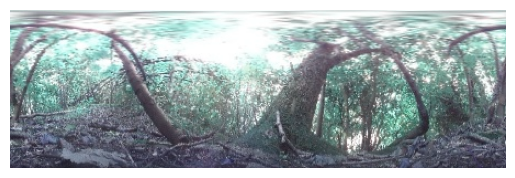

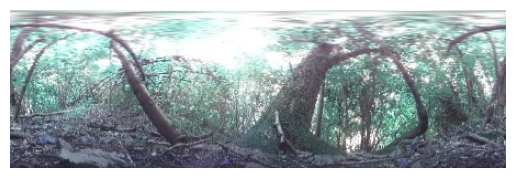

TRUE LABEL    :          23
PREDICTION    :          25
Validating...


 15%|████▍                        | 46/300 [04:52<26:19,  6.22s/it]

peak dist means  73.88888888888889
v loss  0.3080577589571476
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.17633928571429
tacc:  {'baseAcc': 18.75, 'MSE': 0.034266828071503413, 'MAE': 0.050571520413671224, 'peakDist': 77.17633928571429}
Validating...


 16%|████▌                        | 47/300 [04:58<26:10,  6.21s/it]

peak dist means  74.47048611111111
v loss  0.3081270642578602
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.35193452380952
tacc:  {'baseAcc': 12.5, 'MSE': 0.03428975563673746, 'MAE': 0.05062469467520714, 'peakDist': 79.35193452380952}
Validating...


 16%|████▋                        | 48/300 [05:04<26:13,  6.24s/it]

peak dist means  73.57291666666667
v loss  0.3083866871893406
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.89732142857143
tacc:  {'baseAcc': 20.3125, 'MSE': 0.03426416147322882, 'MAE': 0.050576950112978615, 'peakDist': 76.89732142857143}
Validating...


 16%|████▋                        | 49/300 [05:11<26:15,  6.28s/it]

peak dist means  74.05729166666667
v loss  0.30820978060364723
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.62574404761905
tacc:  {'baseAcc': 15.625, 'MSE': 0.0342656114981288, 'MAE': 0.050565212432827265, 'peakDist': 75.62574404761905}
Validating...


 17%|████▊                        | 50/300 [05:17<25:51,  6.20s/it]

peak dist means  80.10590277777777
v loss  0.3085019700229168
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.47247023809524
tacc:  {'baseAcc': 10.9375, 'MSE': 0.03424173327428954, 'MAE': 0.05051659384653682, 'peakDist': 75.47247023809524}
Validating...


 17%|████▉                        | 51/300 [05:23<25:37,  6.17s/it]

peak dist means  79.43055555555556
v loss  0.3084474429488182
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.796875
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03426779221211161, 'MAE': 0.05058817902491206, 'peakDist': 76.796875}
Validating...


 17%|█████                        | 52/300 [05:29<25:38,  6.20s/it]

peak dist means  74.95659722222223
v loss  0.3081895373761654
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.10416666666667
tacc:  {'baseAcc': 31.25, 'MSE': 0.03423919723857017, 'MAE': 0.05050754795471827, 'peakDist': 74.10416666666667}
Validating...


 18%|█████                        | 53/300 [05:36<26:17,  6.39s/it]

peak dist means  78.11979166666667
v loss  0.3085826747119427
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.75520833333333
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03426899459390413, 'MAE': 0.050578062200830096, 'peakDist': 76.75520833333333}
Validating...


 18%|█████▏                       | 54/300 [05:42<26:36,  6.49s/it]

peak dist means  77.93576388888889
v loss  0.30825675278902054
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.19642857142857
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03425088205507824, 'MAE': 0.050550571332375206, 'peakDist': 77.19642857142857}
Validating...


 18%|█████▎                       | 55/300 [05:49<26:29,  6.49s/it]

peak dist means  77.55902777777777
v loss  0.30837228894233704
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.96354166666667
tacc:  {'baseAcc': 20.3125, 'MSE': 0.034238191232794805, 'MAE': 0.050512218936568216, 'peakDist': 75.96354166666667}
Validating...


 19%|█████▍                       | 56/300 [05:56<26:55,  6.62s/it]

peak dist means  74.24826388888889
v loss  0.30812739953398705
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  74.62425595238095
tacc:  {'baseAcc': 25.0, 'MSE': 0.0342399524081321, 'MAE': 0.050537148579245524, 'peakDist': 74.62425595238095}
Validating...


 19%|█████▌                       | 57/300 [06:02<26:41,  6.59s/it]

peak dist means  76.15104166666667
v loss  0.3081967309117317
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.00595238095238
tacc:  {'baseAcc': 21.875, 'MSE': 0.034244168194986525, 'MAE': 0.05051439716702416, 'peakDist': 76.00595238095238}
Validating...


 19%|█████▌                       | 58/300 [06:09<26:40,  6.61s/it]

peak dist means  75.49652777777777
v loss  0.30800025537610054
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  79.44568452380952
tacc:  {'baseAcc': 17.1875, 'MSE': 0.03425986568133036, 'MAE': 0.0505595336712542, 'peakDist': 79.44568452380952}
Validating...


 20%|█████▋                       | 59/300 [06:15<26:03,  6.49s/it]

peak dist means  71.91666666666667
v loss  0.3083486817777157
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.22544642857143
tacc:  {'baseAcc': 20.3125, 'MSE': 0.0342517060538133, 'MAE': 0.050545270244280495, 'peakDist': 76.22544642857143}
Validating...


 20%|█████▊                       | 60/300 [06:22<25:51,  6.46s/it]

peak dist means  78.94965277777777
v loss  0.30821262672543526
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.95833333333333
tacc:  {'baseAcc': 26.5625, 'MSE': 0.03426045498677662, 'MAE': 0.050562349813325067, 'peakDist': 77.95833333333333}
Validating...


 20%|█████▉                       | 61/300 [06:28<25:12,  6.33s/it]

peak dist means  74.13368055555556
v loss  0.3080907501280308
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  75.97991071428571
tacc:  {'baseAcc': 25.0, 'MSE': 0.03424092506368955, 'MAE': 0.050525193058309104, 'peakDist': 75.97991071428571}
Validating...


 21%|█████▉                       | 62/300 [06:34<25:07,  6.33s/it]

peak dist means  75.15625
v loss  0.3081584498286247
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  76.82217261904762
tacc:  {'baseAcc': 18.75, 'MSE': 0.03424930803122975, 'MAE': 0.050524083276589714, 'peakDist': 76.82217261904762}
Validating...


 21%|██████                       | 63/300 [06:40<24:56,  6.31s/it]

peak dist means  69.52083333333333
v loss  0.3075877018272877
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
peak dist means  77.08035714285714
tacc:  {'baseAcc': 14.0625, 'MSE': 0.03426461578125045, 'MAE': 0.05056392241801534, 'peakDist': 77.08035714285714}
Validating...


 21%|██████▏                      | 64/300 [06:47<24:55,  6.34s/it]

peak dist means  73.09722222222223
v loss  0.3080346845090389
Data Loading...
Training...
Optimizer present:  Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)


In [ ]:
sweep_id = wandb.sweep(sweep= config, project=projectNAME)

wandb.agent(sweep_id, function=_go, count=20)

In [ ]:
#_go(config)